In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import h5py
import cv2

import tensorflow as tf
from tensorflow.keras import layers
keras = tf.keras

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, mean_squared_error
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from datetime import datetime
from joblib import Parallel,delayed

from scipy import signal
from scipy.signal import resample,hilbert
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [2]:
# set CNN data paths

# path to image dataset
dir = '/Users/kaelynnrose/Saved_Documents/Documents/GALVANIZE/Capstones/Capstone_2/images/big_data_random/specs'

# path to image dataset
data_dir = '/Users/kaelynnrose/Saved_Documents/Documents/GALVANIZE/Capstones/Capstone_2/'


# paths to csv and hdf5 (waveform/signal) files
noise_csv_path = data_dir+'data/chunk1/chunk1.csv'
noise_sig_path = data_dir+'data/chunk1/chunk1.hdf5'
eq1_csv_path = data_dir+'data/chunk2/chunk2.csv'
eq1_sig_path = data_dir+'data/chunk2/chunk2.hdf5'
eq2_csv_path = data_dir+'data/chunk3/chunk3.csv'
eq2_sig_path = data_dir+'data/chunk3/chunk3.hdf5'
eq3_csv_path = data_dir+'data/chunk4/chunk4.csv'
eq3_sig_path = data_dir+'data/chunk4/chunk4.hdf5'
eq4_csv_path = data_dir+'data/chunk5/chunk5.csv'
eq4_sig_path = data_dir+'data/chunk5/chunk5.hdf5'
eq5_csv_path = data_dir+'data/chunk6/chunk6.csv'
eq5_sig_path = data_dir+'data/chunk6/chunk6.hdf5'

# read the noise and earthquake csv files into separate dataframes:
earthquakes_1 = pd.read_csv(eq1_csv_path)
earthquakes_2 = pd.read_csv(eq2_csv_path)
earthquakes_3 = pd.read_csv(eq3_csv_path)
earthquakes_4 = pd.read_csv(eq4_csv_path)
earthquakes_5 = pd.read_csv(eq5_csv_path)
noise = pd.read_csv(noise_csv_path)

full_csv = pd.concat([earthquakes_1,earthquakes_2,earthquakes_3,earthquakes_4,earthquakes_5,noise])

# making lists of trace names for the earthquake sets
eq1_list = earthquakes_1['trace_name'].to_list()
eq2_list = earthquakes_2['trace_name'].to_list()
eq3_list = earthquakes_3['trace_name'].to_list()
eq4_list = earthquakes_4['trace_name'].to_list()
eq5_list = earthquakes_5['trace_name'].to_list()

# making a list of trace names for the noise set
noise_list = noise['trace_name'].to_list()


# set data paths for LSTM
dataset_path = 'partial_signal_dataset100000.npy'
envelopes_path = 'envelopes100k.npy'
label_csv_path = 'partial_signal_df100000.csv'

/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3147: DtypeWarning: Columns (21) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [16]:
class SeismicCNN():

    def __init__(self,model_type,target,choose_dataset_size,full_csv,dir):
        self.model_type = model_type
        self.target = target
        self.choose_dataset_size = choose_dataset_size
        self.full_csv = full_csv
        self.dir = dir
        self.traces_array = []
        self.img_dataset = []
        self.labels = []
        self.imgs = []
        self.train_images = []
        self.train_labels = []
        self.test_images = []
        self.test_labels = []
        self.model = []
        self.test_loss = []
        self.test_acc = []
        self.predicted_classes = []
        self.predicted_probs = []
        self.cm = []
        self.epochs = []
        self.history = []

      
        if self.model_type == 'classification':
            # create list of traces in the image datset
            print('Creating seismic trace list')
            for filename in os.listdir(dir): # loop through image directory and get filenames
                if filename.endswith('.png'):
                    self.traces_array.append(filename[0:-4]) # remove the .png from filename

            if choose_dataset_size == 'full':
                # select only the rows in the metadata dataframe which correspond to images
                print('Selecting traces matching images in directory')
                self.img_dataset = self.full_csv.loc[self.full_csv['trace_name'].isin(self.traces_array)] # select rows from the csv that have matching image files
                self.labels = self.img_dataset['trace_category'] # target variable, 'earthquake' or 'noise'
                self.labels = np.array(self.labels.map(lambda x: 1 if x == 'earthquake_local' else 0)) # transform target variable to numerical categories
                print(f'The number of traces in the directory is {len(self.img_dataset)}')
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through images and read them into the imgs array
                    count += 0
                    print(f'Working on trace # {count}')
                    img= cv2.imread(self.dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                imgs.shape
                
            elif type(choose_dataset_size) == int:
                seismic_dataset = self.full_csv.loc[self.full_csv['trace_name'].isin(self.traces_array)] # get rows of csv dataset that have corresponding images in directory
                choose_seismic_dataset = np.random.choice(np.array(seismic_dataset['trace_name']),choose_dataset_size,replace=False)
                self.img_dataset = seismic_dataset.loc[seismic_dataset['trace_name'].isin(choose_seismic_dataset)] # random choice of images from the directory
                self.labels = self.img_dataset['trace_category'] # target variable, 'earthquake' or 'noise'
                self.labels = np.array(self.labels.map(lambda x: 1 if x == 'earthquake_local' else 0)) # transform target variable to numerical categories
                print(f'The number of traces in the directory is {len(self.img_dataset)}')
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through trace names in filtered dataframe and append images to imgs array
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(self.dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                self.imgs.shape
                
            else:
                print('Error: please choose either "full" for variable choose_dataset_size to use the full dataset, or provide an integer number of random samples to take from the dataset')
                        
        elif self.model_type == 'regression':
        
            for filename in os.listdir(dir): # loop through every file in the directory and get trace names from the image files
                if filename.endswith('.png'):
                    self.traces_array.append(filename[0:-4]) # remove .png from image file names
            print(f'The number of all traces in the directory including noise is {len(self.traces_array)}')
            local_quakes = self.full_csv[self.full_csv['trace_category'] == 'earthquake_local'] # get only signals corresponding to local earthquakes, not noise
            local_quakes_data = local_quakes.loc[local_quakes['trace_name'].isin(self.traces_array)]
            
            if choose_dataset_size == 'full':
                self.img_dataset = local_quakes.loc[local_quakes['trace_name'].isin(self.traces_array)]
                print(f'The number of all earthquakes in the directory excluding noise is {len(self.img_dataset)}')
                self.labels = self.img_dataset[target] # target variable
                
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through the images dataframe and read in the images with matching trace names
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    imgs.append(img)
                self.imgs = np.array(imgs)
                
            elif type(choose_dataset_size) == int:
            
                choose_local_quakes = np.random.choice(np.array(local_quakes_data['trace_name']),choose_dataset_size,replace=False)
                self.img_dataset = local_quakes_data.loc[local_quakes_data['trace_name'].isin(choose_local_quakes)]
                self.labels = self.img_dataset[self.target] # target variable
                
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through dataframe and read in images corresponding to trace names in data frame
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                
            else:
                print('Error: please choose either "full" for variable choose_dataset_size to use the full dataset, or provide an integer number of random samples to take from the dataset')
                
        else:
            print('Error: please choose either "classification" or "regression" for CNN model type')
 

    def train_test_split(self,test_size,random_state):
        # train test split on images, 75% training data and 25% testing data
        self.train_images, self.test_images, self.train_labels, self.test_labels = train_test_split(self.imgs,self.labels,random_state=random_state,test_size=test_size)
        print(f'The training images set is size: {self.train_images.shape}')
        print(f'The training labels set is size: {self.train_labels.shape}')
        print(f'The testing images set is size: {self.test_images.shape}')
        print(f'The testing labels set is size: {self.test_labels.shape}')
        
        print('Scaling image intensity')
        self.train_images = self.train_images/255.0 # scale intensity to between 0 and 1
        self.test_images = self.test_images/255.0 # scale intensity to between 0 and 1

        img_height = self.train_images.shape[1] # get height of each image in pixels
        img_width = self.train_images.shape[2] # get width of each image in pixels

        print('Resizing images')
        self.train_images = self.train_images.reshape(-1,img_height,img_width,1) # reshape to input into CNN which requires a 4-tensor
        self.test_images = self.test_images.reshape(-1,img_height,img_width,1) # reshape to input into CNN which requires a 4-tensor

    def classification_cnn(self,epochs):
        self.epochs = epochs
        
        # set callbacks so that the model will be saved after each epoch
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/specs_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}',
                save_freq='epoch')
        ]

        # build CNN on dataset
        print('Building CNN model')
        
        model = keras.Sequential()
        model.add(keras.layers.Conv2D(32, kernel_size=(5, 5), activation = 'relu', padding = 'same'))
        model.add(keras.layers.MaxPool2D(2,2))
        model.add(keras.layers.Dropout(0.25))
        model.add(keras.layers.Flatten(input_shape=(self.imgs.shape[1],self.imgs.shape[2])))
        model.add(keras.layers.Dense(64,activation='relu'))
        model.add(keras.layers.Dense(16,activation='relu'))
        model.add(keras.layers.Dense(2,activation='softmax'))

        opt = keras.optimizers.Adam(learning_rate=1e-6)
        model.compile(optimizer=opt,loss='sparse_categorical_crossentropy',metrics='accuracy')
        self.history = model.fit(self.train_images,self.train_labels,batch_size=64,epochs=epochs,callbacks=callbacks,validation_split=0.2)

        print(model.summary())
        
        # Set model save path
        saved_model_path = f'./saved_models/specs_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}'
        # Save entire model to a HDF5 file
        model.save(saved_model_path)
        
        self.model = model
        
    def regression_cnn(self,target,epochs):
        self.epochs = epochs
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/specs_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}',
                save_freq='epoch')
        ]

        # build CNN on dataset
        print('Building Regression CNN model')
        model = keras.Sequential()
        model.add(keras.layers.Conv2D(64, kernel_size=(5, 5), activation = 'relu', padding = 'same'))
        model.add(keras.layers.MaxPool2D(2,2))
        model.add(keras.layers.Dropout(0.50))
        model.add(keras.layers.Flatten(input_shape=(self.imgs.shape[1],self.imgs.shape[2])))
        model.add(keras.layers.Dense(64,activation='relu'))
        model.add(keras.layers.Dense(16,activation='relu'))
        model.add(keras.layers.Dense(1))

        model.compile(optimizer='adam',loss='mse')
        self.history = model.fit(self.train_images,self.train_labels,epochs=epochs,callbacks=callbacks,validation_split=0.2)

        print(model.summary())
        
        # Set model save path
        saved_model_path = f'./saved_models/specs_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}' # _%H%M%S
        # Save entire model to a HDF5 file
        model.save(saved_model_path)
        
        self.model = model


    def evaluate_classification_model(self):
        print('Evaluating model on test dataset')
        self.test_loss, self.test_acc = self.model.evaluate(self.test_images, self.test_labels, verbose=1) # get model evaluation metrics
        print("\nTest data, accuracy: {:5.2f}%".format(100*self.test_acc))

        print('Finding predicted classes and probabilities to build confusion matrix')
        self.predicted_classes = np.argmax(self.model.predict(self.test_images),axis=-1) # predict the class of each image
        self.predicted_probs = self.model.predict(self.test_images) # predict the probability of each image belonging to a class

        # create confusion matrix
        print('Building confusion matrix')
        self.cm = confusion_matrix(self.test_labels,self.predicted_classes) # compare target values to predicted values and show confusion matrix
        print(self.cm)
        accuracy = accuracy_score(self.test_labels,self.predicted_classes)
        precision = precision_score(self.test_labels,self.predicted_classes)
        recall = recall_score(self.test_labels,self.predicted_classes)
        print(f'The accuracy of the model is {accuracy}, the precision is {precision}, and the recall is {recall}.')

        # plot confusion matrix
        plt.style.use('default')
        disp = ConfusionMatrixDisplay(confusion_matrix=self.cm, display_labels=['not earthquake','earthquake'])
        disp.plot(cmap='Blues', values_format='')
        plt.title(f'Classification CNN Results ({self.epochs} epochs)')
        plt.tight_layout()
        plt.savefig('confusion_matrix.png')
        plt.show()
        
        # plot accuracy history
        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['accuracy'])
        ax.plot(self.history.history['val_accuracy'])
        ax.set_title('Model Accuracy')
        ax.set_ylabel('Accuracy')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_accuracy.png')
        plt.show()
        
    def evaluate_regression_model(self):
        print('Evaluating model on test dataset')
        self.test_loss = self.model.evaluate(self.test_images, self.test_labels, verbose=1)
        print(f'Test data loss: {self.test_loss}')
        
        print('Getting predictions')
        self.predicted = self.model.predict(self.test_images)

        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.scatter(self.test_labels,self.predicted,alpha=0.25)
        point1 = [0,0]
        point2 = [6,6]
        xvalues = [point1[0], point2[0]]
        yvalues = [point1[1], point2[1]]
        ax.plot(xvalues,yvalues,color='blue')
        ax.set_ylabel('Predicted Value',fontsize=14)
        ax.set_xlabel('Observed Value',fontsize=14)
        ax.set_title(f'Regression CNN Results 100k dataset | ({self.epochs} epochs)')
        ax.tick_params(axis='x', labelsize=14)
        ax.tick_params(axis='y', labelsize=14)
        plt.tight_layout()
        plt.savefig('true_vs_predicted.png')
        plt.show()

        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['loss'])
        ax.plot(self.history.history['val_loss'])
        ax.set_title('Model Accuracy')
        ax.set_ylabel('Loss (MSE)')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_loss.png')
        plt.show()

Creating seismic trace list
The number of traces in the directory is 100000
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working o

Working on trace # 452
Working on trace # 453
Working on trace # 454
Working on trace # 455
Working on trace # 456
Working on trace # 457
Working on trace # 458
Working on trace # 459
Working on trace # 460
Working on trace # 461
Working on trace # 462
Working on trace # 463
Working on trace # 464
Working on trace # 465
Working on trace # 466
Working on trace # 467
Working on trace # 468
Working on trace # 469
Working on trace # 470
Working on trace # 471
Working on trace # 472
Working on trace # 473
Working on trace # 474
Working on trace # 475
Working on trace # 476
Working on trace # 477
Working on trace # 478
Working on trace # 479
Working on trace # 480
Working on trace # 481
Working on trace # 482
Working on trace # 483
Working on trace # 484
Working on trace # 485
Working on trace # 486
Working on trace # 487
Working on trace # 488
Working on trace # 489
Working on trace # 490
Working on trace # 491
Working on trace # 492
Working on trace # 493
Working on trace # 494
Working on 

Working on trace # 947
Working on trace # 948
Working on trace # 949
Working on trace # 950
Working on trace # 951
Working on trace # 952
Working on trace # 953
Working on trace # 954
Working on trace # 955
Working on trace # 956
Working on trace # 957
Working on trace # 958
Working on trace # 959
Working on trace # 960
Working on trace # 961
Working on trace # 962
Working on trace # 963
Working on trace # 964
Working on trace # 965
Working on trace # 966
Working on trace # 967
Working on trace # 968
Working on trace # 969
Working on trace # 970
Working on trace # 971
Working on trace # 972
Working on trace # 973
Working on trace # 974
Working on trace # 975
Working on trace # 976
Working on trace # 977
Working on trace # 978
Working on trace # 979
Working on trace # 980
Working on trace # 981
Working on trace # 982
Working on trace # 983
Working on trace # 984
Working on trace # 985
Working on trace # 986
Working on trace # 987
Working on trace # 988
Working on trace # 989
Working on 

Working on trace # 1440
Working on trace # 1441
Working on trace # 1442
Working on trace # 1443
Working on trace # 1444
Working on trace # 1445
Working on trace # 1446
Working on trace # 1447
Working on trace # 1448
Working on trace # 1449
Working on trace # 1450
Working on trace # 1451
Working on trace # 1452
Working on trace # 1453
Working on trace # 1454
Working on trace # 1455
Working on trace # 1456
Working on trace # 1457
Working on trace # 1458
Working on trace # 1459
Working on trace # 1460
Working on trace # 1461
Working on trace # 1462
Working on trace # 1463
Working on trace # 1464
Working on trace # 1465
Working on trace # 1466
Working on trace # 1467
Working on trace # 1468
Working on trace # 1469
Working on trace # 1470
Working on trace # 1471
Working on trace # 1472
Working on trace # 1473
Working on trace # 1474
Working on trace # 1475
Working on trace # 1476
Working on trace # 1477
Working on trace # 1478
Working on trace # 1479
Working on trace # 1480
Working on trace

Working on trace # 1943
Working on trace # 1944
Working on trace # 1945
Working on trace # 1946
Working on trace # 1947
Working on trace # 1948
Working on trace # 1949
Working on trace # 1950
Working on trace # 1951
Working on trace # 1952
Working on trace # 1953
Working on trace # 1954
Working on trace # 1955
Working on trace # 1956
Working on trace # 1957
Working on trace # 1958
Working on trace # 1959
Working on trace # 1960
Working on trace # 1961
Working on trace # 1962
Working on trace # 1963
Working on trace # 1964
Working on trace # 1965
Working on trace # 1966
Working on trace # 1967
Working on trace # 1968
Working on trace # 1969
Working on trace # 1970
Working on trace # 1971
Working on trace # 1972
Working on trace # 1973
Working on trace # 1974
Working on trace # 1975
Working on trace # 1976
Working on trace # 1977
Working on trace # 1978
Working on trace # 1979
Working on trace # 1980
Working on trace # 1981
Working on trace # 1982
Working on trace # 1983
Working on trace

Working on trace # 2291
Working on trace # 2292
Working on trace # 2293
Working on trace # 2294
Working on trace # 2295
Working on trace # 2296
Working on trace # 2297
Working on trace # 2298
Working on trace # 2299
Working on trace # 2300
Working on trace # 2301
Working on trace # 2302
Working on trace # 2303
Working on trace # 2304
Working on trace # 2305
Working on trace # 2306
Working on trace # 2307
Working on trace # 2308
Working on trace # 2309
Working on trace # 2310
Working on trace # 2311
Working on trace # 2312
Working on trace # 2313
Working on trace # 2314
Working on trace # 2315
Working on trace # 2316
Working on trace # 2317
Working on trace # 2318
Working on trace # 2319
Working on trace # 2320
Working on trace # 2321
Working on trace # 2322
Working on trace # 2323
Working on trace # 2324
Working on trace # 2325
Working on trace # 2326
Working on trace # 2327
Working on trace # 2328
Working on trace # 2329
Working on trace # 2330
Working on trace # 2331
Working on trace

Working on trace # 2769
Working on trace # 2770
Working on trace # 2771
Working on trace # 2772
Working on trace # 2773
Working on trace # 2774
Working on trace # 2775
Working on trace # 2776
Working on trace # 2777
Working on trace # 2778
Working on trace # 2779
Working on trace # 2780
Working on trace # 2781
Working on trace # 2782
Working on trace # 2783
Working on trace # 2784
Working on trace # 2785
Working on trace # 2786
Working on trace # 2787
Working on trace # 2788
Working on trace # 2789
Working on trace # 2790
Working on trace # 2791
Working on trace # 2792
Working on trace # 2793
Working on trace # 2794
Working on trace # 2795
Working on trace # 2796
Working on trace # 2797
Working on trace # 2798
Working on trace # 2799
Working on trace # 2800
Working on trace # 2801
Working on trace # 2802
Working on trace # 2803
Working on trace # 2804
Working on trace # 2805
Working on trace # 2806
Working on trace # 2807
Working on trace # 2808
Working on trace # 2809
Working on trace

Working on trace # 3198
Working on trace # 3199
Working on trace # 3200
Working on trace # 3201
Working on trace # 3202
Working on trace # 3203
Working on trace # 3204
Working on trace # 3205
Working on trace # 3206
Working on trace # 3207
Working on trace # 3208
Working on trace # 3209
Working on trace # 3210
Working on trace # 3211
Working on trace # 3212
Working on trace # 3213
Working on trace # 3214
Working on trace # 3215
Working on trace # 3216
Working on trace # 3217
Working on trace # 3218
Working on trace # 3219
Working on trace # 3220
Working on trace # 3221
Working on trace # 3222
Working on trace # 3223
Working on trace # 3224
Working on trace # 3225
Working on trace # 3226
Working on trace # 3227
Working on trace # 3228
Working on trace # 3229
Working on trace # 3230
Working on trace # 3231
Working on trace # 3232
Working on trace # 3233
Working on trace # 3234
Working on trace # 3235
Working on trace # 3236
Working on trace # 3237
Working on trace # 3238
Working on trace

Working on trace # 3684
Working on trace # 3685
Working on trace # 3686
Working on trace # 3687
Working on trace # 3688
Working on trace # 3689
Working on trace # 3690
Working on trace # 3691
Working on trace # 3692
Working on trace # 3693
Working on trace # 3694
Working on trace # 3695
Working on trace # 3696
Working on trace # 3697
Working on trace # 3698
Working on trace # 3699
Working on trace # 3700
Working on trace # 3701
Working on trace # 3702
Working on trace # 3703
Working on trace # 3704
Working on trace # 3705
Working on trace # 3706
Working on trace # 3707
Working on trace # 3708
Working on trace # 3709
Working on trace # 3710
Working on trace # 3711
Working on trace # 3712
Working on trace # 3713
Working on trace # 3714
Working on trace # 3715
Working on trace # 3716
Working on trace # 3717
Working on trace # 3718
Working on trace # 3719
Working on trace # 3720
Working on trace # 3721
Working on trace # 3722
Working on trace # 3723
Working on trace # 3724
Working on trace

Working on trace # 4151
Working on trace # 4152
Working on trace # 4153
Working on trace # 4154
Working on trace # 4155
Working on trace # 4156
Working on trace # 4157
Working on trace # 4158
Working on trace # 4159
Working on trace # 4160
Working on trace # 4161
Working on trace # 4162
Working on trace # 4163
Working on trace # 4164
Working on trace # 4165
Working on trace # 4166
Working on trace # 4167
Working on trace # 4168
Working on trace # 4169
Working on trace # 4170
Working on trace # 4171
Working on trace # 4172
Working on trace # 4173
Working on trace # 4174
Working on trace # 4175
Working on trace # 4176
Working on trace # 4177
Working on trace # 4178
Working on trace # 4179
Working on trace # 4180
Working on trace # 4181
Working on trace # 4182
Working on trace # 4183
Working on trace # 4184
Working on trace # 4185
Working on trace # 4186
Working on trace # 4187
Working on trace # 4188
Working on trace # 4189
Working on trace # 4190
Working on trace # 4191
Working on trace

Working on trace # 4605
Working on trace # 4606
Working on trace # 4607
Working on trace # 4608
Working on trace # 4609
Working on trace # 4610
Working on trace # 4611
Working on trace # 4612
Working on trace # 4613
Working on trace # 4614
Working on trace # 4615
Working on trace # 4616
Working on trace # 4617
Working on trace # 4618
Working on trace # 4619
Working on trace # 4620
Working on trace # 4621
Working on trace # 4622
Working on trace # 4623
Working on trace # 4624
Working on trace # 4625
Working on trace # 4626
Working on trace # 4627
Working on trace # 4628
Working on trace # 4629
Working on trace # 4630
Working on trace # 4631
Working on trace # 4632
Working on trace # 4633
Working on trace # 4634
Working on trace # 4635
Working on trace # 4636
Working on trace # 4637
Working on trace # 4638
Working on trace # 4639
Working on trace # 4640
Working on trace # 4641
Working on trace # 4642
Working on trace # 4643
Working on trace # 4644
Working on trace # 4645
Working on trace

Working on trace # 5074
Working on trace # 5075
Working on trace # 5076
Working on trace # 5077
Working on trace # 5078
Working on trace # 5079
Working on trace # 5080
Working on trace # 5081
Working on trace # 5082
Working on trace # 5083
Working on trace # 5084
Working on trace # 5085
Working on trace # 5086
Working on trace # 5087
Working on trace # 5088
Working on trace # 5089
Working on trace # 5090
Working on trace # 5091
Working on trace # 5092
Working on trace # 5093
Working on trace # 5094
Working on trace # 5095
Working on trace # 5096
Working on trace # 5097
Working on trace # 5098
Working on trace # 5099
Working on trace # 5100
Working on trace # 5101
Working on trace # 5102
Working on trace # 5103
Working on trace # 5104
Working on trace # 5105
Working on trace # 5106
Working on trace # 5107
Working on trace # 5108
Working on trace # 5109
Working on trace # 5110
Working on trace # 5111
Working on trace # 5112
Working on trace # 5113
Working on trace # 5114
Working on trace

Working on trace # 5554
Working on trace # 5555
Working on trace # 5556
Working on trace # 5557
Working on trace # 5558
Working on trace # 5559
Working on trace # 5560
Working on trace # 5561
Working on trace # 5562
Working on trace # 5563
Working on trace # 5564
Working on trace # 5565
Working on trace # 5566
Working on trace # 5567
Working on trace # 5568
Working on trace # 5569
Working on trace # 5570
Working on trace # 5571
Working on trace # 5572
Working on trace # 5573
Working on trace # 5574
Working on trace # 5575
Working on trace # 5576
Working on trace # 5577
Working on trace # 5578
Working on trace # 5579
Working on trace # 5580
Working on trace # 5581
Working on trace # 5582
Working on trace # 5583
Working on trace # 5584
Working on trace # 5585
Working on trace # 5586
Working on trace # 5587
Working on trace # 5588
Working on trace # 5589
Working on trace # 5590
Working on trace # 5591
Working on trace # 5592
Working on trace # 5593
Working on trace # 5594
Working on trace

Working on trace # 6045
Working on trace # 6046
Working on trace # 6047
Working on trace # 6048
Working on trace # 6049
Working on trace # 6050
Working on trace # 6051
Working on trace # 6052
Working on trace # 6053
Working on trace # 6054
Working on trace # 6055
Working on trace # 6056
Working on trace # 6057
Working on trace # 6058
Working on trace # 6059
Working on trace # 6060
Working on trace # 6061
Working on trace # 6062
Working on trace # 6063
Working on trace # 6064
Working on trace # 6065
Working on trace # 6066
Working on trace # 6067
Working on trace # 6068
Working on trace # 6069
Working on trace # 6070
Working on trace # 6071
Working on trace # 6072
Working on trace # 6073
Working on trace # 6074
Working on trace # 6075
Working on trace # 6076
Working on trace # 6077
Working on trace # 6078
Working on trace # 6079
Working on trace # 6080
Working on trace # 6081
Working on trace # 6082
Working on trace # 6083
Working on trace # 6084
Working on trace # 6085
Working on trace

Working on trace # 6527
Working on trace # 6528
Working on trace # 6529
Working on trace # 6530
Working on trace # 6531
Working on trace # 6532
Working on trace # 6533
Working on trace # 6534
Working on trace # 6535
Working on trace # 6536
Working on trace # 6537
Working on trace # 6538
Working on trace # 6539
Working on trace # 6540
Working on trace # 6541
Working on trace # 6542
Working on trace # 6543
Working on trace # 6544
Working on trace # 6545
Working on trace # 6546
Working on trace # 6547
Working on trace # 6548
Working on trace # 6549
Working on trace # 6550
Working on trace # 6551
Working on trace # 6552
Working on trace # 6553
Working on trace # 6554
Working on trace # 6555
Working on trace # 6556
Working on trace # 6557
Working on trace # 6558
Working on trace # 6559
Working on trace # 6560
Working on trace # 6561
Working on trace # 6562
Working on trace # 6563
Working on trace # 6564
Working on trace # 6565
Working on trace # 6566
Working on trace # 6567
Working on trace

Working on trace # 7010
Working on trace # 7011
Working on trace # 7012
Working on trace # 7013
Working on trace # 7014
Working on trace # 7015
Working on trace # 7016
Working on trace # 7017
Working on trace # 7018
Working on trace # 7019
Working on trace # 7020
Working on trace # 7021
Working on trace # 7022
Working on trace # 7023
Working on trace # 7024
Working on trace # 7025
Working on trace # 7026
Working on trace # 7027
Working on trace # 7028
Working on trace # 7029
Working on trace # 7030
Working on trace # 7031
Working on trace # 7032
Working on trace # 7033
Working on trace # 7034
Working on trace # 7035
Working on trace # 7036
Working on trace # 7037
Working on trace # 7038
Working on trace # 7039
Working on trace # 7040
Working on trace # 7041
Working on trace # 7042
Working on trace # 7043
Working on trace # 7044
Working on trace # 7045
Working on trace # 7046
Working on trace # 7047
Working on trace # 7048
Working on trace # 7049
Working on trace # 7050
Working on trace

Working on trace # 7490
Working on trace # 7491
Working on trace # 7492
Working on trace # 7493
Working on trace # 7494
Working on trace # 7495
Working on trace # 7496
Working on trace # 7497
Working on trace # 7498
Working on trace # 7499
Working on trace # 7500
Working on trace # 7501
Working on trace # 7502
Working on trace # 7503
Working on trace # 7504
Working on trace # 7505
Working on trace # 7506
Working on trace # 7507
Working on trace # 7508
Working on trace # 7509
Working on trace # 7510
Working on trace # 7511
Working on trace # 7512
Working on trace # 7513
Working on trace # 7514
Working on trace # 7515
Working on trace # 7516
Working on trace # 7517
Working on trace # 7518
Working on trace # 7519
Working on trace # 7520
Working on trace # 7521
Working on trace # 7522
Working on trace # 7523
Working on trace # 7524
Working on trace # 7525
Working on trace # 7526
Working on trace # 7527
Working on trace # 7528
Working on trace # 7529
Working on trace # 7530
Working on trace

Working on trace # 7986
Working on trace # 7987
Working on trace # 7988
Working on trace # 7989
Working on trace # 7990
Working on trace # 7991
Working on trace # 7992
Working on trace # 7993
Working on trace # 7994
Working on trace # 7995
Working on trace # 7996
Working on trace # 7997
Working on trace # 7998
Working on trace # 7999
Working on trace # 8000
Working on trace # 8001
Working on trace # 8002
Working on trace # 8003
Working on trace # 8004
Working on trace # 8005
Working on trace # 8006
Working on trace # 8007
Working on trace # 8008
Working on trace # 8009
Working on trace # 8010
Working on trace # 8011
Working on trace # 8012
Working on trace # 8013
Working on trace # 8014
Working on trace # 8015
Working on trace # 8016
Working on trace # 8017
Working on trace # 8018
Working on trace # 8019
Working on trace # 8020
Working on trace # 8021
Working on trace # 8022
Working on trace # 8023
Working on trace # 8024
Working on trace # 8025
Working on trace # 8026
Working on trace

Working on trace # 8391
Working on trace # 8392
Working on trace # 8393
Working on trace # 8394
Working on trace # 8395
Working on trace # 8396
Working on trace # 8397
Working on trace # 8398
Working on trace # 8399
Working on trace # 8400
Working on trace # 8401
Working on trace # 8402
Working on trace # 8403
Working on trace # 8404
Working on trace # 8405
Working on trace # 8406
Working on trace # 8407
Working on trace # 8408
Working on trace # 8409
Working on trace # 8410
Working on trace # 8411
Working on trace # 8412
Working on trace # 8413
Working on trace # 8414
Working on trace # 8415
Working on trace # 8416
Working on trace # 8417
Working on trace # 8418
Working on trace # 8419
Working on trace # 8420
Working on trace # 8421
Working on trace # 8422
Working on trace # 8423
Working on trace # 8424
Working on trace # 8425
Working on trace # 8426
Working on trace # 8427
Working on trace # 8428
Working on trace # 8429
Working on trace # 8430
Working on trace # 8431
Working on trace

Working on trace # 8860
Working on trace # 8861
Working on trace # 8862
Working on trace # 8863
Working on trace # 8864
Working on trace # 8865
Working on trace # 8866
Working on trace # 8867
Working on trace # 8868
Working on trace # 8869
Working on trace # 8870
Working on trace # 8871
Working on trace # 8872
Working on trace # 8873
Working on trace # 8874
Working on trace # 8875
Working on trace # 8876
Working on trace # 8877
Working on trace # 8878
Working on trace # 8879
Working on trace # 8880
Working on trace # 8881
Working on trace # 8882
Working on trace # 8883
Working on trace # 8884
Working on trace # 8885
Working on trace # 8886
Working on trace # 8887
Working on trace # 8888
Working on trace # 8889
Working on trace # 8890
Working on trace # 8891
Working on trace # 8892
Working on trace # 8893
Working on trace # 8894
Working on trace # 8895
Working on trace # 8896
Working on trace # 8897
Working on trace # 8898
Working on trace # 8899
Working on trace # 8900
Working on trace

Working on trace # 9344
Working on trace # 9345
Working on trace # 9346
Working on trace # 9347
Working on trace # 9348
Working on trace # 9349
Working on trace # 9350
Working on trace # 9351
Working on trace # 9352
Working on trace # 9353
Working on trace # 9354
Working on trace # 9355
Working on trace # 9356
Working on trace # 9357
Working on trace # 9358
Working on trace # 9359
Working on trace # 9360
Working on trace # 9361
Working on trace # 9362
Working on trace # 9363
Working on trace # 9364
Working on trace # 9365
Working on trace # 9366
Working on trace # 9367
Working on trace # 9368
Working on trace # 9369
Working on trace # 9370
Working on trace # 9371
Working on trace # 9372
Working on trace # 9373
Working on trace # 9374
Working on trace # 9375
Working on trace # 9376
Working on trace # 9377
Working on trace # 9378
Working on trace # 9379
Working on trace # 9380
Working on trace # 9381
Working on trace # 9382
Working on trace # 9383
Working on trace # 9384
Working on trace

Working on trace # 9804
Working on trace # 9805
Working on trace # 9806
Working on trace # 9807
Working on trace # 9808
Working on trace # 9809
Working on trace # 9810
Working on trace # 9811
Working on trace # 9812
Working on trace # 9813
Working on trace # 9814
Working on trace # 9815
Working on trace # 9816
Working on trace # 9817
Working on trace # 9818
Working on trace # 9819
Working on trace # 9820
Working on trace # 9821
Working on trace # 9822
Working on trace # 9823
Working on trace # 9824
Working on trace # 9825
Working on trace # 9826
Working on trace # 9827
Working on trace # 9828
Working on trace # 9829
Working on trace # 9830
Working on trace # 9831
Working on trace # 9832
Working on trace # 9833
Working on trace # 9834
Working on trace # 9835
Working on trace # 9836
Working on trace # 9837
Working on trace # 9838
Working on trace # 9839
Working on trace # 9840
Working on trace # 9841
Working on trace # 9842
Working on trace # 9843
Working on trace # 9844
Working on trace

Working on trace # 10285
Working on trace # 10286
Working on trace # 10287
Working on trace # 10288
Working on trace # 10289
Working on trace # 10290
Working on trace # 10291
Working on trace # 10292
Working on trace # 10293
Working on trace # 10294
Working on trace # 10295
Working on trace # 10296
Working on trace # 10297
Working on trace # 10298
Working on trace # 10299
Working on trace # 10300
Working on trace # 10301
Working on trace # 10302
Working on trace # 10303
Working on trace # 10304
Working on trace # 10305
Working on trace # 10306
Working on trace # 10307
Working on trace # 10308
Working on trace # 10309
Working on trace # 10310
Working on trace # 10311
Working on trace # 10312
Working on trace # 10313
Working on trace # 10314
Working on trace # 10315
Working on trace # 10316
Working on trace # 10317
Working on trace # 10318
Working on trace # 10319
Working on trace # 10320
Working on trace # 10321
Working on trace # 10322
Working on trace # 10323
Working on trace # 10324


Working on trace # 10623
Working on trace # 10624
Working on trace # 10625
Working on trace # 10626
Working on trace # 10627
Working on trace # 10628
Working on trace # 10629
Working on trace # 10630
Working on trace # 10631
Working on trace # 10632
Working on trace # 10633
Working on trace # 10634
Working on trace # 10635
Working on trace # 10636
Working on trace # 10637
Working on trace # 10638
Working on trace # 10639
Working on trace # 10640
Working on trace # 10641
Working on trace # 10642
Working on trace # 10643
Working on trace # 10644
Working on trace # 10645
Working on trace # 10646
Working on trace # 10647
Working on trace # 10648
Working on trace # 10649
Working on trace # 10650
Working on trace # 10651
Working on trace # 10652
Working on trace # 10653
Working on trace # 10654
Working on trace # 10655
Working on trace # 10656
Working on trace # 10657
Working on trace # 10658
Working on trace # 10659
Working on trace # 10660
Working on trace # 10661
Working on trace # 10662


Working on trace # 10959
Working on trace # 10960
Working on trace # 10961
Working on trace # 10962
Working on trace # 10963
Working on trace # 10964
Working on trace # 10965
Working on trace # 10966
Working on trace # 10967
Working on trace # 10968
Working on trace # 10969
Working on trace # 10970
Working on trace # 10971
Working on trace # 10972
Working on trace # 10973
Working on trace # 10974
Working on trace # 10975
Working on trace # 10976
Working on trace # 10977
Working on trace # 10978
Working on trace # 10979
Working on trace # 10980
Working on trace # 10981
Working on trace # 10982
Working on trace # 10983
Working on trace # 10984
Working on trace # 10985
Working on trace # 10986
Working on trace # 10987
Working on trace # 10988
Working on trace # 10989
Working on trace # 10990
Working on trace # 10991
Working on trace # 10992
Working on trace # 10993
Working on trace # 10994
Working on trace # 10995
Working on trace # 10996
Working on trace # 10997
Working on trace # 10998


Working on trace # 11432
Working on trace # 11433
Working on trace # 11434
Working on trace # 11435
Working on trace # 11436
Working on trace # 11437
Working on trace # 11438
Working on trace # 11439
Working on trace # 11440
Working on trace # 11441
Working on trace # 11442
Working on trace # 11443
Working on trace # 11444
Working on trace # 11445
Working on trace # 11446
Working on trace # 11447
Working on trace # 11448
Working on trace # 11449
Working on trace # 11450
Working on trace # 11451
Working on trace # 11452
Working on trace # 11453
Working on trace # 11454
Working on trace # 11455
Working on trace # 11456
Working on trace # 11457
Working on trace # 11458
Working on trace # 11459
Working on trace # 11460
Working on trace # 11461
Working on trace # 11462
Working on trace # 11463
Working on trace # 11464
Working on trace # 11465
Working on trace # 11466
Working on trace # 11467
Working on trace # 11468
Working on trace # 11469
Working on trace # 11470
Working on trace # 11471


Working on trace # 11762
Working on trace # 11763
Working on trace # 11764
Working on trace # 11765
Working on trace # 11766
Working on trace # 11767
Working on trace # 11768
Working on trace # 11769
Working on trace # 11770
Working on trace # 11771
Working on trace # 11772
Working on trace # 11773
Working on trace # 11774
Working on trace # 11775
Working on trace # 11776
Working on trace # 11777
Working on trace # 11778
Working on trace # 11779
Working on trace # 11780
Working on trace # 11781
Working on trace # 11782
Working on trace # 11783
Working on trace # 11784
Working on trace # 11785
Working on trace # 11786
Working on trace # 11787
Working on trace # 11788
Working on trace # 11789
Working on trace # 11790
Working on trace # 11791
Working on trace # 11792
Working on trace # 11793
Working on trace # 11794
Working on trace # 11795
Working on trace # 11796
Working on trace # 11797
Working on trace # 11798
Working on trace # 11799
Working on trace # 11800
Working on trace # 11801


Working on trace # 12092
Working on trace # 12093
Working on trace # 12094
Working on trace # 12095
Working on trace # 12096
Working on trace # 12097
Working on trace # 12098
Working on trace # 12099
Working on trace # 12100
Working on trace # 12101
Working on trace # 12102
Working on trace # 12103
Working on trace # 12104
Working on trace # 12105
Working on trace # 12106
Working on trace # 12107
Working on trace # 12108
Working on trace # 12109
Working on trace # 12110
Working on trace # 12111
Working on trace # 12112
Working on trace # 12113
Working on trace # 12114
Working on trace # 12115
Working on trace # 12116
Working on trace # 12117
Working on trace # 12118
Working on trace # 12119
Working on trace # 12120
Working on trace # 12121
Working on trace # 12122
Working on trace # 12123
Working on trace # 12124
Working on trace # 12125
Working on trace # 12126
Working on trace # 12127
Working on trace # 12128
Working on trace # 12129
Working on trace # 12130
Working on trace # 12131


Working on trace # 12425
Working on trace # 12426
Working on trace # 12427
Working on trace # 12428
Working on trace # 12429
Working on trace # 12430
Working on trace # 12431
Working on trace # 12432
Working on trace # 12433
Working on trace # 12434
Working on trace # 12435
Working on trace # 12436
Working on trace # 12437
Working on trace # 12438
Working on trace # 12439
Working on trace # 12440
Working on trace # 12441
Working on trace # 12442
Working on trace # 12443
Working on trace # 12444
Working on trace # 12445
Working on trace # 12446
Working on trace # 12447
Working on trace # 12448
Working on trace # 12449
Working on trace # 12450
Working on trace # 12451
Working on trace # 12452
Working on trace # 12453
Working on trace # 12454
Working on trace # 12455
Working on trace # 12456
Working on trace # 12457
Working on trace # 12458
Working on trace # 12459
Working on trace # 12460
Working on trace # 12461
Working on trace # 12462
Working on trace # 12463
Working on trace # 12464


Working on trace # 12757
Working on trace # 12758
Working on trace # 12759
Working on trace # 12760
Working on trace # 12761
Working on trace # 12762
Working on trace # 12763
Working on trace # 12764
Working on trace # 12765
Working on trace # 12766
Working on trace # 12767
Working on trace # 12768
Working on trace # 12769
Working on trace # 12770
Working on trace # 12771
Working on trace # 12772
Working on trace # 12773
Working on trace # 12774
Working on trace # 12775
Working on trace # 12776
Working on trace # 12777
Working on trace # 12778
Working on trace # 12779
Working on trace # 12780
Working on trace # 12781
Working on trace # 12782
Working on trace # 12783
Working on trace # 12784
Working on trace # 12785
Working on trace # 12786
Working on trace # 12787
Working on trace # 12788
Working on trace # 12789
Working on trace # 12790
Working on trace # 12791
Working on trace # 12792
Working on trace # 12793
Working on trace # 12794
Working on trace # 12795
Working on trace # 12796


Working on trace # 13143
Working on trace # 13144
Working on trace # 13145
Working on trace # 13146
Working on trace # 13147
Working on trace # 13148
Working on trace # 13149
Working on trace # 13150
Working on trace # 13151
Working on trace # 13152
Working on trace # 13153
Working on trace # 13154
Working on trace # 13155
Working on trace # 13156
Working on trace # 13157
Working on trace # 13158
Working on trace # 13159
Working on trace # 13160
Working on trace # 13161
Working on trace # 13162
Working on trace # 13163
Working on trace # 13164
Working on trace # 13165
Working on trace # 13166
Working on trace # 13167
Working on trace # 13168
Working on trace # 13169
Working on trace # 13170
Working on trace # 13171
Working on trace # 13172
Working on trace # 13173
Working on trace # 13174
Working on trace # 13175
Working on trace # 13176
Working on trace # 13177
Working on trace # 13178
Working on trace # 13179
Working on trace # 13180
Working on trace # 13181
Working on trace # 13182


Working on trace # 13606
Working on trace # 13607
Working on trace # 13608
Working on trace # 13609
Working on trace # 13610
Working on trace # 13611
Working on trace # 13612
Working on trace # 13613
Working on trace # 13614
Working on trace # 13615
Working on trace # 13616
Working on trace # 13617
Working on trace # 13618
Working on trace # 13619
Working on trace # 13620
Working on trace # 13621
Working on trace # 13622
Working on trace # 13623
Working on trace # 13624
Working on trace # 13625
Working on trace # 13626
Working on trace # 13627
Working on trace # 13628
Working on trace # 13629
Working on trace # 13630
Working on trace # 13631
Working on trace # 13632
Working on trace # 13633
Working on trace # 13634
Working on trace # 13635
Working on trace # 13636
Working on trace # 13637
Working on trace # 13638
Working on trace # 13639
Working on trace # 13640
Working on trace # 13641
Working on trace # 13642
Working on trace # 13643
Working on trace # 13644
Working on trace # 13645


Working on trace # 14063
Working on trace # 14064
Working on trace # 14065
Working on trace # 14066
Working on trace # 14067
Working on trace # 14068
Working on trace # 14069
Working on trace # 14070
Working on trace # 14071
Working on trace # 14072
Working on trace # 14073
Working on trace # 14074
Working on trace # 14075
Working on trace # 14076
Working on trace # 14077
Working on trace # 14078
Working on trace # 14079
Working on trace # 14080
Working on trace # 14081
Working on trace # 14082
Working on trace # 14083
Working on trace # 14084
Working on trace # 14085
Working on trace # 14086
Working on trace # 14087
Working on trace # 14088
Working on trace # 14089
Working on trace # 14090
Working on trace # 14091
Working on trace # 14092
Working on trace # 14093
Working on trace # 14094
Working on trace # 14095
Working on trace # 14096
Working on trace # 14097
Working on trace # 14098
Working on trace # 14099
Working on trace # 14100
Working on trace # 14101
Working on trace # 14102


Working on trace # 14542
Working on trace # 14543
Working on trace # 14544
Working on trace # 14545
Working on trace # 14546
Working on trace # 14547
Working on trace # 14548
Working on trace # 14549
Working on trace # 14550
Working on trace # 14551
Working on trace # 14552
Working on trace # 14553
Working on trace # 14554
Working on trace # 14555
Working on trace # 14556
Working on trace # 14557
Working on trace # 14558
Working on trace # 14559
Working on trace # 14560
Working on trace # 14561
Working on trace # 14562
Working on trace # 14563
Working on trace # 14564
Working on trace # 14565
Working on trace # 14566
Working on trace # 14567
Working on trace # 14568
Working on trace # 14569
Working on trace # 14570
Working on trace # 14571
Working on trace # 14572
Working on trace # 14573
Working on trace # 14574
Working on trace # 14575
Working on trace # 14576
Working on trace # 14577
Working on trace # 14578
Working on trace # 14579
Working on trace # 14580
Working on trace # 14581


Working on trace # 15010
Working on trace # 15011
Working on trace # 15012
Working on trace # 15013
Working on trace # 15014
Working on trace # 15015
Working on trace # 15016
Working on trace # 15017
Working on trace # 15018
Working on trace # 15019
Working on trace # 15020
Working on trace # 15021
Working on trace # 15022
Working on trace # 15023
Working on trace # 15024
Working on trace # 15025
Working on trace # 15026
Working on trace # 15027
Working on trace # 15028
Working on trace # 15029
Working on trace # 15030
Working on trace # 15031
Working on trace # 15032
Working on trace # 15033
Working on trace # 15034
Working on trace # 15035
Working on trace # 15036
Working on trace # 15037
Working on trace # 15038
Working on trace # 15039
Working on trace # 15040
Working on trace # 15041
Working on trace # 15042
Working on trace # 15043
Working on trace # 15044
Working on trace # 15045
Working on trace # 15046
Working on trace # 15047
Working on trace # 15048
Working on trace # 15049


Working on trace # 15462
Working on trace # 15463
Working on trace # 15464
Working on trace # 15465
Working on trace # 15466
Working on trace # 15467
Working on trace # 15468
Working on trace # 15469
Working on trace # 15470
Working on trace # 15471
Working on trace # 15472
Working on trace # 15473
Working on trace # 15474
Working on trace # 15475
Working on trace # 15476
Working on trace # 15477
Working on trace # 15478
Working on trace # 15479
Working on trace # 15480
Working on trace # 15481
Working on trace # 15482
Working on trace # 15483
Working on trace # 15484
Working on trace # 15485
Working on trace # 15486
Working on trace # 15487
Working on trace # 15488
Working on trace # 15489
Working on trace # 15490
Working on trace # 15491
Working on trace # 15492
Working on trace # 15493
Working on trace # 15494
Working on trace # 15495
Working on trace # 15496
Working on trace # 15497
Working on trace # 15498
Working on trace # 15499
Working on trace # 15500
Working on trace # 15501


Working on trace # 15917
Working on trace # 15918
Working on trace # 15919
Working on trace # 15920
Working on trace # 15921
Working on trace # 15922
Working on trace # 15923
Working on trace # 15924
Working on trace # 15925
Working on trace # 15926
Working on trace # 15927
Working on trace # 15928
Working on trace # 15929
Working on trace # 15930
Working on trace # 15931
Working on trace # 15932
Working on trace # 15933
Working on trace # 15934
Working on trace # 15935
Working on trace # 15936
Working on trace # 15937
Working on trace # 15938
Working on trace # 15939
Working on trace # 15940
Working on trace # 15941
Working on trace # 15942
Working on trace # 15943
Working on trace # 15944
Working on trace # 15945
Working on trace # 15946
Working on trace # 15947
Working on trace # 15948
Working on trace # 15949
Working on trace # 15950
Working on trace # 15951
Working on trace # 15952
Working on trace # 15953
Working on trace # 15954
Working on trace # 15955
Working on trace # 15956


Working on trace # 16385
Working on trace # 16386
Working on trace # 16387
Working on trace # 16388
Working on trace # 16389
Working on trace # 16390
Working on trace # 16391
Working on trace # 16392
Working on trace # 16393
Working on trace # 16394
Working on trace # 16395
Working on trace # 16396
Working on trace # 16397
Working on trace # 16398
Working on trace # 16399
Working on trace # 16400
Working on trace # 16401
Working on trace # 16402
Working on trace # 16403
Working on trace # 16404
Working on trace # 16405
Working on trace # 16406
Working on trace # 16407
Working on trace # 16408
Working on trace # 16409
Working on trace # 16410
Working on trace # 16411
Working on trace # 16412
Working on trace # 16413
Working on trace # 16414
Working on trace # 16415
Working on trace # 16416
Working on trace # 16417
Working on trace # 16418
Working on trace # 16419
Working on trace # 16420
Working on trace # 16421
Working on trace # 16422
Working on trace # 16423
Working on trace # 16424


Working on trace # 16849
Working on trace # 16850
Working on trace # 16851
Working on trace # 16852
Working on trace # 16853
Working on trace # 16854
Working on trace # 16855
Working on trace # 16856
Working on trace # 16857
Working on trace # 16858
Working on trace # 16859
Working on trace # 16860
Working on trace # 16861
Working on trace # 16862
Working on trace # 16863
Working on trace # 16864
Working on trace # 16865
Working on trace # 16866
Working on trace # 16867
Working on trace # 16868
Working on trace # 16869
Working on trace # 16870
Working on trace # 16871
Working on trace # 16872
Working on trace # 16873
Working on trace # 16874
Working on trace # 16875
Working on trace # 16876
Working on trace # 16877
Working on trace # 16878
Working on trace # 16879
Working on trace # 16880
Working on trace # 16881
Working on trace # 16882
Working on trace # 16883
Working on trace # 16884
Working on trace # 16885
Working on trace # 16886
Working on trace # 16887
Working on trace # 16888


Working on trace # 17317
Working on trace # 17318
Working on trace # 17319
Working on trace # 17320
Working on trace # 17321
Working on trace # 17322
Working on trace # 17323
Working on trace # 17324
Working on trace # 17325
Working on trace # 17326
Working on trace # 17327
Working on trace # 17328
Working on trace # 17329
Working on trace # 17330
Working on trace # 17331
Working on trace # 17332
Working on trace # 17333
Working on trace # 17334
Working on trace # 17335
Working on trace # 17336
Working on trace # 17337
Working on trace # 17338
Working on trace # 17339
Working on trace # 17340
Working on trace # 17341
Working on trace # 17342
Working on trace # 17343
Working on trace # 17344
Working on trace # 17345
Working on trace # 17346
Working on trace # 17347
Working on trace # 17348
Working on trace # 17349
Working on trace # 17350
Working on trace # 17351
Working on trace # 17352
Working on trace # 17353
Working on trace # 17354
Working on trace # 17355
Working on trace # 17356


Working on trace # 17772
Working on trace # 17773
Working on trace # 17774
Working on trace # 17775
Working on trace # 17776
Working on trace # 17777
Working on trace # 17778
Working on trace # 17779
Working on trace # 17780
Working on trace # 17781
Working on trace # 17782
Working on trace # 17783
Working on trace # 17784
Working on trace # 17785
Working on trace # 17786
Working on trace # 17787
Working on trace # 17788
Working on trace # 17789
Working on trace # 17790
Working on trace # 17791
Working on trace # 17792
Working on trace # 17793
Working on trace # 17794
Working on trace # 17795
Working on trace # 17796
Working on trace # 17797
Working on trace # 17798
Working on trace # 17799
Working on trace # 17800
Working on trace # 17801
Working on trace # 17802
Working on trace # 17803
Working on trace # 17804
Working on trace # 17805
Working on trace # 17806
Working on trace # 17807
Working on trace # 17808
Working on trace # 17809
Working on trace # 17810
Working on trace # 17811


Working on trace # 18204
Working on trace # 18205
Working on trace # 18206
Working on trace # 18207
Working on trace # 18208
Working on trace # 18209
Working on trace # 18210
Working on trace # 18211
Working on trace # 18212
Working on trace # 18213
Working on trace # 18214
Working on trace # 18215
Working on trace # 18216
Working on trace # 18217
Working on trace # 18218
Working on trace # 18219
Working on trace # 18220
Working on trace # 18221
Working on trace # 18222
Working on trace # 18223
Working on trace # 18224
Working on trace # 18225
Working on trace # 18226
Working on trace # 18227
Working on trace # 18228
Working on trace # 18229
Working on trace # 18230
Working on trace # 18231
Working on trace # 18232
Working on trace # 18233
Working on trace # 18234
Working on trace # 18235
Working on trace # 18236
Working on trace # 18237
Working on trace # 18238
Working on trace # 18239
Working on trace # 18240
Working on trace # 18241
Working on trace # 18242
Working on trace # 18243


Working on trace # 18651
Working on trace # 18652
Working on trace # 18653
Working on trace # 18654
Working on trace # 18655
Working on trace # 18656
Working on trace # 18657
Working on trace # 18658
Working on trace # 18659
Working on trace # 18660
Working on trace # 18661
Working on trace # 18662
Working on trace # 18663
Working on trace # 18664
Working on trace # 18665
Working on trace # 18666
Working on trace # 18667
Working on trace # 18668
Working on trace # 18669
Working on trace # 18670
Working on trace # 18671
Working on trace # 18672
Working on trace # 18673
Working on trace # 18674
Working on trace # 18675
Working on trace # 18676
Working on trace # 18677
Working on trace # 18678
Working on trace # 18679
Working on trace # 18680
Working on trace # 18681
Working on trace # 18682
Working on trace # 18683
Working on trace # 18684
Working on trace # 18685
Working on trace # 18686
Working on trace # 18687
Working on trace # 18688
Working on trace # 18689
Working on trace # 18690


Working on trace # 19086
Working on trace # 19087
Working on trace # 19088
Working on trace # 19089
Working on trace # 19090
Working on trace # 19091
Working on trace # 19092
Working on trace # 19093
Working on trace # 19094
Working on trace # 19095
Working on trace # 19096
Working on trace # 19097
Working on trace # 19098
Working on trace # 19099
Working on trace # 19100
Working on trace # 19101
Working on trace # 19102
Working on trace # 19103
Working on trace # 19104
Working on trace # 19105
Working on trace # 19106
Working on trace # 19107
Working on trace # 19108
Working on trace # 19109
Working on trace # 19110
Working on trace # 19111
Working on trace # 19112
Working on trace # 19113
Working on trace # 19114
Working on trace # 19115
Working on trace # 19116
Working on trace # 19117
Working on trace # 19118
Working on trace # 19119
Working on trace # 19120
Working on trace # 19121
Working on trace # 19122
Working on trace # 19123
Working on trace # 19124
Working on trace # 19125


Working on trace # 19544
Working on trace # 19545
Working on trace # 19546
Working on trace # 19547
Working on trace # 19548
Working on trace # 19549
Working on trace # 19550
Working on trace # 19551
Working on trace # 19552
Working on trace # 19553
Working on trace # 19554
Working on trace # 19555
Working on trace # 19556
Working on trace # 19557
Working on trace # 19558
Working on trace # 19559
Working on trace # 19560
Working on trace # 19561
Working on trace # 19562
Working on trace # 19563
Working on trace # 19564
Working on trace # 19565
Working on trace # 19566
Working on trace # 19567
Working on trace # 19568
Working on trace # 19569
Working on trace # 19570
Working on trace # 19571
Working on trace # 19572
Working on trace # 19573
Working on trace # 19574
Working on trace # 19575
Working on trace # 19576
Working on trace # 19577
Working on trace # 19578
Working on trace # 19579
Working on trace # 19580
Working on trace # 19581
Working on trace # 19582
Working on trace # 19583


Working on trace # 19990
Working on trace # 19991
Working on trace # 19992
Working on trace # 19993
Working on trace # 19994
Working on trace # 19995
Working on trace # 19996
Working on trace # 19997
Working on trace # 19998
Working on trace # 19999
Working on trace # 20000
Working on trace # 20001
Working on trace # 20002
Working on trace # 20003
Working on trace # 20004
Working on trace # 20005
Working on trace # 20006
Working on trace # 20007
Working on trace # 20008
Working on trace # 20009
Working on trace # 20010
Working on trace # 20011
Working on trace # 20012
Working on trace # 20013
Working on trace # 20014
Working on trace # 20015
Working on trace # 20016
Working on trace # 20017
Working on trace # 20018
Working on trace # 20019
Working on trace # 20020
Working on trace # 20021
Working on trace # 20022
Working on trace # 20023
Working on trace # 20024
Working on trace # 20025
Working on trace # 20026
Working on trace # 20027
Working on trace # 20028
Working on trace # 20029


Working on trace # 20439
Working on trace # 20440
Working on trace # 20441
Working on trace # 20442
Working on trace # 20443
Working on trace # 20444
Working on trace # 20445
Working on trace # 20446
Working on trace # 20447
Working on trace # 20448
Working on trace # 20449
Working on trace # 20450
Working on trace # 20451
Working on trace # 20452
Working on trace # 20453
Working on trace # 20454
Working on trace # 20455
Working on trace # 20456
Working on trace # 20457
Working on trace # 20458
Working on trace # 20459
Working on trace # 20460
Working on trace # 20461
Working on trace # 20462
Working on trace # 20463
Working on trace # 20464
Working on trace # 20465
Working on trace # 20466
Working on trace # 20467
Working on trace # 20468
Working on trace # 20469
Working on trace # 20470
Working on trace # 20471
Working on trace # 20472
Working on trace # 20473
Working on trace # 20474
Working on trace # 20475
Working on trace # 20476
Working on trace # 20477
Working on trace # 20478


Working on trace # 20846
Working on trace # 20847
Working on trace # 20848
Working on trace # 20849
Working on trace # 20850
Working on trace # 20851
Working on trace # 20852
Working on trace # 20853
Working on trace # 20854
Working on trace # 20855
Working on trace # 20856
Working on trace # 20857
Working on trace # 20858
Working on trace # 20859
Working on trace # 20860
Working on trace # 20861
Working on trace # 20862
Working on trace # 20863
Working on trace # 20864
Working on trace # 20865
Working on trace # 20866
Working on trace # 20867
Working on trace # 20868
Working on trace # 20869
Working on trace # 20870
Working on trace # 20871
Working on trace # 20872
Working on trace # 20873
Working on trace # 20874
Working on trace # 20875
Working on trace # 20876
Working on trace # 20877
Working on trace # 20878
Working on trace # 20879
Working on trace # 20880
Working on trace # 20881
Working on trace # 20882
Working on trace # 20883
Working on trace # 20884
Working on trace # 20885


Working on trace # 21310
Working on trace # 21311
Working on trace # 21312
Working on trace # 21313
Working on trace # 21314
Working on trace # 21315
Working on trace # 21316
Working on trace # 21317
Working on trace # 21318
Working on trace # 21319
Working on trace # 21320
Working on trace # 21321
Working on trace # 21322
Working on trace # 21323
Working on trace # 21324
Working on trace # 21325
Working on trace # 21326
Working on trace # 21327
Working on trace # 21328
Working on trace # 21329
Working on trace # 21330
Working on trace # 21331
Working on trace # 21332
Working on trace # 21333
Working on trace # 21334
Working on trace # 21335
Working on trace # 21336
Working on trace # 21337
Working on trace # 21338
Working on trace # 21339
Working on trace # 21340
Working on trace # 21341
Working on trace # 21342
Working on trace # 21343
Working on trace # 21344
Working on trace # 21345
Working on trace # 21346
Working on trace # 21347
Working on trace # 21348
Working on trace # 21349


Working on trace # 21793
Working on trace # 21794
Working on trace # 21795
Working on trace # 21796
Working on trace # 21797
Working on trace # 21798
Working on trace # 21799
Working on trace # 21800
Working on trace # 21801
Working on trace # 21802
Working on trace # 21803
Working on trace # 21804
Working on trace # 21805
Working on trace # 21806
Working on trace # 21807
Working on trace # 21808
Working on trace # 21809
Working on trace # 21810
Working on trace # 21811
Working on trace # 21812
Working on trace # 21813
Working on trace # 21814
Working on trace # 21815
Working on trace # 21816
Working on trace # 21817
Working on trace # 21818
Working on trace # 21819
Working on trace # 21820
Working on trace # 21821
Working on trace # 21822
Working on trace # 21823
Working on trace # 21824
Working on trace # 21825
Working on trace # 21826
Working on trace # 21827
Working on trace # 21828
Working on trace # 21829
Working on trace # 21830
Working on trace # 21831
Working on trace # 21832


Working on trace # 22128
Working on trace # 22129
Working on trace # 22130
Working on trace # 22131
Working on trace # 22132
Working on trace # 22133
Working on trace # 22134
Working on trace # 22135
Working on trace # 22136
Working on trace # 22137
Working on trace # 22138
Working on trace # 22139
Working on trace # 22140
Working on trace # 22141
Working on trace # 22142
Working on trace # 22143
Working on trace # 22144
Working on trace # 22145
Working on trace # 22146
Working on trace # 22147
Working on trace # 22148
Working on trace # 22149
Working on trace # 22150
Working on trace # 22151
Working on trace # 22152
Working on trace # 22153
Working on trace # 22154
Working on trace # 22155
Working on trace # 22156
Working on trace # 22157
Working on trace # 22158
Working on trace # 22159
Working on trace # 22160
Working on trace # 22161
Working on trace # 22162
Working on trace # 22163
Working on trace # 22164
Working on trace # 22165
Working on trace # 22166
Working on trace # 22167


Working on trace # 22569
Working on trace # 22570
Working on trace # 22571
Working on trace # 22572
Working on trace # 22573
Working on trace # 22574
Working on trace # 22575
Working on trace # 22576
Working on trace # 22577
Working on trace # 22578
Working on trace # 22579
Working on trace # 22580
Working on trace # 22581
Working on trace # 22582
Working on trace # 22583
Working on trace # 22584
Working on trace # 22585
Working on trace # 22586
Working on trace # 22587
Working on trace # 22588
Working on trace # 22589
Working on trace # 22590
Working on trace # 22591
Working on trace # 22592
Working on trace # 22593
Working on trace # 22594
Working on trace # 22595
Working on trace # 22596
Working on trace # 22597
Working on trace # 22598
Working on trace # 22599
Working on trace # 22600
Working on trace # 22601
Working on trace # 22602
Working on trace # 22603
Working on trace # 22604
Working on trace # 22605
Working on trace # 22606
Working on trace # 22607
Working on trace # 22608


Working on trace # 23007
Working on trace # 23008
Working on trace # 23009
Working on trace # 23010
Working on trace # 23011
Working on trace # 23012
Working on trace # 23013
Working on trace # 23014
Working on trace # 23015
Working on trace # 23016
Working on trace # 23017
Working on trace # 23018
Working on trace # 23019
Working on trace # 23020
Working on trace # 23021
Working on trace # 23022
Working on trace # 23023
Working on trace # 23024
Working on trace # 23025
Working on trace # 23026
Working on trace # 23027
Working on trace # 23028
Working on trace # 23029
Working on trace # 23030
Working on trace # 23031
Working on trace # 23032
Working on trace # 23033
Working on trace # 23034
Working on trace # 23035
Working on trace # 23036
Working on trace # 23037
Working on trace # 23038
Working on trace # 23039
Working on trace # 23040
Working on trace # 23041
Working on trace # 23042
Working on trace # 23043
Working on trace # 23044
Working on trace # 23045
Working on trace # 23046


Working on trace # 23478
Working on trace # 23479
Working on trace # 23480
Working on trace # 23481
Working on trace # 23482
Working on trace # 23483
Working on trace # 23484
Working on trace # 23485
Working on trace # 23486
Working on trace # 23487
Working on trace # 23488
Working on trace # 23489
Working on trace # 23490
Working on trace # 23491
Working on trace # 23492
Working on trace # 23493
Working on trace # 23494
Working on trace # 23495
Working on trace # 23496
Working on trace # 23497
Working on trace # 23498
Working on trace # 23499
Working on trace # 23500
Working on trace # 23501
Working on trace # 23502
Working on trace # 23503
Working on trace # 23504
Working on trace # 23505
Working on trace # 23506
Working on trace # 23507
Working on trace # 23508
Working on trace # 23509
Working on trace # 23510
Working on trace # 23511
Working on trace # 23512
Working on trace # 23513
Working on trace # 23514
Working on trace # 23515
Working on trace # 23516
Working on trace # 23517


Working on trace # 23935
Working on trace # 23936
Working on trace # 23937
Working on trace # 23938
Working on trace # 23939
Working on trace # 23940
Working on trace # 23941
Working on trace # 23942
Working on trace # 23943
Working on trace # 23944
Working on trace # 23945
Working on trace # 23946
Working on trace # 23947
Working on trace # 23948
Working on trace # 23949
Working on trace # 23950
Working on trace # 23951
Working on trace # 23952
Working on trace # 23953
Working on trace # 23954
Working on trace # 23955
Working on trace # 23956
Working on trace # 23957
Working on trace # 23958
Working on trace # 23959
Working on trace # 23960
Working on trace # 23961
Working on trace # 23962
Working on trace # 23963
Working on trace # 23964
Working on trace # 23965
Working on trace # 23966
Working on trace # 23967
Working on trace # 23968
Working on trace # 23969
Working on trace # 23970
Working on trace # 23971
Working on trace # 23972
Working on trace # 23973
Working on trace # 23974


Working on trace # 24396
Working on trace # 24397
Working on trace # 24398
Working on trace # 24399
Working on trace # 24400
Working on trace # 24401
Working on trace # 24402
Working on trace # 24403
Working on trace # 24404
Working on trace # 24405
Working on trace # 24406
Working on trace # 24407
Working on trace # 24408
Working on trace # 24409
Working on trace # 24410
Working on trace # 24411
Working on trace # 24412
Working on trace # 24413
Working on trace # 24414
Working on trace # 24415
Working on trace # 24416
Working on trace # 24417
Working on trace # 24418
Working on trace # 24419
Working on trace # 24420
Working on trace # 24421
Working on trace # 24422
Working on trace # 24423
Working on trace # 24424
Working on trace # 24425
Working on trace # 24426
Working on trace # 24427
Working on trace # 24428
Working on trace # 24429
Working on trace # 24430
Working on trace # 24431
Working on trace # 24432
Working on trace # 24433
Working on trace # 24434
Working on trace # 24435


Working on trace # 24867
Working on trace # 24868
Working on trace # 24869
Working on trace # 24870
Working on trace # 24871
Working on trace # 24872
Working on trace # 24873
Working on trace # 24874
Working on trace # 24875
Working on trace # 24876
Working on trace # 24877
Working on trace # 24878
Working on trace # 24879
Working on trace # 24880
Working on trace # 24881
Working on trace # 24882
Working on trace # 24883
Working on trace # 24884
Working on trace # 24885
Working on trace # 24886
Working on trace # 24887
Working on trace # 24888
Working on trace # 24889
Working on trace # 24890
Working on trace # 24891
Working on trace # 24892
Working on trace # 24893
Working on trace # 24894
Working on trace # 24895
Working on trace # 24896
Working on trace # 24897
Working on trace # 24898
Working on trace # 24899
Working on trace # 24900
Working on trace # 24901
Working on trace # 24902
Working on trace # 24903
Working on trace # 24904
Working on trace # 24905
Working on trace # 24906


Working on trace # 25341
Working on trace # 25342
Working on trace # 25343
Working on trace # 25344
Working on trace # 25345
Working on trace # 25346
Working on trace # 25347
Working on trace # 25348
Working on trace # 25349
Working on trace # 25350
Working on trace # 25351
Working on trace # 25352
Working on trace # 25353
Working on trace # 25354
Working on trace # 25355
Working on trace # 25356
Working on trace # 25357
Working on trace # 25358
Working on trace # 25359
Working on trace # 25360
Working on trace # 25361
Working on trace # 25362
Working on trace # 25363
Working on trace # 25364
Working on trace # 25365
Working on trace # 25366
Working on trace # 25367
Working on trace # 25368
Working on trace # 25369
Working on trace # 25370
Working on trace # 25371
Working on trace # 25372
Working on trace # 25373
Working on trace # 25374
Working on trace # 25375
Working on trace # 25376
Working on trace # 25377
Working on trace # 25378
Working on trace # 25379
Working on trace # 25380


Working on trace # 25754
Working on trace # 25755
Working on trace # 25756
Working on trace # 25757
Working on trace # 25758
Working on trace # 25759
Working on trace # 25760
Working on trace # 25761
Working on trace # 25762
Working on trace # 25763
Working on trace # 25764
Working on trace # 25765
Working on trace # 25766
Working on trace # 25767
Working on trace # 25768
Working on trace # 25769
Working on trace # 25770
Working on trace # 25771
Working on trace # 25772
Working on trace # 25773
Working on trace # 25774
Working on trace # 25775
Working on trace # 25776
Working on trace # 25777
Working on trace # 25778
Working on trace # 25779
Working on trace # 25780
Working on trace # 25781
Working on trace # 25782
Working on trace # 25783
Working on trace # 25784
Working on trace # 25785
Working on trace # 25786
Working on trace # 25787
Working on trace # 25788
Working on trace # 25789
Working on trace # 25790
Working on trace # 25791
Working on trace # 25792
Working on trace # 25793


Working on trace # 26145
Working on trace # 26146
Working on trace # 26147
Working on trace # 26148
Working on trace # 26149
Working on trace # 26150
Working on trace # 26151
Working on trace # 26152
Working on trace # 26153
Working on trace # 26154
Working on trace # 26155
Working on trace # 26156
Working on trace # 26157
Working on trace # 26158
Working on trace # 26159
Working on trace # 26160
Working on trace # 26161
Working on trace # 26162
Working on trace # 26163
Working on trace # 26164
Working on trace # 26165
Working on trace # 26166
Working on trace # 26167
Working on trace # 26168
Working on trace # 26169
Working on trace # 26170
Working on trace # 26171
Working on trace # 26172
Working on trace # 26173
Working on trace # 26174
Working on trace # 26175
Working on trace # 26176
Working on trace # 26177
Working on trace # 26178
Working on trace # 26179
Working on trace # 26180
Working on trace # 26181
Working on trace # 26182
Working on trace # 26183
Working on trace # 26184


Working on trace # 26548
Working on trace # 26549
Working on trace # 26550
Working on trace # 26551
Working on trace # 26552
Working on trace # 26553
Working on trace # 26554
Working on trace # 26555
Working on trace # 26556
Working on trace # 26557
Working on trace # 26558
Working on trace # 26559
Working on trace # 26560
Working on trace # 26561
Working on trace # 26562
Working on trace # 26563
Working on trace # 26564
Working on trace # 26565
Working on trace # 26566
Working on trace # 26567
Working on trace # 26568
Working on trace # 26569
Working on trace # 26570
Working on trace # 26571
Working on trace # 26572
Working on trace # 26573
Working on trace # 26574
Working on trace # 26575
Working on trace # 26576
Working on trace # 26577
Working on trace # 26578
Working on trace # 26579
Working on trace # 26580
Working on trace # 26581
Working on trace # 26582
Working on trace # 26583
Working on trace # 26584
Working on trace # 26585
Working on trace # 26586
Working on trace # 26587


Working on trace # 26969
Working on trace # 26970
Working on trace # 26971
Working on trace # 26972
Working on trace # 26973
Working on trace # 26974
Working on trace # 26975
Working on trace # 26976
Working on trace # 26977
Working on trace # 26978
Working on trace # 26979
Working on trace # 26980
Working on trace # 26981
Working on trace # 26982
Working on trace # 26983
Working on trace # 26984
Working on trace # 26985
Working on trace # 26986
Working on trace # 26987
Working on trace # 26988
Working on trace # 26989
Working on trace # 26990
Working on trace # 26991
Working on trace # 26992
Working on trace # 26993
Working on trace # 26994
Working on trace # 26995
Working on trace # 26996
Working on trace # 26997
Working on trace # 26998
Working on trace # 26999
Working on trace # 27000
Working on trace # 27001
Working on trace # 27002
Working on trace # 27003
Working on trace # 27004
Working on trace # 27005
Working on trace # 27006
Working on trace # 27007
Working on trace # 27008


Working on trace # 27365
Working on trace # 27366
Working on trace # 27367
Working on trace # 27368
Working on trace # 27369
Working on trace # 27370
Working on trace # 27371
Working on trace # 27372
Working on trace # 27373
Working on trace # 27374
Working on trace # 27375
Working on trace # 27376
Working on trace # 27377
Working on trace # 27378
Working on trace # 27379
Working on trace # 27380
Working on trace # 27381
Working on trace # 27382
Working on trace # 27383
Working on trace # 27384
Working on trace # 27385
Working on trace # 27386
Working on trace # 27387
Working on trace # 27388
Working on trace # 27389
Working on trace # 27390
Working on trace # 27391
Working on trace # 27392
Working on trace # 27393
Working on trace # 27394
Working on trace # 27395
Working on trace # 27396
Working on trace # 27397
Working on trace # 27398
Working on trace # 27399
Working on trace # 27400
Working on trace # 27401
Working on trace # 27402
Working on trace # 27403
Working on trace # 27404


Working on trace # 27739
Working on trace # 27740
Working on trace # 27741
Working on trace # 27742
Working on trace # 27743
Working on trace # 27744
Working on trace # 27745
Working on trace # 27746
Working on trace # 27747
Working on trace # 27748
Working on trace # 27749
Working on trace # 27750
Working on trace # 27751
Working on trace # 27752
Working on trace # 27753
Working on trace # 27754
Working on trace # 27755
Working on trace # 27756
Working on trace # 27757
Working on trace # 27758
Working on trace # 27759
Working on trace # 27760
Working on trace # 27761
Working on trace # 27762
Working on trace # 27763
Working on trace # 27764
Working on trace # 27765
Working on trace # 27766
Working on trace # 27767
Working on trace # 27768
Working on trace # 27769
Working on trace # 27770
Working on trace # 27771
Working on trace # 27772
Working on trace # 27773
Working on trace # 27774
Working on trace # 27775
Working on trace # 27776
Working on trace # 27777
Working on trace # 27778


Working on trace # 28167
Working on trace # 28168
Working on trace # 28169
Working on trace # 28170
Working on trace # 28171
Working on trace # 28172
Working on trace # 28173
Working on trace # 28174
Working on trace # 28175
Working on trace # 28176
Working on trace # 28177
Working on trace # 28178
Working on trace # 28179
Working on trace # 28180
Working on trace # 28181
Working on trace # 28182
Working on trace # 28183
Working on trace # 28184
Working on trace # 28185
Working on trace # 28186
Working on trace # 28187
Working on trace # 28188
Working on trace # 28189
Working on trace # 28190
Working on trace # 28191
Working on trace # 28192
Working on trace # 28193
Working on trace # 28194
Working on trace # 28195
Working on trace # 28196
Working on trace # 28197
Working on trace # 28198
Working on trace # 28199
Working on trace # 28200
Working on trace # 28201
Working on trace # 28202
Working on trace # 28203
Working on trace # 28204
Working on trace # 28205
Working on trace # 28206


Working on trace # 28589
Working on trace # 28590
Working on trace # 28591
Working on trace # 28592
Working on trace # 28593
Working on trace # 28594
Working on trace # 28595
Working on trace # 28596
Working on trace # 28597
Working on trace # 28598
Working on trace # 28599
Working on trace # 28600
Working on trace # 28601
Working on trace # 28602
Working on trace # 28603
Working on trace # 28604
Working on trace # 28605
Working on trace # 28606
Working on trace # 28607
Working on trace # 28608
Working on trace # 28609
Working on trace # 28610
Working on trace # 28611
Working on trace # 28612
Working on trace # 28613
Working on trace # 28614
Working on trace # 28615
Working on trace # 28616
Working on trace # 28617
Working on trace # 28618
Working on trace # 28619
Working on trace # 28620
Working on trace # 28621
Working on trace # 28622
Working on trace # 28623
Working on trace # 28624
Working on trace # 28625
Working on trace # 28626
Working on trace # 28627
Working on trace # 28628


Working on trace # 29027
Working on trace # 29028
Working on trace # 29029
Working on trace # 29030
Working on trace # 29031
Working on trace # 29032
Working on trace # 29033
Working on trace # 29034
Working on trace # 29035
Working on trace # 29036
Working on trace # 29037
Working on trace # 29038
Working on trace # 29039
Working on trace # 29040
Working on trace # 29041
Working on trace # 29042
Working on trace # 29043
Working on trace # 29044
Working on trace # 29045
Working on trace # 29046
Working on trace # 29047
Working on trace # 29048
Working on trace # 29049
Working on trace # 29050
Working on trace # 29051
Working on trace # 29052
Working on trace # 29053
Working on trace # 29054
Working on trace # 29055
Working on trace # 29056
Working on trace # 29057
Working on trace # 29058
Working on trace # 29059
Working on trace # 29060
Working on trace # 29061
Working on trace # 29062
Working on trace # 29063
Working on trace # 29064
Working on trace # 29065
Working on trace # 29066


Working on trace # 29452
Working on trace # 29453
Working on trace # 29454
Working on trace # 29455
Working on trace # 29456
Working on trace # 29457
Working on trace # 29458
Working on trace # 29459
Working on trace # 29460
Working on trace # 29461
Working on trace # 29462
Working on trace # 29463
Working on trace # 29464
Working on trace # 29465
Working on trace # 29466
Working on trace # 29467
Working on trace # 29468
Working on trace # 29469
Working on trace # 29470
Working on trace # 29471
Working on trace # 29472
Working on trace # 29473
Working on trace # 29474
Working on trace # 29475
Working on trace # 29476
Working on trace # 29477
Working on trace # 29478
Working on trace # 29479
Working on trace # 29480
Working on trace # 29481
Working on trace # 29482
Working on trace # 29483
Working on trace # 29484
Working on trace # 29485
Working on trace # 29486
Working on trace # 29487
Working on trace # 29488
Working on trace # 29489
Working on trace # 29490
Working on trace # 29491


Working on trace # 29908
Working on trace # 29909
Working on trace # 29910
Working on trace # 29911
Working on trace # 29912
Working on trace # 29913
Working on trace # 29914
Working on trace # 29915
Working on trace # 29916
Working on trace # 29917
Working on trace # 29918
Working on trace # 29919
Working on trace # 29920
Working on trace # 29921
Working on trace # 29922
Working on trace # 29923
Working on trace # 29924
Working on trace # 29925
Working on trace # 29926
Working on trace # 29927
Working on trace # 29928
Working on trace # 29929
Working on trace # 29930
Working on trace # 29931
Working on trace # 29932
Working on trace # 29933
Working on trace # 29934
Working on trace # 29935
Working on trace # 29936
Working on trace # 29937
Working on trace # 29938
Working on trace # 29939
Working on trace # 29940
Working on trace # 29941
Working on trace # 29942
Working on trace # 29943
Working on trace # 29944
Working on trace # 29945
Working on trace # 29946
Working on trace # 29947


Working on trace # 30358
Working on trace # 30359
Working on trace # 30360
Working on trace # 30361
Working on trace # 30362
Working on trace # 30363
Working on trace # 30364
Working on trace # 30365
Working on trace # 30366
Working on trace # 30367
Working on trace # 30368
Working on trace # 30369
Working on trace # 30370
Working on trace # 30371
Working on trace # 30372
Working on trace # 30373
Working on trace # 30374
Working on trace # 30375
Working on trace # 30376
Working on trace # 30377
Working on trace # 30378
Working on trace # 30379
Working on trace # 30380
Working on trace # 30381
Working on trace # 30382
Working on trace # 30383
Working on trace # 30384
Working on trace # 30385
Working on trace # 30386
Working on trace # 30387
Working on trace # 30388
Working on trace # 30389
Working on trace # 30390
Working on trace # 30391
Working on trace # 30392
Working on trace # 30393
Working on trace # 30394
Working on trace # 30395
Working on trace # 30396
Working on trace # 30397


Working on trace # 30788
Working on trace # 30789
Working on trace # 30790
Working on trace # 30791
Working on trace # 30792
Working on trace # 30793
Working on trace # 30794
Working on trace # 30795
Working on trace # 30796
Working on trace # 30797
Working on trace # 30798
Working on trace # 30799
Working on trace # 30800
Working on trace # 30801
Working on trace # 30802
Working on trace # 30803
Working on trace # 30804
Working on trace # 30805
Working on trace # 30806
Working on trace # 30807
Working on trace # 30808
Working on trace # 30809
Working on trace # 30810
Working on trace # 30811
Working on trace # 30812
Working on trace # 30813
Working on trace # 30814
Working on trace # 30815
Working on trace # 30816
Working on trace # 30817
Working on trace # 30818
Working on trace # 30819
Working on trace # 30820
Working on trace # 30821
Working on trace # 30822
Working on trace # 30823
Working on trace # 30824
Working on trace # 30825
Working on trace # 30826
Working on trace # 30827


Working on trace # 31254
Working on trace # 31255
Working on trace # 31256
Working on trace # 31257
Working on trace # 31258
Working on trace # 31259
Working on trace # 31260
Working on trace # 31261
Working on trace # 31262
Working on trace # 31263
Working on trace # 31264
Working on trace # 31265
Working on trace # 31266
Working on trace # 31267
Working on trace # 31268
Working on trace # 31269
Working on trace # 31270
Working on trace # 31271
Working on trace # 31272
Working on trace # 31273
Working on trace # 31274
Working on trace # 31275
Working on trace # 31276
Working on trace # 31277
Working on trace # 31278
Working on trace # 31279
Working on trace # 31280
Working on trace # 31281
Working on trace # 31282
Working on trace # 31283
Working on trace # 31284
Working on trace # 31285
Working on trace # 31286
Working on trace # 31287
Working on trace # 31288
Working on trace # 31289
Working on trace # 31290
Working on trace # 31291
Working on trace # 31292
Working on trace # 31293


Working on trace # 31699
Working on trace # 31700
Working on trace # 31701
Working on trace # 31702
Working on trace # 31703
Working on trace # 31704
Working on trace # 31705
Working on trace # 31706
Working on trace # 31707
Working on trace # 31708
Working on trace # 31709
Working on trace # 31710
Working on trace # 31711
Working on trace # 31712
Working on trace # 31713
Working on trace # 31714
Working on trace # 31715
Working on trace # 31716
Working on trace # 31717
Working on trace # 31718
Working on trace # 31719
Working on trace # 31720
Working on trace # 31721
Working on trace # 31722
Working on trace # 31723
Working on trace # 31724
Working on trace # 31725
Working on trace # 31726
Working on trace # 31727
Working on trace # 31728
Working on trace # 31729
Working on trace # 31730
Working on trace # 31731
Working on trace # 31732
Working on trace # 31733
Working on trace # 31734
Working on trace # 31735
Working on trace # 31736
Working on trace # 31737
Working on trace # 31738


Working on trace # 32149
Working on trace # 32150
Working on trace # 32151
Working on trace # 32152
Working on trace # 32153
Working on trace # 32154
Working on trace # 32155
Working on trace # 32156
Working on trace # 32157
Working on trace # 32158
Working on trace # 32159
Working on trace # 32160
Working on trace # 32161
Working on trace # 32162
Working on trace # 32163
Working on trace # 32164
Working on trace # 32165
Working on trace # 32166
Working on trace # 32167
Working on trace # 32168
Working on trace # 32169
Working on trace # 32170
Working on trace # 32171
Working on trace # 32172
Working on trace # 32173
Working on trace # 32174
Working on trace # 32175
Working on trace # 32176
Working on trace # 32177
Working on trace # 32178
Working on trace # 32179
Working on trace # 32180
Working on trace # 32181
Working on trace # 32182
Working on trace # 32183
Working on trace # 32184
Working on trace # 32185
Working on trace # 32186
Working on trace # 32187
Working on trace # 32188


Working on trace # 32600
Working on trace # 32601
Working on trace # 32602
Working on trace # 32603
Working on trace # 32604
Working on trace # 32605
Working on trace # 32606
Working on trace # 32607
Working on trace # 32608
Working on trace # 32609
Working on trace # 32610
Working on trace # 32611
Working on trace # 32612
Working on trace # 32613
Working on trace # 32614
Working on trace # 32615
Working on trace # 32616
Working on trace # 32617
Working on trace # 32618
Working on trace # 32619
Working on trace # 32620
Working on trace # 32621
Working on trace # 32622
Working on trace # 32623
Working on trace # 32624
Working on trace # 32625
Working on trace # 32626
Working on trace # 32627
Working on trace # 32628
Working on trace # 32629
Working on trace # 32630
Working on trace # 32631
Working on trace # 32632
Working on trace # 32633
Working on trace # 32634
Working on trace # 32635
Working on trace # 32636
Working on trace # 32637
Working on trace # 32638
Working on trace # 32639


Working on trace # 33033
Working on trace # 33034
Working on trace # 33035
Working on trace # 33036
Working on trace # 33037
Working on trace # 33038
Working on trace # 33039
Working on trace # 33040
Working on trace # 33041
Working on trace # 33042
Working on trace # 33043
Working on trace # 33044
Working on trace # 33045
Working on trace # 33046
Working on trace # 33047
Working on trace # 33048
Working on trace # 33049
Working on trace # 33050
Working on trace # 33051
Working on trace # 33052
Working on trace # 33053
Working on trace # 33054
Working on trace # 33055
Working on trace # 33056
Working on trace # 33057
Working on trace # 33058
Working on trace # 33059
Working on trace # 33060
Working on trace # 33061
Working on trace # 33062
Working on trace # 33063
Working on trace # 33064
Working on trace # 33065
Working on trace # 33066
Working on trace # 33067
Working on trace # 33068
Working on trace # 33069
Working on trace # 33070
Working on trace # 33071
Working on trace # 33072


Working on trace # 33498
Working on trace # 33499
Working on trace # 33500
Working on trace # 33501
Working on trace # 33502
Working on trace # 33503
Working on trace # 33504
Working on trace # 33505
Working on trace # 33506
Working on trace # 33507
Working on trace # 33508
Working on trace # 33509
Working on trace # 33510
Working on trace # 33511
Working on trace # 33512
Working on trace # 33513
Working on trace # 33514
Working on trace # 33515
Working on trace # 33516
Working on trace # 33517
Working on trace # 33518
Working on trace # 33519
Working on trace # 33520
Working on trace # 33521
Working on trace # 33522
Working on trace # 33523
Working on trace # 33524
Working on trace # 33525
Working on trace # 33526
Working on trace # 33527
Working on trace # 33528
Working on trace # 33529
Working on trace # 33530
Working on trace # 33531
Working on trace # 33532
Working on trace # 33533
Working on trace # 33534
Working on trace # 33535
Working on trace # 33536
Working on trace # 33537


Working on trace # 33939
Working on trace # 33940
Working on trace # 33941
Working on trace # 33942
Working on trace # 33943
Working on trace # 33944
Working on trace # 33945
Working on trace # 33946
Working on trace # 33947
Working on trace # 33948
Working on trace # 33949
Working on trace # 33950
Working on trace # 33951
Working on trace # 33952
Working on trace # 33953
Working on trace # 33954
Working on trace # 33955
Working on trace # 33956
Working on trace # 33957
Working on trace # 33958
Working on trace # 33959
Working on trace # 33960
Working on trace # 33961
Working on trace # 33962
Working on trace # 33963
Working on trace # 33964
Working on trace # 33965
Working on trace # 33966
Working on trace # 33967
Working on trace # 33968
Working on trace # 33969
Working on trace # 33970
Working on trace # 33971
Working on trace # 33972
Working on trace # 33973
Working on trace # 33974
Working on trace # 33975
Working on trace # 33976
Working on trace # 33977
Working on trace # 33978


Working on trace # 34401
Working on trace # 34402
Working on trace # 34403
Working on trace # 34404
Working on trace # 34405
Working on trace # 34406
Working on trace # 34407
Working on trace # 34408
Working on trace # 34409
Working on trace # 34410
Working on trace # 34411
Working on trace # 34412
Working on trace # 34413
Working on trace # 34414
Working on trace # 34415
Working on trace # 34416
Working on trace # 34417
Working on trace # 34418
Working on trace # 34419
Working on trace # 34420
Working on trace # 34421
Working on trace # 34422
Working on trace # 34423
Working on trace # 34424
Working on trace # 34425
Working on trace # 34426
Working on trace # 34427
Working on trace # 34428
Working on trace # 34429
Working on trace # 34430
Working on trace # 34431
Working on trace # 34432
Working on trace # 34433
Working on trace # 34434
Working on trace # 34435
Working on trace # 34436
Working on trace # 34437
Working on trace # 34438
Working on trace # 34439
Working on trace # 34440


Working on trace # 34852
Working on trace # 34853
Working on trace # 34854
Working on trace # 34855
Working on trace # 34856
Working on trace # 34857
Working on trace # 34858
Working on trace # 34859
Working on trace # 34860
Working on trace # 34861
Working on trace # 34862
Working on trace # 34863
Working on trace # 34864
Working on trace # 34865
Working on trace # 34866
Working on trace # 34867
Working on trace # 34868
Working on trace # 34869
Working on trace # 34870
Working on trace # 34871
Working on trace # 34872
Working on trace # 34873
Working on trace # 34874
Working on trace # 34875
Working on trace # 34876
Working on trace # 34877
Working on trace # 34878
Working on trace # 34879
Working on trace # 34880
Working on trace # 34881
Working on trace # 34882
Working on trace # 34883
Working on trace # 34884
Working on trace # 34885
Working on trace # 34886
Working on trace # 34887
Working on trace # 34888
Working on trace # 34889
Working on trace # 34890
Working on trace # 34891


Working on trace # 35314
Working on trace # 35315
Working on trace # 35316
Working on trace # 35317
Working on trace # 35318
Working on trace # 35319
Working on trace # 35320
Working on trace # 35321
Working on trace # 35322
Working on trace # 35323
Working on trace # 35324
Working on trace # 35325
Working on trace # 35326
Working on trace # 35327
Working on trace # 35328
Working on trace # 35329
Working on trace # 35330
Working on trace # 35331
Working on trace # 35332
Working on trace # 35333
Working on trace # 35334
Working on trace # 35335
Working on trace # 35336
Working on trace # 35337
Working on trace # 35338
Working on trace # 35339
Working on trace # 35340
Working on trace # 35341
Working on trace # 35342
Working on trace # 35343
Working on trace # 35344
Working on trace # 35345
Working on trace # 35346
Working on trace # 35347
Working on trace # 35348
Working on trace # 35349
Working on trace # 35350
Working on trace # 35351
Working on trace # 35352
Working on trace # 35353


Working on trace # 35743
Working on trace # 35744
Working on trace # 35745
Working on trace # 35746
Working on trace # 35747
Working on trace # 35748
Working on trace # 35749
Working on trace # 35750
Working on trace # 35751
Working on trace # 35752
Working on trace # 35753
Working on trace # 35754
Working on trace # 35755
Working on trace # 35756
Working on trace # 35757
Working on trace # 35758
Working on trace # 35759
Working on trace # 35760
Working on trace # 35761
Working on trace # 35762
Working on trace # 35763
Working on trace # 35764
Working on trace # 35765
Working on trace # 35766
Working on trace # 35767
Working on trace # 35768
Working on trace # 35769
Working on trace # 35770
Working on trace # 35771
Working on trace # 35772
Working on trace # 35773
Working on trace # 35774
Working on trace # 35775
Working on trace # 35776
Working on trace # 35777
Working on trace # 35778
Working on trace # 35779
Working on trace # 35780
Working on trace # 35781
Working on trace # 35782


Working on trace # 36087
Working on trace # 36088
Working on trace # 36089
Working on trace # 36090
Working on trace # 36091
Working on trace # 36092
Working on trace # 36093
Working on trace # 36094
Working on trace # 36095
Working on trace # 36096
Working on trace # 36097
Working on trace # 36098
Working on trace # 36099
Working on trace # 36100
Working on trace # 36101
Working on trace # 36102
Working on trace # 36103
Working on trace # 36104
Working on trace # 36105
Working on trace # 36106
Working on trace # 36107
Working on trace # 36108
Working on trace # 36109
Working on trace # 36110
Working on trace # 36111
Working on trace # 36112
Working on trace # 36113
Working on trace # 36114
Working on trace # 36115
Working on trace # 36116
Working on trace # 36117
Working on trace # 36118
Working on trace # 36119
Working on trace # 36120
Working on trace # 36121
Working on trace # 36122
Working on trace # 36123
Working on trace # 36124
Working on trace # 36125
Working on trace # 36126


Working on trace # 36530
Working on trace # 36531
Working on trace # 36532
Working on trace # 36533
Working on trace # 36534
Working on trace # 36535
Working on trace # 36536
Working on trace # 36537
Working on trace # 36538
Working on trace # 36539
Working on trace # 36540
Working on trace # 36541
Working on trace # 36542
Working on trace # 36543
Working on trace # 36544
Working on trace # 36545
Working on trace # 36546
Working on trace # 36547
Working on trace # 36548
Working on trace # 36549
Working on trace # 36550
Working on trace # 36551
Working on trace # 36552
Working on trace # 36553
Working on trace # 36554
Working on trace # 36555
Working on trace # 36556
Working on trace # 36557
Working on trace # 36558
Working on trace # 36559
Working on trace # 36560
Working on trace # 36561
Working on trace # 36562
Working on trace # 36563
Working on trace # 36564
Working on trace # 36565
Working on trace # 36566
Working on trace # 36567
Working on trace # 36568
Working on trace # 36569


Working on trace # 36871
Working on trace # 36872
Working on trace # 36873
Working on trace # 36874
Working on trace # 36875
Working on trace # 36876
Working on trace # 36877
Working on trace # 36878
Working on trace # 36879
Working on trace # 36880
Working on trace # 36881
Working on trace # 36882
Working on trace # 36883
Working on trace # 36884
Working on trace # 36885
Working on trace # 36886
Working on trace # 36887
Working on trace # 36888
Working on trace # 36889
Working on trace # 36890
Working on trace # 36891
Working on trace # 36892
Working on trace # 36893
Working on trace # 36894
Working on trace # 36895
Working on trace # 36896
Working on trace # 36897
Working on trace # 36898
Working on trace # 36899
Working on trace # 36900
Working on trace # 36901
Working on trace # 36902
Working on trace # 36903
Working on trace # 36904
Working on trace # 36905
Working on trace # 36906
Working on trace # 36907
Working on trace # 36908
Working on trace # 36909
Working on trace # 36910


Working on trace # 37225
Working on trace # 37226
Working on trace # 37227
Working on trace # 37228
Working on trace # 37229
Working on trace # 37230
Working on trace # 37231
Working on trace # 37232
Working on trace # 37233
Working on trace # 37234
Working on trace # 37235
Working on trace # 37236
Working on trace # 37237
Working on trace # 37238
Working on trace # 37239
Working on trace # 37240
Working on trace # 37241
Working on trace # 37242
Working on trace # 37243
Working on trace # 37244
Working on trace # 37245
Working on trace # 37246
Working on trace # 37247
Working on trace # 37248
Working on trace # 37249
Working on trace # 37250
Working on trace # 37251
Working on trace # 37252
Working on trace # 37253
Working on trace # 37254
Working on trace # 37255
Working on trace # 37256
Working on trace # 37257
Working on trace # 37258
Working on trace # 37259
Working on trace # 37260
Working on trace # 37261
Working on trace # 37262
Working on trace # 37263
Working on trace # 37264


Working on trace # 37684
Working on trace # 37685
Working on trace # 37686
Working on trace # 37687
Working on trace # 37688
Working on trace # 37689
Working on trace # 37690
Working on trace # 37691
Working on trace # 37692
Working on trace # 37693
Working on trace # 37694
Working on trace # 37695
Working on trace # 37696
Working on trace # 37697
Working on trace # 37698
Working on trace # 37699
Working on trace # 37700
Working on trace # 37701
Working on trace # 37702
Working on trace # 37703
Working on trace # 37704
Working on trace # 37705
Working on trace # 37706
Working on trace # 37707
Working on trace # 37708
Working on trace # 37709
Working on trace # 37710
Working on trace # 37711
Working on trace # 37712
Working on trace # 37713
Working on trace # 37714
Working on trace # 37715
Working on trace # 37716
Working on trace # 37717
Working on trace # 37718
Working on trace # 37719
Working on trace # 37720
Working on trace # 37721
Working on trace # 37722
Working on trace # 37723


Working on trace # 38177
Working on trace # 38178
Working on trace # 38179
Working on trace # 38180
Working on trace # 38181
Working on trace # 38182
Working on trace # 38183
Working on trace # 38184
Working on trace # 38185
Working on trace # 38186
Working on trace # 38187
Working on trace # 38188
Working on trace # 38189
Working on trace # 38190
Working on trace # 38191
Working on trace # 38192
Working on trace # 38193
Working on trace # 38194
Working on trace # 38195
Working on trace # 38196
Working on trace # 38197
Working on trace # 38198
Working on trace # 38199
Working on trace # 38200
Working on trace # 38201
Working on trace # 38202
Working on trace # 38203
Working on trace # 38204
Working on trace # 38205
Working on trace # 38206
Working on trace # 38207
Working on trace # 38208
Working on trace # 38209
Working on trace # 38210
Working on trace # 38211
Working on trace # 38212
Working on trace # 38213
Working on trace # 38214
Working on trace # 38215
Working on trace # 38216


Working on trace # 38584
Working on trace # 38585
Working on trace # 38586
Working on trace # 38587
Working on trace # 38588
Working on trace # 38589
Working on trace # 38590
Working on trace # 38591
Working on trace # 38592
Working on trace # 38593
Working on trace # 38594
Working on trace # 38595
Working on trace # 38596
Working on trace # 38597
Working on trace # 38598
Working on trace # 38599
Working on trace # 38600
Working on trace # 38601
Working on trace # 38602
Working on trace # 38603
Working on trace # 38604
Working on trace # 38605
Working on trace # 38606
Working on trace # 38607
Working on trace # 38608
Working on trace # 38609
Working on trace # 38610
Working on trace # 38611
Working on trace # 38612
Working on trace # 38613
Working on trace # 38614
Working on trace # 38615
Working on trace # 38616
Working on trace # 38617
Working on trace # 38618
Working on trace # 38619
Working on trace # 38620
Working on trace # 38621
Working on trace # 38622
Working on trace # 38623


Working on trace # 39035
Working on trace # 39036
Working on trace # 39037
Working on trace # 39038
Working on trace # 39039
Working on trace # 39040
Working on trace # 39041
Working on trace # 39042
Working on trace # 39043
Working on trace # 39044
Working on trace # 39045
Working on trace # 39046
Working on trace # 39047
Working on trace # 39048
Working on trace # 39049
Working on trace # 39050
Working on trace # 39051
Working on trace # 39052
Working on trace # 39053
Working on trace # 39054
Working on trace # 39055
Working on trace # 39056
Working on trace # 39057
Working on trace # 39058
Working on trace # 39059
Working on trace # 39060
Working on trace # 39061
Working on trace # 39062
Working on trace # 39063
Working on trace # 39064
Working on trace # 39065
Working on trace # 39066
Working on trace # 39067
Working on trace # 39068
Working on trace # 39069
Working on trace # 39070
Working on trace # 39071
Working on trace # 39072
Working on trace # 39073
Working on trace # 39074


Working on trace # 39490
Working on trace # 39491
Working on trace # 39492
Working on trace # 39493
Working on trace # 39494
Working on trace # 39495
Working on trace # 39496
Working on trace # 39497
Working on trace # 39498
Working on trace # 39499
Working on trace # 39500
Working on trace # 39501
Working on trace # 39502
Working on trace # 39503
Working on trace # 39504
Working on trace # 39505
Working on trace # 39506
Working on trace # 39507
Working on trace # 39508
Working on trace # 39509
Working on trace # 39510
Working on trace # 39511
Working on trace # 39512
Working on trace # 39513
Working on trace # 39514
Working on trace # 39515
Working on trace # 39516
Working on trace # 39517
Working on trace # 39518
Working on trace # 39519
Working on trace # 39520
Working on trace # 39521
Working on trace # 39522
Working on trace # 39523
Working on trace # 39524
Working on trace # 39525
Working on trace # 39526
Working on trace # 39527
Working on trace # 39528
Working on trace # 39529


Working on trace # 39947
Working on trace # 39948
Working on trace # 39949
Working on trace # 39950
Working on trace # 39951
Working on trace # 39952
Working on trace # 39953
Working on trace # 39954
Working on trace # 39955
Working on trace # 39956
Working on trace # 39957
Working on trace # 39958
Working on trace # 39959
Working on trace # 39960
Working on trace # 39961
Working on trace # 39962
Working on trace # 39963
Working on trace # 39964
Working on trace # 39965
Working on trace # 39966
Working on trace # 39967
Working on trace # 39968
Working on trace # 39969
Working on trace # 39970
Working on trace # 39971
Working on trace # 39972
Working on trace # 39973
Working on trace # 39974
Working on trace # 39975
Working on trace # 39976
Working on trace # 39977
Working on trace # 39978
Working on trace # 39979
Working on trace # 39980
Working on trace # 39981
Working on trace # 39982
Working on trace # 39983
Working on trace # 39984
Working on trace # 39985
Working on trace # 39986


Working on trace # 40388
Working on trace # 40389
Working on trace # 40390
Working on trace # 40391
Working on trace # 40392
Working on trace # 40393
Working on trace # 40394
Working on trace # 40395
Working on trace # 40396
Working on trace # 40397
Working on trace # 40398
Working on trace # 40399
Working on trace # 40400
Working on trace # 40401
Working on trace # 40402
Working on trace # 40403
Working on trace # 40404
Working on trace # 40405
Working on trace # 40406
Working on trace # 40407
Working on trace # 40408
Working on trace # 40409
Working on trace # 40410
Working on trace # 40411
Working on trace # 40412
Working on trace # 40413
Working on trace # 40414
Working on trace # 40415
Working on trace # 40416
Working on trace # 40417
Working on trace # 40418
Working on trace # 40419
Working on trace # 40420
Working on trace # 40421
Working on trace # 40422
Working on trace # 40423
Working on trace # 40424
Working on trace # 40425
Working on trace # 40426
Working on trace # 40427


Working on trace # 40837
Working on trace # 40838
Working on trace # 40839
Working on trace # 40840
Working on trace # 40841
Working on trace # 40842
Working on trace # 40843
Working on trace # 40844
Working on trace # 40845
Working on trace # 40846
Working on trace # 40847
Working on trace # 40848
Working on trace # 40849
Working on trace # 40850
Working on trace # 40851
Working on trace # 40852
Working on trace # 40853
Working on trace # 40854
Working on trace # 40855
Working on trace # 40856
Working on trace # 40857
Working on trace # 40858
Working on trace # 40859
Working on trace # 40860
Working on trace # 40861
Working on trace # 40862
Working on trace # 40863
Working on trace # 40864
Working on trace # 40865
Working on trace # 40866
Working on trace # 40867
Working on trace # 40868
Working on trace # 40869
Working on trace # 40870
Working on trace # 40871
Working on trace # 40872
Working on trace # 40873
Working on trace # 40874
Working on trace # 40875
Working on trace # 40876


Working on trace # 41279
Working on trace # 41280
Working on trace # 41281
Working on trace # 41282
Working on trace # 41283
Working on trace # 41284
Working on trace # 41285
Working on trace # 41286
Working on trace # 41287
Working on trace # 41288
Working on trace # 41289
Working on trace # 41290
Working on trace # 41291
Working on trace # 41292
Working on trace # 41293
Working on trace # 41294
Working on trace # 41295
Working on trace # 41296
Working on trace # 41297
Working on trace # 41298
Working on trace # 41299
Working on trace # 41300
Working on trace # 41301
Working on trace # 41302
Working on trace # 41303
Working on trace # 41304
Working on trace # 41305
Working on trace # 41306
Working on trace # 41307
Working on trace # 41308
Working on trace # 41309
Working on trace # 41310
Working on trace # 41311
Working on trace # 41312
Working on trace # 41313
Working on trace # 41314
Working on trace # 41315
Working on trace # 41316
Working on trace # 41317
Working on trace # 41318


Working on trace # 41744
Working on trace # 41745
Working on trace # 41746
Working on trace # 41747
Working on trace # 41748
Working on trace # 41749
Working on trace # 41750
Working on trace # 41751
Working on trace # 41752
Working on trace # 41753
Working on trace # 41754
Working on trace # 41755
Working on trace # 41756
Working on trace # 41757
Working on trace # 41758
Working on trace # 41759
Working on trace # 41760
Working on trace # 41761
Working on trace # 41762
Working on trace # 41763
Working on trace # 41764
Working on trace # 41765
Working on trace # 41766
Working on trace # 41767
Working on trace # 41768
Working on trace # 41769
Working on trace # 41770
Working on trace # 41771
Working on trace # 41772
Working on trace # 41773
Working on trace # 41774
Working on trace # 41775
Working on trace # 41776
Working on trace # 41777
Working on trace # 41778
Working on trace # 41779
Working on trace # 41780
Working on trace # 41781
Working on trace # 41782
Working on trace # 41783


Working on trace # 42215
Working on trace # 42216
Working on trace # 42217
Working on trace # 42218
Working on trace # 42219
Working on trace # 42220
Working on trace # 42221
Working on trace # 42222
Working on trace # 42223
Working on trace # 42224
Working on trace # 42225
Working on trace # 42226
Working on trace # 42227
Working on trace # 42228
Working on trace # 42229
Working on trace # 42230
Working on trace # 42231
Working on trace # 42232
Working on trace # 42233
Working on trace # 42234
Working on trace # 42235
Working on trace # 42236
Working on trace # 42237
Working on trace # 42238
Working on trace # 42239
Working on trace # 42240
Working on trace # 42241
Working on trace # 42242
Working on trace # 42243
Working on trace # 42244
Working on trace # 42245
Working on trace # 42246
Working on trace # 42247
Working on trace # 42248
Working on trace # 42249
Working on trace # 42250
Working on trace # 42251
Working on trace # 42252
Working on trace # 42253
Working on trace # 42254


Working on trace # 42679
Working on trace # 42680
Working on trace # 42681
Working on trace # 42682
Working on trace # 42683
Working on trace # 42684
Working on trace # 42685
Working on trace # 42686
Working on trace # 42687
Working on trace # 42688
Working on trace # 42689
Working on trace # 42690
Working on trace # 42691
Working on trace # 42692
Working on trace # 42693
Working on trace # 42694
Working on trace # 42695
Working on trace # 42696
Working on trace # 42697
Working on trace # 42698
Working on trace # 42699
Working on trace # 42700
Working on trace # 42701
Working on trace # 42702
Working on trace # 42703
Working on trace # 42704
Working on trace # 42705
Working on trace # 42706
Working on trace # 42707
Working on trace # 42708
Working on trace # 42709
Working on trace # 42710
Working on trace # 42711
Working on trace # 42712
Working on trace # 42713
Working on trace # 42714
Working on trace # 42715
Working on trace # 42716
Working on trace # 42717
Working on trace # 42718


Working on trace # 43147
Working on trace # 43148
Working on trace # 43149
Working on trace # 43150
Working on trace # 43151
Working on trace # 43152
Working on trace # 43153
Working on trace # 43154
Working on trace # 43155
Working on trace # 43156
Working on trace # 43157
Working on trace # 43158
Working on trace # 43159
Working on trace # 43160
Working on trace # 43161
Working on trace # 43162
Working on trace # 43163
Working on trace # 43164
Working on trace # 43165
Working on trace # 43166
Working on trace # 43167
Working on trace # 43168
Working on trace # 43169
Working on trace # 43170
Working on trace # 43171
Working on trace # 43172
Working on trace # 43173
Working on trace # 43174
Working on trace # 43175
Working on trace # 43176
Working on trace # 43177
Working on trace # 43178
Working on trace # 43179
Working on trace # 43180
Working on trace # 43181
Working on trace # 43182
Working on trace # 43183
Working on trace # 43184
Working on trace # 43185
Working on trace # 43186


Working on trace # 43609
Working on trace # 43610
Working on trace # 43611
Working on trace # 43612
Working on trace # 43613
Working on trace # 43614
Working on trace # 43615
Working on trace # 43616
Working on trace # 43617
Working on trace # 43618
Working on trace # 43619
Working on trace # 43620
Working on trace # 43621
Working on trace # 43622
Working on trace # 43623
Working on trace # 43624
Working on trace # 43625
Working on trace # 43626
Working on trace # 43627
Working on trace # 43628
Working on trace # 43629
Working on trace # 43630
Working on trace # 43631
Working on trace # 43632
Working on trace # 43633
Working on trace # 43634
Working on trace # 43635
Working on trace # 43636
Working on trace # 43637
Working on trace # 43638
Working on trace # 43639
Working on trace # 43640
Working on trace # 43641
Working on trace # 43642
Working on trace # 43643
Working on trace # 43644
Working on trace # 43645
Working on trace # 43646
Working on trace # 43647
Working on trace # 43648


Working on trace # 44082
Working on trace # 44083
Working on trace # 44084
Working on trace # 44085
Working on trace # 44086
Working on trace # 44087
Working on trace # 44088
Working on trace # 44089
Working on trace # 44090
Working on trace # 44091
Working on trace # 44092
Working on trace # 44093
Working on trace # 44094
Working on trace # 44095
Working on trace # 44096
Working on trace # 44097
Working on trace # 44098
Working on trace # 44099
Working on trace # 44100
Working on trace # 44101
Working on trace # 44102
Working on trace # 44103
Working on trace # 44104
Working on trace # 44105
Working on trace # 44106
Working on trace # 44107
Working on trace # 44108
Working on trace # 44109
Working on trace # 44110
Working on trace # 44111
Working on trace # 44112
Working on trace # 44113
Working on trace # 44114
Working on trace # 44115
Working on trace # 44116
Working on trace # 44117
Working on trace # 44118
Working on trace # 44119
Working on trace # 44120
Working on trace # 44121


Working on trace # 44557
Working on trace # 44558
Working on trace # 44559
Working on trace # 44560
Working on trace # 44561
Working on trace # 44562
Working on trace # 44563
Working on trace # 44564
Working on trace # 44565
Working on trace # 44566
Working on trace # 44567
Working on trace # 44568
Working on trace # 44569
Working on trace # 44570
Working on trace # 44571
Working on trace # 44572
Working on trace # 44573
Working on trace # 44574
Working on trace # 44575
Working on trace # 44576
Working on trace # 44577
Working on trace # 44578
Working on trace # 44579
Working on trace # 44580
Working on trace # 44581
Working on trace # 44582
Working on trace # 44583
Working on trace # 44584
Working on trace # 44585
Working on trace # 44586
Working on trace # 44587
Working on trace # 44588
Working on trace # 44589
Working on trace # 44590
Working on trace # 44591
Working on trace # 44592
Working on trace # 44593
Working on trace # 44594
Working on trace # 44595
Working on trace # 44596


Working on trace # 45041
Working on trace # 45042
Working on trace # 45043
Working on trace # 45044
Working on trace # 45045
Working on trace # 45046
Working on trace # 45047
Working on trace # 45048
Working on trace # 45049
Working on trace # 45050
Working on trace # 45051
Working on trace # 45052
Working on trace # 45053
Working on trace # 45054
Working on trace # 45055
Working on trace # 45056
Working on trace # 45057
Working on trace # 45058
Working on trace # 45059
Working on trace # 45060
Working on trace # 45061
Working on trace # 45062
Working on trace # 45063
Working on trace # 45064
Working on trace # 45065
Working on trace # 45066
Working on trace # 45067
Working on trace # 45068
Working on trace # 45069
Working on trace # 45070
Working on trace # 45071
Working on trace # 45072
Working on trace # 45073
Working on trace # 45074
Working on trace # 45075
Working on trace # 45076
Working on trace # 45077
Working on trace # 45078
Working on trace # 45079
Working on trace # 45080


Working on trace # 45503
Working on trace # 45504
Working on trace # 45505
Working on trace # 45506
Working on trace # 45507
Working on trace # 45508
Working on trace # 45509
Working on trace # 45510
Working on trace # 45511
Working on trace # 45512
Working on trace # 45513
Working on trace # 45514
Working on trace # 45515
Working on trace # 45516
Working on trace # 45517
Working on trace # 45518
Working on trace # 45519
Working on trace # 45520
Working on trace # 45521
Working on trace # 45522
Working on trace # 45523
Working on trace # 45524
Working on trace # 45525
Working on trace # 45526
Working on trace # 45527
Working on trace # 45528
Working on trace # 45529
Working on trace # 45530
Working on trace # 45531
Working on trace # 45532
Working on trace # 45533
Working on trace # 45534
Working on trace # 45535
Working on trace # 45536
Working on trace # 45537
Working on trace # 45538
Working on trace # 45539
Working on trace # 45540
Working on trace # 45541
Working on trace # 45542


Working on trace # 45965
Working on trace # 45966
Working on trace # 45967
Working on trace # 45968
Working on trace # 45969
Working on trace # 45970
Working on trace # 45971
Working on trace # 45972
Working on trace # 45973
Working on trace # 45974
Working on trace # 45975
Working on trace # 45976
Working on trace # 45977
Working on trace # 45978
Working on trace # 45979
Working on trace # 45980
Working on trace # 45981
Working on trace # 45982
Working on trace # 45983
Working on trace # 45984
Working on trace # 45985
Working on trace # 45986
Working on trace # 45987
Working on trace # 45988
Working on trace # 45989
Working on trace # 45990
Working on trace # 45991
Working on trace # 45992
Working on trace # 45993
Working on trace # 45994
Working on trace # 45995
Working on trace # 45996
Working on trace # 45997
Working on trace # 45998
Working on trace # 45999
Working on trace # 46000
Working on trace # 46001
Working on trace # 46002
Working on trace # 46003
Working on trace # 46004


Working on trace # 46407
Working on trace # 46408
Working on trace # 46409
Working on trace # 46410
Working on trace # 46411
Working on trace # 46412
Working on trace # 46413
Working on trace # 46414
Working on trace # 46415
Working on trace # 46416
Working on trace # 46417
Working on trace # 46418
Working on trace # 46419
Working on trace # 46420
Working on trace # 46421
Working on trace # 46422
Working on trace # 46423
Working on trace # 46424
Working on trace # 46425
Working on trace # 46426
Working on trace # 46427
Working on trace # 46428
Working on trace # 46429
Working on trace # 46430
Working on trace # 46431
Working on trace # 46432
Working on trace # 46433
Working on trace # 46434
Working on trace # 46435
Working on trace # 46436
Working on trace # 46437
Working on trace # 46438
Working on trace # 46439
Working on trace # 46440
Working on trace # 46441
Working on trace # 46442
Working on trace # 46443
Working on trace # 46444
Working on trace # 46445
Working on trace # 46446


Working on trace # 46853
Working on trace # 46854
Working on trace # 46855
Working on trace # 46856
Working on trace # 46857
Working on trace # 46858
Working on trace # 46859
Working on trace # 46860
Working on trace # 46861
Working on trace # 46862
Working on trace # 46863
Working on trace # 46864
Working on trace # 46865
Working on trace # 46866
Working on trace # 46867
Working on trace # 46868
Working on trace # 46869
Working on trace # 46870
Working on trace # 46871
Working on trace # 46872
Working on trace # 46873
Working on trace # 46874
Working on trace # 46875
Working on trace # 46876
Working on trace # 46877
Working on trace # 46878
Working on trace # 46879
Working on trace # 46880
Working on trace # 46881
Working on trace # 46882
Working on trace # 46883
Working on trace # 46884
Working on trace # 46885
Working on trace # 46886
Working on trace # 46887
Working on trace # 46888
Working on trace # 46889
Working on trace # 46890
Working on trace # 46891
Working on trace # 46892


Working on trace # 47302
Working on trace # 47303
Working on trace # 47304
Working on trace # 47305
Working on trace # 47306
Working on trace # 47307
Working on trace # 47308
Working on trace # 47309
Working on trace # 47310
Working on trace # 47311
Working on trace # 47312
Working on trace # 47313
Working on trace # 47314
Working on trace # 47315
Working on trace # 47316
Working on trace # 47317
Working on trace # 47318
Working on trace # 47319
Working on trace # 47320
Working on trace # 47321
Working on trace # 47322
Working on trace # 47323
Working on trace # 47324
Working on trace # 47325
Working on trace # 47326
Working on trace # 47327
Working on trace # 47328
Working on trace # 47329
Working on trace # 47330
Working on trace # 47331
Working on trace # 47332
Working on trace # 47333
Working on trace # 47334
Working on trace # 47335
Working on trace # 47336
Working on trace # 47337
Working on trace # 47338
Working on trace # 47339
Working on trace # 47340
Working on trace # 47341


Working on trace # 47741
Working on trace # 47742
Working on trace # 47743
Working on trace # 47744
Working on trace # 47745
Working on trace # 47746
Working on trace # 47747
Working on trace # 47748
Working on trace # 47749
Working on trace # 47750
Working on trace # 47751
Working on trace # 47752
Working on trace # 47753
Working on trace # 47754
Working on trace # 47755
Working on trace # 47756
Working on trace # 47757
Working on trace # 47758
Working on trace # 47759
Working on trace # 47760
Working on trace # 47761
Working on trace # 47762
Working on trace # 47763
Working on trace # 47764
Working on trace # 47765
Working on trace # 47766
Working on trace # 47767
Working on trace # 47768
Working on trace # 47769
Working on trace # 47770
Working on trace # 47771
Working on trace # 47772
Working on trace # 47773
Working on trace # 47774
Working on trace # 47775
Working on trace # 47776
Working on trace # 47777
Working on trace # 47778
Working on trace # 47779
Working on trace # 47780


Working on trace # 48163
Working on trace # 48164
Working on trace # 48165
Working on trace # 48166
Working on trace # 48167
Working on trace # 48168
Working on trace # 48169
Working on trace # 48170
Working on trace # 48171
Working on trace # 48172
Working on trace # 48173
Working on trace # 48174
Working on trace # 48175
Working on trace # 48176
Working on trace # 48177
Working on trace # 48178
Working on trace # 48179
Working on trace # 48180
Working on trace # 48181
Working on trace # 48182
Working on trace # 48183
Working on trace # 48184
Working on trace # 48185
Working on trace # 48186
Working on trace # 48187
Working on trace # 48188
Working on trace # 48189
Working on trace # 48190
Working on trace # 48191
Working on trace # 48192
Working on trace # 48193
Working on trace # 48194
Working on trace # 48195
Working on trace # 48196
Working on trace # 48197
Working on trace # 48198
Working on trace # 48199
Working on trace # 48200
Working on trace # 48201
Working on trace # 48202


Working on trace # 48622
Working on trace # 48623
Working on trace # 48624
Working on trace # 48625
Working on trace # 48626
Working on trace # 48627
Working on trace # 48628
Working on trace # 48629
Working on trace # 48630
Working on trace # 48631
Working on trace # 48632
Working on trace # 48633
Working on trace # 48634
Working on trace # 48635
Working on trace # 48636
Working on trace # 48637
Working on trace # 48638
Working on trace # 48639
Working on trace # 48640
Working on trace # 48641
Working on trace # 48642
Working on trace # 48643
Working on trace # 48644
Working on trace # 48645
Working on trace # 48646
Working on trace # 48647
Working on trace # 48648
Working on trace # 48649
Working on trace # 48650
Working on trace # 48651
Working on trace # 48652
Working on trace # 48653
Working on trace # 48654
Working on trace # 48655
Working on trace # 48656
Working on trace # 48657
Working on trace # 48658
Working on trace # 48659
Working on trace # 48660
Working on trace # 48661


Working on trace # 49027
Working on trace # 49028
Working on trace # 49029
Working on trace # 49030
Working on trace # 49031
Working on trace # 49032
Working on trace # 49033
Working on trace # 49034
Working on trace # 49035
Working on trace # 49036
Working on trace # 49037
Working on trace # 49038
Working on trace # 49039
Working on trace # 49040
Working on trace # 49041
Working on trace # 49042
Working on trace # 49043
Working on trace # 49044
Working on trace # 49045
Working on trace # 49046
Working on trace # 49047
Working on trace # 49048
Working on trace # 49049
Working on trace # 49050
Working on trace # 49051
Working on trace # 49052
Working on trace # 49053
Working on trace # 49054
Working on trace # 49055
Working on trace # 49056
Working on trace # 49057
Working on trace # 49058
Working on trace # 49059
Working on trace # 49060
Working on trace # 49061
Working on trace # 49062
Working on trace # 49063
Working on trace # 49064
Working on trace # 49065
Working on trace # 49066


Working on trace # 49505
Working on trace # 49506
Working on trace # 49507
Working on trace # 49508
Working on trace # 49509
Working on trace # 49510
Working on trace # 49511
Working on trace # 49512
Working on trace # 49513
Working on trace # 49514
Working on trace # 49515
Working on trace # 49516
Working on trace # 49517
Working on trace # 49518
Working on trace # 49519
Working on trace # 49520
Working on trace # 49521
Working on trace # 49522
Working on trace # 49523
Working on trace # 49524
Working on trace # 49525
Working on trace # 49526
Working on trace # 49527
Working on trace # 49528
Working on trace # 49529
Working on trace # 49530
Working on trace # 49531
Working on trace # 49532
Working on trace # 49533
Working on trace # 49534
Working on trace # 49535
Working on trace # 49536
Working on trace # 49537
Working on trace # 49538
Working on trace # 49539
Working on trace # 49540
Working on trace # 49541
Working on trace # 49542
Working on trace # 49543
Working on trace # 49544


Working on trace # 49930
Working on trace # 49931
Working on trace # 49932
Working on trace # 49933
Working on trace # 49934
Working on trace # 49935
Working on trace # 49936
Working on trace # 49937
Working on trace # 49938
Working on trace # 49939
Working on trace # 49940
Working on trace # 49941
Working on trace # 49942
Working on trace # 49943
Working on trace # 49944
Working on trace # 49945
Working on trace # 49946
Working on trace # 49947
Working on trace # 49948
Working on trace # 49949
Working on trace # 49950
Working on trace # 49951
Working on trace # 49952
Working on trace # 49953
Working on trace # 49954
Working on trace # 49955
Working on trace # 49956
Working on trace # 49957
Working on trace # 49958
Working on trace # 49959
Working on trace # 49960
Working on trace # 49961
Working on trace # 49962
Working on trace # 49963
Working on trace # 49964
Working on trace # 49965
Working on trace # 49966
Working on trace # 49967
Working on trace # 49968
Working on trace # 49969


Working on trace # 50377
Working on trace # 50378
Working on trace # 50379
Working on trace # 50380
Working on trace # 50381
Working on trace # 50382
Working on trace # 50383
Working on trace # 50384
Working on trace # 50385
Working on trace # 50386
Working on trace # 50387
Working on trace # 50388
Working on trace # 50389
Working on trace # 50390
Working on trace # 50391
Working on trace # 50392
Working on trace # 50393
Working on trace # 50394
Working on trace # 50395
Working on trace # 50396
Working on trace # 50397
Working on trace # 50398
Working on trace # 50399
Working on trace # 50400
Working on trace # 50401
Working on trace # 50402
Working on trace # 50403
Working on trace # 50404
Working on trace # 50405
Working on trace # 50406
Working on trace # 50407
Working on trace # 50408
Working on trace # 50409
Working on trace # 50410
Working on trace # 50411
Working on trace # 50412
Working on trace # 50413
Working on trace # 50414
Working on trace # 50415
Working on trace # 50416


Working on trace # 50852
Working on trace # 50853
Working on trace # 50854
Working on trace # 50855
Working on trace # 50856
Working on trace # 50857
Working on trace # 50858
Working on trace # 50859
Working on trace # 50860
Working on trace # 50861
Working on trace # 50862
Working on trace # 50863
Working on trace # 50864
Working on trace # 50865
Working on trace # 50866
Working on trace # 50867
Working on trace # 50868
Working on trace # 50869
Working on trace # 50870
Working on trace # 50871
Working on trace # 50872
Working on trace # 50873
Working on trace # 50874
Working on trace # 50875
Working on trace # 50876
Working on trace # 50877
Working on trace # 50878
Working on trace # 50879
Working on trace # 50880
Working on trace # 50881
Working on trace # 50882
Working on trace # 50883
Working on trace # 50884
Working on trace # 50885
Working on trace # 50886
Working on trace # 50887
Working on trace # 50888
Working on trace # 50889
Working on trace # 50890
Working on trace # 50891


Working on trace # 51250
Working on trace # 51251
Working on trace # 51252
Working on trace # 51253
Working on trace # 51254
Working on trace # 51255
Working on trace # 51256
Working on trace # 51257
Working on trace # 51258
Working on trace # 51259
Working on trace # 51260
Working on trace # 51261
Working on trace # 51262
Working on trace # 51263
Working on trace # 51264
Working on trace # 51265
Working on trace # 51266
Working on trace # 51267
Working on trace # 51268
Working on trace # 51269
Working on trace # 51270
Working on trace # 51271
Working on trace # 51272
Working on trace # 51273
Working on trace # 51274
Working on trace # 51275
Working on trace # 51276
Working on trace # 51277
Working on trace # 51278
Working on trace # 51279
Working on trace # 51280
Working on trace # 51281
Working on trace # 51282
Working on trace # 51283
Working on trace # 51284
Working on trace # 51285
Working on trace # 51286
Working on trace # 51287
Working on trace # 51288
Working on trace # 51289


Working on trace # 51664
Working on trace # 51665
Working on trace # 51666
Working on trace # 51667
Working on trace # 51668
Working on trace # 51669
Working on trace # 51670
Working on trace # 51671
Working on trace # 51672
Working on trace # 51673
Working on trace # 51674
Working on trace # 51675
Working on trace # 51676
Working on trace # 51677
Working on trace # 51678
Working on trace # 51679
Working on trace # 51680
Working on trace # 51681
Working on trace # 51682
Working on trace # 51683
Working on trace # 51684
Working on trace # 51685
Working on trace # 51686
Working on trace # 51687
Working on trace # 51688
Working on trace # 51689
Working on trace # 51690
Working on trace # 51691
Working on trace # 51692
Working on trace # 51693
Working on trace # 51694
Working on trace # 51695
Working on trace # 51696
Working on trace # 51697
Working on trace # 51698
Working on trace # 51699
Working on trace # 51700
Working on trace # 51701
Working on trace # 51702
Working on trace # 51703


Working on trace # 52091
Working on trace # 52092
Working on trace # 52093
Working on trace # 52094
Working on trace # 52095
Working on trace # 52096
Working on trace # 52097
Working on trace # 52098
Working on trace # 52099
Working on trace # 52100
Working on trace # 52101
Working on trace # 52102
Working on trace # 52103
Working on trace # 52104
Working on trace # 52105
Working on trace # 52106
Working on trace # 52107
Working on trace # 52108
Working on trace # 52109
Working on trace # 52110
Working on trace # 52111
Working on trace # 52112
Working on trace # 52113
Working on trace # 52114
Working on trace # 52115
Working on trace # 52116
Working on trace # 52117
Working on trace # 52118
Working on trace # 52119
Working on trace # 52120
Working on trace # 52121
Working on trace # 52122
Working on trace # 52123
Working on trace # 52124
Working on trace # 52125
Working on trace # 52126
Working on trace # 52127
Working on trace # 52128
Working on trace # 52129
Working on trace # 52130


Working on trace # 52496
Working on trace # 52497
Working on trace # 52498
Working on trace # 52499
Working on trace # 52500
Working on trace # 52501
Working on trace # 52502
Working on trace # 52503
Working on trace # 52504
Working on trace # 52505
Working on trace # 52506
Working on trace # 52507
Working on trace # 52508
Working on trace # 52509
Working on trace # 52510
Working on trace # 52511
Working on trace # 52512
Working on trace # 52513
Working on trace # 52514
Working on trace # 52515
Working on trace # 52516
Working on trace # 52517
Working on trace # 52518
Working on trace # 52519
Working on trace # 52520
Working on trace # 52521
Working on trace # 52522
Working on trace # 52523
Working on trace # 52524
Working on trace # 52525
Working on trace # 52526
Working on trace # 52527
Working on trace # 52528
Working on trace # 52529
Working on trace # 52530
Working on trace # 52531
Working on trace # 52532
Working on trace # 52533
Working on trace # 52534
Working on trace # 52535


Working on trace # 52856
Working on trace # 52857
Working on trace # 52858
Working on trace # 52859
Working on trace # 52860
Working on trace # 52861
Working on trace # 52862
Working on trace # 52863
Working on trace # 52864
Working on trace # 52865
Working on trace # 52866
Working on trace # 52867
Working on trace # 52868
Working on trace # 52869
Working on trace # 52870
Working on trace # 52871
Working on trace # 52872
Working on trace # 52873
Working on trace # 52874
Working on trace # 52875
Working on trace # 52876
Working on trace # 52877
Working on trace # 52878
Working on trace # 52879
Working on trace # 52880
Working on trace # 52881
Working on trace # 52882
Working on trace # 52883
Working on trace # 52884
Working on trace # 52885
Working on trace # 52886
Working on trace # 52887
Working on trace # 52888
Working on trace # 52889
Working on trace # 52890
Working on trace # 52891
Working on trace # 52892
Working on trace # 52893
Working on trace # 52894
Working on trace # 52895


Working on trace # 53236
Working on trace # 53237
Working on trace # 53238
Working on trace # 53239
Working on trace # 53240
Working on trace # 53241
Working on trace # 53242
Working on trace # 53243
Working on trace # 53244
Working on trace # 53245
Working on trace # 53246
Working on trace # 53247
Working on trace # 53248
Working on trace # 53249
Working on trace # 53250
Working on trace # 53251
Working on trace # 53252
Working on trace # 53253
Working on trace # 53254
Working on trace # 53255
Working on trace # 53256
Working on trace # 53257
Working on trace # 53258
Working on trace # 53259
Working on trace # 53260
Working on trace # 53261
Working on trace # 53262
Working on trace # 53263
Working on trace # 53264
Working on trace # 53265
Working on trace # 53266
Working on trace # 53267
Working on trace # 53268
Working on trace # 53269
Working on trace # 53270
Working on trace # 53271
Working on trace # 53272
Working on trace # 53273
Working on trace # 53274
Working on trace # 53275


Working on trace # 53666
Working on trace # 53667
Working on trace # 53668
Working on trace # 53669
Working on trace # 53670
Working on trace # 53671
Working on trace # 53672
Working on trace # 53673
Working on trace # 53674
Working on trace # 53675
Working on trace # 53676
Working on trace # 53677
Working on trace # 53678
Working on trace # 53679
Working on trace # 53680
Working on trace # 53681
Working on trace # 53682
Working on trace # 53683
Working on trace # 53684
Working on trace # 53685
Working on trace # 53686
Working on trace # 53687
Working on trace # 53688
Working on trace # 53689
Working on trace # 53690
Working on trace # 53691
Working on trace # 53692
Working on trace # 53693
Working on trace # 53694
Working on trace # 53695
Working on trace # 53696
Working on trace # 53697
Working on trace # 53698
Working on trace # 53699
Working on trace # 53700
Working on trace # 53701
Working on trace # 53702
Working on trace # 53703
Working on trace # 53704
Working on trace # 53705


Working on trace # 54065
Working on trace # 54066
Working on trace # 54067
Working on trace # 54068
Working on trace # 54069
Working on trace # 54070
Working on trace # 54071
Working on trace # 54072
Working on trace # 54073
Working on trace # 54074
Working on trace # 54075
Working on trace # 54076
Working on trace # 54077
Working on trace # 54078
Working on trace # 54079
Working on trace # 54080
Working on trace # 54081
Working on trace # 54082
Working on trace # 54083
Working on trace # 54084
Working on trace # 54085
Working on trace # 54086
Working on trace # 54087
Working on trace # 54088
Working on trace # 54089
Working on trace # 54090
Working on trace # 54091
Working on trace # 54092
Working on trace # 54093
Working on trace # 54094
Working on trace # 54095
Working on trace # 54096
Working on trace # 54097
Working on trace # 54098
Working on trace # 54099
Working on trace # 54100
Working on trace # 54101
Working on trace # 54102
Working on trace # 54103
Working on trace # 54104


Working on trace # 54516
Working on trace # 54517
Working on trace # 54518
Working on trace # 54519
Working on trace # 54520
Working on trace # 54521
Working on trace # 54522
Working on trace # 54523
Working on trace # 54524
Working on trace # 54525
Working on trace # 54526
Working on trace # 54527
Working on trace # 54528
Working on trace # 54529
Working on trace # 54530
Working on trace # 54531
Working on trace # 54532
Working on trace # 54533
Working on trace # 54534
Working on trace # 54535
Working on trace # 54536
Working on trace # 54537
Working on trace # 54538
Working on trace # 54539
Working on trace # 54540
Working on trace # 54541
Working on trace # 54542
Working on trace # 54543
Working on trace # 54544
Working on trace # 54545
Working on trace # 54546
Working on trace # 54547
Working on trace # 54548
Working on trace # 54549
Working on trace # 54550
Working on trace # 54551
Working on trace # 54552
Working on trace # 54553
Working on trace # 54554
Working on trace # 54555


Working on trace # 54955
Working on trace # 54956
Working on trace # 54957
Working on trace # 54958
Working on trace # 54959
Working on trace # 54960
Working on trace # 54961
Working on trace # 54962
Working on trace # 54963
Working on trace # 54964
Working on trace # 54965
Working on trace # 54966
Working on trace # 54967
Working on trace # 54968
Working on trace # 54969
Working on trace # 54970
Working on trace # 54971
Working on trace # 54972
Working on trace # 54973
Working on trace # 54974
Working on trace # 54975
Working on trace # 54976
Working on trace # 54977
Working on trace # 54978
Working on trace # 54979
Working on trace # 54980
Working on trace # 54981
Working on trace # 54982
Working on trace # 54983
Working on trace # 54984
Working on trace # 54985
Working on trace # 54986
Working on trace # 54987
Working on trace # 54988
Working on trace # 54989
Working on trace # 54990
Working on trace # 54991
Working on trace # 54992
Working on trace # 54993
Working on trace # 54994


Working on trace # 55341
Working on trace # 55342
Working on trace # 55343
Working on trace # 55344
Working on trace # 55345
Working on trace # 55346
Working on trace # 55347
Working on trace # 55348
Working on trace # 55349
Working on trace # 55350
Working on trace # 55351
Working on trace # 55352
Working on trace # 55353
Working on trace # 55354
Working on trace # 55355
Working on trace # 55356
Working on trace # 55357
Working on trace # 55358
Working on trace # 55359
Working on trace # 55360
Working on trace # 55361
Working on trace # 55362
Working on trace # 55363
Working on trace # 55364
Working on trace # 55365
Working on trace # 55366
Working on trace # 55367
Working on trace # 55368
Working on trace # 55369
Working on trace # 55370
Working on trace # 55371
Working on trace # 55372
Working on trace # 55373
Working on trace # 55374
Working on trace # 55375
Working on trace # 55376
Working on trace # 55377
Working on trace # 55378
Working on trace # 55379
Working on trace # 55380


Working on trace # 55792
Working on trace # 55793
Working on trace # 55794
Working on trace # 55795
Working on trace # 55796
Working on trace # 55797
Working on trace # 55798
Working on trace # 55799
Working on trace # 55800
Working on trace # 55801
Working on trace # 55802
Working on trace # 55803
Working on trace # 55804
Working on trace # 55805
Working on trace # 55806
Working on trace # 55807
Working on trace # 55808
Working on trace # 55809
Working on trace # 55810
Working on trace # 55811
Working on trace # 55812
Working on trace # 55813
Working on trace # 55814
Working on trace # 55815
Working on trace # 55816
Working on trace # 55817
Working on trace # 55818
Working on trace # 55819
Working on trace # 55820
Working on trace # 55821
Working on trace # 55822
Working on trace # 55823
Working on trace # 55824
Working on trace # 55825
Working on trace # 55826
Working on trace # 55827
Working on trace # 55828
Working on trace # 55829
Working on trace # 55830
Working on trace # 55831


Working on trace # 56231
Working on trace # 56232
Working on trace # 56233
Working on trace # 56234
Working on trace # 56235
Working on trace # 56236
Working on trace # 56237
Working on trace # 56238
Working on trace # 56239
Working on trace # 56240
Working on trace # 56241
Working on trace # 56242
Working on trace # 56243
Working on trace # 56244
Working on trace # 56245
Working on trace # 56246
Working on trace # 56247
Working on trace # 56248
Working on trace # 56249
Working on trace # 56250
Working on trace # 56251
Working on trace # 56252
Working on trace # 56253
Working on trace # 56254
Working on trace # 56255
Working on trace # 56256
Working on trace # 56257
Working on trace # 56258
Working on trace # 56259
Working on trace # 56260
Working on trace # 56261
Working on trace # 56262
Working on trace # 56263
Working on trace # 56264
Working on trace # 56265
Working on trace # 56266
Working on trace # 56267
Working on trace # 56268
Working on trace # 56269
Working on trace # 56270


Working on trace # 56672
Working on trace # 56673
Working on trace # 56674
Working on trace # 56675
Working on trace # 56676
Working on trace # 56677
Working on trace # 56678
Working on trace # 56679
Working on trace # 56680
Working on trace # 56681
Working on trace # 56682
Working on trace # 56683
Working on trace # 56684
Working on trace # 56685
Working on trace # 56686
Working on trace # 56687
Working on trace # 56688
Working on trace # 56689
Working on trace # 56690
Working on trace # 56691
Working on trace # 56692
Working on trace # 56693
Working on trace # 56694
Working on trace # 56695
Working on trace # 56696
Working on trace # 56697
Working on trace # 56698
Working on trace # 56699
Working on trace # 56700
Working on trace # 56701
Working on trace # 56702
Working on trace # 56703
Working on trace # 56704
Working on trace # 56705
Working on trace # 56706
Working on trace # 56707
Working on trace # 56708
Working on trace # 56709
Working on trace # 56710
Working on trace # 56711


Working on trace # 57139
Working on trace # 57140
Working on trace # 57141
Working on trace # 57142
Working on trace # 57143
Working on trace # 57144
Working on trace # 57145
Working on trace # 57146
Working on trace # 57147
Working on trace # 57148
Working on trace # 57149
Working on trace # 57150
Working on trace # 57151
Working on trace # 57152
Working on trace # 57153
Working on trace # 57154
Working on trace # 57155
Working on trace # 57156
Working on trace # 57157
Working on trace # 57158
Working on trace # 57159
Working on trace # 57160
Working on trace # 57161
Working on trace # 57162
Working on trace # 57163
Working on trace # 57164
Working on trace # 57165
Working on trace # 57166
Working on trace # 57167
Working on trace # 57168
Working on trace # 57169
Working on trace # 57170
Working on trace # 57171
Working on trace # 57172
Working on trace # 57173
Working on trace # 57174
Working on trace # 57175
Working on trace # 57176
Working on trace # 57177
Working on trace # 57178


Working on trace # 57630
Working on trace # 57631
Working on trace # 57632
Working on trace # 57633
Working on trace # 57634
Working on trace # 57635
Working on trace # 57636
Working on trace # 57637
Working on trace # 57638
Working on trace # 57639
Working on trace # 57640
Working on trace # 57641
Working on trace # 57642
Working on trace # 57643
Working on trace # 57644
Working on trace # 57645
Working on trace # 57646
Working on trace # 57647
Working on trace # 57648
Working on trace # 57649
Working on trace # 57650
Working on trace # 57651
Working on trace # 57652
Working on trace # 57653
Working on trace # 57654
Working on trace # 57655
Working on trace # 57656
Working on trace # 57657
Working on trace # 57658
Working on trace # 57659
Working on trace # 57660
Working on trace # 57661
Working on trace # 57662
Working on trace # 57663
Working on trace # 57664
Working on trace # 57665
Working on trace # 57666
Working on trace # 57667
Working on trace # 57668
Working on trace # 57669


Working on trace # 58112
Working on trace # 58113
Working on trace # 58114
Working on trace # 58115
Working on trace # 58116
Working on trace # 58117
Working on trace # 58118
Working on trace # 58119
Working on trace # 58120
Working on trace # 58121
Working on trace # 58122
Working on trace # 58123
Working on trace # 58124
Working on trace # 58125
Working on trace # 58126
Working on trace # 58127
Working on trace # 58128
Working on trace # 58129
Working on trace # 58130
Working on trace # 58131
Working on trace # 58132
Working on trace # 58133
Working on trace # 58134
Working on trace # 58135
Working on trace # 58136
Working on trace # 58137
Working on trace # 58138
Working on trace # 58139
Working on trace # 58140
Working on trace # 58141
Working on trace # 58142
Working on trace # 58143
Working on trace # 58144
Working on trace # 58145
Working on trace # 58146
Working on trace # 58147
Working on trace # 58148
Working on trace # 58149
Working on trace # 58150
Working on trace # 58151


Working on trace # 58584
Working on trace # 58585
Working on trace # 58586
Working on trace # 58587
Working on trace # 58588
Working on trace # 58589
Working on trace # 58590
Working on trace # 58591
Working on trace # 58592
Working on trace # 58593
Working on trace # 58594
Working on trace # 58595
Working on trace # 58596
Working on trace # 58597
Working on trace # 58598
Working on trace # 58599
Working on trace # 58600
Working on trace # 58601
Working on trace # 58602
Working on trace # 58603
Working on trace # 58604
Working on trace # 58605
Working on trace # 58606
Working on trace # 58607
Working on trace # 58608
Working on trace # 58609
Working on trace # 58610
Working on trace # 58611
Working on trace # 58612
Working on trace # 58613
Working on trace # 58614
Working on trace # 58615
Working on trace # 58616
Working on trace # 58617
Working on trace # 58618
Working on trace # 58619
Working on trace # 58620
Working on trace # 58621
Working on trace # 58622
Working on trace # 58623


Working on trace # 59055
Working on trace # 59056
Working on trace # 59057
Working on trace # 59058
Working on trace # 59059
Working on trace # 59060
Working on trace # 59061
Working on trace # 59062
Working on trace # 59063
Working on trace # 59064
Working on trace # 59065
Working on trace # 59066
Working on trace # 59067
Working on trace # 59068
Working on trace # 59069
Working on trace # 59070
Working on trace # 59071
Working on trace # 59072
Working on trace # 59073
Working on trace # 59074
Working on trace # 59075
Working on trace # 59076
Working on trace # 59077
Working on trace # 59078
Working on trace # 59079
Working on trace # 59080
Working on trace # 59081
Working on trace # 59082
Working on trace # 59083
Working on trace # 59084
Working on trace # 59085
Working on trace # 59086
Working on trace # 59087
Working on trace # 59088
Working on trace # 59089
Working on trace # 59090
Working on trace # 59091
Working on trace # 59092
Working on trace # 59093
Working on trace # 59094


Working on trace # 59512
Working on trace # 59513
Working on trace # 59514
Working on trace # 59515
Working on trace # 59516
Working on trace # 59517
Working on trace # 59518
Working on trace # 59519
Working on trace # 59520
Working on trace # 59521
Working on trace # 59522
Working on trace # 59523
Working on trace # 59524
Working on trace # 59525
Working on trace # 59526
Working on trace # 59527
Working on trace # 59528
Working on trace # 59529
Working on trace # 59530
Working on trace # 59531
Working on trace # 59532
Working on trace # 59533
Working on trace # 59534
Working on trace # 59535
Working on trace # 59536
Working on trace # 59537
Working on trace # 59538
Working on trace # 59539
Working on trace # 59540
Working on trace # 59541
Working on trace # 59542
Working on trace # 59543
Working on trace # 59544
Working on trace # 59545
Working on trace # 59546
Working on trace # 59547
Working on trace # 59548
Working on trace # 59549
Working on trace # 59550
Working on trace # 59551


Working on trace # 59994
Working on trace # 59995
Working on trace # 59996
Working on trace # 59997
Working on trace # 59998
Working on trace # 59999
Working on trace # 60000
Working on trace # 60001
Working on trace # 60002
Working on trace # 60003
Working on trace # 60004
Working on trace # 60005
Working on trace # 60006
Working on trace # 60007
Working on trace # 60008
Working on trace # 60009
Working on trace # 60010
Working on trace # 60011
Working on trace # 60012
Working on trace # 60013
Working on trace # 60014
Working on trace # 60015
Working on trace # 60016
Working on trace # 60017
Working on trace # 60018
Working on trace # 60019
Working on trace # 60020
Working on trace # 60021
Working on trace # 60022
Working on trace # 60023
Working on trace # 60024
Working on trace # 60025
Working on trace # 60026
Working on trace # 60027
Working on trace # 60028
Working on trace # 60029
Working on trace # 60030
Working on trace # 60031
Working on trace # 60032
Working on trace # 60033


Working on trace # 60472
Working on trace # 60473
Working on trace # 60474
Working on trace # 60475
Working on trace # 60476
Working on trace # 60477
Working on trace # 60478
Working on trace # 60479
Working on trace # 60480
Working on trace # 60481
Working on trace # 60482
Working on trace # 60483
Working on trace # 60484
Working on trace # 60485
Working on trace # 60486
Working on trace # 60487
Working on trace # 60488
Working on trace # 60489
Working on trace # 60490
Working on trace # 60491
Working on trace # 60492
Working on trace # 60493
Working on trace # 60494
Working on trace # 60495
Working on trace # 60496
Working on trace # 60497
Working on trace # 60498
Working on trace # 60499
Working on trace # 60500
Working on trace # 60501
Working on trace # 60502
Working on trace # 60503
Working on trace # 60504
Working on trace # 60505
Working on trace # 60506
Working on trace # 60507
Working on trace # 60508
Working on trace # 60509
Working on trace # 60510
Working on trace # 60511


Working on trace # 60801
Working on trace # 60802
Working on trace # 60803
Working on trace # 60804
Working on trace # 60805
Working on trace # 60806
Working on trace # 60807
Working on trace # 60808
Working on trace # 60809
Working on trace # 60810
Working on trace # 60811
Working on trace # 60812
Working on trace # 60813
Working on trace # 60814
Working on trace # 60815
Working on trace # 60816
Working on trace # 60817
Working on trace # 60818
Working on trace # 60819
Working on trace # 60820
Working on trace # 60821
Working on trace # 60822
Working on trace # 60823
Working on trace # 60824
Working on trace # 60825
Working on trace # 60826
Working on trace # 60827
Working on trace # 60828
Working on trace # 60829
Working on trace # 60830
Working on trace # 60831
Working on trace # 60832
Working on trace # 60833
Working on trace # 60834
Working on trace # 60835
Working on trace # 60836
Working on trace # 60837
Working on trace # 60838
Working on trace # 60839
Working on trace # 60840


Working on trace # 61282
Working on trace # 61283
Working on trace # 61284
Working on trace # 61285
Working on trace # 61286
Working on trace # 61287
Working on trace # 61288
Working on trace # 61289
Working on trace # 61290
Working on trace # 61291
Working on trace # 61292
Working on trace # 61293
Working on trace # 61294
Working on trace # 61295
Working on trace # 61296
Working on trace # 61297
Working on trace # 61298
Working on trace # 61299
Working on trace # 61300
Working on trace # 61301
Working on trace # 61302
Working on trace # 61303
Working on trace # 61304
Working on trace # 61305
Working on trace # 61306
Working on trace # 61307
Working on trace # 61308
Working on trace # 61309
Working on trace # 61310
Working on trace # 61311
Working on trace # 61312
Working on trace # 61313
Working on trace # 61314
Working on trace # 61315
Working on trace # 61316
Working on trace # 61317
Working on trace # 61318
Working on trace # 61319
Working on trace # 61320
Working on trace # 61321


Working on trace # 61761
Working on trace # 61762
Working on trace # 61763
Working on trace # 61764
Working on trace # 61765
Working on trace # 61766
Working on trace # 61767
Working on trace # 61768
Working on trace # 61769
Working on trace # 61770
Working on trace # 61771
Working on trace # 61772
Working on trace # 61773
Working on trace # 61774
Working on trace # 61775
Working on trace # 61776
Working on trace # 61777
Working on trace # 61778
Working on trace # 61779
Working on trace # 61780
Working on trace # 61781
Working on trace # 61782
Working on trace # 61783
Working on trace # 61784
Working on trace # 61785
Working on trace # 61786
Working on trace # 61787
Working on trace # 61788
Working on trace # 61789
Working on trace # 61790
Working on trace # 61791
Working on trace # 61792
Working on trace # 61793
Working on trace # 61794
Working on trace # 61795
Working on trace # 61796
Working on trace # 61797
Working on trace # 61798
Working on trace # 61799
Working on trace # 61800


Working on trace # 62093
Working on trace # 62094
Working on trace # 62095
Working on trace # 62096
Working on trace # 62097
Working on trace # 62098
Working on trace # 62099
Working on trace # 62100
Working on trace # 62101
Working on trace # 62102
Working on trace # 62103
Working on trace # 62104
Working on trace # 62105
Working on trace # 62106
Working on trace # 62107
Working on trace # 62108
Working on trace # 62109
Working on trace # 62110
Working on trace # 62111
Working on trace # 62112
Working on trace # 62113
Working on trace # 62114
Working on trace # 62115
Working on trace # 62116
Working on trace # 62117
Working on trace # 62118
Working on trace # 62119
Working on trace # 62120
Working on trace # 62121
Working on trace # 62122
Working on trace # 62123
Working on trace # 62124
Working on trace # 62125
Working on trace # 62126
Working on trace # 62127
Working on trace # 62128
Working on trace # 62129
Working on trace # 62130
Working on trace # 62131
Working on trace # 62132


Working on trace # 62582
Working on trace # 62583
Working on trace # 62584
Working on trace # 62585
Working on trace # 62586
Working on trace # 62587
Working on trace # 62588
Working on trace # 62589
Working on trace # 62590
Working on trace # 62591
Working on trace # 62592
Working on trace # 62593
Working on trace # 62594
Working on trace # 62595
Working on trace # 62596
Working on trace # 62597
Working on trace # 62598
Working on trace # 62599
Working on trace # 62600
Working on trace # 62601
Working on trace # 62602
Working on trace # 62603
Working on trace # 62604
Working on trace # 62605
Working on trace # 62606
Working on trace # 62607
Working on trace # 62608
Working on trace # 62609
Working on trace # 62610
Working on trace # 62611
Working on trace # 62612
Working on trace # 62613
Working on trace # 62614
Working on trace # 62615
Working on trace # 62616
Working on trace # 62617
Working on trace # 62618
Working on trace # 62619
Working on trace # 62620
Working on trace # 62621


Working on trace # 63052
Working on trace # 63053
Working on trace # 63054
Working on trace # 63055
Working on trace # 63056
Working on trace # 63057
Working on trace # 63058
Working on trace # 63059
Working on trace # 63060
Working on trace # 63061
Working on trace # 63062
Working on trace # 63063
Working on trace # 63064
Working on trace # 63065
Working on trace # 63066
Working on trace # 63067
Working on trace # 63068
Working on trace # 63069
Working on trace # 63070
Working on trace # 63071
Working on trace # 63072
Working on trace # 63073
Working on trace # 63074
Working on trace # 63075
Working on trace # 63076
Working on trace # 63077
Working on trace # 63078
Working on trace # 63079
Working on trace # 63080
Working on trace # 63081
Working on trace # 63082
Working on trace # 63083
Working on trace # 63084
Working on trace # 63085
Working on trace # 63086
Working on trace # 63087
Working on trace # 63088
Working on trace # 63089
Working on trace # 63090
Working on trace # 63091


Working on trace # 63516
Working on trace # 63517
Working on trace # 63518
Working on trace # 63519
Working on trace # 63520
Working on trace # 63521
Working on trace # 63522
Working on trace # 63523
Working on trace # 63524
Working on trace # 63525
Working on trace # 63526
Working on trace # 63527
Working on trace # 63528
Working on trace # 63529
Working on trace # 63530
Working on trace # 63531
Working on trace # 63532
Working on trace # 63533
Working on trace # 63534
Working on trace # 63535
Working on trace # 63536
Working on trace # 63537
Working on trace # 63538
Working on trace # 63539
Working on trace # 63540
Working on trace # 63541
Working on trace # 63542
Working on trace # 63543
Working on trace # 63544
Working on trace # 63545
Working on trace # 63546
Working on trace # 63547
Working on trace # 63548
Working on trace # 63549
Working on trace # 63550
Working on trace # 63551
Working on trace # 63552
Working on trace # 63553
Working on trace # 63554
Working on trace # 63555


Working on trace # 63989
Working on trace # 63990
Working on trace # 63991
Working on trace # 63992
Working on trace # 63993
Working on trace # 63994
Working on trace # 63995
Working on trace # 63996
Working on trace # 63997
Working on trace # 63998
Working on trace # 63999
Working on trace # 64000
Working on trace # 64001
Working on trace # 64002
Working on trace # 64003
Working on trace # 64004
Working on trace # 64005
Working on trace # 64006
Working on trace # 64007
Working on trace # 64008
Working on trace # 64009
Working on trace # 64010
Working on trace # 64011
Working on trace # 64012
Working on trace # 64013
Working on trace # 64014
Working on trace # 64015
Working on trace # 64016
Working on trace # 64017
Working on trace # 64018
Working on trace # 64019
Working on trace # 64020
Working on trace # 64021
Working on trace # 64022
Working on trace # 64023
Working on trace # 64024
Working on trace # 64025
Working on trace # 64026
Working on trace # 64027
Working on trace # 64028


Working on trace # 64475
Working on trace # 64476
Working on trace # 64477
Working on trace # 64478
Working on trace # 64479
Working on trace # 64480
Working on trace # 64481
Working on trace # 64482
Working on trace # 64483
Working on trace # 64484
Working on trace # 64485
Working on trace # 64486
Working on trace # 64487
Working on trace # 64488
Working on trace # 64489
Working on trace # 64490
Working on trace # 64491
Working on trace # 64492
Working on trace # 64493
Working on trace # 64494
Working on trace # 64495
Working on trace # 64496
Working on trace # 64497
Working on trace # 64498
Working on trace # 64499
Working on trace # 64500
Working on trace # 64501
Working on trace # 64502
Working on trace # 64503
Working on trace # 64504
Working on trace # 64505
Working on trace # 64506
Working on trace # 64507
Working on trace # 64508
Working on trace # 64509
Working on trace # 64510
Working on trace # 64511
Working on trace # 64512
Working on trace # 64513
Working on trace # 64514


Working on trace # 64934
Working on trace # 64935
Working on trace # 64936
Working on trace # 64937
Working on trace # 64938
Working on trace # 64939
Working on trace # 64940
Working on trace # 64941
Working on trace # 64942
Working on trace # 64943
Working on trace # 64944
Working on trace # 64945
Working on trace # 64946
Working on trace # 64947
Working on trace # 64948
Working on trace # 64949
Working on trace # 64950
Working on trace # 64951
Working on trace # 64952
Working on trace # 64953
Working on trace # 64954
Working on trace # 64955
Working on trace # 64956
Working on trace # 64957
Working on trace # 64958
Working on trace # 64959
Working on trace # 64960
Working on trace # 64961
Working on trace # 64962
Working on trace # 64963
Working on trace # 64964
Working on trace # 64965
Working on trace # 64966
Working on trace # 64967
Working on trace # 64968
Working on trace # 64969
Working on trace # 64970
Working on trace # 64971
Working on trace # 64972
Working on trace # 64973


Working on trace # 65426
Working on trace # 65427
Working on trace # 65428
Working on trace # 65429
Working on trace # 65430
Working on trace # 65431
Working on trace # 65432
Working on trace # 65433
Working on trace # 65434
Working on trace # 65435
Working on trace # 65436
Working on trace # 65437
Working on trace # 65438
Working on trace # 65439
Working on trace # 65440
Working on trace # 65441
Working on trace # 65442
Working on trace # 65443
Working on trace # 65444
Working on trace # 65445
Working on trace # 65446
Working on trace # 65447
Working on trace # 65448
Working on trace # 65449
Working on trace # 65450
Working on trace # 65451
Working on trace # 65452
Working on trace # 65453
Working on trace # 65454
Working on trace # 65455
Working on trace # 65456
Working on trace # 65457
Working on trace # 65458
Working on trace # 65459
Working on trace # 65460
Working on trace # 65461
Working on trace # 65462
Working on trace # 65463
Working on trace # 65464
Working on trace # 65465


Working on trace # 65789
Working on trace # 65790
Working on trace # 65791
Working on trace # 65792
Working on trace # 65793
Working on trace # 65794
Working on trace # 65795
Working on trace # 65796
Working on trace # 65797
Working on trace # 65798
Working on trace # 65799
Working on trace # 65800
Working on trace # 65801
Working on trace # 65802
Working on trace # 65803
Working on trace # 65804
Working on trace # 65805
Working on trace # 65806
Working on trace # 65807
Working on trace # 65808
Working on trace # 65809
Working on trace # 65810
Working on trace # 65811
Working on trace # 65812
Working on trace # 65813
Working on trace # 65814
Working on trace # 65815
Working on trace # 65816
Working on trace # 65817
Working on trace # 65818
Working on trace # 65819
Working on trace # 65820
Working on trace # 65821
Working on trace # 65822
Working on trace # 65823
Working on trace # 65824
Working on trace # 65825
Working on trace # 65826
Working on trace # 65827
Working on trace # 65828


Working on trace # 66267
Working on trace # 66268
Working on trace # 66269
Working on trace # 66270
Working on trace # 66271
Working on trace # 66272
Working on trace # 66273
Working on trace # 66274
Working on trace # 66275
Working on trace # 66276
Working on trace # 66277
Working on trace # 66278
Working on trace # 66279
Working on trace # 66280
Working on trace # 66281
Working on trace # 66282
Working on trace # 66283
Working on trace # 66284
Working on trace # 66285
Working on trace # 66286
Working on trace # 66287
Working on trace # 66288
Working on trace # 66289
Working on trace # 66290
Working on trace # 66291
Working on trace # 66292
Working on trace # 66293
Working on trace # 66294
Working on trace # 66295
Working on trace # 66296
Working on trace # 66297
Working on trace # 66298
Working on trace # 66299
Working on trace # 66300
Working on trace # 66301
Working on trace # 66302
Working on trace # 66303
Working on trace # 66304
Working on trace # 66305
Working on trace # 66306


Working on trace # 66603
Working on trace # 66604
Working on trace # 66605
Working on trace # 66606
Working on trace # 66607
Working on trace # 66608
Working on trace # 66609
Working on trace # 66610
Working on trace # 66611
Working on trace # 66612
Working on trace # 66613
Working on trace # 66614
Working on trace # 66615
Working on trace # 66616
Working on trace # 66617
Working on trace # 66618
Working on trace # 66619
Working on trace # 66620
Working on trace # 66621
Working on trace # 66622
Working on trace # 66623
Working on trace # 66624
Working on trace # 66625
Working on trace # 66626
Working on trace # 66627
Working on trace # 66628
Working on trace # 66629
Working on trace # 66630
Working on trace # 66631
Working on trace # 66632
Working on trace # 66633
Working on trace # 66634
Working on trace # 66635
Working on trace # 66636
Working on trace # 66637
Working on trace # 66638
Working on trace # 66639
Working on trace # 66640
Working on trace # 66641
Working on trace # 66642


Working on trace # 67087
Working on trace # 67088
Working on trace # 67089
Working on trace # 67090
Working on trace # 67091
Working on trace # 67092
Working on trace # 67093
Working on trace # 67094
Working on trace # 67095
Working on trace # 67096
Working on trace # 67097
Working on trace # 67098
Working on trace # 67099
Working on trace # 67100
Working on trace # 67101
Working on trace # 67102
Working on trace # 67103
Working on trace # 67104
Working on trace # 67105
Working on trace # 67106
Working on trace # 67107
Working on trace # 67108
Working on trace # 67109
Working on trace # 67110
Working on trace # 67111
Working on trace # 67112
Working on trace # 67113
Working on trace # 67114
Working on trace # 67115
Working on trace # 67116
Working on trace # 67117
Working on trace # 67118
Working on trace # 67119
Working on trace # 67120
Working on trace # 67121
Working on trace # 67122
Working on trace # 67123
Working on trace # 67124
Working on trace # 67125
Working on trace # 67126


Working on trace # 67560
Working on trace # 67561
Working on trace # 67562
Working on trace # 67563
Working on trace # 67564
Working on trace # 67565
Working on trace # 67566
Working on trace # 67567
Working on trace # 67568
Working on trace # 67569
Working on trace # 67570
Working on trace # 67571
Working on trace # 67572
Working on trace # 67573
Working on trace # 67574
Working on trace # 67575
Working on trace # 67576
Working on trace # 67577
Working on trace # 67578
Working on trace # 67579
Working on trace # 67580
Working on trace # 67581
Working on trace # 67582
Working on trace # 67583
Working on trace # 67584
Working on trace # 67585
Working on trace # 67586
Working on trace # 67587
Working on trace # 67588
Working on trace # 67589
Working on trace # 67590
Working on trace # 67591
Working on trace # 67592
Working on trace # 67593
Working on trace # 67594
Working on trace # 67595
Working on trace # 67596
Working on trace # 67597
Working on trace # 67598
Working on trace # 67599


Working on trace # 68017
Working on trace # 68018
Working on trace # 68019
Working on trace # 68020
Working on trace # 68021
Working on trace # 68022
Working on trace # 68023
Working on trace # 68024
Working on trace # 68025
Working on trace # 68026
Working on trace # 68027
Working on trace # 68028
Working on trace # 68029
Working on trace # 68030
Working on trace # 68031
Working on trace # 68032
Working on trace # 68033
Working on trace # 68034
Working on trace # 68035
Working on trace # 68036
Working on trace # 68037
Working on trace # 68038
Working on trace # 68039
Working on trace # 68040
Working on trace # 68041
Working on trace # 68042
Working on trace # 68043
Working on trace # 68044
Working on trace # 68045
Working on trace # 68046
Working on trace # 68047
Working on trace # 68048
Working on trace # 68049
Working on trace # 68050
Working on trace # 68051
Working on trace # 68052
Working on trace # 68053
Working on trace # 68054
Working on trace # 68055
Working on trace # 68056


Working on trace # 68491
Working on trace # 68492
Working on trace # 68493
Working on trace # 68494
Working on trace # 68495
Working on trace # 68496
Working on trace # 68497
Working on trace # 68498
Working on trace # 68499
Working on trace # 68500
Working on trace # 68501
Working on trace # 68502
Working on trace # 68503
Working on trace # 68504
Working on trace # 68505
Working on trace # 68506
Working on trace # 68507
Working on trace # 68508
Working on trace # 68509
Working on trace # 68510
Working on trace # 68511
Working on trace # 68512
Working on trace # 68513
Working on trace # 68514
Working on trace # 68515
Working on trace # 68516
Working on trace # 68517
Working on trace # 68518
Working on trace # 68519
Working on trace # 68520
Working on trace # 68521
Working on trace # 68522
Working on trace # 68523
Working on trace # 68524
Working on trace # 68525
Working on trace # 68526
Working on trace # 68527
Working on trace # 68528
Working on trace # 68529
Working on trace # 68530


Working on trace # 68971
Working on trace # 68972
Working on trace # 68973
Working on trace # 68974
Working on trace # 68975
Working on trace # 68976
Working on trace # 68977
Working on trace # 68978
Working on trace # 68979
Working on trace # 68980
Working on trace # 68981
Working on trace # 68982
Working on trace # 68983
Working on trace # 68984
Working on trace # 68985
Working on trace # 68986
Working on trace # 68987
Working on trace # 68988
Working on trace # 68989
Working on trace # 68990
Working on trace # 68991
Working on trace # 68992
Working on trace # 68993
Working on trace # 68994
Working on trace # 68995
Working on trace # 68996
Working on trace # 68997
Working on trace # 68998
Working on trace # 68999
Working on trace # 69000
Working on trace # 69001
Working on trace # 69002
Working on trace # 69003
Working on trace # 69004
Working on trace # 69005
Working on trace # 69006
Working on trace # 69007
Working on trace # 69008
Working on trace # 69009
Working on trace # 69010


Working on trace # 69459
Working on trace # 69460
Working on trace # 69461
Working on trace # 69462
Working on trace # 69463
Working on trace # 69464
Working on trace # 69465
Working on trace # 69466
Working on trace # 69467
Working on trace # 69468
Working on trace # 69469
Working on trace # 69470
Working on trace # 69471
Working on trace # 69472
Working on trace # 69473
Working on trace # 69474
Working on trace # 69475
Working on trace # 69476
Working on trace # 69477
Working on trace # 69478
Working on trace # 69479
Working on trace # 69480
Working on trace # 69481
Working on trace # 69482
Working on trace # 69483
Working on trace # 69484
Working on trace # 69485
Working on trace # 69486
Working on trace # 69487
Working on trace # 69488
Working on trace # 69489
Working on trace # 69490
Working on trace # 69491
Working on trace # 69492
Working on trace # 69493
Working on trace # 69494
Working on trace # 69495
Working on trace # 69496
Working on trace # 69497
Working on trace # 69498


Working on trace # 69941
Working on trace # 69942
Working on trace # 69943
Working on trace # 69944
Working on trace # 69945
Working on trace # 69946
Working on trace # 69947
Working on trace # 69948
Working on trace # 69949
Working on trace # 69950
Working on trace # 69951
Working on trace # 69952
Working on trace # 69953
Working on trace # 69954
Working on trace # 69955
Working on trace # 69956
Working on trace # 69957
Working on trace # 69958
Working on trace # 69959
Working on trace # 69960
Working on trace # 69961
Working on trace # 69962
Working on trace # 69963
Working on trace # 69964
Working on trace # 69965
Working on trace # 69966
Working on trace # 69967
Working on trace # 69968
Working on trace # 69969
Working on trace # 69970
Working on trace # 69971
Working on trace # 69972
Working on trace # 69973
Working on trace # 69974
Working on trace # 69975
Working on trace # 69976
Working on trace # 69977
Working on trace # 69978
Working on trace # 69979
Working on trace # 69980


Working on trace # 70430
Working on trace # 70431
Working on trace # 70432
Working on trace # 70433
Working on trace # 70434
Working on trace # 70435
Working on trace # 70436
Working on trace # 70437
Working on trace # 70438
Working on trace # 70439
Working on trace # 70440
Working on trace # 70441
Working on trace # 70442
Working on trace # 70443
Working on trace # 70444
Working on trace # 70445
Working on trace # 70446
Working on trace # 70447
Working on trace # 70448
Working on trace # 70449
Working on trace # 70450
Working on trace # 70451
Working on trace # 70452
Working on trace # 70453
Working on trace # 70454
Working on trace # 70455
Working on trace # 70456
Working on trace # 70457
Working on trace # 70458
Working on trace # 70459
Working on trace # 70460
Working on trace # 70461
Working on trace # 70462
Working on trace # 70463
Working on trace # 70464
Working on trace # 70465
Working on trace # 70466
Working on trace # 70467
Working on trace # 70468
Working on trace # 70469


Working on trace # 70905
Working on trace # 70906
Working on trace # 70907
Working on trace # 70908
Working on trace # 70909
Working on trace # 70910
Working on trace # 70911
Working on trace # 70912
Working on trace # 70913
Working on trace # 70914
Working on trace # 70915
Working on trace # 70916
Working on trace # 70917
Working on trace # 70918
Working on trace # 70919
Working on trace # 70920
Working on trace # 70921
Working on trace # 70922
Working on trace # 70923
Working on trace # 70924
Working on trace # 70925
Working on trace # 70926
Working on trace # 70927
Working on trace # 70928
Working on trace # 70929
Working on trace # 70930
Working on trace # 70931
Working on trace # 70932
Working on trace # 70933
Working on trace # 70934
Working on trace # 70935
Working on trace # 70936
Working on trace # 70937
Working on trace # 70938
Working on trace # 70939
Working on trace # 70940
Working on trace # 70941
Working on trace # 70942
Working on trace # 70943
Working on trace # 70944


Working on trace # 71335
Working on trace # 71336
Working on trace # 71337
Working on trace # 71338
Working on trace # 71339
Working on trace # 71340
Working on trace # 71341
Working on trace # 71342
Working on trace # 71343
Working on trace # 71344
Working on trace # 71345
Working on trace # 71346
Working on trace # 71347
Working on trace # 71348
Working on trace # 71349
Working on trace # 71350
Working on trace # 71351
Working on trace # 71352
Working on trace # 71353
Working on trace # 71354
Working on trace # 71355
Working on trace # 71356
Working on trace # 71357
Working on trace # 71358
Working on trace # 71359
Working on trace # 71360
Working on trace # 71361
Working on trace # 71362
Working on trace # 71363
Working on trace # 71364
Working on trace # 71365
Working on trace # 71366
Working on trace # 71367
Working on trace # 71368
Working on trace # 71369
Working on trace # 71370
Working on trace # 71371
Working on trace # 71372
Working on trace # 71373
Working on trace # 71374


Working on trace # 71800
Working on trace # 71801
Working on trace # 71802
Working on trace # 71803
Working on trace # 71804
Working on trace # 71805
Working on trace # 71806
Working on trace # 71807
Working on trace # 71808
Working on trace # 71809
Working on trace # 71810
Working on trace # 71811
Working on trace # 71812
Working on trace # 71813
Working on trace # 71814
Working on trace # 71815
Working on trace # 71816
Working on trace # 71817
Working on trace # 71818
Working on trace # 71819
Working on trace # 71820
Working on trace # 71821
Working on trace # 71822
Working on trace # 71823
Working on trace # 71824
Working on trace # 71825
Working on trace # 71826
Working on trace # 71827
Working on trace # 71828
Working on trace # 71829
Working on trace # 71830
Working on trace # 71831
Working on trace # 71832
Working on trace # 71833
Working on trace # 71834
Working on trace # 71835
Working on trace # 71836
Working on trace # 71837
Working on trace # 71838
Working on trace # 71839


Working on trace # 72282
Working on trace # 72283
Working on trace # 72284
Working on trace # 72285
Working on trace # 72286
Working on trace # 72287
Working on trace # 72288
Working on trace # 72289
Working on trace # 72290
Working on trace # 72291
Working on trace # 72292
Working on trace # 72293
Working on trace # 72294
Working on trace # 72295
Working on trace # 72296
Working on trace # 72297
Working on trace # 72298
Working on trace # 72299
Working on trace # 72300
Working on trace # 72301
Working on trace # 72302
Working on trace # 72303
Working on trace # 72304
Working on trace # 72305
Working on trace # 72306
Working on trace # 72307
Working on trace # 72308
Working on trace # 72309
Working on trace # 72310
Working on trace # 72311
Working on trace # 72312
Working on trace # 72313
Working on trace # 72314
Working on trace # 72315
Working on trace # 72316
Working on trace # 72317
Working on trace # 72318
Working on trace # 72319
Working on trace # 72320
Working on trace # 72321


Working on trace # 72765
Working on trace # 72766
Working on trace # 72767
Working on trace # 72768
Working on trace # 72769
Working on trace # 72770
Working on trace # 72771
Working on trace # 72772
Working on trace # 72773
Working on trace # 72774
Working on trace # 72775
Working on trace # 72776
Working on trace # 72777
Working on trace # 72778
Working on trace # 72779
Working on trace # 72780
Working on trace # 72781
Working on trace # 72782
Working on trace # 72783
Working on trace # 72784
Working on trace # 72785
Working on trace # 72786
Working on trace # 72787
Working on trace # 72788
Working on trace # 72789
Working on trace # 72790
Working on trace # 72791
Working on trace # 72792
Working on trace # 72793
Working on trace # 72794
Working on trace # 72795
Working on trace # 72796
Working on trace # 72797
Working on trace # 72798
Working on trace # 72799
Working on trace # 72800
Working on trace # 72801
Working on trace # 72802
Working on trace # 72803
Working on trace # 72804


Working on trace # 73249
Working on trace # 73250
Working on trace # 73251
Working on trace # 73252
Working on trace # 73253
Working on trace # 73254
Working on trace # 73255
Working on trace # 73256
Working on trace # 73257
Working on trace # 73258
Working on trace # 73259
Working on trace # 73260
Working on trace # 73261
Working on trace # 73262
Working on trace # 73263
Working on trace # 73264
Working on trace # 73265
Working on trace # 73266
Working on trace # 73267
Working on trace # 73268
Working on trace # 73269
Working on trace # 73270
Working on trace # 73271
Working on trace # 73272
Working on trace # 73273
Working on trace # 73274
Working on trace # 73275
Working on trace # 73276
Working on trace # 73277
Working on trace # 73278
Working on trace # 73279
Working on trace # 73280
Working on trace # 73281
Working on trace # 73282
Working on trace # 73283
Working on trace # 73284
Working on trace # 73285
Working on trace # 73286
Working on trace # 73287
Working on trace # 73288


Working on trace # 73590
Working on trace # 73591
Working on trace # 73592
Working on trace # 73593
Working on trace # 73594
Working on trace # 73595
Working on trace # 73596
Working on trace # 73597
Working on trace # 73598
Working on trace # 73599
Working on trace # 73600
Working on trace # 73601
Working on trace # 73602
Working on trace # 73603
Working on trace # 73604
Working on trace # 73605
Working on trace # 73606
Working on trace # 73607
Working on trace # 73608
Working on trace # 73609
Working on trace # 73610
Working on trace # 73611
Working on trace # 73612
Working on trace # 73613
Working on trace # 73614
Working on trace # 73615
Working on trace # 73616
Working on trace # 73617
Working on trace # 73618
Working on trace # 73619
Working on trace # 73620
Working on trace # 73621
Working on trace # 73622
Working on trace # 73623
Working on trace # 73624
Working on trace # 73625
Working on trace # 73626
Working on trace # 73627
Working on trace # 73628
Working on trace # 73629


Working on trace # 74069
Working on trace # 74070
Working on trace # 74071
Working on trace # 74072
Working on trace # 74073
Working on trace # 74074
Working on trace # 74075
Working on trace # 74076
Working on trace # 74077
Working on trace # 74078
Working on trace # 74079
Working on trace # 74080
Working on trace # 74081
Working on trace # 74082
Working on trace # 74083
Working on trace # 74084
Working on trace # 74085
Working on trace # 74086
Working on trace # 74087
Working on trace # 74088
Working on trace # 74089
Working on trace # 74090
Working on trace # 74091
Working on trace # 74092
Working on trace # 74093
Working on trace # 74094
Working on trace # 74095
Working on trace # 74096
Working on trace # 74097
Working on trace # 74098
Working on trace # 74099
Working on trace # 74100
Working on trace # 74101
Working on trace # 74102
Working on trace # 74103
Working on trace # 74104
Working on trace # 74105
Working on trace # 74106
Working on trace # 74107
Working on trace # 74108


Working on trace # 74424
Working on trace # 74425
Working on trace # 74426
Working on trace # 74427
Working on trace # 74428
Working on trace # 74429
Working on trace # 74430
Working on trace # 74431
Working on trace # 74432
Working on trace # 74433
Working on trace # 74434
Working on trace # 74435
Working on trace # 74436
Working on trace # 74437
Working on trace # 74438
Working on trace # 74439
Working on trace # 74440
Working on trace # 74441
Working on trace # 74442
Working on trace # 74443
Working on trace # 74444
Working on trace # 74445
Working on trace # 74446
Working on trace # 74447
Working on trace # 74448
Working on trace # 74449
Working on trace # 74450
Working on trace # 74451
Working on trace # 74452
Working on trace # 74453
Working on trace # 74454
Working on trace # 74455
Working on trace # 74456
Working on trace # 74457
Working on trace # 74458
Working on trace # 74459
Working on trace # 74460
Working on trace # 74461
Working on trace # 74462
Working on trace # 74463


Working on trace # 74755
Working on trace # 74756
Working on trace # 74757
Working on trace # 74758
Working on trace # 74759
Working on trace # 74760
Working on trace # 74761
Working on trace # 74762
Working on trace # 74763
Working on trace # 74764
Working on trace # 74765
Working on trace # 74766
Working on trace # 74767
Working on trace # 74768
Working on trace # 74769
Working on trace # 74770
Working on trace # 74771
Working on trace # 74772
Working on trace # 74773
Working on trace # 74774
Working on trace # 74775
Working on trace # 74776
Working on trace # 74777
Working on trace # 74778
Working on trace # 74779
Working on trace # 74780
Working on trace # 74781
Working on trace # 74782
Working on trace # 74783
Working on trace # 74784
Working on trace # 74785
Working on trace # 74786
Working on trace # 74787
Working on trace # 74788
Working on trace # 74789
Working on trace # 74790
Working on trace # 74791
Working on trace # 74792
Working on trace # 74793
Working on trace # 74794


Working on trace # 75087
Working on trace # 75088
Working on trace # 75089
Working on trace # 75090
Working on trace # 75091
Working on trace # 75092
Working on trace # 75093
Working on trace # 75094
Working on trace # 75095
Working on trace # 75096
Working on trace # 75097
Working on trace # 75098
Working on trace # 75099
Working on trace # 75100
Working on trace # 75101
Working on trace # 75102
Working on trace # 75103
Working on trace # 75104
Working on trace # 75105
Working on trace # 75106
Working on trace # 75107
Working on trace # 75108
Working on trace # 75109
Working on trace # 75110
Working on trace # 75111
Working on trace # 75112
Working on trace # 75113
Working on trace # 75114
Working on trace # 75115
Working on trace # 75116
Working on trace # 75117
Working on trace # 75118
Working on trace # 75119
Working on trace # 75120
Working on trace # 75121
Working on trace # 75122
Working on trace # 75123
Working on trace # 75124
Working on trace # 75125
Working on trace # 75126


Working on trace # 75425
Working on trace # 75426
Working on trace # 75427
Working on trace # 75428
Working on trace # 75429
Working on trace # 75430
Working on trace # 75431
Working on trace # 75432
Working on trace # 75433
Working on trace # 75434
Working on trace # 75435
Working on trace # 75436
Working on trace # 75437
Working on trace # 75438
Working on trace # 75439
Working on trace # 75440
Working on trace # 75441
Working on trace # 75442
Working on trace # 75443
Working on trace # 75444
Working on trace # 75445
Working on trace # 75446
Working on trace # 75447
Working on trace # 75448
Working on trace # 75449
Working on trace # 75450
Working on trace # 75451
Working on trace # 75452
Working on trace # 75453
Working on trace # 75454
Working on trace # 75455
Working on trace # 75456
Working on trace # 75457
Working on trace # 75458
Working on trace # 75459
Working on trace # 75460
Working on trace # 75461
Working on trace # 75462
Working on trace # 75463
Working on trace # 75464


Working on trace # 75866
Working on trace # 75867
Working on trace # 75868
Working on trace # 75869
Working on trace # 75870
Working on trace # 75871
Working on trace # 75872
Working on trace # 75873
Working on trace # 75874
Working on trace # 75875
Working on trace # 75876
Working on trace # 75877
Working on trace # 75878
Working on trace # 75879
Working on trace # 75880
Working on trace # 75881
Working on trace # 75882
Working on trace # 75883
Working on trace # 75884
Working on trace # 75885
Working on trace # 75886
Working on trace # 75887
Working on trace # 75888
Working on trace # 75889
Working on trace # 75890
Working on trace # 75891
Working on trace # 75892
Working on trace # 75893
Working on trace # 75894
Working on trace # 75895
Working on trace # 75896
Working on trace # 75897
Working on trace # 75898
Working on trace # 75899
Working on trace # 75900
Working on trace # 75901
Working on trace # 75902
Working on trace # 75903
Working on trace # 75904
Working on trace # 75905


Working on trace # 76328
Working on trace # 76329
Working on trace # 76330
Working on trace # 76331
Working on trace # 76332
Working on trace # 76333
Working on trace # 76334
Working on trace # 76335
Working on trace # 76336
Working on trace # 76337
Working on trace # 76338
Working on trace # 76339
Working on trace # 76340
Working on trace # 76341
Working on trace # 76342
Working on trace # 76343
Working on trace # 76344
Working on trace # 76345
Working on trace # 76346
Working on trace # 76347
Working on trace # 76348
Working on trace # 76349
Working on trace # 76350
Working on trace # 76351
Working on trace # 76352
Working on trace # 76353
Working on trace # 76354
Working on trace # 76355
Working on trace # 76356
Working on trace # 76357
Working on trace # 76358
Working on trace # 76359
Working on trace # 76360
Working on trace # 76361
Working on trace # 76362
Working on trace # 76363
Working on trace # 76364
Working on trace # 76365
Working on trace # 76366
Working on trace # 76367


Working on trace # 76726
Working on trace # 76727
Working on trace # 76728
Working on trace # 76729
Working on trace # 76730
Working on trace # 76731
Working on trace # 76732
Working on trace # 76733
Working on trace # 76734
Working on trace # 76735
Working on trace # 76736
Working on trace # 76737
Working on trace # 76738
Working on trace # 76739
Working on trace # 76740
Working on trace # 76741
Working on trace # 76742
Working on trace # 76743
Working on trace # 76744
Working on trace # 76745
Working on trace # 76746
Working on trace # 76747
Working on trace # 76748
Working on trace # 76749
Working on trace # 76750
Working on trace # 76751
Working on trace # 76752
Working on trace # 76753
Working on trace # 76754
Working on trace # 76755
Working on trace # 76756
Working on trace # 76757
Working on trace # 76758
Working on trace # 76759
Working on trace # 76760
Working on trace # 76761
Working on trace # 76762
Working on trace # 76763
Working on trace # 76764
Working on trace # 76765


Working on trace # 77207
Working on trace # 77208
Working on trace # 77209
Working on trace # 77210
Working on trace # 77211
Working on trace # 77212
Working on trace # 77213
Working on trace # 77214
Working on trace # 77215
Working on trace # 77216
Working on trace # 77217
Working on trace # 77218
Working on trace # 77219
Working on trace # 77220
Working on trace # 77221
Working on trace # 77222
Working on trace # 77223
Working on trace # 77224
Working on trace # 77225
Working on trace # 77226
Working on trace # 77227
Working on trace # 77228
Working on trace # 77229
Working on trace # 77230
Working on trace # 77231
Working on trace # 77232
Working on trace # 77233
Working on trace # 77234
Working on trace # 77235
Working on trace # 77236
Working on trace # 77237
Working on trace # 77238
Working on trace # 77239
Working on trace # 77240
Working on trace # 77241
Working on trace # 77242
Working on trace # 77243
Working on trace # 77244
Working on trace # 77245
Working on trace # 77246


Working on trace # 77692
Working on trace # 77693
Working on trace # 77694
Working on trace # 77695
Working on trace # 77696
Working on trace # 77697
Working on trace # 77698
Working on trace # 77699
Working on trace # 77700
Working on trace # 77701
Working on trace # 77702
Working on trace # 77703
Working on trace # 77704
Working on trace # 77705
Working on trace # 77706
Working on trace # 77707
Working on trace # 77708
Working on trace # 77709
Working on trace # 77710
Working on trace # 77711
Working on trace # 77712
Working on trace # 77713
Working on trace # 77714
Working on trace # 77715
Working on trace # 77716
Working on trace # 77717
Working on trace # 77718
Working on trace # 77719
Working on trace # 77720
Working on trace # 77721
Working on trace # 77722
Working on trace # 77723
Working on trace # 77724
Working on trace # 77725
Working on trace # 77726
Working on trace # 77727
Working on trace # 77728
Working on trace # 77729
Working on trace # 77730
Working on trace # 77731


Working on trace # 78022
Working on trace # 78023
Working on trace # 78024
Working on trace # 78025
Working on trace # 78026
Working on trace # 78027
Working on trace # 78028
Working on trace # 78029
Working on trace # 78030
Working on trace # 78031
Working on trace # 78032
Working on trace # 78033
Working on trace # 78034
Working on trace # 78035
Working on trace # 78036
Working on trace # 78037
Working on trace # 78038
Working on trace # 78039
Working on trace # 78040
Working on trace # 78041
Working on trace # 78042
Working on trace # 78043
Working on trace # 78044
Working on trace # 78045
Working on trace # 78046
Working on trace # 78047
Working on trace # 78048
Working on trace # 78049
Working on trace # 78050
Working on trace # 78051
Working on trace # 78052
Working on trace # 78053
Working on trace # 78054
Working on trace # 78055
Working on trace # 78056
Working on trace # 78057
Working on trace # 78058
Working on trace # 78059
Working on trace # 78060
Working on trace # 78061


Working on trace # 78358
Working on trace # 78359
Working on trace # 78360
Working on trace # 78361
Working on trace # 78362
Working on trace # 78363
Working on trace # 78364
Working on trace # 78365
Working on trace # 78366
Working on trace # 78367
Working on trace # 78368
Working on trace # 78369
Working on trace # 78370
Working on trace # 78371
Working on trace # 78372
Working on trace # 78373
Working on trace # 78374
Working on trace # 78375
Working on trace # 78376
Working on trace # 78377
Working on trace # 78378
Working on trace # 78379
Working on trace # 78380
Working on trace # 78381
Working on trace # 78382
Working on trace # 78383
Working on trace # 78384
Working on trace # 78385
Working on trace # 78386
Working on trace # 78387
Working on trace # 78388
Working on trace # 78389
Working on trace # 78390
Working on trace # 78391
Working on trace # 78392
Working on trace # 78393
Working on trace # 78394
Working on trace # 78395
Working on trace # 78396
Working on trace # 78397


Working on trace # 78865
Working on trace # 78866
Working on trace # 78867
Working on trace # 78868
Working on trace # 78869
Working on trace # 78870
Working on trace # 78871
Working on trace # 78872
Working on trace # 78873
Working on trace # 78874
Working on trace # 78875
Working on trace # 78876
Working on trace # 78877
Working on trace # 78878
Working on trace # 78879
Working on trace # 78880
Working on trace # 78881
Working on trace # 78882
Working on trace # 78883
Working on trace # 78884
Working on trace # 78885
Working on trace # 78886
Working on trace # 78887
Working on trace # 78888
Working on trace # 78889
Working on trace # 78890
Working on trace # 78891
Working on trace # 78892
Working on trace # 78893
Working on trace # 78894
Working on trace # 78895
Working on trace # 78896
Working on trace # 78897
Working on trace # 78898
Working on trace # 78899
Working on trace # 78900
Working on trace # 78901
Working on trace # 78902
Working on trace # 78903
Working on trace # 78904


Working on trace # 79353
Working on trace # 79354
Working on trace # 79355
Working on trace # 79356
Working on trace # 79357
Working on trace # 79358
Working on trace # 79359
Working on trace # 79360
Working on trace # 79361
Working on trace # 79362
Working on trace # 79363
Working on trace # 79364
Working on trace # 79365
Working on trace # 79366
Working on trace # 79367
Working on trace # 79368
Working on trace # 79369
Working on trace # 79370
Working on trace # 79371
Working on trace # 79372
Working on trace # 79373
Working on trace # 79374
Working on trace # 79375
Working on trace # 79376
Working on trace # 79377
Working on trace # 79378
Working on trace # 79379
Working on trace # 79380
Working on trace # 79381
Working on trace # 79382
Working on trace # 79383
Working on trace # 79384
Working on trace # 79385
Working on trace # 79386
Working on trace # 79387
Working on trace # 79388
Working on trace # 79389
Working on trace # 79390
Working on trace # 79391
Working on trace # 79392


Working on trace # 79820
Working on trace # 79821
Working on trace # 79822
Working on trace # 79823
Working on trace # 79824
Working on trace # 79825
Working on trace # 79826
Working on trace # 79827
Working on trace # 79828
Working on trace # 79829
Working on trace # 79830
Working on trace # 79831
Working on trace # 79832
Working on trace # 79833
Working on trace # 79834
Working on trace # 79835
Working on trace # 79836
Working on trace # 79837
Working on trace # 79838
Working on trace # 79839
Working on trace # 79840
Working on trace # 79841
Working on trace # 79842
Working on trace # 79843
Working on trace # 79844
Working on trace # 79845
Working on trace # 79846
Working on trace # 79847
Working on trace # 79848
Working on trace # 79849
Working on trace # 79850
Working on trace # 79851
Working on trace # 79852
Working on trace # 79853
Working on trace # 79854
Working on trace # 79855
Working on trace # 79856
Working on trace # 79857
Working on trace # 79858
Working on trace # 79859


Working on trace # 80286
Working on trace # 80287
Working on trace # 80288
Working on trace # 80289
Working on trace # 80290
Working on trace # 80291
Working on trace # 80292
Working on trace # 80293
Working on trace # 80294
Working on trace # 80295
Working on trace # 80296
Working on trace # 80297
Working on trace # 80298
Working on trace # 80299
Working on trace # 80300
Working on trace # 80301
Working on trace # 80302
Working on trace # 80303
Working on trace # 80304
Working on trace # 80305
Working on trace # 80306
Working on trace # 80307
Working on trace # 80308
Working on trace # 80309
Working on trace # 80310
Working on trace # 80311
Working on trace # 80312
Working on trace # 80313
Working on trace # 80314
Working on trace # 80315
Working on trace # 80316
Working on trace # 80317
Working on trace # 80318
Working on trace # 80319
Working on trace # 80320
Working on trace # 80321
Working on trace # 80322
Working on trace # 80323
Working on trace # 80324
Working on trace # 80325


Working on trace # 80640
Working on trace # 80641
Working on trace # 80642
Working on trace # 80643
Working on trace # 80644
Working on trace # 80645
Working on trace # 80646
Working on trace # 80647
Working on trace # 80648
Working on trace # 80649
Working on trace # 80650
Working on trace # 80651
Working on trace # 80652
Working on trace # 80653
Working on trace # 80654
Working on trace # 80655
Working on trace # 80656
Working on trace # 80657
Working on trace # 80658
Working on trace # 80659
Working on trace # 80660
Working on trace # 80661
Working on trace # 80662
Working on trace # 80663
Working on trace # 80664
Working on trace # 80665
Working on trace # 80666
Working on trace # 80667
Working on trace # 80668
Working on trace # 80669
Working on trace # 80670
Working on trace # 80671
Working on trace # 80672
Working on trace # 80673
Working on trace # 80674
Working on trace # 80675
Working on trace # 80676
Working on trace # 80677
Working on trace # 80678
Working on trace # 80679


Working on trace # 80988
Working on trace # 80989
Working on trace # 80990
Working on trace # 80991
Working on trace # 80992
Working on trace # 80993
Working on trace # 80994
Working on trace # 80995
Working on trace # 80996
Working on trace # 80997
Working on trace # 80998
Working on trace # 80999
Working on trace # 81000
Working on trace # 81001
Working on trace # 81002
Working on trace # 81003
Working on trace # 81004
Working on trace # 81005
Working on trace # 81006
Working on trace # 81007
Working on trace # 81008
Working on trace # 81009
Working on trace # 81010
Working on trace # 81011
Working on trace # 81012
Working on trace # 81013
Working on trace # 81014
Working on trace # 81015
Working on trace # 81016
Working on trace # 81017
Working on trace # 81018
Working on trace # 81019
Working on trace # 81020
Working on trace # 81021
Working on trace # 81022
Working on trace # 81023
Working on trace # 81024
Working on trace # 81025
Working on trace # 81026
Working on trace # 81027


Working on trace # 81320
Working on trace # 81321
Working on trace # 81322
Working on trace # 81323
Working on trace # 81324
Working on trace # 81325
Working on trace # 81326
Working on trace # 81327
Working on trace # 81328
Working on trace # 81329
Working on trace # 81330
Working on trace # 81331
Working on trace # 81332
Working on trace # 81333
Working on trace # 81334
Working on trace # 81335
Working on trace # 81336
Working on trace # 81337
Working on trace # 81338
Working on trace # 81339
Working on trace # 81340
Working on trace # 81341
Working on trace # 81342
Working on trace # 81343
Working on trace # 81344
Working on trace # 81345
Working on trace # 81346
Working on trace # 81347
Working on trace # 81348
Working on trace # 81349
Working on trace # 81350
Working on trace # 81351
Working on trace # 81352
Working on trace # 81353
Working on trace # 81354
Working on trace # 81355
Working on trace # 81356
Working on trace # 81357
Working on trace # 81358
Working on trace # 81359


Working on trace # 81673
Working on trace # 81674
Working on trace # 81675
Working on trace # 81676
Working on trace # 81677
Working on trace # 81678
Working on trace # 81679
Working on trace # 81680
Working on trace # 81681
Working on trace # 81682
Working on trace # 81683
Working on trace # 81684
Working on trace # 81685
Working on trace # 81686
Working on trace # 81687
Working on trace # 81688
Working on trace # 81689
Working on trace # 81690
Working on trace # 81691
Working on trace # 81692
Working on trace # 81693
Working on trace # 81694
Working on trace # 81695
Working on trace # 81696
Working on trace # 81697
Working on trace # 81698
Working on trace # 81699
Working on trace # 81700
Working on trace # 81701
Working on trace # 81702
Working on trace # 81703
Working on trace # 81704
Working on trace # 81705
Working on trace # 81706
Working on trace # 81707
Working on trace # 81708
Working on trace # 81709
Working on trace # 81710
Working on trace # 81711
Working on trace # 81712


Working on trace # 82024
Working on trace # 82025
Working on trace # 82026
Working on trace # 82027
Working on trace # 82028
Working on trace # 82029
Working on trace # 82030
Working on trace # 82031
Working on trace # 82032
Working on trace # 82033
Working on trace # 82034
Working on trace # 82035
Working on trace # 82036
Working on trace # 82037
Working on trace # 82038
Working on trace # 82039
Working on trace # 82040
Working on trace # 82041
Working on trace # 82042
Working on trace # 82043
Working on trace # 82044
Working on trace # 82045
Working on trace # 82046
Working on trace # 82047
Working on trace # 82048
Working on trace # 82049
Working on trace # 82050
Working on trace # 82051
Working on trace # 82052
Working on trace # 82053
Working on trace # 82054
Working on trace # 82055
Working on trace # 82056
Working on trace # 82057
Working on trace # 82058
Working on trace # 82059
Working on trace # 82060
Working on trace # 82061
Working on trace # 82062
Working on trace # 82063


Working on trace # 82400
Working on trace # 82401
Working on trace # 82402
Working on trace # 82403
Working on trace # 82404
Working on trace # 82405
Working on trace # 82406
Working on trace # 82407
Working on trace # 82408
Working on trace # 82409
Working on trace # 82410
Working on trace # 82411
Working on trace # 82412
Working on trace # 82413
Working on trace # 82414
Working on trace # 82415
Working on trace # 82416
Working on trace # 82417
Working on trace # 82418
Working on trace # 82419
Working on trace # 82420
Working on trace # 82421
Working on trace # 82422
Working on trace # 82423
Working on trace # 82424
Working on trace # 82425
Working on trace # 82426
Working on trace # 82427
Working on trace # 82428
Working on trace # 82429
Working on trace # 82430
Working on trace # 82431
Working on trace # 82432
Working on trace # 82433
Working on trace # 82434
Working on trace # 82435
Working on trace # 82436
Working on trace # 82437
Working on trace # 82438
Working on trace # 82439


Working on trace # 82745
Working on trace # 82746
Working on trace # 82747
Working on trace # 82748
Working on trace # 82749
Working on trace # 82750
Working on trace # 82751
Working on trace # 82752
Working on trace # 82753
Working on trace # 82754
Working on trace # 82755
Working on trace # 82756
Working on trace # 82757
Working on trace # 82758
Working on trace # 82759
Working on trace # 82760
Working on trace # 82761
Working on trace # 82762
Working on trace # 82763
Working on trace # 82764
Working on trace # 82765
Working on trace # 82766
Working on trace # 82767
Working on trace # 82768
Working on trace # 82769
Working on trace # 82770
Working on trace # 82771
Working on trace # 82772
Working on trace # 82773
Working on trace # 82774
Working on trace # 82775
Working on trace # 82776
Working on trace # 82777
Working on trace # 82778
Working on trace # 82779
Working on trace # 82780
Working on trace # 82781
Working on trace # 82782
Working on trace # 82783
Working on trace # 82784


Working on trace # 83075
Working on trace # 83076
Working on trace # 83077
Working on trace # 83078
Working on trace # 83079
Working on trace # 83080
Working on trace # 83081
Working on trace # 83082
Working on trace # 83083
Working on trace # 83084
Working on trace # 83085
Working on trace # 83086
Working on trace # 83087
Working on trace # 83088
Working on trace # 83089
Working on trace # 83090
Working on trace # 83091
Working on trace # 83092
Working on trace # 83093
Working on trace # 83094
Working on trace # 83095
Working on trace # 83096
Working on trace # 83097
Working on trace # 83098
Working on trace # 83099
Working on trace # 83100
Working on trace # 83101
Working on trace # 83102
Working on trace # 83103
Working on trace # 83104
Working on trace # 83105
Working on trace # 83106
Working on trace # 83107
Working on trace # 83108
Working on trace # 83109
Working on trace # 83110
Working on trace # 83111
Working on trace # 83112
Working on trace # 83113
Working on trace # 83114


Working on trace # 83421
Working on trace # 83422
Working on trace # 83423
Working on trace # 83424
Working on trace # 83425
Working on trace # 83426
Working on trace # 83427
Working on trace # 83428
Working on trace # 83429
Working on trace # 83430
Working on trace # 83431
Working on trace # 83432
Working on trace # 83433
Working on trace # 83434
Working on trace # 83435
Working on trace # 83436
Working on trace # 83437
Working on trace # 83438
Working on trace # 83439
Working on trace # 83440
Working on trace # 83441
Working on trace # 83442
Working on trace # 83443
Working on trace # 83444
Working on trace # 83445
Working on trace # 83446
Working on trace # 83447
Working on trace # 83448
Working on trace # 83449
Working on trace # 83450
Working on trace # 83451
Working on trace # 83452
Working on trace # 83453
Working on trace # 83454
Working on trace # 83455
Working on trace # 83456
Working on trace # 83457
Working on trace # 83458
Working on trace # 83459
Working on trace # 83460


Working on trace # 83886
Working on trace # 83887
Working on trace # 83888
Working on trace # 83889
Working on trace # 83890
Working on trace # 83891
Working on trace # 83892
Working on trace # 83893
Working on trace # 83894
Working on trace # 83895
Working on trace # 83896
Working on trace # 83897
Working on trace # 83898
Working on trace # 83899
Working on trace # 83900
Working on trace # 83901
Working on trace # 83902
Working on trace # 83903
Working on trace # 83904
Working on trace # 83905
Working on trace # 83906
Working on trace # 83907
Working on trace # 83908
Working on trace # 83909
Working on trace # 83910
Working on trace # 83911
Working on trace # 83912
Working on trace # 83913
Working on trace # 83914
Working on trace # 83915
Working on trace # 83916
Working on trace # 83917
Working on trace # 83918
Working on trace # 83919
Working on trace # 83920
Working on trace # 83921
Working on trace # 83922
Working on trace # 83923
Working on trace # 83924
Working on trace # 83925


Working on trace # 84375
Working on trace # 84376
Working on trace # 84377
Working on trace # 84378
Working on trace # 84379
Working on trace # 84380
Working on trace # 84381
Working on trace # 84382
Working on trace # 84383
Working on trace # 84384
Working on trace # 84385
Working on trace # 84386
Working on trace # 84387
Working on trace # 84388
Working on trace # 84389
Working on trace # 84390
Working on trace # 84391
Working on trace # 84392
Working on trace # 84393
Working on trace # 84394
Working on trace # 84395
Working on trace # 84396
Working on trace # 84397
Working on trace # 84398
Working on trace # 84399
Working on trace # 84400
Working on trace # 84401
Working on trace # 84402
Working on trace # 84403
Working on trace # 84404
Working on trace # 84405
Working on trace # 84406
Working on trace # 84407
Working on trace # 84408
Working on trace # 84409
Working on trace # 84410
Working on trace # 84411
Working on trace # 84412
Working on trace # 84413
Working on trace # 84414


Working on trace # 84868
Working on trace # 84869
Working on trace # 84870
Working on trace # 84871
Working on trace # 84872
Working on trace # 84873
Working on trace # 84874
Working on trace # 84875
Working on trace # 84876
Working on trace # 84877
Working on trace # 84878
Working on trace # 84879
Working on trace # 84880
Working on trace # 84881
Working on trace # 84882
Working on trace # 84883
Working on trace # 84884
Working on trace # 84885
Working on trace # 84886
Working on trace # 84887
Working on trace # 84888
Working on trace # 84889
Working on trace # 84890
Working on trace # 84891
Working on trace # 84892
Working on trace # 84893
Working on trace # 84894
Working on trace # 84895
Working on trace # 84896
Working on trace # 84897
Working on trace # 84898
Working on trace # 84899
Working on trace # 84900
Working on trace # 84901
Working on trace # 84902
Working on trace # 84903
Working on trace # 84904
Working on trace # 84905
Working on trace # 84906
Working on trace # 84907


Working on trace # 85329
Working on trace # 85330
Working on trace # 85331
Working on trace # 85332
Working on trace # 85333
Working on trace # 85334
Working on trace # 85335
Working on trace # 85336
Working on trace # 85337
Working on trace # 85338
Working on trace # 85339
Working on trace # 85340
Working on trace # 85341
Working on trace # 85342
Working on trace # 85343
Working on trace # 85344
Working on trace # 85345
Working on trace # 85346
Working on trace # 85347
Working on trace # 85348
Working on trace # 85349
Working on trace # 85350
Working on trace # 85351
Working on trace # 85352
Working on trace # 85353
Working on trace # 85354
Working on trace # 85355
Working on trace # 85356
Working on trace # 85357
Working on trace # 85358
Working on trace # 85359
Working on trace # 85360
Working on trace # 85361
Working on trace # 85362
Working on trace # 85363
Working on trace # 85364
Working on trace # 85365
Working on trace # 85366
Working on trace # 85367
Working on trace # 85368


Working on trace # 85658
Working on trace # 85659
Working on trace # 85660
Working on trace # 85661
Working on trace # 85662
Working on trace # 85663
Working on trace # 85664
Working on trace # 85665
Working on trace # 85666
Working on trace # 85667
Working on trace # 85668
Working on trace # 85669
Working on trace # 85670
Working on trace # 85671
Working on trace # 85672
Working on trace # 85673
Working on trace # 85674
Working on trace # 85675
Working on trace # 85676
Working on trace # 85677
Working on trace # 85678
Working on trace # 85679
Working on trace # 85680
Working on trace # 85681
Working on trace # 85682
Working on trace # 85683
Working on trace # 85684
Working on trace # 85685
Working on trace # 85686
Working on trace # 85687
Working on trace # 85688
Working on trace # 85689
Working on trace # 85690
Working on trace # 85691
Working on trace # 85692
Working on trace # 85693
Working on trace # 85694
Working on trace # 85695
Working on trace # 85696
Working on trace # 85697


Working on trace # 85996
Working on trace # 85997
Working on trace # 85998
Working on trace # 85999
Working on trace # 86000
Working on trace # 86001
Working on trace # 86002
Working on trace # 86003
Working on trace # 86004
Working on trace # 86005
Working on trace # 86006
Working on trace # 86007
Working on trace # 86008
Working on trace # 86009
Working on trace # 86010
Working on trace # 86011
Working on trace # 86012
Working on trace # 86013
Working on trace # 86014
Working on trace # 86015
Working on trace # 86016
Working on trace # 86017
Working on trace # 86018
Working on trace # 86019
Working on trace # 86020
Working on trace # 86021
Working on trace # 86022
Working on trace # 86023
Working on trace # 86024
Working on trace # 86025
Working on trace # 86026
Working on trace # 86027
Working on trace # 86028
Working on trace # 86029
Working on trace # 86030
Working on trace # 86031
Working on trace # 86032
Working on trace # 86033
Working on trace # 86034
Working on trace # 86035


Working on trace # 86501
Working on trace # 86502
Working on trace # 86503
Working on trace # 86504
Working on trace # 86505
Working on trace # 86506
Working on trace # 86507
Working on trace # 86508
Working on trace # 86509
Working on trace # 86510
Working on trace # 86511
Working on trace # 86512
Working on trace # 86513
Working on trace # 86514
Working on trace # 86515
Working on trace # 86516
Working on trace # 86517
Working on trace # 86518
Working on trace # 86519
Working on trace # 86520
Working on trace # 86521
Working on trace # 86522
Working on trace # 86523
Working on trace # 86524
Working on trace # 86525
Working on trace # 86526
Working on trace # 86527
Working on trace # 86528
Working on trace # 86529
Working on trace # 86530
Working on trace # 86531
Working on trace # 86532
Working on trace # 86533
Working on trace # 86534
Working on trace # 86535
Working on trace # 86536
Working on trace # 86537
Working on trace # 86538
Working on trace # 86539
Working on trace # 86540


Working on trace # 86832
Working on trace # 86833
Working on trace # 86834
Working on trace # 86835
Working on trace # 86836
Working on trace # 86837
Working on trace # 86838
Working on trace # 86839
Working on trace # 86840
Working on trace # 86841
Working on trace # 86842
Working on trace # 86843
Working on trace # 86844
Working on trace # 86845
Working on trace # 86846
Working on trace # 86847
Working on trace # 86848
Working on trace # 86849
Working on trace # 86850
Working on trace # 86851
Working on trace # 86852
Working on trace # 86853
Working on trace # 86854
Working on trace # 86855
Working on trace # 86856
Working on trace # 86857
Working on trace # 86858
Working on trace # 86859
Working on trace # 86860
Working on trace # 86861
Working on trace # 86862
Working on trace # 86863
Working on trace # 86864
Working on trace # 86865
Working on trace # 86866
Working on trace # 86867
Working on trace # 86868
Working on trace # 86869
Working on trace # 86870
Working on trace # 86871


Working on trace # 87209
Working on trace # 87210
Working on trace # 87211
Working on trace # 87212
Working on trace # 87213
Working on trace # 87214
Working on trace # 87215
Working on trace # 87216
Working on trace # 87217
Working on trace # 87218
Working on trace # 87219
Working on trace # 87220
Working on trace # 87221
Working on trace # 87222
Working on trace # 87223
Working on trace # 87224
Working on trace # 87225
Working on trace # 87226
Working on trace # 87227
Working on trace # 87228
Working on trace # 87229
Working on trace # 87230
Working on trace # 87231
Working on trace # 87232
Working on trace # 87233
Working on trace # 87234
Working on trace # 87235
Working on trace # 87236
Working on trace # 87237
Working on trace # 87238
Working on trace # 87239
Working on trace # 87240
Working on trace # 87241
Working on trace # 87242
Working on trace # 87243
Working on trace # 87244
Working on trace # 87245
Working on trace # 87246
Working on trace # 87247
Working on trace # 87248


Working on trace # 87594
Working on trace # 87595
Working on trace # 87596
Working on trace # 87597
Working on trace # 87598
Working on trace # 87599
Working on trace # 87600
Working on trace # 87601
Working on trace # 87602
Working on trace # 87603
Working on trace # 87604
Working on trace # 87605
Working on trace # 87606
Working on trace # 87607
Working on trace # 87608
Working on trace # 87609
Working on trace # 87610
Working on trace # 87611
Working on trace # 87612
Working on trace # 87613
Working on trace # 87614
Working on trace # 87615
Working on trace # 87616
Working on trace # 87617
Working on trace # 87618
Working on trace # 87619
Working on trace # 87620
Working on trace # 87621
Working on trace # 87622
Working on trace # 87623
Working on trace # 87624
Working on trace # 87625
Working on trace # 87626
Working on trace # 87627
Working on trace # 87628
Working on trace # 87629
Working on trace # 87630
Working on trace # 87631
Working on trace # 87632
Working on trace # 87633


Working on trace # 88072
Working on trace # 88073
Working on trace # 88074
Working on trace # 88075
Working on trace # 88076
Working on trace # 88077
Working on trace # 88078
Working on trace # 88079
Working on trace # 88080
Working on trace # 88081
Working on trace # 88082
Working on trace # 88083
Working on trace # 88084
Working on trace # 88085
Working on trace # 88086
Working on trace # 88087
Working on trace # 88088
Working on trace # 88089
Working on trace # 88090
Working on trace # 88091
Working on trace # 88092
Working on trace # 88093
Working on trace # 88094
Working on trace # 88095
Working on trace # 88096
Working on trace # 88097
Working on trace # 88098
Working on trace # 88099
Working on trace # 88100
Working on trace # 88101
Working on trace # 88102
Working on trace # 88103
Working on trace # 88104
Working on trace # 88105
Working on trace # 88106
Working on trace # 88107
Working on trace # 88108
Working on trace # 88109
Working on trace # 88110
Working on trace # 88111


Working on trace # 88576
Working on trace # 88577
Working on trace # 88578
Working on trace # 88579
Working on trace # 88580
Working on trace # 88581
Working on trace # 88582
Working on trace # 88583
Working on trace # 88584
Working on trace # 88585
Working on trace # 88586
Working on trace # 88587
Working on trace # 88588
Working on trace # 88589
Working on trace # 88590
Working on trace # 88591
Working on trace # 88592
Working on trace # 88593
Working on trace # 88594
Working on trace # 88595
Working on trace # 88596
Working on trace # 88597
Working on trace # 88598
Working on trace # 88599
Working on trace # 88600
Working on trace # 88601
Working on trace # 88602
Working on trace # 88603
Working on trace # 88604
Working on trace # 88605
Working on trace # 88606
Working on trace # 88607
Working on trace # 88608
Working on trace # 88609
Working on trace # 88610
Working on trace # 88611
Working on trace # 88612
Working on trace # 88613
Working on trace # 88614
Working on trace # 88615


Working on trace # 88905
Working on trace # 88906
Working on trace # 88907
Working on trace # 88908
Working on trace # 88909
Working on trace # 88910
Working on trace # 88911
Working on trace # 88912
Working on trace # 88913
Working on trace # 88914
Working on trace # 88915
Working on trace # 88916
Working on trace # 88917
Working on trace # 88918
Working on trace # 88919
Working on trace # 88920
Working on trace # 88921
Working on trace # 88922
Working on trace # 88923
Working on trace # 88924
Working on trace # 88925
Working on trace # 88926
Working on trace # 88927
Working on trace # 88928
Working on trace # 88929
Working on trace # 88930
Working on trace # 88931
Working on trace # 88932
Working on trace # 88933
Working on trace # 88934
Working on trace # 88935
Working on trace # 88936
Working on trace # 88937
Working on trace # 88938
Working on trace # 88939
Working on trace # 88940
Working on trace # 88941
Working on trace # 88942
Working on trace # 88943
Working on trace # 88944


Working on trace # 89278
Working on trace # 89279
Working on trace # 89280
Working on trace # 89281
Working on trace # 89282
Working on trace # 89283
Working on trace # 89284
Working on trace # 89285
Working on trace # 89286
Working on trace # 89287
Working on trace # 89288
Working on trace # 89289
Working on trace # 89290
Working on trace # 89291
Working on trace # 89292
Working on trace # 89293
Working on trace # 89294
Working on trace # 89295
Working on trace # 89296
Working on trace # 89297
Working on trace # 89298
Working on trace # 89299
Working on trace # 89300
Working on trace # 89301
Working on trace # 89302
Working on trace # 89303
Working on trace # 89304
Working on trace # 89305
Working on trace # 89306
Working on trace # 89307
Working on trace # 89308
Working on trace # 89309
Working on trace # 89310
Working on trace # 89311
Working on trace # 89312
Working on trace # 89313
Working on trace # 89314
Working on trace # 89315
Working on trace # 89316
Working on trace # 89317


Working on trace # 89757
Working on trace # 89758
Working on trace # 89759
Working on trace # 89760
Working on trace # 89761
Working on trace # 89762
Working on trace # 89763
Working on trace # 89764
Working on trace # 89765
Working on trace # 89766
Working on trace # 89767
Working on trace # 89768
Working on trace # 89769
Working on trace # 89770
Working on trace # 89771
Working on trace # 89772
Working on trace # 89773
Working on trace # 89774
Working on trace # 89775
Working on trace # 89776
Working on trace # 89777
Working on trace # 89778
Working on trace # 89779
Working on trace # 89780
Working on trace # 89781
Working on trace # 89782
Working on trace # 89783
Working on trace # 89784
Working on trace # 89785
Working on trace # 89786
Working on trace # 89787
Working on trace # 89788
Working on trace # 89789
Working on trace # 89790
Working on trace # 89791
Working on trace # 89792
Working on trace # 89793
Working on trace # 89794
Working on trace # 89795
Working on trace # 89796


Working on trace # 90238
Working on trace # 90239
Working on trace # 90240
Working on trace # 90241
Working on trace # 90242
Working on trace # 90243
Working on trace # 90244
Working on trace # 90245
Working on trace # 90246
Working on trace # 90247
Working on trace # 90248
Working on trace # 90249
Working on trace # 90250
Working on trace # 90251
Working on trace # 90252
Working on trace # 90253
Working on trace # 90254
Working on trace # 90255
Working on trace # 90256
Working on trace # 90257
Working on trace # 90258
Working on trace # 90259
Working on trace # 90260
Working on trace # 90261
Working on trace # 90262
Working on trace # 90263
Working on trace # 90264
Working on trace # 90265
Working on trace # 90266
Working on trace # 90267
Working on trace # 90268
Working on trace # 90269
Working on trace # 90270
Working on trace # 90271
Working on trace # 90272
Working on trace # 90273
Working on trace # 90274
Working on trace # 90275
Working on trace # 90276
Working on trace # 90277


Working on trace # 90600
Working on trace # 90601
Working on trace # 90602
Working on trace # 90603
Working on trace # 90604
Working on trace # 90605
Working on trace # 90606
Working on trace # 90607
Working on trace # 90608
Working on trace # 90609
Working on trace # 90610
Working on trace # 90611
Working on trace # 90612
Working on trace # 90613
Working on trace # 90614
Working on trace # 90615
Working on trace # 90616
Working on trace # 90617
Working on trace # 90618
Working on trace # 90619
Working on trace # 90620
Working on trace # 90621
Working on trace # 90622
Working on trace # 90623
Working on trace # 90624
Working on trace # 90625
Working on trace # 90626
Working on trace # 90627
Working on trace # 90628
Working on trace # 90629
Working on trace # 90630
Working on trace # 90631
Working on trace # 90632
Working on trace # 90633
Working on trace # 90634
Working on trace # 90635
Working on trace # 90636
Working on trace # 90637
Working on trace # 90638
Working on trace # 90639


Working on trace # 90935
Working on trace # 90936
Working on trace # 90937
Working on trace # 90938
Working on trace # 90939
Working on trace # 90940
Working on trace # 90941
Working on trace # 90942
Working on trace # 90943
Working on trace # 90944
Working on trace # 90945
Working on trace # 90946
Working on trace # 90947
Working on trace # 90948
Working on trace # 90949
Working on trace # 90950
Working on trace # 90951
Working on trace # 90952
Working on trace # 90953
Working on trace # 90954
Working on trace # 90955
Working on trace # 90956
Working on trace # 90957
Working on trace # 90958
Working on trace # 90959
Working on trace # 90960
Working on trace # 90961
Working on trace # 90962
Working on trace # 90963
Working on trace # 90964
Working on trace # 90965
Working on trace # 90966
Working on trace # 90967
Working on trace # 90968
Working on trace # 90969
Working on trace # 90970
Working on trace # 90971
Working on trace # 90972
Working on trace # 90973
Working on trace # 90974


Working on trace # 91297
Working on trace # 91298
Working on trace # 91299
Working on trace # 91300
Working on trace # 91301
Working on trace # 91302
Working on trace # 91303
Working on trace # 91304
Working on trace # 91305
Working on trace # 91306
Working on trace # 91307
Working on trace # 91308
Working on trace # 91309
Working on trace # 91310
Working on trace # 91311
Working on trace # 91312
Working on trace # 91313
Working on trace # 91314
Working on trace # 91315
Working on trace # 91316
Working on trace # 91317
Working on trace # 91318
Working on trace # 91319
Working on trace # 91320
Working on trace # 91321
Working on trace # 91322
Working on trace # 91323
Working on trace # 91324
Working on trace # 91325
Working on trace # 91326
Working on trace # 91327
Working on trace # 91328
Working on trace # 91329
Working on trace # 91330
Working on trace # 91331
Working on trace # 91332
Working on trace # 91333
Working on trace # 91334
Working on trace # 91335
Working on trace # 91336


Working on trace # 91654
Working on trace # 91655
Working on trace # 91656
Working on trace # 91657
Working on trace # 91658
Working on trace # 91659
Working on trace # 91660
Working on trace # 91661
Working on trace # 91662
Working on trace # 91663
Working on trace # 91664
Working on trace # 91665
Working on trace # 91666
Working on trace # 91667
Working on trace # 91668
Working on trace # 91669
Working on trace # 91670
Working on trace # 91671
Working on trace # 91672
Working on trace # 91673
Working on trace # 91674
Working on trace # 91675
Working on trace # 91676
Working on trace # 91677
Working on trace # 91678
Working on trace # 91679
Working on trace # 91680
Working on trace # 91681
Working on trace # 91682
Working on trace # 91683
Working on trace # 91684
Working on trace # 91685
Working on trace # 91686
Working on trace # 91687
Working on trace # 91688
Working on trace # 91689
Working on trace # 91690
Working on trace # 91691
Working on trace # 91692
Working on trace # 91693


Working on trace # 92147
Working on trace # 92148
Working on trace # 92149
Working on trace # 92150
Working on trace # 92151
Working on trace # 92152
Working on trace # 92153
Working on trace # 92154
Working on trace # 92155
Working on trace # 92156
Working on trace # 92157
Working on trace # 92158
Working on trace # 92159
Working on trace # 92160
Working on trace # 92161
Working on trace # 92162
Working on trace # 92163
Working on trace # 92164
Working on trace # 92165
Working on trace # 92166
Working on trace # 92167
Working on trace # 92168
Working on trace # 92169
Working on trace # 92170
Working on trace # 92171
Working on trace # 92172
Working on trace # 92173
Working on trace # 92174
Working on trace # 92175
Working on trace # 92176
Working on trace # 92177
Working on trace # 92178
Working on trace # 92179
Working on trace # 92180
Working on trace # 92181
Working on trace # 92182
Working on trace # 92183
Working on trace # 92184
Working on trace # 92185
Working on trace # 92186


Working on trace # 92624
Working on trace # 92625
Working on trace # 92626
Working on trace # 92627
Working on trace # 92628
Working on trace # 92629
Working on trace # 92630
Working on trace # 92631
Working on trace # 92632
Working on trace # 92633
Working on trace # 92634
Working on trace # 92635
Working on trace # 92636
Working on trace # 92637
Working on trace # 92638
Working on trace # 92639
Working on trace # 92640
Working on trace # 92641
Working on trace # 92642
Working on trace # 92643
Working on trace # 92644
Working on trace # 92645
Working on trace # 92646
Working on trace # 92647
Working on trace # 92648
Working on trace # 92649
Working on trace # 92650
Working on trace # 92651
Working on trace # 92652
Working on trace # 92653
Working on trace # 92654
Working on trace # 92655
Working on trace # 92656
Working on trace # 92657
Working on trace # 92658
Working on trace # 92659
Working on trace # 92660
Working on trace # 92661
Working on trace # 92662
Working on trace # 92663


Working on trace # 92962
Working on trace # 92963
Working on trace # 92964
Working on trace # 92965
Working on trace # 92966
Working on trace # 92967
Working on trace # 92968
Working on trace # 92969
Working on trace # 92970
Working on trace # 92971
Working on trace # 92972
Working on trace # 92973
Working on trace # 92974
Working on trace # 92975
Working on trace # 92976
Working on trace # 92977
Working on trace # 92978
Working on trace # 92979
Working on trace # 92980
Working on trace # 92981
Working on trace # 92982
Working on trace # 92983
Working on trace # 92984
Working on trace # 92985
Working on trace # 92986
Working on trace # 92987
Working on trace # 92988
Working on trace # 92989
Working on trace # 92990
Working on trace # 92991
Working on trace # 92992
Working on trace # 92993
Working on trace # 92994
Working on trace # 92995
Working on trace # 92996
Working on trace # 92997
Working on trace # 92998
Working on trace # 92999
Working on trace # 93000
Working on trace # 93001


Working on trace # 93322
Working on trace # 93323
Working on trace # 93324
Working on trace # 93325
Working on trace # 93326
Working on trace # 93327
Working on trace # 93328
Working on trace # 93329
Working on trace # 93330
Working on trace # 93331
Working on trace # 93332
Working on trace # 93333
Working on trace # 93334
Working on trace # 93335
Working on trace # 93336
Working on trace # 93337
Working on trace # 93338
Working on trace # 93339
Working on trace # 93340
Working on trace # 93341
Working on trace # 93342
Working on trace # 93343
Working on trace # 93344
Working on trace # 93345
Working on trace # 93346
Working on trace # 93347
Working on trace # 93348
Working on trace # 93349
Working on trace # 93350
Working on trace # 93351
Working on trace # 93352
Working on trace # 93353
Working on trace # 93354
Working on trace # 93355
Working on trace # 93356
Working on trace # 93357
Working on trace # 93358
Working on trace # 93359
Working on trace # 93360
Working on trace # 93361


Working on trace # 93683
Working on trace # 93684
Working on trace # 93685
Working on trace # 93686
Working on trace # 93687
Working on trace # 93688
Working on trace # 93689
Working on trace # 93690
Working on trace # 93691
Working on trace # 93692
Working on trace # 93693
Working on trace # 93694
Working on trace # 93695
Working on trace # 93696
Working on trace # 93697
Working on trace # 93698
Working on trace # 93699
Working on trace # 93700
Working on trace # 93701
Working on trace # 93702
Working on trace # 93703
Working on trace # 93704
Working on trace # 93705
Working on trace # 93706
Working on trace # 93707
Working on trace # 93708
Working on trace # 93709
Working on trace # 93710
Working on trace # 93711
Working on trace # 93712
Working on trace # 93713
Working on trace # 93714
Working on trace # 93715
Working on trace # 93716
Working on trace # 93717
Working on trace # 93718
Working on trace # 93719
Working on trace # 93720
Working on trace # 93721
Working on trace # 93722


Working on trace # 94160
Working on trace # 94161
Working on trace # 94162
Working on trace # 94163
Working on trace # 94164
Working on trace # 94165
Working on trace # 94166
Working on trace # 94167
Working on trace # 94168
Working on trace # 94169
Working on trace # 94170
Working on trace # 94171
Working on trace # 94172
Working on trace # 94173
Working on trace # 94174
Working on trace # 94175
Working on trace # 94176
Working on trace # 94177
Working on trace # 94178
Working on trace # 94179
Working on trace # 94180
Working on trace # 94181
Working on trace # 94182
Working on trace # 94183
Working on trace # 94184
Working on trace # 94185
Working on trace # 94186
Working on trace # 94187
Working on trace # 94188
Working on trace # 94189
Working on trace # 94190
Working on trace # 94191
Working on trace # 94192
Working on trace # 94193
Working on trace # 94194
Working on trace # 94195
Working on trace # 94196
Working on trace # 94197
Working on trace # 94198
Working on trace # 94199


Working on trace # 94644
Working on trace # 94645
Working on trace # 94646
Working on trace # 94647
Working on trace # 94648
Working on trace # 94649
Working on trace # 94650
Working on trace # 94651
Working on trace # 94652
Working on trace # 94653
Working on trace # 94654
Working on trace # 94655
Working on trace # 94656
Working on trace # 94657
Working on trace # 94658
Working on trace # 94659
Working on trace # 94660
Working on trace # 94661
Working on trace # 94662
Working on trace # 94663
Working on trace # 94664
Working on trace # 94665
Working on trace # 94666
Working on trace # 94667
Working on trace # 94668
Working on trace # 94669
Working on trace # 94670
Working on trace # 94671
Working on trace # 94672
Working on trace # 94673
Working on trace # 94674
Working on trace # 94675
Working on trace # 94676
Working on trace # 94677
Working on trace # 94678
Working on trace # 94679
Working on trace # 94680
Working on trace # 94681
Working on trace # 94682
Working on trace # 94683


Working on trace # 94986
Working on trace # 94987
Working on trace # 94988
Working on trace # 94989
Working on trace # 94990
Working on trace # 94991
Working on trace # 94992
Working on trace # 94993
Working on trace # 94994
Working on trace # 94995
Working on trace # 94996
Working on trace # 94997
Working on trace # 94998
Working on trace # 94999
Working on trace # 95000
Working on trace # 95001
Working on trace # 95002
Working on trace # 95003
Working on trace # 95004
Working on trace # 95005
Working on trace # 95006
Working on trace # 95007
Working on trace # 95008
Working on trace # 95009
Working on trace # 95010
Working on trace # 95011
Working on trace # 95012
Working on trace # 95013
Working on trace # 95014
Working on trace # 95015
Working on trace # 95016
Working on trace # 95017
Working on trace # 95018
Working on trace # 95019
Working on trace # 95020
Working on trace # 95021
Working on trace # 95022
Working on trace # 95023
Working on trace # 95024
Working on trace # 95025


Working on trace # 95316
Working on trace # 95317
Working on trace # 95318
Working on trace # 95319
Working on trace # 95320
Working on trace # 95321
Working on trace # 95322
Working on trace # 95323
Working on trace # 95324
Working on trace # 95325
Working on trace # 95326
Working on trace # 95327
Working on trace # 95328
Working on trace # 95329
Working on trace # 95330
Working on trace # 95331
Working on trace # 95332
Working on trace # 95333
Working on trace # 95334
Working on trace # 95335
Working on trace # 95336
Working on trace # 95337
Working on trace # 95338
Working on trace # 95339
Working on trace # 95340
Working on trace # 95341
Working on trace # 95342
Working on trace # 95343
Working on trace # 95344
Working on trace # 95345
Working on trace # 95346
Working on trace # 95347
Working on trace # 95348
Working on trace # 95349
Working on trace # 95350
Working on trace # 95351
Working on trace # 95352
Working on trace # 95353
Working on trace # 95354
Working on trace # 95355


Working on trace # 95787
Working on trace # 95788
Working on trace # 95789
Working on trace # 95790
Working on trace # 95791
Working on trace # 95792
Working on trace # 95793
Working on trace # 95794
Working on trace # 95795
Working on trace # 95796
Working on trace # 95797
Working on trace # 95798
Working on trace # 95799
Working on trace # 95800
Working on trace # 95801
Working on trace # 95802
Working on trace # 95803
Working on trace # 95804
Working on trace # 95805
Working on trace # 95806
Working on trace # 95807
Working on trace # 95808
Working on trace # 95809
Working on trace # 95810
Working on trace # 95811
Working on trace # 95812
Working on trace # 95813
Working on trace # 95814
Working on trace # 95815
Working on trace # 95816
Working on trace # 95817
Working on trace # 95818
Working on trace # 95819
Working on trace # 95820
Working on trace # 95821
Working on trace # 95822
Working on trace # 95823
Working on trace # 95824
Working on trace # 95825
Working on trace # 95826


Working on trace # 96261
Working on trace # 96262
Working on trace # 96263
Working on trace # 96264
Working on trace # 96265
Working on trace # 96266
Working on trace # 96267
Working on trace # 96268
Working on trace # 96269
Working on trace # 96270
Working on trace # 96271
Working on trace # 96272
Working on trace # 96273
Working on trace # 96274
Working on trace # 96275
Working on trace # 96276
Working on trace # 96277
Working on trace # 96278
Working on trace # 96279
Working on trace # 96280
Working on trace # 96281
Working on trace # 96282
Working on trace # 96283
Working on trace # 96284
Working on trace # 96285
Working on trace # 96286
Working on trace # 96287
Working on trace # 96288
Working on trace # 96289
Working on trace # 96290
Working on trace # 96291
Working on trace # 96292
Working on trace # 96293
Working on trace # 96294
Working on trace # 96295
Working on trace # 96296
Working on trace # 96297
Working on trace # 96298
Working on trace # 96299
Working on trace # 96300


Working on trace # 96715
Working on trace # 96716
Working on trace # 96717
Working on trace # 96718
Working on trace # 96719
Working on trace # 96720
Working on trace # 96721
Working on trace # 96722
Working on trace # 96723
Working on trace # 96724
Working on trace # 96725
Working on trace # 96726
Working on trace # 96727
Working on trace # 96728
Working on trace # 96729
Working on trace # 96730
Working on trace # 96731
Working on trace # 96732
Working on trace # 96733
Working on trace # 96734
Working on trace # 96735
Working on trace # 96736
Working on trace # 96737
Working on trace # 96738
Working on trace # 96739
Working on trace # 96740
Working on trace # 96741
Working on trace # 96742
Working on trace # 96743
Working on trace # 96744
Working on trace # 96745
Working on trace # 96746
Working on trace # 96747
Working on trace # 96748
Working on trace # 96749
Working on trace # 96750
Working on trace # 96751
Working on trace # 96752
Working on trace # 96753
Working on trace # 96754


Working on trace # 97088
Working on trace # 97089
Working on trace # 97090
Working on trace # 97091
Working on trace # 97092
Working on trace # 97093
Working on trace # 97094
Working on trace # 97095
Working on trace # 97096
Working on trace # 97097
Working on trace # 97098
Working on trace # 97099
Working on trace # 97100
Working on trace # 97101
Working on trace # 97102
Working on trace # 97103
Working on trace # 97104
Working on trace # 97105
Working on trace # 97106
Working on trace # 97107
Working on trace # 97108
Working on trace # 97109
Working on trace # 97110
Working on trace # 97111
Working on trace # 97112
Working on trace # 97113
Working on trace # 97114
Working on trace # 97115
Working on trace # 97116
Working on trace # 97117
Working on trace # 97118
Working on trace # 97119
Working on trace # 97120
Working on trace # 97121
Working on trace # 97122
Working on trace # 97123
Working on trace # 97124
Working on trace # 97125
Working on trace # 97126
Working on trace # 97127


Working on trace # 97581
Working on trace # 97582
Working on trace # 97583
Working on trace # 97584
Working on trace # 97585
Working on trace # 97586
Working on trace # 97587
Working on trace # 97588
Working on trace # 97589
Working on trace # 97590
Working on trace # 97591
Working on trace # 97592
Working on trace # 97593
Working on trace # 97594
Working on trace # 97595
Working on trace # 97596
Working on trace # 97597
Working on trace # 97598
Working on trace # 97599
Working on trace # 97600
Working on trace # 97601
Working on trace # 97602
Working on trace # 97603
Working on trace # 97604
Working on trace # 97605
Working on trace # 97606
Working on trace # 97607
Working on trace # 97608
Working on trace # 97609
Working on trace # 97610
Working on trace # 97611
Working on trace # 97612
Working on trace # 97613
Working on trace # 97614
Working on trace # 97615
Working on trace # 97616
Working on trace # 97617
Working on trace # 97618
Working on trace # 97619
Working on trace # 97620


Working on trace # 97940
Working on trace # 97941
Working on trace # 97942
Working on trace # 97943
Working on trace # 97944
Working on trace # 97945
Working on trace # 97946
Working on trace # 97947
Working on trace # 97948
Working on trace # 97949
Working on trace # 97950
Working on trace # 97951
Working on trace # 97952
Working on trace # 97953
Working on trace # 97954
Working on trace # 97955
Working on trace # 97956
Working on trace # 97957
Working on trace # 97958
Working on trace # 97959
Working on trace # 97960
Working on trace # 97961
Working on trace # 97962
Working on trace # 97963
Working on trace # 97964
Working on trace # 97965
Working on trace # 97966
Working on trace # 97967
Working on trace # 97968
Working on trace # 97969
Working on trace # 97970
Working on trace # 97971
Working on trace # 97972
Working on trace # 97973
Working on trace # 97974
Working on trace # 97975
Working on trace # 97976
Working on trace # 97977
Working on trace # 97978
Working on trace # 97979


Working on trace # 98446
Working on trace # 98447
Working on trace # 98448
Working on trace # 98449
Working on trace # 98450
Working on trace # 98451
Working on trace # 98452
Working on trace # 98453
Working on trace # 98454
Working on trace # 98455
Working on trace # 98456
Working on trace # 98457
Working on trace # 98458
Working on trace # 98459
Working on trace # 98460
Working on trace # 98461
Working on trace # 98462
Working on trace # 98463
Working on trace # 98464
Working on trace # 98465
Working on trace # 98466
Working on trace # 98467
Working on trace # 98468
Working on trace # 98469
Working on trace # 98470
Working on trace # 98471
Working on trace # 98472
Working on trace # 98473
Working on trace # 98474
Working on trace # 98475
Working on trace # 98476
Working on trace # 98477
Working on trace # 98478
Working on trace # 98479
Working on trace # 98480
Working on trace # 98481
Working on trace # 98482
Working on trace # 98483
Working on trace # 98484
Working on trace # 98485


Working on trace # 98810
Working on trace # 98811
Working on trace # 98812
Working on trace # 98813
Working on trace # 98814
Working on trace # 98815
Working on trace # 98816
Working on trace # 98817
Working on trace # 98818
Working on trace # 98819
Working on trace # 98820
Working on trace # 98821
Working on trace # 98822
Working on trace # 98823
Working on trace # 98824
Working on trace # 98825
Working on trace # 98826
Working on trace # 98827
Working on trace # 98828
Working on trace # 98829
Working on trace # 98830
Working on trace # 98831
Working on trace # 98832
Working on trace # 98833
Working on trace # 98834
Working on trace # 98835
Working on trace # 98836
Working on trace # 98837
Working on trace # 98838
Working on trace # 98839
Working on trace # 98840
Working on trace # 98841
Working on trace # 98842
Working on trace # 98843
Working on trace # 98844
Working on trace # 98845
Working on trace # 98846
Working on trace # 98847
Working on trace # 98848
Working on trace # 98849


Working on trace # 99151
Working on trace # 99152
Working on trace # 99153
Working on trace # 99154
Working on trace # 99155
Working on trace # 99156
Working on trace # 99157
Working on trace # 99158
Working on trace # 99159
Working on trace # 99160
Working on trace # 99161
Working on trace # 99162
Working on trace # 99163
Working on trace # 99164
Working on trace # 99165
Working on trace # 99166
Working on trace # 99167
Working on trace # 99168
Working on trace # 99169
Working on trace # 99170
Working on trace # 99171
Working on trace # 99172
Working on trace # 99173
Working on trace # 99174
Working on trace # 99175
Working on trace # 99176
Working on trace # 99177
Working on trace # 99178
Working on trace # 99179
Working on trace # 99180
Working on trace # 99181
Working on trace # 99182
Working on trace # 99183
Working on trace # 99184
Working on trace # 99185
Working on trace # 99186
Working on trace # 99187
Working on trace # 99188
Working on trace # 99189
Working on trace # 99190


Working on trace # 99518
Working on trace # 99519
Working on trace # 99520
Working on trace # 99521
Working on trace # 99522
Working on trace # 99523
Working on trace # 99524
Working on trace # 99525
Working on trace # 99526
Working on trace # 99527
Working on trace # 99528
Working on trace # 99529
Working on trace # 99530
Working on trace # 99531
Working on trace # 99532
Working on trace # 99533
Working on trace # 99534
Working on trace # 99535
Working on trace # 99536
Working on trace # 99537
Working on trace # 99538
Working on trace # 99539
Working on trace # 99540
Working on trace # 99541
Working on trace # 99542
Working on trace # 99543
Working on trace # 99544
Working on trace # 99545
Working on trace # 99546
Working on trace # 99547
Working on trace # 99548
Working on trace # 99549
Working on trace # 99550
Working on trace # 99551
Working on trace # 99552
Working on trace # 99553
Working on trace # 99554
Working on trace # 99555
Working on trace # 99556
Working on trace # 99557


Working on trace # 99875
Working on trace # 99876
Working on trace # 99877
Working on trace # 99878
Working on trace # 99879
Working on trace # 99880
Working on trace # 99881
Working on trace # 99882
Working on trace # 99883
Working on trace # 99884
Working on trace # 99885
Working on trace # 99886
Working on trace # 99887
Working on trace # 99888
Working on trace # 99889
Working on trace # 99890
Working on trace # 99891
Working on trace # 99892
Working on trace # 99893
Working on trace # 99894
Working on trace # 99895
Working on trace # 99896
Working on trace # 99897
Working on trace # 99898
Working on trace # 99899
Working on trace # 99900
Working on trace # 99901
Working on trace # 99902
Working on trace # 99903
Working on trace # 99904
Working on trace # 99905
Working on trace # 99906
Working on trace # 99907
Working on trace # 99908
Working on trace # 99909
Working on trace # 99910
Working on trace # 99911
Working on trace # 99912
Working on trace # 99913
Working on trace # 99914


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 2/50
938/938 [==============================] - 197s 210ms/step - loss: 0.2156 - accuracy: 0.9449 - val_loss: 0.1695 - val_accuracy: 0.9511
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 3/50
938/938 [==============================] - 201s 214ms/step - loss: 0.1577 - accuracy: 0.9561 - val_loss: 0.1366 - val_accuracy: 0.9587
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 4/50
938/938 [==============================] - 199s 212ms/step - loss: 0.1294 - accuracy: 0.9628 - val_loss: 0.1175 - val_accuracy: 0.9660
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 5/50
938/938 [==============================] - 195s 208ms/step - loss: 0.1146 - accuracy: 0.9650 - val_loss: 0.1059 - val_accuracy: 0.9688
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 6/50
938/938 [==============================] - 193s 206ms/step - loss: 0.1028 - accuracy: 0.9690 - val_loss: 0.0991 - val_accuracy: 0.9687
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 7/50
938/938 [==============================] - 195s 208ms/step - loss: 0.0929 - accuracy: 0.9716 - val_loss: 0.0917 - val_accuracy: 0.9732
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 8/50
938/938 [==============================] - 192s 205ms/step - loss: 0.0896 - accuracy: 0.9725 - val_loss: 0.0870 - val_accuracy: 0.9746
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 9/50
938/938 [==============================] - 181s 193ms/step - loss: 0.0826 - accuracy: 0.9738 - val_loss: 0.0833 - val_accuracy: 0.9756
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 10/50
938/938 [==============================] - 186s 198ms/step - loss: 0.0799 - accuracy: 0.9743 - val_loss: 0.0801 - val_accuracy: 0.9767
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 11/50
938/938 [==============================] - 186s 198ms/step - loss: 0.0778 - accuracy: 0.9763 - val_loss: 0.0770 - val_accuracy: 0.9776
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 12/50
938/938 [==============================] - 182s 194ms/step - loss: 0.0762 - accuracy: 0.9753 - val_loss: 0.0743 - val_accuracy: 0.9784
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 13/50
938/938 [==============================] - 182s 194ms/step - loss: 0.0710 - accuracy: 0.9783 - val_loss: 0.0725 - val_accuracy: 0.9789
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 14/50
938/938 [==============================] - 181s 193ms/step - loss: 0.0723 - accuracy: 0.9781 - val_loss: 0.0704 - val_accuracy: 0.9792
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 15/50
938/938 [==============================] - 180s 192ms/step - loss: 0.0681 - accuracy: 0.9790 - val_loss: 0.0688 - val_accuracy: 0.9794
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 16/50
938/938 [==============================] - 180s 192ms/step - loss: 0.0670 - accuracy: 0.9792 - val_loss: 0.0673 - val_accuracy: 0.9805
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 17/50
938/938 [==============================] - 181s 193ms/step - loss: 0.0659 - accuracy: 0.9787 - val_loss: 0.0657 - val_accuracy: 0.9801
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 18/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0630 - accuracy: 0.9803 - val_loss: 0.0644 - val_accuracy: 0.9810
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 19/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0611 - accuracy: 0.9802 - val_loss: 0.0625 - val_accuracy: 0.9819
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 20/50
938/938 [==============================] - 178s 190ms/step - loss: 0.0611 - accuracy: 0.9809 - val_loss: 0.0614 - val_accuracy: 0.9823
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 21/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0619 - accuracy: 0.9806 - val_loss: 0.0617 - val_accuracy: 0.9821
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 22/50
938/938 [==============================] - 180s 192ms/step - loss: 0.0593 - accuracy: 0.9808 - val_loss: 0.0599 - val_accuracy: 0.9831
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 23/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0581 - accuracy: 0.9812 - val_loss: 0.0590 - val_accuracy: 0.9822
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 24/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0581 - accuracy: 0.9811 - val_loss: 0.0581 - val_accuracy: 0.9836
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 25/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0549 - accuracy: 0.9828 - val_loss: 0.0576 - val_accuracy: 0.9833
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 26/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0561 - accuracy: 0.9821 - val_loss: 0.0564 - val_accuracy: 0.9835
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 27/50
938/938 [==============================] - 177s 188ms/step - loss: 0.0544 - accuracy: 0.9831 - val_loss: 0.0562 - val_accuracy: 0.9839
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 28/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0532 - accuracy: 0.9832 - val_loss: 0.0568 - val_accuracy: 0.9824
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 29/50
938/938 [==============================] - 175s 187ms/step - loss: 0.0521 - accuracy: 0.9832 - val_loss: 0.0552 - val_accuracy: 0.9835
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 30/50
938/938 [==============================] - 175s 187ms/step - loss: 0.0533 - accuracy: 0.9825 - val_loss: 0.0538 - val_accuracy: 0.9834
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 31/50
938/938 [==============================] - 178s 190ms/step - loss: 0.0535 - accuracy: 0.9829 - val_loss: 0.0554 - val_accuracy: 0.9831
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 32/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0531 - accuracy: 0.9826 - val_loss: 0.0526 - val_accuracy: 0.9851
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 33/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0480 - accuracy: 0.9846 - val_loss: 0.0521 - val_accuracy: 0.9853
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 34/50
938/938 [==============================] - 177s 188ms/step - loss: 0.0509 - accuracy: 0.9836 - val_loss: 0.0517 - val_accuracy: 0.9845
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 35/50
938/938 [==============================] - 176s 188ms/step - loss: 0.0510 - accuracy: 0.9831 - val_loss: 0.0514 - val_accuracy: 0.9840
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 36/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0486 - accuracy: 0.9850 - val_loss: 0.0507 - val_accuracy: 0.9851
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 37/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0477 - accuracy: 0.9845 - val_loss: 0.0502 - val_accuracy: 0.9855
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 38/50
938/938 [==============================] - 177s 188ms/step - loss: 0.0449 - accuracy: 0.9860 - val_loss: 0.0499 - val_accuracy: 0.9853
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 39/50
938/938 [==============================] - 178s 189ms/step - loss: 0.0492 - accuracy: 0.9844 - val_loss: 0.0496 - val_accuracy: 0.9852
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 40/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0469 - accuracy: 0.9846 - val_loss: 0.0504 - val_accuracy: 0.9848
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 41/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0454 - accuracy: 0.9856 - val_loss: 0.0490 - val_accuracy: 0.9857
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 42/50
938/938 [==============================] - 177s 188ms/step - loss: 0.0440 - accuracy: 0.9861 - val_loss: 0.0484 - val_accuracy: 0.9859
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 43/50
938/938 [==============================] - 177s 189ms/step - loss: 0.0448 - accuracy: 0.9856 - val_loss: 0.0481 - val_accuracy: 0.9855
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 44/50
938/938 [==============================] - 175s 187ms/step - loss: 0.0464 - accuracy: 0.9844 - val_loss: 0.0478 - val_accuracy: 0.9861
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 45/50
938/938 [==============================] - 175s 187ms/step - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.0472 - val_accuracy: 0.9862
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 46/50
938/938 [==============================] - 175s 187ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0470 - val_accuracy: 0.9863
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 47/50
938/938 [==============================] - 181s 193ms/step - loss: 0.0449 - accuracy: 0.9856 - val_loss: 0.0470 - val_accuracy: 0.9863
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 48/50
938/938 [==============================] - 181s 193ms/step - loss: 0.0447 - accuracy: 0.9857 - val_loss: 0.0466 - val_accuracy: 0.9867
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 49/50
938/938 [==============================] - 182s 194ms/step - loss: 0.0420 - accuracy: 0.9862 - val_loss: 0.0479 - val_accuracy: 0.9856
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Epoch 50/50
938/938 [==============================] - 183s 195ms/step - loss: 0.0459 - accuracy: 0.9851 - val_loss: 0.0462 - val_accuracy: 0.9865
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_classification_trace_category_epochs50_20210426/assets


Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 100, 150, 32)      832       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 50, 75, 32)        0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 50, 75, 32)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 120000)            0         
_________________________________________________________________
dense_54 (Dense)             (None, 64)                7680064   
_________________________________________________________________
dense_55 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_56 (Dense)             (None, 2)               

INFO:tensorflow:Assets written to: ./saved_models/specs_100000dataset_classification_trace_category_epochs50_20210426/assets


Evaluating model on test dataset
782/782 [==============================] - 18s 23ms/step - loss: 0.0454 - accuracy: 0.9853

Test data, accuracy: 98.53%
Finding predicted classes and probabilities to build confusion matrix
Building confusion matrix
[[ 9025   145]
 [  222 15608]]
The accuracy of the model is 0.98532, the precision is 0.9907954040500222, and the recall is 0.9859759949463045.


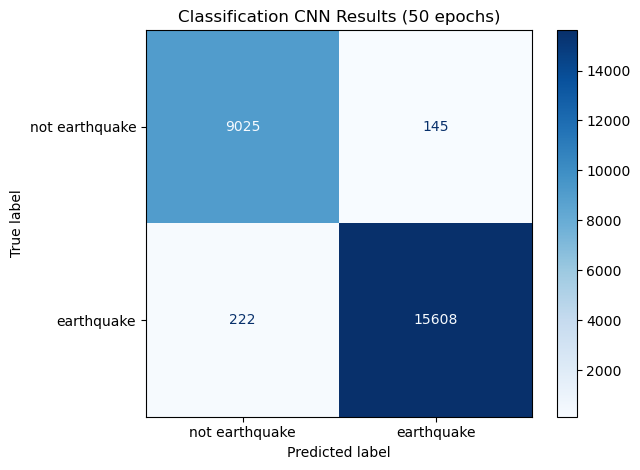

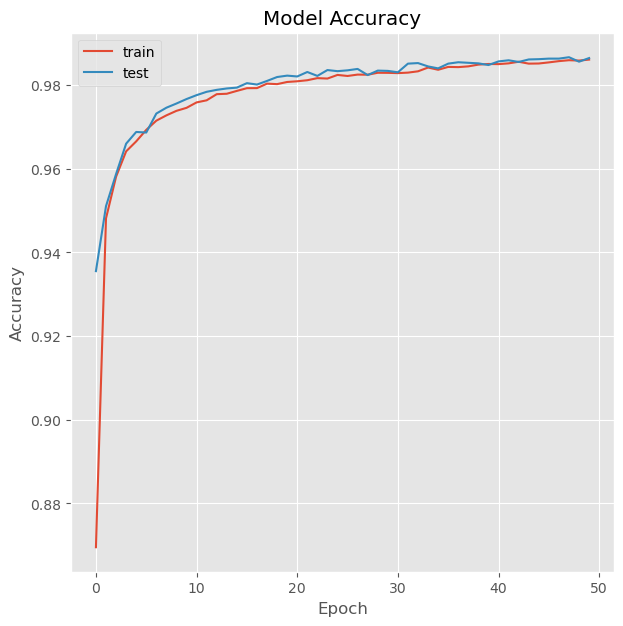

In [90]:
# Using the class for a classification CNN
model_cnn_c1 = SeismicCNN('classification','trace_category',100000,full_csv,dir) # initialize the class
model_cnn_c1.train_test_split(test_size=0.25,random_state=44) # train_test_split
model_cnn_c1.classification_cnn(50) # use the regression cnn method with 15 epochs with a target variable
model_cnn_c1.evaluate_classification_model() # evaluate the model

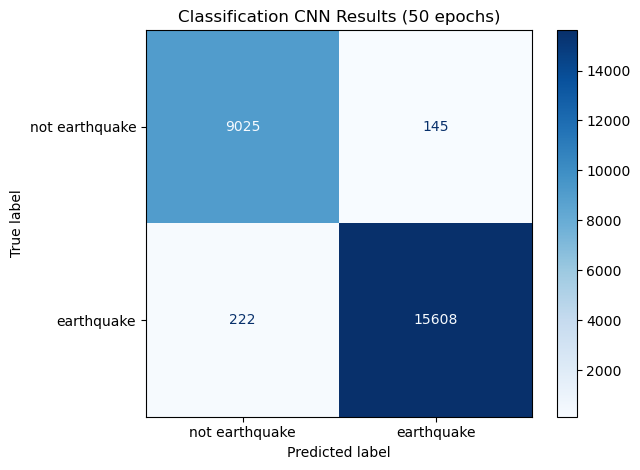

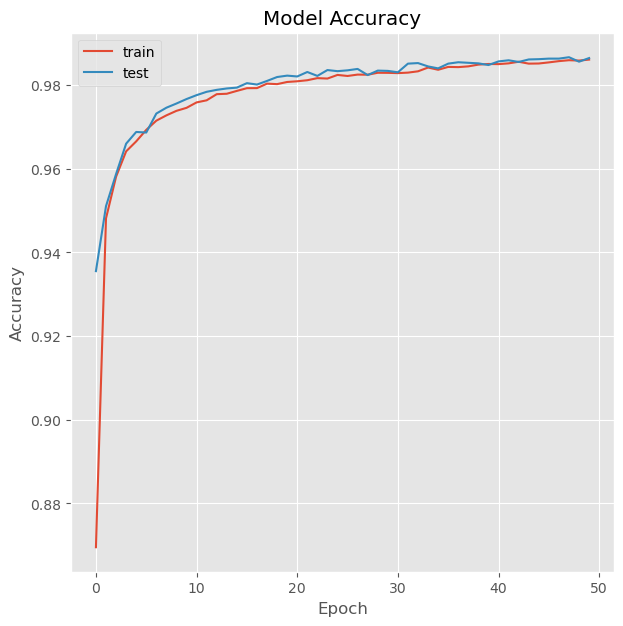

The accuracy of the baseline model for earthquake vs. noise prediction is is 0.53704, the precision is 0.6359130766298132, and the recall is 0.6322173089071383

 The accuracy of the classification model for earthquake vs. noise prediction is 0.98532, the precision is 0.9907954040500222, and the recall is 0.9859759949463045


In [98]:
# plot confusion matrix
plt.style.use('default')
disp = ConfusionMatrixDisplay(confusion_matrix=model_cnn_c1.cm, display_labels=['not earthquake','earthquake'])
disp.plot(cmap='Blues', values_format='')
plt.title(f'Classification CNN Results ({model_cnn_c1.epochs} epochs)')
plt.tight_layout()
plt.savefig('confusion_matrix.png')
plt.show()

# plot accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_cnn_c1.history.history['accuracy'])
ax.plot(model_cnn_c1.history.history['val_accuracy'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Accuracy')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_accuracy.png')
plt.show()

# baseline classifier for this model

from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy="stratified")
dummy_clf.fit(model_cnn_c1.train_images, model_cnn_c1.train_labels)
predictions = dummy_clf.predict(model_cnn_c1.test_images)
acc = dummy_clf.score(model_cnn_c1.test_images, model_cnn_c1.test_labels)
prec = precision_score(model_cnn_c1.test_labels,predictions)
rec = recall_score(model_cnn_c1.test_labels,predictions)
print(f'The accuracy of the baseline model for earthquake vs. noise prediction is is {acc}, the precision is {prec}, and the recall is {rec}')

# accuracy, precision, recall
tn, fp, fn, tp = model_cnn_c1.cm.ravel()
accuracy = (tn + tp)/(tn+fp+fn+tp)
precision = tp/(tp+fp)
recall = tp/(tp+fn)

print(f'\n The accuracy of the classification model for earthquake vs. noise prediction is {accuracy}, the precision is {precision}, and the recall is {recall}')


The number of all traces in the directory including noise is 630623
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working on trace 

Working on trace # 487
Working on trace # 488
Working on trace # 489
Working on trace # 490
Working on trace # 491
Working on trace # 492
Working on trace # 493
Working on trace # 494
Working on trace # 495
Working on trace # 496
Working on trace # 497
Working on trace # 498
Working on trace # 499
Working on trace # 500
Working on trace # 501
Working on trace # 502
Working on trace # 503
Working on trace # 504
Working on trace # 505
Working on trace # 506
Working on trace # 507
Working on trace # 508
Working on trace # 509
Working on trace # 510
Working on trace # 511
Working on trace # 512
Working on trace # 513
Working on trace # 514
Working on trace # 515
Working on trace # 516
Working on trace # 517
Working on trace # 518
Working on trace # 519
Working on trace # 520
Working on trace # 521
Working on trace # 522
Working on trace # 523
Working on trace # 524
Working on trace # 525
Working on trace # 526
Working on trace # 527
Working on trace # 528
Working on trace # 529
Working on 

Working on trace # 882
Working on trace # 883
Working on trace # 884
Working on trace # 885
Working on trace # 886
Working on trace # 887
Working on trace # 888
Working on trace # 889
Working on trace # 890
Working on trace # 891
Working on trace # 892
Working on trace # 893
Working on trace # 894
Working on trace # 895
Working on trace # 896
Working on trace # 897
Working on trace # 898
Working on trace # 899
Working on trace # 900
Working on trace # 901
Working on trace # 902
Working on trace # 903
Working on trace # 904
Working on trace # 905
Working on trace # 906
Working on trace # 907
Working on trace # 908
Working on trace # 909
Working on trace # 910
Working on trace # 911
Working on trace # 912
Working on trace # 913
Working on trace # 914
Working on trace # 915
Working on trace # 916
Working on trace # 917
Working on trace # 918
Working on trace # 919
Working on trace # 920
Working on trace # 921
Working on trace # 922
Working on trace # 923
Working on trace # 924
Working on 

Working on trace # 1257
Working on trace # 1258
Working on trace # 1259
Working on trace # 1260
Working on trace # 1261
Working on trace # 1262
Working on trace # 1263
Working on trace # 1264
Working on trace # 1265
Working on trace # 1266
Working on trace # 1267
Working on trace # 1268
Working on trace # 1269
Working on trace # 1270
Working on trace # 1271
Working on trace # 1272
Working on trace # 1273
Working on trace # 1274
Working on trace # 1275
Working on trace # 1276
Working on trace # 1277
Working on trace # 1278
Working on trace # 1279
Working on trace # 1280
Working on trace # 1281
Working on trace # 1282
Working on trace # 1283
Working on trace # 1284
Working on trace # 1285
Working on trace # 1286
Working on trace # 1287
Working on trace # 1288
Working on trace # 1289
Working on trace # 1290
Working on trace # 1291
Working on trace # 1292
Working on trace # 1293
Working on trace # 1294
Working on trace # 1295
Working on trace # 1296
Working on trace # 1297
Working on trace

Working on trace # 1630
Working on trace # 1631
Working on trace # 1632
Working on trace # 1633
Working on trace # 1634
Working on trace # 1635
Working on trace # 1636
Working on trace # 1637
Working on trace # 1638
Working on trace # 1639
Working on trace # 1640
Working on trace # 1641
Working on trace # 1642
Working on trace # 1643
Working on trace # 1644
Working on trace # 1645
Working on trace # 1646
Working on trace # 1647
Working on trace # 1648
Working on trace # 1649
Working on trace # 1650
Working on trace # 1651
Working on trace # 1652
Working on trace # 1653
Working on trace # 1654
Working on trace # 1655
Working on trace # 1656
Working on trace # 1657
Working on trace # 1658
Working on trace # 1659
Working on trace # 1660
Working on trace # 1661
Working on trace # 1662
Working on trace # 1663
Working on trace # 1664
Working on trace # 1665
Working on trace # 1666
Working on trace # 1667
Working on trace # 1668
Working on trace # 1669
Working on trace # 1670
Working on trace

Working on trace # 2018
Working on trace # 2019
Working on trace # 2020
Working on trace # 2021
Working on trace # 2022
Working on trace # 2023
Working on trace # 2024
Working on trace # 2025
Working on trace # 2026
Working on trace # 2027
Working on trace # 2028
Working on trace # 2029
Working on trace # 2030
Working on trace # 2031
Working on trace # 2032
Working on trace # 2033
Working on trace # 2034
Working on trace # 2035
Working on trace # 2036
Working on trace # 2037
Working on trace # 2038
Working on trace # 2039
Working on trace # 2040
Working on trace # 2041
Working on trace # 2042
Working on trace # 2043
Working on trace # 2044
Working on trace # 2045
Working on trace # 2046
Working on trace # 2047
Working on trace # 2048
Working on trace # 2049
Working on trace # 2050
Working on trace # 2051
Working on trace # 2052
Working on trace # 2053
Working on trace # 2054
Working on trace # 2055
Working on trace # 2056
Working on trace # 2057
Working on trace # 2058
Working on trace

Working on trace # 2381
Working on trace # 2382
Working on trace # 2383
Working on trace # 2384
Working on trace # 2385
Working on trace # 2386
Working on trace # 2387
Working on trace # 2388
Working on trace # 2389
Working on trace # 2390
Working on trace # 2391
Working on trace # 2392
Working on trace # 2393
Working on trace # 2394
Working on trace # 2395
Working on trace # 2396
Working on trace # 2397
Working on trace # 2398
Working on trace # 2399
Working on trace # 2400
Working on trace # 2401
Working on trace # 2402
Working on trace # 2403
Working on trace # 2404
Working on trace # 2405
Working on trace # 2406
Working on trace # 2407
Working on trace # 2408
Working on trace # 2409
Working on trace # 2410
Working on trace # 2411
Working on trace # 2412
Working on trace # 2413
Working on trace # 2414
Working on trace # 2415
Working on trace # 2416
Working on trace # 2417
Working on trace # 2418
Working on trace # 2419
Working on trace # 2420
Working on trace # 2421
Working on trace

Working on trace # 2747
Working on trace # 2748
Working on trace # 2749
Working on trace # 2750
Working on trace # 2751
Working on trace # 2752
Working on trace # 2753
Working on trace # 2754
Working on trace # 2755
Working on trace # 2756
Working on trace # 2757
Working on trace # 2758
Working on trace # 2759
Working on trace # 2760
Working on trace # 2761
Working on trace # 2762
Working on trace # 2763
Working on trace # 2764
Working on trace # 2765
Working on trace # 2766
Working on trace # 2767
Working on trace # 2768
Working on trace # 2769
Working on trace # 2770
Working on trace # 2771
Working on trace # 2772
Working on trace # 2773
Working on trace # 2774
Working on trace # 2775
Working on trace # 2776
Working on trace # 2777
Working on trace # 2778
Working on trace # 2779
Working on trace # 2780
Working on trace # 2781
Working on trace # 2782
Working on trace # 2783
Working on trace # 2784
Working on trace # 2785
Working on trace # 2786
Working on trace # 2787
Working on trace

Working on trace # 3125
Working on trace # 3126
Working on trace # 3127
Working on trace # 3128
Working on trace # 3129
Working on trace # 3130
Working on trace # 3131
Working on trace # 3132
Working on trace # 3133
Working on trace # 3134
Working on trace # 3135
Working on trace # 3136
Working on trace # 3137
Working on trace # 3138
Working on trace # 3139
Working on trace # 3140
Working on trace # 3141
Working on trace # 3142
Working on trace # 3143
Working on trace # 3144
Working on trace # 3145
Working on trace # 3146
Working on trace # 3147
Working on trace # 3148
Working on trace # 3149
Working on trace # 3150
Working on trace # 3151
Working on trace # 3152
Working on trace # 3153
Working on trace # 3154
Working on trace # 3155
Working on trace # 3156
Working on trace # 3157
Working on trace # 3158
Working on trace # 3159
Working on trace # 3160
Working on trace # 3161
Working on trace # 3162
Working on trace # 3163
Working on trace # 3164
Working on trace # 3165
Working on trace

Working on trace # 3542
Working on trace # 3543
Working on trace # 3544
Working on trace # 3545
Working on trace # 3546
Working on trace # 3547
Working on trace # 3548
Working on trace # 3549
Working on trace # 3550
Working on trace # 3551
Working on trace # 3552
Working on trace # 3553
Working on trace # 3554
Working on trace # 3555
Working on trace # 3556
Working on trace # 3557
Working on trace # 3558
Working on trace # 3559
Working on trace # 3560
Working on trace # 3561
Working on trace # 3562
Working on trace # 3563
Working on trace # 3564
Working on trace # 3565
Working on trace # 3566
Working on trace # 3567
Working on trace # 3568
Working on trace # 3569
Working on trace # 3570
Working on trace # 3571
Working on trace # 3572
Working on trace # 3573
Working on trace # 3574
Working on trace # 3575
Working on trace # 3576
Working on trace # 3577
Working on trace # 3578
Working on trace # 3579
Working on trace # 3580
Working on trace # 3581
Working on trace # 3582
Working on trace

Working on trace # 3927
Working on trace # 3928
Working on trace # 3929
Working on trace # 3930
Working on trace # 3931
Working on trace # 3932
Working on trace # 3933
Working on trace # 3934
Working on trace # 3935
Working on trace # 3936
Working on trace # 3937
Working on trace # 3938
Working on trace # 3939
Working on trace # 3940
Working on trace # 3941
Working on trace # 3942
Working on trace # 3943
Working on trace # 3944
Working on trace # 3945
Working on trace # 3946
Working on trace # 3947
Working on trace # 3948
Working on trace # 3949
Working on trace # 3950
Working on trace # 3951
Working on trace # 3952
Working on trace # 3953
Working on trace # 3954
Working on trace # 3955
Working on trace # 3956
Working on trace # 3957
Working on trace # 3958
Working on trace # 3959
Working on trace # 3960
Working on trace # 3961
Working on trace # 3962
Working on trace # 3963
Working on trace # 3964
Working on trace # 3965
Working on trace # 3966
Working on trace # 3967
Working on trace

Working on trace # 4320
Working on trace # 4321
Working on trace # 4322
Working on trace # 4323
Working on trace # 4324
Working on trace # 4325
Working on trace # 4326
Working on trace # 4327
Working on trace # 4328
Working on trace # 4329
Working on trace # 4330
Working on trace # 4331
Working on trace # 4332
Working on trace # 4333
Working on trace # 4334
Working on trace # 4335
Working on trace # 4336
Working on trace # 4337
Working on trace # 4338
Working on trace # 4339
Working on trace # 4340
Working on trace # 4341
Working on trace # 4342
Working on trace # 4343
Working on trace # 4344
Working on trace # 4345
Working on trace # 4346
Working on trace # 4347
Working on trace # 4348
Working on trace # 4349
Working on trace # 4350
Working on trace # 4351
Working on trace # 4352
Working on trace # 4353
Working on trace # 4354
Working on trace # 4355
Working on trace # 4356
Working on trace # 4357
Working on trace # 4358
Working on trace # 4359
Working on trace # 4360
Working on trace

Working on trace # 4678
Working on trace # 4679
Working on trace # 4680
Working on trace # 4681
Working on trace # 4682
Working on trace # 4683
Working on trace # 4684
Working on trace # 4685
Working on trace # 4686
Working on trace # 4687
Working on trace # 4688
Working on trace # 4689
Working on trace # 4690
Working on trace # 4691
Working on trace # 4692
Working on trace # 4693
Working on trace # 4694
Working on trace # 4695
Working on trace # 4696
Working on trace # 4697
Working on trace # 4698
Working on trace # 4699
Working on trace # 4700
Working on trace # 4701
Working on trace # 4702
Working on trace # 4703
Working on trace # 4704
Working on trace # 4705
Working on trace # 4706
Working on trace # 4707
Working on trace # 4708
Working on trace # 4709
Working on trace # 4710
Working on trace # 4711
Working on trace # 4712
Working on trace # 4713
Working on trace # 4714
Working on trace # 4715
Working on trace # 4716
Working on trace # 4717
Working on trace # 4718
Working on trace

Working on trace # 5061
Working on trace # 5062
Working on trace # 5063
Working on trace # 5064
Working on trace # 5065
Working on trace # 5066
Working on trace # 5067
Working on trace # 5068
Working on trace # 5069
Working on trace # 5070
Working on trace # 5071
Working on trace # 5072
Working on trace # 5073
Working on trace # 5074
Working on trace # 5075
Working on trace # 5076
Working on trace # 5077
Working on trace # 5078
Working on trace # 5079
Working on trace # 5080
Working on trace # 5081
Working on trace # 5082
Working on trace # 5083
Working on trace # 5084
Working on trace # 5085
Working on trace # 5086
Working on trace # 5087
Working on trace # 5088
Working on trace # 5089
Working on trace # 5090
Working on trace # 5091
Working on trace # 5092
Working on trace # 5093
Working on trace # 5094
Working on trace # 5095
Working on trace # 5096
Working on trace # 5097
Working on trace # 5098
Working on trace # 5099
Working on trace # 5100
Working on trace # 5101
Working on trace

Working on trace # 5460
Working on trace # 5461
Working on trace # 5462
Working on trace # 5463
Working on trace # 5464
Working on trace # 5465
Working on trace # 5466
Working on trace # 5467
Working on trace # 5468
Working on trace # 5469
Working on trace # 5470
Working on trace # 5471
Working on trace # 5472
Working on trace # 5473
Working on trace # 5474
Working on trace # 5475
Working on trace # 5476
Working on trace # 5477
Working on trace # 5478
Working on trace # 5479
Working on trace # 5480
Working on trace # 5481
Working on trace # 5482
Working on trace # 5483
Working on trace # 5484
Working on trace # 5485
Working on trace # 5486
Working on trace # 5487
Working on trace # 5488
Working on trace # 5489
Working on trace # 5490
Working on trace # 5491
Working on trace # 5492
Working on trace # 5493
Working on trace # 5494
Working on trace # 5495
Working on trace # 5496
Working on trace # 5497
Working on trace # 5498
Working on trace # 5499
Working on trace # 5500
Working on trace

Working on trace # 5838
Working on trace # 5839
Working on trace # 5840
Working on trace # 5841
Working on trace # 5842
Working on trace # 5843
Working on trace # 5844
Working on trace # 5845
Working on trace # 5846
Working on trace # 5847
Working on trace # 5848
Working on trace # 5849
Working on trace # 5850
Working on trace # 5851
Working on trace # 5852
Working on trace # 5853
Working on trace # 5854
Working on trace # 5855
Working on trace # 5856
Working on trace # 5857
Working on trace # 5858
Working on trace # 5859
Working on trace # 5860
Working on trace # 5861
Working on trace # 5862
Working on trace # 5863
Working on trace # 5864
Working on trace # 5865
Working on trace # 5866
Working on trace # 5867
Working on trace # 5868
Working on trace # 5869
Working on trace # 5870
Working on trace # 5871
Working on trace # 5872
Working on trace # 5873
Working on trace # 5874
Working on trace # 5875
Working on trace # 5876
Working on trace # 5877
Working on trace # 5878
Working on trace

Working on trace # 6221
Working on trace # 6222
Working on trace # 6223
Working on trace # 6224
Working on trace # 6225
Working on trace # 6226
Working on trace # 6227
Working on trace # 6228
Working on trace # 6229
Working on trace # 6230
Working on trace # 6231
Working on trace # 6232
Working on trace # 6233
Working on trace # 6234
Working on trace # 6235
Working on trace # 6236
Working on trace # 6237
Working on trace # 6238
Working on trace # 6239
Working on trace # 6240
Working on trace # 6241
Working on trace # 6242
Working on trace # 6243
Working on trace # 6244
Working on trace # 6245
Working on trace # 6246
Working on trace # 6247
Working on trace # 6248
Working on trace # 6249
Working on trace # 6250
Working on trace # 6251
Working on trace # 6252
Working on trace # 6253
Working on trace # 6254
Working on trace # 6255
Working on trace # 6256
Working on trace # 6257
Working on trace # 6258
Working on trace # 6259
Working on trace # 6260
Working on trace # 6261
Working on trace

Working on trace # 6612
Working on trace # 6613
Working on trace # 6614
Working on trace # 6615
Working on trace # 6616
Working on trace # 6617
Working on trace # 6618
Working on trace # 6619
Working on trace # 6620
Working on trace # 6621
Working on trace # 6622
Working on trace # 6623
Working on trace # 6624
Working on trace # 6625
Working on trace # 6626
Working on trace # 6627
Working on trace # 6628
Working on trace # 6629
Working on trace # 6630
Working on trace # 6631
Working on trace # 6632
Working on trace # 6633
Working on trace # 6634
Working on trace # 6635
Working on trace # 6636
Working on trace # 6637
Working on trace # 6638
Working on trace # 6639
Working on trace # 6640
Working on trace # 6641
Working on trace # 6642
Working on trace # 6643
Working on trace # 6644
Working on trace # 6645
Working on trace # 6646
Working on trace # 6647
Working on trace # 6648
Working on trace # 6649
Working on trace # 6650
Working on trace # 6651
Working on trace # 6652
Working on trace

Working on trace # 7004
Working on trace # 7005
Working on trace # 7006
Working on trace # 7007
Working on trace # 7008
Working on trace # 7009
Working on trace # 7010
Working on trace # 7011
Working on trace # 7012
Working on trace # 7013
Working on trace # 7014
Working on trace # 7015
Working on trace # 7016
Working on trace # 7017
Working on trace # 7018
Working on trace # 7019
Working on trace # 7020
Working on trace # 7021
Working on trace # 7022
Working on trace # 7023
Working on trace # 7024
Working on trace # 7025
Working on trace # 7026
Working on trace # 7027
Working on trace # 7028
Working on trace # 7029
Working on trace # 7030
Working on trace # 7031
Working on trace # 7032
Working on trace # 7033
Working on trace # 7034
Working on trace # 7035
Working on trace # 7036
Working on trace # 7037
Working on trace # 7038
Working on trace # 7039
Working on trace # 7040
Working on trace # 7041
Working on trace # 7042
Working on trace # 7043
Working on trace # 7044
Working on trace

Working on trace # 7403
Working on trace # 7404
Working on trace # 7405
Working on trace # 7406
Working on trace # 7407
Working on trace # 7408
Working on trace # 7409
Working on trace # 7410
Working on trace # 7411
Working on trace # 7412
Working on trace # 7413
Working on trace # 7414
Working on trace # 7415
Working on trace # 7416
Working on trace # 7417
Working on trace # 7418
Working on trace # 7419
Working on trace # 7420
Working on trace # 7421
Working on trace # 7422
Working on trace # 7423
Working on trace # 7424
Working on trace # 7425
Working on trace # 7426
Working on trace # 7427
Working on trace # 7428
Working on trace # 7429
Working on trace # 7430
Working on trace # 7431
Working on trace # 7432
Working on trace # 7433
Working on trace # 7434
Working on trace # 7435
Working on trace # 7436
Working on trace # 7437
Working on trace # 7438
Working on trace # 7439
Working on trace # 7440
Working on trace # 7441
Working on trace # 7442
Working on trace # 7443
Working on trace

Working on trace # 7807
Working on trace # 7808
Working on trace # 7809
Working on trace # 7810
Working on trace # 7811
Working on trace # 7812
Working on trace # 7813
Working on trace # 7814
Working on trace # 7815
Working on trace # 7816
Working on trace # 7817
Working on trace # 7818
Working on trace # 7819
Working on trace # 7820
Working on trace # 7821
Working on trace # 7822
Working on trace # 7823
Working on trace # 7824
Working on trace # 7825
Working on trace # 7826
Working on trace # 7827
Working on trace # 7828
Working on trace # 7829
Working on trace # 7830
Working on trace # 7831
Working on trace # 7832
Working on trace # 7833
Working on trace # 7834
Working on trace # 7835
Working on trace # 7836
Working on trace # 7837
Working on trace # 7838
Working on trace # 7839
Working on trace # 7840
Working on trace # 7841
Working on trace # 7842
Working on trace # 7843
Working on trace # 7844
Working on trace # 7845
Working on trace # 7846
Working on trace # 7847
Working on trace

Working on trace # 8192
Working on trace # 8193
Working on trace # 8194
Working on trace # 8195
Working on trace # 8196
Working on trace # 8197
Working on trace # 8198
Working on trace # 8199
Working on trace # 8200
Working on trace # 8201
Working on trace # 8202
Working on trace # 8203
Working on trace # 8204
Working on trace # 8205
Working on trace # 8206
Working on trace # 8207
Working on trace # 8208
Working on trace # 8209
Working on trace # 8210
Working on trace # 8211
Working on trace # 8212
Working on trace # 8213
Working on trace # 8214
Working on trace # 8215
Working on trace # 8216
Working on trace # 8217
Working on trace # 8218
Working on trace # 8219
Working on trace # 8220
Working on trace # 8221
Working on trace # 8222
Working on trace # 8223
Working on trace # 8224
Working on trace # 8225
Working on trace # 8226
Working on trace # 8227
Working on trace # 8228
Working on trace # 8229
Working on trace # 8230
Working on trace # 8231
Working on trace # 8232
Working on trace

Working on trace # 8573
Working on trace # 8574
Working on trace # 8575
Working on trace # 8576
Working on trace # 8577
Working on trace # 8578
Working on trace # 8579
Working on trace # 8580
Working on trace # 8581
Working on trace # 8582
Working on trace # 8583
Working on trace # 8584
Working on trace # 8585
Working on trace # 8586
Working on trace # 8587
Working on trace # 8588
Working on trace # 8589
Working on trace # 8590
Working on trace # 8591
Working on trace # 8592
Working on trace # 8593
Working on trace # 8594
Working on trace # 8595
Working on trace # 8596
Working on trace # 8597
Working on trace # 8598
Working on trace # 8599
Working on trace # 8600
Working on trace # 8601
Working on trace # 8602
Working on trace # 8603
Working on trace # 8604
Working on trace # 8605
Working on trace # 8606
Working on trace # 8607
Working on trace # 8608
Working on trace # 8609
Working on trace # 8610
Working on trace # 8611
Working on trace # 8612
Working on trace # 8613
Working on trace

Working on trace # 8953
Working on trace # 8954
Working on trace # 8955
Working on trace # 8956
Working on trace # 8957
Working on trace # 8958
Working on trace # 8959
Working on trace # 8960
Working on trace # 8961
Working on trace # 8962
Working on trace # 8963
Working on trace # 8964
Working on trace # 8965
Working on trace # 8966
Working on trace # 8967
Working on trace # 8968
Working on trace # 8969
Working on trace # 8970
Working on trace # 8971
Working on trace # 8972
Working on trace # 8973
Working on trace # 8974
Working on trace # 8975
Working on trace # 8976
Working on trace # 8977
Working on trace # 8978
Working on trace # 8979
Working on trace # 8980
Working on trace # 8981
Working on trace # 8982
Working on trace # 8983
Working on trace # 8984
Working on trace # 8985
Working on trace # 8986
Working on trace # 8987
Working on trace # 8988
Working on trace # 8989
Working on trace # 8990
Working on trace # 8991
Working on trace # 8992
Working on trace # 8993
Working on trace

Working on trace # 9363
Working on trace # 9364
Working on trace # 9365
Working on trace # 9366
Working on trace # 9367
Working on trace # 9368
Working on trace # 9369
Working on trace # 9370
Working on trace # 9371
Working on trace # 9372
Working on trace # 9373
Working on trace # 9374
Working on trace # 9375
Working on trace # 9376
Working on trace # 9377
Working on trace # 9378
Working on trace # 9379
Working on trace # 9380
Working on trace # 9381
Working on trace # 9382
Working on trace # 9383
Working on trace # 9384
Working on trace # 9385
Working on trace # 9386
Working on trace # 9387
Working on trace # 9388
Working on trace # 9389
Working on trace # 9390
Working on trace # 9391
Working on trace # 9392
Working on trace # 9393
Working on trace # 9394
Working on trace # 9395
Working on trace # 9396
Working on trace # 9397
Working on trace # 9398
Working on trace # 9399
Working on trace # 9400
Working on trace # 9401
Working on trace # 9402
Working on trace # 9403
Working on trace

Working on trace # 9763
Working on trace # 9764
Working on trace # 9765
Working on trace # 9766
Working on trace # 9767
Working on trace # 9768
Working on trace # 9769
Working on trace # 9770
Working on trace # 9771
Working on trace # 9772
Working on trace # 9773
Working on trace # 9774
Working on trace # 9775
Working on trace # 9776
Working on trace # 9777
Working on trace # 9778
Working on trace # 9779
Working on trace # 9780
Working on trace # 9781
Working on trace # 9782
Working on trace # 9783
Working on trace # 9784
Working on trace # 9785
Working on trace # 9786
Working on trace # 9787
Working on trace # 9788
Working on trace # 9789
Working on trace # 9790
Working on trace # 9791
Working on trace # 9792
Working on trace # 9793
Working on trace # 9794
Working on trace # 9795
Working on trace # 9796
Working on trace # 9797
Working on trace # 9798
Working on trace # 9799
Working on trace # 9800
Working on trace # 9801
Working on trace # 9802
Working on trace # 9803
Working on trace

Working on trace # 10183
Working on trace # 10184
Working on trace # 10185
Working on trace # 10186
Working on trace # 10187
Working on trace # 10188
Working on trace # 10189
Working on trace # 10190
Working on trace # 10191
Working on trace # 10192
Working on trace # 10193
Working on trace # 10194
Working on trace # 10195
Working on trace # 10196
Working on trace # 10197
Working on trace # 10198
Working on trace # 10199
Working on trace # 10200
Working on trace # 10201
Working on trace # 10202
Working on trace # 10203
Working on trace # 10204
Working on trace # 10205
Working on trace # 10206
Working on trace # 10207
Working on trace # 10208
Working on trace # 10209
Working on trace # 10210
Working on trace # 10211
Working on trace # 10212
Working on trace # 10213
Working on trace # 10214
Working on trace # 10215
Working on trace # 10216
Working on trace # 10217
Working on trace # 10218
Working on trace # 10219
Working on trace # 10220
Working on trace # 10221
Working on trace # 10222


Working on trace # 10602
Working on trace # 10603
Working on trace # 10604
Working on trace # 10605
Working on trace # 10606
Working on trace # 10607
Working on trace # 10608
Working on trace # 10609
Working on trace # 10610
Working on trace # 10611
Working on trace # 10612
Working on trace # 10613
Working on trace # 10614
Working on trace # 10615
Working on trace # 10616
Working on trace # 10617
Working on trace # 10618
Working on trace # 10619
Working on trace # 10620
Working on trace # 10621
Working on trace # 10622
Working on trace # 10623
Working on trace # 10624
Working on trace # 10625
Working on trace # 10626
Working on trace # 10627
Working on trace # 10628
Working on trace # 10629
Working on trace # 10630
Working on trace # 10631
Working on trace # 10632
Working on trace # 10633
Working on trace # 10634
Working on trace # 10635
Working on trace # 10636
Working on trace # 10637
Working on trace # 10638
Working on trace # 10639
Working on trace # 10640
Working on trace # 10641


Working on trace # 11025
Working on trace # 11026
Working on trace # 11027
Working on trace # 11028
Working on trace # 11029
Working on trace # 11030
Working on trace # 11031
Working on trace # 11032
Working on trace # 11033
Working on trace # 11034
Working on trace # 11035
Working on trace # 11036
Working on trace # 11037
Working on trace # 11038
Working on trace # 11039
Working on trace # 11040
Working on trace # 11041
Working on trace # 11042
Working on trace # 11043
Working on trace # 11044
Working on trace # 11045
Working on trace # 11046
Working on trace # 11047
Working on trace # 11048
Working on trace # 11049
Working on trace # 11050
Working on trace # 11051
Working on trace # 11052
Working on trace # 11053
Working on trace # 11054
Working on trace # 11055
Working on trace # 11056
Working on trace # 11057
Working on trace # 11058
Working on trace # 11059
Working on trace # 11060
Working on trace # 11061
Working on trace # 11062
Working on trace # 11063
Working on trace # 11064


Working on trace # 11447
Working on trace # 11448
Working on trace # 11449
Working on trace # 11450
Working on trace # 11451
Working on trace # 11452
Working on trace # 11453
Working on trace # 11454
Working on trace # 11455
Working on trace # 11456
Working on trace # 11457
Working on trace # 11458
Working on trace # 11459
Working on trace # 11460
Working on trace # 11461
Working on trace # 11462
Working on trace # 11463
Working on trace # 11464
Working on trace # 11465
Working on trace # 11466
Working on trace # 11467
Working on trace # 11468
Working on trace # 11469
Working on trace # 11470
Working on trace # 11471
Working on trace # 11472
Working on trace # 11473
Working on trace # 11474
Working on trace # 11475
Working on trace # 11476
Working on trace # 11477
Working on trace # 11478
Working on trace # 11479
Working on trace # 11480
Working on trace # 11481
Working on trace # 11482
Working on trace # 11483
Working on trace # 11484
Working on trace # 11485
Working on trace # 11486


Working on trace # 11892
Working on trace # 11893
Working on trace # 11894
Working on trace # 11895
Working on trace # 11896
Working on trace # 11897
Working on trace # 11898
Working on trace # 11899
Working on trace # 11900
Working on trace # 11901
Working on trace # 11902
Working on trace # 11903
Working on trace # 11904
Working on trace # 11905
Working on trace # 11906
Working on trace # 11907
Working on trace # 11908
Working on trace # 11909
Working on trace # 11910
Working on trace # 11911
Working on trace # 11912
Working on trace # 11913
Working on trace # 11914
Working on trace # 11915
Working on trace # 11916
Working on trace # 11917
Working on trace # 11918
Working on trace # 11919
Working on trace # 11920
Working on trace # 11921
Working on trace # 11922
Working on trace # 11923
Working on trace # 11924
Working on trace # 11925
Working on trace # 11926
Working on trace # 11927
Working on trace # 11928
Working on trace # 11929
Working on trace # 11930
Working on trace # 11931


Working on trace # 12343
Working on trace # 12344
Working on trace # 12345
Working on trace # 12346
Working on trace # 12347
Working on trace # 12348
Working on trace # 12349
Working on trace # 12350
Working on trace # 12351
Working on trace # 12352
Working on trace # 12353
Working on trace # 12354
Working on trace # 12355
Working on trace # 12356
Working on trace # 12357
Working on trace # 12358
Working on trace # 12359
Working on trace # 12360
Working on trace # 12361
Working on trace # 12362
Working on trace # 12363
Working on trace # 12364
Working on trace # 12365
Working on trace # 12366
Working on trace # 12367
Working on trace # 12368
Working on trace # 12369
Working on trace # 12370
Working on trace # 12371
Working on trace # 12372
Working on trace # 12373
Working on trace # 12374
Working on trace # 12375
Working on trace # 12376
Working on trace # 12377
Working on trace # 12378
Working on trace # 12379
Working on trace # 12380
Working on trace # 12381
Working on trace # 12382


Working on trace # 12792
Working on trace # 12793
Working on trace # 12794
Working on trace # 12795
Working on trace # 12796
Working on trace # 12797
Working on trace # 12798
Working on trace # 12799
Working on trace # 12800
Working on trace # 12801
Working on trace # 12802
Working on trace # 12803
Working on trace # 12804
Working on trace # 12805
Working on trace # 12806
Working on trace # 12807
Working on trace # 12808
Working on trace # 12809
Working on trace # 12810
Working on trace # 12811
Working on trace # 12812
Working on trace # 12813
Working on trace # 12814
Working on trace # 12815
Working on trace # 12816
Working on trace # 12817
Working on trace # 12818
Working on trace # 12819
Working on trace # 12820
Working on trace # 12821
Working on trace # 12822
Working on trace # 12823
Working on trace # 12824
Working on trace # 12825
Working on trace # 12826
Working on trace # 12827
Working on trace # 12828
Working on trace # 12829
Working on trace # 12830
Working on trace # 12831


Working on trace # 13248
Working on trace # 13249
Working on trace # 13250
Working on trace # 13251
Working on trace # 13252
Working on trace # 13253
Working on trace # 13254
Working on trace # 13255
Working on trace # 13256
Working on trace # 13257
Working on trace # 13258
Working on trace # 13259
Working on trace # 13260
Working on trace # 13261
Working on trace # 13262
Working on trace # 13263
Working on trace # 13264
Working on trace # 13265
Working on trace # 13266
Working on trace # 13267
Working on trace # 13268
Working on trace # 13269
Working on trace # 13270
Working on trace # 13271
Working on trace # 13272
Working on trace # 13273
Working on trace # 13274
Working on trace # 13275
Working on trace # 13276
Working on trace # 13277
Working on trace # 13278
Working on trace # 13279
Working on trace # 13280
Working on trace # 13281
Working on trace # 13282
Working on trace # 13283
Working on trace # 13284
Working on trace # 13285
Working on trace # 13286
Working on trace # 13287


Working on trace # 13702
Working on trace # 13703
Working on trace # 13704
Working on trace # 13705
Working on trace # 13706
Working on trace # 13707
Working on trace # 13708
Working on trace # 13709
Working on trace # 13710
Working on trace # 13711
Working on trace # 13712
Working on trace # 13713
Working on trace # 13714
Working on trace # 13715
Working on trace # 13716
Working on trace # 13717
Working on trace # 13718
Working on trace # 13719
Working on trace # 13720
Working on trace # 13721
Working on trace # 13722
Working on trace # 13723
Working on trace # 13724
Working on trace # 13725
Working on trace # 13726
Working on trace # 13727
Working on trace # 13728
Working on trace # 13729
Working on trace # 13730
Working on trace # 13731
Working on trace # 13732
Working on trace # 13733
Working on trace # 13734
Working on trace # 13735
Working on trace # 13736
Working on trace # 13737
Working on trace # 13738
Working on trace # 13739
Working on trace # 13740
Working on trace # 13741


Working on trace # 14147
Working on trace # 14148
Working on trace # 14149
Working on trace # 14150
Working on trace # 14151
Working on trace # 14152
Working on trace # 14153
Working on trace # 14154
Working on trace # 14155
Working on trace # 14156
Working on trace # 14157
Working on trace # 14158
Working on trace # 14159
Working on trace # 14160
Working on trace # 14161
Working on trace # 14162
Working on trace # 14163
Working on trace # 14164
Working on trace # 14165
Working on trace # 14166
Working on trace # 14167
Working on trace # 14168
Working on trace # 14169
Working on trace # 14170
Working on trace # 14171
Working on trace # 14172
Working on trace # 14173
Working on trace # 14174
Working on trace # 14175
Working on trace # 14176
Working on trace # 14177
Working on trace # 14178
Working on trace # 14179
Working on trace # 14180
Working on trace # 14181
Working on trace # 14182
Working on trace # 14183
Working on trace # 14184
Working on trace # 14185
Working on trace # 14186


Working on trace # 14583
Working on trace # 14584
Working on trace # 14585
Working on trace # 14586
Working on trace # 14587
Working on trace # 14588
Working on trace # 14589
Working on trace # 14590
Working on trace # 14591
Working on trace # 14592
Working on trace # 14593
Working on trace # 14594
Working on trace # 14595
Working on trace # 14596
Working on trace # 14597
Working on trace # 14598
Working on trace # 14599
Working on trace # 14600
Working on trace # 14601
Working on trace # 14602
Working on trace # 14603
Working on trace # 14604
Working on trace # 14605
Working on trace # 14606
Working on trace # 14607
Working on trace # 14608
Working on trace # 14609
Working on trace # 14610
Working on trace # 14611
Working on trace # 14612
Working on trace # 14613
Working on trace # 14614
Working on trace # 14615
Working on trace # 14616
Working on trace # 14617
Working on trace # 14618
Working on trace # 14619
Working on trace # 14620
Working on trace # 14621
Working on trace # 14622


Working on trace # 15000
Working on trace # 15001
Working on trace # 15002
Working on trace # 15003
Working on trace # 15004
Working on trace # 15005
Working on trace # 15006
Working on trace # 15007
Working on trace # 15008
Working on trace # 15009
Working on trace # 15010
Working on trace # 15011
Working on trace # 15012
Working on trace # 15013
Working on trace # 15014
Working on trace # 15015
Working on trace # 15016
Working on trace # 15017
Working on trace # 15018
Working on trace # 15019
Working on trace # 15020
Working on trace # 15021
Working on trace # 15022
Working on trace # 15023
Working on trace # 15024
Working on trace # 15025
Working on trace # 15026
Working on trace # 15027
Working on trace # 15028
Working on trace # 15029
Working on trace # 15030
Working on trace # 15031
Working on trace # 15032
Working on trace # 15033
Working on trace # 15034
Working on trace # 15035
Working on trace # 15036
Working on trace # 15037
Working on trace # 15038
Working on trace # 15039


Working on trace # 15442
Working on trace # 15443
Working on trace # 15444
Working on trace # 15445
Working on trace # 15446
Working on trace # 15447
Working on trace # 15448
Working on trace # 15449
Working on trace # 15450
Working on trace # 15451
Working on trace # 15452
Working on trace # 15453
Working on trace # 15454
Working on trace # 15455
Working on trace # 15456
Working on trace # 15457
Working on trace # 15458
Working on trace # 15459
Working on trace # 15460
Working on trace # 15461
Working on trace # 15462
Working on trace # 15463
Working on trace # 15464
Working on trace # 15465
Working on trace # 15466
Working on trace # 15467
Working on trace # 15468
Working on trace # 15469
Working on trace # 15470
Working on trace # 15471
Working on trace # 15472
Working on trace # 15473
Working on trace # 15474
Working on trace # 15475
Working on trace # 15476
Working on trace # 15477
Working on trace # 15478
Working on trace # 15479
Working on trace # 15480
Working on trace # 15481


Working on trace # 15854
Working on trace # 15855
Working on trace # 15856
Working on trace # 15857
Working on trace # 15858
Working on trace # 15859
Working on trace # 15860
Working on trace # 15861
Working on trace # 15862
Working on trace # 15863
Working on trace # 15864
Working on trace # 15865
Working on trace # 15866
Working on trace # 15867
Working on trace # 15868
Working on trace # 15869
Working on trace # 15870
Working on trace # 15871
Working on trace # 15872
Working on trace # 15873
Working on trace # 15874
Working on trace # 15875
Working on trace # 15876
Working on trace # 15877
Working on trace # 15878
Working on trace # 15879
Working on trace # 15880
Working on trace # 15881
Working on trace # 15882
Working on trace # 15883
Working on trace # 15884
Working on trace # 15885
Working on trace # 15886
Working on trace # 15887
Working on trace # 15888
Working on trace # 15889
Working on trace # 15890
Working on trace # 15891
Working on trace # 15892
Working on trace # 15893


Working on trace # 16284
Working on trace # 16285
Working on trace # 16286
Working on trace # 16287
Working on trace # 16288
Working on trace # 16289
Working on trace # 16290
Working on trace # 16291
Working on trace # 16292
Working on trace # 16293
Working on trace # 16294
Working on trace # 16295
Working on trace # 16296
Working on trace # 16297
Working on trace # 16298
Working on trace # 16299
Working on trace # 16300
Working on trace # 16301
Working on trace # 16302
Working on trace # 16303
Working on trace # 16304
Working on trace # 16305
Working on trace # 16306
Working on trace # 16307
Working on trace # 16308
Working on trace # 16309
Working on trace # 16310
Working on trace # 16311
Working on trace # 16312
Working on trace # 16313
Working on trace # 16314
Working on trace # 16315
Working on trace # 16316
Working on trace # 16317
Working on trace # 16318
Working on trace # 16319
Working on trace # 16320
Working on trace # 16321
Working on trace # 16322
Working on trace # 16323


Working on trace # 16728
Working on trace # 16729
Working on trace # 16730
Working on trace # 16731
Working on trace # 16732
Working on trace # 16733
Working on trace # 16734
Working on trace # 16735
Working on trace # 16736
Working on trace # 16737
Working on trace # 16738
Working on trace # 16739
Working on trace # 16740
Working on trace # 16741
Working on trace # 16742
Working on trace # 16743
Working on trace # 16744
Working on trace # 16745
Working on trace # 16746
Working on trace # 16747
Working on trace # 16748
Working on trace # 16749
Working on trace # 16750
Working on trace # 16751
Working on trace # 16752
Working on trace # 16753
Working on trace # 16754
Working on trace # 16755
Working on trace # 16756
Working on trace # 16757
Working on trace # 16758
Working on trace # 16759
Working on trace # 16760
Working on trace # 16761
Working on trace # 16762
Working on trace # 16763
Working on trace # 16764
Working on trace # 16765
Working on trace # 16766
Working on trace # 16767


Working on trace # 17161
Working on trace # 17162
Working on trace # 17163
Working on trace # 17164
Working on trace # 17165
Working on trace # 17166
Working on trace # 17167
Working on trace # 17168
Working on trace # 17169
Working on trace # 17170
Working on trace # 17171
Working on trace # 17172
Working on trace # 17173
Working on trace # 17174
Working on trace # 17175
Working on trace # 17176
Working on trace # 17177
Working on trace # 17178
Working on trace # 17179
Working on trace # 17180
Working on trace # 17181
Working on trace # 17182
Working on trace # 17183
Working on trace # 17184
Working on trace # 17185
Working on trace # 17186
Working on trace # 17187
Working on trace # 17188
Working on trace # 17189
Working on trace # 17190
Working on trace # 17191
Working on trace # 17192
Working on trace # 17193
Working on trace # 17194
Working on trace # 17195
Working on trace # 17196
Working on trace # 17197
Working on trace # 17198
Working on trace # 17199
Working on trace # 17200


Working on trace # 17612
Working on trace # 17613
Working on trace # 17614
Working on trace # 17615
Working on trace # 17616
Working on trace # 17617
Working on trace # 17618
Working on trace # 17619
Working on trace # 17620
Working on trace # 17621
Working on trace # 17622
Working on trace # 17623
Working on trace # 17624
Working on trace # 17625
Working on trace # 17626
Working on trace # 17627
Working on trace # 17628
Working on trace # 17629
Working on trace # 17630
Working on trace # 17631
Working on trace # 17632
Working on trace # 17633
Working on trace # 17634
Working on trace # 17635
Working on trace # 17636
Working on trace # 17637
Working on trace # 17638
Working on trace # 17639
Working on trace # 17640
Working on trace # 17641
Working on trace # 17642
Working on trace # 17643
Working on trace # 17644
Working on trace # 17645
Working on trace # 17646
Working on trace # 17647
Working on trace # 17648
Working on trace # 17649
Working on trace # 17650
Working on trace # 17651


Working on trace # 18054
Working on trace # 18055
Working on trace # 18056
Working on trace # 18057
Working on trace # 18058
Working on trace # 18059
Working on trace # 18060
Working on trace # 18061
Working on trace # 18062
Working on trace # 18063
Working on trace # 18064
Working on trace # 18065
Working on trace # 18066
Working on trace # 18067
Working on trace # 18068
Working on trace # 18069
Working on trace # 18070
Working on trace # 18071
Working on trace # 18072
Working on trace # 18073
Working on trace # 18074
Working on trace # 18075
Working on trace # 18076
Working on trace # 18077
Working on trace # 18078
Working on trace # 18079
Working on trace # 18080
Working on trace # 18081
Working on trace # 18082
Working on trace # 18083
Working on trace # 18084
Working on trace # 18085
Working on trace # 18086
Working on trace # 18087
Working on trace # 18088
Working on trace # 18089
Working on trace # 18090
Working on trace # 18091
Working on trace # 18092
Working on trace # 18093


Working on trace # 18476
Working on trace # 18477
Working on trace # 18478
Working on trace # 18479
Working on trace # 18480
Working on trace # 18481
Working on trace # 18482
Working on trace # 18483
Working on trace # 18484
Working on trace # 18485
Working on trace # 18486
Working on trace # 18487
Working on trace # 18488
Working on trace # 18489
Working on trace # 18490
Working on trace # 18491
Working on trace # 18492
Working on trace # 18493
Working on trace # 18494
Working on trace # 18495
Working on trace # 18496
Working on trace # 18497
Working on trace # 18498
Working on trace # 18499
Working on trace # 18500
Working on trace # 18501
Working on trace # 18502
Working on trace # 18503
Working on trace # 18504
Working on trace # 18505
Working on trace # 18506
Working on trace # 18507
Working on trace # 18508
Working on trace # 18509
Working on trace # 18510
Working on trace # 18511
Working on trace # 18512
Working on trace # 18513
Working on trace # 18514
Working on trace # 18515


Working on trace # 18908
Working on trace # 18909
Working on trace # 18910
Working on trace # 18911
Working on trace # 18912
Working on trace # 18913
Working on trace # 18914
Working on trace # 18915
Working on trace # 18916
Working on trace # 18917
Working on trace # 18918
Working on trace # 18919
Working on trace # 18920
Working on trace # 18921
Working on trace # 18922
Working on trace # 18923
Working on trace # 18924
Working on trace # 18925
Working on trace # 18926
Working on trace # 18927
Working on trace # 18928
Working on trace # 18929
Working on trace # 18930
Working on trace # 18931
Working on trace # 18932
Working on trace # 18933
Working on trace # 18934
Working on trace # 18935
Working on trace # 18936
Working on trace # 18937
Working on trace # 18938
Working on trace # 18939
Working on trace # 18940
Working on trace # 18941
Working on trace # 18942
Working on trace # 18943
Working on trace # 18944
Working on trace # 18945
Working on trace # 18946
Working on trace # 18947


Working on trace # 19283
Working on trace # 19284
Working on trace # 19285
Working on trace # 19286
Working on trace # 19287
Working on trace # 19288
Working on trace # 19289
Working on trace # 19290
Working on trace # 19291
Working on trace # 19292
Working on trace # 19293
Working on trace # 19294
Working on trace # 19295
Working on trace # 19296
Working on trace # 19297
Working on trace # 19298
Working on trace # 19299
Working on trace # 19300
Working on trace # 19301
Working on trace # 19302
Working on trace # 19303
Working on trace # 19304
Working on trace # 19305
Working on trace # 19306
Working on trace # 19307
Working on trace # 19308
Working on trace # 19309
Working on trace # 19310
Working on trace # 19311
Working on trace # 19312
Working on trace # 19313
Working on trace # 19314
Working on trace # 19315
Working on trace # 19316
Working on trace # 19317
Working on trace # 19318
Working on trace # 19319
Working on trace # 19320
Working on trace # 19321
Working on trace # 19322


Working on trace # 19721
Working on trace # 19722
Working on trace # 19723
Working on trace # 19724
Working on trace # 19725
Working on trace # 19726
Working on trace # 19727
Working on trace # 19728
Working on trace # 19729
Working on trace # 19730
Working on trace # 19731
Working on trace # 19732
Working on trace # 19733
Working on trace # 19734
Working on trace # 19735
Working on trace # 19736
Working on trace # 19737
Working on trace # 19738
Working on trace # 19739
Working on trace # 19740
Working on trace # 19741
Working on trace # 19742
Working on trace # 19743
Working on trace # 19744
Working on trace # 19745
Working on trace # 19746
Working on trace # 19747
Working on trace # 19748
Working on trace # 19749
Working on trace # 19750
Working on trace # 19751
Working on trace # 19752
Working on trace # 19753
Working on trace # 19754
Working on trace # 19755
Working on trace # 19756
Working on trace # 19757
Working on trace # 19758
Working on trace # 19759
Working on trace # 19760


Working on trace # 20117
Working on trace # 20118
Working on trace # 20119
Working on trace # 20120
Working on trace # 20121
Working on trace # 20122
Working on trace # 20123
Working on trace # 20124
Working on trace # 20125
Working on trace # 20126
Working on trace # 20127
Working on trace # 20128
Working on trace # 20129
Working on trace # 20130
Working on trace # 20131
Working on trace # 20132
Working on trace # 20133
Working on trace # 20134
Working on trace # 20135
Working on trace # 20136
Working on trace # 20137
Working on trace # 20138
Working on trace # 20139
Working on trace # 20140
Working on trace # 20141
Working on trace # 20142
Working on trace # 20143
Working on trace # 20144
Working on trace # 20145
Working on trace # 20146
Working on trace # 20147
Working on trace # 20148
Working on trace # 20149
Working on trace # 20150
Working on trace # 20151
Working on trace # 20152
Working on trace # 20153
Working on trace # 20154
Working on trace # 20155
Working on trace # 20156


Working on trace # 20448
Working on trace # 20449
Working on trace # 20450
Working on trace # 20451
Working on trace # 20452
Working on trace # 20453
Working on trace # 20454
Working on trace # 20455
Working on trace # 20456
Working on trace # 20457
Working on trace # 20458
Working on trace # 20459
Working on trace # 20460
Working on trace # 20461
Working on trace # 20462
Working on trace # 20463
Working on trace # 20464
Working on trace # 20465
Working on trace # 20466
Working on trace # 20467
Working on trace # 20468
Working on trace # 20469
Working on trace # 20470
Working on trace # 20471
Working on trace # 20472
Working on trace # 20473
Working on trace # 20474
Working on trace # 20475
Working on trace # 20476
Working on trace # 20477
Working on trace # 20478
Working on trace # 20479
Working on trace # 20480
Working on trace # 20481
Working on trace # 20482
Working on trace # 20483
Working on trace # 20484
Working on trace # 20485
Working on trace # 20486
Working on trace # 20487


Working on trace # 20782
Working on trace # 20783
Working on trace # 20784
Working on trace # 20785
Working on trace # 20786
Working on trace # 20787
Working on trace # 20788
Working on trace # 20789
Working on trace # 20790
Working on trace # 20791
Working on trace # 20792
Working on trace # 20793
Working on trace # 20794
Working on trace # 20795
Working on trace # 20796
Working on trace # 20797
Working on trace # 20798
Working on trace # 20799
Working on trace # 20800
Working on trace # 20801
Working on trace # 20802
Working on trace # 20803
Working on trace # 20804
Working on trace # 20805
Working on trace # 20806
Working on trace # 20807
Working on trace # 20808
Working on trace # 20809
Working on trace # 20810
Working on trace # 20811
Working on trace # 20812
Working on trace # 20813
Working on trace # 20814
Working on trace # 20815
Working on trace # 20816
Working on trace # 20817
Working on trace # 20818
Working on trace # 20819
Working on trace # 20820
Working on trace # 20821


Working on trace # 21151
Working on trace # 21152
Working on trace # 21153
Working on trace # 21154
Working on trace # 21155
Working on trace # 21156
Working on trace # 21157
Working on trace # 21158
Working on trace # 21159
Working on trace # 21160
Working on trace # 21161
Working on trace # 21162
Working on trace # 21163
Working on trace # 21164
Working on trace # 21165
Working on trace # 21166
Working on trace # 21167
Working on trace # 21168
Working on trace # 21169
Working on trace # 21170
Working on trace # 21171
Working on trace # 21172
Working on trace # 21173
Working on trace # 21174
Working on trace # 21175
Working on trace # 21176
Working on trace # 21177
Working on trace # 21178
Working on trace # 21179
Working on trace # 21180
Working on trace # 21181
Working on trace # 21182
Working on trace # 21183
Working on trace # 21184
Working on trace # 21185
Working on trace # 21186
Working on trace # 21187
Working on trace # 21188
Working on trace # 21189
Working on trace # 21190


Working on trace # 21521
Working on trace # 21522
Working on trace # 21523
Working on trace # 21524
Working on trace # 21525
Working on trace # 21526
Working on trace # 21527
Working on trace # 21528
Working on trace # 21529
Working on trace # 21530
Working on trace # 21531
Working on trace # 21532
Working on trace # 21533
Working on trace # 21534
Working on trace # 21535
Working on trace # 21536
Working on trace # 21537
Working on trace # 21538
Working on trace # 21539
Working on trace # 21540
Working on trace # 21541
Working on trace # 21542
Working on trace # 21543
Working on trace # 21544
Working on trace # 21545
Working on trace # 21546
Working on trace # 21547
Working on trace # 21548
Working on trace # 21549
Working on trace # 21550
Working on trace # 21551
Working on trace # 21552
Working on trace # 21553
Working on trace # 21554
Working on trace # 21555
Working on trace # 21556
Working on trace # 21557
Working on trace # 21558
Working on trace # 21559
Working on trace # 21560


Working on trace # 21867
Working on trace # 21868
Working on trace # 21869
Working on trace # 21870
Working on trace # 21871
Working on trace # 21872
Working on trace # 21873
Working on trace # 21874
Working on trace # 21875
Working on trace # 21876
Working on trace # 21877
Working on trace # 21878
Working on trace # 21879
Working on trace # 21880
Working on trace # 21881
Working on trace # 21882
Working on trace # 21883
Working on trace # 21884
Working on trace # 21885
Working on trace # 21886
Working on trace # 21887
Working on trace # 21888
Working on trace # 21889
Working on trace # 21890
Working on trace # 21891
Working on trace # 21892
Working on trace # 21893
Working on trace # 21894
Working on trace # 21895
Working on trace # 21896
Working on trace # 21897
Working on trace # 21898
Working on trace # 21899
Working on trace # 21900
Working on trace # 21901
Working on trace # 21902
Working on trace # 21903
Working on trace # 21904
Working on trace # 21905
Working on trace # 21906


Working on trace # 22238
Working on trace # 22239
Working on trace # 22240
Working on trace # 22241
Working on trace # 22242
Working on trace # 22243
Working on trace # 22244
Working on trace # 22245
Working on trace # 22246
Working on trace # 22247
Working on trace # 22248
Working on trace # 22249
Working on trace # 22250
Working on trace # 22251
Working on trace # 22252
Working on trace # 22253
Working on trace # 22254
Working on trace # 22255
Working on trace # 22256
Working on trace # 22257
Working on trace # 22258
Working on trace # 22259
Working on trace # 22260
Working on trace # 22261
Working on trace # 22262
Working on trace # 22263
Working on trace # 22264
Working on trace # 22265
Working on trace # 22266
Working on trace # 22267
Working on trace # 22268
Working on trace # 22269
Working on trace # 22270
Working on trace # 22271
Working on trace # 22272
Working on trace # 22273
Working on trace # 22274
Working on trace # 22275
Working on trace # 22276
Working on trace # 22277


Working on trace # 22601
Working on trace # 22602
Working on trace # 22603
Working on trace # 22604
Working on trace # 22605
Working on trace # 22606
Working on trace # 22607
Working on trace # 22608
Working on trace # 22609
Working on trace # 22610
Working on trace # 22611
Working on trace # 22612
Working on trace # 22613
Working on trace # 22614
Working on trace # 22615
Working on trace # 22616
Working on trace # 22617
Working on trace # 22618
Working on trace # 22619
Working on trace # 22620
Working on trace # 22621
Working on trace # 22622
Working on trace # 22623
Working on trace # 22624
Working on trace # 22625
Working on trace # 22626
Working on trace # 22627
Working on trace # 22628
Working on trace # 22629
Working on trace # 22630
Working on trace # 22631
Working on trace # 22632
Working on trace # 22633
Working on trace # 22634
Working on trace # 22635
Working on trace # 22636
Working on trace # 22637
Working on trace # 22638
Working on trace # 22639
Working on trace # 22640


Working on trace # 22946
Working on trace # 22947
Working on trace # 22948
Working on trace # 22949
Working on trace # 22950
Working on trace # 22951
Working on trace # 22952
Working on trace # 22953
Working on trace # 22954
Working on trace # 22955
Working on trace # 22956
Working on trace # 22957
Working on trace # 22958
Working on trace # 22959
Working on trace # 22960
Working on trace # 22961
Working on trace # 22962
Working on trace # 22963
Working on trace # 22964
Working on trace # 22965
Working on trace # 22966
Working on trace # 22967
Working on trace # 22968
Working on trace # 22969
Working on trace # 22970
Working on trace # 22971
Working on trace # 22972
Working on trace # 22973
Working on trace # 22974
Working on trace # 22975
Working on trace # 22976
Working on trace # 22977
Working on trace # 22978
Working on trace # 22979
Working on trace # 22980
Working on trace # 22981
Working on trace # 22982
Working on trace # 22983
Working on trace # 22984
Working on trace # 22985


Working on trace # 23299
Working on trace # 23300
Working on trace # 23301
Working on trace # 23302
Working on trace # 23303
Working on trace # 23304
Working on trace # 23305
Working on trace # 23306
Working on trace # 23307
Working on trace # 23308
Working on trace # 23309
Working on trace # 23310
Working on trace # 23311
Working on trace # 23312
Working on trace # 23313
Working on trace # 23314
Working on trace # 23315
Working on trace # 23316
Working on trace # 23317
Working on trace # 23318
Working on trace # 23319
Working on trace # 23320
Working on trace # 23321
Working on trace # 23322
Working on trace # 23323
Working on trace # 23324
Working on trace # 23325
Working on trace # 23326
Working on trace # 23327
Working on trace # 23328
Working on trace # 23329
Working on trace # 23330
Working on trace # 23331
Working on trace # 23332
Working on trace # 23333
Working on trace # 23334
Working on trace # 23335
Working on trace # 23336
Working on trace # 23337
Working on trace # 23338


Working on trace # 23665
Working on trace # 23666
Working on trace # 23667
Working on trace # 23668
Working on trace # 23669
Working on trace # 23670
Working on trace # 23671
Working on trace # 23672
Working on trace # 23673
Working on trace # 23674
Working on trace # 23675
Working on trace # 23676
Working on trace # 23677
Working on trace # 23678
Working on trace # 23679
Working on trace # 23680
Working on trace # 23681
Working on trace # 23682
Working on trace # 23683
Working on trace # 23684
Working on trace # 23685
Working on trace # 23686
Working on trace # 23687
Working on trace # 23688
Working on trace # 23689
Working on trace # 23690
Working on trace # 23691
Working on trace # 23692
Working on trace # 23693
Working on trace # 23694
Working on trace # 23695
Working on trace # 23696
Working on trace # 23697
Working on trace # 23698
Working on trace # 23699
Working on trace # 23700
Working on trace # 23701
Working on trace # 23702
Working on trace # 23703
Working on trace # 23704


Working on trace # 24036
Working on trace # 24037
Working on trace # 24038
Working on trace # 24039
Working on trace # 24040
Working on trace # 24041
Working on trace # 24042
Working on trace # 24043
Working on trace # 24044
Working on trace # 24045
Working on trace # 24046
Working on trace # 24047
Working on trace # 24048
Working on trace # 24049
Working on trace # 24050
Working on trace # 24051
Working on trace # 24052
Working on trace # 24053
Working on trace # 24054
Working on trace # 24055
Working on trace # 24056
Working on trace # 24057
Working on trace # 24058
Working on trace # 24059
Working on trace # 24060
Working on trace # 24061
Working on trace # 24062
Working on trace # 24063
Working on trace # 24064
Working on trace # 24065
Working on trace # 24066
Working on trace # 24067
Working on trace # 24068
Working on trace # 24069
Working on trace # 24070
Working on trace # 24071
Working on trace # 24072
Working on trace # 24073
Working on trace # 24074
Working on trace # 24075


Working on trace # 24418
Working on trace # 24419
Working on trace # 24420
Working on trace # 24421
Working on trace # 24422
Working on trace # 24423
Working on trace # 24424
Working on trace # 24425
Working on trace # 24426
Working on trace # 24427
Working on trace # 24428
Working on trace # 24429
Working on trace # 24430
Working on trace # 24431
Working on trace # 24432
Working on trace # 24433
Working on trace # 24434
Working on trace # 24435
Working on trace # 24436
Working on trace # 24437
Working on trace # 24438
Working on trace # 24439
Working on trace # 24440
Working on trace # 24441
Working on trace # 24442
Working on trace # 24443
Working on trace # 24444
Working on trace # 24445
Working on trace # 24446
Working on trace # 24447
Working on trace # 24448
Working on trace # 24449
Working on trace # 24450
Working on trace # 24451
Working on trace # 24452
Working on trace # 24453
Working on trace # 24454
Working on trace # 24455
Working on trace # 24456
Working on trace # 24457


Working on trace # 24813
Working on trace # 24814
Working on trace # 24815
Working on trace # 24816
Working on trace # 24817
Working on trace # 24818
Working on trace # 24819
Working on trace # 24820
Working on trace # 24821
Working on trace # 24822
Working on trace # 24823
Working on trace # 24824
Working on trace # 24825
Working on trace # 24826
Working on trace # 24827
Working on trace # 24828
Working on trace # 24829
Working on trace # 24830
Working on trace # 24831
Working on trace # 24832
Working on trace # 24833
Working on trace # 24834
Working on trace # 24835
Working on trace # 24836
Working on trace # 24837
Working on trace # 24838
Working on trace # 24839
Working on trace # 24840
Working on trace # 24841
Working on trace # 24842
Working on trace # 24843
Working on trace # 24844
Working on trace # 24845
Working on trace # 24846
Working on trace # 24847
Working on trace # 24848
Working on trace # 24849
Working on trace # 24850
Working on trace # 24851
Working on trace # 24852


Working on trace # 25198
Working on trace # 25199
Working on trace # 25200
Working on trace # 25201
Working on trace # 25202
Working on trace # 25203
Working on trace # 25204
Working on trace # 25205
Working on trace # 25206
Working on trace # 25207
Working on trace # 25208
Working on trace # 25209
Working on trace # 25210
Working on trace # 25211
Working on trace # 25212
Working on trace # 25213
Working on trace # 25214
Working on trace # 25215
Working on trace # 25216
Working on trace # 25217
Working on trace # 25218
Working on trace # 25219
Working on trace # 25220
Working on trace # 25221
Working on trace # 25222
Working on trace # 25223
Working on trace # 25224
Working on trace # 25225
Working on trace # 25226
Working on trace # 25227
Working on trace # 25228
Working on trace # 25229
Working on trace # 25230
Working on trace # 25231
Working on trace # 25232
Working on trace # 25233
Working on trace # 25234
Working on trace # 25235
Working on trace # 25236
Working on trace # 25237


Working on trace # 25590
Working on trace # 25591
Working on trace # 25592
Working on trace # 25593
Working on trace # 25594
Working on trace # 25595
Working on trace # 25596
Working on trace # 25597
Working on trace # 25598
Working on trace # 25599
Working on trace # 25600
Working on trace # 25601
Working on trace # 25602
Working on trace # 25603
Working on trace # 25604
Working on trace # 25605
Working on trace # 25606
Working on trace # 25607
Working on trace # 25608
Working on trace # 25609
Working on trace # 25610
Working on trace # 25611
Working on trace # 25612
Working on trace # 25613
Working on trace # 25614
Working on trace # 25615
Working on trace # 25616
Working on trace # 25617
Working on trace # 25618
Working on trace # 25619
Working on trace # 25620
Working on trace # 25621
Working on trace # 25622
Working on trace # 25623
Working on trace # 25624
Working on trace # 25625
Working on trace # 25626
Working on trace # 25627
Working on trace # 25628
Working on trace # 25629


Working on trace # 25972
Working on trace # 25973
Working on trace # 25974
Working on trace # 25975
Working on trace # 25976
Working on trace # 25977
Working on trace # 25978
Working on trace # 25979
Working on trace # 25980
Working on trace # 25981
Working on trace # 25982
Working on trace # 25983
Working on trace # 25984
Working on trace # 25985
Working on trace # 25986
Working on trace # 25987
Working on trace # 25988
Working on trace # 25989
Working on trace # 25990
Working on trace # 25991
Working on trace # 25992
Working on trace # 25993
Working on trace # 25994
Working on trace # 25995
Working on trace # 25996
Working on trace # 25997
Working on trace # 25998
Working on trace # 25999
Working on trace # 26000
Working on trace # 26001
Working on trace # 26002
Working on trace # 26003
Working on trace # 26004
Working on trace # 26005
Working on trace # 26006
Working on trace # 26007
Working on trace # 26008
Working on trace # 26009
Working on trace # 26010
Working on trace # 26011


Working on trace # 26358
Working on trace # 26359
Working on trace # 26360
Working on trace # 26361
Working on trace # 26362
Working on trace # 26363
Working on trace # 26364
Working on trace # 26365
Working on trace # 26366
Working on trace # 26367
Working on trace # 26368
Working on trace # 26369
Working on trace # 26370
Working on trace # 26371
Working on trace # 26372
Working on trace # 26373
Working on trace # 26374
Working on trace # 26375
Working on trace # 26376
Working on trace # 26377
Working on trace # 26378
Working on trace # 26379
Working on trace # 26380
Working on trace # 26381
Working on trace # 26382
Working on trace # 26383
Working on trace # 26384
Working on trace # 26385
Working on trace # 26386
Working on trace # 26387
Working on trace # 26388
Working on trace # 26389
Working on trace # 26390
Working on trace # 26391
Working on trace # 26392
Working on trace # 26393
Working on trace # 26394
Working on trace # 26395
Working on trace # 26396
Working on trace # 26397


Working on trace # 26760
Working on trace # 26761
Working on trace # 26762
Working on trace # 26763
Working on trace # 26764
Working on trace # 26765
Working on trace # 26766
Working on trace # 26767
Working on trace # 26768
Working on trace # 26769
Working on trace # 26770
Working on trace # 26771
Working on trace # 26772
Working on trace # 26773
Working on trace # 26774
Working on trace # 26775
Working on trace # 26776
Working on trace # 26777
Working on trace # 26778
Working on trace # 26779
Working on trace # 26780
Working on trace # 26781
Working on trace # 26782
Working on trace # 26783
Working on trace # 26784
Working on trace # 26785
Working on trace # 26786
Working on trace # 26787
Working on trace # 26788
Working on trace # 26789
Working on trace # 26790
Working on trace # 26791
Working on trace # 26792
Working on trace # 26793
Working on trace # 26794
Working on trace # 26795
Working on trace # 26796
Working on trace # 26797
Working on trace # 26798
Working on trace # 26799


Working on trace # 27166
Working on trace # 27167
Working on trace # 27168
Working on trace # 27169
Working on trace # 27170
Working on trace # 27171
Working on trace # 27172
Working on trace # 27173
Working on trace # 27174
Working on trace # 27175
Working on trace # 27176
Working on trace # 27177
Working on trace # 27178
Working on trace # 27179
Working on trace # 27180
Working on trace # 27181
Working on trace # 27182
Working on trace # 27183
Working on trace # 27184
Working on trace # 27185
Working on trace # 27186
Working on trace # 27187
Working on trace # 27188
Working on trace # 27189
Working on trace # 27190
Working on trace # 27191
Working on trace # 27192
Working on trace # 27193
Working on trace # 27194
Working on trace # 27195
Working on trace # 27196
Working on trace # 27197
Working on trace # 27198
Working on trace # 27199
Working on trace # 27200
Working on trace # 27201
Working on trace # 27202
Working on trace # 27203
Working on trace # 27204
Working on trace # 27205


Working on trace # 27573
Working on trace # 27574
Working on trace # 27575
Working on trace # 27576
Working on trace # 27577
Working on trace # 27578
Working on trace # 27579
Working on trace # 27580
Working on trace # 27581
Working on trace # 27582
Working on trace # 27583
Working on trace # 27584
Working on trace # 27585
Working on trace # 27586
Working on trace # 27587
Working on trace # 27588
Working on trace # 27589
Working on trace # 27590
Working on trace # 27591
Working on trace # 27592
Working on trace # 27593
Working on trace # 27594
Working on trace # 27595
Working on trace # 27596
Working on trace # 27597
Working on trace # 27598
Working on trace # 27599
Working on trace # 27600
Working on trace # 27601
Working on trace # 27602
Working on trace # 27603
Working on trace # 27604
Working on trace # 27605
Working on trace # 27606
Working on trace # 27607
Working on trace # 27608
Working on trace # 27609
Working on trace # 27610
Working on trace # 27611
Working on trace # 27612


Working on trace # 27977
Working on trace # 27978
Working on trace # 27979
Working on trace # 27980
Working on trace # 27981
Working on trace # 27982
Working on trace # 27983
Working on trace # 27984
Working on trace # 27985
Working on trace # 27986
Working on trace # 27987
Working on trace # 27988
Working on trace # 27989
Working on trace # 27990
Working on trace # 27991
Working on trace # 27992
Working on trace # 27993
Working on trace # 27994
Working on trace # 27995
Working on trace # 27996
Working on trace # 27997
Working on trace # 27998
Working on trace # 27999
Working on trace # 28000
Working on trace # 28001
Working on trace # 28002
Working on trace # 28003
Working on trace # 28004
Working on trace # 28005
Working on trace # 28006
Working on trace # 28007
Working on trace # 28008
Working on trace # 28009
Working on trace # 28010
Working on trace # 28011
Working on trace # 28012
Working on trace # 28013
Working on trace # 28014
Working on trace # 28015
Working on trace # 28016


Working on trace # 28390
Working on trace # 28391
Working on trace # 28392
Working on trace # 28393
Working on trace # 28394
Working on trace # 28395
Working on trace # 28396
Working on trace # 28397
Working on trace # 28398
Working on trace # 28399
Working on trace # 28400
Working on trace # 28401
Working on trace # 28402
Working on trace # 28403
Working on trace # 28404
Working on trace # 28405
Working on trace # 28406
Working on trace # 28407
Working on trace # 28408
Working on trace # 28409
Working on trace # 28410
Working on trace # 28411
Working on trace # 28412
Working on trace # 28413
Working on trace # 28414
Working on trace # 28415
Working on trace # 28416
Working on trace # 28417
Working on trace # 28418
Working on trace # 28419
Working on trace # 28420
Working on trace # 28421
Working on trace # 28422
Working on trace # 28423
Working on trace # 28424
Working on trace # 28425
Working on trace # 28426
Working on trace # 28427
Working on trace # 28428
Working on trace # 28429


Working on trace # 28805
Working on trace # 28806
Working on trace # 28807
Working on trace # 28808
Working on trace # 28809
Working on trace # 28810
Working on trace # 28811
Working on trace # 28812
Working on trace # 28813
Working on trace # 28814
Working on trace # 28815
Working on trace # 28816
Working on trace # 28817
Working on trace # 28818
Working on trace # 28819
Working on trace # 28820
Working on trace # 28821
Working on trace # 28822
Working on trace # 28823
Working on trace # 28824
Working on trace # 28825
Working on trace # 28826
Working on trace # 28827
Working on trace # 28828
Working on trace # 28829
Working on trace # 28830
Working on trace # 28831
Working on trace # 28832
Working on trace # 28833
Working on trace # 28834
Working on trace # 28835
Working on trace # 28836
Working on trace # 28837
Working on trace # 28838
Working on trace # 28839
Working on trace # 28840
Working on trace # 28841
Working on trace # 28842
Working on trace # 28843
Working on trace # 28844


Working on trace # 29245
Working on trace # 29246
Working on trace # 29247
Working on trace # 29248
Working on trace # 29249
Working on trace # 29250
Working on trace # 29251
Working on trace # 29252
Working on trace # 29253
Working on trace # 29254
Working on trace # 29255
Working on trace # 29256
Working on trace # 29257
Working on trace # 29258
Working on trace # 29259
Working on trace # 29260
Working on trace # 29261
Working on trace # 29262
Working on trace # 29263
Working on trace # 29264
Working on trace # 29265
Working on trace # 29266
Working on trace # 29267
Working on trace # 29268
Working on trace # 29269
Working on trace # 29270
Working on trace # 29271
Working on trace # 29272
Working on trace # 29273
Working on trace # 29274
Working on trace # 29275
Working on trace # 29276
Working on trace # 29277
Working on trace # 29278
Working on trace # 29279
Working on trace # 29280
Working on trace # 29281
Working on trace # 29282
Working on trace # 29283
Working on trace # 29284


Working on trace # 29663
Working on trace # 29664
Working on trace # 29665
Working on trace # 29666
Working on trace # 29667
Working on trace # 29668
Working on trace # 29669
Working on trace # 29670
Working on trace # 29671
Working on trace # 29672
Working on trace # 29673
Working on trace # 29674
Working on trace # 29675
Working on trace # 29676
Working on trace # 29677
Working on trace # 29678
Working on trace # 29679
Working on trace # 29680
Working on trace # 29681
Working on trace # 29682
Working on trace # 29683
Working on trace # 29684
Working on trace # 29685
Working on trace # 29686
Working on trace # 29687
Working on trace # 29688
Working on trace # 29689
Working on trace # 29690
Working on trace # 29691
Working on trace # 29692
Working on trace # 29693
Working on trace # 29694
Working on trace # 29695
Working on trace # 29696
Working on trace # 29697
Working on trace # 29698
Working on trace # 29699
Working on trace # 29700
Working on trace # 29701
Working on trace # 29702


Working on trace # 30055
Working on trace # 30056
Working on trace # 30057
Working on trace # 30058
Working on trace # 30059
Working on trace # 30060
Working on trace # 30061
Working on trace # 30062
Working on trace # 30063
Working on trace # 30064
Working on trace # 30065
Working on trace # 30066
Working on trace # 30067
Working on trace # 30068
Working on trace # 30069
Working on trace # 30070
Working on trace # 30071
Working on trace # 30072
Working on trace # 30073
Working on trace # 30074
Working on trace # 30075
Working on trace # 30076
Working on trace # 30077
Working on trace # 30078
Working on trace # 30079
Working on trace # 30080
Working on trace # 30081
Working on trace # 30082
Working on trace # 30083
Working on trace # 30084
Working on trace # 30085
Working on trace # 30086
Working on trace # 30087
Working on trace # 30088
Working on trace # 30089
Working on trace # 30090
Working on trace # 30091
Working on trace # 30092
Working on trace # 30093
Working on trace # 30094


Working on trace # 30465
Working on trace # 30466
Working on trace # 30467
Working on trace # 30468
Working on trace # 30469
Working on trace # 30470
Working on trace # 30471
Working on trace # 30472
Working on trace # 30473
Working on trace # 30474
Working on trace # 30475
Working on trace # 30476
Working on trace # 30477
Working on trace # 30478
Working on trace # 30479
Working on trace # 30480
Working on trace # 30481
Working on trace # 30482
Working on trace # 30483
Working on trace # 30484
Working on trace # 30485
Working on trace # 30486
Working on trace # 30487
Working on trace # 30488
Working on trace # 30489
Working on trace # 30490
Working on trace # 30491
Working on trace # 30492
Working on trace # 30493
Working on trace # 30494
Working on trace # 30495
Working on trace # 30496
Working on trace # 30497
Working on trace # 30498
Working on trace # 30499
Working on trace # 30500
Working on trace # 30501
Working on trace # 30502
Working on trace # 30503
Working on trace # 30504


Working on trace # 30860
Working on trace # 30861
Working on trace # 30862
Working on trace # 30863
Working on trace # 30864
Working on trace # 30865
Working on trace # 30866
Working on trace # 30867
Working on trace # 30868
Working on trace # 30869
Working on trace # 30870
Working on trace # 30871
Working on trace # 30872
Working on trace # 30873
Working on trace # 30874
Working on trace # 30875
Working on trace # 30876
Working on trace # 30877
Working on trace # 30878
Working on trace # 30879
Working on trace # 30880
Working on trace # 30881
Working on trace # 30882
Working on trace # 30883
Working on trace # 30884
Working on trace # 30885
Working on trace # 30886
Working on trace # 30887
Working on trace # 30888
Working on trace # 30889
Working on trace # 30890
Working on trace # 30891
Working on trace # 30892
Working on trace # 30893
Working on trace # 30894
Working on trace # 30895
Working on trace # 30896
Working on trace # 30897
Working on trace # 30898
Working on trace # 30899


Working on trace # 31220
Working on trace # 31221
Working on trace # 31222
Working on trace # 31223
Working on trace # 31224
Working on trace # 31225
Working on trace # 31226
Working on trace # 31227
Working on trace # 31228
Working on trace # 31229
Working on trace # 31230
Working on trace # 31231
Working on trace # 31232
Working on trace # 31233
Working on trace # 31234
Working on trace # 31235
Working on trace # 31236
Working on trace # 31237
Working on trace # 31238
Working on trace # 31239
Working on trace # 31240
Working on trace # 31241
Working on trace # 31242
Working on trace # 31243
Working on trace # 31244
Working on trace # 31245
Working on trace # 31246
Working on trace # 31247
Working on trace # 31248
Working on trace # 31249
Working on trace # 31250
Working on trace # 31251
Working on trace # 31252
Working on trace # 31253
Working on trace # 31254
Working on trace # 31255
Working on trace # 31256
Working on trace # 31257
Working on trace # 31258
Working on trace # 31259


Working on trace # 31613
Working on trace # 31614
Working on trace # 31615
Working on trace # 31616
Working on trace # 31617
Working on trace # 31618
Working on trace # 31619
Working on trace # 31620
Working on trace # 31621
Working on trace # 31622
Working on trace # 31623
Working on trace # 31624
Working on trace # 31625
Working on trace # 31626
Working on trace # 31627
Working on trace # 31628
Working on trace # 31629
Working on trace # 31630
Working on trace # 31631
Working on trace # 31632
Working on trace # 31633
Working on trace # 31634
Working on trace # 31635
Working on trace # 31636
Working on trace # 31637
Working on trace # 31638
Working on trace # 31639
Working on trace # 31640
Working on trace # 31641
Working on trace # 31642
Working on trace # 31643
Working on trace # 31644
Working on trace # 31645
Working on trace # 31646
Working on trace # 31647
Working on trace # 31648
Working on trace # 31649
Working on trace # 31650
Working on trace # 31651
Working on trace # 31652


Working on trace # 31992
Working on trace # 31993
Working on trace # 31994
Working on trace # 31995
Working on trace # 31996
Working on trace # 31997
Working on trace # 31998
Working on trace # 31999
Working on trace # 32000
Working on trace # 32001
Working on trace # 32002
Working on trace # 32003
Working on trace # 32004
Working on trace # 32005
Working on trace # 32006
Working on trace # 32007
Working on trace # 32008
Working on trace # 32009
Working on trace # 32010
Working on trace # 32011
Working on trace # 32012
Working on trace # 32013
Working on trace # 32014
Working on trace # 32015
Working on trace # 32016
Working on trace # 32017
Working on trace # 32018
Working on trace # 32019
Working on trace # 32020
Working on trace # 32021
Working on trace # 32022
Working on trace # 32023
Working on trace # 32024
Working on trace # 32025
Working on trace # 32026
Working on trace # 32027
Working on trace # 32028
Working on trace # 32029
Working on trace # 32030
Working on trace # 32031


Working on trace # 32392
Working on trace # 32393
Working on trace # 32394
Working on trace # 32395
Working on trace # 32396
Working on trace # 32397
Working on trace # 32398
Working on trace # 32399
Working on trace # 32400
Working on trace # 32401
Working on trace # 32402
Working on trace # 32403
Working on trace # 32404
Working on trace # 32405
Working on trace # 32406
Working on trace # 32407
Working on trace # 32408
Working on trace # 32409
Working on trace # 32410
Working on trace # 32411
Working on trace # 32412
Working on trace # 32413
Working on trace # 32414
Working on trace # 32415
Working on trace # 32416
Working on trace # 32417
Working on trace # 32418
Working on trace # 32419
Working on trace # 32420
Working on trace # 32421
Working on trace # 32422
Working on trace # 32423
Working on trace # 32424
Working on trace # 32425
Working on trace # 32426
Working on trace # 32427
Working on trace # 32428
Working on trace # 32429
Working on trace # 32430
Working on trace # 32431


Working on trace # 32781
Working on trace # 32782
Working on trace # 32783
Working on trace # 32784
Working on trace # 32785
Working on trace # 32786
Working on trace # 32787
Working on trace # 32788
Working on trace # 32789
Working on trace # 32790
Working on trace # 32791
Working on trace # 32792
Working on trace # 32793
Working on trace # 32794
Working on trace # 32795
Working on trace # 32796
Working on trace # 32797
Working on trace # 32798
Working on trace # 32799
Working on trace # 32800
Working on trace # 32801
Working on trace # 32802
Working on trace # 32803
Working on trace # 32804
Working on trace # 32805
Working on trace # 32806
Working on trace # 32807
Working on trace # 32808
Working on trace # 32809
Working on trace # 32810
Working on trace # 32811
Working on trace # 32812
Working on trace # 32813
Working on trace # 32814
Working on trace # 32815
Working on trace # 32816
Working on trace # 32817
Working on trace # 32818
Working on trace # 32819
Working on trace # 32820


Working on trace # 33199
Working on trace # 33200
Working on trace # 33201
Working on trace # 33202
Working on trace # 33203
Working on trace # 33204
Working on trace # 33205
Working on trace # 33206
Working on trace # 33207
Working on trace # 33208
Working on trace # 33209
Working on trace # 33210
Working on trace # 33211
Working on trace # 33212
Working on trace # 33213
Working on trace # 33214
Working on trace # 33215
Working on trace # 33216
Working on trace # 33217
Working on trace # 33218
Working on trace # 33219
Working on trace # 33220
Working on trace # 33221
Working on trace # 33222
Working on trace # 33223
Working on trace # 33224
Working on trace # 33225
Working on trace # 33226
Working on trace # 33227
Working on trace # 33228
Working on trace # 33229
Working on trace # 33230
Working on trace # 33231
Working on trace # 33232
Working on trace # 33233
Working on trace # 33234
Working on trace # 33235
Working on trace # 33236
Working on trace # 33237
Working on trace # 33238


Working on trace # 33661
Working on trace # 33662
Working on trace # 33663
Working on trace # 33664
Working on trace # 33665
Working on trace # 33666
Working on trace # 33667
Working on trace # 33668
Working on trace # 33669
Working on trace # 33670
Working on trace # 33671
Working on trace # 33672
Working on trace # 33673
Working on trace # 33674
Working on trace # 33675
Working on trace # 33676
Working on trace # 33677
Working on trace # 33678
Working on trace # 33679
Working on trace # 33680
Working on trace # 33681
Working on trace # 33682
Working on trace # 33683
Working on trace # 33684
Working on trace # 33685
Working on trace # 33686
Working on trace # 33687
Working on trace # 33688
Working on trace # 33689
Working on trace # 33690
Working on trace # 33691
Working on trace # 33692
Working on trace # 33693
Working on trace # 33694
Working on trace # 33695
Working on trace # 33696
Working on trace # 33697
Working on trace # 33698
Working on trace # 33699
Working on trace # 33700


Working on trace # 34132
Working on trace # 34133
Working on trace # 34134
Working on trace # 34135
Working on trace # 34136
Working on trace # 34137
Working on trace # 34138
Working on trace # 34139
Working on trace # 34140
Working on trace # 34141
Working on trace # 34142
Working on trace # 34143
Working on trace # 34144
Working on trace # 34145
Working on trace # 34146
Working on trace # 34147
Working on trace # 34148
Working on trace # 34149
Working on trace # 34150
Working on trace # 34151
Working on trace # 34152
Working on trace # 34153
Working on trace # 34154
Working on trace # 34155
Working on trace # 34156
Working on trace # 34157
Working on trace # 34158
Working on trace # 34159
Working on trace # 34160
Working on trace # 34161
Working on trace # 34162
Working on trace # 34163
Working on trace # 34164
Working on trace # 34165
Working on trace # 34166
Working on trace # 34167
Working on trace # 34168
Working on trace # 34169
Working on trace # 34170
Working on trace # 34171


Working on trace # 34605
Working on trace # 34606
Working on trace # 34607
Working on trace # 34608
Working on trace # 34609
Working on trace # 34610
Working on trace # 34611
Working on trace # 34612
Working on trace # 34613
Working on trace # 34614
Working on trace # 34615
Working on trace # 34616
Working on trace # 34617
Working on trace # 34618
Working on trace # 34619
Working on trace # 34620
Working on trace # 34621
Working on trace # 34622
Working on trace # 34623
Working on trace # 34624
Working on trace # 34625
Working on trace # 34626
Working on trace # 34627
Working on trace # 34628
Working on trace # 34629
Working on trace # 34630
Working on trace # 34631
Working on trace # 34632
Working on trace # 34633
Working on trace # 34634
Working on trace # 34635
Working on trace # 34636
Working on trace # 34637
Working on trace # 34638
Working on trace # 34639
Working on trace # 34640
Working on trace # 34641
Working on trace # 34642
Working on trace # 34643
Working on trace # 34644


Working on trace # 35033
Working on trace # 35034
Working on trace # 35035
Working on trace # 35036
Working on trace # 35037
Working on trace # 35038
Working on trace # 35039
Working on trace # 35040
Working on trace # 35041
Working on trace # 35042
Working on trace # 35043
Working on trace # 35044
Working on trace # 35045
Working on trace # 35046
Working on trace # 35047
Working on trace # 35048
Working on trace # 35049
Working on trace # 35050
Working on trace # 35051
Working on trace # 35052
Working on trace # 35053
Working on trace # 35054
Working on trace # 35055
Working on trace # 35056
Working on trace # 35057
Working on trace # 35058
Working on trace # 35059
Working on trace # 35060
Working on trace # 35061
Working on trace # 35062
Working on trace # 35063
Working on trace # 35064
Working on trace # 35065
Working on trace # 35066
Working on trace # 35067
Working on trace # 35068
Working on trace # 35069
Working on trace # 35070
Working on trace # 35071
Working on trace # 35072


Working on trace # 35434
Working on trace # 35435
Working on trace # 35436
Working on trace # 35437
Working on trace # 35438
Working on trace # 35439
Working on trace # 35440
Working on trace # 35441
Working on trace # 35442
Working on trace # 35443
Working on trace # 35444
Working on trace # 35445
Working on trace # 35446
Working on trace # 35447
Working on trace # 35448
Working on trace # 35449
Working on trace # 35450
Working on trace # 35451
Working on trace # 35452
Working on trace # 35453
Working on trace # 35454
Working on trace # 35455
Working on trace # 35456
Working on trace # 35457
Working on trace # 35458
Working on trace # 35459
Working on trace # 35460
Working on trace # 35461
Working on trace # 35462
Working on trace # 35463
Working on trace # 35464
Working on trace # 35465
Working on trace # 35466
Working on trace # 35467
Working on trace # 35468
Working on trace # 35469
Working on trace # 35470
Working on trace # 35471
Working on trace # 35472
Working on trace # 35473


Working on trace # 35846
Working on trace # 35847
Working on trace # 35848
Working on trace # 35849
Working on trace # 35850
Working on trace # 35851
Working on trace # 35852
Working on trace # 35853
Working on trace # 35854
Working on trace # 35855
Working on trace # 35856
Working on trace # 35857
Working on trace # 35858
Working on trace # 35859
Working on trace # 35860
Working on trace # 35861
Working on trace # 35862
Working on trace # 35863
Working on trace # 35864
Working on trace # 35865
Working on trace # 35866
Working on trace # 35867
Working on trace # 35868
Working on trace # 35869
Working on trace # 35870
Working on trace # 35871
Working on trace # 35872
Working on trace # 35873
Working on trace # 35874
Working on trace # 35875
Working on trace # 35876
Working on trace # 35877
Working on trace # 35878
Working on trace # 35879
Working on trace # 35880
Working on trace # 35881
Working on trace # 35882
Working on trace # 35883
Working on trace # 35884
Working on trace # 35885


Working on trace # 36317
Working on trace # 36318
Working on trace # 36319
Working on trace # 36320
Working on trace # 36321
Working on trace # 36322
Working on trace # 36323
Working on trace # 36324
Working on trace # 36325
Working on trace # 36326
Working on trace # 36327
Working on trace # 36328
Working on trace # 36329
Working on trace # 36330
Working on trace # 36331
Working on trace # 36332
Working on trace # 36333
Working on trace # 36334
Working on trace # 36335
Working on trace # 36336
Working on trace # 36337
Working on trace # 36338
Working on trace # 36339
Working on trace # 36340
Working on trace # 36341
Working on trace # 36342
Working on trace # 36343
Working on trace # 36344
Working on trace # 36345
Working on trace # 36346
Working on trace # 36347
Working on trace # 36348
Working on trace # 36349
Working on trace # 36350
Working on trace # 36351
Working on trace # 36352
Working on trace # 36353
Working on trace # 36354
Working on trace # 36355
Working on trace # 36356


Working on trace # 36792
Working on trace # 36793
Working on trace # 36794
Working on trace # 36795
Working on trace # 36796
Working on trace # 36797
Working on trace # 36798
Working on trace # 36799
Working on trace # 36800
Working on trace # 36801
Working on trace # 36802
Working on trace # 36803
Working on trace # 36804
Working on trace # 36805
Working on trace # 36806
Working on trace # 36807
Working on trace # 36808
Working on trace # 36809
Working on trace # 36810
Working on trace # 36811
Working on trace # 36812
Working on trace # 36813
Working on trace # 36814
Working on trace # 36815
Working on trace # 36816
Working on trace # 36817
Working on trace # 36818
Working on trace # 36819
Working on trace # 36820
Working on trace # 36821
Working on trace # 36822
Working on trace # 36823
Working on trace # 36824
Working on trace # 36825
Working on trace # 36826
Working on trace # 36827
Working on trace # 36828
Working on trace # 36829
Working on trace # 36830
Working on trace # 36831


Working on trace # 37192
Working on trace # 37193
Working on trace # 37194
Working on trace # 37195
Working on trace # 37196
Working on trace # 37197
Working on trace # 37198
Working on trace # 37199
Working on trace # 37200
Working on trace # 37201
Working on trace # 37202
Working on trace # 37203
Working on trace # 37204
Working on trace # 37205
Working on trace # 37206
Working on trace # 37207
Working on trace # 37208
Working on trace # 37209
Working on trace # 37210
Working on trace # 37211
Working on trace # 37212
Working on trace # 37213
Working on trace # 37214
Working on trace # 37215
Working on trace # 37216
Working on trace # 37217
Working on trace # 37218
Working on trace # 37219
Working on trace # 37220
Working on trace # 37221
Working on trace # 37222
Working on trace # 37223
Working on trace # 37224
Working on trace # 37225
Working on trace # 37226
Working on trace # 37227
Working on trace # 37228
Working on trace # 37229
Working on trace # 37230
Working on trace # 37231


Working on trace # 37627
Working on trace # 37628
Working on trace # 37629
Working on trace # 37630
Working on trace # 37631
Working on trace # 37632
Working on trace # 37633
Working on trace # 37634
Working on trace # 37635
Working on trace # 37636
Working on trace # 37637
Working on trace # 37638
Working on trace # 37639
Working on trace # 37640
Working on trace # 37641
Working on trace # 37642
Working on trace # 37643
Working on trace # 37644
Working on trace # 37645
Working on trace # 37646
Working on trace # 37647
Working on trace # 37648
Working on trace # 37649
Working on trace # 37650
Working on trace # 37651
Working on trace # 37652
Working on trace # 37653
Working on trace # 37654
Working on trace # 37655
Working on trace # 37656
Working on trace # 37657
Working on trace # 37658
Working on trace # 37659
Working on trace # 37660
Working on trace # 37661
Working on trace # 37662
Working on trace # 37663
Working on trace # 37664
Working on trace # 37665
Working on trace # 37666


Working on trace # 38049
Working on trace # 38050
Working on trace # 38051
Working on trace # 38052
Working on trace # 38053
Working on trace # 38054
Working on trace # 38055
Working on trace # 38056
Working on trace # 38057
Working on trace # 38058
Working on trace # 38059
Working on trace # 38060
Working on trace # 38061
Working on trace # 38062
Working on trace # 38063
Working on trace # 38064
Working on trace # 38065
Working on trace # 38066
Working on trace # 38067
Working on trace # 38068
Working on trace # 38069
Working on trace # 38070
Working on trace # 38071
Working on trace # 38072
Working on trace # 38073
Working on trace # 38074
Working on trace # 38075
Working on trace # 38076
Working on trace # 38077
Working on trace # 38078
Working on trace # 38079
Working on trace # 38080
Working on trace # 38081
Working on trace # 38082
Working on trace # 38083
Working on trace # 38084
Working on trace # 38085
Working on trace # 38086
Working on trace # 38087
Working on trace # 38088


Working on trace # 38519
Working on trace # 38520
Working on trace # 38521
Working on trace # 38522
Working on trace # 38523
Working on trace # 38524
Working on trace # 38525
Working on trace # 38526
Working on trace # 38527
Working on trace # 38528
Working on trace # 38529
Working on trace # 38530
Working on trace # 38531
Working on trace # 38532
Working on trace # 38533
Working on trace # 38534
Working on trace # 38535
Working on trace # 38536
Working on trace # 38537
Working on trace # 38538
Working on trace # 38539
Working on trace # 38540
Working on trace # 38541
Working on trace # 38542
Working on trace # 38543
Working on trace # 38544
Working on trace # 38545
Working on trace # 38546
Working on trace # 38547
Working on trace # 38548
Working on trace # 38549
Working on trace # 38550
Working on trace # 38551
Working on trace # 38552
Working on trace # 38553
Working on trace # 38554
Working on trace # 38555
Working on trace # 38556
Working on trace # 38557
Working on trace # 38558


Working on trace # 38985
Working on trace # 38986
Working on trace # 38987
Working on trace # 38988
Working on trace # 38989
Working on trace # 38990
Working on trace # 38991
Working on trace # 38992
Working on trace # 38993
Working on trace # 38994
Working on trace # 38995
Working on trace # 38996
Working on trace # 38997
Working on trace # 38998
Working on trace # 38999
Working on trace # 39000
Working on trace # 39001
Working on trace # 39002
Working on trace # 39003
Working on trace # 39004
Working on trace # 39005
Working on trace # 39006
Working on trace # 39007
Working on trace # 39008
Working on trace # 39009
Working on trace # 39010
Working on trace # 39011
Working on trace # 39012
Working on trace # 39013
Working on trace # 39014
Working on trace # 39015
Working on trace # 39016
Working on trace # 39017
Working on trace # 39018
Working on trace # 39019
Working on trace # 39020
Working on trace # 39021
Working on trace # 39022
Working on trace # 39023
Working on trace # 39024


Working on trace # 39466
Working on trace # 39467
Working on trace # 39468
Working on trace # 39469
Working on trace # 39470
Working on trace # 39471
Working on trace # 39472
Working on trace # 39473
Working on trace # 39474
Working on trace # 39475
Working on trace # 39476
Working on trace # 39477
Working on trace # 39478
Working on trace # 39479
Working on trace # 39480
Working on trace # 39481
Working on trace # 39482
Working on trace # 39483
Working on trace # 39484
Working on trace # 39485
Working on trace # 39486
Working on trace # 39487
Working on trace # 39488
Working on trace # 39489
Working on trace # 39490
Working on trace # 39491
Working on trace # 39492
Working on trace # 39493
Working on trace # 39494
Working on trace # 39495
Working on trace # 39496
Working on trace # 39497
Working on trace # 39498
Working on trace # 39499
Working on trace # 39500
Working on trace # 39501
Working on trace # 39502
Working on trace # 39503
Working on trace # 39504
Working on trace # 39505


Working on trace # 39898
Working on trace # 39899
Working on trace # 39900
Working on trace # 39901
Working on trace # 39902
Working on trace # 39903
Working on trace # 39904
Working on trace # 39905
Working on trace # 39906
Working on trace # 39907
Working on trace # 39908
Working on trace # 39909
Working on trace # 39910
Working on trace # 39911
Working on trace # 39912
Working on trace # 39913
Working on trace # 39914
Working on trace # 39915
Working on trace # 39916
Working on trace # 39917
Working on trace # 39918
Working on trace # 39919
Working on trace # 39920
Working on trace # 39921
Working on trace # 39922
Working on trace # 39923
Working on trace # 39924
Working on trace # 39925
Working on trace # 39926
Working on trace # 39927
Working on trace # 39928
Working on trace # 39929
Working on trace # 39930
Working on trace # 39931
Working on trace # 39932
Working on trace # 39933
Working on trace # 39934
Working on trace # 39935
Working on trace # 39936
Working on trace # 39937


Working on trace # 40275
Working on trace # 40276
Working on trace # 40277
Working on trace # 40278
Working on trace # 40279
Working on trace # 40280
Working on trace # 40281
Working on trace # 40282
Working on trace # 40283
Working on trace # 40284
Working on trace # 40285
Working on trace # 40286
Working on trace # 40287
Working on trace # 40288
Working on trace # 40289
Working on trace # 40290
Working on trace # 40291
Working on trace # 40292
Working on trace # 40293
Working on trace # 40294
Working on trace # 40295
Working on trace # 40296
Working on trace # 40297
Working on trace # 40298
Working on trace # 40299
Working on trace # 40300
Working on trace # 40301
Working on trace # 40302
Working on trace # 40303
Working on trace # 40304
Working on trace # 40305
Working on trace # 40306
Working on trace # 40307
Working on trace # 40308
Working on trace # 40309
Working on trace # 40310
Working on trace # 40311
Working on trace # 40312
Working on trace # 40313
Working on trace # 40314


Working on trace # 40648
Working on trace # 40649
Working on trace # 40650
Working on trace # 40651
Working on trace # 40652
Working on trace # 40653
Working on trace # 40654
Working on trace # 40655
Working on trace # 40656
Working on trace # 40657
Working on trace # 40658
Working on trace # 40659
Working on trace # 40660
Working on trace # 40661
Working on trace # 40662
Working on trace # 40663
Working on trace # 40664
Working on trace # 40665
Working on trace # 40666
Working on trace # 40667
Working on trace # 40668
Working on trace # 40669
Working on trace # 40670
Working on trace # 40671
Working on trace # 40672
Working on trace # 40673
Working on trace # 40674
Working on trace # 40675
Working on trace # 40676
Working on trace # 40677
Working on trace # 40678
Working on trace # 40679
Working on trace # 40680
Working on trace # 40681
Working on trace # 40682
Working on trace # 40683
Working on trace # 40684
Working on trace # 40685
Working on trace # 40686
Working on trace # 40687


Working on trace # 41021
Working on trace # 41022
Working on trace # 41023
Working on trace # 41024
Working on trace # 41025
Working on trace # 41026
Working on trace # 41027
Working on trace # 41028
Working on trace # 41029
Working on trace # 41030
Working on trace # 41031
Working on trace # 41032
Working on trace # 41033
Working on trace # 41034
Working on trace # 41035
Working on trace # 41036
Working on trace # 41037
Working on trace # 41038
Working on trace # 41039
Working on trace # 41040
Working on trace # 41041
Working on trace # 41042
Working on trace # 41043
Working on trace # 41044
Working on trace # 41045
Working on trace # 41046
Working on trace # 41047
Working on trace # 41048
Working on trace # 41049
Working on trace # 41050
Working on trace # 41051
Working on trace # 41052
Working on trace # 41053
Working on trace # 41054
Working on trace # 41055
Working on trace # 41056
Working on trace # 41057
Working on trace # 41058
Working on trace # 41059
Working on trace # 41060


Working on trace # 41373
Working on trace # 41374
Working on trace # 41375
Working on trace # 41376
Working on trace # 41377
Working on trace # 41378
Working on trace # 41379
Working on trace # 41380
Working on trace # 41381
Working on trace # 41382
Working on trace # 41383
Working on trace # 41384
Working on trace # 41385
Working on trace # 41386
Working on trace # 41387
Working on trace # 41388
Working on trace # 41389
Working on trace # 41390
Working on trace # 41391
Working on trace # 41392
Working on trace # 41393
Working on trace # 41394
Working on trace # 41395
Working on trace # 41396
Working on trace # 41397
Working on trace # 41398
Working on trace # 41399
Working on trace # 41400
Working on trace # 41401
Working on trace # 41402
Working on trace # 41403
Working on trace # 41404
Working on trace # 41405
Working on trace # 41406
Working on trace # 41407
Working on trace # 41408
Working on trace # 41409
Working on trace # 41410
Working on trace # 41411
Working on trace # 41412


Working on trace # 41785
Working on trace # 41786
Working on trace # 41787
Working on trace # 41788
Working on trace # 41789
Working on trace # 41790
Working on trace # 41791
Working on trace # 41792
Working on trace # 41793
Working on trace # 41794
Working on trace # 41795
Working on trace # 41796
Working on trace # 41797
Working on trace # 41798
Working on trace # 41799
Working on trace # 41800
Working on trace # 41801
Working on trace # 41802
Working on trace # 41803
Working on trace # 41804
Working on trace # 41805
Working on trace # 41806
Working on trace # 41807
Working on trace # 41808
Working on trace # 41809
Working on trace # 41810
Working on trace # 41811
Working on trace # 41812
Working on trace # 41813
Working on trace # 41814
Working on trace # 41815
Working on trace # 41816
Working on trace # 41817
Working on trace # 41818
Working on trace # 41819
Working on trace # 41820
Working on trace # 41821
Working on trace # 41822
Working on trace # 41823
Working on trace # 41824


Working on trace # 42210
Working on trace # 42211
Working on trace # 42212
Working on trace # 42213
Working on trace # 42214
Working on trace # 42215
Working on trace # 42216
Working on trace # 42217
Working on trace # 42218
Working on trace # 42219
Working on trace # 42220
Working on trace # 42221
Working on trace # 42222
Working on trace # 42223
Working on trace # 42224
Working on trace # 42225
Working on trace # 42226
Working on trace # 42227
Working on trace # 42228
Working on trace # 42229
Working on trace # 42230
Working on trace # 42231
Working on trace # 42232
Working on trace # 42233
Working on trace # 42234
Working on trace # 42235
Working on trace # 42236
Working on trace # 42237
Working on trace # 42238
Working on trace # 42239
Working on trace # 42240
Working on trace # 42241
Working on trace # 42242
Working on trace # 42243
Working on trace # 42244
Working on trace # 42245
Working on trace # 42246
Working on trace # 42247
Working on trace # 42248
Working on trace # 42249


Working on trace # 42579
Working on trace # 42580
Working on trace # 42581
Working on trace # 42582
Working on trace # 42583
Working on trace # 42584
Working on trace # 42585
Working on trace # 42586
Working on trace # 42587
Working on trace # 42588
Working on trace # 42589
Working on trace # 42590
Working on trace # 42591
Working on trace # 42592
Working on trace # 42593
Working on trace # 42594
Working on trace # 42595
Working on trace # 42596
Working on trace # 42597
Working on trace # 42598
Working on trace # 42599
Working on trace # 42600
Working on trace # 42601
Working on trace # 42602
Working on trace # 42603
Working on trace # 42604
Working on trace # 42605
Working on trace # 42606
Working on trace # 42607
Working on trace # 42608
Working on trace # 42609
Working on trace # 42610
Working on trace # 42611
Working on trace # 42612
Working on trace # 42613
Working on trace # 42614
Working on trace # 42615
Working on trace # 42616
Working on trace # 42617
Working on trace # 42618


Working on trace # 43001
Working on trace # 43002
Working on trace # 43003
Working on trace # 43004
Working on trace # 43005
Working on trace # 43006
Working on trace # 43007
Working on trace # 43008
Working on trace # 43009
Working on trace # 43010
Working on trace # 43011
Working on trace # 43012
Working on trace # 43013
Working on trace # 43014
Working on trace # 43015
Working on trace # 43016
Working on trace # 43017
Working on trace # 43018
Working on trace # 43019
Working on trace # 43020
Working on trace # 43021
Working on trace # 43022
Working on trace # 43023
Working on trace # 43024
Working on trace # 43025
Working on trace # 43026
Working on trace # 43027
Working on trace # 43028
Working on trace # 43029
Working on trace # 43030
Working on trace # 43031
Working on trace # 43032
Working on trace # 43033
Working on trace # 43034
Working on trace # 43035
Working on trace # 43036
Working on trace # 43037
Working on trace # 43038
Working on trace # 43039
Working on trace # 43040


Working on trace # 43417
Working on trace # 43418
Working on trace # 43419
Working on trace # 43420
Working on trace # 43421
Working on trace # 43422
Working on trace # 43423
Working on trace # 43424
Working on trace # 43425
Working on trace # 43426
Working on trace # 43427
Working on trace # 43428
Working on trace # 43429
Working on trace # 43430
Working on trace # 43431
Working on trace # 43432
Working on trace # 43433
Working on trace # 43434
Working on trace # 43435
Working on trace # 43436
Working on trace # 43437
Working on trace # 43438
Working on trace # 43439
Working on trace # 43440
Working on trace # 43441
Working on trace # 43442
Working on trace # 43443
Working on trace # 43444
Working on trace # 43445
Working on trace # 43446
Working on trace # 43447
Working on trace # 43448
Working on trace # 43449
Working on trace # 43450
Working on trace # 43451
Working on trace # 43452
Working on trace # 43453
Working on trace # 43454
Working on trace # 43455
Working on trace # 43456


Working on trace # 43825
Working on trace # 43826
Working on trace # 43827
Working on trace # 43828
Working on trace # 43829
Working on trace # 43830
Working on trace # 43831
Working on trace # 43832
Working on trace # 43833
Working on trace # 43834
Working on trace # 43835
Working on trace # 43836
Working on trace # 43837
Working on trace # 43838
Working on trace # 43839
Working on trace # 43840
Working on trace # 43841
Working on trace # 43842
Working on trace # 43843
Working on trace # 43844
Working on trace # 43845
Working on trace # 43846
Working on trace # 43847
Working on trace # 43848
Working on trace # 43849
Working on trace # 43850
Working on trace # 43851
Working on trace # 43852
Working on trace # 43853
Working on trace # 43854
Working on trace # 43855
Working on trace # 43856
Working on trace # 43857
Working on trace # 43858
Working on trace # 43859
Working on trace # 43860
Working on trace # 43861
Working on trace # 43862
Working on trace # 43863
Working on trace # 43864


Working on trace # 44234
Working on trace # 44235
Working on trace # 44236
Working on trace # 44237
Working on trace # 44238
Working on trace # 44239
Working on trace # 44240
Working on trace # 44241
Working on trace # 44242
Working on trace # 44243
Working on trace # 44244
Working on trace # 44245
Working on trace # 44246
Working on trace # 44247
Working on trace # 44248
Working on trace # 44249
Working on trace # 44250
Working on trace # 44251
Working on trace # 44252
Working on trace # 44253
Working on trace # 44254
Working on trace # 44255
Working on trace # 44256
Working on trace # 44257
Working on trace # 44258
Working on trace # 44259
Working on trace # 44260
Working on trace # 44261
Working on trace # 44262
Working on trace # 44263
Working on trace # 44264
Working on trace # 44265
Working on trace # 44266
Working on trace # 44267
Working on trace # 44268
Working on trace # 44269
Working on trace # 44270
Working on trace # 44271
Working on trace # 44272
Working on trace # 44273


Working on trace # 44629
Working on trace # 44630
Working on trace # 44631
Working on trace # 44632
Working on trace # 44633
Working on trace # 44634
Working on trace # 44635
Working on trace # 44636
Working on trace # 44637
Working on trace # 44638
Working on trace # 44639
Working on trace # 44640
Working on trace # 44641
Working on trace # 44642
Working on trace # 44643
Working on trace # 44644
Working on trace # 44645
Working on trace # 44646
Working on trace # 44647
Working on trace # 44648
Working on trace # 44649
Working on trace # 44650
Working on trace # 44651
Working on trace # 44652
Working on trace # 44653
Working on trace # 44654
Working on trace # 44655
Working on trace # 44656
Working on trace # 44657
Working on trace # 44658
Working on trace # 44659
Working on trace # 44660
Working on trace # 44661
Working on trace # 44662
Working on trace # 44663
Working on trace # 44664
Working on trace # 44665
Working on trace # 44666
Working on trace # 44667
Working on trace # 44668


Working on trace # 45012
Working on trace # 45013
Working on trace # 45014
Working on trace # 45015
Working on trace # 45016
Working on trace # 45017
Working on trace # 45018
Working on trace # 45019
Working on trace # 45020
Working on trace # 45021
Working on trace # 45022
Working on trace # 45023
Working on trace # 45024
Working on trace # 45025
Working on trace # 45026
Working on trace # 45027
Working on trace # 45028
Working on trace # 45029
Working on trace # 45030
Working on trace # 45031
Working on trace # 45032
Working on trace # 45033
Working on trace # 45034
Working on trace # 45035
Working on trace # 45036
Working on trace # 45037
Working on trace # 45038
Working on trace # 45039
Working on trace # 45040
Working on trace # 45041
Working on trace # 45042
Working on trace # 45043
Working on trace # 45044
Working on trace # 45045
Working on trace # 45046
Working on trace # 45047
Working on trace # 45048
Working on trace # 45049
Working on trace # 45050
Working on trace # 45051


Working on trace # 45424
Working on trace # 45425
Working on trace # 45426
Working on trace # 45427
Working on trace # 45428
Working on trace # 45429
Working on trace # 45430
Working on trace # 45431
Working on trace # 45432
Working on trace # 45433
Working on trace # 45434
Working on trace # 45435
Working on trace # 45436
Working on trace # 45437
Working on trace # 45438
Working on trace # 45439
Working on trace # 45440
Working on trace # 45441
Working on trace # 45442
Working on trace # 45443
Working on trace # 45444
Working on trace # 45445
Working on trace # 45446
Working on trace # 45447
Working on trace # 45448
Working on trace # 45449
Working on trace # 45450
Working on trace # 45451
Working on trace # 45452
Working on trace # 45453
Working on trace # 45454
Working on trace # 45455
Working on trace # 45456
Working on trace # 45457
Working on trace # 45458
Working on trace # 45459
Working on trace # 45460
Working on trace # 45461
Working on trace # 45462
Working on trace # 45463


Working on trace # 45840
Working on trace # 45841
Working on trace # 45842
Working on trace # 45843
Working on trace # 45844
Working on trace # 45845
Working on trace # 45846
Working on trace # 45847
Working on trace # 45848
Working on trace # 45849
Working on trace # 45850
Working on trace # 45851
Working on trace # 45852
Working on trace # 45853
Working on trace # 45854
Working on trace # 45855
Working on trace # 45856
Working on trace # 45857
Working on trace # 45858
Working on trace # 45859
Working on trace # 45860
Working on trace # 45861
Working on trace # 45862
Working on trace # 45863
Working on trace # 45864
Working on trace # 45865
Working on trace # 45866
Working on trace # 45867
Working on trace # 45868
Working on trace # 45869
Working on trace # 45870
Working on trace # 45871
Working on trace # 45872
Working on trace # 45873
Working on trace # 45874
Working on trace # 45875
Working on trace # 45876
Working on trace # 45877
Working on trace # 45878
Working on trace # 45879


Working on trace # 46277
Working on trace # 46278
Working on trace # 46279
Working on trace # 46280
Working on trace # 46281
Working on trace # 46282
Working on trace # 46283
Working on trace # 46284
Working on trace # 46285
Working on trace # 46286
Working on trace # 46287
Working on trace # 46288
Working on trace # 46289
Working on trace # 46290
Working on trace # 46291
Working on trace # 46292
Working on trace # 46293
Working on trace # 46294
Working on trace # 46295
Working on trace # 46296
Working on trace # 46297
Working on trace # 46298
Working on trace # 46299
Working on trace # 46300
Working on trace # 46301
Working on trace # 46302
Working on trace # 46303
Working on trace # 46304
Working on trace # 46305
Working on trace # 46306
Working on trace # 46307
Working on trace # 46308
Working on trace # 46309
Working on trace # 46310
Working on trace # 46311
Working on trace # 46312
Working on trace # 46313
Working on trace # 46314
Working on trace # 46315
Working on trace # 46316


Working on trace # 46700
Working on trace # 46701
Working on trace # 46702
Working on trace # 46703
Working on trace # 46704
Working on trace # 46705
Working on trace # 46706
Working on trace # 46707
Working on trace # 46708
Working on trace # 46709
Working on trace # 46710
Working on trace # 46711
Working on trace # 46712
Working on trace # 46713
Working on trace # 46714
Working on trace # 46715
Working on trace # 46716
Working on trace # 46717
Working on trace # 46718
Working on trace # 46719
Working on trace # 46720
Working on trace # 46721
Working on trace # 46722
Working on trace # 46723
Working on trace # 46724
Working on trace # 46725
Working on trace # 46726
Working on trace # 46727
Working on trace # 46728
Working on trace # 46729
Working on trace # 46730
Working on trace # 46731
Working on trace # 46732
Working on trace # 46733
Working on trace # 46734
Working on trace # 46735
Working on trace # 46736
Working on trace # 46737
Working on trace # 46738
Working on trace # 46739


Working on trace # 47140
Working on trace # 47141
Working on trace # 47142
Working on trace # 47143
Working on trace # 47144
Working on trace # 47145
Working on trace # 47146
Working on trace # 47147
Working on trace # 47148
Working on trace # 47149
Working on trace # 47150
Working on trace # 47151
Working on trace # 47152
Working on trace # 47153
Working on trace # 47154
Working on trace # 47155
Working on trace # 47156
Working on trace # 47157
Working on trace # 47158
Working on trace # 47159
Working on trace # 47160
Working on trace # 47161
Working on trace # 47162
Working on trace # 47163
Working on trace # 47164
Working on trace # 47165
Working on trace # 47166
Working on trace # 47167
Working on trace # 47168
Working on trace # 47169
Working on trace # 47170
Working on trace # 47171
Working on trace # 47172
Working on trace # 47173
Working on trace # 47174
Working on trace # 47175
Working on trace # 47176
Working on trace # 47177
Working on trace # 47178
Working on trace # 47179


Working on trace # 47510
Working on trace # 47511
Working on trace # 47512
Working on trace # 47513
Working on trace # 47514
Working on trace # 47515
Working on trace # 47516
Working on trace # 47517
Working on trace # 47518
Working on trace # 47519
Working on trace # 47520
Working on trace # 47521
Working on trace # 47522
Working on trace # 47523
Working on trace # 47524
Working on trace # 47525
Working on trace # 47526
Working on trace # 47527
Working on trace # 47528
Working on trace # 47529
Working on trace # 47530
Working on trace # 47531
Working on trace # 47532
Working on trace # 47533
Working on trace # 47534
Working on trace # 47535
Working on trace # 47536
Working on trace # 47537
Working on trace # 47538
Working on trace # 47539
Working on trace # 47540
Working on trace # 47541
Working on trace # 47542
Working on trace # 47543
Working on trace # 47544
Working on trace # 47545
Working on trace # 47546
Working on trace # 47547
Working on trace # 47548
Working on trace # 47549


Working on trace # 47935
Working on trace # 47936
Working on trace # 47937
Working on trace # 47938
Working on trace # 47939
Working on trace # 47940
Working on trace # 47941
Working on trace # 47942
Working on trace # 47943
Working on trace # 47944
Working on trace # 47945
Working on trace # 47946
Working on trace # 47947
Working on trace # 47948
Working on trace # 47949
Working on trace # 47950
Working on trace # 47951
Working on trace # 47952
Working on trace # 47953
Working on trace # 47954
Working on trace # 47955
Working on trace # 47956
Working on trace # 47957
Working on trace # 47958
Working on trace # 47959
Working on trace # 47960
Working on trace # 47961
Working on trace # 47962
Working on trace # 47963
Working on trace # 47964
Working on trace # 47965
Working on trace # 47966
Working on trace # 47967
Working on trace # 47968
Working on trace # 47969
Working on trace # 47970
Working on trace # 47971
Working on trace # 47972
Working on trace # 47973
Working on trace # 47974


Working on trace # 48352
Working on trace # 48353
Working on trace # 48354
Working on trace # 48355
Working on trace # 48356
Working on trace # 48357
Working on trace # 48358
Working on trace # 48359
Working on trace # 48360
Working on trace # 48361
Working on trace # 48362
Working on trace # 48363
Working on trace # 48364
Working on trace # 48365
Working on trace # 48366
Working on trace # 48367
Working on trace # 48368
Working on trace # 48369
Working on trace # 48370
Working on trace # 48371
Working on trace # 48372
Working on trace # 48373
Working on trace # 48374
Working on trace # 48375
Working on trace # 48376
Working on trace # 48377
Working on trace # 48378
Working on trace # 48379
Working on trace # 48380
Working on trace # 48381
Working on trace # 48382
Working on trace # 48383
Working on trace # 48384
Working on trace # 48385
Working on trace # 48386
Working on trace # 48387
Working on trace # 48388
Working on trace # 48389
Working on trace # 48390
Working on trace # 48391


Working on trace # 48779
Working on trace # 48780
Working on trace # 48781
Working on trace # 48782
Working on trace # 48783
Working on trace # 48784
Working on trace # 48785
Working on trace # 48786
Working on trace # 48787
Working on trace # 48788
Working on trace # 48789
Working on trace # 48790
Working on trace # 48791
Working on trace # 48792
Working on trace # 48793
Working on trace # 48794
Working on trace # 48795
Working on trace # 48796
Working on trace # 48797
Working on trace # 48798
Working on trace # 48799
Working on trace # 48800
Working on trace # 48801
Working on trace # 48802
Working on trace # 48803
Working on trace # 48804
Working on trace # 48805
Working on trace # 48806
Working on trace # 48807
Working on trace # 48808
Working on trace # 48809
Working on trace # 48810
Working on trace # 48811
Working on trace # 48812
Working on trace # 48813
Working on trace # 48814
Working on trace # 48815
Working on trace # 48816
Working on trace # 48817
Working on trace # 48818


Working on trace # 49162
Working on trace # 49163
Working on trace # 49164
Working on trace # 49165
Working on trace # 49166
Working on trace # 49167
Working on trace # 49168
Working on trace # 49169
Working on trace # 49170
Working on trace # 49171
Working on trace # 49172
Working on trace # 49173
Working on trace # 49174
Working on trace # 49175
Working on trace # 49176
Working on trace # 49177
Working on trace # 49178
Working on trace # 49179
Working on trace # 49180
Working on trace # 49181
Working on trace # 49182
Working on trace # 49183
Working on trace # 49184
Working on trace # 49185
Working on trace # 49186
Working on trace # 49187
Working on trace # 49188
Working on trace # 49189
Working on trace # 49190
Working on trace # 49191
Working on trace # 49192
Working on trace # 49193
Working on trace # 49194
Working on trace # 49195
Working on trace # 49196
Working on trace # 49197
Working on trace # 49198
Working on trace # 49199
Working on trace # 49200
Working on trace # 49201


Working on trace # 49548
Working on trace # 49549
Working on trace # 49550
Working on trace # 49551
Working on trace # 49552
Working on trace # 49553
Working on trace # 49554
Working on trace # 49555
Working on trace # 49556
Working on trace # 49557
Working on trace # 49558
Working on trace # 49559
Working on trace # 49560
Working on trace # 49561
Working on trace # 49562
Working on trace # 49563
Working on trace # 49564
Working on trace # 49565
Working on trace # 49566
Working on trace # 49567
Working on trace # 49568
Working on trace # 49569
Working on trace # 49570
Working on trace # 49571
Working on trace # 49572
Working on trace # 49573
Working on trace # 49574
Working on trace # 49575
Working on trace # 49576
Working on trace # 49577
Working on trace # 49578
Working on trace # 49579
Working on trace # 49580
Working on trace # 49581
Working on trace # 49582
Working on trace # 49583
Working on trace # 49584
Working on trace # 49585
Working on trace # 49586
Working on trace # 49587


Working on trace # 49931
Working on trace # 49932
Working on trace # 49933
Working on trace # 49934
Working on trace # 49935
Working on trace # 49936
Working on trace # 49937
Working on trace # 49938
Working on trace # 49939
Working on trace # 49940
Working on trace # 49941
Working on trace # 49942
Working on trace # 49943
Working on trace # 49944
Working on trace # 49945
Working on trace # 49946
Working on trace # 49947
Working on trace # 49948
Working on trace # 49949
Working on trace # 49950
Working on trace # 49951
Working on trace # 49952
Working on trace # 49953
Working on trace # 49954
Working on trace # 49955
Working on trace # 49956
Working on trace # 49957
Working on trace # 49958
Working on trace # 49959
Working on trace # 49960
Working on trace # 49961
Working on trace # 49962
Working on trace # 49963
Working on trace # 49964
Working on trace # 49965
Working on trace # 49966
Working on trace # 49967
Working on trace # 49968
Working on trace # 49969
Working on trace # 49970


Working on trace # 50320
Working on trace # 50321
Working on trace # 50322
Working on trace # 50323
Working on trace # 50324
Working on trace # 50325
Working on trace # 50326
Working on trace # 50327
Working on trace # 50328
Working on trace # 50329
Working on trace # 50330
Working on trace # 50331
Working on trace # 50332
Working on trace # 50333
Working on trace # 50334
Working on trace # 50335
Working on trace # 50336
Working on trace # 50337
Working on trace # 50338
Working on trace # 50339
Working on trace # 50340
Working on trace # 50341
Working on trace # 50342
Working on trace # 50343
Working on trace # 50344
Working on trace # 50345
Working on trace # 50346
Working on trace # 50347
Working on trace # 50348
Working on trace # 50349
Working on trace # 50350
Working on trace # 50351
Working on trace # 50352
Working on trace # 50353
Working on trace # 50354
Working on trace # 50355
Working on trace # 50356
Working on trace # 50357
Working on trace # 50358
Working on trace # 50359


Working on trace # 50672
Working on trace # 50673
Working on trace # 50674
Working on trace # 50675
Working on trace # 50676
Working on trace # 50677
Working on trace # 50678
Working on trace # 50679
Working on trace # 50680
Working on trace # 50681
Working on trace # 50682
Working on trace # 50683
Working on trace # 50684
Working on trace # 50685
Working on trace # 50686
Working on trace # 50687
Working on trace # 50688
Working on trace # 50689
Working on trace # 50690
Working on trace # 50691
Working on trace # 50692
Working on trace # 50693
Working on trace # 50694
Working on trace # 50695
Working on trace # 50696
Working on trace # 50697
Working on trace # 50698
Working on trace # 50699
Working on trace # 50700
Working on trace # 50701
Working on trace # 50702
Working on trace # 50703
Working on trace # 50704
Working on trace # 50705
Working on trace # 50706
Working on trace # 50707
Working on trace # 50708
Working on trace # 50709
Working on trace # 50710
Working on trace # 50711


Working on trace # 51073
Working on trace # 51074
Working on trace # 51075
Working on trace # 51076
Working on trace # 51077
Working on trace # 51078
Working on trace # 51079
Working on trace # 51080
Working on trace # 51081
Working on trace # 51082
Working on trace # 51083
Working on trace # 51084
Working on trace # 51085
Working on trace # 51086
Working on trace # 51087
Working on trace # 51088
Working on trace # 51089
Working on trace # 51090
Working on trace # 51091
Working on trace # 51092
Working on trace # 51093
Working on trace # 51094
Working on trace # 51095
Working on trace # 51096
Working on trace # 51097
Working on trace # 51098
Working on trace # 51099
Working on trace # 51100
Working on trace # 51101
Working on trace # 51102
Working on trace # 51103
Working on trace # 51104
Working on trace # 51105
Working on trace # 51106
Working on trace # 51107
Working on trace # 51108
Working on trace # 51109
Working on trace # 51110
Working on trace # 51111
Working on trace # 51112


Working on trace # 51460
Working on trace # 51461
Working on trace # 51462
Working on trace # 51463
Working on trace # 51464
Working on trace # 51465
Working on trace # 51466
Working on trace # 51467
Working on trace # 51468
Working on trace # 51469
Working on trace # 51470
Working on trace # 51471
Working on trace # 51472
Working on trace # 51473
Working on trace # 51474
Working on trace # 51475
Working on trace # 51476
Working on trace # 51477
Working on trace # 51478
Working on trace # 51479
Working on trace # 51480
Working on trace # 51481
Working on trace # 51482
Working on trace # 51483
Working on trace # 51484
Working on trace # 51485
Working on trace # 51486
Working on trace # 51487
Working on trace # 51488
Working on trace # 51489
Working on trace # 51490
Working on trace # 51491
Working on trace # 51492
Working on trace # 51493
Working on trace # 51494
Working on trace # 51495
Working on trace # 51496
Working on trace # 51497
Working on trace # 51498
Working on trace # 51499


Working on trace # 51811
Working on trace # 51812
Working on trace # 51813
Working on trace # 51814
Working on trace # 51815
Working on trace # 51816
Working on trace # 51817
Working on trace # 51818
Working on trace # 51819
Working on trace # 51820
Working on trace # 51821
Working on trace # 51822
Working on trace # 51823
Working on trace # 51824
Working on trace # 51825
Working on trace # 51826
Working on trace # 51827
Working on trace # 51828
Working on trace # 51829
Working on trace # 51830
Working on trace # 51831
Working on trace # 51832
Working on trace # 51833
Working on trace # 51834
Working on trace # 51835
Working on trace # 51836
Working on trace # 51837
Working on trace # 51838
Working on trace # 51839
Working on trace # 51840
Working on trace # 51841
Working on trace # 51842
Working on trace # 51843
Working on trace # 51844
Working on trace # 51845
Working on trace # 51846
Working on trace # 51847
Working on trace # 51848
Working on trace # 51849
Working on trace # 51850


Working on trace # 52206
Working on trace # 52207
Working on trace # 52208
Working on trace # 52209
Working on trace # 52210
Working on trace # 52211
Working on trace # 52212
Working on trace # 52213
Working on trace # 52214
Working on trace # 52215
Working on trace # 52216
Working on trace # 52217
Working on trace # 52218
Working on trace # 52219
Working on trace # 52220
Working on trace # 52221
Working on trace # 52222
Working on trace # 52223
Working on trace # 52224
Working on trace # 52225
Working on trace # 52226
Working on trace # 52227
Working on trace # 52228
Working on trace # 52229
Working on trace # 52230
Working on trace # 52231
Working on trace # 52232
Working on trace # 52233
Working on trace # 52234
Working on trace # 52235
Working on trace # 52236
Working on trace # 52237
Working on trace # 52238
Working on trace # 52239
Working on trace # 52240
Working on trace # 52241
Working on trace # 52242
Working on trace # 52243
Working on trace # 52244
Working on trace # 52245


Working on trace # 52598
Working on trace # 52599
Working on trace # 52600
Working on trace # 52601
Working on trace # 52602
Working on trace # 52603
Working on trace # 52604
Working on trace # 52605
Working on trace # 52606
Working on trace # 52607
Working on trace # 52608
Working on trace # 52609
Working on trace # 52610
Working on trace # 52611
Working on trace # 52612
Working on trace # 52613
Working on trace # 52614
Working on trace # 52615
Working on trace # 52616
Working on trace # 52617
Working on trace # 52618
Working on trace # 52619
Working on trace # 52620
Working on trace # 52621
Working on trace # 52622
Working on trace # 52623
Working on trace # 52624
Working on trace # 52625
Working on trace # 52626
Working on trace # 52627
Working on trace # 52628
Working on trace # 52629
Working on trace # 52630
Working on trace # 52631
Working on trace # 52632
Working on trace # 52633
Working on trace # 52634
Working on trace # 52635
Working on trace # 52636
Working on trace # 52637


Working on trace # 53001
Working on trace # 53002
Working on trace # 53003
Working on trace # 53004
Working on trace # 53005
Working on trace # 53006
Working on trace # 53007
Working on trace # 53008
Working on trace # 53009
Working on trace # 53010
Working on trace # 53011
Working on trace # 53012
Working on trace # 53013
Working on trace # 53014
Working on trace # 53015
Working on trace # 53016
Working on trace # 53017
Working on trace # 53018
Working on trace # 53019
Working on trace # 53020
Working on trace # 53021
Working on trace # 53022
Working on trace # 53023
Working on trace # 53024
Working on trace # 53025
Working on trace # 53026
Working on trace # 53027
Working on trace # 53028
Working on trace # 53029
Working on trace # 53030
Working on trace # 53031
Working on trace # 53032
Working on trace # 53033
Working on trace # 53034
Working on trace # 53035
Working on trace # 53036
Working on trace # 53037
Working on trace # 53038
Working on trace # 53039
Working on trace # 53040


Working on trace # 53404
Working on trace # 53405
Working on trace # 53406
Working on trace # 53407
Working on trace # 53408
Working on trace # 53409
Working on trace # 53410
Working on trace # 53411
Working on trace # 53412
Working on trace # 53413
Working on trace # 53414
Working on trace # 53415
Working on trace # 53416
Working on trace # 53417
Working on trace # 53418
Working on trace # 53419
Working on trace # 53420
Working on trace # 53421
Working on trace # 53422
Working on trace # 53423
Working on trace # 53424
Working on trace # 53425
Working on trace # 53426
Working on trace # 53427
Working on trace # 53428
Working on trace # 53429
Working on trace # 53430
Working on trace # 53431
Working on trace # 53432
Working on trace # 53433
Working on trace # 53434
Working on trace # 53435
Working on trace # 53436
Working on trace # 53437
Working on trace # 53438
Working on trace # 53439
Working on trace # 53440
Working on trace # 53441
Working on trace # 53442
Working on trace # 53443


Working on trace # 53814
Working on trace # 53815
Working on trace # 53816
Working on trace # 53817
Working on trace # 53818
Working on trace # 53819
Working on trace # 53820
Working on trace # 53821
Working on trace # 53822
Working on trace # 53823
Working on trace # 53824
Working on trace # 53825
Working on trace # 53826
Working on trace # 53827
Working on trace # 53828
Working on trace # 53829
Working on trace # 53830
Working on trace # 53831
Working on trace # 53832
Working on trace # 53833
Working on trace # 53834
Working on trace # 53835
Working on trace # 53836
Working on trace # 53837
Working on trace # 53838
Working on trace # 53839
Working on trace # 53840
Working on trace # 53841
Working on trace # 53842
Working on trace # 53843
Working on trace # 53844
Working on trace # 53845
Working on trace # 53846
Working on trace # 53847
Working on trace # 53848
Working on trace # 53849
Working on trace # 53850
Working on trace # 53851
Working on trace # 53852
Working on trace # 53853


Working on trace # 54219
Working on trace # 54220
Working on trace # 54221
Working on trace # 54222
Working on trace # 54223
Working on trace # 54224
Working on trace # 54225
Working on trace # 54226
Working on trace # 54227
Working on trace # 54228
Working on trace # 54229
Working on trace # 54230
Working on trace # 54231
Working on trace # 54232
Working on trace # 54233
Working on trace # 54234
Working on trace # 54235
Working on trace # 54236
Working on trace # 54237
Working on trace # 54238
Working on trace # 54239
Working on trace # 54240
Working on trace # 54241
Working on trace # 54242
Working on trace # 54243
Working on trace # 54244
Working on trace # 54245
Working on trace # 54246
Working on trace # 54247
Working on trace # 54248
Working on trace # 54249
Working on trace # 54250
Working on trace # 54251
Working on trace # 54252
Working on trace # 54253
Working on trace # 54254
Working on trace # 54255
Working on trace # 54256
Working on trace # 54257
Working on trace # 54258


Working on trace # 54617
Working on trace # 54618
Working on trace # 54619
Working on trace # 54620
Working on trace # 54621
Working on trace # 54622
Working on trace # 54623
Working on trace # 54624
Working on trace # 54625
Working on trace # 54626
Working on trace # 54627
Working on trace # 54628
Working on trace # 54629
Working on trace # 54630
Working on trace # 54631
Working on trace # 54632
Working on trace # 54633
Working on trace # 54634
Working on trace # 54635
Working on trace # 54636
Working on trace # 54637
Working on trace # 54638
Working on trace # 54639
Working on trace # 54640
Working on trace # 54641
Working on trace # 54642
Working on trace # 54643
Working on trace # 54644
Working on trace # 54645
Working on trace # 54646
Working on trace # 54647
Working on trace # 54648
Working on trace # 54649
Working on trace # 54650
Working on trace # 54651
Working on trace # 54652
Working on trace # 54653
Working on trace # 54654
Working on trace # 54655
Working on trace # 54656


Working on trace # 55028
Working on trace # 55029
Working on trace # 55030
Working on trace # 55031
Working on trace # 55032
Working on trace # 55033
Working on trace # 55034
Working on trace # 55035
Working on trace # 55036
Working on trace # 55037
Working on trace # 55038
Working on trace # 55039
Working on trace # 55040
Working on trace # 55041
Working on trace # 55042
Working on trace # 55043
Working on trace # 55044
Working on trace # 55045
Working on trace # 55046
Working on trace # 55047
Working on trace # 55048
Working on trace # 55049
Working on trace # 55050
Working on trace # 55051
Working on trace # 55052
Working on trace # 55053
Working on trace # 55054
Working on trace # 55055
Working on trace # 55056
Working on trace # 55057
Working on trace # 55058
Working on trace # 55059
Working on trace # 55060
Working on trace # 55061
Working on trace # 55062
Working on trace # 55063
Working on trace # 55064
Working on trace # 55065
Working on trace # 55066
Working on trace # 55067


Working on trace # 55417
Working on trace # 55418
Working on trace # 55419
Working on trace # 55420
Working on trace # 55421
Working on trace # 55422
Working on trace # 55423
Working on trace # 55424
Working on trace # 55425
Working on trace # 55426
Working on trace # 55427
Working on trace # 55428
Working on trace # 55429
Working on trace # 55430
Working on trace # 55431
Working on trace # 55432
Working on trace # 55433
Working on trace # 55434
Working on trace # 55435
Working on trace # 55436
Working on trace # 55437
Working on trace # 55438
Working on trace # 55439
Working on trace # 55440
Working on trace # 55441
Working on trace # 55442
Working on trace # 55443
Working on trace # 55444
Working on trace # 55445
Working on trace # 55446
Working on trace # 55447
Working on trace # 55448
Working on trace # 55449
Working on trace # 55450
Working on trace # 55451
Working on trace # 55452
Working on trace # 55453
Working on trace # 55454
Working on trace # 55455
Working on trace # 55456


Working on trace # 55827
Working on trace # 55828
Working on trace # 55829
Working on trace # 55830
Working on trace # 55831
Working on trace # 55832
Working on trace # 55833
Working on trace # 55834
Working on trace # 55835
Working on trace # 55836
Working on trace # 55837
Working on trace # 55838
Working on trace # 55839
Working on trace # 55840
Working on trace # 55841
Working on trace # 55842
Working on trace # 55843
Working on trace # 55844
Working on trace # 55845
Working on trace # 55846
Working on trace # 55847
Working on trace # 55848
Working on trace # 55849
Working on trace # 55850
Working on trace # 55851
Working on trace # 55852
Working on trace # 55853
Working on trace # 55854
Working on trace # 55855
Working on trace # 55856
Working on trace # 55857
Working on trace # 55858
Working on trace # 55859
Working on trace # 55860
Working on trace # 55861
Working on trace # 55862
Working on trace # 55863
Working on trace # 55864
Working on trace # 55865
Working on trace # 55866


Working on trace # 56202
Working on trace # 56203
Working on trace # 56204
Working on trace # 56205
Working on trace # 56206
Working on trace # 56207
Working on trace # 56208
Working on trace # 56209
Working on trace # 56210
Working on trace # 56211
Working on trace # 56212
Working on trace # 56213
Working on trace # 56214
Working on trace # 56215
Working on trace # 56216
Working on trace # 56217
Working on trace # 56218
Working on trace # 56219
Working on trace # 56220
Working on trace # 56221
Working on trace # 56222
Working on trace # 56223
Working on trace # 56224
Working on trace # 56225
Working on trace # 56226
Working on trace # 56227
Working on trace # 56228
Working on trace # 56229
Working on trace # 56230
Working on trace # 56231
Working on trace # 56232
Working on trace # 56233
Working on trace # 56234
Working on trace # 56235
Working on trace # 56236
Working on trace # 56237
Working on trace # 56238
Working on trace # 56239
Working on trace # 56240
Working on trace # 56241


Working on trace # 56586
Working on trace # 56587
Working on trace # 56588
Working on trace # 56589
Working on trace # 56590
Working on trace # 56591
Working on trace # 56592
Working on trace # 56593
Working on trace # 56594
Working on trace # 56595
Working on trace # 56596
Working on trace # 56597
Working on trace # 56598
Working on trace # 56599
Working on trace # 56600
Working on trace # 56601
Working on trace # 56602
Working on trace # 56603
Working on trace # 56604
Working on trace # 56605
Working on trace # 56606
Working on trace # 56607
Working on trace # 56608
Working on trace # 56609
Working on trace # 56610
Working on trace # 56611
Working on trace # 56612
Working on trace # 56613
Working on trace # 56614
Working on trace # 56615
Working on trace # 56616
Working on trace # 56617
Working on trace # 56618
Working on trace # 56619
Working on trace # 56620
Working on trace # 56621
Working on trace # 56622
Working on trace # 56623
Working on trace # 56624
Working on trace # 56625


Working on trace # 57052
Working on trace # 57053
Working on trace # 57054
Working on trace # 57055
Working on trace # 57056
Working on trace # 57057
Working on trace # 57058
Working on trace # 57059
Working on trace # 57060
Working on trace # 57061
Working on trace # 57062
Working on trace # 57063
Working on trace # 57064
Working on trace # 57065
Working on trace # 57066
Working on trace # 57067
Working on trace # 57068
Working on trace # 57069
Working on trace # 57070
Working on trace # 57071
Working on trace # 57072
Working on trace # 57073
Working on trace # 57074
Working on trace # 57075
Working on trace # 57076
Working on trace # 57077
Working on trace # 57078
Working on trace # 57079
Working on trace # 57080
Working on trace # 57081
Working on trace # 57082
Working on trace # 57083
Working on trace # 57084
Working on trace # 57085
Working on trace # 57086
Working on trace # 57087
Working on trace # 57088
Working on trace # 57089
Working on trace # 57090
Working on trace # 57091


Working on trace # 57525
Working on trace # 57526
Working on trace # 57527
Working on trace # 57528
Working on trace # 57529
Working on trace # 57530
Working on trace # 57531
Working on trace # 57532
Working on trace # 57533
Working on trace # 57534
Working on trace # 57535
Working on trace # 57536
Working on trace # 57537
Working on trace # 57538
Working on trace # 57539
Working on trace # 57540
Working on trace # 57541
Working on trace # 57542
Working on trace # 57543
Working on trace # 57544
Working on trace # 57545
Working on trace # 57546
Working on trace # 57547
Working on trace # 57548
Working on trace # 57549
Working on trace # 57550
Working on trace # 57551
Working on trace # 57552
Working on trace # 57553
Working on trace # 57554
Working on trace # 57555
Working on trace # 57556
Working on trace # 57557
Working on trace # 57558
Working on trace # 57559
Working on trace # 57560
Working on trace # 57561
Working on trace # 57562
Working on trace # 57563
Working on trace # 57564


Working on trace # 58005
Working on trace # 58006
Working on trace # 58007
Working on trace # 58008
Working on trace # 58009
Working on trace # 58010
Working on trace # 58011
Working on trace # 58012
Working on trace # 58013
Working on trace # 58014
Working on trace # 58015
Working on trace # 58016
Working on trace # 58017
Working on trace # 58018
Working on trace # 58019
Working on trace # 58020
Working on trace # 58021
Working on trace # 58022
Working on trace # 58023
Working on trace # 58024
Working on trace # 58025
Working on trace # 58026
Working on trace # 58027
Working on trace # 58028
Working on trace # 58029
Working on trace # 58030
Working on trace # 58031
Working on trace # 58032
Working on trace # 58033
Working on trace # 58034
Working on trace # 58035
Working on trace # 58036
Working on trace # 58037
Working on trace # 58038
Working on trace # 58039
Working on trace # 58040
Working on trace # 58041
Working on trace # 58042
Working on trace # 58043
Working on trace # 58044


Working on trace # 58503
Working on trace # 58504
Working on trace # 58505
Working on trace # 58506
Working on trace # 58507
Working on trace # 58508
Working on trace # 58509
Working on trace # 58510
Working on trace # 58511
Working on trace # 58512
Working on trace # 58513
Working on trace # 58514
Working on trace # 58515
Working on trace # 58516
Working on trace # 58517
Working on trace # 58518
Working on trace # 58519
Working on trace # 58520
Working on trace # 58521
Working on trace # 58522
Working on trace # 58523
Working on trace # 58524
Working on trace # 58525
Working on trace # 58526
Working on trace # 58527
Working on trace # 58528
Working on trace # 58529
Working on trace # 58530
Working on trace # 58531
Working on trace # 58532
Working on trace # 58533
Working on trace # 58534
Working on trace # 58535
Working on trace # 58536
Working on trace # 58537
Working on trace # 58538
Working on trace # 58539
Working on trace # 58540
Working on trace # 58541
Working on trace # 58542


Working on trace # 58959
Working on trace # 58960
Working on trace # 58961
Working on trace # 58962
Working on trace # 58963
Working on trace # 58964
Working on trace # 58965
Working on trace # 58966
Working on trace # 58967
Working on trace # 58968
Working on trace # 58969
Working on trace # 58970
Working on trace # 58971
Working on trace # 58972
Working on trace # 58973
Working on trace # 58974
Working on trace # 58975
Working on trace # 58976
Working on trace # 58977
Working on trace # 58978
Working on trace # 58979
Working on trace # 58980
Working on trace # 58981
Working on trace # 58982
Working on trace # 58983
Working on trace # 58984
Working on trace # 58985
Working on trace # 58986
Working on trace # 58987
Working on trace # 58988
Working on trace # 58989
Working on trace # 58990
Working on trace # 58991
Working on trace # 58992
Working on trace # 58993
Working on trace # 58994
Working on trace # 58995
Working on trace # 58996
Working on trace # 58997
Working on trace # 58998


Working on trace # 59415
Working on trace # 59416
Working on trace # 59417
Working on trace # 59418
Working on trace # 59419
Working on trace # 59420
Working on trace # 59421
Working on trace # 59422
Working on trace # 59423
Working on trace # 59424
Working on trace # 59425
Working on trace # 59426
Working on trace # 59427
Working on trace # 59428
Working on trace # 59429
Working on trace # 59430
Working on trace # 59431
Working on trace # 59432
Working on trace # 59433
Working on trace # 59434
Working on trace # 59435
Working on trace # 59436
Working on trace # 59437
Working on trace # 59438
Working on trace # 59439
Working on trace # 59440
Working on trace # 59441
Working on trace # 59442
Working on trace # 59443
Working on trace # 59444
Working on trace # 59445
Working on trace # 59446
Working on trace # 59447
Working on trace # 59448
Working on trace # 59449
Working on trace # 59450
Working on trace # 59451
Working on trace # 59452
Working on trace # 59453
Working on trace # 59454


Working on trace # 59856
Working on trace # 59857
Working on trace # 59858
Working on trace # 59859
Working on trace # 59860
Working on trace # 59861
Working on trace # 59862
Working on trace # 59863
Working on trace # 59864
Working on trace # 59865
Working on trace # 59866
Working on trace # 59867
Working on trace # 59868
Working on trace # 59869
Working on trace # 59870
Working on trace # 59871
Working on trace # 59872
Working on trace # 59873
Working on trace # 59874
Working on trace # 59875
Working on trace # 59876
Working on trace # 59877
Working on trace # 59878
Working on trace # 59879
Working on trace # 59880
Working on trace # 59881
Working on trace # 59882
Working on trace # 59883
Working on trace # 59884
Working on trace # 59885
Working on trace # 59886
Working on trace # 59887
Working on trace # 59888
Working on trace # 59889
Working on trace # 59890
Working on trace # 59891
Working on trace # 59892
Working on trace # 59893
Working on trace # 59894
Working on trace # 59895


Working on trace # 60277
Working on trace # 60278
Working on trace # 60279
Working on trace # 60280
Working on trace # 60281
Working on trace # 60282
Working on trace # 60283
Working on trace # 60284
Working on trace # 60285
Working on trace # 60286
Working on trace # 60287
Working on trace # 60288
Working on trace # 60289
Working on trace # 60290
Working on trace # 60291
Working on trace # 60292
Working on trace # 60293
Working on trace # 60294
Working on trace # 60295
Working on trace # 60296
Working on trace # 60297
Working on trace # 60298
Working on trace # 60299
Working on trace # 60300
Working on trace # 60301
Working on trace # 60302
Working on trace # 60303
Working on trace # 60304
Working on trace # 60305
Working on trace # 60306
Working on trace # 60307
Working on trace # 60308
Working on trace # 60309
Working on trace # 60310
Working on trace # 60311
Working on trace # 60312
Working on trace # 60313
Working on trace # 60314
Working on trace # 60315
Working on trace # 60316


Working on trace # 60651
Working on trace # 60652
Working on trace # 60653
Working on trace # 60654
Working on trace # 60655
Working on trace # 60656
Working on trace # 60657
Working on trace # 60658
Working on trace # 60659
Working on trace # 60660
Working on trace # 60661
Working on trace # 60662
Working on trace # 60663
Working on trace # 60664
Working on trace # 60665
Working on trace # 60666
Working on trace # 60667
Working on trace # 60668
Working on trace # 60669
Working on trace # 60670
Working on trace # 60671
Working on trace # 60672
Working on trace # 60673
Working on trace # 60674
Working on trace # 60675
Working on trace # 60676
Working on trace # 60677
Working on trace # 60678
Working on trace # 60679
Working on trace # 60680
Working on trace # 60681
Working on trace # 60682
Working on trace # 60683
Working on trace # 60684
Working on trace # 60685
Working on trace # 60686
Working on trace # 60687
Working on trace # 60688
Working on trace # 60689
Working on trace # 60690


Working on trace # 61059
Working on trace # 61060
Working on trace # 61061
Working on trace # 61062
Working on trace # 61063
Working on trace # 61064
Working on trace # 61065
Working on trace # 61066
Working on trace # 61067
Working on trace # 61068
Working on trace # 61069
Working on trace # 61070
Working on trace # 61071
Working on trace # 61072
Working on trace # 61073
Working on trace # 61074
Working on trace # 61075
Working on trace # 61076
Working on trace # 61077
Working on trace # 61078
Working on trace # 61079
Working on trace # 61080
Working on trace # 61081
Working on trace # 61082
Working on trace # 61083
Working on trace # 61084
Working on trace # 61085
Working on trace # 61086
Working on trace # 61087
Working on trace # 61088
Working on trace # 61089
Working on trace # 61090
Working on trace # 61091
Working on trace # 61092
Working on trace # 61093
Working on trace # 61094
Working on trace # 61095
Working on trace # 61096
Working on trace # 61097
Working on trace # 61098


Working on trace # 61447
Working on trace # 61448
Working on trace # 61449
Working on trace # 61450
Working on trace # 61451
Working on trace # 61452
Working on trace # 61453
Working on trace # 61454
Working on trace # 61455
Working on trace # 61456
Working on trace # 61457
Working on trace # 61458
Working on trace # 61459
Working on trace # 61460
Working on trace # 61461
Working on trace # 61462
Working on trace # 61463
Working on trace # 61464
Working on trace # 61465
Working on trace # 61466
Working on trace # 61467
Working on trace # 61468
Working on trace # 61469
Working on trace # 61470
Working on trace # 61471
Working on trace # 61472
Working on trace # 61473
Working on trace # 61474
Working on trace # 61475
Working on trace # 61476
Working on trace # 61477
Working on trace # 61478
Working on trace # 61479
Working on trace # 61480
Working on trace # 61481
Working on trace # 61482
Working on trace # 61483
Working on trace # 61484
Working on trace # 61485
Working on trace # 61486


Working on trace # 61848
Working on trace # 61849
Working on trace # 61850
Working on trace # 61851
Working on trace # 61852
Working on trace # 61853
Working on trace # 61854
Working on trace # 61855
Working on trace # 61856
Working on trace # 61857
Working on trace # 61858
Working on trace # 61859
Working on trace # 61860
Working on trace # 61861
Working on trace # 61862
Working on trace # 61863
Working on trace # 61864
Working on trace # 61865
Working on trace # 61866
Working on trace # 61867
Working on trace # 61868
Working on trace # 61869
Working on trace # 61870
Working on trace # 61871
Working on trace # 61872
Working on trace # 61873
Working on trace # 61874
Working on trace # 61875
Working on trace # 61876
Working on trace # 61877
Working on trace # 61878
Working on trace # 61879
Working on trace # 61880
Working on trace # 61881
Working on trace # 61882
Working on trace # 61883
Working on trace # 61884
Working on trace # 61885
Working on trace # 61886
Working on trace # 61887


Working on trace # 62205
Working on trace # 62206
Working on trace # 62207
Working on trace # 62208
Working on trace # 62209
Working on trace # 62210
Working on trace # 62211
Working on trace # 62212
Working on trace # 62213
Working on trace # 62214
Working on trace # 62215
Working on trace # 62216
Working on trace # 62217
Working on trace # 62218
Working on trace # 62219
Working on trace # 62220
Working on trace # 62221
Working on trace # 62222
Working on trace # 62223
Working on trace # 62224
Working on trace # 62225
Working on trace # 62226
Working on trace # 62227
Working on trace # 62228
Working on trace # 62229
Working on trace # 62230
Working on trace # 62231
Working on trace # 62232
Working on trace # 62233
Working on trace # 62234
Working on trace # 62235
Working on trace # 62236
Working on trace # 62237
Working on trace # 62238
Working on trace # 62239
Working on trace # 62240
Working on trace # 62241
Working on trace # 62242
Working on trace # 62243
Working on trace # 62244


Working on trace # 62623
Working on trace # 62624
Working on trace # 62625
Working on trace # 62626
Working on trace # 62627
Working on trace # 62628
Working on trace # 62629
Working on trace # 62630
Working on trace # 62631
Working on trace # 62632
Working on trace # 62633
Working on trace # 62634
Working on trace # 62635
Working on trace # 62636
Working on trace # 62637
Working on trace # 62638
Working on trace # 62639
Working on trace # 62640
Working on trace # 62641
Working on trace # 62642
Working on trace # 62643
Working on trace # 62644
Working on trace # 62645
Working on trace # 62646
Working on trace # 62647
Working on trace # 62648
Working on trace # 62649
Working on trace # 62650
Working on trace # 62651
Working on trace # 62652
Working on trace # 62653
Working on trace # 62654
Working on trace # 62655
Working on trace # 62656
Working on trace # 62657
Working on trace # 62658
Working on trace # 62659
Working on trace # 62660
Working on trace # 62661
Working on trace # 62662


Working on trace # 63018
Working on trace # 63019
Working on trace # 63020
Working on trace # 63021
Working on trace # 63022
Working on trace # 63023
Working on trace # 63024
Working on trace # 63025
Working on trace # 63026
Working on trace # 63027
Working on trace # 63028
Working on trace # 63029
Working on trace # 63030
Working on trace # 63031
Working on trace # 63032
Working on trace # 63033
Working on trace # 63034
Working on trace # 63035
Working on trace # 63036
Working on trace # 63037
Working on trace # 63038
Working on trace # 63039
Working on trace # 63040
Working on trace # 63041
Working on trace # 63042
Working on trace # 63043
Working on trace # 63044
Working on trace # 63045
Working on trace # 63046
Working on trace # 63047
Working on trace # 63048
Working on trace # 63049
Working on trace # 63050
Working on trace # 63051
Working on trace # 63052
Working on trace # 63053
Working on trace # 63054
Working on trace # 63055
Working on trace # 63056
Working on trace # 63057


Working on trace # 63420
Working on trace # 63421
Working on trace # 63422
Working on trace # 63423
Working on trace # 63424
Working on trace # 63425
Working on trace # 63426
Working on trace # 63427
Working on trace # 63428
Working on trace # 63429
Working on trace # 63430
Working on trace # 63431
Working on trace # 63432
Working on trace # 63433
Working on trace # 63434
Working on trace # 63435
Working on trace # 63436
Working on trace # 63437
Working on trace # 63438
Working on trace # 63439
Working on trace # 63440
Working on trace # 63441
Working on trace # 63442
Working on trace # 63443
Working on trace # 63444
Working on trace # 63445
Working on trace # 63446
Working on trace # 63447
Working on trace # 63448
Working on trace # 63449
Working on trace # 63450
Working on trace # 63451
Working on trace # 63452
Working on trace # 63453
Working on trace # 63454
Working on trace # 63455
Working on trace # 63456
Working on trace # 63457
Working on trace # 63458
Working on trace # 63459


Working on trace # 63813
Working on trace # 63814
Working on trace # 63815
Working on trace # 63816
Working on trace # 63817
Working on trace # 63818
Working on trace # 63819
Working on trace # 63820
Working on trace # 63821
Working on trace # 63822
Working on trace # 63823
Working on trace # 63824
Working on trace # 63825
Working on trace # 63826
Working on trace # 63827
Working on trace # 63828
Working on trace # 63829
Working on trace # 63830
Working on trace # 63831
Working on trace # 63832
Working on trace # 63833
Working on trace # 63834
Working on trace # 63835
Working on trace # 63836
Working on trace # 63837
Working on trace # 63838
Working on trace # 63839
Working on trace # 63840
Working on trace # 63841
Working on trace # 63842
Working on trace # 63843
Working on trace # 63844
Working on trace # 63845
Working on trace # 63846
Working on trace # 63847
Working on trace # 63848
Working on trace # 63849
Working on trace # 63850
Working on trace # 63851
Working on trace # 63852


Working on trace # 64209
Working on trace # 64210
Working on trace # 64211
Working on trace # 64212
Working on trace # 64213
Working on trace # 64214
Working on trace # 64215
Working on trace # 64216
Working on trace # 64217
Working on trace # 64218
Working on trace # 64219
Working on trace # 64220
Working on trace # 64221
Working on trace # 64222
Working on trace # 64223
Working on trace # 64224
Working on trace # 64225
Working on trace # 64226
Working on trace # 64227
Working on trace # 64228
Working on trace # 64229
Working on trace # 64230
Working on trace # 64231
Working on trace # 64232
Working on trace # 64233
Working on trace # 64234
Working on trace # 64235
Working on trace # 64236
Working on trace # 64237
Working on trace # 64238
Working on trace # 64239
Working on trace # 64240
Working on trace # 64241
Working on trace # 64242
Working on trace # 64243
Working on trace # 64244
Working on trace # 64245
Working on trace # 64246
Working on trace # 64247
Working on trace # 64248


Working on trace # 64598
Working on trace # 64599
Working on trace # 64600
Working on trace # 64601
Working on trace # 64602
Working on trace # 64603
Working on trace # 64604
Working on trace # 64605
Working on trace # 64606
Working on trace # 64607
Working on trace # 64608
Working on trace # 64609
Working on trace # 64610
Working on trace # 64611
Working on trace # 64612
Working on trace # 64613
Working on trace # 64614
Working on trace # 64615
Working on trace # 64616
Working on trace # 64617
Working on trace # 64618
Working on trace # 64619
Working on trace # 64620
Working on trace # 64621
Working on trace # 64622
Working on trace # 64623
Working on trace # 64624
Working on trace # 64625
Working on trace # 64626
Working on trace # 64627
Working on trace # 64628
Working on trace # 64629
Working on trace # 64630
Working on trace # 64631
Working on trace # 64632
Working on trace # 64633
Working on trace # 64634
Working on trace # 64635
Working on trace # 64636
Working on trace # 64637


Working on trace # 65008
Working on trace # 65009
Working on trace # 65010
Working on trace # 65011
Working on trace # 65012
Working on trace # 65013
Working on trace # 65014
Working on trace # 65015
Working on trace # 65016
Working on trace # 65017
Working on trace # 65018
Working on trace # 65019
Working on trace # 65020
Working on trace # 65021
Working on trace # 65022
Working on trace # 65023
Working on trace # 65024
Working on trace # 65025
Working on trace # 65026
Working on trace # 65027
Working on trace # 65028
Working on trace # 65029
Working on trace # 65030
Working on trace # 65031
Working on trace # 65032
Working on trace # 65033
Working on trace # 65034
Working on trace # 65035
Working on trace # 65036
Working on trace # 65037
Working on trace # 65038
Working on trace # 65039
Working on trace # 65040
Working on trace # 65041
Working on trace # 65042
Working on trace # 65043
Working on trace # 65044
Working on trace # 65045
Working on trace # 65046
Working on trace # 65047


Working on trace # 65440
Working on trace # 65441
Working on trace # 65442
Working on trace # 65443
Working on trace # 65444
Working on trace # 65445
Working on trace # 65446
Working on trace # 65447
Working on trace # 65448
Working on trace # 65449
Working on trace # 65450
Working on trace # 65451
Working on trace # 65452
Working on trace # 65453
Working on trace # 65454
Working on trace # 65455
Working on trace # 65456
Working on trace # 65457
Working on trace # 65458
Working on trace # 65459
Working on trace # 65460
Working on trace # 65461
Working on trace # 65462
Working on trace # 65463
Working on trace # 65464
Working on trace # 65465
Working on trace # 65466
Working on trace # 65467
Working on trace # 65468
Working on trace # 65469
Working on trace # 65470
Working on trace # 65471
Working on trace # 65472
Working on trace # 65473
Working on trace # 65474
Working on trace # 65475
Working on trace # 65476
Working on trace # 65477
Working on trace # 65478
Working on trace # 65479


Working on trace # 65867
Working on trace # 65868
Working on trace # 65869
Working on trace # 65870
Working on trace # 65871
Working on trace # 65872
Working on trace # 65873
Working on trace # 65874
Working on trace # 65875
Working on trace # 65876
Working on trace # 65877
Working on trace # 65878
Working on trace # 65879
Working on trace # 65880
Working on trace # 65881
Working on trace # 65882
Working on trace # 65883
Working on trace # 65884
Working on trace # 65885
Working on trace # 65886
Working on trace # 65887
Working on trace # 65888
Working on trace # 65889
Working on trace # 65890
Working on trace # 65891
Working on trace # 65892
Working on trace # 65893
Working on trace # 65894
Working on trace # 65895
Working on trace # 65896
Working on trace # 65897
Working on trace # 65898
Working on trace # 65899
Working on trace # 65900
Working on trace # 65901
Working on trace # 65902
Working on trace # 65903
Working on trace # 65904
Working on trace # 65905
Working on trace # 65906


Working on trace # 66278
Working on trace # 66279
Working on trace # 66280
Working on trace # 66281
Working on trace # 66282
Working on trace # 66283
Working on trace # 66284
Working on trace # 66285
Working on trace # 66286
Working on trace # 66287
Working on trace # 66288
Working on trace # 66289
Working on trace # 66290
Working on trace # 66291
Working on trace # 66292
Working on trace # 66293
Working on trace # 66294
Working on trace # 66295
Working on trace # 66296
Working on trace # 66297
Working on trace # 66298
Working on trace # 66299
Working on trace # 66300
Working on trace # 66301
Working on trace # 66302
Working on trace # 66303
Working on trace # 66304
Working on trace # 66305
Working on trace # 66306
Working on trace # 66307
Working on trace # 66308
Working on trace # 66309
Working on trace # 66310
Working on trace # 66311
Working on trace # 66312
Working on trace # 66313
Working on trace # 66314
Working on trace # 66315
Working on trace # 66316
Working on trace # 66317


Working on trace # 66692
Working on trace # 66693
Working on trace # 66694
Working on trace # 66695
Working on trace # 66696
Working on trace # 66697
Working on trace # 66698
Working on trace # 66699
Working on trace # 66700
Working on trace # 66701
Working on trace # 66702
Working on trace # 66703
Working on trace # 66704
Working on trace # 66705
Working on trace # 66706
Working on trace # 66707
Working on trace # 66708
Working on trace # 66709
Working on trace # 66710
Working on trace # 66711
Working on trace # 66712
Working on trace # 66713
Working on trace # 66714
Working on trace # 66715
Working on trace # 66716
Working on trace # 66717
Working on trace # 66718
Working on trace # 66719
Working on trace # 66720
Working on trace # 66721
Working on trace # 66722
Working on trace # 66723
Working on trace # 66724
Working on trace # 66725
Working on trace # 66726
Working on trace # 66727
Working on trace # 66728
Working on trace # 66729
Working on trace # 66730
Working on trace # 66731


Working on trace # 67110
Working on trace # 67111
Working on trace # 67112
Working on trace # 67113
Working on trace # 67114
Working on trace # 67115
Working on trace # 67116
Working on trace # 67117
Working on trace # 67118
Working on trace # 67119
Working on trace # 67120
Working on trace # 67121
Working on trace # 67122
Working on trace # 67123
Working on trace # 67124
Working on trace # 67125
Working on trace # 67126
Working on trace # 67127
Working on trace # 67128
Working on trace # 67129
Working on trace # 67130
Working on trace # 67131
Working on trace # 67132
Working on trace # 67133
Working on trace # 67134
Working on trace # 67135
Working on trace # 67136
Working on trace # 67137
Working on trace # 67138
Working on trace # 67139
Working on trace # 67140
Working on trace # 67141
Working on trace # 67142
Working on trace # 67143
Working on trace # 67144
Working on trace # 67145
Working on trace # 67146
Working on trace # 67147
Working on trace # 67148
Working on trace # 67149


Working on trace # 67492
Working on trace # 67493
Working on trace # 67494
Working on trace # 67495
Working on trace # 67496
Working on trace # 67497
Working on trace # 67498
Working on trace # 67499
Working on trace # 67500
Working on trace # 67501
Working on trace # 67502
Working on trace # 67503
Working on trace # 67504
Working on trace # 67505
Working on trace # 67506
Working on trace # 67507
Working on trace # 67508
Working on trace # 67509
Working on trace # 67510
Working on trace # 67511
Working on trace # 67512
Working on trace # 67513
Working on trace # 67514
Working on trace # 67515
Working on trace # 67516
Working on trace # 67517
Working on trace # 67518
Working on trace # 67519
Working on trace # 67520
Working on trace # 67521
Working on trace # 67522
Working on trace # 67523
Working on trace # 67524
Working on trace # 67525
Working on trace # 67526
Working on trace # 67527
Working on trace # 67528
Working on trace # 67529
Working on trace # 67530
Working on trace # 67531


Working on trace # 67913
Working on trace # 67914
Working on trace # 67915
Working on trace # 67916
Working on trace # 67917
Working on trace # 67918
Working on trace # 67919
Working on trace # 67920
Working on trace # 67921
Working on trace # 67922
Working on trace # 67923
Working on trace # 67924
Working on trace # 67925
Working on trace # 67926
Working on trace # 67927
Working on trace # 67928
Working on trace # 67929
Working on trace # 67930
Working on trace # 67931
Working on trace # 67932
Working on trace # 67933
Working on trace # 67934
Working on trace # 67935
Working on trace # 67936
Working on trace # 67937
Working on trace # 67938
Working on trace # 67939
Working on trace # 67940
Working on trace # 67941
Working on trace # 67942
Working on trace # 67943
Working on trace # 67944
Working on trace # 67945
Working on trace # 67946
Working on trace # 67947
Working on trace # 67948
Working on trace # 67949
Working on trace # 67950
Working on trace # 67951
Working on trace # 67952


Working on trace # 68309
Working on trace # 68310
Working on trace # 68311
Working on trace # 68312
Working on trace # 68313
Working on trace # 68314
Working on trace # 68315
Working on trace # 68316
Working on trace # 68317
Working on trace # 68318
Working on trace # 68319
Working on trace # 68320
Working on trace # 68321
Working on trace # 68322
Working on trace # 68323
Working on trace # 68324
Working on trace # 68325
Working on trace # 68326
Working on trace # 68327
Working on trace # 68328
Working on trace # 68329
Working on trace # 68330
Working on trace # 68331
Working on trace # 68332
Working on trace # 68333
Working on trace # 68334
Working on trace # 68335
Working on trace # 68336
Working on trace # 68337
Working on trace # 68338
Working on trace # 68339
Working on trace # 68340
Working on trace # 68341
Working on trace # 68342
Working on trace # 68343
Working on trace # 68344
Working on trace # 68345
Working on trace # 68346
Working on trace # 68347
Working on trace # 68348


Working on trace # 68689
Working on trace # 68690
Working on trace # 68691
Working on trace # 68692
Working on trace # 68693
Working on trace # 68694
Working on trace # 68695
Working on trace # 68696
Working on trace # 68697
Working on trace # 68698
Working on trace # 68699
Working on trace # 68700
Working on trace # 68701
Working on trace # 68702
Working on trace # 68703
Working on trace # 68704
Working on trace # 68705
Working on trace # 68706
Working on trace # 68707
Working on trace # 68708
Working on trace # 68709
Working on trace # 68710
Working on trace # 68711
Working on trace # 68712
Working on trace # 68713
Working on trace # 68714
Working on trace # 68715
Working on trace # 68716
Working on trace # 68717
Working on trace # 68718
Working on trace # 68719
Working on trace # 68720
Working on trace # 68721
Working on trace # 68722
Working on trace # 68723
Working on trace # 68724
Working on trace # 68725
Working on trace # 68726
Working on trace # 68727
Working on trace # 68728


Working on trace # 69112
Working on trace # 69113
Working on trace # 69114
Working on trace # 69115
Working on trace # 69116
Working on trace # 69117
Working on trace # 69118
Working on trace # 69119
Working on trace # 69120
Working on trace # 69121
Working on trace # 69122
Working on trace # 69123
Working on trace # 69124
Working on trace # 69125
Working on trace # 69126
Working on trace # 69127
Working on trace # 69128
Working on trace # 69129
Working on trace # 69130
Working on trace # 69131
Working on trace # 69132
Working on trace # 69133
Working on trace # 69134
Working on trace # 69135
Working on trace # 69136
Working on trace # 69137
Working on trace # 69138
Working on trace # 69139
Working on trace # 69140
Working on trace # 69141
Working on trace # 69142
Working on trace # 69143
Working on trace # 69144
Working on trace # 69145
Working on trace # 69146
Working on trace # 69147
Working on trace # 69148
Working on trace # 69149
Working on trace # 69150
Working on trace # 69151


Working on trace # 69545
Working on trace # 69546
Working on trace # 69547
Working on trace # 69548
Working on trace # 69549
Working on trace # 69550
Working on trace # 69551
Working on trace # 69552
Working on trace # 69553
Working on trace # 69554
Working on trace # 69555
Working on trace # 69556
Working on trace # 69557
Working on trace # 69558
Working on trace # 69559
Working on trace # 69560
Working on trace # 69561
Working on trace # 69562
Working on trace # 69563
Working on trace # 69564
Working on trace # 69565
Working on trace # 69566
Working on trace # 69567
Working on trace # 69568
Working on trace # 69569
Working on trace # 69570
Working on trace # 69571
Working on trace # 69572
Working on trace # 69573
Working on trace # 69574
Working on trace # 69575
Working on trace # 69576
Working on trace # 69577
Working on trace # 69578
Working on trace # 69579
Working on trace # 69580
Working on trace # 69581
Working on trace # 69582
Working on trace # 69583
Working on trace # 69584


Working on trace # 69975
Working on trace # 69976
Working on trace # 69977
Working on trace # 69978
Working on trace # 69979
Working on trace # 69980
Working on trace # 69981
Working on trace # 69982
Working on trace # 69983
Working on trace # 69984
Working on trace # 69985
Working on trace # 69986
Working on trace # 69987
Working on trace # 69988
Working on trace # 69989
Working on trace # 69990
Working on trace # 69991
Working on trace # 69992
Working on trace # 69993
Working on trace # 69994
Working on trace # 69995
Working on trace # 69996
Working on trace # 69997
Working on trace # 69998
Working on trace # 69999
Working on trace # 70000
Working on trace # 70001
Working on trace # 70002
Working on trace # 70003
Working on trace # 70004
Working on trace # 70005
Working on trace # 70006
Working on trace # 70007
Working on trace # 70008
Working on trace # 70009
Working on trace # 70010
Working on trace # 70011
Working on trace # 70012
Working on trace # 70013
Working on trace # 70014


Working on trace # 70421
Working on trace # 70422
Working on trace # 70423
Working on trace # 70424
Working on trace # 70425
Working on trace # 70426
Working on trace # 70427
Working on trace # 70428
Working on trace # 70429
Working on trace # 70430
Working on trace # 70431
Working on trace # 70432
Working on trace # 70433
Working on trace # 70434
Working on trace # 70435
Working on trace # 70436
Working on trace # 70437
Working on trace # 70438
Working on trace # 70439
Working on trace # 70440
Working on trace # 70441
Working on trace # 70442
Working on trace # 70443
Working on trace # 70444
Working on trace # 70445
Working on trace # 70446
Working on trace # 70447
Working on trace # 70448
Working on trace # 70449
Working on trace # 70450
Working on trace # 70451
Working on trace # 70452
Working on trace # 70453
Working on trace # 70454
Working on trace # 70455
Working on trace # 70456
Working on trace # 70457
Working on trace # 70458
Working on trace # 70459
Working on trace # 70460


Working on trace # 70866
Working on trace # 70867
Working on trace # 70868
Working on trace # 70869
Working on trace # 70870
Working on trace # 70871
Working on trace # 70872
Working on trace # 70873
Working on trace # 70874
Working on trace # 70875
Working on trace # 70876
Working on trace # 70877
Working on trace # 70878
Working on trace # 70879
Working on trace # 70880
Working on trace # 70881
Working on trace # 70882
Working on trace # 70883
Working on trace # 70884
Working on trace # 70885
Working on trace # 70886
Working on trace # 70887
Working on trace # 70888
Working on trace # 70889
Working on trace # 70890
Working on trace # 70891
Working on trace # 70892
Working on trace # 70893
Working on trace # 70894
Working on trace # 70895
Working on trace # 70896
Working on trace # 70897
Working on trace # 70898
Working on trace # 70899
Working on trace # 70900
Working on trace # 70901
Working on trace # 70902
Working on trace # 70903
Working on trace # 70904
Working on trace # 70905


Working on trace # 71305
Working on trace # 71306
Working on trace # 71307
Working on trace # 71308
Working on trace # 71309
Working on trace # 71310
Working on trace # 71311
Working on trace # 71312
Working on trace # 71313
Working on trace # 71314
Working on trace # 71315
Working on trace # 71316
Working on trace # 71317
Working on trace # 71318
Working on trace # 71319
Working on trace # 71320
Working on trace # 71321
Working on trace # 71322
Working on trace # 71323
Working on trace # 71324
Working on trace # 71325
Working on trace # 71326
Working on trace # 71327
Working on trace # 71328
Working on trace # 71329
Working on trace # 71330
Working on trace # 71331
Working on trace # 71332
Working on trace # 71333
Working on trace # 71334
Working on trace # 71335
Working on trace # 71336
Working on trace # 71337
Working on trace # 71338
Working on trace # 71339
Working on trace # 71340
Working on trace # 71341
Working on trace # 71342
Working on trace # 71343
Working on trace # 71344


Working on trace # 71738
Working on trace # 71739
Working on trace # 71740
Working on trace # 71741
Working on trace # 71742
Working on trace # 71743
Working on trace # 71744
Working on trace # 71745
Working on trace # 71746
Working on trace # 71747
Working on trace # 71748
Working on trace # 71749
Working on trace # 71750
Working on trace # 71751
Working on trace # 71752
Working on trace # 71753
Working on trace # 71754
Working on trace # 71755
Working on trace # 71756
Working on trace # 71757
Working on trace # 71758
Working on trace # 71759
Working on trace # 71760
Working on trace # 71761
Working on trace # 71762
Working on trace # 71763
Working on trace # 71764
Working on trace # 71765
Working on trace # 71766
Working on trace # 71767
Working on trace # 71768
Working on trace # 71769
Working on trace # 71770
Working on trace # 71771
Working on trace # 71772
Working on trace # 71773
Working on trace # 71774
Working on trace # 71775
Working on trace # 71776
Working on trace # 71777


Working on trace # 72176
Working on trace # 72177
Working on trace # 72178
Working on trace # 72179
Working on trace # 72180
Working on trace # 72181
Working on trace # 72182
Working on trace # 72183
Working on trace # 72184
Working on trace # 72185
Working on trace # 72186
Working on trace # 72187
Working on trace # 72188
Working on trace # 72189
Working on trace # 72190
Working on trace # 72191
Working on trace # 72192
Working on trace # 72193
Working on trace # 72194
Working on trace # 72195
Working on trace # 72196
Working on trace # 72197
Working on trace # 72198
Working on trace # 72199
Working on trace # 72200
Working on trace # 72201
Working on trace # 72202
Working on trace # 72203
Working on trace # 72204
Working on trace # 72205
Working on trace # 72206
Working on trace # 72207
Working on trace # 72208
Working on trace # 72209
Working on trace # 72210
Working on trace # 72211
Working on trace # 72212
Working on trace # 72213
Working on trace # 72214
Working on trace # 72215


Working on trace # 72597
Working on trace # 72598
Working on trace # 72599
Working on trace # 72600
Working on trace # 72601
Working on trace # 72602
Working on trace # 72603
Working on trace # 72604
Working on trace # 72605
Working on trace # 72606
Working on trace # 72607
Working on trace # 72608
Working on trace # 72609
Working on trace # 72610
Working on trace # 72611
Working on trace # 72612
Working on trace # 72613
Working on trace # 72614
Working on trace # 72615
Working on trace # 72616
Working on trace # 72617
Working on trace # 72618
Working on trace # 72619
Working on trace # 72620
Working on trace # 72621
Working on trace # 72622
Working on trace # 72623
Working on trace # 72624
Working on trace # 72625
Working on trace # 72626
Working on trace # 72627
Working on trace # 72628
Working on trace # 72629
Working on trace # 72630
Working on trace # 72631
Working on trace # 72632
Working on trace # 72633
Working on trace # 72634
Working on trace # 72635
Working on trace # 72636


Working on trace # 73033
Working on trace # 73034
Working on trace # 73035
Working on trace # 73036
Working on trace # 73037
Working on trace # 73038
Working on trace # 73039
Working on trace # 73040
Working on trace # 73041
Working on trace # 73042
Working on trace # 73043
Working on trace # 73044
Working on trace # 73045
Working on trace # 73046
Working on trace # 73047
Working on trace # 73048
Working on trace # 73049
Working on trace # 73050
Working on trace # 73051
Working on trace # 73052
Working on trace # 73053
Working on trace # 73054
Working on trace # 73055
Working on trace # 73056
Working on trace # 73057
Working on trace # 73058
Working on trace # 73059
Working on trace # 73060
Working on trace # 73061
Working on trace # 73062
Working on trace # 73063
Working on trace # 73064
Working on trace # 73065
Working on trace # 73066
Working on trace # 73067
Working on trace # 73068
Working on trace # 73069
Working on trace # 73070
Working on trace # 73071
Working on trace # 73072


Working on trace # 73438
Working on trace # 73439
Working on trace # 73440
Working on trace # 73441
Working on trace # 73442
Working on trace # 73443
Working on trace # 73444
Working on trace # 73445
Working on trace # 73446
Working on trace # 73447
Working on trace # 73448
Working on trace # 73449
Working on trace # 73450
Working on trace # 73451
Working on trace # 73452
Working on trace # 73453
Working on trace # 73454
Working on trace # 73455
Working on trace # 73456
Working on trace # 73457
Working on trace # 73458
Working on trace # 73459
Working on trace # 73460
Working on trace # 73461
Working on trace # 73462
Working on trace # 73463
Working on trace # 73464
Working on trace # 73465
Working on trace # 73466
Working on trace # 73467
Working on trace # 73468
Working on trace # 73469
Working on trace # 73470
Working on trace # 73471
Working on trace # 73472
Working on trace # 73473
Working on trace # 73474
Working on trace # 73475
Working on trace # 73476
Working on trace # 73477


Working on trace # 73878
Working on trace # 73879
Working on trace # 73880
Working on trace # 73881
Working on trace # 73882
Working on trace # 73883
Working on trace # 73884
Working on trace # 73885
Working on trace # 73886
Working on trace # 73887
Working on trace # 73888
Working on trace # 73889
Working on trace # 73890
Working on trace # 73891
Working on trace # 73892
Working on trace # 73893
Working on trace # 73894
Working on trace # 73895
Working on trace # 73896
Working on trace # 73897
Working on trace # 73898
Working on trace # 73899
Working on trace # 73900
Working on trace # 73901
Working on trace # 73902
Working on trace # 73903
Working on trace # 73904
Working on trace # 73905
Working on trace # 73906
Working on trace # 73907
Working on trace # 73908
Working on trace # 73909
Working on trace # 73910
Working on trace # 73911
Working on trace # 73912
Working on trace # 73913
Working on trace # 73914
Working on trace # 73915
Working on trace # 73916
Working on trace # 73917


Working on trace # 74308
Working on trace # 74309
Working on trace # 74310
Working on trace # 74311
Working on trace # 74312
Working on trace # 74313
Working on trace # 74314
Working on trace # 74315
Working on trace # 74316
Working on trace # 74317
Working on trace # 74318
Working on trace # 74319
Working on trace # 74320
Working on trace # 74321
Working on trace # 74322
Working on trace # 74323
Working on trace # 74324
Working on trace # 74325
Working on trace # 74326
Working on trace # 74327
Working on trace # 74328
Working on trace # 74329
Working on trace # 74330
Working on trace # 74331
Working on trace # 74332
Working on trace # 74333
Working on trace # 74334
Working on trace # 74335
Working on trace # 74336
Working on trace # 74337
Working on trace # 74338
Working on trace # 74339
Working on trace # 74340
Working on trace # 74341
Working on trace # 74342
Working on trace # 74343
Working on trace # 74344
Working on trace # 74345
Working on trace # 74346
Working on trace # 74347


Working on trace # 74746
Working on trace # 74747
Working on trace # 74748
Working on trace # 74749
Working on trace # 74750
Working on trace # 74751
Working on trace # 74752
Working on trace # 74753
Working on trace # 74754
Working on trace # 74755
Working on trace # 74756
Working on trace # 74757
Working on trace # 74758
Working on trace # 74759
Working on trace # 74760
Working on trace # 74761
Working on trace # 74762
Working on trace # 74763
Working on trace # 74764
Working on trace # 74765
Working on trace # 74766
Working on trace # 74767
Working on trace # 74768
Working on trace # 74769
Working on trace # 74770
Working on trace # 74771
Working on trace # 74772
Working on trace # 74773
Working on trace # 74774
Working on trace # 74775
Working on trace # 74776
Working on trace # 74777
Working on trace # 74778
Working on trace # 74779
Working on trace # 74780
Working on trace # 74781
Working on trace # 74782
Working on trace # 74783
Working on trace # 74784
Working on trace # 74785


Working on trace # 75205
Working on trace # 75206
Working on trace # 75207
Working on trace # 75208
Working on trace # 75209
Working on trace # 75210
Working on trace # 75211
Working on trace # 75212
Working on trace # 75213
Working on trace # 75214
Working on trace # 75215
Working on trace # 75216
Working on trace # 75217
Working on trace # 75218
Working on trace # 75219
Working on trace # 75220
Working on trace # 75221
Working on trace # 75222
Working on trace # 75223
Working on trace # 75224
Working on trace # 75225
Working on trace # 75226
Working on trace # 75227
Working on trace # 75228
Working on trace # 75229
Working on trace # 75230
Working on trace # 75231
Working on trace # 75232
Working on trace # 75233
Working on trace # 75234
Working on trace # 75235
Working on trace # 75236
Working on trace # 75237
Working on trace # 75238
Working on trace # 75239
Working on trace # 75240
Working on trace # 75241
Working on trace # 75242
Working on trace # 75243
Working on trace # 75244


Working on trace # 75612
Working on trace # 75613
Working on trace # 75614
Working on trace # 75615
Working on trace # 75616
Working on trace # 75617
Working on trace # 75618
Working on trace # 75619
Working on trace # 75620
Working on trace # 75621
Working on trace # 75622
Working on trace # 75623
Working on trace # 75624
Working on trace # 75625
Working on trace # 75626
Working on trace # 75627
Working on trace # 75628
Working on trace # 75629
Working on trace # 75630
Working on trace # 75631
Working on trace # 75632
Working on trace # 75633
Working on trace # 75634
Working on trace # 75635
Working on trace # 75636
Working on trace # 75637
Working on trace # 75638
Working on trace # 75639
Working on trace # 75640
Working on trace # 75641
Working on trace # 75642
Working on trace # 75643
Working on trace # 75644
Working on trace # 75645
Working on trace # 75646
Working on trace # 75647
Working on trace # 75648
Working on trace # 75649
Working on trace # 75650
Working on trace # 75651


Working on trace # 76086
Working on trace # 76087
Working on trace # 76088
Working on trace # 76089
Working on trace # 76090
Working on trace # 76091
Working on trace # 76092
Working on trace # 76093
Working on trace # 76094
Working on trace # 76095
Working on trace # 76096
Working on trace # 76097
Working on trace # 76098
Working on trace # 76099
Working on trace # 76100
Working on trace # 76101
Working on trace # 76102
Working on trace # 76103
Working on trace # 76104
Working on trace # 76105
Working on trace # 76106
Working on trace # 76107
Working on trace # 76108
Working on trace # 76109
Working on trace # 76110
Working on trace # 76111
Working on trace # 76112
Working on trace # 76113
Working on trace # 76114
Working on trace # 76115
Working on trace # 76116
Working on trace # 76117
Working on trace # 76118
Working on trace # 76119
Working on trace # 76120
Working on trace # 76121
Working on trace # 76122
Working on trace # 76123
Working on trace # 76124
Working on trace # 76125


Working on trace # 76548
Working on trace # 76549
Working on trace # 76550
Working on trace # 76551
Working on trace # 76552
Working on trace # 76553
Working on trace # 76554
Working on trace # 76555
Working on trace # 76556
Working on trace # 76557
Working on trace # 76558
Working on trace # 76559
Working on trace # 76560
Working on trace # 76561
Working on trace # 76562
Working on trace # 76563
Working on trace # 76564
Working on trace # 76565
Working on trace # 76566
Working on trace # 76567
Working on trace # 76568
Working on trace # 76569
Working on trace # 76570
Working on trace # 76571
Working on trace # 76572
Working on trace # 76573
Working on trace # 76574
Working on trace # 76575
Working on trace # 76576
Working on trace # 76577
Working on trace # 76578
Working on trace # 76579
Working on trace # 76580
Working on trace # 76581
Working on trace # 76582
Working on trace # 76583
Working on trace # 76584
Working on trace # 76585
Working on trace # 76586
Working on trace # 76587


Working on trace # 76994
Working on trace # 76995
Working on trace # 76996
Working on trace # 76997
Working on trace # 76998
Working on trace # 76999
Working on trace # 77000
Working on trace # 77001
Working on trace # 77002
Working on trace # 77003
Working on trace # 77004
Working on trace # 77005
Working on trace # 77006
Working on trace # 77007
Working on trace # 77008
Working on trace # 77009
Working on trace # 77010
Working on trace # 77011
Working on trace # 77012
Working on trace # 77013
Working on trace # 77014
Working on trace # 77015
Working on trace # 77016
Working on trace # 77017
Working on trace # 77018
Working on trace # 77019
Working on trace # 77020
Working on trace # 77021
Working on trace # 77022
Working on trace # 77023
Working on trace # 77024
Working on trace # 77025
Working on trace # 77026
Working on trace # 77027
Working on trace # 77028
Working on trace # 77029
Working on trace # 77030
Working on trace # 77031
Working on trace # 77032
Working on trace # 77033


Working on trace # 77444
Working on trace # 77445
Working on trace # 77446
Working on trace # 77447
Working on trace # 77448
Working on trace # 77449
Working on trace # 77450
Working on trace # 77451
Working on trace # 77452
Working on trace # 77453
Working on trace # 77454
Working on trace # 77455
Working on trace # 77456
Working on trace # 77457
Working on trace # 77458
Working on trace # 77459
Working on trace # 77460
Working on trace # 77461
Working on trace # 77462
Working on trace # 77463
Working on trace # 77464
Working on trace # 77465
Working on trace # 77466
Working on trace # 77467
Working on trace # 77468
Working on trace # 77469
Working on trace # 77470
Working on trace # 77471
Working on trace # 77472
Working on trace # 77473
Working on trace # 77474
Working on trace # 77475
Working on trace # 77476
Working on trace # 77477
Working on trace # 77478
Working on trace # 77479
Working on trace # 77480
Working on trace # 77481
Working on trace # 77482
Working on trace # 77483


Working on trace # 77873
Working on trace # 77874
Working on trace # 77875
Working on trace # 77876
Working on trace # 77877
Working on trace # 77878
Working on trace # 77879
Working on trace # 77880
Working on trace # 77881
Working on trace # 77882
Working on trace # 77883
Working on trace # 77884
Working on trace # 77885
Working on trace # 77886
Working on trace # 77887
Working on trace # 77888
Working on trace # 77889
Working on trace # 77890
Working on trace # 77891
Working on trace # 77892
Working on trace # 77893
Working on trace # 77894
Working on trace # 77895
Working on trace # 77896
Working on trace # 77897
Working on trace # 77898
Working on trace # 77899
Working on trace # 77900
Working on trace # 77901
Working on trace # 77902
Working on trace # 77903
Working on trace # 77904
Working on trace # 77905
Working on trace # 77906
Working on trace # 77907
Working on trace # 77908
Working on trace # 77909
Working on trace # 77910
Working on trace # 77911
Working on trace # 77912


Working on trace # 78281
Working on trace # 78282
Working on trace # 78283
Working on trace # 78284
Working on trace # 78285
Working on trace # 78286
Working on trace # 78287
Working on trace # 78288
Working on trace # 78289
Working on trace # 78290
Working on trace # 78291
Working on trace # 78292
Working on trace # 78293
Working on trace # 78294
Working on trace # 78295
Working on trace # 78296
Working on trace # 78297
Working on trace # 78298
Working on trace # 78299
Working on trace # 78300
Working on trace # 78301
Working on trace # 78302
Working on trace # 78303
Working on trace # 78304
Working on trace # 78305
Working on trace # 78306
Working on trace # 78307
Working on trace # 78308
Working on trace # 78309
Working on trace # 78310
Working on trace # 78311
Working on trace # 78312
Working on trace # 78313
Working on trace # 78314
Working on trace # 78315
Working on trace # 78316
Working on trace # 78317
Working on trace # 78318
Working on trace # 78319
Working on trace # 78320


Working on trace # 78697
Working on trace # 78698
Working on trace # 78699
Working on trace # 78700
Working on trace # 78701
Working on trace # 78702
Working on trace # 78703
Working on trace # 78704
Working on trace # 78705
Working on trace # 78706
Working on trace # 78707
Working on trace # 78708
Working on trace # 78709
Working on trace # 78710
Working on trace # 78711
Working on trace # 78712
Working on trace # 78713
Working on trace # 78714
Working on trace # 78715
Working on trace # 78716
Working on trace # 78717
Working on trace # 78718
Working on trace # 78719
Working on trace # 78720
Working on trace # 78721
Working on trace # 78722
Working on trace # 78723
Working on trace # 78724
Working on trace # 78725
Working on trace # 78726
Working on trace # 78727
Working on trace # 78728
Working on trace # 78729
Working on trace # 78730
Working on trace # 78731
Working on trace # 78732
Working on trace # 78733
Working on trace # 78734
Working on trace # 78735
Working on trace # 78736


Working on trace # 79114
Working on trace # 79115
Working on trace # 79116
Working on trace # 79117
Working on trace # 79118
Working on trace # 79119
Working on trace # 79120
Working on trace # 79121
Working on trace # 79122
Working on trace # 79123
Working on trace # 79124
Working on trace # 79125
Working on trace # 79126
Working on trace # 79127
Working on trace # 79128
Working on trace # 79129
Working on trace # 79130
Working on trace # 79131
Working on trace # 79132
Working on trace # 79133
Working on trace # 79134
Working on trace # 79135
Working on trace # 79136
Working on trace # 79137
Working on trace # 79138
Working on trace # 79139
Working on trace # 79140
Working on trace # 79141
Working on trace # 79142
Working on trace # 79143
Working on trace # 79144
Working on trace # 79145
Working on trace # 79146
Working on trace # 79147
Working on trace # 79148
Working on trace # 79149
Working on trace # 79150
Working on trace # 79151
Working on trace # 79152
Working on trace # 79153


Working on trace # 79582
Working on trace # 79583
Working on trace # 79584
Working on trace # 79585
Working on trace # 79586
Working on trace # 79587
Working on trace # 79588
Working on trace # 79589
Working on trace # 79590
Working on trace # 79591
Working on trace # 79592
Working on trace # 79593
Working on trace # 79594
Working on trace # 79595
Working on trace # 79596
Working on trace # 79597
Working on trace # 79598
Working on trace # 79599
Working on trace # 79600
Working on trace # 79601
Working on trace # 79602
Working on trace # 79603
Working on trace # 79604
Working on trace # 79605
Working on trace # 79606
Working on trace # 79607
Working on trace # 79608
Working on trace # 79609
Working on trace # 79610
Working on trace # 79611
Working on trace # 79612
Working on trace # 79613
Working on trace # 79614
Working on trace # 79615
Working on trace # 79616
Working on trace # 79617
Working on trace # 79618
Working on trace # 79619
Working on trace # 79620
Working on trace # 79621


Working on trace # 80026
Working on trace # 80027
Working on trace # 80028
Working on trace # 80029
Working on trace # 80030
Working on trace # 80031
Working on trace # 80032
Working on trace # 80033
Working on trace # 80034
Working on trace # 80035
Working on trace # 80036
Working on trace # 80037
Working on trace # 80038
Working on trace # 80039
Working on trace # 80040
Working on trace # 80041
Working on trace # 80042
Working on trace # 80043
Working on trace # 80044
Working on trace # 80045
Working on trace # 80046
Working on trace # 80047
Working on trace # 80048
Working on trace # 80049
Working on trace # 80050
Working on trace # 80051
Working on trace # 80052
Working on trace # 80053
Working on trace # 80054
Working on trace # 80055
Working on trace # 80056
Working on trace # 80057
Working on trace # 80058
Working on trace # 80059
Working on trace # 80060
Working on trace # 80061
Working on trace # 80062
Working on trace # 80063
Working on trace # 80064
Working on trace # 80065


Working on trace # 80400
Working on trace # 80401
Working on trace # 80402
Working on trace # 80403
Working on trace # 80404
Working on trace # 80405
Working on trace # 80406
Working on trace # 80407
Working on trace # 80408
Working on trace # 80409
Working on trace # 80410
Working on trace # 80411
Working on trace # 80412
Working on trace # 80413
Working on trace # 80414
Working on trace # 80415
Working on trace # 80416
Working on trace # 80417
Working on trace # 80418
Working on trace # 80419
Working on trace # 80420
Working on trace # 80421
Working on trace # 80422
Working on trace # 80423
Working on trace # 80424
Working on trace # 80425
Working on trace # 80426
Working on trace # 80427
Working on trace # 80428
Working on trace # 80429
Working on trace # 80430
Working on trace # 80431
Working on trace # 80432
Working on trace # 80433
Working on trace # 80434
Working on trace # 80435
Working on trace # 80436
Working on trace # 80437
Working on trace # 80438
Working on trace # 80439


Working on trace # 80801
Working on trace # 80802
Working on trace # 80803
Working on trace # 80804
Working on trace # 80805
Working on trace # 80806
Working on trace # 80807
Working on trace # 80808
Working on trace # 80809
Working on trace # 80810
Working on trace # 80811
Working on trace # 80812
Working on trace # 80813
Working on trace # 80814
Working on trace # 80815
Working on trace # 80816
Working on trace # 80817
Working on trace # 80818
Working on trace # 80819
Working on trace # 80820
Working on trace # 80821
Working on trace # 80822
Working on trace # 80823
Working on trace # 80824
Working on trace # 80825
Working on trace # 80826
Working on trace # 80827
Working on trace # 80828
Working on trace # 80829
Working on trace # 80830
Working on trace # 80831
Working on trace # 80832
Working on trace # 80833
Working on trace # 80834
Working on trace # 80835
Working on trace # 80836
Working on trace # 80837
Working on trace # 80838
Working on trace # 80839
Working on trace # 80840


Working on trace # 81307
Working on trace # 81308
Working on trace # 81309
Working on trace # 81310
Working on trace # 81311
Working on trace # 81312
Working on trace # 81313
Working on trace # 81314
Working on trace # 81315
Working on trace # 81316
Working on trace # 81317
Working on trace # 81318
Working on trace # 81319
Working on trace # 81320
Working on trace # 81321
Working on trace # 81322
Working on trace # 81323
Working on trace # 81324
Working on trace # 81325
Working on trace # 81326
Working on trace # 81327
Working on trace # 81328
Working on trace # 81329
Working on trace # 81330
Working on trace # 81331
Working on trace # 81332
Working on trace # 81333
Working on trace # 81334
Working on trace # 81335
Working on trace # 81336
Working on trace # 81337
Working on trace # 81338
Working on trace # 81339
Working on trace # 81340
Working on trace # 81341
Working on trace # 81342
Working on trace # 81343
Working on trace # 81344
Working on trace # 81345
Working on trace # 81346


Working on trace # 81815
Working on trace # 81816
Working on trace # 81817
Working on trace # 81818
Working on trace # 81819
Working on trace # 81820
Working on trace # 81821
Working on trace # 81822
Working on trace # 81823
Working on trace # 81824
Working on trace # 81825
Working on trace # 81826
Working on trace # 81827
Working on trace # 81828
Working on trace # 81829
Working on trace # 81830
Working on trace # 81831
Working on trace # 81832
Working on trace # 81833
Working on trace # 81834
Working on trace # 81835
Working on trace # 81836
Working on trace # 81837
Working on trace # 81838
Working on trace # 81839
Working on trace # 81840
Working on trace # 81841
Working on trace # 81842
Working on trace # 81843
Working on trace # 81844
Working on trace # 81845
Working on trace # 81846
Working on trace # 81847
Working on trace # 81848
Working on trace # 81849
Working on trace # 81850
Working on trace # 81851
Working on trace # 81852
Working on trace # 81853
Working on trace # 81854


Working on trace # 82226
Working on trace # 82227
Working on trace # 82228
Working on trace # 82229
Working on trace # 82230
Working on trace # 82231
Working on trace # 82232
Working on trace # 82233
Working on trace # 82234
Working on trace # 82235
Working on trace # 82236
Working on trace # 82237
Working on trace # 82238
Working on trace # 82239
Working on trace # 82240
Working on trace # 82241
Working on trace # 82242
Working on trace # 82243
Working on trace # 82244
Working on trace # 82245
Working on trace # 82246
Working on trace # 82247
Working on trace # 82248
Working on trace # 82249
Working on trace # 82250
Working on trace # 82251
Working on trace # 82252
Working on trace # 82253
Working on trace # 82254
Working on trace # 82255
Working on trace # 82256
Working on trace # 82257
Working on trace # 82258
Working on trace # 82259
Working on trace # 82260
Working on trace # 82261
Working on trace # 82262
Working on trace # 82263
Working on trace # 82264
Working on trace # 82265


Working on trace # 82577
Working on trace # 82578
Working on trace # 82579
Working on trace # 82580
Working on trace # 82581
Working on trace # 82582
Working on trace # 82583
Working on trace # 82584
Working on trace # 82585
Working on trace # 82586
Working on trace # 82587
Working on trace # 82588
Working on trace # 82589
Working on trace # 82590
Working on trace # 82591
Working on trace # 82592
Working on trace # 82593
Working on trace # 82594
Working on trace # 82595
Working on trace # 82596
Working on trace # 82597
Working on trace # 82598
Working on trace # 82599
Working on trace # 82600
Working on trace # 82601
Working on trace # 82602
Working on trace # 82603
Working on trace # 82604
Working on trace # 82605
Working on trace # 82606
Working on trace # 82607
Working on trace # 82608
Working on trace # 82609
Working on trace # 82610
Working on trace # 82611
Working on trace # 82612
Working on trace # 82613
Working on trace # 82614
Working on trace # 82615
Working on trace # 82616


Working on trace # 82999
Working on trace # 83000
Working on trace # 83001
Working on trace # 83002
Working on trace # 83003
Working on trace # 83004
Working on trace # 83005
Working on trace # 83006
Working on trace # 83007
Working on trace # 83008
Working on trace # 83009
Working on trace # 83010
Working on trace # 83011
Working on trace # 83012
Working on trace # 83013
Working on trace # 83014
Working on trace # 83015
Working on trace # 83016
Working on trace # 83017
Working on trace # 83018
Working on trace # 83019
Working on trace # 83020
Working on trace # 83021
Working on trace # 83022
Working on trace # 83023
Working on trace # 83024
Working on trace # 83025
Working on trace # 83026
Working on trace # 83027
Working on trace # 83028
Working on trace # 83029
Working on trace # 83030
Working on trace # 83031
Working on trace # 83032
Working on trace # 83033
Working on trace # 83034
Working on trace # 83035
Working on trace # 83036
Working on trace # 83037
Working on trace # 83038


Working on trace # 83410
Working on trace # 83411
Working on trace # 83412
Working on trace # 83413
Working on trace # 83414
Working on trace # 83415
Working on trace # 83416
Working on trace # 83417
Working on trace # 83418
Working on trace # 83419
Working on trace # 83420
Working on trace # 83421
Working on trace # 83422
Working on trace # 83423
Working on trace # 83424
Working on trace # 83425
Working on trace # 83426
Working on trace # 83427
Working on trace # 83428
Working on trace # 83429
Working on trace # 83430
Working on trace # 83431
Working on trace # 83432
Working on trace # 83433
Working on trace # 83434
Working on trace # 83435
Working on trace # 83436
Working on trace # 83437
Working on trace # 83438
Working on trace # 83439
Working on trace # 83440
Working on trace # 83441
Working on trace # 83442
Working on trace # 83443
Working on trace # 83444
Working on trace # 83445
Working on trace # 83446
Working on trace # 83447
Working on trace # 83448
Working on trace # 83449


Working on trace # 83834
Working on trace # 83835
Working on trace # 83836
Working on trace # 83837
Working on trace # 83838
Working on trace # 83839
Working on trace # 83840
Working on trace # 83841
Working on trace # 83842
Working on trace # 83843
Working on trace # 83844
Working on trace # 83845
Working on trace # 83846
Working on trace # 83847
Working on trace # 83848
Working on trace # 83849
Working on trace # 83850
Working on trace # 83851
Working on trace # 83852
Working on trace # 83853
Working on trace # 83854
Working on trace # 83855
Working on trace # 83856
Working on trace # 83857
Working on trace # 83858
Working on trace # 83859
Working on trace # 83860
Working on trace # 83861
Working on trace # 83862
Working on trace # 83863
Working on trace # 83864
Working on trace # 83865
Working on trace # 83866
Working on trace # 83867
Working on trace # 83868
Working on trace # 83869
Working on trace # 83870
Working on trace # 83871
Working on trace # 83872
Working on trace # 83873


Working on trace # 84250
Working on trace # 84251
Working on trace # 84252
Working on trace # 84253
Working on trace # 84254
Working on trace # 84255
Working on trace # 84256
Working on trace # 84257
Working on trace # 84258
Working on trace # 84259
Working on trace # 84260
Working on trace # 84261
Working on trace # 84262
Working on trace # 84263
Working on trace # 84264
Working on trace # 84265
Working on trace # 84266
Working on trace # 84267
Working on trace # 84268
Working on trace # 84269
Working on trace # 84270
Working on trace # 84271
Working on trace # 84272
Working on trace # 84273
Working on trace # 84274
Working on trace # 84275
Working on trace # 84276
Working on trace # 84277
Working on trace # 84278
Working on trace # 84279
Working on trace # 84280
Working on trace # 84281
Working on trace # 84282
Working on trace # 84283
Working on trace # 84284
Working on trace # 84285
Working on trace # 84286
Working on trace # 84287
Working on trace # 84288
Working on trace # 84289


Working on trace # 84685
Working on trace # 84686
Working on trace # 84687
Working on trace # 84688
Working on trace # 84689
Working on trace # 84690
Working on trace # 84691
Working on trace # 84692
Working on trace # 84693
Working on trace # 84694
Working on trace # 84695
Working on trace # 84696
Working on trace # 84697
Working on trace # 84698
Working on trace # 84699
Working on trace # 84700
Working on trace # 84701
Working on trace # 84702
Working on trace # 84703
Working on trace # 84704
Working on trace # 84705
Working on trace # 84706
Working on trace # 84707
Working on trace # 84708
Working on trace # 84709
Working on trace # 84710
Working on trace # 84711
Working on trace # 84712
Working on trace # 84713
Working on trace # 84714
Working on trace # 84715
Working on trace # 84716
Working on trace # 84717
Working on trace # 84718
Working on trace # 84719
Working on trace # 84720
Working on trace # 84721
Working on trace # 84722
Working on trace # 84723
Working on trace # 84724


Working on trace # 85115
Working on trace # 85116
Working on trace # 85117
Working on trace # 85118
Working on trace # 85119
Working on trace # 85120
Working on trace # 85121
Working on trace # 85122
Working on trace # 85123
Working on trace # 85124
Working on trace # 85125
Working on trace # 85126
Working on trace # 85127
Working on trace # 85128
Working on trace # 85129
Working on trace # 85130
Working on trace # 85131
Working on trace # 85132
Working on trace # 85133
Working on trace # 85134
Working on trace # 85135
Working on trace # 85136
Working on trace # 85137
Working on trace # 85138
Working on trace # 85139
Working on trace # 85140
Working on trace # 85141
Working on trace # 85142
Working on trace # 85143
Working on trace # 85144
Working on trace # 85145
Working on trace # 85146
Working on trace # 85147
Working on trace # 85148
Working on trace # 85149
Working on trace # 85150
Working on trace # 85151
Working on trace # 85152
Working on trace # 85153
Working on trace # 85154


Working on trace # 85530
Working on trace # 85531
Working on trace # 85532
Working on trace # 85533
Working on trace # 85534
Working on trace # 85535
Working on trace # 85536
Working on trace # 85537
Working on trace # 85538
Working on trace # 85539
Working on trace # 85540
Working on trace # 85541
Working on trace # 85542
Working on trace # 85543
Working on trace # 85544
Working on trace # 85545
Working on trace # 85546
Working on trace # 85547
Working on trace # 85548
Working on trace # 85549
Working on trace # 85550
Working on trace # 85551
Working on trace # 85552
Working on trace # 85553
Working on trace # 85554
Working on trace # 85555
Working on trace # 85556
Working on trace # 85557
Working on trace # 85558
Working on trace # 85559
Working on trace # 85560
Working on trace # 85561
Working on trace # 85562
Working on trace # 85563
Working on trace # 85564
Working on trace # 85565
Working on trace # 85566
Working on trace # 85567
Working on trace # 85568
Working on trace # 85569


Working on trace # 85967
Working on trace # 85968
Working on trace # 85969
Working on trace # 85970
Working on trace # 85971
Working on trace # 85972
Working on trace # 85973
Working on trace # 85974
Working on trace # 85975
Working on trace # 85976
Working on trace # 85977
Working on trace # 85978
Working on trace # 85979
Working on trace # 85980
Working on trace # 85981
Working on trace # 85982
Working on trace # 85983
Working on trace # 85984
Working on trace # 85985
Working on trace # 85986
Working on trace # 85987
Working on trace # 85988
Working on trace # 85989
Working on trace # 85990
Working on trace # 85991
Working on trace # 85992
Working on trace # 85993
Working on trace # 85994
Working on trace # 85995
Working on trace # 85996
Working on trace # 85997
Working on trace # 85998
Working on trace # 85999
Working on trace # 86000
Working on trace # 86001
Working on trace # 86002
Working on trace # 86003
Working on trace # 86004
Working on trace # 86005
Working on trace # 86006


Working on trace # 86378
Working on trace # 86379
Working on trace # 86380
Working on trace # 86381
Working on trace # 86382
Working on trace # 86383
Working on trace # 86384
Working on trace # 86385
Working on trace # 86386
Working on trace # 86387
Working on trace # 86388
Working on trace # 86389
Working on trace # 86390
Working on trace # 86391
Working on trace # 86392
Working on trace # 86393
Working on trace # 86394
Working on trace # 86395
Working on trace # 86396
Working on trace # 86397
Working on trace # 86398
Working on trace # 86399
Working on trace # 86400
Working on trace # 86401
Working on trace # 86402
Working on trace # 86403
Working on trace # 86404
Working on trace # 86405
Working on trace # 86406
Working on trace # 86407
Working on trace # 86408
Working on trace # 86409
Working on trace # 86410
Working on trace # 86411
Working on trace # 86412
Working on trace # 86413
Working on trace # 86414
Working on trace # 86415
Working on trace # 86416
Working on trace # 86417


Working on trace # 86774
Working on trace # 86775
Working on trace # 86776
Working on trace # 86777
Working on trace # 86778
Working on trace # 86779
Working on trace # 86780
Working on trace # 86781
Working on trace # 86782
Working on trace # 86783
Working on trace # 86784
Working on trace # 86785
Working on trace # 86786
Working on trace # 86787
Working on trace # 86788
Working on trace # 86789
Working on trace # 86790
Working on trace # 86791
Working on trace # 86792
Working on trace # 86793
Working on trace # 86794
Working on trace # 86795
Working on trace # 86796
Working on trace # 86797
Working on trace # 86798
Working on trace # 86799
Working on trace # 86800
Working on trace # 86801
Working on trace # 86802
Working on trace # 86803
Working on trace # 86804
Working on trace # 86805
Working on trace # 86806
Working on trace # 86807
Working on trace # 86808
Working on trace # 86809
Working on trace # 86810
Working on trace # 86811
Working on trace # 86812
Working on trace # 86813


Working on trace # 87160
Working on trace # 87161
Working on trace # 87162
Working on trace # 87163
Working on trace # 87164
Working on trace # 87165
Working on trace # 87166
Working on trace # 87167
Working on trace # 87168
Working on trace # 87169
Working on trace # 87170
Working on trace # 87171
Working on trace # 87172
Working on trace # 87173
Working on trace # 87174
Working on trace # 87175
Working on trace # 87176
Working on trace # 87177
Working on trace # 87178
Working on trace # 87179
Working on trace # 87180
Working on trace # 87181
Working on trace # 87182
Working on trace # 87183
Working on trace # 87184
Working on trace # 87185
Working on trace # 87186
Working on trace # 87187
Working on trace # 87188
Working on trace # 87189
Working on trace # 87190
Working on trace # 87191
Working on trace # 87192
Working on trace # 87193
Working on trace # 87194
Working on trace # 87195
Working on trace # 87196
Working on trace # 87197
Working on trace # 87198
Working on trace # 87199


Working on trace # 87538
Working on trace # 87539
Working on trace # 87540
Working on trace # 87541
Working on trace # 87542
Working on trace # 87543
Working on trace # 87544
Working on trace # 87545
Working on trace # 87546
Working on trace # 87547
Working on trace # 87548
Working on trace # 87549
Working on trace # 87550
Working on trace # 87551
Working on trace # 87552
Working on trace # 87553
Working on trace # 87554
Working on trace # 87555
Working on trace # 87556
Working on trace # 87557
Working on trace # 87558
Working on trace # 87559
Working on trace # 87560
Working on trace # 87561
Working on trace # 87562
Working on trace # 87563
Working on trace # 87564
Working on trace # 87565
Working on trace # 87566
Working on trace # 87567
Working on trace # 87568
Working on trace # 87569
Working on trace # 87570
Working on trace # 87571
Working on trace # 87572
Working on trace # 87573
Working on trace # 87574
Working on trace # 87575
Working on trace # 87576
Working on trace # 87577


Working on trace # 87938
Working on trace # 87939
Working on trace # 87940
Working on trace # 87941
Working on trace # 87942
Working on trace # 87943
Working on trace # 87944
Working on trace # 87945
Working on trace # 87946
Working on trace # 87947
Working on trace # 87948
Working on trace # 87949
Working on trace # 87950
Working on trace # 87951
Working on trace # 87952
Working on trace # 87953
Working on trace # 87954
Working on trace # 87955
Working on trace # 87956
Working on trace # 87957
Working on trace # 87958
Working on trace # 87959
Working on trace # 87960
Working on trace # 87961
Working on trace # 87962
Working on trace # 87963
Working on trace # 87964
Working on trace # 87965
Working on trace # 87966
Working on trace # 87967
Working on trace # 87968
Working on trace # 87969
Working on trace # 87970
Working on trace # 87971
Working on trace # 87972
Working on trace # 87973
Working on trace # 87974
Working on trace # 87975
Working on trace # 87976
Working on trace # 87977


Working on trace # 88382
Working on trace # 88383
Working on trace # 88384
Working on trace # 88385
Working on trace # 88386
Working on trace # 88387
Working on trace # 88388
Working on trace # 88389
Working on trace # 88390
Working on trace # 88391
Working on trace # 88392
Working on trace # 88393
Working on trace # 88394
Working on trace # 88395
Working on trace # 88396
Working on trace # 88397
Working on trace # 88398
Working on trace # 88399
Working on trace # 88400
Working on trace # 88401
Working on trace # 88402
Working on trace # 88403
Working on trace # 88404
Working on trace # 88405
Working on trace # 88406
Working on trace # 88407
Working on trace # 88408
Working on trace # 88409
Working on trace # 88410
Working on trace # 88411
Working on trace # 88412
Working on trace # 88413
Working on trace # 88414
Working on trace # 88415
Working on trace # 88416
Working on trace # 88417
Working on trace # 88418
Working on trace # 88419
Working on trace # 88420
Working on trace # 88421


Working on trace # 88795
Working on trace # 88796
Working on trace # 88797
Working on trace # 88798
Working on trace # 88799
Working on trace # 88800
Working on trace # 88801
Working on trace # 88802
Working on trace # 88803
Working on trace # 88804
Working on trace # 88805
Working on trace # 88806
Working on trace # 88807
Working on trace # 88808
Working on trace # 88809
Working on trace # 88810
Working on trace # 88811
Working on trace # 88812
Working on trace # 88813
Working on trace # 88814
Working on trace # 88815
Working on trace # 88816
Working on trace # 88817
Working on trace # 88818
Working on trace # 88819
Working on trace # 88820
Working on trace # 88821
Working on trace # 88822
Working on trace # 88823
Working on trace # 88824
Working on trace # 88825
Working on trace # 88826
Working on trace # 88827
Working on trace # 88828
Working on trace # 88829
Working on trace # 88830
Working on trace # 88831
Working on trace # 88832
Working on trace # 88833
Working on trace # 88834


Working on trace # 89226
Working on trace # 89227
Working on trace # 89228
Working on trace # 89229
Working on trace # 89230
Working on trace # 89231
Working on trace # 89232
Working on trace # 89233
Working on trace # 89234
Working on trace # 89235
Working on trace # 89236
Working on trace # 89237
Working on trace # 89238
Working on trace # 89239
Working on trace # 89240
Working on trace # 89241
Working on trace # 89242
Working on trace # 89243
Working on trace # 89244
Working on trace # 89245
Working on trace # 89246
Working on trace # 89247
Working on trace # 89248
Working on trace # 89249
Working on trace # 89250
Working on trace # 89251
Working on trace # 89252
Working on trace # 89253
Working on trace # 89254
Working on trace # 89255
Working on trace # 89256
Working on trace # 89257
Working on trace # 89258
Working on trace # 89259
Working on trace # 89260
Working on trace # 89261
Working on trace # 89262
Working on trace # 89263
Working on trace # 89264
Working on trace # 89265


Working on trace # 89648
Working on trace # 89649
Working on trace # 89650
Working on trace # 89651
Working on trace # 89652
Working on trace # 89653
Working on trace # 89654
Working on trace # 89655
Working on trace # 89656
Working on trace # 89657
Working on trace # 89658
Working on trace # 89659
Working on trace # 89660
Working on trace # 89661
Working on trace # 89662
Working on trace # 89663
Working on trace # 89664
Working on trace # 89665
Working on trace # 89666
Working on trace # 89667
Working on trace # 89668
Working on trace # 89669
Working on trace # 89670
Working on trace # 89671
Working on trace # 89672
Working on trace # 89673
Working on trace # 89674
Working on trace # 89675
Working on trace # 89676
Working on trace # 89677
Working on trace # 89678
Working on trace # 89679
Working on trace # 89680
Working on trace # 89681
Working on trace # 89682
Working on trace # 89683
Working on trace # 89684
Working on trace # 89685
Working on trace # 89686
Working on trace # 89687


Working on trace # 90087
Working on trace # 90088
Working on trace # 90089
Working on trace # 90090
Working on trace # 90091
Working on trace # 90092
Working on trace # 90093
Working on trace # 90094
Working on trace # 90095
Working on trace # 90096
Working on trace # 90097
Working on trace # 90098
Working on trace # 90099
Working on trace # 90100
Working on trace # 90101
Working on trace # 90102
Working on trace # 90103
Working on trace # 90104
Working on trace # 90105
Working on trace # 90106
Working on trace # 90107
Working on trace # 90108
Working on trace # 90109
Working on trace # 90110
Working on trace # 90111
Working on trace # 90112
Working on trace # 90113
Working on trace # 90114
Working on trace # 90115
Working on trace # 90116
Working on trace # 90117
Working on trace # 90118
Working on trace # 90119
Working on trace # 90120
Working on trace # 90121
Working on trace # 90122
Working on trace # 90123
Working on trace # 90124
Working on trace # 90125
Working on trace # 90126


Working on trace # 90499
Working on trace # 90500
Working on trace # 90501
Working on trace # 90502
Working on trace # 90503
Working on trace # 90504
Working on trace # 90505
Working on trace # 90506
Working on trace # 90507
Working on trace # 90508
Working on trace # 90509
Working on trace # 90510
Working on trace # 90511
Working on trace # 90512
Working on trace # 90513
Working on trace # 90514
Working on trace # 90515
Working on trace # 90516
Working on trace # 90517
Working on trace # 90518
Working on trace # 90519
Working on trace # 90520
Working on trace # 90521
Working on trace # 90522
Working on trace # 90523
Working on trace # 90524
Working on trace # 90525
Working on trace # 90526
Working on trace # 90527
Working on trace # 90528
Working on trace # 90529
Working on trace # 90530
Working on trace # 90531
Working on trace # 90532
Working on trace # 90533
Working on trace # 90534
Working on trace # 90535
Working on trace # 90536
Working on trace # 90537
Working on trace # 90538


Working on trace # 90864
Working on trace # 90865
Working on trace # 90866
Working on trace # 90867
Working on trace # 90868
Working on trace # 90869
Working on trace # 90870
Working on trace # 90871
Working on trace # 90872
Working on trace # 90873
Working on trace # 90874
Working on trace # 90875
Working on trace # 90876
Working on trace # 90877
Working on trace # 90878
Working on trace # 90879
Working on trace # 90880
Working on trace # 90881
Working on trace # 90882
Working on trace # 90883
Working on trace # 90884
Working on trace # 90885
Working on trace # 90886
Working on trace # 90887
Working on trace # 90888
Working on trace # 90889
Working on trace # 90890
Working on trace # 90891
Working on trace # 90892
Working on trace # 90893
Working on trace # 90894
Working on trace # 90895
Working on trace # 90896
Working on trace # 90897
Working on trace # 90898
Working on trace # 90899
Working on trace # 90900
Working on trace # 90901
Working on trace # 90902
Working on trace # 90903


Working on trace # 91252
Working on trace # 91253
Working on trace # 91254
Working on trace # 91255
Working on trace # 91256
Working on trace # 91257
Working on trace # 91258
Working on trace # 91259
Working on trace # 91260
Working on trace # 91261
Working on trace # 91262
Working on trace # 91263
Working on trace # 91264
Working on trace # 91265
Working on trace # 91266
Working on trace # 91267
Working on trace # 91268
Working on trace # 91269
Working on trace # 91270
Working on trace # 91271
Working on trace # 91272
Working on trace # 91273
Working on trace # 91274
Working on trace # 91275
Working on trace # 91276
Working on trace # 91277
Working on trace # 91278
Working on trace # 91279
Working on trace # 91280
Working on trace # 91281
Working on trace # 91282
Working on trace # 91283
Working on trace # 91284
Working on trace # 91285
Working on trace # 91286
Working on trace # 91287
Working on trace # 91288
Working on trace # 91289
Working on trace # 91290
Working on trace # 91291


Working on trace # 91661
Working on trace # 91662
Working on trace # 91663
Working on trace # 91664
Working on trace # 91665
Working on trace # 91666
Working on trace # 91667
Working on trace # 91668
Working on trace # 91669
Working on trace # 91670
Working on trace # 91671
Working on trace # 91672
Working on trace # 91673
Working on trace # 91674
Working on trace # 91675
Working on trace # 91676
Working on trace # 91677
Working on trace # 91678
Working on trace # 91679
Working on trace # 91680
Working on trace # 91681
Working on trace # 91682
Working on trace # 91683
Working on trace # 91684
Working on trace # 91685
Working on trace # 91686
Working on trace # 91687
Working on trace # 91688
Working on trace # 91689
Working on trace # 91690
Working on trace # 91691
Working on trace # 91692
Working on trace # 91693
Working on trace # 91694
Working on trace # 91695
Working on trace # 91696
Working on trace # 91697
Working on trace # 91698
Working on trace # 91699
Working on trace # 91700


Working on trace # 92089
Working on trace # 92090
Working on trace # 92091
Working on trace # 92092
Working on trace # 92093
Working on trace # 92094
Working on trace # 92095
Working on trace # 92096
Working on trace # 92097
Working on trace # 92098
Working on trace # 92099
Working on trace # 92100
Working on trace # 92101
Working on trace # 92102
Working on trace # 92103
Working on trace # 92104
Working on trace # 92105
Working on trace # 92106
Working on trace # 92107
Working on trace # 92108
Working on trace # 92109
Working on trace # 92110
Working on trace # 92111
Working on trace # 92112
Working on trace # 92113
Working on trace # 92114
Working on trace # 92115
Working on trace # 92116
Working on trace # 92117
Working on trace # 92118
Working on trace # 92119
Working on trace # 92120
Working on trace # 92121
Working on trace # 92122
Working on trace # 92123
Working on trace # 92124
Working on trace # 92125
Working on trace # 92126
Working on trace # 92127
Working on trace # 92128


Working on trace # 92552
Working on trace # 92553
Working on trace # 92554
Working on trace # 92555
Working on trace # 92556
Working on trace # 92557
Working on trace # 92558
Working on trace # 92559
Working on trace # 92560
Working on trace # 92561
Working on trace # 92562
Working on trace # 92563
Working on trace # 92564
Working on trace # 92565
Working on trace # 92566
Working on trace # 92567
Working on trace # 92568
Working on trace # 92569
Working on trace # 92570
Working on trace # 92571
Working on trace # 92572
Working on trace # 92573
Working on trace # 92574
Working on trace # 92575
Working on trace # 92576
Working on trace # 92577
Working on trace # 92578
Working on trace # 92579
Working on trace # 92580
Working on trace # 92581
Working on trace # 92582
Working on trace # 92583
Working on trace # 92584
Working on trace # 92585
Working on trace # 92586
Working on trace # 92587
Working on trace # 92588
Working on trace # 92589
Working on trace # 92590
Working on trace # 92591


Working on trace # 92946
Working on trace # 92947
Working on trace # 92948
Working on trace # 92949
Working on trace # 92950
Working on trace # 92951
Working on trace # 92952
Working on trace # 92953
Working on trace # 92954
Working on trace # 92955
Working on trace # 92956
Working on trace # 92957
Working on trace # 92958
Working on trace # 92959
Working on trace # 92960
Working on trace # 92961
Working on trace # 92962
Working on trace # 92963
Working on trace # 92964
Working on trace # 92965
Working on trace # 92966
Working on trace # 92967
Working on trace # 92968
Working on trace # 92969
Working on trace # 92970
Working on trace # 92971
Working on trace # 92972
Working on trace # 92973
Working on trace # 92974
Working on trace # 92975
Working on trace # 92976
Working on trace # 92977
Working on trace # 92978
Working on trace # 92979
Working on trace # 92980
Working on trace # 92981
Working on trace # 92982
Working on trace # 92983
Working on trace # 92984
Working on trace # 92985


Working on trace # 93348
Working on trace # 93349
Working on trace # 93350
Working on trace # 93351
Working on trace # 93352
Working on trace # 93353
Working on trace # 93354
Working on trace # 93355
Working on trace # 93356
Working on trace # 93357
Working on trace # 93358
Working on trace # 93359
Working on trace # 93360
Working on trace # 93361
Working on trace # 93362
Working on trace # 93363
Working on trace # 93364
Working on trace # 93365
Working on trace # 93366
Working on trace # 93367
Working on trace # 93368
Working on trace # 93369
Working on trace # 93370
Working on trace # 93371
Working on trace # 93372
Working on trace # 93373
Working on trace # 93374
Working on trace # 93375
Working on trace # 93376
Working on trace # 93377
Working on trace # 93378
Working on trace # 93379
Working on trace # 93380
Working on trace # 93381
Working on trace # 93382
Working on trace # 93383
Working on trace # 93384
Working on trace # 93385
Working on trace # 93386
Working on trace # 93387


Working on trace # 93754
Working on trace # 93755
Working on trace # 93756
Working on trace # 93757
Working on trace # 93758
Working on trace # 93759
Working on trace # 93760
Working on trace # 93761
Working on trace # 93762
Working on trace # 93763
Working on trace # 93764
Working on trace # 93765
Working on trace # 93766
Working on trace # 93767
Working on trace # 93768
Working on trace # 93769
Working on trace # 93770
Working on trace # 93771
Working on trace # 93772
Working on trace # 93773
Working on trace # 93774
Working on trace # 93775
Working on trace # 93776
Working on trace # 93777
Working on trace # 93778
Working on trace # 93779
Working on trace # 93780
Working on trace # 93781
Working on trace # 93782
Working on trace # 93783
Working on trace # 93784
Working on trace # 93785
Working on trace # 93786
Working on trace # 93787
Working on trace # 93788
Working on trace # 93789
Working on trace # 93790
Working on trace # 93791
Working on trace # 93792
Working on trace # 93793


Working on trace # 94177
Working on trace # 94178
Working on trace # 94179
Working on trace # 94180
Working on trace # 94181
Working on trace # 94182
Working on trace # 94183
Working on trace # 94184
Working on trace # 94185
Working on trace # 94186
Working on trace # 94187
Working on trace # 94188
Working on trace # 94189
Working on trace # 94190
Working on trace # 94191
Working on trace # 94192
Working on trace # 94193
Working on trace # 94194
Working on trace # 94195
Working on trace # 94196
Working on trace # 94197
Working on trace # 94198
Working on trace # 94199
Working on trace # 94200
Working on trace # 94201
Working on trace # 94202
Working on trace # 94203
Working on trace # 94204
Working on trace # 94205
Working on trace # 94206
Working on trace # 94207
Working on trace # 94208
Working on trace # 94209
Working on trace # 94210
Working on trace # 94211
Working on trace # 94212
Working on trace # 94213
Working on trace # 94214
Working on trace # 94215
Working on trace # 94216


Working on trace # 94643
Working on trace # 94644
Working on trace # 94645
Working on trace # 94646
Working on trace # 94647
Working on trace # 94648
Working on trace # 94649
Working on trace # 94650
Working on trace # 94651
Working on trace # 94652
Working on trace # 94653
Working on trace # 94654
Working on trace # 94655
Working on trace # 94656
Working on trace # 94657
Working on trace # 94658
Working on trace # 94659
Working on trace # 94660
Working on trace # 94661
Working on trace # 94662
Working on trace # 94663
Working on trace # 94664
Working on trace # 94665
Working on trace # 94666
Working on trace # 94667
Working on trace # 94668
Working on trace # 94669
Working on trace # 94670
Working on trace # 94671
Working on trace # 94672
Working on trace # 94673
Working on trace # 94674
Working on trace # 94675
Working on trace # 94676
Working on trace # 94677
Working on trace # 94678
Working on trace # 94679
Working on trace # 94680
Working on trace # 94681
Working on trace # 94682


Working on trace # 95060
Working on trace # 95061
Working on trace # 95062
Working on trace # 95063
Working on trace # 95064
Working on trace # 95065
Working on trace # 95066
Working on trace # 95067
Working on trace # 95068
Working on trace # 95069
Working on trace # 95070
Working on trace # 95071
Working on trace # 95072
Working on trace # 95073
Working on trace # 95074
Working on trace # 95075
Working on trace # 95076
Working on trace # 95077
Working on trace # 95078
Working on trace # 95079
Working on trace # 95080
Working on trace # 95081
Working on trace # 95082
Working on trace # 95083
Working on trace # 95084
Working on trace # 95085
Working on trace # 95086
Working on trace # 95087
Working on trace # 95088
Working on trace # 95089
Working on trace # 95090
Working on trace # 95091
Working on trace # 95092
Working on trace # 95093
Working on trace # 95094
Working on trace # 95095
Working on trace # 95096
Working on trace # 95097
Working on trace # 95098
Working on trace # 95099


Working on trace # 95487
Working on trace # 95488
Working on trace # 95489
Working on trace # 95490
Working on trace # 95491
Working on trace # 95492
Working on trace # 95493
Working on trace # 95494
Working on trace # 95495
Working on trace # 95496
Working on trace # 95497
Working on trace # 95498
Working on trace # 95499
Working on trace # 95500
Working on trace # 95501
Working on trace # 95502
Working on trace # 95503
Working on trace # 95504
Working on trace # 95505
Working on trace # 95506
Working on trace # 95507
Working on trace # 95508
Working on trace # 95509
Working on trace # 95510
Working on trace # 95511
Working on trace # 95512
Working on trace # 95513
Working on trace # 95514
Working on trace # 95515
Working on trace # 95516
Working on trace # 95517
Working on trace # 95518
Working on trace # 95519
Working on trace # 95520
Working on trace # 95521
Working on trace # 95522
Working on trace # 95523
Working on trace # 95524
Working on trace # 95525
Working on trace # 95526


Working on trace # 95902
Working on trace # 95903
Working on trace # 95904
Working on trace # 95905
Working on trace # 95906
Working on trace # 95907
Working on trace # 95908
Working on trace # 95909
Working on trace # 95910
Working on trace # 95911
Working on trace # 95912
Working on trace # 95913
Working on trace # 95914
Working on trace # 95915
Working on trace # 95916
Working on trace # 95917
Working on trace # 95918
Working on trace # 95919
Working on trace # 95920
Working on trace # 95921
Working on trace # 95922
Working on trace # 95923
Working on trace # 95924
Working on trace # 95925
Working on trace # 95926
Working on trace # 95927
Working on trace # 95928
Working on trace # 95929
Working on trace # 95930
Working on trace # 95931
Working on trace # 95932
Working on trace # 95933
Working on trace # 95934
Working on trace # 95935
Working on trace # 95936
Working on trace # 95937
Working on trace # 95938
Working on trace # 95939
Working on trace # 95940
Working on trace # 95941


Working on trace # 96327
Working on trace # 96328
Working on trace # 96329
Working on trace # 96330
Working on trace # 96331
Working on trace # 96332
Working on trace # 96333
Working on trace # 96334
Working on trace # 96335
Working on trace # 96336
Working on trace # 96337
Working on trace # 96338
Working on trace # 96339
Working on trace # 96340
Working on trace # 96341
Working on trace # 96342
Working on trace # 96343
Working on trace # 96344
Working on trace # 96345
Working on trace # 96346
Working on trace # 96347
Working on trace # 96348
Working on trace # 96349
Working on trace # 96350
Working on trace # 96351
Working on trace # 96352
Working on trace # 96353
Working on trace # 96354
Working on trace # 96355
Working on trace # 96356
Working on trace # 96357
Working on trace # 96358
Working on trace # 96359
Working on trace # 96360
Working on trace # 96361
Working on trace # 96362
Working on trace # 96363
Working on trace # 96364
Working on trace # 96365
Working on trace # 96366


Working on trace # 96743
Working on trace # 96744
Working on trace # 96745
Working on trace # 96746
Working on trace # 96747
Working on trace # 96748
Working on trace # 96749
Working on trace # 96750
Working on trace # 96751
Working on trace # 96752
Working on trace # 96753
Working on trace # 96754
Working on trace # 96755
Working on trace # 96756
Working on trace # 96757
Working on trace # 96758
Working on trace # 96759
Working on trace # 96760
Working on trace # 96761
Working on trace # 96762
Working on trace # 96763
Working on trace # 96764
Working on trace # 96765
Working on trace # 96766
Working on trace # 96767
Working on trace # 96768
Working on trace # 96769
Working on trace # 96770
Working on trace # 96771
Working on trace # 96772
Working on trace # 96773
Working on trace # 96774
Working on trace # 96775
Working on trace # 96776
Working on trace # 96777
Working on trace # 96778
Working on trace # 96779
Working on trace # 96780
Working on trace # 96781
Working on trace # 96782


Working on trace # 97145
Working on trace # 97146
Working on trace # 97147
Working on trace # 97148
Working on trace # 97149
Working on trace # 97150
Working on trace # 97151
Working on trace # 97152
Working on trace # 97153
Working on trace # 97154
Working on trace # 97155
Working on trace # 97156
Working on trace # 97157
Working on trace # 97158
Working on trace # 97159
Working on trace # 97160
Working on trace # 97161
Working on trace # 97162
Working on trace # 97163
Working on trace # 97164
Working on trace # 97165
Working on trace # 97166
Working on trace # 97167
Working on trace # 97168
Working on trace # 97169
Working on trace # 97170
Working on trace # 97171
Working on trace # 97172
Working on trace # 97173
Working on trace # 97174
Working on trace # 97175
Working on trace # 97176
Working on trace # 97177
Working on trace # 97178
Working on trace # 97179
Working on trace # 97180
Working on trace # 97181
Working on trace # 97182
Working on trace # 97183
Working on trace # 97184


Working on trace # 97611
Working on trace # 97612
Working on trace # 97613
Working on trace # 97614
Working on trace # 97615
Working on trace # 97616
Working on trace # 97617
Working on trace # 97618
Working on trace # 97619
Working on trace # 97620
Working on trace # 97621
Working on trace # 97622
Working on trace # 97623
Working on trace # 97624
Working on trace # 97625
Working on trace # 97626
Working on trace # 97627
Working on trace # 97628
Working on trace # 97629
Working on trace # 97630
Working on trace # 97631
Working on trace # 97632
Working on trace # 97633
Working on trace # 97634
Working on trace # 97635
Working on trace # 97636
Working on trace # 97637
Working on trace # 97638
Working on trace # 97639
Working on trace # 97640
Working on trace # 97641
Working on trace # 97642
Working on trace # 97643
Working on trace # 97644
Working on trace # 97645
Working on trace # 97646
Working on trace # 97647
Working on trace # 97648
Working on trace # 97649
Working on trace # 97650


Working on trace # 98071
Working on trace # 98072
Working on trace # 98073
Working on trace # 98074
Working on trace # 98075
Working on trace # 98076
Working on trace # 98077
Working on trace # 98078
Working on trace # 98079
Working on trace # 98080
Working on trace # 98081
Working on trace # 98082
Working on trace # 98083
Working on trace # 98084
Working on trace # 98085
Working on trace # 98086
Working on trace # 98087
Working on trace # 98088
Working on trace # 98089
Working on trace # 98090
Working on trace # 98091
Working on trace # 98092
Working on trace # 98093
Working on trace # 98094
Working on trace # 98095
Working on trace # 98096
Working on trace # 98097
Working on trace # 98098
Working on trace # 98099
Working on trace # 98100
Working on trace # 98101
Working on trace # 98102
Working on trace # 98103
Working on trace # 98104
Working on trace # 98105
Working on trace # 98106
Working on trace # 98107
Working on trace # 98108
Working on trace # 98109
Working on trace # 98110


Working on trace # 98531
Working on trace # 98532
Working on trace # 98533
Working on trace # 98534
Working on trace # 98535
Working on trace # 98536
Working on trace # 98537
Working on trace # 98538
Working on trace # 98539
Working on trace # 98540
Working on trace # 98541
Working on trace # 98542
Working on trace # 98543
Working on trace # 98544
Working on trace # 98545
Working on trace # 98546
Working on trace # 98547
Working on trace # 98548
Working on trace # 98549
Working on trace # 98550
Working on trace # 98551
Working on trace # 98552
Working on trace # 98553
Working on trace # 98554
Working on trace # 98555
Working on trace # 98556
Working on trace # 98557
Working on trace # 98558
Working on trace # 98559
Working on trace # 98560
Working on trace # 98561
Working on trace # 98562
Working on trace # 98563
Working on trace # 98564
Working on trace # 98565
Working on trace # 98566
Working on trace # 98567
Working on trace # 98568
Working on trace # 98569
Working on trace # 98570


Working on trace # 98965
Working on trace # 98966
Working on trace # 98967
Working on trace # 98968
Working on trace # 98969
Working on trace # 98970
Working on trace # 98971
Working on trace # 98972
Working on trace # 98973
Working on trace # 98974
Working on trace # 98975
Working on trace # 98976
Working on trace # 98977
Working on trace # 98978
Working on trace # 98979
Working on trace # 98980
Working on trace # 98981
Working on trace # 98982
Working on trace # 98983
Working on trace # 98984
Working on trace # 98985
Working on trace # 98986
Working on trace # 98987
Working on trace # 98988
Working on trace # 98989
Working on trace # 98990
Working on trace # 98991
Working on trace # 98992
Working on trace # 98993
Working on trace # 98994
Working on trace # 98995
Working on trace # 98996
Working on trace # 98997
Working on trace # 98998
Working on trace # 98999
Working on trace # 99000
Working on trace # 99001
Working on trace # 99002
Working on trace # 99003
Working on trace # 99004


Working on trace # 99388
Working on trace # 99389
Working on trace # 99390
Working on trace # 99391
Working on trace # 99392
Working on trace # 99393
Working on trace # 99394
Working on trace # 99395
Working on trace # 99396
Working on trace # 99397
Working on trace # 99398
Working on trace # 99399
Working on trace # 99400
Working on trace # 99401
Working on trace # 99402
Working on trace # 99403
Working on trace # 99404
Working on trace # 99405
Working on trace # 99406
Working on trace # 99407
Working on trace # 99408
Working on trace # 99409
Working on trace # 99410
Working on trace # 99411
Working on trace # 99412
Working on trace # 99413
Working on trace # 99414
Working on trace # 99415
Working on trace # 99416
Working on trace # 99417
Working on trace # 99418
Working on trace # 99419
Working on trace # 99420
Working on trace # 99421
Working on trace # 99422
Working on trace # 99423
Working on trace # 99424
Working on trace # 99425
Working on trace # 99426
Working on trace # 99427


Working on trace # 99804
Working on trace # 99805
Working on trace # 99806
Working on trace # 99807
Working on trace # 99808
Working on trace # 99809
Working on trace # 99810
Working on trace # 99811
Working on trace # 99812
Working on trace # 99813
Working on trace # 99814
Working on trace # 99815
Working on trace # 99816
Working on trace # 99817
Working on trace # 99818
Working on trace # 99819
Working on trace # 99820
Working on trace # 99821
Working on trace # 99822
Working on trace # 99823
Working on trace # 99824
Working on trace # 99825
Working on trace # 99826
Working on trace # 99827
Working on trace # 99828
Working on trace # 99829
Working on trace # 99830
Working on trace # 99831
Working on trace # 99832
Working on trace # 99833
Working on trace # 99834
Working on trace # 99835
Working on trace # 99836
Working on trace # 99837
Working on trace # 99838
Working on trace # 99839
Working on trace # 99840
Working on trace # 99841
Working on trace # 99842
Working on trace # 99843


938/938 [==============================] - 310s 330ms/step - loss: 0.1626 - val_loss: 0.1744
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_regression_source_magnitude_epochs20_20210426/assets
Epoch 15/20
938/938 [==============================] - 300s 320ms/step - loss: 0.1626 - val_loss: 0.1739
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_regression_source_magnitude_epochs20_20210426/assets
Epoch 16/20
938/938 [==============================] - 300s 320ms/step - loss: 0.1562 - val_loss: 0.1711
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_regression_source_magnitude_epochs20_20210426/assets
Epoch 17/20
938/938 [==============================] - 296s 316ms/step - loss: 0.1575 - val_loss: 0.1706
INFO:tensorflow:Assets written to: ./saved_models/waves_100000dataset_regression_source_magnitude_epochs20_20210426/assets
Epoch 18/20
938/938 [==============================] - 297s 316ms/step - loss: 0.1540 - val_loss: 0.

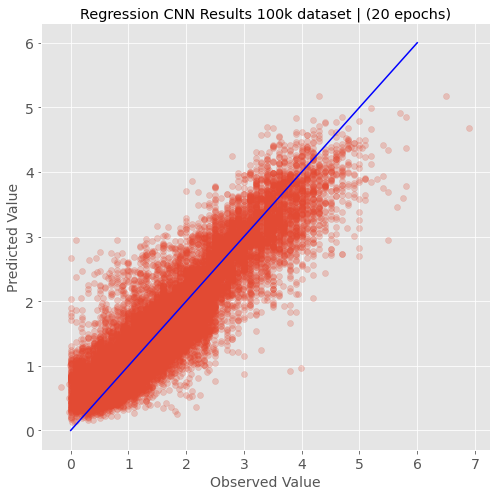

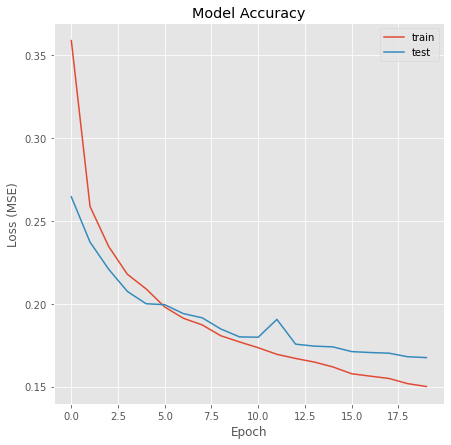

In [7]:
# run the model using CNN regression to predict the earthquake magnitude
model_cnn_rm = SeismicCNN('regression','source_magnitude',100000,full_csv,dir); # initialize the class
model_cnn_rm.train_test_split(test_size=0.25,random_state=44) # train_test_split
model_cnn_rm.regression_cnn('source_magnitude',20) # use the classification cnn method with 15 epochs
model_cnn_rm.evaluate_regression_model() # evaluate the model

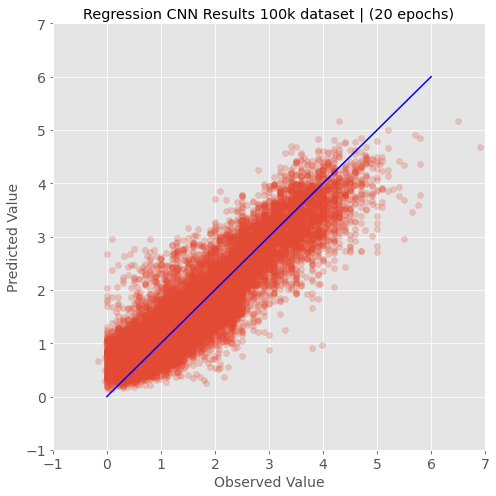

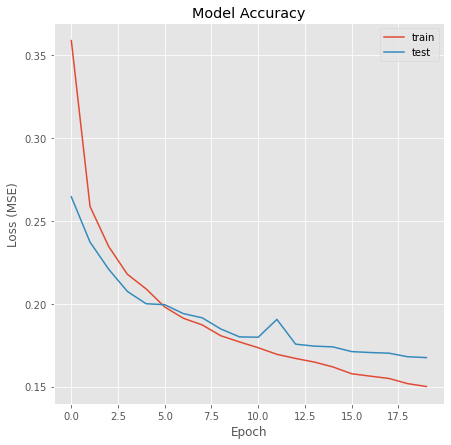

The baseline mse for earthquake magnitude is 0.9501049752369152 

The mse of the LSTM regression for earthquake magnitude is 0.15895192325115204 



In [22]:
# plot y true vs. y-predicted earthquake magnitude
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_cnn_rm.test_labels,model_cnn_rm.predicted,alpha=0.25)
point1 = [0,0]
point2 = [6,6]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression CNN Results 100k dataset | ({model_cnn_rm.epochs} epochs)')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([-1,7])
ax.set_ylim([-1,7])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# plot model loss history
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_cnn_rm.history.history['loss'])
ax.plot(model_cnn_rm.history.history['val_loss'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Loss (MSE)')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_cnn_rm.test_labels - np.mean(model_cnn_rm.test_labels)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for earthquake magnitude is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the CNN regression for earthquake magnitude is {model_cnn_rm.test_loss} \n')

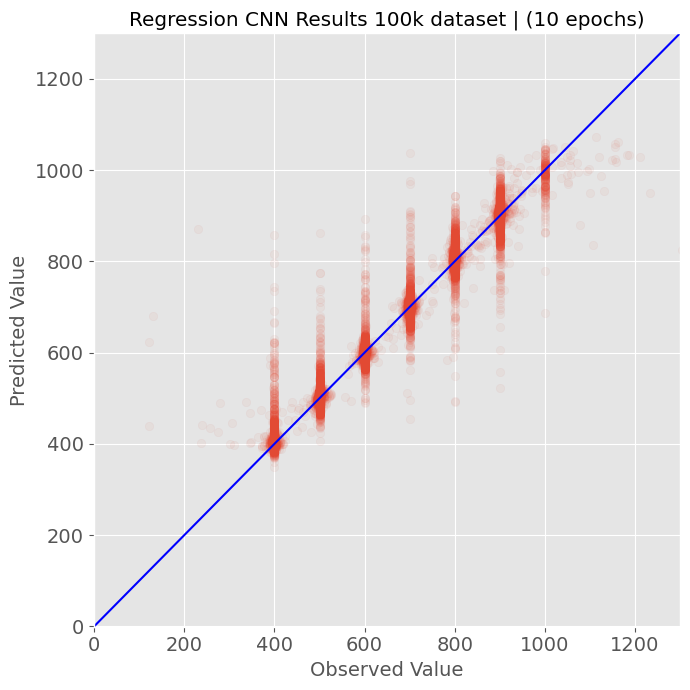

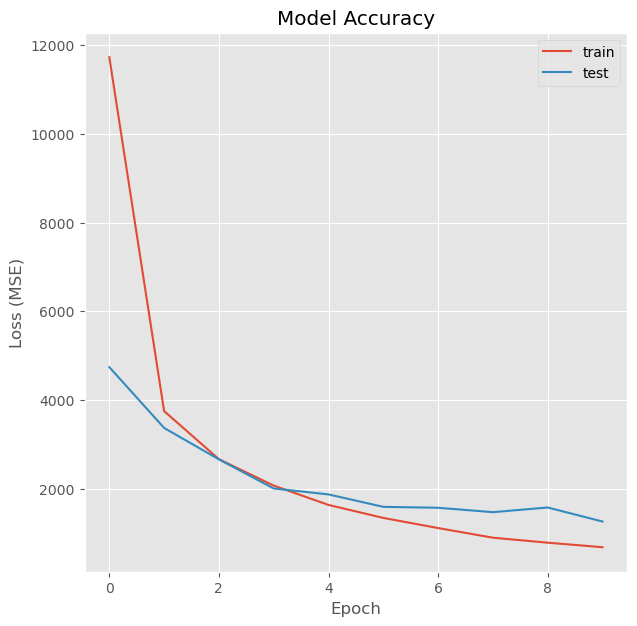

The baseline mse for p-wave arrival time is 30585.887678084586 

The mse of the CNN regression for p-wave arrival time is 1216.204345703125 



In [52]:
# plot y true vs. y-predicted p-wave arrival time
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_cnn_rp.test_labels,model_cnn_rp.predicted,alpha=0.05)
point1 = [0,0]
point2 = [1300,1300]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression CNN Results 100k dataset | ({model_cnn_rp.epochs} epochs)')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([-1,1300])
ax.set_ylim([-1,1300])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# plot model loss history
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_cnn_rp.history.history['loss'])
ax.plot(model_cnn_rp.history.history['val_loss'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Loss (MSE)')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_cnn_rp.test_labels - np.mean(model_cnn_rp.test_labels)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for p-wave arrival time is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the CNN regression for p-wave arrival time is {model_cnn_rp.test_loss} \n')

The number of all traces in the directory including noise is 100000
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working on trace 

Working on trace # 531
Working on trace # 532
Working on trace # 533
Working on trace # 534
Working on trace # 535
Working on trace # 536
Working on trace # 537
Working on trace # 538
Working on trace # 539
Working on trace # 540
Working on trace # 541
Working on trace # 542
Working on trace # 543
Working on trace # 544
Working on trace # 545
Working on trace # 546
Working on trace # 547
Working on trace # 548
Working on trace # 549
Working on trace # 550
Working on trace # 551
Working on trace # 552
Working on trace # 553
Working on trace # 554
Working on trace # 555
Working on trace # 556
Working on trace # 557
Working on trace # 558
Working on trace # 559
Working on trace # 560
Working on trace # 561
Working on trace # 562
Working on trace # 563
Working on trace # 564
Working on trace # 565
Working on trace # 566
Working on trace # 567
Working on trace # 568
Working on trace # 569
Working on trace # 570
Working on trace # 571
Working on trace # 572
Working on trace # 573
Working on 

Working on trace # 910
Working on trace # 911
Working on trace # 912
Working on trace # 913
Working on trace # 914
Working on trace # 915
Working on trace # 916
Working on trace # 917
Working on trace # 918
Working on trace # 919
Working on trace # 920
Working on trace # 921
Working on trace # 922
Working on trace # 923
Working on trace # 924
Working on trace # 925
Working on trace # 926
Working on trace # 927
Working on trace # 928
Working on trace # 929
Working on trace # 930
Working on trace # 931
Working on trace # 932
Working on trace # 933
Working on trace # 934
Working on trace # 935
Working on trace # 936
Working on trace # 937
Working on trace # 938
Working on trace # 939
Working on trace # 940
Working on trace # 941
Working on trace # 942
Working on trace # 943
Working on trace # 944
Working on trace # 945
Working on trace # 946
Working on trace # 947
Working on trace # 948
Working on trace # 949
Working on trace # 950
Working on trace # 951
Working on trace # 952
Working on 

Working on trace # 1322
Working on trace # 1323
Working on trace # 1324
Working on trace # 1325
Working on trace # 1326
Working on trace # 1327
Working on trace # 1328
Working on trace # 1329
Working on trace # 1330
Working on trace # 1331
Working on trace # 1332
Working on trace # 1333
Working on trace # 1334
Working on trace # 1335
Working on trace # 1336
Working on trace # 1337
Working on trace # 1338
Working on trace # 1339
Working on trace # 1340
Working on trace # 1341
Working on trace # 1342
Working on trace # 1343
Working on trace # 1344
Working on trace # 1345
Working on trace # 1346
Working on trace # 1347
Working on trace # 1348
Working on trace # 1349
Working on trace # 1350
Working on trace # 1351
Working on trace # 1352
Working on trace # 1353
Working on trace # 1354
Working on trace # 1355
Working on trace # 1356
Working on trace # 1357
Working on trace # 1358
Working on trace # 1359
Working on trace # 1360
Working on trace # 1361
Working on trace # 1362
Working on trace

Working on trace # 1734
Working on trace # 1735
Working on trace # 1736
Working on trace # 1737
Working on trace # 1738
Working on trace # 1739
Working on trace # 1740
Working on trace # 1741
Working on trace # 1742
Working on trace # 1743
Working on trace # 1744
Working on trace # 1745
Working on trace # 1746
Working on trace # 1747
Working on trace # 1748
Working on trace # 1749
Working on trace # 1750
Working on trace # 1751
Working on trace # 1752
Working on trace # 1753
Working on trace # 1754
Working on trace # 1755
Working on trace # 1756
Working on trace # 1757
Working on trace # 1758
Working on trace # 1759
Working on trace # 1760
Working on trace # 1761
Working on trace # 1762
Working on trace # 1763
Working on trace # 1764
Working on trace # 1765
Working on trace # 1766
Working on trace # 1767
Working on trace # 1768
Working on trace # 1769
Working on trace # 1770
Working on trace # 1771
Working on trace # 1772
Working on trace # 1773
Working on trace # 1774
Working on trace

Working on trace # 2160
Working on trace # 2161
Working on trace # 2162
Working on trace # 2163
Working on trace # 2164
Working on trace # 2165
Working on trace # 2166
Working on trace # 2167
Working on trace # 2168
Working on trace # 2169
Working on trace # 2170
Working on trace # 2171
Working on trace # 2172
Working on trace # 2173
Working on trace # 2174
Working on trace # 2175
Working on trace # 2176
Working on trace # 2177
Working on trace # 2178
Working on trace # 2179
Working on trace # 2180
Working on trace # 2181
Working on trace # 2182
Working on trace # 2183
Working on trace # 2184
Working on trace # 2185
Working on trace # 2186
Working on trace # 2187
Working on trace # 2188
Working on trace # 2189
Working on trace # 2190
Working on trace # 2191
Working on trace # 2192
Working on trace # 2193
Working on trace # 2194
Working on trace # 2195
Working on trace # 2196
Working on trace # 2197
Working on trace # 2198
Working on trace # 2199
Working on trace # 2200
Working on trace

Working on trace # 2594
Working on trace # 2595
Working on trace # 2596
Working on trace # 2597
Working on trace # 2598
Working on trace # 2599
Working on trace # 2600
Working on trace # 2601
Working on trace # 2602
Working on trace # 2603
Working on trace # 2604
Working on trace # 2605
Working on trace # 2606
Working on trace # 2607
Working on trace # 2608
Working on trace # 2609
Working on trace # 2610
Working on trace # 2611
Working on trace # 2612
Working on trace # 2613
Working on trace # 2614
Working on trace # 2615
Working on trace # 2616
Working on trace # 2617
Working on trace # 2618
Working on trace # 2619
Working on trace # 2620
Working on trace # 2621
Working on trace # 2622
Working on trace # 2623
Working on trace # 2624
Working on trace # 2625
Working on trace # 2626
Working on trace # 2627
Working on trace # 2628
Working on trace # 2629
Working on trace # 2630
Working on trace # 2631
Working on trace # 2632
Working on trace # 2633
Working on trace # 2634
Working on trace

Working on trace # 3035
Working on trace # 3036
Working on trace # 3037
Working on trace # 3038
Working on trace # 3039
Working on trace # 3040
Working on trace # 3041
Working on trace # 3042
Working on trace # 3043
Working on trace # 3044
Working on trace # 3045
Working on trace # 3046
Working on trace # 3047
Working on trace # 3048
Working on trace # 3049
Working on trace # 3050
Working on trace # 3051
Working on trace # 3052
Working on trace # 3053
Working on trace # 3054
Working on trace # 3055
Working on trace # 3056
Working on trace # 3057
Working on trace # 3058
Working on trace # 3059
Working on trace # 3060
Working on trace # 3061
Working on trace # 3062
Working on trace # 3063
Working on trace # 3064
Working on trace # 3065
Working on trace # 3066
Working on trace # 3067
Working on trace # 3068
Working on trace # 3069
Working on trace # 3070
Working on trace # 3071
Working on trace # 3072
Working on trace # 3073
Working on trace # 3074
Working on trace # 3075
Working on trace

Working on trace # 3482
Working on trace # 3483
Working on trace # 3484
Working on trace # 3485
Working on trace # 3486
Working on trace # 3487
Working on trace # 3488
Working on trace # 3489
Working on trace # 3490
Working on trace # 3491
Working on trace # 3492
Working on trace # 3493
Working on trace # 3494
Working on trace # 3495
Working on trace # 3496
Working on trace # 3497
Working on trace # 3498
Working on trace # 3499
Working on trace # 3500
Working on trace # 3501
Working on trace # 3502
Working on trace # 3503
Working on trace # 3504
Working on trace # 3505
Working on trace # 3506
Working on trace # 3507
Working on trace # 3508
Working on trace # 3509
Working on trace # 3510
Working on trace # 3511
Working on trace # 3512
Working on trace # 3513
Working on trace # 3514
Working on trace # 3515
Working on trace # 3516
Working on trace # 3517
Working on trace # 3518
Working on trace # 3519
Working on trace # 3520
Working on trace # 3521
Working on trace # 3522
Working on trace

Working on trace # 3956
Working on trace # 3957
Working on trace # 3958
Working on trace # 3959
Working on trace # 3960
Working on trace # 3961
Working on trace # 3962
Working on trace # 3963
Working on trace # 3964
Working on trace # 3965
Working on trace # 3966
Working on trace # 3967
Working on trace # 3968
Working on trace # 3969
Working on trace # 3970
Working on trace # 3971
Working on trace # 3972
Working on trace # 3973
Working on trace # 3974
Working on trace # 3975
Working on trace # 3976
Working on trace # 3977
Working on trace # 3978
Working on trace # 3979
Working on trace # 3980
Working on trace # 3981
Working on trace # 3982
Working on trace # 3983
Working on trace # 3984
Working on trace # 3985
Working on trace # 3986
Working on trace # 3987
Working on trace # 3988
Working on trace # 3989
Working on trace # 3990
Working on trace # 3991
Working on trace # 3992
Working on trace # 3993
Working on trace # 3994
Working on trace # 3995
Working on trace # 3996
Working on trace

Working on trace # 4428
Working on trace # 4429
Working on trace # 4430
Working on trace # 4431
Working on trace # 4432
Working on trace # 4433
Working on trace # 4434
Working on trace # 4435
Working on trace # 4436
Working on trace # 4437
Working on trace # 4438
Working on trace # 4439
Working on trace # 4440
Working on trace # 4441
Working on trace # 4442
Working on trace # 4443
Working on trace # 4444
Working on trace # 4445
Working on trace # 4446
Working on trace # 4447
Working on trace # 4448
Working on trace # 4449
Working on trace # 4450
Working on trace # 4451
Working on trace # 4452
Working on trace # 4453
Working on trace # 4454
Working on trace # 4455
Working on trace # 4456
Working on trace # 4457
Working on trace # 4458
Working on trace # 4459
Working on trace # 4460
Working on trace # 4461
Working on trace # 4462
Working on trace # 4463
Working on trace # 4464
Working on trace # 4465
Working on trace # 4466
Working on trace # 4467
Working on trace # 4468
Working on trace

Working on trace # 4905
Working on trace # 4906
Working on trace # 4907
Working on trace # 4908
Working on trace # 4909
Working on trace # 4910
Working on trace # 4911
Working on trace # 4912
Working on trace # 4913
Working on trace # 4914
Working on trace # 4915
Working on trace # 4916
Working on trace # 4917
Working on trace # 4918
Working on trace # 4919
Working on trace # 4920
Working on trace # 4921
Working on trace # 4922
Working on trace # 4923
Working on trace # 4924
Working on trace # 4925
Working on trace # 4926
Working on trace # 4927
Working on trace # 4928
Working on trace # 4929
Working on trace # 4930
Working on trace # 4931
Working on trace # 4932
Working on trace # 4933
Working on trace # 4934
Working on trace # 4935
Working on trace # 4936
Working on trace # 4937
Working on trace # 4938
Working on trace # 4939
Working on trace # 4940
Working on trace # 4941
Working on trace # 4942
Working on trace # 4943
Working on trace # 4944
Working on trace # 4945
Working on trace

Working on trace # 5400
Working on trace # 5401
Working on trace # 5402
Working on trace # 5403
Working on trace # 5404
Working on trace # 5405
Working on trace # 5406
Working on trace # 5407
Working on trace # 5408
Working on trace # 5409
Working on trace # 5410
Working on trace # 5411
Working on trace # 5412
Working on trace # 5413
Working on trace # 5414
Working on trace # 5415
Working on trace # 5416
Working on trace # 5417
Working on trace # 5418
Working on trace # 5419
Working on trace # 5420
Working on trace # 5421
Working on trace # 5422
Working on trace # 5423
Working on trace # 5424
Working on trace # 5425
Working on trace # 5426
Working on trace # 5427
Working on trace # 5428
Working on trace # 5429
Working on trace # 5430
Working on trace # 5431
Working on trace # 5432
Working on trace # 5433
Working on trace # 5434
Working on trace # 5435
Working on trace # 5436
Working on trace # 5437
Working on trace # 5438
Working on trace # 5439
Working on trace # 5440
Working on trace

Working on trace # 5892
Working on trace # 5893
Working on trace # 5894
Working on trace # 5895
Working on trace # 5896
Working on trace # 5897
Working on trace # 5898
Working on trace # 5899
Working on trace # 5900
Working on trace # 5901
Working on trace # 5902
Working on trace # 5903
Working on trace # 5904
Working on trace # 5905
Working on trace # 5906
Working on trace # 5907
Working on trace # 5908
Working on trace # 5909
Working on trace # 5910
Working on trace # 5911
Working on trace # 5912
Working on trace # 5913
Working on trace # 5914
Working on trace # 5915
Working on trace # 5916
Working on trace # 5917
Working on trace # 5918
Working on trace # 5919
Working on trace # 5920
Working on trace # 5921
Working on trace # 5922
Working on trace # 5923
Working on trace # 5924
Working on trace # 5925
Working on trace # 5926
Working on trace # 5927
Working on trace # 5928
Working on trace # 5929
Working on trace # 5930
Working on trace # 5931
Working on trace # 5932
Working on trace

Working on trace # 6362
Working on trace # 6363
Working on trace # 6364
Working on trace # 6365
Working on trace # 6366
Working on trace # 6367
Working on trace # 6368
Working on trace # 6369
Working on trace # 6370
Working on trace # 6371
Working on trace # 6372
Working on trace # 6373
Working on trace # 6374
Working on trace # 6375
Working on trace # 6376
Working on trace # 6377
Working on trace # 6378
Working on trace # 6379
Working on trace # 6380
Working on trace # 6381
Working on trace # 6382
Working on trace # 6383
Working on trace # 6384
Working on trace # 6385
Working on trace # 6386
Working on trace # 6387
Working on trace # 6388
Working on trace # 6389
Working on trace # 6390
Working on trace # 6391
Working on trace # 6392
Working on trace # 6393
Working on trace # 6394
Working on trace # 6395
Working on trace # 6396
Working on trace # 6397
Working on trace # 6398
Working on trace # 6399
Working on trace # 6400
Working on trace # 6401
Working on trace # 6402
Working on trace

Working on trace # 6824
Working on trace # 6825
Working on trace # 6826
Working on trace # 6827
Working on trace # 6828
Working on trace # 6829
Working on trace # 6830
Working on trace # 6831
Working on trace # 6832
Working on trace # 6833
Working on trace # 6834
Working on trace # 6835
Working on trace # 6836
Working on trace # 6837
Working on trace # 6838
Working on trace # 6839
Working on trace # 6840
Working on trace # 6841
Working on trace # 6842
Working on trace # 6843
Working on trace # 6844
Working on trace # 6845
Working on trace # 6846
Working on trace # 6847
Working on trace # 6848
Working on trace # 6849
Working on trace # 6850
Working on trace # 6851
Working on trace # 6852
Working on trace # 6853
Working on trace # 6854
Working on trace # 6855
Working on trace # 6856
Working on trace # 6857
Working on trace # 6858
Working on trace # 6859
Working on trace # 6860
Working on trace # 6861
Working on trace # 6862
Working on trace # 6863
Working on trace # 6864
Working on trace

Working on trace # 7287
Working on trace # 7288
Working on trace # 7289
Working on trace # 7290
Working on trace # 7291
Working on trace # 7292
Working on trace # 7293
Working on trace # 7294
Working on trace # 7295
Working on trace # 7296
Working on trace # 7297
Working on trace # 7298
Working on trace # 7299
Working on trace # 7300
Working on trace # 7301
Working on trace # 7302
Working on trace # 7303
Working on trace # 7304
Working on trace # 7305
Working on trace # 7306
Working on trace # 7307
Working on trace # 7308
Working on trace # 7309
Working on trace # 7310
Working on trace # 7311
Working on trace # 7312
Working on trace # 7313
Working on trace # 7314
Working on trace # 7315
Working on trace # 7316
Working on trace # 7317
Working on trace # 7318
Working on trace # 7319
Working on trace # 7320
Working on trace # 7321
Working on trace # 7322
Working on trace # 7323
Working on trace # 7324
Working on trace # 7325
Working on trace # 7326
Working on trace # 7327
Working on trace

Working on trace # 7747
Working on trace # 7748
Working on trace # 7749
Working on trace # 7750
Working on trace # 7751
Working on trace # 7752
Working on trace # 7753
Working on trace # 7754
Working on trace # 7755
Working on trace # 7756
Working on trace # 7757
Working on trace # 7758
Working on trace # 7759
Working on trace # 7760
Working on trace # 7761
Working on trace # 7762
Working on trace # 7763
Working on trace # 7764
Working on trace # 7765
Working on trace # 7766
Working on trace # 7767
Working on trace # 7768
Working on trace # 7769
Working on trace # 7770
Working on trace # 7771
Working on trace # 7772
Working on trace # 7773
Working on trace # 7774
Working on trace # 7775
Working on trace # 7776
Working on trace # 7777
Working on trace # 7778
Working on trace # 7779
Working on trace # 7780
Working on trace # 7781
Working on trace # 7782
Working on trace # 7783
Working on trace # 7784
Working on trace # 7785
Working on trace # 7786
Working on trace # 7787
Working on trace

Working on trace # 8203
Working on trace # 8204
Working on trace # 8205
Working on trace # 8206
Working on trace # 8207
Working on trace # 8208
Working on trace # 8209
Working on trace # 8210
Working on trace # 8211
Working on trace # 8212
Working on trace # 8213
Working on trace # 8214
Working on trace # 8215
Working on trace # 8216
Working on trace # 8217
Working on trace # 8218
Working on trace # 8219
Working on trace # 8220
Working on trace # 8221
Working on trace # 8222
Working on trace # 8223
Working on trace # 8224
Working on trace # 8225
Working on trace # 8226
Working on trace # 8227
Working on trace # 8228
Working on trace # 8229
Working on trace # 8230
Working on trace # 8231
Working on trace # 8232
Working on trace # 8233
Working on trace # 8234
Working on trace # 8235
Working on trace # 8236
Working on trace # 8237
Working on trace # 8238
Working on trace # 8239
Working on trace # 8240
Working on trace # 8241
Working on trace # 8242
Working on trace # 8243
Working on trace

Working on trace # 8662
Working on trace # 8663
Working on trace # 8664
Working on trace # 8665
Working on trace # 8666
Working on trace # 8667
Working on trace # 8668
Working on trace # 8669
Working on trace # 8670
Working on trace # 8671
Working on trace # 8672
Working on trace # 8673
Working on trace # 8674
Working on trace # 8675
Working on trace # 8676
Working on trace # 8677
Working on trace # 8678
Working on trace # 8679
Working on trace # 8680
Working on trace # 8681
Working on trace # 8682
Working on trace # 8683
Working on trace # 8684
Working on trace # 8685
Working on trace # 8686
Working on trace # 8687
Working on trace # 8688
Working on trace # 8689
Working on trace # 8690
Working on trace # 8691
Working on trace # 8692
Working on trace # 8693
Working on trace # 8694
Working on trace # 8695
Working on trace # 8696
Working on trace # 8697
Working on trace # 8698
Working on trace # 8699
Working on trace # 8700
Working on trace # 8701
Working on trace # 8702
Working on trace

Working on trace # 9142
Working on trace # 9143
Working on trace # 9144
Working on trace # 9145
Working on trace # 9146
Working on trace # 9147
Working on trace # 9148
Working on trace # 9149
Working on trace # 9150
Working on trace # 9151
Working on trace # 9152
Working on trace # 9153
Working on trace # 9154
Working on trace # 9155
Working on trace # 9156
Working on trace # 9157
Working on trace # 9158
Working on trace # 9159
Working on trace # 9160
Working on trace # 9161
Working on trace # 9162
Working on trace # 9163
Working on trace # 9164
Working on trace # 9165
Working on trace # 9166
Working on trace # 9167
Working on trace # 9168
Working on trace # 9169
Working on trace # 9170
Working on trace # 9171
Working on trace # 9172
Working on trace # 9173
Working on trace # 9174
Working on trace # 9175
Working on trace # 9176
Working on trace # 9177
Working on trace # 9178
Working on trace # 9179
Working on trace # 9180
Working on trace # 9181
Working on trace # 9182
Working on trace

Working on trace # 9635
Working on trace # 9636
Working on trace # 9637
Working on trace # 9638
Working on trace # 9639
Working on trace # 9640
Working on trace # 9641
Working on trace # 9642
Working on trace # 9643
Working on trace # 9644
Working on trace # 9645
Working on trace # 9646
Working on trace # 9647
Working on trace # 9648
Working on trace # 9649
Working on trace # 9650
Working on trace # 9651
Working on trace # 9652
Working on trace # 9653
Working on trace # 9654
Working on trace # 9655
Working on trace # 9656
Working on trace # 9657
Working on trace # 9658
Working on trace # 9659
Working on trace # 9660
Working on trace # 9661
Working on trace # 9662
Working on trace # 9663
Working on trace # 9664
Working on trace # 9665
Working on trace # 9666
Working on trace # 9667
Working on trace # 9668
Working on trace # 9669
Working on trace # 9670
Working on trace # 9671
Working on trace # 9672
Working on trace # 9673
Working on trace # 9674
Working on trace # 9675
Working on trace

Working on trace # 10121
Working on trace # 10122
Working on trace # 10123
Working on trace # 10124
Working on trace # 10125
Working on trace # 10126
Working on trace # 10127
Working on trace # 10128
Working on trace # 10129
Working on trace # 10130
Working on trace # 10131
Working on trace # 10132
Working on trace # 10133
Working on trace # 10134
Working on trace # 10135
Working on trace # 10136
Working on trace # 10137
Working on trace # 10138
Working on trace # 10139
Working on trace # 10140
Working on trace # 10141
Working on trace # 10142
Working on trace # 10143
Working on trace # 10144
Working on trace # 10145
Working on trace # 10146
Working on trace # 10147
Working on trace # 10148
Working on trace # 10149
Working on trace # 10150
Working on trace # 10151
Working on trace # 10152
Working on trace # 10153
Working on trace # 10154
Working on trace # 10155
Working on trace # 10156
Working on trace # 10157
Working on trace # 10158
Working on trace # 10159
Working on trace # 10160


Working on trace # 10610
Working on trace # 10611
Working on trace # 10612
Working on trace # 10613
Working on trace # 10614
Working on trace # 10615
Working on trace # 10616
Working on trace # 10617
Working on trace # 10618
Working on trace # 10619
Working on trace # 10620
Working on trace # 10621
Working on trace # 10622
Working on trace # 10623
Working on trace # 10624
Working on trace # 10625
Working on trace # 10626
Working on trace # 10627
Working on trace # 10628
Working on trace # 10629
Working on trace # 10630
Working on trace # 10631
Working on trace # 10632
Working on trace # 10633
Working on trace # 10634
Working on trace # 10635
Working on trace # 10636
Working on trace # 10637
Working on trace # 10638
Working on trace # 10639
Working on trace # 10640
Working on trace # 10641
Working on trace # 10642
Working on trace # 10643
Working on trace # 10644
Working on trace # 10645
Working on trace # 10646
Working on trace # 10647
Working on trace # 10648
Working on trace # 10649


Working on trace # 11018
Working on trace # 11019
Working on trace # 11020
Working on trace # 11021
Working on trace # 11022
Working on trace # 11023
Working on trace # 11024
Working on trace # 11025
Working on trace # 11026
Working on trace # 11027
Working on trace # 11028
Working on trace # 11029
Working on trace # 11030
Working on trace # 11031
Working on trace # 11032
Working on trace # 11033
Working on trace # 11034
Working on trace # 11035
Working on trace # 11036
Working on trace # 11037
Working on trace # 11038
Working on trace # 11039
Working on trace # 11040
Working on trace # 11041
Working on trace # 11042
Working on trace # 11043
Working on trace # 11044
Working on trace # 11045
Working on trace # 11046
Working on trace # 11047
Working on trace # 11048
Working on trace # 11049
Working on trace # 11050
Working on trace # 11051
Working on trace # 11052
Working on trace # 11053
Working on trace # 11054
Working on trace # 11055
Working on trace # 11056
Working on trace # 11057


Working on trace # 11571
Working on trace # 11572
Working on trace # 11573
Working on trace # 11574
Working on trace # 11575
Working on trace # 11576
Working on trace # 11577
Working on trace # 11578
Working on trace # 11579
Working on trace # 11580
Working on trace # 11581
Working on trace # 11582
Working on trace # 11583
Working on trace # 11584
Working on trace # 11585
Working on trace # 11586
Working on trace # 11587
Working on trace # 11588
Working on trace # 11589
Working on trace # 11590
Working on trace # 11591
Working on trace # 11592
Working on trace # 11593
Working on trace # 11594
Working on trace # 11595
Working on trace # 11596
Working on trace # 11597
Working on trace # 11598
Working on trace # 11599
Working on trace # 11600
Working on trace # 11601
Working on trace # 11602
Working on trace # 11603
Working on trace # 11604
Working on trace # 11605
Working on trace # 11606
Working on trace # 11607
Working on trace # 11608
Working on trace # 11609
Working on trace # 11610


Working on trace # 11993
Working on trace # 11994
Working on trace # 11995
Working on trace # 11996
Working on trace # 11997
Working on trace # 11998
Working on trace # 11999
Working on trace # 12000
Working on trace # 12001
Working on trace # 12002
Working on trace # 12003
Working on trace # 12004
Working on trace # 12005
Working on trace # 12006
Working on trace # 12007
Working on trace # 12008
Working on trace # 12009
Working on trace # 12010
Working on trace # 12011
Working on trace # 12012
Working on trace # 12013
Working on trace # 12014
Working on trace # 12015
Working on trace # 12016
Working on trace # 12017
Working on trace # 12018
Working on trace # 12019
Working on trace # 12020
Working on trace # 12021
Working on trace # 12022
Working on trace # 12023
Working on trace # 12024
Working on trace # 12025
Working on trace # 12026
Working on trace # 12027
Working on trace # 12028
Working on trace # 12029
Working on trace # 12030
Working on trace # 12031
Working on trace # 12032


Working on trace # 12342
Working on trace # 12343
Working on trace # 12344
Working on trace # 12345
Working on trace # 12346
Working on trace # 12347
Working on trace # 12348
Working on trace # 12349
Working on trace # 12350
Working on trace # 12351
Working on trace # 12352
Working on trace # 12353
Working on trace # 12354
Working on trace # 12355
Working on trace # 12356
Working on trace # 12357
Working on trace # 12358
Working on trace # 12359
Working on trace # 12360
Working on trace # 12361
Working on trace # 12362
Working on trace # 12363
Working on trace # 12364
Working on trace # 12365
Working on trace # 12366
Working on trace # 12367
Working on trace # 12368
Working on trace # 12369
Working on trace # 12370
Working on trace # 12371
Working on trace # 12372
Working on trace # 12373
Working on trace # 12374
Working on trace # 12375
Working on trace # 12376
Working on trace # 12377
Working on trace # 12378
Working on trace # 12379
Working on trace # 12380
Working on trace # 12381


Working on trace # 12726
Working on trace # 12727
Working on trace # 12728
Working on trace # 12729
Working on trace # 12730
Working on trace # 12731
Working on trace # 12732
Working on trace # 12733
Working on trace # 12734
Working on trace # 12735
Working on trace # 12736
Working on trace # 12737
Working on trace # 12738
Working on trace # 12739
Working on trace # 12740
Working on trace # 12741
Working on trace # 12742
Working on trace # 12743
Working on trace # 12744
Working on trace # 12745
Working on trace # 12746
Working on trace # 12747
Working on trace # 12748
Working on trace # 12749
Working on trace # 12750
Working on trace # 12751
Working on trace # 12752
Working on trace # 12753
Working on trace # 12754
Working on trace # 12755
Working on trace # 12756
Working on trace # 12757
Working on trace # 12758
Working on trace # 12759
Working on trace # 12760
Working on trace # 12761
Working on trace # 12762
Working on trace # 12763
Working on trace # 12764
Working on trace # 12765


Working on trace # 13170
Working on trace # 13171
Working on trace # 13172
Working on trace # 13173
Working on trace # 13174
Working on trace # 13175
Working on trace # 13176
Working on trace # 13177
Working on trace # 13178
Working on trace # 13179
Working on trace # 13180
Working on trace # 13181
Working on trace # 13182
Working on trace # 13183
Working on trace # 13184
Working on trace # 13185
Working on trace # 13186
Working on trace # 13187
Working on trace # 13188
Working on trace # 13189
Working on trace # 13190
Working on trace # 13191
Working on trace # 13192
Working on trace # 13193
Working on trace # 13194
Working on trace # 13195
Working on trace # 13196
Working on trace # 13197
Working on trace # 13198
Working on trace # 13199
Working on trace # 13200
Working on trace # 13201
Working on trace # 13202
Working on trace # 13203
Working on trace # 13204
Working on trace # 13205
Working on trace # 13206
Working on trace # 13207
Working on trace # 13208
Working on trace # 13209


Working on trace # 13606
Working on trace # 13607
Working on trace # 13608
Working on trace # 13609
Working on trace # 13610
Working on trace # 13611
Working on trace # 13612
Working on trace # 13613
Working on trace # 13614
Working on trace # 13615
Working on trace # 13616
Working on trace # 13617
Working on trace # 13618
Working on trace # 13619
Working on trace # 13620
Working on trace # 13621
Working on trace # 13622
Working on trace # 13623
Working on trace # 13624
Working on trace # 13625
Working on trace # 13626
Working on trace # 13627
Working on trace # 13628
Working on trace # 13629
Working on trace # 13630
Working on trace # 13631
Working on trace # 13632
Working on trace # 13633
Working on trace # 13634
Working on trace # 13635
Working on trace # 13636
Working on trace # 13637
Working on trace # 13638
Working on trace # 13639
Working on trace # 13640
Working on trace # 13641
Working on trace # 13642
Working on trace # 13643
Working on trace # 13644
Working on trace # 13645


Working on trace # 14063
Working on trace # 14064
Working on trace # 14065
Working on trace # 14066
Working on trace # 14067
Working on trace # 14068
Working on trace # 14069
Working on trace # 14070
Working on trace # 14071
Working on trace # 14072
Working on trace # 14073
Working on trace # 14074
Working on trace # 14075
Working on trace # 14076
Working on trace # 14077
Working on trace # 14078
Working on trace # 14079
Working on trace # 14080
Working on trace # 14081
Working on trace # 14082
Working on trace # 14083
Working on trace # 14084
Working on trace # 14085
Working on trace # 14086
Working on trace # 14087
Working on trace # 14088
Working on trace # 14089
Working on trace # 14090
Working on trace # 14091
Working on trace # 14092
Working on trace # 14093
Working on trace # 14094
Working on trace # 14095
Working on trace # 14096
Working on trace # 14097
Working on trace # 14098
Working on trace # 14099
Working on trace # 14100
Working on trace # 14101
Working on trace # 14102


Working on trace # 14494
Working on trace # 14495
Working on trace # 14496
Working on trace # 14497
Working on trace # 14498
Working on trace # 14499
Working on trace # 14500
Working on trace # 14501
Working on trace # 14502
Working on trace # 14503
Working on trace # 14504
Working on trace # 14505
Working on trace # 14506
Working on trace # 14507
Working on trace # 14508
Working on trace # 14509
Working on trace # 14510
Working on trace # 14511
Working on trace # 14512
Working on trace # 14513
Working on trace # 14514
Working on trace # 14515
Working on trace # 14516
Working on trace # 14517
Working on trace # 14518
Working on trace # 14519
Working on trace # 14520
Working on trace # 14521
Working on trace # 14522
Working on trace # 14523
Working on trace # 14524
Working on trace # 14525
Working on trace # 14526
Working on trace # 14527
Working on trace # 14528
Working on trace # 14529
Working on trace # 14530
Working on trace # 14531
Working on trace # 14532
Working on trace # 14533


Working on trace # 14909
Working on trace # 14910
Working on trace # 14911
Working on trace # 14912
Working on trace # 14913
Working on trace # 14914
Working on trace # 14915
Working on trace # 14916
Working on trace # 14917
Working on trace # 14918
Working on trace # 14919
Working on trace # 14920
Working on trace # 14921
Working on trace # 14922
Working on trace # 14923
Working on trace # 14924
Working on trace # 14925
Working on trace # 14926
Working on trace # 14927
Working on trace # 14928
Working on trace # 14929
Working on trace # 14930
Working on trace # 14931
Working on trace # 14932
Working on trace # 14933
Working on trace # 14934
Working on trace # 14935
Working on trace # 14936
Working on trace # 14937
Working on trace # 14938
Working on trace # 14939
Working on trace # 14940
Working on trace # 14941
Working on trace # 14942
Working on trace # 14943
Working on trace # 14944
Working on trace # 14945
Working on trace # 14946
Working on trace # 14947
Working on trace # 14948


Working on trace # 15321
Working on trace # 15322
Working on trace # 15323
Working on trace # 15324
Working on trace # 15325
Working on trace # 15326
Working on trace # 15327
Working on trace # 15328
Working on trace # 15329
Working on trace # 15330
Working on trace # 15331
Working on trace # 15332
Working on trace # 15333
Working on trace # 15334
Working on trace # 15335
Working on trace # 15336
Working on trace # 15337
Working on trace # 15338
Working on trace # 15339
Working on trace # 15340
Working on trace # 15341
Working on trace # 15342
Working on trace # 15343
Working on trace # 15344
Working on trace # 15345
Working on trace # 15346
Working on trace # 15347
Working on trace # 15348
Working on trace # 15349
Working on trace # 15350
Working on trace # 15351
Working on trace # 15352
Working on trace # 15353
Working on trace # 15354
Working on trace # 15355
Working on trace # 15356
Working on trace # 15357
Working on trace # 15358
Working on trace # 15359
Working on trace # 15360


Working on trace # 15711
Working on trace # 15712
Working on trace # 15713
Working on trace # 15714
Working on trace # 15715
Working on trace # 15716
Working on trace # 15717
Working on trace # 15718
Working on trace # 15719
Working on trace # 15720
Working on trace # 15721
Working on trace # 15722
Working on trace # 15723
Working on trace # 15724
Working on trace # 15725
Working on trace # 15726
Working on trace # 15727
Working on trace # 15728
Working on trace # 15729
Working on trace # 15730
Working on trace # 15731
Working on trace # 15732
Working on trace # 15733
Working on trace # 15734
Working on trace # 15735
Working on trace # 15736
Working on trace # 15737
Working on trace # 15738
Working on trace # 15739
Working on trace # 15740
Working on trace # 15741
Working on trace # 15742
Working on trace # 15743
Working on trace # 15744
Working on trace # 15745
Working on trace # 15746
Working on trace # 15747
Working on trace # 15748
Working on trace # 15749
Working on trace # 15750


Working on trace # 16138
Working on trace # 16139
Working on trace # 16140
Working on trace # 16141
Working on trace # 16142
Working on trace # 16143
Working on trace # 16144
Working on trace # 16145
Working on trace # 16146
Working on trace # 16147
Working on trace # 16148
Working on trace # 16149
Working on trace # 16150
Working on trace # 16151
Working on trace # 16152
Working on trace # 16153
Working on trace # 16154
Working on trace # 16155
Working on trace # 16156
Working on trace # 16157
Working on trace # 16158
Working on trace # 16159
Working on trace # 16160
Working on trace # 16161
Working on trace # 16162
Working on trace # 16163
Working on trace # 16164
Working on trace # 16165
Working on trace # 16166
Working on trace # 16167
Working on trace # 16168
Working on trace # 16169
Working on trace # 16170
Working on trace # 16171
Working on trace # 16172
Working on trace # 16173
Working on trace # 16174
Working on trace # 16175
Working on trace # 16176
Working on trace # 16177


Working on trace # 16486
Working on trace # 16487
Working on trace # 16488
Working on trace # 16489
Working on trace # 16490
Working on trace # 16491
Working on trace # 16492
Working on trace # 16493
Working on trace # 16494
Working on trace # 16495
Working on trace # 16496
Working on trace # 16497
Working on trace # 16498
Working on trace # 16499
Working on trace # 16500
Working on trace # 16501
Working on trace # 16502
Working on trace # 16503
Working on trace # 16504
Working on trace # 16505
Working on trace # 16506
Working on trace # 16507
Working on trace # 16508
Working on trace # 16509
Working on trace # 16510
Working on trace # 16511
Working on trace # 16512
Working on trace # 16513
Working on trace # 16514
Working on trace # 16515
Working on trace # 16516
Working on trace # 16517
Working on trace # 16518
Working on trace # 16519
Working on trace # 16520
Working on trace # 16521
Working on trace # 16522
Working on trace # 16523
Working on trace # 16524
Working on trace # 16525


Working on trace # 16935
Working on trace # 16936
Working on trace # 16937
Working on trace # 16938
Working on trace # 16939
Working on trace # 16940
Working on trace # 16941
Working on trace # 16942
Working on trace # 16943
Working on trace # 16944
Working on trace # 16945
Working on trace # 16946
Working on trace # 16947
Working on trace # 16948
Working on trace # 16949
Working on trace # 16950
Working on trace # 16951
Working on trace # 16952
Working on trace # 16953
Working on trace # 16954
Working on trace # 16955
Working on trace # 16956
Working on trace # 16957
Working on trace # 16958
Working on trace # 16959
Working on trace # 16960
Working on trace # 16961
Working on trace # 16962
Working on trace # 16963
Working on trace # 16964
Working on trace # 16965
Working on trace # 16966
Working on trace # 16967
Working on trace # 16968
Working on trace # 16969
Working on trace # 16970
Working on trace # 16971
Working on trace # 16972
Working on trace # 16973
Working on trace # 16974


Working on trace # 17372
Working on trace # 17373
Working on trace # 17374
Working on trace # 17375
Working on trace # 17376
Working on trace # 17377
Working on trace # 17378
Working on trace # 17379
Working on trace # 17380
Working on trace # 17381
Working on trace # 17382
Working on trace # 17383
Working on trace # 17384
Working on trace # 17385
Working on trace # 17386
Working on trace # 17387
Working on trace # 17388
Working on trace # 17389
Working on trace # 17390
Working on trace # 17391
Working on trace # 17392
Working on trace # 17393
Working on trace # 17394
Working on trace # 17395
Working on trace # 17396
Working on trace # 17397
Working on trace # 17398
Working on trace # 17399
Working on trace # 17400
Working on trace # 17401
Working on trace # 17402
Working on trace # 17403
Working on trace # 17404
Working on trace # 17405
Working on trace # 17406
Working on trace # 17407
Working on trace # 17408
Working on trace # 17409
Working on trace # 17410
Working on trace # 17411


Working on trace # 17831
Working on trace # 17832
Working on trace # 17833
Working on trace # 17834
Working on trace # 17835
Working on trace # 17836
Working on trace # 17837
Working on trace # 17838
Working on trace # 17839
Working on trace # 17840
Working on trace # 17841
Working on trace # 17842
Working on trace # 17843
Working on trace # 17844
Working on trace # 17845
Working on trace # 17846
Working on trace # 17847
Working on trace # 17848
Working on trace # 17849
Working on trace # 17850
Working on trace # 17851
Working on trace # 17852
Working on trace # 17853
Working on trace # 17854
Working on trace # 17855
Working on trace # 17856
Working on trace # 17857
Working on trace # 17858
Working on trace # 17859
Working on trace # 17860
Working on trace # 17861
Working on trace # 17862
Working on trace # 17863
Working on trace # 17864
Working on trace # 17865
Working on trace # 17866
Working on trace # 17867
Working on trace # 17868
Working on trace # 17869
Working on trace # 17870


Working on trace # 18186
Working on trace # 18187
Working on trace # 18188
Working on trace # 18189
Working on trace # 18190
Working on trace # 18191
Working on trace # 18192
Working on trace # 18193
Working on trace # 18194
Working on trace # 18195
Working on trace # 18196
Working on trace # 18197
Working on trace # 18198
Working on trace # 18199
Working on trace # 18200
Working on trace # 18201
Working on trace # 18202
Working on trace # 18203
Working on trace # 18204
Working on trace # 18205
Working on trace # 18206
Working on trace # 18207
Working on trace # 18208
Working on trace # 18209
Working on trace # 18210
Working on trace # 18211
Working on trace # 18212
Working on trace # 18213
Working on trace # 18214
Working on trace # 18215
Working on trace # 18216
Working on trace # 18217
Working on trace # 18218
Working on trace # 18219
Working on trace # 18220
Working on trace # 18221
Working on trace # 18222
Working on trace # 18223
Working on trace # 18224
Working on trace # 18225


Working on trace # 18631
Working on trace # 18632
Working on trace # 18633
Working on trace # 18634
Working on trace # 18635
Working on trace # 18636
Working on trace # 18637
Working on trace # 18638
Working on trace # 18639
Working on trace # 18640
Working on trace # 18641
Working on trace # 18642
Working on trace # 18643
Working on trace # 18644
Working on trace # 18645
Working on trace # 18646
Working on trace # 18647
Working on trace # 18648
Working on trace # 18649
Working on trace # 18650
Working on trace # 18651
Working on trace # 18652
Working on trace # 18653
Working on trace # 18654
Working on trace # 18655
Working on trace # 18656
Working on trace # 18657
Working on trace # 18658
Working on trace # 18659
Working on trace # 18660
Working on trace # 18661
Working on trace # 18662
Working on trace # 18663
Working on trace # 18664
Working on trace # 18665
Working on trace # 18666
Working on trace # 18667
Working on trace # 18668
Working on trace # 18669
Working on trace # 18670


Working on trace # 19064
Working on trace # 19065
Working on trace # 19066
Working on trace # 19067
Working on trace # 19068
Working on trace # 19069
Working on trace # 19070
Working on trace # 19071
Working on trace # 19072
Working on trace # 19073
Working on trace # 19074
Working on trace # 19075
Working on trace # 19076
Working on trace # 19077
Working on trace # 19078
Working on trace # 19079
Working on trace # 19080
Working on trace # 19081
Working on trace # 19082
Working on trace # 19083
Working on trace # 19084
Working on trace # 19085
Working on trace # 19086
Working on trace # 19087
Working on trace # 19088
Working on trace # 19089
Working on trace # 19090
Working on trace # 19091
Working on trace # 19092
Working on trace # 19093
Working on trace # 19094
Working on trace # 19095
Working on trace # 19096
Working on trace # 19097
Working on trace # 19098
Working on trace # 19099
Working on trace # 19100
Working on trace # 19101
Working on trace # 19102
Working on trace # 19103


Working on trace # 19442
Working on trace # 19443
Working on trace # 19444
Working on trace # 19445
Working on trace # 19446
Working on trace # 19447
Working on trace # 19448
Working on trace # 19449
Working on trace # 19450
Working on trace # 19451
Working on trace # 19452
Working on trace # 19453
Working on trace # 19454
Working on trace # 19455
Working on trace # 19456
Working on trace # 19457
Working on trace # 19458
Working on trace # 19459
Working on trace # 19460
Working on trace # 19461
Working on trace # 19462
Working on trace # 19463
Working on trace # 19464
Working on trace # 19465
Working on trace # 19466
Working on trace # 19467
Working on trace # 19468
Working on trace # 19469
Working on trace # 19470
Working on trace # 19471
Working on trace # 19472
Working on trace # 19473
Working on trace # 19474
Working on trace # 19475
Working on trace # 19476
Working on trace # 19477
Working on trace # 19478
Working on trace # 19479
Working on trace # 19480
Working on trace # 19481


Working on trace # 19871
Working on trace # 19872
Working on trace # 19873
Working on trace # 19874
Working on trace # 19875
Working on trace # 19876
Working on trace # 19877
Working on trace # 19878
Working on trace # 19879
Working on trace # 19880
Working on trace # 19881
Working on trace # 19882
Working on trace # 19883
Working on trace # 19884
Working on trace # 19885
Working on trace # 19886
Working on trace # 19887
Working on trace # 19888
Working on trace # 19889
Working on trace # 19890
Working on trace # 19891
Working on trace # 19892
Working on trace # 19893
Working on trace # 19894
Working on trace # 19895
Working on trace # 19896
Working on trace # 19897
Working on trace # 19898
Working on trace # 19899
Working on trace # 19900
Working on trace # 19901
Working on trace # 19902
Working on trace # 19903
Working on trace # 19904
Working on trace # 19905
Working on trace # 19906
Working on trace # 19907
Working on trace # 19908
Working on trace # 19909
Working on trace # 19910


Working on trace # 20276
Working on trace # 20277
Working on trace # 20278
Working on trace # 20279
Working on trace # 20280
Working on trace # 20281
Working on trace # 20282
Working on trace # 20283
Working on trace # 20284
Working on trace # 20285
Working on trace # 20286
Working on trace # 20287
Working on trace # 20288
Working on trace # 20289
Working on trace # 20290
Working on trace # 20291
Working on trace # 20292
Working on trace # 20293
Working on trace # 20294
Working on trace # 20295
Working on trace # 20296
Working on trace # 20297
Working on trace # 20298
Working on trace # 20299
Working on trace # 20300
Working on trace # 20301
Working on trace # 20302
Working on trace # 20303
Working on trace # 20304
Working on trace # 20305
Working on trace # 20306
Working on trace # 20307
Working on trace # 20308
Working on trace # 20309
Working on trace # 20310
Working on trace # 20311
Working on trace # 20312
Working on trace # 20313
Working on trace # 20314
Working on trace # 20315


Working on trace # 20676
Working on trace # 20677
Working on trace # 20678
Working on trace # 20679
Working on trace # 20680
Working on trace # 20681
Working on trace # 20682
Working on trace # 20683
Working on trace # 20684
Working on trace # 20685
Working on trace # 20686
Working on trace # 20687
Working on trace # 20688
Working on trace # 20689
Working on trace # 20690
Working on trace # 20691
Working on trace # 20692
Working on trace # 20693
Working on trace # 20694
Working on trace # 20695
Working on trace # 20696
Working on trace # 20697
Working on trace # 20698
Working on trace # 20699
Working on trace # 20700
Working on trace # 20701
Working on trace # 20702
Working on trace # 20703
Working on trace # 20704
Working on trace # 20705
Working on trace # 20706
Working on trace # 20707
Working on trace # 20708
Working on trace # 20709
Working on trace # 20710
Working on trace # 20711
Working on trace # 20712
Working on trace # 20713
Working on trace # 20714
Working on trace # 20715


Working on trace # 21159
Working on trace # 21160
Working on trace # 21161
Working on trace # 21162
Working on trace # 21163
Working on trace # 21164
Working on trace # 21165
Working on trace # 21166
Working on trace # 21167
Working on trace # 21168
Working on trace # 21169
Working on trace # 21170
Working on trace # 21171
Working on trace # 21172
Working on trace # 21173
Working on trace # 21174
Working on trace # 21175
Working on trace # 21176
Working on trace # 21177
Working on trace # 21178
Working on trace # 21179
Working on trace # 21180
Working on trace # 21181
Working on trace # 21182
Working on trace # 21183
Working on trace # 21184
Working on trace # 21185
Working on trace # 21186
Working on trace # 21187
Working on trace # 21188
Working on trace # 21189
Working on trace # 21190
Working on trace # 21191
Working on trace # 21192
Working on trace # 21193
Working on trace # 21194
Working on trace # 21195
Working on trace # 21196
Working on trace # 21197
Working on trace # 21198


Working on trace # 21523
Working on trace # 21524
Working on trace # 21525
Working on trace # 21526
Working on trace # 21527
Working on trace # 21528
Working on trace # 21529
Working on trace # 21530
Working on trace # 21531
Working on trace # 21532
Working on trace # 21533
Working on trace # 21534
Working on trace # 21535
Working on trace # 21536
Working on trace # 21537
Working on trace # 21538
Working on trace # 21539
Working on trace # 21540
Working on trace # 21541
Working on trace # 21542
Working on trace # 21543
Working on trace # 21544
Working on trace # 21545
Working on trace # 21546
Working on trace # 21547
Working on trace # 21548
Working on trace # 21549
Working on trace # 21550
Working on trace # 21551
Working on trace # 21552
Working on trace # 21553
Working on trace # 21554
Working on trace # 21555
Working on trace # 21556
Working on trace # 21557
Working on trace # 21558
Working on trace # 21559
Working on trace # 21560
Working on trace # 21561
Working on trace # 21562


Working on trace # 21944
Working on trace # 21945
Working on trace # 21946
Working on trace # 21947
Working on trace # 21948
Working on trace # 21949
Working on trace # 21950
Working on trace # 21951
Working on trace # 21952
Working on trace # 21953
Working on trace # 21954
Working on trace # 21955
Working on trace # 21956
Working on trace # 21957
Working on trace # 21958
Working on trace # 21959
Working on trace # 21960
Working on trace # 21961
Working on trace # 21962
Working on trace # 21963
Working on trace # 21964
Working on trace # 21965
Working on trace # 21966
Working on trace # 21967
Working on trace # 21968
Working on trace # 21969
Working on trace # 21970
Working on trace # 21971
Working on trace # 21972
Working on trace # 21973
Working on trace # 21974
Working on trace # 21975
Working on trace # 21976
Working on trace # 21977
Working on trace # 21978
Working on trace # 21979
Working on trace # 21980
Working on trace # 21981
Working on trace # 21982
Working on trace # 21983


Working on trace # 22397
Working on trace # 22398
Working on trace # 22399
Working on trace # 22400
Working on trace # 22401
Working on trace # 22402
Working on trace # 22403
Working on trace # 22404
Working on trace # 22405
Working on trace # 22406
Working on trace # 22407
Working on trace # 22408
Working on trace # 22409
Working on trace # 22410
Working on trace # 22411
Working on trace # 22412
Working on trace # 22413
Working on trace # 22414
Working on trace # 22415
Working on trace # 22416
Working on trace # 22417
Working on trace # 22418
Working on trace # 22419
Working on trace # 22420
Working on trace # 22421
Working on trace # 22422
Working on trace # 22423
Working on trace # 22424
Working on trace # 22425
Working on trace # 22426
Working on trace # 22427
Working on trace # 22428
Working on trace # 22429
Working on trace # 22430
Working on trace # 22431
Working on trace # 22432
Working on trace # 22433
Working on trace # 22434
Working on trace # 22435
Working on trace # 22436


Working on trace # 22778
Working on trace # 22779
Working on trace # 22780
Working on trace # 22781
Working on trace # 22782
Working on trace # 22783
Working on trace # 22784
Working on trace # 22785
Working on trace # 22786
Working on trace # 22787
Working on trace # 22788
Working on trace # 22789
Working on trace # 22790
Working on trace # 22791
Working on trace # 22792
Working on trace # 22793
Working on trace # 22794
Working on trace # 22795
Working on trace # 22796
Working on trace # 22797
Working on trace # 22798
Working on trace # 22799
Working on trace # 22800
Working on trace # 22801
Working on trace # 22802
Working on trace # 22803
Working on trace # 22804
Working on trace # 22805
Working on trace # 22806
Working on trace # 22807
Working on trace # 22808
Working on trace # 22809
Working on trace # 22810
Working on trace # 22811
Working on trace # 22812
Working on trace # 22813
Working on trace # 22814
Working on trace # 22815
Working on trace # 22816
Working on trace # 22817


Working on trace # 23204
Working on trace # 23205
Working on trace # 23206
Working on trace # 23207
Working on trace # 23208
Working on trace # 23209
Working on trace # 23210
Working on trace # 23211
Working on trace # 23212
Working on trace # 23213
Working on trace # 23214
Working on trace # 23215
Working on trace # 23216
Working on trace # 23217
Working on trace # 23218
Working on trace # 23219
Working on trace # 23220
Working on trace # 23221
Working on trace # 23222
Working on trace # 23223
Working on trace # 23224
Working on trace # 23225
Working on trace # 23226
Working on trace # 23227
Working on trace # 23228
Working on trace # 23229
Working on trace # 23230
Working on trace # 23231
Working on trace # 23232
Working on trace # 23233
Working on trace # 23234
Working on trace # 23235
Working on trace # 23236
Working on trace # 23237
Working on trace # 23238
Working on trace # 23239
Working on trace # 23240
Working on trace # 23241
Working on trace # 23242
Working on trace # 23243


Working on trace # 23592
Working on trace # 23593
Working on trace # 23594
Working on trace # 23595
Working on trace # 23596
Working on trace # 23597
Working on trace # 23598
Working on trace # 23599
Working on trace # 23600
Working on trace # 23601
Working on trace # 23602
Working on trace # 23603
Working on trace # 23604
Working on trace # 23605
Working on trace # 23606
Working on trace # 23607
Working on trace # 23608
Working on trace # 23609
Working on trace # 23610
Working on trace # 23611
Working on trace # 23612
Working on trace # 23613
Working on trace # 23614
Working on trace # 23615
Working on trace # 23616
Working on trace # 23617
Working on trace # 23618
Working on trace # 23619
Working on trace # 23620
Working on trace # 23621
Working on trace # 23622
Working on trace # 23623
Working on trace # 23624
Working on trace # 23625
Working on trace # 23626
Working on trace # 23627
Working on trace # 23628
Working on trace # 23629
Working on trace # 23630
Working on trace # 23631


Working on trace # 24028
Working on trace # 24029
Working on trace # 24030
Working on trace # 24031
Working on trace # 24032
Working on trace # 24033
Working on trace # 24034
Working on trace # 24035
Working on trace # 24036
Working on trace # 24037
Working on trace # 24038
Working on trace # 24039
Working on trace # 24040
Working on trace # 24041
Working on trace # 24042
Working on trace # 24043
Working on trace # 24044
Working on trace # 24045
Working on trace # 24046
Working on trace # 24047
Working on trace # 24048
Working on trace # 24049
Working on trace # 24050
Working on trace # 24051
Working on trace # 24052
Working on trace # 24053
Working on trace # 24054
Working on trace # 24055
Working on trace # 24056
Working on trace # 24057
Working on trace # 24058
Working on trace # 24059
Working on trace # 24060
Working on trace # 24061
Working on trace # 24062
Working on trace # 24063
Working on trace # 24064
Working on trace # 24065
Working on trace # 24066
Working on trace # 24067


Working on trace # 24382
Working on trace # 24383
Working on trace # 24384
Working on trace # 24385
Working on trace # 24386
Working on trace # 24387
Working on trace # 24388
Working on trace # 24389
Working on trace # 24390
Working on trace # 24391
Working on trace # 24392
Working on trace # 24393
Working on trace # 24394
Working on trace # 24395
Working on trace # 24396
Working on trace # 24397
Working on trace # 24398
Working on trace # 24399
Working on trace # 24400
Working on trace # 24401
Working on trace # 24402
Working on trace # 24403
Working on trace # 24404
Working on trace # 24405
Working on trace # 24406
Working on trace # 24407
Working on trace # 24408
Working on trace # 24409
Working on trace # 24410
Working on trace # 24411
Working on trace # 24412
Working on trace # 24413
Working on trace # 24414
Working on trace # 24415
Working on trace # 24416
Working on trace # 24417
Working on trace # 24418
Working on trace # 24419
Working on trace # 24420
Working on trace # 24421


Working on trace # 24805
Working on trace # 24806
Working on trace # 24807
Working on trace # 24808
Working on trace # 24809
Working on trace # 24810
Working on trace # 24811
Working on trace # 24812
Working on trace # 24813
Working on trace # 24814
Working on trace # 24815
Working on trace # 24816
Working on trace # 24817
Working on trace # 24818
Working on trace # 24819
Working on trace # 24820
Working on trace # 24821
Working on trace # 24822
Working on trace # 24823
Working on trace # 24824
Working on trace # 24825
Working on trace # 24826
Working on trace # 24827
Working on trace # 24828
Working on trace # 24829
Working on trace # 24830
Working on trace # 24831
Working on trace # 24832
Working on trace # 24833
Working on trace # 24834
Working on trace # 24835
Working on trace # 24836
Working on trace # 24837
Working on trace # 24838
Working on trace # 24839
Working on trace # 24840
Working on trace # 24841
Working on trace # 24842
Working on trace # 24843
Working on trace # 24844


Working on trace # 25212
Working on trace # 25213
Working on trace # 25214
Working on trace # 25215
Working on trace # 25216
Working on trace # 25217
Working on trace # 25218
Working on trace # 25219
Working on trace # 25220
Working on trace # 25221
Working on trace # 25222
Working on trace # 25223
Working on trace # 25224
Working on trace # 25225
Working on trace # 25226
Working on trace # 25227
Working on trace # 25228
Working on trace # 25229
Working on trace # 25230
Working on trace # 25231
Working on trace # 25232
Working on trace # 25233
Working on trace # 25234
Working on trace # 25235
Working on trace # 25236
Working on trace # 25237
Working on trace # 25238
Working on trace # 25239
Working on trace # 25240
Working on trace # 25241
Working on trace # 25242
Working on trace # 25243
Working on trace # 25244
Working on trace # 25245
Working on trace # 25246
Working on trace # 25247
Working on trace # 25248
Working on trace # 25249
Working on trace # 25250
Working on trace # 25251


Working on trace # 25630
Working on trace # 25631
Working on trace # 25632
Working on trace # 25633
Working on trace # 25634
Working on trace # 25635
Working on trace # 25636
Working on trace # 25637
Working on trace # 25638
Working on trace # 25639
Working on trace # 25640
Working on trace # 25641
Working on trace # 25642
Working on trace # 25643
Working on trace # 25644
Working on trace # 25645
Working on trace # 25646
Working on trace # 25647
Working on trace # 25648
Working on trace # 25649
Working on trace # 25650
Working on trace # 25651
Working on trace # 25652
Working on trace # 25653
Working on trace # 25654
Working on trace # 25655
Working on trace # 25656
Working on trace # 25657
Working on trace # 25658
Working on trace # 25659
Working on trace # 25660
Working on trace # 25661
Working on trace # 25662
Working on trace # 25663
Working on trace # 25664
Working on trace # 25665
Working on trace # 25666
Working on trace # 25667
Working on trace # 25668
Working on trace # 25669


Working on trace # 26054
Working on trace # 26055
Working on trace # 26056
Working on trace # 26057
Working on trace # 26058
Working on trace # 26059
Working on trace # 26060
Working on trace # 26061
Working on trace # 26062
Working on trace # 26063
Working on trace # 26064
Working on trace # 26065
Working on trace # 26066
Working on trace # 26067
Working on trace # 26068
Working on trace # 26069
Working on trace # 26070
Working on trace # 26071
Working on trace # 26072
Working on trace # 26073
Working on trace # 26074
Working on trace # 26075
Working on trace # 26076
Working on trace # 26077
Working on trace # 26078
Working on trace # 26079
Working on trace # 26080
Working on trace # 26081
Working on trace # 26082
Working on trace # 26083
Working on trace # 26084
Working on trace # 26085
Working on trace # 26086
Working on trace # 26087
Working on trace # 26088
Working on trace # 26089
Working on trace # 26090
Working on trace # 26091
Working on trace # 26092
Working on trace # 26093


Working on trace # 26493
Working on trace # 26494
Working on trace # 26495
Working on trace # 26496
Working on trace # 26497
Working on trace # 26498
Working on trace # 26499
Working on trace # 26500
Working on trace # 26501
Working on trace # 26502
Working on trace # 26503
Working on trace # 26504
Working on trace # 26505
Working on trace # 26506
Working on trace # 26507
Working on trace # 26508
Working on trace # 26509
Working on trace # 26510
Working on trace # 26511
Working on trace # 26512
Working on trace # 26513
Working on trace # 26514
Working on trace # 26515
Working on trace # 26516
Working on trace # 26517
Working on trace # 26518
Working on trace # 26519
Working on trace # 26520
Working on trace # 26521
Working on trace # 26522
Working on trace # 26523
Working on trace # 26524
Working on trace # 26525
Working on trace # 26526
Working on trace # 26527
Working on trace # 26528
Working on trace # 26529
Working on trace # 26530
Working on trace # 26531
Working on trace # 26532


Working on trace # 26903
Working on trace # 26904
Working on trace # 26905
Working on trace # 26906
Working on trace # 26907
Working on trace # 26908
Working on trace # 26909
Working on trace # 26910
Working on trace # 26911
Working on trace # 26912
Working on trace # 26913
Working on trace # 26914
Working on trace # 26915
Working on trace # 26916
Working on trace # 26917
Working on trace # 26918
Working on trace # 26919
Working on trace # 26920
Working on trace # 26921
Working on trace # 26922
Working on trace # 26923
Working on trace # 26924
Working on trace # 26925
Working on trace # 26926
Working on trace # 26927
Working on trace # 26928
Working on trace # 26929
Working on trace # 26930
Working on trace # 26931
Working on trace # 26932
Working on trace # 26933
Working on trace # 26934
Working on trace # 26935
Working on trace # 26936
Working on trace # 26937
Working on trace # 26938
Working on trace # 26939
Working on trace # 26940
Working on trace # 26941
Working on trace # 26942


Working on trace # 27268
Working on trace # 27269
Working on trace # 27270
Working on trace # 27271
Working on trace # 27272
Working on trace # 27273
Working on trace # 27274
Working on trace # 27275
Working on trace # 27276
Working on trace # 27277
Working on trace # 27278
Working on trace # 27279
Working on trace # 27280
Working on trace # 27281
Working on trace # 27282
Working on trace # 27283
Working on trace # 27284
Working on trace # 27285
Working on trace # 27286
Working on trace # 27287
Working on trace # 27288
Working on trace # 27289
Working on trace # 27290
Working on trace # 27291
Working on trace # 27292
Working on trace # 27293
Working on trace # 27294
Working on trace # 27295
Working on trace # 27296
Working on trace # 27297
Working on trace # 27298
Working on trace # 27299
Working on trace # 27300
Working on trace # 27301
Working on trace # 27302
Working on trace # 27303
Working on trace # 27304
Working on trace # 27305
Working on trace # 27306
Working on trace # 27307


Working on trace # 27696
Working on trace # 27697
Working on trace # 27698
Working on trace # 27699
Working on trace # 27700
Working on trace # 27701
Working on trace # 27702
Working on trace # 27703
Working on trace # 27704
Working on trace # 27705
Working on trace # 27706
Working on trace # 27707
Working on trace # 27708
Working on trace # 27709
Working on trace # 27710
Working on trace # 27711
Working on trace # 27712
Working on trace # 27713
Working on trace # 27714
Working on trace # 27715
Working on trace # 27716
Working on trace # 27717
Working on trace # 27718
Working on trace # 27719
Working on trace # 27720
Working on trace # 27721
Working on trace # 27722
Working on trace # 27723
Working on trace # 27724
Working on trace # 27725
Working on trace # 27726
Working on trace # 27727
Working on trace # 27728
Working on trace # 27729
Working on trace # 27730
Working on trace # 27731
Working on trace # 27732
Working on trace # 27733
Working on trace # 27734
Working on trace # 27735


Working on trace # 28051
Working on trace # 28052
Working on trace # 28053
Working on trace # 28054
Working on trace # 28055
Working on trace # 28056
Working on trace # 28057
Working on trace # 28058
Working on trace # 28059
Working on trace # 28060
Working on trace # 28061
Working on trace # 28062
Working on trace # 28063
Working on trace # 28064
Working on trace # 28065
Working on trace # 28066
Working on trace # 28067
Working on trace # 28068
Working on trace # 28069
Working on trace # 28070
Working on trace # 28071
Working on trace # 28072
Working on trace # 28073
Working on trace # 28074
Working on trace # 28075
Working on trace # 28076
Working on trace # 28077
Working on trace # 28078
Working on trace # 28079
Working on trace # 28080
Working on trace # 28081
Working on trace # 28082
Working on trace # 28083
Working on trace # 28084
Working on trace # 28085
Working on trace # 28086
Working on trace # 28087
Working on trace # 28088
Working on trace # 28089
Working on trace # 28090


Working on trace # 28417
Working on trace # 28418
Working on trace # 28419
Working on trace # 28420
Working on trace # 28421
Working on trace # 28422
Working on trace # 28423
Working on trace # 28424
Working on trace # 28425
Working on trace # 28426
Working on trace # 28427
Working on trace # 28428
Working on trace # 28429
Working on trace # 28430
Working on trace # 28431
Working on trace # 28432
Working on trace # 28433
Working on trace # 28434
Working on trace # 28435
Working on trace # 28436
Working on trace # 28437
Working on trace # 28438
Working on trace # 28439
Working on trace # 28440
Working on trace # 28441
Working on trace # 28442
Working on trace # 28443
Working on trace # 28444
Working on trace # 28445
Working on trace # 28446
Working on trace # 28447
Working on trace # 28448
Working on trace # 28449
Working on trace # 28450
Working on trace # 28451
Working on trace # 28452
Working on trace # 28453
Working on trace # 28454
Working on trace # 28455
Working on trace # 28456


Working on trace # 28859
Working on trace # 28860
Working on trace # 28861
Working on trace # 28862
Working on trace # 28863
Working on trace # 28864
Working on trace # 28865
Working on trace # 28866
Working on trace # 28867
Working on trace # 28868
Working on trace # 28869
Working on trace # 28870
Working on trace # 28871
Working on trace # 28872
Working on trace # 28873
Working on trace # 28874
Working on trace # 28875
Working on trace # 28876
Working on trace # 28877
Working on trace # 28878
Working on trace # 28879
Working on trace # 28880
Working on trace # 28881
Working on trace # 28882
Working on trace # 28883
Working on trace # 28884
Working on trace # 28885
Working on trace # 28886
Working on trace # 28887
Working on trace # 28888
Working on trace # 28889
Working on trace # 28890
Working on trace # 28891
Working on trace # 28892
Working on trace # 28893
Working on trace # 28894
Working on trace # 28895
Working on trace # 28896
Working on trace # 28897
Working on trace # 28898


Working on trace # 29264
Working on trace # 29265
Working on trace # 29266
Working on trace # 29267
Working on trace # 29268
Working on trace # 29269
Working on trace # 29270
Working on trace # 29271
Working on trace # 29272
Working on trace # 29273
Working on trace # 29274
Working on trace # 29275
Working on trace # 29276
Working on trace # 29277
Working on trace # 29278
Working on trace # 29279
Working on trace # 29280
Working on trace # 29281
Working on trace # 29282
Working on trace # 29283
Working on trace # 29284
Working on trace # 29285
Working on trace # 29286
Working on trace # 29287
Working on trace # 29288
Working on trace # 29289
Working on trace # 29290
Working on trace # 29291
Working on trace # 29292
Working on trace # 29293
Working on trace # 29294
Working on trace # 29295
Working on trace # 29296
Working on trace # 29297
Working on trace # 29298
Working on trace # 29299
Working on trace # 29300
Working on trace # 29301
Working on trace # 29302
Working on trace # 29303


Working on trace # 29739
Working on trace # 29740
Working on trace # 29741
Working on trace # 29742
Working on trace # 29743
Working on trace # 29744
Working on trace # 29745
Working on trace # 29746
Working on trace # 29747
Working on trace # 29748
Working on trace # 29749
Working on trace # 29750
Working on trace # 29751
Working on trace # 29752
Working on trace # 29753
Working on trace # 29754
Working on trace # 29755
Working on trace # 29756
Working on trace # 29757
Working on trace # 29758
Working on trace # 29759
Working on trace # 29760
Working on trace # 29761
Working on trace # 29762
Working on trace # 29763
Working on trace # 29764
Working on trace # 29765
Working on trace # 29766
Working on trace # 29767
Working on trace # 29768
Working on trace # 29769
Working on trace # 29770
Working on trace # 29771
Working on trace # 29772
Working on trace # 29773
Working on trace # 29774
Working on trace # 29775
Working on trace # 29776
Working on trace # 29777
Working on trace # 29778


Working on trace # 30233
Working on trace # 30234
Working on trace # 30235
Working on trace # 30236
Working on trace # 30237
Working on trace # 30238
Working on trace # 30239
Working on trace # 30240
Working on trace # 30241
Working on trace # 30242
Working on trace # 30243
Working on trace # 30244
Working on trace # 30245
Working on trace # 30246
Working on trace # 30247
Working on trace # 30248
Working on trace # 30249
Working on trace # 30250
Working on trace # 30251
Working on trace # 30252
Working on trace # 30253
Working on trace # 30254
Working on trace # 30255
Working on trace # 30256
Working on trace # 30257
Working on trace # 30258
Working on trace # 30259
Working on trace # 30260
Working on trace # 30261
Working on trace # 30262
Working on trace # 30263
Working on trace # 30264
Working on trace # 30265
Working on trace # 30266
Working on trace # 30267
Working on trace # 30268
Working on trace # 30269
Working on trace # 30270
Working on trace # 30271
Working on trace # 30272


Working on trace # 30710
Working on trace # 30711
Working on trace # 30712
Working on trace # 30713
Working on trace # 30714
Working on trace # 30715
Working on trace # 30716
Working on trace # 30717
Working on trace # 30718
Working on trace # 30719
Working on trace # 30720
Working on trace # 30721
Working on trace # 30722
Working on trace # 30723
Working on trace # 30724
Working on trace # 30725
Working on trace # 30726
Working on trace # 30727
Working on trace # 30728
Working on trace # 30729
Working on trace # 30730
Working on trace # 30731
Working on trace # 30732
Working on trace # 30733
Working on trace # 30734
Working on trace # 30735
Working on trace # 30736
Working on trace # 30737
Working on trace # 30738
Working on trace # 30739
Working on trace # 30740
Working on trace # 30741
Working on trace # 30742
Working on trace # 30743
Working on trace # 30744
Working on trace # 30745
Working on trace # 30746
Working on trace # 30747
Working on trace # 30748
Working on trace # 30749


Working on trace # 31199
Working on trace # 31200
Working on trace # 31201
Working on trace # 31202
Working on trace # 31203
Working on trace # 31204
Working on trace # 31205
Working on trace # 31206
Working on trace # 31207
Working on trace # 31208
Working on trace # 31209
Working on trace # 31210
Working on trace # 31211
Working on trace # 31212
Working on trace # 31213
Working on trace # 31214
Working on trace # 31215
Working on trace # 31216
Working on trace # 31217
Working on trace # 31218
Working on trace # 31219
Working on trace # 31220
Working on trace # 31221
Working on trace # 31222
Working on trace # 31223
Working on trace # 31224
Working on trace # 31225
Working on trace # 31226
Working on trace # 31227
Working on trace # 31228
Working on trace # 31229
Working on trace # 31230
Working on trace # 31231
Working on trace # 31232
Working on trace # 31233
Working on trace # 31234
Working on trace # 31235
Working on trace # 31236
Working on trace # 31237
Working on trace # 31238


Working on trace # 31696
Working on trace # 31697
Working on trace # 31698
Working on trace # 31699
Working on trace # 31700
Working on trace # 31701
Working on trace # 31702
Working on trace # 31703
Working on trace # 31704
Working on trace # 31705
Working on trace # 31706
Working on trace # 31707
Working on trace # 31708
Working on trace # 31709
Working on trace # 31710
Working on trace # 31711
Working on trace # 31712
Working on trace # 31713
Working on trace # 31714
Working on trace # 31715
Working on trace # 31716
Working on trace # 31717
Working on trace # 31718
Working on trace # 31719
Working on trace # 31720
Working on trace # 31721
Working on trace # 31722
Working on trace # 31723
Working on trace # 31724
Working on trace # 31725
Working on trace # 31726
Working on trace # 31727
Working on trace # 31728
Working on trace # 31729
Working on trace # 31730
Working on trace # 31731
Working on trace # 31732
Working on trace # 31733
Working on trace # 31734
Working on trace # 31735


Working on trace # 32197
Working on trace # 32198
Working on trace # 32199
Working on trace # 32200
Working on trace # 32201
Working on trace # 32202
Working on trace # 32203
Working on trace # 32204
Working on trace # 32205
Working on trace # 32206
Working on trace # 32207
Working on trace # 32208
Working on trace # 32209
Working on trace # 32210
Working on trace # 32211
Working on trace # 32212
Working on trace # 32213
Working on trace # 32214
Working on trace # 32215
Working on trace # 32216
Working on trace # 32217
Working on trace # 32218
Working on trace # 32219
Working on trace # 32220
Working on trace # 32221
Working on trace # 32222
Working on trace # 32223
Working on trace # 32224
Working on trace # 32225
Working on trace # 32226
Working on trace # 32227
Working on trace # 32228
Working on trace # 32229
Working on trace # 32230
Working on trace # 32231
Working on trace # 32232
Working on trace # 32233
Working on trace # 32234
Working on trace # 32235
Working on trace # 32236


Working on trace # 32659
Working on trace # 32660
Working on trace # 32661
Working on trace # 32662
Working on trace # 32663
Working on trace # 32664
Working on trace # 32665
Working on trace # 32666
Working on trace # 32667
Working on trace # 32668
Working on trace # 32669
Working on trace # 32670
Working on trace # 32671
Working on trace # 32672
Working on trace # 32673
Working on trace # 32674
Working on trace # 32675
Working on trace # 32676
Working on trace # 32677
Working on trace # 32678
Working on trace # 32679
Working on trace # 32680
Working on trace # 32681
Working on trace # 32682
Working on trace # 32683
Working on trace # 32684
Working on trace # 32685
Working on trace # 32686
Working on trace # 32687
Working on trace # 32688
Working on trace # 32689
Working on trace # 32690
Working on trace # 32691
Working on trace # 32692
Working on trace # 32693
Working on trace # 32694
Working on trace # 32695
Working on trace # 32696
Working on trace # 32697
Working on trace # 32698


Working on trace # 33131
Working on trace # 33132
Working on trace # 33133
Working on trace # 33134
Working on trace # 33135
Working on trace # 33136
Working on trace # 33137
Working on trace # 33138
Working on trace # 33139
Working on trace # 33140
Working on trace # 33141
Working on trace # 33142
Working on trace # 33143
Working on trace # 33144
Working on trace # 33145
Working on trace # 33146
Working on trace # 33147
Working on trace # 33148
Working on trace # 33149
Working on trace # 33150
Working on trace # 33151
Working on trace # 33152
Working on trace # 33153
Working on trace # 33154
Working on trace # 33155
Working on trace # 33156
Working on trace # 33157
Working on trace # 33158
Working on trace # 33159
Working on trace # 33160
Working on trace # 33161
Working on trace # 33162
Working on trace # 33163
Working on trace # 33164
Working on trace # 33165
Working on trace # 33166
Working on trace # 33167
Working on trace # 33168
Working on trace # 33169
Working on trace # 33170


Working on trace # 33606
Working on trace # 33607
Working on trace # 33608
Working on trace # 33609
Working on trace # 33610
Working on trace # 33611
Working on trace # 33612
Working on trace # 33613
Working on trace # 33614
Working on trace # 33615
Working on trace # 33616
Working on trace # 33617
Working on trace # 33618
Working on trace # 33619
Working on trace # 33620
Working on trace # 33621
Working on trace # 33622
Working on trace # 33623
Working on trace # 33624
Working on trace # 33625
Working on trace # 33626
Working on trace # 33627
Working on trace # 33628
Working on trace # 33629
Working on trace # 33630
Working on trace # 33631
Working on trace # 33632
Working on trace # 33633
Working on trace # 33634
Working on trace # 33635
Working on trace # 33636
Working on trace # 33637
Working on trace # 33638
Working on trace # 33639
Working on trace # 33640
Working on trace # 33641
Working on trace # 33642
Working on trace # 33643
Working on trace # 33644
Working on trace # 33645


Working on trace # 34009
Working on trace # 34010
Working on trace # 34011
Working on trace # 34012
Working on trace # 34013
Working on trace # 34014
Working on trace # 34015
Working on trace # 34016
Working on trace # 34017
Working on trace # 34018
Working on trace # 34019
Working on trace # 34020
Working on trace # 34021
Working on trace # 34022
Working on trace # 34023
Working on trace # 34024
Working on trace # 34025
Working on trace # 34026
Working on trace # 34027
Working on trace # 34028
Working on trace # 34029
Working on trace # 34030
Working on trace # 34031
Working on trace # 34032
Working on trace # 34033
Working on trace # 34034
Working on trace # 34035
Working on trace # 34036
Working on trace # 34037
Working on trace # 34038
Working on trace # 34039
Working on trace # 34040
Working on trace # 34041
Working on trace # 34042
Working on trace # 34043
Working on trace # 34044
Working on trace # 34045
Working on trace # 34046
Working on trace # 34047
Working on trace # 34048


Working on trace # 34391
Working on trace # 34392
Working on trace # 34393
Working on trace # 34394
Working on trace # 34395
Working on trace # 34396
Working on trace # 34397
Working on trace # 34398
Working on trace # 34399
Working on trace # 34400
Working on trace # 34401
Working on trace # 34402
Working on trace # 34403
Working on trace # 34404
Working on trace # 34405
Working on trace # 34406
Working on trace # 34407
Working on trace # 34408
Working on trace # 34409
Working on trace # 34410
Working on trace # 34411
Working on trace # 34412
Working on trace # 34413
Working on trace # 34414
Working on trace # 34415
Working on trace # 34416
Working on trace # 34417
Working on trace # 34418
Working on trace # 34419
Working on trace # 34420
Working on trace # 34421
Working on trace # 34422
Working on trace # 34423
Working on trace # 34424
Working on trace # 34425
Working on trace # 34426
Working on trace # 34427
Working on trace # 34428
Working on trace # 34429
Working on trace # 34430


Working on trace # 34783
Working on trace # 34784
Working on trace # 34785
Working on trace # 34786
Working on trace # 34787
Working on trace # 34788
Working on trace # 34789
Working on trace # 34790
Working on trace # 34791
Working on trace # 34792
Working on trace # 34793
Working on trace # 34794
Working on trace # 34795
Working on trace # 34796
Working on trace # 34797
Working on trace # 34798
Working on trace # 34799
Working on trace # 34800
Working on trace # 34801
Working on trace # 34802
Working on trace # 34803
Working on trace # 34804
Working on trace # 34805
Working on trace # 34806
Working on trace # 34807
Working on trace # 34808
Working on trace # 34809
Working on trace # 34810
Working on trace # 34811
Working on trace # 34812
Working on trace # 34813
Working on trace # 34814
Working on trace # 34815
Working on trace # 34816
Working on trace # 34817
Working on trace # 34818
Working on trace # 34819
Working on trace # 34820
Working on trace # 34821
Working on trace # 34822


Working on trace # 35209
Working on trace # 35210
Working on trace # 35211
Working on trace # 35212
Working on trace # 35213
Working on trace # 35214
Working on trace # 35215
Working on trace # 35216
Working on trace # 35217
Working on trace # 35218
Working on trace # 35219
Working on trace # 35220
Working on trace # 35221
Working on trace # 35222
Working on trace # 35223
Working on trace # 35224
Working on trace # 35225
Working on trace # 35226
Working on trace # 35227
Working on trace # 35228
Working on trace # 35229
Working on trace # 35230
Working on trace # 35231
Working on trace # 35232
Working on trace # 35233
Working on trace # 35234
Working on trace # 35235
Working on trace # 35236
Working on trace # 35237
Working on trace # 35238
Working on trace # 35239
Working on trace # 35240
Working on trace # 35241
Working on trace # 35242
Working on trace # 35243
Working on trace # 35244
Working on trace # 35245
Working on trace # 35246
Working on trace # 35247
Working on trace # 35248


Working on trace # 35622
Working on trace # 35623
Working on trace # 35624
Working on trace # 35625
Working on trace # 35626
Working on trace # 35627
Working on trace # 35628
Working on trace # 35629
Working on trace # 35630
Working on trace # 35631
Working on trace # 35632
Working on trace # 35633
Working on trace # 35634
Working on trace # 35635
Working on trace # 35636
Working on trace # 35637
Working on trace # 35638
Working on trace # 35639
Working on trace # 35640
Working on trace # 35641
Working on trace # 35642
Working on trace # 35643
Working on trace # 35644
Working on trace # 35645
Working on trace # 35646
Working on trace # 35647
Working on trace # 35648
Working on trace # 35649
Working on trace # 35650
Working on trace # 35651
Working on trace # 35652
Working on trace # 35653
Working on trace # 35654
Working on trace # 35655
Working on trace # 35656
Working on trace # 35657
Working on trace # 35658
Working on trace # 35659
Working on trace # 35660
Working on trace # 35661


Working on trace # 36019
Working on trace # 36020
Working on trace # 36021
Working on trace # 36022
Working on trace # 36023
Working on trace # 36024
Working on trace # 36025
Working on trace # 36026
Working on trace # 36027
Working on trace # 36028
Working on trace # 36029
Working on trace # 36030
Working on trace # 36031
Working on trace # 36032
Working on trace # 36033
Working on trace # 36034
Working on trace # 36035
Working on trace # 36036
Working on trace # 36037
Working on trace # 36038
Working on trace # 36039
Working on trace # 36040
Working on trace # 36041
Working on trace # 36042
Working on trace # 36043
Working on trace # 36044
Working on trace # 36045
Working on trace # 36046
Working on trace # 36047
Working on trace # 36048
Working on trace # 36049
Working on trace # 36050
Working on trace # 36051
Working on trace # 36052
Working on trace # 36053
Working on trace # 36054
Working on trace # 36055
Working on trace # 36056
Working on trace # 36057
Working on trace # 36058


Working on trace # 36521
Working on trace # 36522
Working on trace # 36523
Working on trace # 36524
Working on trace # 36525
Working on trace # 36526
Working on trace # 36527
Working on trace # 36528
Working on trace # 36529
Working on trace # 36530
Working on trace # 36531
Working on trace # 36532
Working on trace # 36533
Working on trace # 36534
Working on trace # 36535
Working on trace # 36536
Working on trace # 36537
Working on trace # 36538
Working on trace # 36539
Working on trace # 36540
Working on trace # 36541
Working on trace # 36542
Working on trace # 36543
Working on trace # 36544
Working on trace # 36545
Working on trace # 36546
Working on trace # 36547
Working on trace # 36548
Working on trace # 36549
Working on trace # 36550
Working on trace # 36551
Working on trace # 36552
Working on trace # 36553
Working on trace # 36554
Working on trace # 36555
Working on trace # 36556
Working on trace # 36557
Working on trace # 36558
Working on trace # 36559
Working on trace # 36560


Working on trace # 36899
Working on trace # 36900
Working on trace # 36901
Working on trace # 36902
Working on trace # 36903
Working on trace # 36904
Working on trace # 36905
Working on trace # 36906
Working on trace # 36907
Working on trace # 36908
Working on trace # 36909
Working on trace # 36910
Working on trace # 36911
Working on trace # 36912
Working on trace # 36913
Working on trace # 36914
Working on trace # 36915
Working on trace # 36916
Working on trace # 36917
Working on trace # 36918
Working on trace # 36919
Working on trace # 36920
Working on trace # 36921
Working on trace # 36922
Working on trace # 36923
Working on trace # 36924
Working on trace # 36925
Working on trace # 36926
Working on trace # 36927
Working on trace # 36928
Working on trace # 36929
Working on trace # 36930
Working on trace # 36931
Working on trace # 36932
Working on trace # 36933
Working on trace # 36934
Working on trace # 36935
Working on trace # 36936
Working on trace # 36937
Working on trace # 36938


Working on trace # 37314
Working on trace # 37315
Working on trace # 37316
Working on trace # 37317
Working on trace # 37318
Working on trace # 37319
Working on trace # 37320
Working on trace # 37321
Working on trace # 37322
Working on trace # 37323
Working on trace # 37324
Working on trace # 37325
Working on trace # 37326
Working on trace # 37327
Working on trace # 37328
Working on trace # 37329
Working on trace # 37330
Working on trace # 37331
Working on trace # 37332
Working on trace # 37333
Working on trace # 37334
Working on trace # 37335
Working on trace # 37336
Working on trace # 37337
Working on trace # 37338
Working on trace # 37339
Working on trace # 37340
Working on trace # 37341
Working on trace # 37342
Working on trace # 37343
Working on trace # 37344
Working on trace # 37345
Working on trace # 37346
Working on trace # 37347
Working on trace # 37348
Working on trace # 37349
Working on trace # 37350
Working on trace # 37351
Working on trace # 37352
Working on trace # 37353


Working on trace # 37734
Working on trace # 37735
Working on trace # 37736
Working on trace # 37737
Working on trace # 37738
Working on trace # 37739
Working on trace # 37740
Working on trace # 37741
Working on trace # 37742
Working on trace # 37743
Working on trace # 37744
Working on trace # 37745
Working on trace # 37746
Working on trace # 37747
Working on trace # 37748
Working on trace # 37749
Working on trace # 37750
Working on trace # 37751
Working on trace # 37752
Working on trace # 37753
Working on trace # 37754
Working on trace # 37755
Working on trace # 37756
Working on trace # 37757
Working on trace # 37758
Working on trace # 37759
Working on trace # 37760
Working on trace # 37761
Working on trace # 37762
Working on trace # 37763
Working on trace # 37764
Working on trace # 37765
Working on trace # 37766
Working on trace # 37767
Working on trace # 37768
Working on trace # 37769
Working on trace # 37770
Working on trace # 37771
Working on trace # 37772
Working on trace # 37773


Working on trace # 38171
Working on trace # 38172
Working on trace # 38173
Working on trace # 38174
Working on trace # 38175
Working on trace # 38176
Working on trace # 38177
Working on trace # 38178
Working on trace # 38179
Working on trace # 38180
Working on trace # 38181
Working on trace # 38182
Working on trace # 38183
Working on trace # 38184
Working on trace # 38185
Working on trace # 38186
Working on trace # 38187
Working on trace # 38188
Working on trace # 38189
Working on trace # 38190
Working on trace # 38191
Working on trace # 38192
Working on trace # 38193
Working on trace # 38194
Working on trace # 38195
Working on trace # 38196
Working on trace # 38197
Working on trace # 38198
Working on trace # 38199
Working on trace # 38200
Working on trace # 38201
Working on trace # 38202
Working on trace # 38203
Working on trace # 38204
Working on trace # 38205
Working on trace # 38206
Working on trace # 38207
Working on trace # 38208
Working on trace # 38209
Working on trace # 38210


Working on trace # 38589
Working on trace # 38590
Working on trace # 38591
Working on trace # 38592
Working on trace # 38593
Working on trace # 38594
Working on trace # 38595
Working on trace # 38596
Working on trace # 38597
Working on trace # 38598
Working on trace # 38599
Working on trace # 38600
Working on trace # 38601
Working on trace # 38602
Working on trace # 38603
Working on trace # 38604
Working on trace # 38605
Working on trace # 38606
Working on trace # 38607
Working on trace # 38608
Working on trace # 38609
Working on trace # 38610
Working on trace # 38611
Working on trace # 38612
Working on trace # 38613
Working on trace # 38614
Working on trace # 38615
Working on trace # 38616
Working on trace # 38617
Working on trace # 38618
Working on trace # 38619
Working on trace # 38620
Working on trace # 38621
Working on trace # 38622
Working on trace # 38623
Working on trace # 38624
Working on trace # 38625
Working on trace # 38626
Working on trace # 38627
Working on trace # 38628


Working on trace # 39011
Working on trace # 39012
Working on trace # 39013
Working on trace # 39014
Working on trace # 39015
Working on trace # 39016
Working on trace # 39017
Working on trace # 39018
Working on trace # 39019
Working on trace # 39020
Working on trace # 39021
Working on trace # 39022
Working on trace # 39023
Working on trace # 39024
Working on trace # 39025
Working on trace # 39026
Working on trace # 39027
Working on trace # 39028
Working on trace # 39029
Working on trace # 39030
Working on trace # 39031
Working on trace # 39032
Working on trace # 39033
Working on trace # 39034
Working on trace # 39035
Working on trace # 39036
Working on trace # 39037
Working on trace # 39038
Working on trace # 39039
Working on trace # 39040
Working on trace # 39041
Working on trace # 39042
Working on trace # 39043
Working on trace # 39044
Working on trace # 39045
Working on trace # 39046
Working on trace # 39047
Working on trace # 39048
Working on trace # 39049
Working on trace # 39050


Working on trace # 39429
Working on trace # 39430
Working on trace # 39431
Working on trace # 39432
Working on trace # 39433
Working on trace # 39434
Working on trace # 39435
Working on trace # 39436
Working on trace # 39437
Working on trace # 39438
Working on trace # 39439
Working on trace # 39440
Working on trace # 39441
Working on trace # 39442
Working on trace # 39443
Working on trace # 39444
Working on trace # 39445
Working on trace # 39446
Working on trace # 39447
Working on trace # 39448
Working on trace # 39449
Working on trace # 39450
Working on trace # 39451
Working on trace # 39452
Working on trace # 39453
Working on trace # 39454
Working on trace # 39455
Working on trace # 39456
Working on trace # 39457
Working on trace # 39458
Working on trace # 39459
Working on trace # 39460
Working on trace # 39461
Working on trace # 39462
Working on trace # 39463
Working on trace # 39464
Working on trace # 39465
Working on trace # 39466
Working on trace # 39467
Working on trace # 39468


Working on trace # 39853
Working on trace # 39854
Working on trace # 39855
Working on trace # 39856
Working on trace # 39857
Working on trace # 39858
Working on trace # 39859
Working on trace # 39860
Working on trace # 39861
Working on trace # 39862
Working on trace # 39863
Working on trace # 39864
Working on trace # 39865
Working on trace # 39866
Working on trace # 39867
Working on trace # 39868
Working on trace # 39869
Working on trace # 39870
Working on trace # 39871
Working on trace # 39872
Working on trace # 39873
Working on trace # 39874
Working on trace # 39875
Working on trace # 39876
Working on trace # 39877
Working on trace # 39878
Working on trace # 39879
Working on trace # 39880
Working on trace # 39881
Working on trace # 39882
Working on trace # 39883
Working on trace # 39884
Working on trace # 39885
Working on trace # 39886
Working on trace # 39887
Working on trace # 39888
Working on trace # 39889
Working on trace # 39890
Working on trace # 39891
Working on trace # 39892


Working on trace # 40290
Working on trace # 40291
Working on trace # 40292
Working on trace # 40293
Working on trace # 40294
Working on trace # 40295
Working on trace # 40296
Working on trace # 40297
Working on trace # 40298
Working on trace # 40299
Working on trace # 40300
Working on trace # 40301
Working on trace # 40302
Working on trace # 40303
Working on trace # 40304
Working on trace # 40305
Working on trace # 40306
Working on trace # 40307
Working on trace # 40308
Working on trace # 40309
Working on trace # 40310
Working on trace # 40311
Working on trace # 40312
Working on trace # 40313
Working on trace # 40314
Working on trace # 40315
Working on trace # 40316
Working on trace # 40317
Working on trace # 40318
Working on trace # 40319
Working on trace # 40320
Working on trace # 40321
Working on trace # 40322
Working on trace # 40323
Working on trace # 40324
Working on trace # 40325
Working on trace # 40326
Working on trace # 40327
Working on trace # 40328
Working on trace # 40329


Working on trace # 40719
Working on trace # 40720
Working on trace # 40721
Working on trace # 40722
Working on trace # 40723
Working on trace # 40724
Working on trace # 40725
Working on trace # 40726
Working on trace # 40727
Working on trace # 40728
Working on trace # 40729
Working on trace # 40730
Working on trace # 40731
Working on trace # 40732
Working on trace # 40733
Working on trace # 40734
Working on trace # 40735
Working on trace # 40736
Working on trace # 40737
Working on trace # 40738
Working on trace # 40739
Working on trace # 40740
Working on trace # 40741
Working on trace # 40742
Working on trace # 40743
Working on trace # 40744
Working on trace # 40745
Working on trace # 40746
Working on trace # 40747
Working on trace # 40748
Working on trace # 40749
Working on trace # 40750
Working on trace # 40751
Working on trace # 40752
Working on trace # 40753
Working on trace # 40754
Working on trace # 40755
Working on trace # 40756
Working on trace # 40757
Working on trace # 40758


Working on trace # 41142
Working on trace # 41143
Working on trace # 41144
Working on trace # 41145
Working on trace # 41146
Working on trace # 41147
Working on trace # 41148
Working on trace # 41149
Working on trace # 41150
Working on trace # 41151
Working on trace # 41152
Working on trace # 41153
Working on trace # 41154
Working on trace # 41155
Working on trace # 41156
Working on trace # 41157
Working on trace # 41158
Working on trace # 41159
Working on trace # 41160
Working on trace # 41161
Working on trace # 41162
Working on trace # 41163
Working on trace # 41164
Working on trace # 41165
Working on trace # 41166
Working on trace # 41167
Working on trace # 41168
Working on trace # 41169
Working on trace # 41170
Working on trace # 41171
Working on trace # 41172
Working on trace # 41173
Working on trace # 41174
Working on trace # 41175
Working on trace # 41176
Working on trace # 41177
Working on trace # 41178
Working on trace # 41179
Working on trace # 41180
Working on trace # 41181


Working on trace # 41564
Working on trace # 41565
Working on trace # 41566
Working on trace # 41567
Working on trace # 41568
Working on trace # 41569
Working on trace # 41570
Working on trace # 41571
Working on trace # 41572
Working on trace # 41573
Working on trace # 41574
Working on trace # 41575
Working on trace # 41576
Working on trace # 41577
Working on trace # 41578
Working on trace # 41579
Working on trace # 41580
Working on trace # 41581
Working on trace # 41582
Working on trace # 41583
Working on trace # 41584
Working on trace # 41585
Working on trace # 41586
Working on trace # 41587
Working on trace # 41588
Working on trace # 41589
Working on trace # 41590
Working on trace # 41591
Working on trace # 41592
Working on trace # 41593
Working on trace # 41594
Working on trace # 41595
Working on trace # 41596
Working on trace # 41597
Working on trace # 41598
Working on trace # 41599
Working on trace # 41600
Working on trace # 41601
Working on trace # 41602
Working on trace # 41603


Working on trace # 42002
Working on trace # 42003
Working on trace # 42004
Working on trace # 42005
Working on trace # 42006
Working on trace # 42007
Working on trace # 42008
Working on trace # 42009
Working on trace # 42010
Working on trace # 42011
Working on trace # 42012
Working on trace # 42013
Working on trace # 42014
Working on trace # 42015
Working on trace # 42016
Working on trace # 42017
Working on trace # 42018
Working on trace # 42019
Working on trace # 42020
Working on trace # 42021
Working on trace # 42022
Working on trace # 42023
Working on trace # 42024
Working on trace # 42025
Working on trace # 42026
Working on trace # 42027
Working on trace # 42028
Working on trace # 42029
Working on trace # 42030
Working on trace # 42031
Working on trace # 42032
Working on trace # 42033
Working on trace # 42034
Working on trace # 42035
Working on trace # 42036
Working on trace # 42037
Working on trace # 42038
Working on trace # 42039
Working on trace # 42040
Working on trace # 42041


Working on trace # 42436
Working on trace # 42437
Working on trace # 42438
Working on trace # 42439
Working on trace # 42440
Working on trace # 42441
Working on trace # 42442
Working on trace # 42443
Working on trace # 42444
Working on trace # 42445
Working on trace # 42446
Working on trace # 42447
Working on trace # 42448
Working on trace # 42449
Working on trace # 42450
Working on trace # 42451
Working on trace # 42452
Working on trace # 42453
Working on trace # 42454
Working on trace # 42455
Working on trace # 42456
Working on trace # 42457
Working on trace # 42458
Working on trace # 42459
Working on trace # 42460
Working on trace # 42461
Working on trace # 42462
Working on trace # 42463
Working on trace # 42464
Working on trace # 42465
Working on trace # 42466
Working on trace # 42467
Working on trace # 42468
Working on trace # 42469
Working on trace # 42470
Working on trace # 42471
Working on trace # 42472
Working on trace # 42473
Working on trace # 42474
Working on trace # 42475


Working on trace # 42861
Working on trace # 42862
Working on trace # 42863
Working on trace # 42864
Working on trace # 42865
Working on trace # 42866
Working on trace # 42867
Working on trace # 42868
Working on trace # 42869
Working on trace # 42870
Working on trace # 42871
Working on trace # 42872
Working on trace # 42873
Working on trace # 42874
Working on trace # 42875
Working on trace # 42876
Working on trace # 42877
Working on trace # 42878
Working on trace # 42879
Working on trace # 42880
Working on trace # 42881
Working on trace # 42882
Working on trace # 42883
Working on trace # 42884
Working on trace # 42885
Working on trace # 42886
Working on trace # 42887
Working on trace # 42888
Working on trace # 42889
Working on trace # 42890
Working on trace # 42891
Working on trace # 42892
Working on trace # 42893
Working on trace # 42894
Working on trace # 42895
Working on trace # 42896
Working on trace # 42897
Working on trace # 42898
Working on trace # 42899
Working on trace # 42900


Working on trace # 43298
Working on trace # 43299
Working on trace # 43300
Working on trace # 43301
Working on trace # 43302
Working on trace # 43303
Working on trace # 43304
Working on trace # 43305
Working on trace # 43306
Working on trace # 43307
Working on trace # 43308
Working on trace # 43309
Working on trace # 43310
Working on trace # 43311
Working on trace # 43312
Working on trace # 43313
Working on trace # 43314
Working on trace # 43315
Working on trace # 43316
Working on trace # 43317
Working on trace # 43318
Working on trace # 43319
Working on trace # 43320
Working on trace # 43321
Working on trace # 43322
Working on trace # 43323
Working on trace # 43324
Working on trace # 43325
Working on trace # 43326
Working on trace # 43327
Working on trace # 43328
Working on trace # 43329
Working on trace # 43330
Working on trace # 43331
Working on trace # 43332
Working on trace # 43333
Working on trace # 43334
Working on trace # 43335
Working on trace # 43336
Working on trace # 43337


Working on trace # 43730
Working on trace # 43731
Working on trace # 43732
Working on trace # 43733
Working on trace # 43734
Working on trace # 43735
Working on trace # 43736
Working on trace # 43737
Working on trace # 43738
Working on trace # 43739
Working on trace # 43740
Working on trace # 43741
Working on trace # 43742
Working on trace # 43743
Working on trace # 43744
Working on trace # 43745
Working on trace # 43746
Working on trace # 43747
Working on trace # 43748
Working on trace # 43749
Working on trace # 43750
Working on trace # 43751
Working on trace # 43752
Working on trace # 43753
Working on trace # 43754
Working on trace # 43755
Working on trace # 43756
Working on trace # 43757
Working on trace # 43758
Working on trace # 43759
Working on trace # 43760
Working on trace # 43761
Working on trace # 43762
Working on trace # 43763
Working on trace # 43764
Working on trace # 43765
Working on trace # 43766
Working on trace # 43767
Working on trace # 43768
Working on trace # 43769


Working on trace # 44170
Working on trace # 44171
Working on trace # 44172
Working on trace # 44173
Working on trace # 44174
Working on trace # 44175
Working on trace # 44176
Working on trace # 44177
Working on trace # 44178
Working on trace # 44179
Working on trace # 44180
Working on trace # 44181
Working on trace # 44182
Working on trace # 44183
Working on trace # 44184
Working on trace # 44185
Working on trace # 44186
Working on trace # 44187
Working on trace # 44188
Working on trace # 44189
Working on trace # 44190
Working on trace # 44191
Working on trace # 44192
Working on trace # 44193
Working on trace # 44194
Working on trace # 44195
Working on trace # 44196
Working on trace # 44197
Working on trace # 44198
Working on trace # 44199
Working on trace # 44200
Working on trace # 44201
Working on trace # 44202
Working on trace # 44203
Working on trace # 44204
Working on trace # 44205
Working on trace # 44206
Working on trace # 44207
Working on trace # 44208
Working on trace # 44209


Working on trace # 44626
Working on trace # 44627
Working on trace # 44628
Working on trace # 44629
Working on trace # 44630
Working on trace # 44631
Working on trace # 44632
Working on trace # 44633
Working on trace # 44634
Working on trace # 44635
Working on trace # 44636
Working on trace # 44637
Working on trace # 44638
Working on trace # 44639
Working on trace # 44640
Working on trace # 44641
Working on trace # 44642
Working on trace # 44643
Working on trace # 44644
Working on trace # 44645
Working on trace # 44646
Working on trace # 44647
Working on trace # 44648
Working on trace # 44649
Working on trace # 44650
Working on trace # 44651
Working on trace # 44652
Working on trace # 44653
Working on trace # 44654
Working on trace # 44655
Working on trace # 44656
Working on trace # 44657
Working on trace # 44658
Working on trace # 44659
Working on trace # 44660
Working on trace # 44661
Working on trace # 44662
Working on trace # 44663
Working on trace # 44664
Working on trace # 44665


Working on trace # 45058
Working on trace # 45059
Working on trace # 45060
Working on trace # 45061
Working on trace # 45062
Working on trace # 45063
Working on trace # 45064
Working on trace # 45065
Working on trace # 45066
Working on trace # 45067
Working on trace # 45068
Working on trace # 45069
Working on trace # 45070
Working on trace # 45071
Working on trace # 45072
Working on trace # 45073
Working on trace # 45074
Working on trace # 45075
Working on trace # 45076
Working on trace # 45077
Working on trace # 45078
Working on trace # 45079
Working on trace # 45080
Working on trace # 45081
Working on trace # 45082
Working on trace # 45083
Working on trace # 45084
Working on trace # 45085
Working on trace # 45086
Working on trace # 45087
Working on trace # 45088
Working on trace # 45089
Working on trace # 45090
Working on trace # 45091
Working on trace # 45092
Working on trace # 45093
Working on trace # 45094
Working on trace # 45095
Working on trace # 45096
Working on trace # 45097


Working on trace # 45499
Working on trace # 45500
Working on trace # 45501
Working on trace # 45502
Working on trace # 45503
Working on trace # 45504
Working on trace # 45505
Working on trace # 45506
Working on trace # 45507
Working on trace # 45508
Working on trace # 45509
Working on trace # 45510
Working on trace # 45511
Working on trace # 45512
Working on trace # 45513
Working on trace # 45514
Working on trace # 45515
Working on trace # 45516
Working on trace # 45517
Working on trace # 45518
Working on trace # 45519
Working on trace # 45520
Working on trace # 45521
Working on trace # 45522
Working on trace # 45523
Working on trace # 45524
Working on trace # 45525
Working on trace # 45526
Working on trace # 45527
Working on trace # 45528
Working on trace # 45529
Working on trace # 45530
Working on trace # 45531
Working on trace # 45532
Working on trace # 45533
Working on trace # 45534
Working on trace # 45535
Working on trace # 45536
Working on trace # 45537
Working on trace # 45538


Working on trace # 45925
Working on trace # 45926
Working on trace # 45927
Working on trace # 45928
Working on trace # 45929
Working on trace # 45930
Working on trace # 45931
Working on trace # 45932
Working on trace # 45933
Working on trace # 45934
Working on trace # 45935
Working on trace # 45936
Working on trace # 45937
Working on trace # 45938
Working on trace # 45939
Working on trace # 45940
Working on trace # 45941
Working on trace # 45942
Working on trace # 45943
Working on trace # 45944
Working on trace # 45945
Working on trace # 45946
Working on trace # 45947
Working on trace # 45948
Working on trace # 45949
Working on trace # 45950
Working on trace # 45951
Working on trace # 45952
Working on trace # 45953
Working on trace # 45954
Working on trace # 45955
Working on trace # 45956
Working on trace # 45957
Working on trace # 45958
Working on trace # 45959
Working on trace # 45960
Working on trace # 45961
Working on trace # 45962
Working on trace # 45963
Working on trace # 45964


Working on trace # 46356
Working on trace # 46357
Working on trace # 46358
Working on trace # 46359
Working on trace # 46360
Working on trace # 46361
Working on trace # 46362
Working on trace # 46363
Working on trace # 46364
Working on trace # 46365
Working on trace # 46366
Working on trace # 46367
Working on trace # 46368
Working on trace # 46369
Working on trace # 46370
Working on trace # 46371
Working on trace # 46372
Working on trace # 46373
Working on trace # 46374
Working on trace # 46375
Working on trace # 46376
Working on trace # 46377
Working on trace # 46378
Working on trace # 46379
Working on trace # 46380
Working on trace # 46381
Working on trace # 46382
Working on trace # 46383
Working on trace # 46384
Working on trace # 46385
Working on trace # 46386
Working on trace # 46387
Working on trace # 46388
Working on trace # 46389
Working on trace # 46390
Working on trace # 46391
Working on trace # 46392
Working on trace # 46393
Working on trace # 46394
Working on trace # 46395


Working on trace # 46824
Working on trace # 46825
Working on trace # 46826
Working on trace # 46827
Working on trace # 46828
Working on trace # 46829
Working on trace # 46830
Working on trace # 46831
Working on trace # 46832
Working on trace # 46833
Working on trace # 46834
Working on trace # 46835
Working on trace # 46836
Working on trace # 46837
Working on trace # 46838
Working on trace # 46839
Working on trace # 46840
Working on trace # 46841
Working on trace # 46842
Working on trace # 46843
Working on trace # 46844
Working on trace # 46845
Working on trace # 46846
Working on trace # 46847
Working on trace # 46848
Working on trace # 46849
Working on trace # 46850
Working on trace # 46851
Working on trace # 46852
Working on trace # 46853
Working on trace # 46854
Working on trace # 46855
Working on trace # 46856
Working on trace # 46857
Working on trace # 46858
Working on trace # 46859
Working on trace # 46860
Working on trace # 46861
Working on trace # 46862
Working on trace # 46863


Working on trace # 47320
Working on trace # 47321
Working on trace # 47322
Working on trace # 47323
Working on trace # 47324
Working on trace # 47325
Working on trace # 47326
Working on trace # 47327
Working on trace # 47328
Working on trace # 47329
Working on trace # 47330
Working on trace # 47331
Working on trace # 47332
Working on trace # 47333
Working on trace # 47334
Working on trace # 47335
Working on trace # 47336
Working on trace # 47337
Working on trace # 47338
Working on trace # 47339
Working on trace # 47340
Working on trace # 47341
Working on trace # 47342
Working on trace # 47343
Working on trace # 47344
Working on trace # 47345
Working on trace # 47346
Working on trace # 47347
Working on trace # 47348
Working on trace # 47349
Working on trace # 47350
Working on trace # 47351
Working on trace # 47352
Working on trace # 47353
Working on trace # 47354
Working on trace # 47355
Working on trace # 47356
Working on trace # 47357
Working on trace # 47358
Working on trace # 47359


Working on trace # 47764
Working on trace # 47765
Working on trace # 47766
Working on trace # 47767
Working on trace # 47768
Working on trace # 47769
Working on trace # 47770
Working on trace # 47771
Working on trace # 47772
Working on trace # 47773
Working on trace # 47774
Working on trace # 47775
Working on trace # 47776
Working on trace # 47777
Working on trace # 47778
Working on trace # 47779
Working on trace # 47780
Working on trace # 47781
Working on trace # 47782
Working on trace # 47783
Working on trace # 47784
Working on trace # 47785
Working on trace # 47786
Working on trace # 47787
Working on trace # 47788
Working on trace # 47789
Working on trace # 47790
Working on trace # 47791
Working on trace # 47792
Working on trace # 47793
Working on trace # 47794
Working on trace # 47795
Working on trace # 47796
Working on trace # 47797
Working on trace # 47798
Working on trace # 47799
Working on trace # 47800
Working on trace # 47801
Working on trace # 47802
Working on trace # 47803


Working on trace # 48170
Working on trace # 48171
Working on trace # 48172
Working on trace # 48173
Working on trace # 48174
Working on trace # 48175
Working on trace # 48176
Working on trace # 48177
Working on trace # 48178
Working on trace # 48179
Working on trace # 48180
Working on trace # 48181
Working on trace # 48182
Working on trace # 48183
Working on trace # 48184
Working on trace # 48185
Working on trace # 48186
Working on trace # 48187
Working on trace # 48188
Working on trace # 48189
Working on trace # 48190
Working on trace # 48191
Working on trace # 48192
Working on trace # 48193
Working on trace # 48194
Working on trace # 48195
Working on trace # 48196
Working on trace # 48197
Working on trace # 48198
Working on trace # 48199
Working on trace # 48200
Working on trace # 48201
Working on trace # 48202
Working on trace # 48203
Working on trace # 48204
Working on trace # 48205
Working on trace # 48206
Working on trace # 48207
Working on trace # 48208
Working on trace # 48209


Working on trace # 48549
Working on trace # 48550
Working on trace # 48551
Working on trace # 48552
Working on trace # 48553
Working on trace # 48554
Working on trace # 48555
Working on trace # 48556
Working on trace # 48557
Working on trace # 48558
Working on trace # 48559
Working on trace # 48560
Working on trace # 48561
Working on trace # 48562
Working on trace # 48563
Working on trace # 48564
Working on trace # 48565
Working on trace # 48566
Working on trace # 48567
Working on trace # 48568
Working on trace # 48569
Working on trace # 48570
Working on trace # 48571
Working on trace # 48572
Working on trace # 48573
Working on trace # 48574
Working on trace # 48575
Working on trace # 48576
Working on trace # 48577
Working on trace # 48578
Working on trace # 48579
Working on trace # 48580
Working on trace # 48581
Working on trace # 48582
Working on trace # 48583
Working on trace # 48584
Working on trace # 48585
Working on trace # 48586
Working on trace # 48587
Working on trace # 48588


Working on trace # 48947
Working on trace # 48948
Working on trace # 48949
Working on trace # 48950
Working on trace # 48951
Working on trace # 48952
Working on trace # 48953
Working on trace # 48954
Working on trace # 48955
Working on trace # 48956
Working on trace # 48957
Working on trace # 48958
Working on trace # 48959
Working on trace # 48960
Working on trace # 48961
Working on trace # 48962
Working on trace # 48963
Working on trace # 48964
Working on trace # 48965
Working on trace # 48966
Working on trace # 48967
Working on trace # 48968
Working on trace # 48969
Working on trace # 48970
Working on trace # 48971
Working on trace # 48972
Working on trace # 48973
Working on trace # 48974
Working on trace # 48975
Working on trace # 48976
Working on trace # 48977
Working on trace # 48978
Working on trace # 48979
Working on trace # 48980
Working on trace # 48981
Working on trace # 48982
Working on trace # 48983
Working on trace # 48984
Working on trace # 48985
Working on trace # 48986


Working on trace # 49362
Working on trace # 49363
Working on trace # 49364
Working on trace # 49365
Working on trace # 49366
Working on trace # 49367
Working on trace # 49368
Working on trace # 49369
Working on trace # 49370
Working on trace # 49371
Working on trace # 49372
Working on trace # 49373
Working on trace # 49374
Working on trace # 49375
Working on trace # 49376
Working on trace # 49377
Working on trace # 49378
Working on trace # 49379
Working on trace # 49380
Working on trace # 49381
Working on trace # 49382
Working on trace # 49383
Working on trace # 49384
Working on trace # 49385
Working on trace # 49386
Working on trace # 49387
Working on trace # 49388
Working on trace # 49389
Working on trace # 49390
Working on trace # 49391
Working on trace # 49392
Working on trace # 49393
Working on trace # 49394
Working on trace # 49395
Working on trace # 49396
Working on trace # 49397
Working on trace # 49398
Working on trace # 49399
Working on trace # 49400
Working on trace # 49401


Working on trace # 49805
Working on trace # 49806
Working on trace # 49807
Working on trace # 49808
Working on trace # 49809
Working on trace # 49810
Working on trace # 49811
Working on trace # 49812
Working on trace # 49813
Working on trace # 49814
Working on trace # 49815
Working on trace # 49816
Working on trace # 49817
Working on trace # 49818
Working on trace # 49819
Working on trace # 49820
Working on trace # 49821
Working on trace # 49822
Working on trace # 49823
Working on trace # 49824
Working on trace # 49825
Working on trace # 49826
Working on trace # 49827
Working on trace # 49828
Working on trace # 49829
Working on trace # 49830
Working on trace # 49831
Working on trace # 49832
Working on trace # 49833
Working on trace # 49834
Working on trace # 49835
Working on trace # 49836
Working on trace # 49837
Working on trace # 49838
Working on trace # 49839
Working on trace # 49840
Working on trace # 49841
Working on trace # 49842
Working on trace # 49843
Working on trace # 49844


Working on trace # 50249
Working on trace # 50250
Working on trace # 50251
Working on trace # 50252
Working on trace # 50253
Working on trace # 50254
Working on trace # 50255
Working on trace # 50256
Working on trace # 50257
Working on trace # 50258
Working on trace # 50259
Working on trace # 50260
Working on trace # 50261
Working on trace # 50262
Working on trace # 50263
Working on trace # 50264
Working on trace # 50265
Working on trace # 50266
Working on trace # 50267
Working on trace # 50268
Working on trace # 50269
Working on trace # 50270
Working on trace # 50271
Working on trace # 50272
Working on trace # 50273
Working on trace # 50274
Working on trace # 50275
Working on trace # 50276
Working on trace # 50277
Working on trace # 50278
Working on trace # 50279
Working on trace # 50280
Working on trace # 50281
Working on trace # 50282
Working on trace # 50283
Working on trace # 50284
Working on trace # 50285
Working on trace # 50286
Working on trace # 50287
Working on trace # 50288


Working on trace # 50700
Working on trace # 50701
Working on trace # 50702
Working on trace # 50703
Working on trace # 50704
Working on trace # 50705
Working on trace # 50706
Working on trace # 50707
Working on trace # 50708
Working on trace # 50709
Working on trace # 50710
Working on trace # 50711
Working on trace # 50712
Working on trace # 50713
Working on trace # 50714
Working on trace # 50715
Working on trace # 50716
Working on trace # 50717
Working on trace # 50718
Working on trace # 50719
Working on trace # 50720
Working on trace # 50721
Working on trace # 50722
Working on trace # 50723
Working on trace # 50724
Working on trace # 50725
Working on trace # 50726
Working on trace # 50727
Working on trace # 50728
Working on trace # 50729
Working on trace # 50730
Working on trace # 50731
Working on trace # 50732
Working on trace # 50733
Working on trace # 50734
Working on trace # 50735
Working on trace # 50736
Working on trace # 50737
Working on trace # 50738
Working on trace # 50739


Working on trace # 51141
Working on trace # 51142
Working on trace # 51143
Working on trace # 51144
Working on trace # 51145
Working on trace # 51146
Working on trace # 51147
Working on trace # 51148
Working on trace # 51149
Working on trace # 51150
Working on trace # 51151
Working on trace # 51152
Working on trace # 51153
Working on trace # 51154
Working on trace # 51155
Working on trace # 51156
Working on trace # 51157
Working on trace # 51158
Working on trace # 51159
Working on trace # 51160
Working on trace # 51161
Working on trace # 51162
Working on trace # 51163
Working on trace # 51164
Working on trace # 51165
Working on trace # 51166
Working on trace # 51167
Working on trace # 51168
Working on trace # 51169
Working on trace # 51170
Working on trace # 51171
Working on trace # 51172
Working on trace # 51173
Working on trace # 51174
Working on trace # 51175
Working on trace # 51176
Working on trace # 51177
Working on trace # 51178
Working on trace # 51179
Working on trace # 51180


Working on trace # 51593
Working on trace # 51594
Working on trace # 51595
Working on trace # 51596
Working on trace # 51597
Working on trace # 51598
Working on trace # 51599
Working on trace # 51600
Working on trace # 51601
Working on trace # 51602
Working on trace # 51603
Working on trace # 51604
Working on trace # 51605
Working on trace # 51606
Working on trace # 51607
Working on trace # 51608
Working on trace # 51609
Working on trace # 51610
Working on trace # 51611
Working on trace # 51612
Working on trace # 51613
Working on trace # 51614
Working on trace # 51615
Working on trace # 51616
Working on trace # 51617
Working on trace # 51618
Working on trace # 51619
Working on trace # 51620
Working on trace # 51621
Working on trace # 51622
Working on trace # 51623
Working on trace # 51624
Working on trace # 51625
Working on trace # 51626
Working on trace # 51627
Working on trace # 51628
Working on trace # 51629
Working on trace # 51630
Working on trace # 51631
Working on trace # 51632


Working on trace # 52047
Working on trace # 52048
Working on trace # 52049
Working on trace # 52050
Working on trace # 52051
Working on trace # 52052
Working on trace # 52053
Working on trace # 52054
Working on trace # 52055
Working on trace # 52056
Working on trace # 52057
Working on trace # 52058
Working on trace # 52059
Working on trace # 52060
Working on trace # 52061
Working on trace # 52062
Working on trace # 52063
Working on trace # 52064
Working on trace # 52065
Working on trace # 52066
Working on trace # 52067
Working on trace # 52068
Working on trace # 52069
Working on trace # 52070
Working on trace # 52071
Working on trace # 52072
Working on trace # 52073
Working on trace # 52074
Working on trace # 52075
Working on trace # 52076
Working on trace # 52077
Working on trace # 52078
Working on trace # 52079
Working on trace # 52080
Working on trace # 52081
Working on trace # 52082
Working on trace # 52083
Working on trace # 52084
Working on trace # 52085
Working on trace # 52086


Working on trace # 52488
Working on trace # 52489
Working on trace # 52490
Working on trace # 52491
Working on trace # 52492
Working on trace # 52493
Working on trace # 52494
Working on trace # 52495
Working on trace # 52496
Working on trace # 52497
Working on trace # 52498
Working on trace # 52499
Working on trace # 52500
Working on trace # 52501
Working on trace # 52502
Working on trace # 52503
Working on trace # 52504
Working on trace # 52505
Working on trace # 52506
Working on trace # 52507
Working on trace # 52508
Working on trace # 52509
Working on trace # 52510
Working on trace # 52511
Working on trace # 52512
Working on trace # 52513
Working on trace # 52514
Working on trace # 52515
Working on trace # 52516
Working on trace # 52517
Working on trace # 52518
Working on trace # 52519
Working on trace # 52520
Working on trace # 52521
Working on trace # 52522
Working on trace # 52523
Working on trace # 52524
Working on trace # 52525
Working on trace # 52526
Working on trace # 52527


Working on trace # 52936
Working on trace # 52937
Working on trace # 52938
Working on trace # 52939
Working on trace # 52940
Working on trace # 52941
Working on trace # 52942
Working on trace # 52943
Working on trace # 52944
Working on trace # 52945
Working on trace # 52946
Working on trace # 52947
Working on trace # 52948
Working on trace # 52949
Working on trace # 52950
Working on trace # 52951
Working on trace # 52952
Working on trace # 52953
Working on trace # 52954
Working on trace # 52955
Working on trace # 52956
Working on trace # 52957
Working on trace # 52958
Working on trace # 52959
Working on trace # 52960
Working on trace # 52961
Working on trace # 52962
Working on trace # 52963
Working on trace # 52964
Working on trace # 52965
Working on trace # 52966
Working on trace # 52967
Working on trace # 52968
Working on trace # 52969
Working on trace # 52970
Working on trace # 52971
Working on trace # 52972
Working on trace # 52973
Working on trace # 52974
Working on trace # 52975


Working on trace # 53384
Working on trace # 53385
Working on trace # 53386
Working on trace # 53387
Working on trace # 53388
Working on trace # 53389
Working on trace # 53390
Working on trace # 53391
Working on trace # 53392
Working on trace # 53393
Working on trace # 53394
Working on trace # 53395
Working on trace # 53396
Working on trace # 53397
Working on trace # 53398
Working on trace # 53399
Working on trace # 53400
Working on trace # 53401
Working on trace # 53402
Working on trace # 53403
Working on trace # 53404
Working on trace # 53405
Working on trace # 53406
Working on trace # 53407
Working on trace # 53408
Working on trace # 53409
Working on trace # 53410
Working on trace # 53411
Working on trace # 53412
Working on trace # 53413
Working on trace # 53414
Working on trace # 53415
Working on trace # 53416
Working on trace # 53417
Working on trace # 53418
Working on trace # 53419
Working on trace # 53420
Working on trace # 53421
Working on trace # 53422
Working on trace # 53423


Working on trace # 53831
Working on trace # 53832
Working on trace # 53833
Working on trace # 53834
Working on trace # 53835
Working on trace # 53836
Working on trace # 53837
Working on trace # 53838
Working on trace # 53839
Working on trace # 53840
Working on trace # 53841
Working on trace # 53842
Working on trace # 53843
Working on trace # 53844
Working on trace # 53845
Working on trace # 53846
Working on trace # 53847
Working on trace # 53848
Working on trace # 53849
Working on trace # 53850
Working on trace # 53851
Working on trace # 53852
Working on trace # 53853
Working on trace # 53854
Working on trace # 53855
Working on trace # 53856
Working on trace # 53857
Working on trace # 53858
Working on trace # 53859
Working on trace # 53860
Working on trace # 53861
Working on trace # 53862
Working on trace # 53863
Working on trace # 53864
Working on trace # 53865
Working on trace # 53866
Working on trace # 53867
Working on trace # 53868
Working on trace # 53869
Working on trace # 53870


Working on trace # 54289
Working on trace # 54290
Working on trace # 54291
Working on trace # 54292
Working on trace # 54293
Working on trace # 54294
Working on trace # 54295
Working on trace # 54296
Working on trace # 54297
Working on trace # 54298
Working on trace # 54299
Working on trace # 54300
Working on trace # 54301
Working on trace # 54302
Working on trace # 54303
Working on trace # 54304
Working on trace # 54305
Working on trace # 54306
Working on trace # 54307
Working on trace # 54308
Working on trace # 54309
Working on trace # 54310
Working on trace # 54311
Working on trace # 54312
Working on trace # 54313
Working on trace # 54314
Working on trace # 54315
Working on trace # 54316
Working on trace # 54317
Working on trace # 54318
Working on trace # 54319
Working on trace # 54320
Working on trace # 54321
Working on trace # 54322
Working on trace # 54323
Working on trace # 54324
Working on trace # 54325
Working on trace # 54326
Working on trace # 54327
Working on trace # 54328


Working on trace # 54740
Working on trace # 54741
Working on trace # 54742
Working on trace # 54743
Working on trace # 54744
Working on trace # 54745
Working on trace # 54746
Working on trace # 54747
Working on trace # 54748
Working on trace # 54749
Working on trace # 54750
Working on trace # 54751
Working on trace # 54752
Working on trace # 54753
Working on trace # 54754
Working on trace # 54755
Working on trace # 54756
Working on trace # 54757
Working on trace # 54758
Working on trace # 54759
Working on trace # 54760
Working on trace # 54761
Working on trace # 54762
Working on trace # 54763
Working on trace # 54764
Working on trace # 54765
Working on trace # 54766
Working on trace # 54767
Working on trace # 54768
Working on trace # 54769
Working on trace # 54770
Working on trace # 54771
Working on trace # 54772
Working on trace # 54773
Working on trace # 54774
Working on trace # 54775
Working on trace # 54776
Working on trace # 54777
Working on trace # 54778
Working on trace # 54779


Working on trace # 55180
Working on trace # 55181
Working on trace # 55182
Working on trace # 55183
Working on trace # 55184
Working on trace # 55185
Working on trace # 55186
Working on trace # 55187
Working on trace # 55188
Working on trace # 55189
Working on trace # 55190
Working on trace # 55191
Working on trace # 55192
Working on trace # 55193
Working on trace # 55194
Working on trace # 55195
Working on trace # 55196
Working on trace # 55197
Working on trace # 55198
Working on trace # 55199
Working on trace # 55200
Working on trace # 55201
Working on trace # 55202
Working on trace # 55203
Working on trace # 55204
Working on trace # 55205
Working on trace # 55206
Working on trace # 55207
Working on trace # 55208
Working on trace # 55209
Working on trace # 55210
Working on trace # 55211
Working on trace # 55212
Working on trace # 55213
Working on trace # 55214
Working on trace # 55215
Working on trace # 55216
Working on trace # 55217
Working on trace # 55218
Working on trace # 55219


Working on trace # 55607
Working on trace # 55608
Working on trace # 55609
Working on trace # 55610
Working on trace # 55611
Working on trace # 55612
Working on trace # 55613
Working on trace # 55614
Working on trace # 55615
Working on trace # 55616
Working on trace # 55617
Working on trace # 55618
Working on trace # 55619
Working on trace # 55620
Working on trace # 55621
Working on trace # 55622
Working on trace # 55623
Working on trace # 55624
Working on trace # 55625
Working on trace # 55626
Working on trace # 55627
Working on trace # 55628
Working on trace # 55629
Working on trace # 55630
Working on trace # 55631
Working on trace # 55632
Working on trace # 55633
Working on trace # 55634
Working on trace # 55635
Working on trace # 55636
Working on trace # 55637
Working on trace # 55638
Working on trace # 55639
Working on trace # 55640
Working on trace # 55641
Working on trace # 55642
Working on trace # 55643
Working on trace # 55644
Working on trace # 55645
Working on trace # 55646


Working on trace # 56051
Working on trace # 56052
Working on trace # 56053
Working on trace # 56054
Working on trace # 56055
Working on trace # 56056
Working on trace # 56057
Working on trace # 56058
Working on trace # 56059
Working on trace # 56060
Working on trace # 56061
Working on trace # 56062
Working on trace # 56063
Working on trace # 56064
Working on trace # 56065
Working on trace # 56066
Working on trace # 56067
Working on trace # 56068
Working on trace # 56069
Working on trace # 56070
Working on trace # 56071
Working on trace # 56072
Working on trace # 56073
Working on trace # 56074
Working on trace # 56075
Working on trace # 56076
Working on trace # 56077
Working on trace # 56078
Working on trace # 56079
Working on trace # 56080
Working on trace # 56081
Working on trace # 56082
Working on trace # 56083
Working on trace # 56084
Working on trace # 56085
Working on trace # 56086
Working on trace # 56087
Working on trace # 56088
Working on trace # 56089
Working on trace # 56090


Working on trace # 56500
Working on trace # 56501
Working on trace # 56502
Working on trace # 56503
Working on trace # 56504
Working on trace # 56505
Working on trace # 56506
Working on trace # 56507
Working on trace # 56508
Working on trace # 56509
Working on trace # 56510
Working on trace # 56511
Working on trace # 56512
Working on trace # 56513
Working on trace # 56514
Working on trace # 56515
Working on trace # 56516
Working on trace # 56517
Working on trace # 56518
Working on trace # 56519
Working on trace # 56520
Working on trace # 56521
Working on trace # 56522
Working on trace # 56523
Working on trace # 56524
Working on trace # 56525
Working on trace # 56526
Working on trace # 56527
Working on trace # 56528
Working on trace # 56529
Working on trace # 56530
Working on trace # 56531
Working on trace # 56532
Working on trace # 56533
Working on trace # 56534
Working on trace # 56535
Working on trace # 56536
Working on trace # 56537
Working on trace # 56538
Working on trace # 56539


Working on trace # 56958
Working on trace # 56959
Working on trace # 56960
Working on trace # 56961
Working on trace # 56962
Working on trace # 56963
Working on trace # 56964
Working on trace # 56965
Working on trace # 56966
Working on trace # 56967
Working on trace # 56968
Working on trace # 56969
Working on trace # 56970
Working on trace # 56971
Working on trace # 56972
Working on trace # 56973
Working on trace # 56974
Working on trace # 56975
Working on trace # 56976
Working on trace # 56977
Working on trace # 56978
Working on trace # 56979
Working on trace # 56980
Working on trace # 56981
Working on trace # 56982
Working on trace # 56983
Working on trace # 56984
Working on trace # 56985
Working on trace # 56986
Working on trace # 56987
Working on trace # 56988
Working on trace # 56989
Working on trace # 56990
Working on trace # 56991
Working on trace # 56992
Working on trace # 56993
Working on trace # 56994
Working on trace # 56995
Working on trace # 56996
Working on trace # 56997


Working on trace # 57416
Working on trace # 57417
Working on trace # 57418
Working on trace # 57419
Working on trace # 57420
Working on trace # 57421
Working on trace # 57422
Working on trace # 57423
Working on trace # 57424
Working on trace # 57425
Working on trace # 57426
Working on trace # 57427
Working on trace # 57428
Working on trace # 57429
Working on trace # 57430
Working on trace # 57431
Working on trace # 57432
Working on trace # 57433
Working on trace # 57434
Working on trace # 57435
Working on trace # 57436
Working on trace # 57437
Working on trace # 57438
Working on trace # 57439
Working on trace # 57440
Working on trace # 57441
Working on trace # 57442
Working on trace # 57443
Working on trace # 57444
Working on trace # 57445
Working on trace # 57446
Working on trace # 57447
Working on trace # 57448
Working on trace # 57449
Working on trace # 57450
Working on trace # 57451
Working on trace # 57452
Working on trace # 57453
Working on trace # 57454
Working on trace # 57455


Working on trace # 57867
Working on trace # 57868
Working on trace # 57869
Working on trace # 57870
Working on trace # 57871
Working on trace # 57872
Working on trace # 57873
Working on trace # 57874
Working on trace # 57875
Working on trace # 57876
Working on trace # 57877
Working on trace # 57878
Working on trace # 57879
Working on trace # 57880
Working on trace # 57881
Working on trace # 57882
Working on trace # 57883
Working on trace # 57884
Working on trace # 57885
Working on trace # 57886
Working on trace # 57887
Working on trace # 57888
Working on trace # 57889
Working on trace # 57890
Working on trace # 57891
Working on trace # 57892
Working on trace # 57893
Working on trace # 57894
Working on trace # 57895
Working on trace # 57896
Working on trace # 57897
Working on trace # 57898
Working on trace # 57899
Working on trace # 57900
Working on trace # 57901
Working on trace # 57902
Working on trace # 57903
Working on trace # 57904
Working on trace # 57905
Working on trace # 57906


Working on trace # 58311
Working on trace # 58312
Working on trace # 58313
Working on trace # 58314
Working on trace # 58315
Working on trace # 58316
Working on trace # 58317
Working on trace # 58318
Working on trace # 58319
Working on trace # 58320
Working on trace # 58321
Working on trace # 58322
Working on trace # 58323
Working on trace # 58324
Working on trace # 58325
Working on trace # 58326
Working on trace # 58327
Working on trace # 58328
Working on trace # 58329
Working on trace # 58330
Working on trace # 58331
Working on trace # 58332
Working on trace # 58333
Working on trace # 58334
Working on trace # 58335
Working on trace # 58336
Working on trace # 58337
Working on trace # 58338
Working on trace # 58339
Working on trace # 58340
Working on trace # 58341
Working on trace # 58342
Working on trace # 58343
Working on trace # 58344
Working on trace # 58345
Working on trace # 58346
Working on trace # 58347
Working on trace # 58348
Working on trace # 58349
Working on trace # 58350


Working on trace # 58752
Working on trace # 58753
Working on trace # 58754
Working on trace # 58755
Working on trace # 58756
Working on trace # 58757
Working on trace # 58758
Working on trace # 58759
Working on trace # 58760
Working on trace # 58761
Working on trace # 58762
Working on trace # 58763
Working on trace # 58764
Working on trace # 58765
Working on trace # 58766
Working on trace # 58767
Working on trace # 58768
Working on trace # 58769
Working on trace # 58770
Working on trace # 58771
Working on trace # 58772
Working on trace # 58773
Working on trace # 58774
Working on trace # 58775
Working on trace # 58776
Working on trace # 58777
Working on trace # 58778
Working on trace # 58779
Working on trace # 58780
Working on trace # 58781
Working on trace # 58782
Working on trace # 58783
Working on trace # 58784
Working on trace # 58785
Working on trace # 58786
Working on trace # 58787
Working on trace # 58788
Working on trace # 58789
Working on trace # 58790
Working on trace # 58791


Working on trace # 59207
Working on trace # 59208
Working on trace # 59209
Working on trace # 59210
Working on trace # 59211
Working on trace # 59212
Working on trace # 59213
Working on trace # 59214
Working on trace # 59215
Working on trace # 59216
Working on trace # 59217
Working on trace # 59218
Working on trace # 59219
Working on trace # 59220
Working on trace # 59221
Working on trace # 59222
Working on trace # 59223
Working on trace # 59224
Working on trace # 59225
Working on trace # 59226
Working on trace # 59227
Working on trace # 59228
Working on trace # 59229
Working on trace # 59230
Working on trace # 59231
Working on trace # 59232
Working on trace # 59233
Working on trace # 59234
Working on trace # 59235
Working on trace # 59236
Working on trace # 59237
Working on trace # 59238
Working on trace # 59239
Working on trace # 59240
Working on trace # 59241
Working on trace # 59242
Working on trace # 59243
Working on trace # 59244
Working on trace # 59245
Working on trace # 59246


Working on trace # 59644
Working on trace # 59645
Working on trace # 59646
Working on trace # 59647
Working on trace # 59648
Working on trace # 59649
Working on trace # 59650
Working on trace # 59651
Working on trace # 59652
Working on trace # 59653
Working on trace # 59654
Working on trace # 59655
Working on trace # 59656
Working on trace # 59657
Working on trace # 59658
Working on trace # 59659
Working on trace # 59660
Working on trace # 59661
Working on trace # 59662
Working on trace # 59663
Working on trace # 59664
Working on trace # 59665
Working on trace # 59666
Working on trace # 59667
Working on trace # 59668
Working on trace # 59669
Working on trace # 59670
Working on trace # 59671
Working on trace # 59672
Working on trace # 59673
Working on trace # 59674
Working on trace # 59675
Working on trace # 59676
Working on trace # 59677
Working on trace # 59678
Working on trace # 59679
Working on trace # 59680
Working on trace # 59681
Working on trace # 59682
Working on trace # 59683


The training images set is size: (45000, 110, 309)
The training labels set is size: (45000,)
The testing images set is size: (15000, 110, 309)
The testing labels set is size: (15000,)
Scaling image intensity
Resizing images
Building Regression CNN model
Epoch 1/10
1125/1125 [==============================] - 550s 487ms/step - loss: 29668.5840 - val_loss: 4743.4209
INFO:tensorflow:Assets written to: ./saved_models/specs_60000dataset_regression_p_arrival_sample_epochs10_20210427/assets
Epoch 2/10
1125/1125 [==============================] - 533s 474ms/step - loss: 4049.1260 - val_loss: 3372.0376
INFO:tensorflow:Assets written to: ./saved_models/specs_60000dataset_regression_p_arrival_sample_epochs10_20210427/assets
Epoch 3/10
1125/1125 [==============================] - 543s 483ms/step - loss: 2876.7586 - val_loss: 2663.3091
INFO:tensorflow:Assets written to: ./saved_models/specs_60000dataset_regression_p_arrival_sample_epochs10_20210427/assets
Epoch 4/10
1125/1125 [=====================

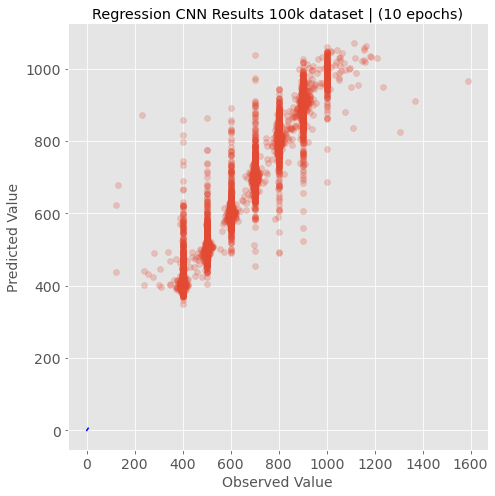

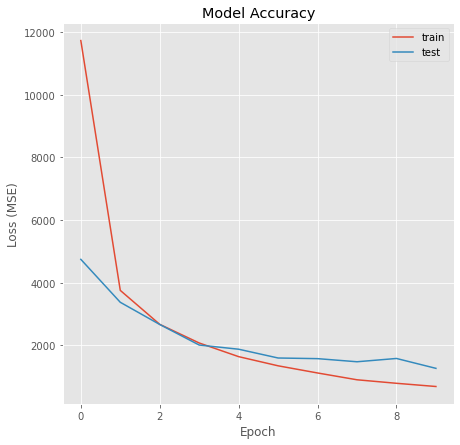

In [25]:
# path to image dataset
dir = '/Users/kaelynnrose/Saved_Documents/Documents/GALVANIZE/Capstones/Capstone_2/images/big_data_random/waves_long'

# run the model using CNN regression to predict the p-wave arrival time
model_cnn_rp = SeismicCNN('regression','p_arrival_sample',60000,full_csv,dir);
model_cnn_rp.train_test_split(test_size=0.25,random_state=44)
model_cnn_rp.regression_cnn('p_arrival_sample',10)
model_cnn_rp.evaluate_regression_model()

The number of all traces in the directory including noise is 100000
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working on trace 

Working on trace # 384
Working on trace # 385
Working on trace # 386
Working on trace # 387
Working on trace # 388
Working on trace # 389
Working on trace # 390
Working on trace # 391
Working on trace # 392
Working on trace # 393
Working on trace # 394
Working on trace # 395
Working on trace # 396
Working on trace # 397
Working on trace # 398
Working on trace # 399
Working on trace # 400
Working on trace # 401
Working on trace # 402
Working on trace # 403
Working on trace # 404
Working on trace # 405
Working on trace # 406
Working on trace # 407
Working on trace # 408
Working on trace # 409
Working on trace # 410
Working on trace # 411
Working on trace # 412
Working on trace # 413
Working on trace # 414
Working on trace # 415
Working on trace # 416
Working on trace # 417
Working on trace # 418
Working on trace # 419
Working on trace # 420
Working on trace # 421
Working on trace # 422
Working on trace # 423
Working on trace # 424
Working on trace # 425
Working on trace # 426
Working on 

Working on trace # 757
Working on trace # 758
Working on trace # 759
Working on trace # 760
Working on trace # 761
Working on trace # 762
Working on trace # 763
Working on trace # 764
Working on trace # 765
Working on trace # 766
Working on trace # 767
Working on trace # 768
Working on trace # 769
Working on trace # 770
Working on trace # 771
Working on trace # 772
Working on trace # 773
Working on trace # 774
Working on trace # 775
Working on trace # 776
Working on trace # 777
Working on trace # 778
Working on trace # 779
Working on trace # 780
Working on trace # 781
Working on trace # 782
Working on trace # 783
Working on trace # 784
Working on trace # 785
Working on trace # 786
Working on trace # 787
Working on trace # 788
Working on trace # 789
Working on trace # 790
Working on trace # 791
Working on trace # 792
Working on trace # 793
Working on trace # 794
Working on trace # 795
Working on trace # 796
Working on trace # 797
Working on trace # 798
Working on trace # 799
Working on 

Working on trace # 1146
Working on trace # 1147
Working on trace # 1148
Working on trace # 1149
Working on trace # 1150
Working on trace # 1151
Working on trace # 1152
Working on trace # 1153
Working on trace # 1154
Working on trace # 1155
Working on trace # 1156
Working on trace # 1157
Working on trace # 1158
Working on trace # 1159
Working on trace # 1160
Working on trace # 1161
Working on trace # 1162
Working on trace # 1163
Working on trace # 1164
Working on trace # 1165
Working on trace # 1166
Working on trace # 1167
Working on trace # 1168
Working on trace # 1169
Working on trace # 1170
Working on trace # 1171
Working on trace # 1172
Working on trace # 1173
Working on trace # 1174
Working on trace # 1175
Working on trace # 1176
Working on trace # 1177
Working on trace # 1178
Working on trace # 1179
Working on trace # 1180
Working on trace # 1181
Working on trace # 1182
Working on trace # 1183
Working on trace # 1184
Working on trace # 1185
Working on trace # 1186
Working on trace

Working on trace # 1557
Working on trace # 1558
Working on trace # 1559
Working on trace # 1560
Working on trace # 1561
Working on trace # 1562
Working on trace # 1563
Working on trace # 1564
Working on trace # 1565
Working on trace # 1566
Working on trace # 1567
Working on trace # 1568
Working on trace # 1569
Working on trace # 1570
Working on trace # 1571
Working on trace # 1572
Working on trace # 1573
Working on trace # 1574
Working on trace # 1575
Working on trace # 1576
Working on trace # 1577
Working on trace # 1578
Working on trace # 1579
Working on trace # 1580
Working on trace # 1581
Working on trace # 1582
Working on trace # 1583
Working on trace # 1584
Working on trace # 1585
Working on trace # 1586
Working on trace # 1587
Working on trace # 1588
Working on trace # 1589
Working on trace # 1590
Working on trace # 1591
Working on trace # 1592
Working on trace # 1593
Working on trace # 1594
Working on trace # 1595
Working on trace # 1596
Working on trace # 1597
Working on trace

Working on trace # 1992
Working on trace # 1993
Working on trace # 1994
Working on trace # 1995
Working on trace # 1996
Working on trace # 1997
Working on trace # 1998
Working on trace # 1999
Working on trace # 2000
Working on trace # 2001
Working on trace # 2002
Working on trace # 2003
Working on trace # 2004
Working on trace # 2005
Working on trace # 2006
Working on trace # 2007
Working on trace # 2008
Working on trace # 2009
Working on trace # 2010
Working on trace # 2011
Working on trace # 2012
Working on trace # 2013
Working on trace # 2014
Working on trace # 2015
Working on trace # 2016
Working on trace # 2017
Working on trace # 2018
Working on trace # 2019
Working on trace # 2020
Working on trace # 2021
Working on trace # 2022
Working on trace # 2023
Working on trace # 2024
Working on trace # 2025
Working on trace # 2026
Working on trace # 2027
Working on trace # 2028
Working on trace # 2029
Working on trace # 2030
Working on trace # 2031
Working on trace # 2032
Working on trace

Working on trace # 2436
Working on trace # 2437
Working on trace # 2438
Working on trace # 2439
Working on trace # 2440
Working on trace # 2441
Working on trace # 2442
Working on trace # 2443
Working on trace # 2444
Working on trace # 2445
Working on trace # 2446
Working on trace # 2447
Working on trace # 2448
Working on trace # 2449
Working on trace # 2450
Working on trace # 2451
Working on trace # 2452
Working on trace # 2453
Working on trace # 2454
Working on trace # 2455
Working on trace # 2456
Working on trace # 2457
Working on trace # 2458
Working on trace # 2459
Working on trace # 2460
Working on trace # 2461
Working on trace # 2462
Working on trace # 2463
Working on trace # 2464
Working on trace # 2465
Working on trace # 2466
Working on trace # 2467
Working on trace # 2468
Working on trace # 2469
Working on trace # 2470
Working on trace # 2471
Working on trace # 2472
Working on trace # 2473
Working on trace # 2474
Working on trace # 2475
Working on trace # 2476
Working on trace

Working on trace # 2897
Working on trace # 2898
Working on trace # 2899
Working on trace # 2900
Working on trace # 2901
Working on trace # 2902
Working on trace # 2903
Working on trace # 2904
Working on trace # 2905
Working on trace # 2906
Working on trace # 2907
Working on trace # 2908
Working on trace # 2909
Working on trace # 2910
Working on trace # 2911
Working on trace # 2912
Working on trace # 2913
Working on trace # 2914
Working on trace # 2915
Working on trace # 2916
Working on trace # 2917
Working on trace # 2918
Working on trace # 2919
Working on trace # 2920
Working on trace # 2921
Working on trace # 2922
Working on trace # 2923
Working on trace # 2924
Working on trace # 2925
Working on trace # 2926
Working on trace # 2927
Working on trace # 2928
Working on trace # 2929
Working on trace # 2930
Working on trace # 2931
Working on trace # 2932
Working on trace # 2933
Working on trace # 2934
Working on trace # 2935
Working on trace # 2936
Working on trace # 2937
Working on trace

Working on trace # 3365
Working on trace # 3366
Working on trace # 3367
Working on trace # 3368
Working on trace # 3369
Working on trace # 3370
Working on trace # 3371
Working on trace # 3372
Working on trace # 3373
Working on trace # 3374
Working on trace # 3375
Working on trace # 3376
Working on trace # 3377
Working on trace # 3378
Working on trace # 3379
Working on trace # 3380
Working on trace # 3381
Working on trace # 3382
Working on trace # 3383
Working on trace # 3384
Working on trace # 3385
Working on trace # 3386
Working on trace # 3387
Working on trace # 3388
Working on trace # 3389
Working on trace # 3390
Working on trace # 3391
Working on trace # 3392
Working on trace # 3393
Working on trace # 3394
Working on trace # 3395
Working on trace # 3396
Working on trace # 3397
Working on trace # 3398
Working on trace # 3399
Working on trace # 3400
Working on trace # 3401
Working on trace # 3402
Working on trace # 3403
Working on trace # 3404
Working on trace # 3405
Working on trace

Working on trace # 3841
Working on trace # 3842
Working on trace # 3843
Working on trace # 3844
Working on trace # 3845
Working on trace # 3846
Working on trace # 3847
Working on trace # 3848
Working on trace # 3849
Working on trace # 3850
Working on trace # 3851
Working on trace # 3852
Working on trace # 3853
Working on trace # 3854
Working on trace # 3855
Working on trace # 3856
Working on trace # 3857
Working on trace # 3858
Working on trace # 3859
Working on trace # 3860
Working on trace # 3861
Working on trace # 3862
Working on trace # 3863
Working on trace # 3864
Working on trace # 3865
Working on trace # 3866
Working on trace # 3867
Working on trace # 3868
Working on trace # 3869
Working on trace # 3870
Working on trace # 3871
Working on trace # 3872
Working on trace # 3873
Working on trace # 3874
Working on trace # 3875
Working on trace # 3876
Working on trace # 3877
Working on trace # 3878
Working on trace # 3879
Working on trace # 3880
Working on trace # 3881
Working on trace

Working on trace # 4315
Working on trace # 4316
Working on trace # 4317
Working on trace # 4318
Working on trace # 4319
Working on trace # 4320
Working on trace # 4321
Working on trace # 4322
Working on trace # 4323
Working on trace # 4324
Working on trace # 4325
Working on trace # 4326
Working on trace # 4327
Working on trace # 4328
Working on trace # 4329
Working on trace # 4330
Working on trace # 4331
Working on trace # 4332
Working on trace # 4333
Working on trace # 4334
Working on trace # 4335
Working on trace # 4336
Working on trace # 4337
Working on trace # 4338
Working on trace # 4339
Working on trace # 4340
Working on trace # 4341
Working on trace # 4342
Working on trace # 4343
Working on trace # 4344
Working on trace # 4345
Working on trace # 4346
Working on trace # 4347
Working on trace # 4348
Working on trace # 4349
Working on trace # 4350
Working on trace # 4351
Working on trace # 4352
Working on trace # 4353
Working on trace # 4354
Working on trace # 4355
Working on trace

Working on trace # 4793
Working on trace # 4794
Working on trace # 4795
Working on trace # 4796
Working on trace # 4797
Working on trace # 4798
Working on trace # 4799
Working on trace # 4800
Working on trace # 4801
Working on trace # 4802
Working on trace # 4803
Working on trace # 4804
Working on trace # 4805
Working on trace # 4806
Working on trace # 4807
Working on trace # 4808
Working on trace # 4809
Working on trace # 4810
Working on trace # 4811
Working on trace # 4812
Working on trace # 4813
Working on trace # 4814
Working on trace # 4815
Working on trace # 4816
Working on trace # 4817
Working on trace # 4818
Working on trace # 4819
Working on trace # 4820
Working on trace # 4821
Working on trace # 4822
Working on trace # 4823
Working on trace # 4824
Working on trace # 4825
Working on trace # 4826
Working on trace # 4827
Working on trace # 4828
Working on trace # 4829
Working on trace # 4830
Working on trace # 4831
Working on trace # 4832
Working on trace # 4833
Working on trace

Working on trace # 5266
Working on trace # 5267
Working on trace # 5268
Working on trace # 5269
Working on trace # 5270
Working on trace # 5271
Working on trace # 5272
Working on trace # 5273
Working on trace # 5274
Working on trace # 5275
Working on trace # 5276
Working on trace # 5277
Working on trace # 5278
Working on trace # 5279
Working on trace # 5280
Working on trace # 5281
Working on trace # 5282
Working on trace # 5283
Working on trace # 5284
Working on trace # 5285
Working on trace # 5286
Working on trace # 5287
Working on trace # 5288
Working on trace # 5289
Working on trace # 5290
Working on trace # 5291
Working on trace # 5292
Working on trace # 5293
Working on trace # 5294
Working on trace # 5295
Working on trace # 5296
Working on trace # 5297
Working on trace # 5298
Working on trace # 5299
Working on trace # 5300
Working on trace # 5301
Working on trace # 5302
Working on trace # 5303
Working on trace # 5304
Working on trace # 5305
Working on trace # 5306
Working on trace

Working on trace # 5733
Working on trace # 5734
Working on trace # 5735
Working on trace # 5736
Working on trace # 5737
Working on trace # 5738
Working on trace # 5739
Working on trace # 5740
Working on trace # 5741
Working on trace # 5742
Working on trace # 5743
Working on trace # 5744
Working on trace # 5745
Working on trace # 5746
Working on trace # 5747
Working on trace # 5748
Working on trace # 5749
Working on trace # 5750
Working on trace # 5751
Working on trace # 5752
Working on trace # 5753
Working on trace # 5754
Working on trace # 5755
Working on trace # 5756
Working on trace # 5757
Working on trace # 5758
Working on trace # 5759
Working on trace # 5760
Working on trace # 5761
Working on trace # 5762
Working on trace # 5763
Working on trace # 5764
Working on trace # 5765
Working on trace # 5766
Working on trace # 5767
Working on trace # 5768
Working on trace # 5769
Working on trace # 5770
Working on trace # 5771
Working on trace # 5772
Working on trace # 5773
Working on trace

Working on trace # 6206
Working on trace # 6207
Working on trace # 6208
Working on trace # 6209
Working on trace # 6210
Working on trace # 6211
Working on trace # 6212
Working on trace # 6213
Working on trace # 6214
Working on trace # 6215
Working on trace # 6216
Working on trace # 6217
Working on trace # 6218
Working on trace # 6219
Working on trace # 6220
Working on trace # 6221
Working on trace # 6222
Working on trace # 6223
Working on trace # 6224
Working on trace # 6225
Working on trace # 6226
Working on trace # 6227
Working on trace # 6228
Working on trace # 6229
Working on trace # 6230
Working on trace # 6231
Working on trace # 6232
Working on trace # 6233
Working on trace # 6234
Working on trace # 6235
Working on trace # 6236
Working on trace # 6237
Working on trace # 6238
Working on trace # 6239
Working on trace # 6240
Working on trace # 6241
Working on trace # 6242
Working on trace # 6243
Working on trace # 6244
Working on trace # 6245
Working on trace # 6246
Working on trace

Working on trace # 6667
Working on trace # 6668
Working on trace # 6669
Working on trace # 6670
Working on trace # 6671
Working on trace # 6672
Working on trace # 6673
Working on trace # 6674
Working on trace # 6675
Working on trace # 6676
Working on trace # 6677
Working on trace # 6678
Working on trace # 6679
Working on trace # 6680
Working on trace # 6681
Working on trace # 6682
Working on trace # 6683
Working on trace # 6684
Working on trace # 6685
Working on trace # 6686
Working on trace # 6687
Working on trace # 6688
Working on trace # 6689
Working on trace # 6690
Working on trace # 6691
Working on trace # 6692
Working on trace # 6693
Working on trace # 6694
Working on trace # 6695
Working on trace # 6696
Working on trace # 6697
Working on trace # 6698
Working on trace # 6699
Working on trace # 6700
Working on trace # 6701
Working on trace # 6702
Working on trace # 6703
Working on trace # 6704
Working on trace # 6705
Working on trace # 6706
Working on trace # 6707
Working on trace

Working on trace # 7128
Working on trace # 7129
Working on trace # 7130
Working on trace # 7131
Working on trace # 7132
Working on trace # 7133
Working on trace # 7134
Working on trace # 7135
Working on trace # 7136
Working on trace # 7137
Working on trace # 7138
Working on trace # 7139
Working on trace # 7140
Working on trace # 7141
Working on trace # 7142
Working on trace # 7143
Working on trace # 7144
Working on trace # 7145
Working on trace # 7146
Working on trace # 7147
Working on trace # 7148
Working on trace # 7149
Working on trace # 7150
Working on trace # 7151
Working on trace # 7152
Working on trace # 7153
Working on trace # 7154
Working on trace # 7155
Working on trace # 7156
Working on trace # 7157
Working on trace # 7158
Working on trace # 7159
Working on trace # 7160
Working on trace # 7161
Working on trace # 7162
Working on trace # 7163
Working on trace # 7164
Working on trace # 7165
Working on trace # 7166
Working on trace # 7167
Working on trace # 7168
Working on trace

Working on trace # 7609
Working on trace # 7610
Working on trace # 7611
Working on trace # 7612
Working on trace # 7613
Working on trace # 7614
Working on trace # 7615
Working on trace # 7616
Working on trace # 7617
Working on trace # 7618
Working on trace # 7619
Working on trace # 7620
Working on trace # 7621
Working on trace # 7622
Working on trace # 7623
Working on trace # 7624
Working on trace # 7625
Working on trace # 7626
Working on trace # 7627
Working on trace # 7628
Working on trace # 7629
Working on trace # 7630
Working on trace # 7631
Working on trace # 7632
Working on trace # 7633
Working on trace # 7634
Working on trace # 7635
Working on trace # 7636
Working on trace # 7637
Working on trace # 7638
Working on trace # 7639
Working on trace # 7640
Working on trace # 7641
Working on trace # 7642
Working on trace # 7643
Working on trace # 7644
Working on trace # 7645
Working on trace # 7646
Working on trace # 7647
Working on trace # 7648
Working on trace # 7649
Working on trace

Working on trace # 8085
Working on trace # 8086
Working on trace # 8087
Working on trace # 8088
Working on trace # 8089
Working on trace # 8090
Working on trace # 8091
Working on trace # 8092
Working on trace # 8093
Working on trace # 8094
Working on trace # 8095
Working on trace # 8096
Working on trace # 8097
Working on trace # 8098
Working on trace # 8099
Working on trace # 8100
Working on trace # 8101
Working on trace # 8102
Working on trace # 8103
Working on trace # 8104
Working on trace # 8105
Working on trace # 8106
Working on trace # 8107
Working on trace # 8108
Working on trace # 8109
Working on trace # 8110
Working on trace # 8111
Working on trace # 8112
Working on trace # 8113
Working on trace # 8114
Working on trace # 8115
Working on trace # 8116
Working on trace # 8117
Working on trace # 8118
Working on trace # 8119
Working on trace # 8120
Working on trace # 8121
Working on trace # 8122
Working on trace # 8123
Working on trace # 8124
Working on trace # 8125
Working on trace

Working on trace # 8554
Working on trace # 8555
Working on trace # 8556
Working on trace # 8557
Working on trace # 8558
Working on trace # 8559
Working on trace # 8560
Working on trace # 8561
Working on trace # 8562
Working on trace # 8563
Working on trace # 8564
Working on trace # 8565
Working on trace # 8566
Working on trace # 8567
Working on trace # 8568
Working on trace # 8569
Working on trace # 8570
Working on trace # 8571
Working on trace # 8572
Working on trace # 8573
Working on trace # 8574
Working on trace # 8575
Working on trace # 8576
Working on trace # 8577
Working on trace # 8578
Working on trace # 8579
Working on trace # 8580
Working on trace # 8581
Working on trace # 8582
Working on trace # 8583
Working on trace # 8584
Working on trace # 8585
Working on trace # 8586
Working on trace # 8587
Working on trace # 8588
Working on trace # 8589
Working on trace # 8590
Working on trace # 8591
Working on trace # 8592
Working on trace # 8593
Working on trace # 8594
Working on trace

Working on trace # 9016
Working on trace # 9017
Working on trace # 9018
Working on trace # 9019
Working on trace # 9020
Working on trace # 9021
Working on trace # 9022
Working on trace # 9023
Working on trace # 9024
Working on trace # 9025
Working on trace # 9026
Working on trace # 9027
Working on trace # 9028
Working on trace # 9029
Working on trace # 9030
Working on trace # 9031
Working on trace # 9032
Working on trace # 9033
Working on trace # 9034
Working on trace # 9035
Working on trace # 9036
Working on trace # 9037
Working on trace # 9038
Working on trace # 9039
Working on trace # 9040
Working on trace # 9041
Working on trace # 9042
Working on trace # 9043
Working on trace # 9044
Working on trace # 9045
Working on trace # 9046
Working on trace # 9047
Working on trace # 9048
Working on trace # 9049
Working on trace # 9050
Working on trace # 9051
Working on trace # 9052
Working on trace # 9053
Working on trace # 9054
Working on trace # 9055
Working on trace # 9056
Working on trace

Working on trace # 9528
Working on trace # 9529
Working on trace # 9530
Working on trace # 9531
Working on trace # 9532
Working on trace # 9533
Working on trace # 9534
Working on trace # 9535
Working on trace # 9536
Working on trace # 9537
Working on trace # 9538
Working on trace # 9539
Working on trace # 9540
Working on trace # 9541
Working on trace # 9542
Working on trace # 9543
Working on trace # 9544
Working on trace # 9545
Working on trace # 9546
Working on trace # 9547
Working on trace # 9548
Working on trace # 9549
Working on trace # 9550
Working on trace # 9551
Working on trace # 9552
Working on trace # 9553
Working on trace # 9554
Working on trace # 9555
Working on trace # 9556
Working on trace # 9557
Working on trace # 9558
Working on trace # 9559
Working on trace # 9560
Working on trace # 9561
Working on trace # 9562
Working on trace # 9563
Working on trace # 9564
Working on trace # 9565
Working on trace # 9566
Working on trace # 9567
Working on trace # 9568
Working on trace

Working on trace # 10022
Working on trace # 10023
Working on trace # 10024
Working on trace # 10025
Working on trace # 10026
Working on trace # 10027
Working on trace # 10028
Working on trace # 10029
Working on trace # 10030
Working on trace # 10031
Working on trace # 10032
Working on trace # 10033
Working on trace # 10034
Working on trace # 10035
Working on trace # 10036
Working on trace # 10037
Working on trace # 10038
Working on trace # 10039
Working on trace # 10040
Working on trace # 10041
Working on trace # 10042
Working on trace # 10043
Working on trace # 10044
Working on trace # 10045
Working on trace # 10046
Working on trace # 10047
Working on trace # 10048
Working on trace # 10049
Working on trace # 10050
Working on trace # 10051
Working on trace # 10052
Working on trace # 10053
Working on trace # 10054
Working on trace # 10055
Working on trace # 10056
Working on trace # 10057
Working on trace # 10058
Working on trace # 10059
Working on trace # 10060
Working on trace # 10061


Working on trace # 10488
Working on trace # 10489
Working on trace # 10490
Working on trace # 10491
Working on trace # 10492
Working on trace # 10493
Working on trace # 10494
Working on trace # 10495
Working on trace # 10496
Working on trace # 10497
Working on trace # 10498
Working on trace # 10499
Working on trace # 10500
Working on trace # 10501
Working on trace # 10502
Working on trace # 10503
Working on trace # 10504
Working on trace # 10505
Working on trace # 10506
Working on trace # 10507
Working on trace # 10508
Working on trace # 10509
Working on trace # 10510
Working on trace # 10511
Working on trace # 10512
Working on trace # 10513
Working on trace # 10514
Working on trace # 10515
Working on trace # 10516
Working on trace # 10517
Working on trace # 10518
Working on trace # 10519
Working on trace # 10520
Working on trace # 10521
Working on trace # 10522
Working on trace # 10523
Working on trace # 10524
Working on trace # 10525
Working on trace # 10526
Working on trace # 10527


Working on trace # 10975
Working on trace # 10976
Working on trace # 10977
Working on trace # 10978
Working on trace # 10979
Working on trace # 10980
Working on trace # 10981
Working on trace # 10982
Working on trace # 10983
Working on trace # 10984
Working on trace # 10985
Working on trace # 10986
Working on trace # 10987
Working on trace # 10988
Working on trace # 10989
Working on trace # 10990
Working on trace # 10991
Working on trace # 10992
Working on trace # 10993
Working on trace # 10994
Working on trace # 10995
Working on trace # 10996
Working on trace # 10997
Working on trace # 10998
Working on trace # 10999
Working on trace # 11000
Working on trace # 11001
Working on trace # 11002
Working on trace # 11003
Working on trace # 11004
Working on trace # 11005
Working on trace # 11006
Working on trace # 11007
Working on trace # 11008
Working on trace # 11009
Working on trace # 11010
Working on trace # 11011
Working on trace # 11012
Working on trace # 11013
Working on trace # 11014


Working on trace # 11452
Working on trace # 11453
Working on trace # 11454
Working on trace # 11455
Working on trace # 11456
Working on trace # 11457
Working on trace # 11458
Working on trace # 11459
Working on trace # 11460
Working on trace # 11461
Working on trace # 11462
Working on trace # 11463
Working on trace # 11464
Working on trace # 11465
Working on trace # 11466
Working on trace # 11467
Working on trace # 11468
Working on trace # 11469
Working on trace # 11470
Working on trace # 11471
Working on trace # 11472
Working on trace # 11473
Working on trace # 11474
Working on trace # 11475
Working on trace # 11476
Working on trace # 11477
Working on trace # 11478
Working on trace # 11479
Working on trace # 11480
Working on trace # 11481
Working on trace # 11482
Working on trace # 11483
Working on trace # 11484
Working on trace # 11485
Working on trace # 11486
Working on trace # 11487
Working on trace # 11488
Working on trace # 11489
Working on trace # 11490
Working on trace # 11491


Working on trace # 11920
Working on trace # 11921
Working on trace # 11922
Working on trace # 11923
Working on trace # 11924
Working on trace # 11925
Working on trace # 11926
Working on trace # 11927
Working on trace # 11928
Working on trace # 11929
Working on trace # 11930
Working on trace # 11931
Working on trace # 11932
Working on trace # 11933
Working on trace # 11934
Working on trace # 11935
Working on trace # 11936
Working on trace # 11937
Working on trace # 11938
Working on trace # 11939
Working on trace # 11940
Working on trace # 11941
Working on trace # 11942
Working on trace # 11943
Working on trace # 11944
Working on trace # 11945
Working on trace # 11946
Working on trace # 11947
Working on trace # 11948
Working on trace # 11949
Working on trace # 11950
Working on trace # 11951
Working on trace # 11952
Working on trace # 11953
Working on trace # 11954
Working on trace # 11955
Working on trace # 11956
Working on trace # 11957
Working on trace # 11958
Working on trace # 11959


Working on trace # 12340
Working on trace # 12341
Working on trace # 12342
Working on trace # 12343
Working on trace # 12344
Working on trace # 12345
Working on trace # 12346
Working on trace # 12347
Working on trace # 12348
Working on trace # 12349
Working on trace # 12350
Working on trace # 12351
Working on trace # 12352
Working on trace # 12353
Working on trace # 12354
Working on trace # 12355
Working on trace # 12356
Working on trace # 12357
Working on trace # 12358
Working on trace # 12359
Working on trace # 12360
Working on trace # 12361
Working on trace # 12362
Working on trace # 12363
Working on trace # 12364
Working on trace # 12365
Working on trace # 12366
Working on trace # 12367
Working on trace # 12368
Working on trace # 12369
Working on trace # 12370
Working on trace # 12371
Working on trace # 12372
Working on trace # 12373
Working on trace # 12374
Working on trace # 12375
Working on trace # 12376
Working on trace # 12377
Working on trace # 12378
Working on trace # 12379


Working on trace # 12761
Working on trace # 12762
Working on trace # 12763
Working on trace # 12764
Working on trace # 12765
Working on trace # 12766
Working on trace # 12767
Working on trace # 12768
Working on trace # 12769
Working on trace # 12770
Working on trace # 12771
Working on trace # 12772
Working on trace # 12773
Working on trace # 12774
Working on trace # 12775
Working on trace # 12776
Working on trace # 12777
Working on trace # 12778
Working on trace # 12779
Working on trace # 12780
Working on trace # 12781
Working on trace # 12782
Working on trace # 12783
Working on trace # 12784
Working on trace # 12785
Working on trace # 12786
Working on trace # 12787
Working on trace # 12788
Working on trace # 12789
Working on trace # 12790
Working on trace # 12791
Working on trace # 12792
Working on trace # 12793
Working on trace # 12794
Working on trace # 12795
Working on trace # 12796
Working on trace # 12797
Working on trace # 12798
Working on trace # 12799
Working on trace # 12800


Working on trace # 13209
Working on trace # 13210
Working on trace # 13211
Working on trace # 13212
Working on trace # 13213
Working on trace # 13214
Working on trace # 13215
Working on trace # 13216
Working on trace # 13217
Working on trace # 13218
Working on trace # 13219
Working on trace # 13220
Working on trace # 13221
Working on trace # 13222
Working on trace # 13223
Working on trace # 13224
Working on trace # 13225
Working on trace # 13226
Working on trace # 13227
Working on trace # 13228
Working on trace # 13229
Working on trace # 13230
Working on trace # 13231
Working on trace # 13232
Working on trace # 13233
Working on trace # 13234
Working on trace # 13235
Working on trace # 13236
Working on trace # 13237
Working on trace # 13238
Working on trace # 13239
Working on trace # 13240
Working on trace # 13241
Working on trace # 13242
Working on trace # 13243
Working on trace # 13244
Working on trace # 13245
Working on trace # 13246
Working on trace # 13247
Working on trace # 13248


Working on trace # 13661
Working on trace # 13662
Working on trace # 13663
Working on trace # 13664
Working on trace # 13665
Working on trace # 13666
Working on trace # 13667
Working on trace # 13668
Working on trace # 13669
Working on trace # 13670
Working on trace # 13671
Working on trace # 13672
Working on trace # 13673
Working on trace # 13674
Working on trace # 13675
Working on trace # 13676
Working on trace # 13677
Working on trace # 13678
Working on trace # 13679
Working on trace # 13680
Working on trace # 13681
Working on trace # 13682
Working on trace # 13683
Working on trace # 13684
Working on trace # 13685
Working on trace # 13686
Working on trace # 13687
Working on trace # 13688
Working on trace # 13689
Working on trace # 13690
Working on trace # 13691
Working on trace # 13692
Working on trace # 13693
Working on trace # 13694
Working on trace # 13695
Working on trace # 13696
Working on trace # 13697
Working on trace # 13698
Working on trace # 13699
Working on trace # 13700


Working on trace # 14139
Working on trace # 14140
Working on trace # 14141
Working on trace # 14142
Working on trace # 14143
Working on trace # 14144
Working on trace # 14145
Working on trace # 14146
Working on trace # 14147
Working on trace # 14148
Working on trace # 14149
Working on trace # 14150
Working on trace # 14151
Working on trace # 14152
Working on trace # 14153
Working on trace # 14154
Working on trace # 14155
Working on trace # 14156
Working on trace # 14157
Working on trace # 14158
Working on trace # 14159
Working on trace # 14160
Working on trace # 14161
Working on trace # 14162
Working on trace # 14163
Working on trace # 14164
Working on trace # 14165
Working on trace # 14166
Working on trace # 14167
Working on trace # 14168
Working on trace # 14169
Working on trace # 14170
Working on trace # 14171
Working on trace # 14172
Working on trace # 14173
Working on trace # 14174
Working on trace # 14175
Working on trace # 14176
Working on trace # 14177
Working on trace # 14178


Working on trace # 14603
Working on trace # 14604
Working on trace # 14605
Working on trace # 14606
Working on trace # 14607
Working on trace # 14608
Working on trace # 14609
Working on trace # 14610
Working on trace # 14611
Working on trace # 14612
Working on trace # 14613
Working on trace # 14614
Working on trace # 14615
Working on trace # 14616
Working on trace # 14617
Working on trace # 14618
Working on trace # 14619
Working on trace # 14620
Working on trace # 14621
Working on trace # 14622
Working on trace # 14623
Working on trace # 14624
Working on trace # 14625
Working on trace # 14626
Working on trace # 14627
Working on trace # 14628
Working on trace # 14629
Working on trace # 14630
Working on trace # 14631
Working on trace # 14632
Working on trace # 14633
Working on trace # 14634
Working on trace # 14635
Working on trace # 14636
Working on trace # 14637
Working on trace # 14638
Working on trace # 14639
Working on trace # 14640
Working on trace # 14641
Working on trace # 14642


Working on trace # 15061
Working on trace # 15062
Working on trace # 15063
Working on trace # 15064
Working on trace # 15065
Working on trace # 15066
Working on trace # 15067
Working on trace # 15068
Working on trace # 15069
Working on trace # 15070
Working on trace # 15071
Working on trace # 15072
Working on trace # 15073
Working on trace # 15074
Working on trace # 15075
Working on trace # 15076
Working on trace # 15077
Working on trace # 15078
Working on trace # 15079
Working on trace # 15080
Working on trace # 15081
Working on trace # 15082
Working on trace # 15083
Working on trace # 15084
Working on trace # 15085
Working on trace # 15086
Working on trace # 15087
Working on trace # 15088
Working on trace # 15089
Working on trace # 15090
Working on trace # 15091
Working on trace # 15092
Working on trace # 15093
Working on trace # 15094
Working on trace # 15095
Working on trace # 15096
Working on trace # 15097
Working on trace # 15098
Working on trace # 15099
Working on trace # 15100


Working on trace # 15512
Working on trace # 15513
Working on trace # 15514
Working on trace # 15515
Working on trace # 15516
Working on trace # 15517
Working on trace # 15518
Working on trace # 15519
Working on trace # 15520
Working on trace # 15521
Working on trace # 15522
Working on trace # 15523
Working on trace # 15524
Working on trace # 15525
Working on trace # 15526
Working on trace # 15527
Working on trace # 15528
Working on trace # 15529
Working on trace # 15530
Working on trace # 15531
Working on trace # 15532
Working on trace # 15533
Working on trace # 15534
Working on trace # 15535
Working on trace # 15536
Working on trace # 15537
Working on trace # 15538
Working on trace # 15539
Working on trace # 15540
Working on trace # 15541
Working on trace # 15542
Working on trace # 15543
Working on trace # 15544
Working on trace # 15545
Working on trace # 15546
Working on trace # 15547
Working on trace # 15548
Working on trace # 15549
Working on trace # 15550
Working on trace # 15551


Working on trace # 15964
Working on trace # 15965
Working on trace # 15966
Working on trace # 15967
Working on trace # 15968
Working on trace # 15969
Working on trace # 15970
Working on trace # 15971
Working on trace # 15972
Working on trace # 15973
Working on trace # 15974
Working on trace # 15975
Working on trace # 15976
Working on trace # 15977
Working on trace # 15978
Working on trace # 15979
Working on trace # 15980
Working on trace # 15981
Working on trace # 15982
Working on trace # 15983
Working on trace # 15984
Working on trace # 15985
Working on trace # 15986
Working on trace # 15987
Working on trace # 15988
Working on trace # 15989
Working on trace # 15990
Working on trace # 15991
Working on trace # 15992
Working on trace # 15993
Working on trace # 15994
Working on trace # 15995
Working on trace # 15996
Working on trace # 15997
Working on trace # 15998
Working on trace # 15999
Working on trace # 16000
Working on trace # 16001
Working on trace # 16002
Working on trace # 16003


Working on trace # 16437
Working on trace # 16438
Working on trace # 16439
Working on trace # 16440
Working on trace # 16441
Working on trace # 16442
Working on trace # 16443
Working on trace # 16444
Working on trace # 16445
Working on trace # 16446
Working on trace # 16447
Working on trace # 16448
Working on trace # 16449
Working on trace # 16450
Working on trace # 16451
Working on trace # 16452
Working on trace # 16453
Working on trace # 16454
Working on trace # 16455
Working on trace # 16456
Working on trace # 16457
Working on trace # 16458
Working on trace # 16459
Working on trace # 16460
Working on trace # 16461
Working on trace # 16462
Working on trace # 16463
Working on trace # 16464
Working on trace # 16465
Working on trace # 16466
Working on trace # 16467
Working on trace # 16468
Working on trace # 16469
Working on trace # 16470
Working on trace # 16471
Working on trace # 16472
Working on trace # 16473
Working on trace # 16474
Working on trace # 16475
Working on trace # 16476


Working on trace # 16881
Working on trace # 16882
Working on trace # 16883
Working on trace # 16884
Working on trace # 16885
Working on trace # 16886
Working on trace # 16887
Working on trace # 16888
Working on trace # 16889
Working on trace # 16890
Working on trace # 16891
Working on trace # 16892
Working on trace # 16893
Working on trace # 16894
Working on trace # 16895
Working on trace # 16896
Working on trace # 16897
Working on trace # 16898
Working on trace # 16899
Working on trace # 16900
Working on trace # 16901
Working on trace # 16902
Working on trace # 16903
Working on trace # 16904
Working on trace # 16905
Working on trace # 16906
Working on trace # 16907
Working on trace # 16908
Working on trace # 16909
Working on trace # 16910
Working on trace # 16911
Working on trace # 16912
Working on trace # 16913
Working on trace # 16914
Working on trace # 16915
Working on trace # 16916
Working on trace # 16917
Working on trace # 16918
Working on trace # 16919
Working on trace # 16920


Working on trace # 17337
Working on trace # 17338
Working on trace # 17339
Working on trace # 17340
Working on trace # 17341
Working on trace # 17342
Working on trace # 17343
Working on trace # 17344
Working on trace # 17345
Working on trace # 17346
Working on trace # 17347
Working on trace # 17348
Working on trace # 17349
Working on trace # 17350
Working on trace # 17351
Working on trace # 17352
Working on trace # 17353
Working on trace # 17354
Working on trace # 17355
Working on trace # 17356
Working on trace # 17357
Working on trace # 17358
Working on trace # 17359
Working on trace # 17360
Working on trace # 17361
Working on trace # 17362
Working on trace # 17363
Working on trace # 17364
Working on trace # 17365
Working on trace # 17366
Working on trace # 17367
Working on trace # 17368
Working on trace # 17369
Working on trace # 17370
Working on trace # 17371
Working on trace # 17372
Working on trace # 17373
Working on trace # 17374
Working on trace # 17375
Working on trace # 17376


Working on trace # 17781
Working on trace # 17782
Working on trace # 17783
Working on trace # 17784
Working on trace # 17785
Working on trace # 17786
Working on trace # 17787
Working on trace # 17788
Working on trace # 17789
Working on trace # 17790
Working on trace # 17791
Working on trace # 17792
Working on trace # 17793
Working on trace # 17794
Working on trace # 17795
Working on trace # 17796
Working on trace # 17797
Working on trace # 17798
Working on trace # 17799
Working on trace # 17800
Working on trace # 17801
Working on trace # 17802
Working on trace # 17803
Working on trace # 17804
Working on trace # 17805
Working on trace # 17806
Working on trace # 17807
Working on trace # 17808
Working on trace # 17809
Working on trace # 17810
Working on trace # 17811
Working on trace # 17812
Working on trace # 17813
Working on trace # 17814
Working on trace # 17815
Working on trace # 17816
Working on trace # 17817
Working on trace # 17818
Working on trace # 17819
Working on trace # 17820


Working on trace # 18241
Working on trace # 18242
Working on trace # 18243
Working on trace # 18244
Working on trace # 18245
Working on trace # 18246
Working on trace # 18247
Working on trace # 18248
Working on trace # 18249
Working on trace # 18250
Working on trace # 18251
Working on trace # 18252
Working on trace # 18253
Working on trace # 18254
Working on trace # 18255
Working on trace # 18256
Working on trace # 18257
Working on trace # 18258
Working on trace # 18259
Working on trace # 18260
Working on trace # 18261
Working on trace # 18262
Working on trace # 18263
Working on trace # 18264
Working on trace # 18265
Working on trace # 18266
Working on trace # 18267
Working on trace # 18268
Working on trace # 18269
Working on trace # 18270
Working on trace # 18271
Working on trace # 18272
Working on trace # 18273
Working on trace # 18274
Working on trace # 18275
Working on trace # 18276
Working on trace # 18277
Working on trace # 18278
Working on trace # 18279
Working on trace # 18280


Working on trace # 18730
Working on trace # 18731
Working on trace # 18732
Working on trace # 18733
Working on trace # 18734
Working on trace # 18735
Working on trace # 18736
Working on trace # 18737
Working on trace # 18738
Working on trace # 18739
Working on trace # 18740
Working on trace # 18741
Working on trace # 18742
Working on trace # 18743
Working on trace # 18744
Working on trace # 18745
Working on trace # 18746
Working on trace # 18747
Working on trace # 18748
Working on trace # 18749
Working on trace # 18750
Working on trace # 18751
Working on trace # 18752
Working on trace # 18753
Working on trace # 18754
Working on trace # 18755
Working on trace # 18756
Working on trace # 18757
Working on trace # 18758
Working on trace # 18759
Working on trace # 18760
Working on trace # 18761
Working on trace # 18762
Working on trace # 18763
Working on trace # 18764
Working on trace # 18765
Working on trace # 18766
Working on trace # 18767
Working on trace # 18768
Working on trace # 18769


Working on trace # 19238
Working on trace # 19239
Working on trace # 19240
Working on trace # 19241
Working on trace # 19242
Working on trace # 19243
Working on trace # 19244
Working on trace # 19245
Working on trace # 19246
Working on trace # 19247
Working on trace # 19248
Working on trace # 19249
Working on trace # 19250
Working on trace # 19251
Working on trace # 19252
Working on trace # 19253
Working on trace # 19254
Working on trace # 19255
Working on trace # 19256
Working on trace # 19257
Working on trace # 19258
Working on trace # 19259
Working on trace # 19260
Working on trace # 19261
Working on trace # 19262
Working on trace # 19263
Working on trace # 19264
Working on trace # 19265
Working on trace # 19266
Working on trace # 19267
Working on trace # 19268
Working on trace # 19269
Working on trace # 19270
Working on trace # 19271
Working on trace # 19272
Working on trace # 19273
Working on trace # 19274
Working on trace # 19275
Working on trace # 19276
Working on trace # 19277


Working on trace # 19729
Working on trace # 19730
Working on trace # 19731
Working on trace # 19732
Working on trace # 19733
Working on trace # 19734
Working on trace # 19735
Working on trace # 19736
Working on trace # 19737
Working on trace # 19738
Working on trace # 19739
Working on trace # 19740
Working on trace # 19741
Working on trace # 19742
Working on trace # 19743
Working on trace # 19744
Working on trace # 19745
Working on trace # 19746
Working on trace # 19747
Working on trace # 19748
Working on trace # 19749
Working on trace # 19750
Working on trace # 19751
Working on trace # 19752
Working on trace # 19753
Working on trace # 19754
Working on trace # 19755
Working on trace # 19756
Working on trace # 19757
Working on trace # 19758
Working on trace # 19759
Working on trace # 19760
Working on trace # 19761
Working on trace # 19762
Working on trace # 19763
Working on trace # 19764
Working on trace # 19765
Working on trace # 19766
Working on trace # 19767
Working on trace # 19768


Working on trace # 20222
Working on trace # 20223
Working on trace # 20224
Working on trace # 20225
Working on trace # 20226
Working on trace # 20227
Working on trace # 20228
Working on trace # 20229
Working on trace # 20230
Working on trace # 20231
Working on trace # 20232
Working on trace # 20233
Working on trace # 20234
Working on trace # 20235
Working on trace # 20236
Working on trace # 20237
Working on trace # 20238
Working on trace # 20239
Working on trace # 20240
Working on trace # 20241
Working on trace # 20242
Working on trace # 20243
Working on trace # 20244
Working on trace # 20245
Working on trace # 20246
Working on trace # 20247
Working on trace # 20248
Working on trace # 20249
Working on trace # 20250
Working on trace # 20251
Working on trace # 20252
Working on trace # 20253
Working on trace # 20254
Working on trace # 20255
Working on trace # 20256
Working on trace # 20257
Working on trace # 20258
Working on trace # 20259
Working on trace # 20260
Working on trace # 20261


Working on trace # 20710
Working on trace # 20711
Working on trace # 20712
Working on trace # 20713
Working on trace # 20714
Working on trace # 20715
Working on trace # 20716
Working on trace # 20717
Working on trace # 20718
Working on trace # 20719
Working on trace # 20720
Working on trace # 20721
Working on trace # 20722
Working on trace # 20723
Working on trace # 20724
Working on trace # 20725
Working on trace # 20726
Working on trace # 20727
Working on trace # 20728
Working on trace # 20729
Working on trace # 20730
Working on trace # 20731
Working on trace # 20732
Working on trace # 20733
Working on trace # 20734
Working on trace # 20735
Working on trace # 20736
Working on trace # 20737
Working on trace # 20738
Working on trace # 20739
Working on trace # 20740
Working on trace # 20741
Working on trace # 20742
Working on trace # 20743
Working on trace # 20744
Working on trace # 20745
Working on trace # 20746
Working on trace # 20747
Working on trace # 20748
Working on trace # 20749


Working on trace # 21220
Working on trace # 21221
Working on trace # 21222
Working on trace # 21223
Working on trace # 21224
Working on trace # 21225
Working on trace # 21226
Working on trace # 21227
Working on trace # 21228
Working on trace # 21229
Working on trace # 21230
Working on trace # 21231
Working on trace # 21232
Working on trace # 21233
Working on trace # 21234
Working on trace # 21235
Working on trace # 21236
Working on trace # 21237
Working on trace # 21238
Working on trace # 21239
Working on trace # 21240
Working on trace # 21241
Working on trace # 21242
Working on trace # 21243
Working on trace # 21244
Working on trace # 21245
Working on trace # 21246
Working on trace # 21247
Working on trace # 21248
Working on trace # 21249
Working on trace # 21250
Working on trace # 21251
Working on trace # 21252
Working on trace # 21253
Working on trace # 21254
Working on trace # 21255
Working on trace # 21256
Working on trace # 21257
Working on trace # 21258
Working on trace # 21259


Working on trace # 21716
Working on trace # 21717
Working on trace # 21718
Working on trace # 21719
Working on trace # 21720
Working on trace # 21721
Working on trace # 21722
Working on trace # 21723
Working on trace # 21724
Working on trace # 21725
Working on trace # 21726
Working on trace # 21727
Working on trace # 21728
Working on trace # 21729
Working on trace # 21730
Working on trace # 21731
Working on trace # 21732
Working on trace # 21733
Working on trace # 21734
Working on trace # 21735
Working on trace # 21736
Working on trace # 21737
Working on trace # 21738
Working on trace # 21739
Working on trace # 21740
Working on trace # 21741
Working on trace # 21742
Working on trace # 21743
Working on trace # 21744
Working on trace # 21745
Working on trace # 21746
Working on trace # 21747
Working on trace # 21748
Working on trace # 21749
Working on trace # 21750
Working on trace # 21751
Working on trace # 21752
Working on trace # 21753
Working on trace # 21754
Working on trace # 21755


Working on trace # 22209
Working on trace # 22210
Working on trace # 22211
Working on trace # 22212
Working on trace # 22213
Working on trace # 22214
Working on trace # 22215
Working on trace # 22216
Working on trace # 22217
Working on trace # 22218
Working on trace # 22219
Working on trace # 22220
Working on trace # 22221
Working on trace # 22222
Working on trace # 22223
Working on trace # 22224
Working on trace # 22225
Working on trace # 22226
Working on trace # 22227
Working on trace # 22228
Working on trace # 22229
Working on trace # 22230
Working on trace # 22231
Working on trace # 22232
Working on trace # 22233
Working on trace # 22234
Working on trace # 22235
Working on trace # 22236
Working on trace # 22237
Working on trace # 22238
Working on trace # 22239
Working on trace # 22240
Working on trace # 22241
Working on trace # 22242
Working on trace # 22243
Working on trace # 22244
Working on trace # 22245
Working on trace # 22246
Working on trace # 22247
Working on trace # 22248


Working on trace # 22720
Working on trace # 22721
Working on trace # 22722
Working on trace # 22723
Working on trace # 22724
Working on trace # 22725
Working on trace # 22726
Working on trace # 22727
Working on trace # 22728
Working on trace # 22729
Working on trace # 22730
Working on trace # 22731
Working on trace # 22732
Working on trace # 22733
Working on trace # 22734
Working on trace # 22735
Working on trace # 22736
Working on trace # 22737
Working on trace # 22738
Working on trace # 22739
Working on trace # 22740
Working on trace # 22741
Working on trace # 22742
Working on trace # 22743
Working on trace # 22744
Working on trace # 22745
Working on trace # 22746
Working on trace # 22747
Working on trace # 22748
Working on trace # 22749
Working on trace # 22750
Working on trace # 22751
Working on trace # 22752
Working on trace # 22753
Working on trace # 22754
Working on trace # 22755
Working on trace # 22756
Working on trace # 22757
Working on trace # 22758
Working on trace # 22759


Working on trace # 23216
Working on trace # 23217
Working on trace # 23218
Working on trace # 23219
Working on trace # 23220
Working on trace # 23221
Working on trace # 23222
Working on trace # 23223
Working on trace # 23224
Working on trace # 23225
Working on trace # 23226
Working on trace # 23227
Working on trace # 23228
Working on trace # 23229
Working on trace # 23230
Working on trace # 23231
Working on trace # 23232
Working on trace # 23233
Working on trace # 23234
Working on trace # 23235
Working on trace # 23236
Working on trace # 23237
Working on trace # 23238
Working on trace # 23239
Working on trace # 23240
Working on trace # 23241
Working on trace # 23242
Working on trace # 23243
Working on trace # 23244
Working on trace # 23245
Working on trace # 23246
Working on trace # 23247
Working on trace # 23248
Working on trace # 23249
Working on trace # 23250
Working on trace # 23251
Working on trace # 23252
Working on trace # 23253
Working on trace # 23254
Working on trace # 23255


Working on trace # 23703
Working on trace # 23704
Working on trace # 23705
Working on trace # 23706
Working on trace # 23707
Working on trace # 23708
Working on trace # 23709
Working on trace # 23710
Working on trace # 23711
Working on trace # 23712
Working on trace # 23713
Working on trace # 23714
Working on trace # 23715
Working on trace # 23716
Working on trace # 23717
Working on trace # 23718
Working on trace # 23719
Working on trace # 23720
Working on trace # 23721
Working on trace # 23722
Working on trace # 23723
Working on trace # 23724
Working on trace # 23725
Working on trace # 23726
Working on trace # 23727
Working on trace # 23728
Working on trace # 23729
Working on trace # 23730
Working on trace # 23731
Working on trace # 23732
Working on trace # 23733
Working on trace # 23734
Working on trace # 23735
Working on trace # 23736
Working on trace # 23737
Working on trace # 23738
Working on trace # 23739
Working on trace # 23740
Working on trace # 23741
Working on trace # 23742


Working on trace # 24162
Working on trace # 24163
Working on trace # 24164
Working on trace # 24165
Working on trace # 24166
Working on trace # 24167
Working on trace # 24168
Working on trace # 24169
Working on trace # 24170
Working on trace # 24171
Working on trace # 24172
Working on trace # 24173
Working on trace # 24174
Working on trace # 24175
Working on trace # 24176
Working on trace # 24177
Working on trace # 24178
Working on trace # 24179
Working on trace # 24180
Working on trace # 24181
Working on trace # 24182
Working on trace # 24183
Working on trace # 24184
Working on trace # 24185
Working on trace # 24186
Working on trace # 24187
Working on trace # 24188
Working on trace # 24189
Working on trace # 24190
Working on trace # 24191
Working on trace # 24192
Working on trace # 24193
Working on trace # 24194
Working on trace # 24195
Working on trace # 24196
Working on trace # 24197
Working on trace # 24198
Working on trace # 24199
Working on trace # 24200
Working on trace # 24201


Working on trace # 24612
Working on trace # 24613
Working on trace # 24614
Working on trace # 24615
Working on trace # 24616
Working on trace # 24617
Working on trace # 24618
Working on trace # 24619
Working on trace # 24620
Working on trace # 24621
Working on trace # 24622
Working on trace # 24623
Working on trace # 24624
Working on trace # 24625
Working on trace # 24626
Working on trace # 24627
Working on trace # 24628
Working on trace # 24629
Working on trace # 24630
Working on trace # 24631
Working on trace # 24632
Working on trace # 24633
Working on trace # 24634
Working on trace # 24635
Working on trace # 24636
Working on trace # 24637
Working on trace # 24638
Working on trace # 24639
Working on trace # 24640
Working on trace # 24641
Working on trace # 24642
Working on trace # 24643
Working on trace # 24644
Working on trace # 24645
Working on trace # 24646
Working on trace # 24647
Working on trace # 24648
Working on trace # 24649
Working on trace # 24650
Working on trace # 24651


Working on trace # 25080
Working on trace # 25081
Working on trace # 25082
Working on trace # 25083
Working on trace # 25084
Working on trace # 25085
Working on trace # 25086
Working on trace # 25087
Working on trace # 25088
Working on trace # 25089
Working on trace # 25090
Working on trace # 25091
Working on trace # 25092
Working on trace # 25093
Working on trace # 25094
Working on trace # 25095
Working on trace # 25096
Working on trace # 25097
Working on trace # 25098
Working on trace # 25099
Working on trace # 25100
Working on trace # 25101
Working on trace # 25102
Working on trace # 25103
Working on trace # 25104
Working on trace # 25105
Working on trace # 25106
Working on trace # 25107
Working on trace # 25108
Working on trace # 25109
Working on trace # 25110
Working on trace # 25111
Working on trace # 25112
Working on trace # 25113
Working on trace # 25114
Working on trace # 25115
Working on trace # 25116
Working on trace # 25117
Working on trace # 25118
Working on trace # 25119


Working on trace # 25531
Working on trace # 25532
Working on trace # 25533
Working on trace # 25534
Working on trace # 25535
Working on trace # 25536
Working on trace # 25537
Working on trace # 25538
Working on trace # 25539
Working on trace # 25540
Working on trace # 25541
Working on trace # 25542
Working on trace # 25543
Working on trace # 25544
Working on trace # 25545
Working on trace # 25546
Working on trace # 25547
Working on trace # 25548
Working on trace # 25549
Working on trace # 25550
Working on trace # 25551
Working on trace # 25552
Working on trace # 25553
Working on trace # 25554
Working on trace # 25555
Working on trace # 25556
Working on trace # 25557
Working on trace # 25558
Working on trace # 25559
Working on trace # 25560
Working on trace # 25561
Working on trace # 25562
Working on trace # 25563
Working on trace # 25564
Working on trace # 25565
Working on trace # 25566
Working on trace # 25567
Working on trace # 25568
Working on trace # 25569
Working on trace # 25570


Working on trace # 26004
Working on trace # 26005
Working on trace # 26006
Working on trace # 26007
Working on trace # 26008
Working on trace # 26009
Working on trace # 26010
Working on trace # 26011
Working on trace # 26012
Working on trace # 26013
Working on trace # 26014
Working on trace # 26015
Working on trace # 26016
Working on trace # 26017
Working on trace # 26018
Working on trace # 26019
Working on trace # 26020
Working on trace # 26021
Working on trace # 26022
Working on trace # 26023
Working on trace # 26024
Working on trace # 26025
Working on trace # 26026
Working on trace # 26027
Working on trace # 26028
Working on trace # 26029
Working on trace # 26030
Working on trace # 26031
Working on trace # 26032
Working on trace # 26033
Working on trace # 26034
Working on trace # 26035
Working on trace # 26036
Working on trace # 26037
Working on trace # 26038
Working on trace # 26039
Working on trace # 26040
Working on trace # 26041
Working on trace # 26042
Working on trace # 26043


Working on trace # 26484
Working on trace # 26485
Working on trace # 26486
Working on trace # 26487
Working on trace # 26488
Working on trace # 26489
Working on trace # 26490
Working on trace # 26491
Working on trace # 26492
Working on trace # 26493
Working on trace # 26494
Working on trace # 26495
Working on trace # 26496
Working on trace # 26497
Working on trace # 26498
Working on trace # 26499
Working on trace # 26500
Working on trace # 26501
Working on trace # 26502
Working on trace # 26503
Working on trace # 26504
Working on trace # 26505
Working on trace # 26506
Working on trace # 26507
Working on trace # 26508
Working on trace # 26509
Working on trace # 26510
Working on trace # 26511
Working on trace # 26512
Working on trace # 26513
Working on trace # 26514
Working on trace # 26515
Working on trace # 26516
Working on trace # 26517
Working on trace # 26518
Working on trace # 26519
Working on trace # 26520
Working on trace # 26521
Working on trace # 26522
Working on trace # 26523


Working on trace # 26988
Working on trace # 26989
Working on trace # 26990
Working on trace # 26991
Working on trace # 26992
Working on trace # 26993
Working on trace # 26994
Working on trace # 26995
Working on trace # 26996
Working on trace # 26997
Working on trace # 26998
Working on trace # 26999
Working on trace # 27000
Working on trace # 27001
Working on trace # 27002
Working on trace # 27003
Working on trace # 27004
Working on trace # 27005
Working on trace # 27006
Working on trace # 27007
Working on trace # 27008
Working on trace # 27009
Working on trace # 27010
Working on trace # 27011
Working on trace # 27012
Working on trace # 27013
Working on trace # 27014
Working on trace # 27015
Working on trace # 27016
Working on trace # 27017
Working on trace # 27018
Working on trace # 27019
Working on trace # 27020
Working on trace # 27021
Working on trace # 27022
Working on trace # 27023
Working on trace # 27024
Working on trace # 27025
Working on trace # 27026
Working on trace # 27027


Working on trace # 27478
Working on trace # 27479
Working on trace # 27480
Working on trace # 27481
Working on trace # 27482
Working on trace # 27483
Working on trace # 27484
Working on trace # 27485
Working on trace # 27486
Working on trace # 27487
Working on trace # 27488
Working on trace # 27489
Working on trace # 27490
Working on trace # 27491
Working on trace # 27492
Working on trace # 27493
Working on trace # 27494
Working on trace # 27495
Working on trace # 27496
Working on trace # 27497
Working on trace # 27498
Working on trace # 27499
Working on trace # 27500
Working on trace # 27501
Working on trace # 27502
Working on trace # 27503
Working on trace # 27504
Working on trace # 27505
Working on trace # 27506
Working on trace # 27507
Working on trace # 27508
Working on trace # 27509
Working on trace # 27510
Working on trace # 27511
Working on trace # 27512
Working on trace # 27513
Working on trace # 27514
Working on trace # 27515
Working on trace # 27516
Working on trace # 27517


Working on trace # 27961
Working on trace # 27962
Working on trace # 27963
Working on trace # 27964
Working on trace # 27965
Working on trace # 27966
Working on trace # 27967
Working on trace # 27968
Working on trace # 27969
Working on trace # 27970
Working on trace # 27971
Working on trace # 27972
Working on trace # 27973
Working on trace # 27974
Working on trace # 27975
Working on trace # 27976
Working on trace # 27977
Working on trace # 27978
Working on trace # 27979
Working on trace # 27980
Working on trace # 27981
Working on trace # 27982
Working on trace # 27983
Working on trace # 27984
Working on trace # 27985
Working on trace # 27986
Working on trace # 27987
Working on trace # 27988
Working on trace # 27989
Working on trace # 27990
Working on trace # 27991
Working on trace # 27992
Working on trace # 27993
Working on trace # 27994
Working on trace # 27995
Working on trace # 27996
Working on trace # 27997
Working on trace # 27998
Working on trace # 27999
Working on trace # 28000


Working on trace # 28429
Working on trace # 28430
Working on trace # 28431
Working on trace # 28432
Working on trace # 28433
Working on trace # 28434
Working on trace # 28435
Working on trace # 28436
Working on trace # 28437
Working on trace # 28438
Working on trace # 28439
Working on trace # 28440
Working on trace # 28441
Working on trace # 28442
Working on trace # 28443
Working on trace # 28444
Working on trace # 28445
Working on trace # 28446
Working on trace # 28447
Working on trace # 28448
Working on trace # 28449
Working on trace # 28450
Working on trace # 28451
Working on trace # 28452
Working on trace # 28453
Working on trace # 28454
Working on trace # 28455
Working on trace # 28456
Working on trace # 28457
Working on trace # 28458
Working on trace # 28459
Working on trace # 28460
Working on trace # 28461
Working on trace # 28462
Working on trace # 28463
Working on trace # 28464
Working on trace # 28465
Working on trace # 28466
Working on trace # 28467
Working on trace # 28468


Working on trace # 28928
Working on trace # 28929
Working on trace # 28930
Working on trace # 28931
Working on trace # 28932
Working on trace # 28933
Working on trace # 28934
Working on trace # 28935
Working on trace # 28936
Working on trace # 28937
Working on trace # 28938
Working on trace # 28939
Working on trace # 28940
Working on trace # 28941
Working on trace # 28942
Working on trace # 28943
Working on trace # 28944
Working on trace # 28945
Working on trace # 28946
Working on trace # 28947
Working on trace # 28948
Working on trace # 28949
Working on trace # 28950
Working on trace # 28951
Working on trace # 28952
Working on trace # 28953
Working on trace # 28954
Working on trace # 28955
Working on trace # 28956
Working on trace # 28957
Working on trace # 28958
Working on trace # 28959
Working on trace # 28960
Working on trace # 28961
Working on trace # 28962
Working on trace # 28963
Working on trace # 28964
Working on trace # 28965
Working on trace # 28966
Working on trace # 28967


Working on trace # 29436
Working on trace # 29437
Working on trace # 29438
Working on trace # 29439
Working on trace # 29440
Working on trace # 29441
Working on trace # 29442
Working on trace # 29443
Working on trace # 29444
Working on trace # 29445
Working on trace # 29446
Working on trace # 29447
Working on trace # 29448
Working on trace # 29449
Working on trace # 29450
Working on trace # 29451
Working on trace # 29452
Working on trace # 29453
Working on trace # 29454
Working on trace # 29455
Working on trace # 29456
Working on trace # 29457
Working on trace # 29458
Working on trace # 29459
Working on trace # 29460
Working on trace # 29461
Working on trace # 29462
Working on trace # 29463
Working on trace # 29464
Working on trace # 29465
Working on trace # 29466
Working on trace # 29467
Working on trace # 29468
Working on trace # 29469
Working on trace # 29470
Working on trace # 29471
Working on trace # 29472
Working on trace # 29473
Working on trace # 29474
Working on trace # 29475


Working on trace # 30052
Working on trace # 30053
Working on trace # 30054
Working on trace # 30055
Working on trace # 30056
Working on trace # 30057
Working on trace # 30058
Working on trace # 30059
Working on trace # 30060
Working on trace # 30061
Working on trace # 30062
Working on trace # 30063
Working on trace # 30064
Working on trace # 30065
Working on trace # 30066
Working on trace # 30067
Working on trace # 30068
Working on trace # 30069
Working on trace # 30070
Working on trace # 30071
Working on trace # 30072
Working on trace # 30073
Working on trace # 30074
Working on trace # 30075
Working on trace # 30076
Working on trace # 30077
Working on trace # 30078
Working on trace # 30079
Working on trace # 30080
Working on trace # 30081
Working on trace # 30082
Working on trace # 30083
Working on trace # 30084
Working on trace # 30085
Working on trace # 30086
Working on trace # 30087
Working on trace # 30088
Working on trace # 30089
Working on trace # 30090
Working on trace # 30091


Working on trace # 30668
Working on trace # 30669
Working on trace # 30670
Working on trace # 30671
Working on trace # 30672
Working on trace # 30673
Working on trace # 30674
Working on trace # 30675
Working on trace # 30676
Working on trace # 30677
Working on trace # 30678
Working on trace # 30679
Working on trace # 30680
Working on trace # 30681
Working on trace # 30682
Working on trace # 30683
Working on trace # 30684
Working on trace # 30685
Working on trace # 30686
Working on trace # 30687
Working on trace # 30688
Working on trace # 30689
Working on trace # 30690
Working on trace # 30691
Working on trace # 30692
Working on trace # 30693
Working on trace # 30694
Working on trace # 30695
Working on trace # 30696
Working on trace # 30697
Working on trace # 30698
Working on trace # 30699
Working on trace # 30700
Working on trace # 30701
Working on trace # 30702
Working on trace # 30703
Working on trace # 30704
Working on trace # 30705
Working on trace # 30706
Working on trace # 30707


Working on trace # 31275
Working on trace # 31276
Working on trace # 31277
Working on trace # 31278
Working on trace # 31279
Working on trace # 31280
Working on trace # 31281
Working on trace # 31282
Working on trace # 31283
Working on trace # 31284
Working on trace # 31285
Working on trace # 31286
Working on trace # 31287
Working on trace # 31288
Working on trace # 31289
Working on trace # 31290
Working on trace # 31291
Working on trace # 31292
Working on trace # 31293
Working on trace # 31294
Working on trace # 31295
Working on trace # 31296
Working on trace # 31297
Working on trace # 31298
Working on trace # 31299
Working on trace # 31300
Working on trace # 31301
Working on trace # 31302
Working on trace # 31303
Working on trace # 31304
Working on trace # 31305
Working on trace # 31306
Working on trace # 31307
Working on trace # 31308
Working on trace # 31309
Working on trace # 31310
Working on trace # 31311
Working on trace # 31312
Working on trace # 31313
Working on trace # 31314


Working on trace # 31859
Working on trace # 31860
Working on trace # 31861
Working on trace # 31862
Working on trace # 31863
Working on trace # 31864
Working on trace # 31865
Working on trace # 31866
Working on trace # 31867
Working on trace # 31868
Working on trace # 31869
Working on trace # 31870
Working on trace # 31871
Working on trace # 31872
Working on trace # 31873
Working on trace # 31874
Working on trace # 31875
Working on trace # 31876
Working on trace # 31877
Working on trace # 31878
Working on trace # 31879
Working on trace # 31880
Working on trace # 31881
Working on trace # 31882
Working on trace # 31883
Working on trace # 31884
Working on trace # 31885
Working on trace # 31886
Working on trace # 31887
Working on trace # 31888
Working on trace # 31889
Working on trace # 31890
Working on trace # 31891
Working on trace # 31892
Working on trace # 31893
Working on trace # 31894
Working on trace # 31895
Working on trace # 31896
Working on trace # 31897
Working on trace # 31898


Working on trace # 32419
Working on trace # 32420
Working on trace # 32421
Working on trace # 32422
Working on trace # 32423
Working on trace # 32424
Working on trace # 32425
Working on trace # 32426
Working on trace # 32427
Working on trace # 32428
Working on trace # 32429
Working on trace # 32430
Working on trace # 32431
Working on trace # 32432
Working on trace # 32433
Working on trace # 32434
Working on trace # 32435
Working on trace # 32436
Working on trace # 32437
Working on trace # 32438
Working on trace # 32439
Working on trace # 32440
Working on trace # 32441
Working on trace # 32442
Working on trace # 32443
Working on trace # 32444
Working on trace # 32445
Working on trace # 32446
Working on trace # 32447
Working on trace # 32448
Working on trace # 32449
Working on trace # 32450
Working on trace # 32451
Working on trace # 32452
Working on trace # 32453
Working on trace # 32454
Working on trace # 32455
Working on trace # 32456
Working on trace # 32457
Working on trace # 32458


Working on trace # 32999
Working on trace # 33000
Working on trace # 33001
Working on trace # 33002
Working on trace # 33003
Working on trace # 33004
Working on trace # 33005
Working on trace # 33006
Working on trace # 33007
Working on trace # 33008
Working on trace # 33009
Working on trace # 33010
Working on trace # 33011
Working on trace # 33012
Working on trace # 33013
Working on trace # 33014
Working on trace # 33015
Working on trace # 33016
Working on trace # 33017
Working on trace # 33018
Working on trace # 33019
Working on trace # 33020
Working on trace # 33021
Working on trace # 33022
Working on trace # 33023
Working on trace # 33024
Working on trace # 33025
Working on trace # 33026
Working on trace # 33027
Working on trace # 33028
Working on trace # 33029
Working on trace # 33030
Working on trace # 33031
Working on trace # 33032
Working on trace # 33033
Working on trace # 33034
Working on trace # 33035
Working on trace # 33036
Working on trace # 33037
Working on trace # 33038


Working on trace # 33596
Working on trace # 33597
Working on trace # 33598
Working on trace # 33599
Working on trace # 33600
Working on trace # 33601
Working on trace # 33602
Working on trace # 33603
Working on trace # 33604
Working on trace # 33605
Working on trace # 33606
Working on trace # 33607
Working on trace # 33608
Working on trace # 33609
Working on trace # 33610
Working on trace # 33611
Working on trace # 33612
Working on trace # 33613
Working on trace # 33614
Working on trace # 33615
Working on trace # 33616
Working on trace # 33617
Working on trace # 33618
Working on trace # 33619
Working on trace # 33620
Working on trace # 33621
Working on trace # 33622
Working on trace # 33623
Working on trace # 33624
Working on trace # 33625
Working on trace # 33626
Working on trace # 33627
Working on trace # 33628
Working on trace # 33629
Working on trace # 33630
Working on trace # 33631
Working on trace # 33632
Working on trace # 33633
Working on trace # 33634
Working on trace # 33635


Working on trace # 34152
Working on trace # 34153
Working on trace # 34154
Working on trace # 34155
Working on trace # 34156
Working on trace # 34157
Working on trace # 34158
Working on trace # 34159
Working on trace # 34160
Working on trace # 34161
Working on trace # 34162
Working on trace # 34163
Working on trace # 34164
Working on trace # 34165
Working on trace # 34166
Working on trace # 34167
Working on trace # 34168
Working on trace # 34169
Working on trace # 34170
Working on trace # 34171
Working on trace # 34172
Working on trace # 34173
Working on trace # 34174
Working on trace # 34175
Working on trace # 34176
Working on trace # 34177
Working on trace # 34178
Working on trace # 34179
Working on trace # 34180
Working on trace # 34181
Working on trace # 34182
Working on trace # 34183
Working on trace # 34184
Working on trace # 34185
Working on trace # 34186
Working on trace # 34187
Working on trace # 34188
Working on trace # 34189
Working on trace # 34190
Working on trace # 34191


Working on trace # 34641
Working on trace # 34642
Working on trace # 34643
Working on trace # 34644
Working on trace # 34645
Working on trace # 34646
Working on trace # 34647
Working on trace # 34648
Working on trace # 34649
Working on trace # 34650
Working on trace # 34651
Working on trace # 34652
Working on trace # 34653
Working on trace # 34654
Working on trace # 34655
Working on trace # 34656
Working on trace # 34657
Working on trace # 34658
Working on trace # 34659
Working on trace # 34660
Working on trace # 34661
Working on trace # 34662
Working on trace # 34663
Working on trace # 34664
Working on trace # 34665
Working on trace # 34666
Working on trace # 34667
Working on trace # 34668
Working on trace # 34669
Working on trace # 34670
Working on trace # 34671
Working on trace # 34672
Working on trace # 34673
Working on trace # 34674
Working on trace # 34675
Working on trace # 34676
Working on trace # 34677
Working on trace # 34678
Working on trace # 34679
Working on trace # 34680


Working on trace # 35125
Working on trace # 35126
Working on trace # 35127
Working on trace # 35128
Working on trace # 35129
Working on trace # 35130
Working on trace # 35131
Working on trace # 35132
Working on trace # 35133
Working on trace # 35134
Working on trace # 35135
Working on trace # 35136
Working on trace # 35137
Working on trace # 35138
Working on trace # 35139
Working on trace # 35140
Working on trace # 35141
Working on trace # 35142
Working on trace # 35143
Working on trace # 35144
Working on trace # 35145
Working on trace # 35146
Working on trace # 35147
Working on trace # 35148
Working on trace # 35149
Working on trace # 35150
Working on trace # 35151
Working on trace # 35152
Working on trace # 35153
Working on trace # 35154
Working on trace # 35155
Working on trace # 35156
Working on trace # 35157
Working on trace # 35158
Working on trace # 35159
Working on trace # 35160
Working on trace # 35161
Working on trace # 35162
Working on trace # 35163
Working on trace # 35164


Working on trace # 35605
Working on trace # 35606
Working on trace # 35607
Working on trace # 35608
Working on trace # 35609
Working on trace # 35610
Working on trace # 35611
Working on trace # 35612
Working on trace # 35613
Working on trace # 35614
Working on trace # 35615
Working on trace # 35616
Working on trace # 35617
Working on trace # 35618
Working on trace # 35619
Working on trace # 35620
Working on trace # 35621
Working on trace # 35622
Working on trace # 35623
Working on trace # 35624
Working on trace # 35625
Working on trace # 35626
Working on trace # 35627
Working on trace # 35628
Working on trace # 35629
Working on trace # 35630
Working on trace # 35631
Working on trace # 35632
Working on trace # 35633
Working on trace # 35634
Working on trace # 35635
Working on trace # 35636
Working on trace # 35637
Working on trace # 35638
Working on trace # 35639
Working on trace # 35640
Working on trace # 35641
Working on trace # 35642
Working on trace # 35643
Working on trace # 35644


Working on trace # 36062
Working on trace # 36063
Working on trace # 36064
Working on trace # 36065
Working on trace # 36066
Working on trace # 36067
Working on trace # 36068
Working on trace # 36069
Working on trace # 36070
Working on trace # 36071
Working on trace # 36072
Working on trace # 36073
Working on trace # 36074
Working on trace # 36075
Working on trace # 36076
Working on trace # 36077
Working on trace # 36078
Working on trace # 36079
Working on trace # 36080
Working on trace # 36081
Working on trace # 36082
Working on trace # 36083
Working on trace # 36084
Working on trace # 36085
Working on trace # 36086
Working on trace # 36087
Working on trace # 36088
Working on trace # 36089
Working on trace # 36090
Working on trace # 36091
Working on trace # 36092
Working on trace # 36093
Working on trace # 36094
Working on trace # 36095
Working on trace # 36096
Working on trace # 36097
Working on trace # 36098
Working on trace # 36099
Working on trace # 36100
Working on trace # 36101


Working on trace # 36462
Working on trace # 36463
Working on trace # 36464
Working on trace # 36465
Working on trace # 36466
Working on trace # 36467
Working on trace # 36468
Working on trace # 36469
Working on trace # 36470
Working on trace # 36471
Working on trace # 36472
Working on trace # 36473
Working on trace # 36474
Working on trace # 36475
Working on trace # 36476
Working on trace # 36477
Working on trace # 36478
Working on trace # 36479
Working on trace # 36480
Working on trace # 36481
Working on trace # 36482
Working on trace # 36483
Working on trace # 36484
Working on trace # 36485
Working on trace # 36486
Working on trace # 36487
Working on trace # 36488
Working on trace # 36489
Working on trace # 36490
Working on trace # 36491
Working on trace # 36492
Working on trace # 36493
Working on trace # 36494
Working on trace # 36495
Working on trace # 36496
Working on trace # 36497
Working on trace # 36498
Working on trace # 36499
Working on trace # 36500
Working on trace # 36501


Working on trace # 36893
Working on trace # 36894
Working on trace # 36895
Working on trace # 36896
Working on trace # 36897
Working on trace # 36898
Working on trace # 36899
Working on trace # 36900
Working on trace # 36901
Working on trace # 36902
Working on trace # 36903
Working on trace # 36904
Working on trace # 36905
Working on trace # 36906
Working on trace # 36907
Working on trace # 36908
Working on trace # 36909
Working on trace # 36910
Working on trace # 36911
Working on trace # 36912
Working on trace # 36913
Working on trace # 36914
Working on trace # 36915
Working on trace # 36916
Working on trace # 36917
Working on trace # 36918
Working on trace # 36919
Working on trace # 36920
Working on trace # 36921
Working on trace # 36922
Working on trace # 36923
Working on trace # 36924
Working on trace # 36925
Working on trace # 36926
Working on trace # 36927
Working on trace # 36928
Working on trace # 36929
Working on trace # 36930
Working on trace # 36931
Working on trace # 36932


Working on trace # 37345
Working on trace # 37346
Working on trace # 37347
Working on trace # 37348
Working on trace # 37349
Working on trace # 37350
Working on trace # 37351
Working on trace # 37352
Working on trace # 37353
Working on trace # 37354
Working on trace # 37355
Working on trace # 37356
Working on trace # 37357
Working on trace # 37358
Working on trace # 37359
Working on trace # 37360
Working on trace # 37361
Working on trace # 37362
Working on trace # 37363
Working on trace # 37364
Working on trace # 37365
Working on trace # 37366
Working on trace # 37367
Working on trace # 37368
Working on trace # 37369
Working on trace # 37370
Working on trace # 37371
Working on trace # 37372
Working on trace # 37373
Working on trace # 37374
Working on trace # 37375
Working on trace # 37376
Working on trace # 37377
Working on trace # 37378
Working on trace # 37379
Working on trace # 37380
Working on trace # 37381
Working on trace # 37382
Working on trace # 37383
Working on trace # 37384


Working on trace # 37818
Working on trace # 37819
Working on trace # 37820
Working on trace # 37821
Working on trace # 37822
Working on trace # 37823
Working on trace # 37824
Working on trace # 37825
Working on trace # 37826
Working on trace # 37827
Working on trace # 37828
Working on trace # 37829
Working on trace # 37830
Working on trace # 37831
Working on trace # 37832
Working on trace # 37833
Working on trace # 37834
Working on trace # 37835
Working on trace # 37836
Working on trace # 37837
Working on trace # 37838
Working on trace # 37839
Working on trace # 37840
Working on trace # 37841
Working on trace # 37842
Working on trace # 37843
Working on trace # 37844
Working on trace # 37845
Working on trace # 37846
Working on trace # 37847
Working on trace # 37848
Working on trace # 37849
Working on trace # 37850
Working on trace # 37851
Working on trace # 37852
Working on trace # 37853
Working on trace # 37854
Working on trace # 37855
Working on trace # 37856
Working on trace # 37857


Working on trace # 38307
Working on trace # 38308
Working on trace # 38309
Working on trace # 38310
Working on trace # 38311
Working on trace # 38312
Working on trace # 38313
Working on trace # 38314
Working on trace # 38315
Working on trace # 38316
Working on trace # 38317
Working on trace # 38318
Working on trace # 38319
Working on trace # 38320
Working on trace # 38321
Working on trace # 38322
Working on trace # 38323
Working on trace # 38324
Working on trace # 38325
Working on trace # 38326
Working on trace # 38327
Working on trace # 38328
Working on trace # 38329
Working on trace # 38330
Working on trace # 38331
Working on trace # 38332
Working on trace # 38333
Working on trace # 38334
Working on trace # 38335
Working on trace # 38336
Working on trace # 38337
Working on trace # 38338
Working on trace # 38339
Working on trace # 38340
Working on trace # 38341
Working on trace # 38342
Working on trace # 38343
Working on trace # 38344
Working on trace # 38345
Working on trace # 38346


Working on trace # 38785
Working on trace # 38786
Working on trace # 38787
Working on trace # 38788
Working on trace # 38789
Working on trace # 38790
Working on trace # 38791
Working on trace # 38792
Working on trace # 38793
Working on trace # 38794
Working on trace # 38795
Working on trace # 38796
Working on trace # 38797
Working on trace # 38798
Working on trace # 38799
Working on trace # 38800
Working on trace # 38801
Working on trace # 38802
Working on trace # 38803
Working on trace # 38804
Working on trace # 38805
Working on trace # 38806
Working on trace # 38807
Working on trace # 38808
Working on trace # 38809
Working on trace # 38810
Working on trace # 38811
Working on trace # 38812
Working on trace # 38813
Working on trace # 38814
Working on trace # 38815
Working on trace # 38816
Working on trace # 38817
Working on trace # 38818
Working on trace # 38819
Working on trace # 38820
Working on trace # 38821
Working on trace # 38822
Working on trace # 38823
Working on trace # 38824


Working on trace # 39275
Working on trace # 39276
Working on trace # 39277
Working on trace # 39278
Working on trace # 39279
Working on trace # 39280
Working on trace # 39281
Working on trace # 39282
Working on trace # 39283
Working on trace # 39284
Working on trace # 39285
Working on trace # 39286
Working on trace # 39287
Working on trace # 39288
Working on trace # 39289
Working on trace # 39290
Working on trace # 39291
Working on trace # 39292
Working on trace # 39293
Working on trace # 39294
Working on trace # 39295
Working on trace # 39296
Working on trace # 39297
Working on trace # 39298
Working on trace # 39299
Working on trace # 39300
Working on trace # 39301
Working on trace # 39302
Working on trace # 39303
Working on trace # 39304
Working on trace # 39305
Working on trace # 39306
Working on trace # 39307
Working on trace # 39308
Working on trace # 39309
Working on trace # 39310
Working on trace # 39311
Working on trace # 39312
Working on trace # 39313
Working on trace # 39314


Working on trace # 39786
Working on trace # 39787
Working on trace # 39788
Working on trace # 39789
Working on trace # 39790
Working on trace # 39791
Working on trace # 39792
Working on trace # 39793
Working on trace # 39794
Working on trace # 39795
Working on trace # 39796
Working on trace # 39797
Working on trace # 39798
Working on trace # 39799
Working on trace # 39800
Working on trace # 39801
Working on trace # 39802
Working on trace # 39803
Working on trace # 39804
Working on trace # 39805
Working on trace # 39806
Working on trace # 39807
Working on trace # 39808
Working on trace # 39809
Working on trace # 39810
Working on trace # 39811
Working on trace # 39812
Working on trace # 39813
Working on trace # 39814
Working on trace # 39815
Working on trace # 39816
Working on trace # 39817
Working on trace # 39818
Working on trace # 39819
Working on trace # 39820
Working on trace # 39821
Working on trace # 39822
Working on trace # 39823
Working on trace # 39824
Working on trace # 39825


Working on trace # 40280
Working on trace # 40281
Working on trace # 40282
Working on trace # 40283
Working on trace # 40284
Working on trace # 40285
Working on trace # 40286
Working on trace # 40287
Working on trace # 40288
Working on trace # 40289
Working on trace # 40290
Working on trace # 40291
Working on trace # 40292
Working on trace # 40293
Working on trace # 40294
Working on trace # 40295
Working on trace # 40296
Working on trace # 40297
Working on trace # 40298
Working on trace # 40299
Working on trace # 40300
Working on trace # 40301
Working on trace # 40302
Working on trace # 40303
Working on trace # 40304
Working on trace # 40305
Working on trace # 40306
Working on trace # 40307
Working on trace # 40308
Working on trace # 40309
Working on trace # 40310
Working on trace # 40311
Working on trace # 40312
Working on trace # 40313
Working on trace # 40314
Working on trace # 40315
Working on trace # 40316
Working on trace # 40317
Working on trace # 40318
Working on trace # 40319


Working on trace # 40753
Working on trace # 40754
Working on trace # 40755
Working on trace # 40756
Working on trace # 40757
Working on trace # 40758
Working on trace # 40759
Working on trace # 40760
Working on trace # 40761
Working on trace # 40762
Working on trace # 40763
Working on trace # 40764
Working on trace # 40765
Working on trace # 40766
Working on trace # 40767
Working on trace # 40768
Working on trace # 40769
Working on trace # 40770
Working on trace # 40771
Working on trace # 40772
Working on trace # 40773
Working on trace # 40774
Working on trace # 40775
Working on trace # 40776
Working on trace # 40777
Working on trace # 40778
Working on trace # 40779
Working on trace # 40780
Working on trace # 40781
Working on trace # 40782
Working on trace # 40783
Working on trace # 40784
Working on trace # 40785
Working on trace # 40786
Working on trace # 40787
Working on trace # 40788
Working on trace # 40789
Working on trace # 40790
Working on trace # 40791
Working on trace # 40792


Working on trace # 41234
Working on trace # 41235
Working on trace # 41236
Working on trace # 41237
Working on trace # 41238
Working on trace # 41239
Working on trace # 41240
Working on trace # 41241
Working on trace # 41242
Working on trace # 41243
Working on trace # 41244
Working on trace # 41245
Working on trace # 41246
Working on trace # 41247
Working on trace # 41248
Working on trace # 41249
Working on trace # 41250
Working on trace # 41251
Working on trace # 41252
Working on trace # 41253
Working on trace # 41254
Working on trace # 41255
Working on trace # 41256
Working on trace # 41257
Working on trace # 41258
Working on trace # 41259
Working on trace # 41260
Working on trace # 41261
Working on trace # 41262
Working on trace # 41263
Working on trace # 41264
Working on trace # 41265
Working on trace # 41266
Working on trace # 41267
Working on trace # 41268
Working on trace # 41269
Working on trace # 41270
Working on trace # 41271
Working on trace # 41272
Working on trace # 41273


Working on trace # 41711
Working on trace # 41712
Working on trace # 41713
Working on trace # 41714
Working on trace # 41715
Working on trace # 41716
Working on trace # 41717
Working on trace # 41718
Working on trace # 41719
Working on trace # 41720
Working on trace # 41721
Working on trace # 41722
Working on trace # 41723
Working on trace # 41724
Working on trace # 41725
Working on trace # 41726
Working on trace # 41727
Working on trace # 41728
Working on trace # 41729
Working on trace # 41730
Working on trace # 41731
Working on trace # 41732
Working on trace # 41733
Working on trace # 41734
Working on trace # 41735
Working on trace # 41736
Working on trace # 41737
Working on trace # 41738
Working on trace # 41739
Working on trace # 41740
Working on trace # 41741
Working on trace # 41742
Working on trace # 41743
Working on trace # 41744
Working on trace # 41745
Working on trace # 41746
Working on trace # 41747
Working on trace # 41748
Working on trace # 41749
Working on trace # 41750


Working on trace # 42203
Working on trace # 42204
Working on trace # 42205
Working on trace # 42206
Working on trace # 42207
Working on trace # 42208
Working on trace # 42209
Working on trace # 42210
Working on trace # 42211
Working on trace # 42212
Working on trace # 42213
Working on trace # 42214
Working on trace # 42215
Working on trace # 42216
Working on trace # 42217
Working on trace # 42218
Working on trace # 42219
Working on trace # 42220
Working on trace # 42221
Working on trace # 42222
Working on trace # 42223
Working on trace # 42224
Working on trace # 42225
Working on trace # 42226
Working on trace # 42227
Working on trace # 42228
Working on trace # 42229
Working on trace # 42230
Working on trace # 42231
Working on trace # 42232
Working on trace # 42233
Working on trace # 42234
Working on trace # 42235
Working on trace # 42236
Working on trace # 42237
Working on trace # 42238
Working on trace # 42239
Working on trace # 42240
Working on trace # 42241
Working on trace # 42242


Working on trace # 42686
Working on trace # 42687
Working on trace # 42688
Working on trace # 42689
Working on trace # 42690
Working on trace # 42691
Working on trace # 42692
Working on trace # 42693
Working on trace # 42694
Working on trace # 42695
Working on trace # 42696
Working on trace # 42697
Working on trace # 42698
Working on trace # 42699
Working on trace # 42700
Working on trace # 42701
Working on trace # 42702
Working on trace # 42703
Working on trace # 42704
Working on trace # 42705
Working on trace # 42706
Working on trace # 42707
Working on trace # 42708
Working on trace # 42709
Working on trace # 42710
Working on trace # 42711
Working on trace # 42712
Working on trace # 42713
Working on trace # 42714
Working on trace # 42715
Working on trace # 42716
Working on trace # 42717
Working on trace # 42718
Working on trace # 42719
Working on trace # 42720
Working on trace # 42721
Working on trace # 42722
Working on trace # 42723
Working on trace # 42724
Working on trace # 42725


Working on trace # 43164
Working on trace # 43165
Working on trace # 43166
Working on trace # 43167
Working on trace # 43168
Working on trace # 43169
Working on trace # 43170
Working on trace # 43171
Working on trace # 43172
Working on trace # 43173
Working on trace # 43174
Working on trace # 43175
Working on trace # 43176
Working on trace # 43177
Working on trace # 43178
Working on trace # 43179
Working on trace # 43180
Working on trace # 43181
Working on trace # 43182
Working on trace # 43183
Working on trace # 43184
Working on trace # 43185
Working on trace # 43186
Working on trace # 43187
Working on trace # 43188
Working on trace # 43189
Working on trace # 43190
Working on trace # 43191
Working on trace # 43192
Working on trace # 43193
Working on trace # 43194
Working on trace # 43195
Working on trace # 43196
Working on trace # 43197
Working on trace # 43198
Working on trace # 43199
Working on trace # 43200
Working on trace # 43201
Working on trace # 43202
Working on trace # 43203


Working on trace # 43653
Working on trace # 43654
Working on trace # 43655
Working on trace # 43656
Working on trace # 43657
Working on trace # 43658
Working on trace # 43659
Working on trace # 43660
Working on trace # 43661
Working on trace # 43662
Working on trace # 43663
Working on trace # 43664
Working on trace # 43665
Working on trace # 43666
Working on trace # 43667
Working on trace # 43668
Working on trace # 43669
Working on trace # 43670
Working on trace # 43671
Working on trace # 43672
Working on trace # 43673
Working on trace # 43674
Working on trace # 43675
Working on trace # 43676
Working on trace # 43677
Working on trace # 43678
Working on trace # 43679
Working on trace # 43680
Working on trace # 43681
Working on trace # 43682
Working on trace # 43683
Working on trace # 43684
Working on trace # 43685
Working on trace # 43686
Working on trace # 43687
Working on trace # 43688
Working on trace # 43689
Working on trace # 43690
Working on trace # 43691
Working on trace # 43692


Working on trace # 44145
Working on trace # 44146
Working on trace # 44147
Working on trace # 44148
Working on trace # 44149
Working on trace # 44150
Working on trace # 44151
Working on trace # 44152
Working on trace # 44153
Working on trace # 44154
Working on trace # 44155
Working on trace # 44156
Working on trace # 44157
Working on trace # 44158
Working on trace # 44159
Working on trace # 44160
Working on trace # 44161
Working on trace # 44162
Working on trace # 44163
Working on trace # 44164
Working on trace # 44165
Working on trace # 44166
Working on trace # 44167
Working on trace # 44168
Working on trace # 44169
Working on trace # 44170
Working on trace # 44171
Working on trace # 44172
Working on trace # 44173
Working on trace # 44174
Working on trace # 44175
Working on trace # 44176
Working on trace # 44177
Working on trace # 44178
Working on trace # 44179
Working on trace # 44180
Working on trace # 44181
Working on trace # 44182
Working on trace # 44183
Working on trace # 44184


Working on trace # 44649
Working on trace # 44650
Working on trace # 44651
Working on trace # 44652
Working on trace # 44653
Working on trace # 44654
Working on trace # 44655
Working on trace # 44656
Working on trace # 44657
Working on trace # 44658
Working on trace # 44659
Working on trace # 44660
Working on trace # 44661
Working on trace # 44662
Working on trace # 44663
Working on trace # 44664
Working on trace # 44665
Working on trace # 44666
Working on trace # 44667
Working on trace # 44668
Working on trace # 44669
Working on trace # 44670
Working on trace # 44671
Working on trace # 44672
Working on trace # 44673
Working on trace # 44674
Working on trace # 44675
Working on trace # 44676
Working on trace # 44677
Working on trace # 44678
Working on trace # 44679
Working on trace # 44680
Working on trace # 44681
Working on trace # 44682
Working on trace # 44683
Working on trace # 44684
Working on trace # 44685
Working on trace # 44686
Working on trace # 44687
Working on trace # 44688


Working on trace # 45133
Working on trace # 45134
Working on trace # 45135
Working on trace # 45136
Working on trace # 45137
Working on trace # 45138
Working on trace # 45139
Working on trace # 45140
Working on trace # 45141
Working on trace # 45142
Working on trace # 45143
Working on trace # 45144
Working on trace # 45145
Working on trace # 45146
Working on trace # 45147
Working on trace # 45148
Working on trace # 45149
Working on trace # 45150
Working on trace # 45151
Working on trace # 45152
Working on trace # 45153
Working on trace # 45154
Working on trace # 45155
Working on trace # 45156
Working on trace # 45157
Working on trace # 45158
Working on trace # 45159
Working on trace # 45160
Working on trace # 45161
Working on trace # 45162
Working on trace # 45163
Working on trace # 45164
Working on trace # 45165
Working on trace # 45166
Working on trace # 45167
Working on trace # 45168
Working on trace # 45169
Working on trace # 45170
Working on trace # 45171
Working on trace # 45172


Working on trace # 45603
Working on trace # 45604
Working on trace # 45605
Working on trace # 45606
Working on trace # 45607
Working on trace # 45608
Working on trace # 45609
Working on trace # 45610
Working on trace # 45611
Working on trace # 45612
Working on trace # 45613
Working on trace # 45614
Working on trace # 45615
Working on trace # 45616
Working on trace # 45617
Working on trace # 45618
Working on trace # 45619
Working on trace # 45620
Working on trace # 45621
Working on trace # 45622
Working on trace # 45623
Working on trace # 45624
Working on trace # 45625
Working on trace # 45626
Working on trace # 45627
Working on trace # 45628
Working on trace # 45629
Working on trace # 45630
Working on trace # 45631
Working on trace # 45632
Working on trace # 45633
Working on trace # 45634
Working on trace # 45635
Working on trace # 45636
Working on trace # 45637
Working on trace # 45638
Working on trace # 45639
Working on trace # 45640
Working on trace # 45641
Working on trace # 45642


Working on trace # 46067
Working on trace # 46068
Working on trace # 46069
Working on trace # 46070
Working on trace # 46071
Working on trace # 46072
Working on trace # 46073
Working on trace # 46074
Working on trace # 46075
Working on trace # 46076
Working on trace # 46077
Working on trace # 46078
Working on trace # 46079
Working on trace # 46080
Working on trace # 46081
Working on trace # 46082
Working on trace # 46083
Working on trace # 46084
Working on trace # 46085
Working on trace # 46086
Working on trace # 46087
Working on trace # 46088
Working on trace # 46089
Working on trace # 46090
Working on trace # 46091
Working on trace # 46092
Working on trace # 46093
Working on trace # 46094
Working on trace # 46095
Working on trace # 46096
Working on trace # 46097
Working on trace # 46098
Working on trace # 46099
Working on trace # 46100
Working on trace # 46101
Working on trace # 46102
Working on trace # 46103
Working on trace # 46104
Working on trace # 46105
Working on trace # 46106


Working on trace # 46534
Working on trace # 46535
Working on trace # 46536
Working on trace # 46537
Working on trace # 46538
Working on trace # 46539
Working on trace # 46540
Working on trace # 46541
Working on trace # 46542
Working on trace # 46543
Working on trace # 46544
Working on trace # 46545
Working on trace # 46546
Working on trace # 46547
Working on trace # 46548
Working on trace # 46549
Working on trace # 46550
Working on trace # 46551
Working on trace # 46552
Working on trace # 46553
Working on trace # 46554
Working on trace # 46555
Working on trace # 46556
Working on trace # 46557
Working on trace # 46558
Working on trace # 46559
Working on trace # 46560
Working on trace # 46561
Working on trace # 46562
Working on trace # 46563
Working on trace # 46564
Working on trace # 46565
Working on trace # 46566
Working on trace # 46567
Working on trace # 46568
Working on trace # 46569
Working on trace # 46570
Working on trace # 46571
Working on trace # 46572
Working on trace # 46573


Working on trace # 47088
Working on trace # 47089
Working on trace # 47090
Working on trace # 47091
Working on trace # 47092
Working on trace # 47093
Working on trace # 47094
Working on trace # 47095
Working on trace # 47096
Working on trace # 47097
Working on trace # 47098
Working on trace # 47099
Working on trace # 47100
Working on trace # 47101
Working on trace # 47102
Working on trace # 47103
Working on trace # 47104
Working on trace # 47105
Working on trace # 47106
Working on trace # 47107
Working on trace # 47108
Working on trace # 47109
Working on trace # 47110
Working on trace # 47111
Working on trace # 47112
Working on trace # 47113
Working on trace # 47114
Working on trace # 47115
Working on trace # 47116
Working on trace # 47117
Working on trace # 47118
Working on trace # 47119
Working on trace # 47120
Working on trace # 47121
Working on trace # 47122
Working on trace # 47123
Working on trace # 47124
Working on trace # 47125
Working on trace # 47126
Working on trace # 47127


Working on trace # 47600
Working on trace # 47601
Working on trace # 47602
Working on trace # 47603
Working on trace # 47604
Working on trace # 47605
Working on trace # 47606
Working on trace # 47607
Working on trace # 47608
Working on trace # 47609
Working on trace # 47610
Working on trace # 47611
Working on trace # 47612
Working on trace # 47613
Working on trace # 47614
Working on trace # 47615
Working on trace # 47616
Working on trace # 47617
Working on trace # 47618
Working on trace # 47619
Working on trace # 47620
Working on trace # 47621
Working on trace # 47622
Working on trace # 47623
Working on trace # 47624
Working on trace # 47625
Working on trace # 47626
Working on trace # 47627
Working on trace # 47628
Working on trace # 47629
Working on trace # 47630
Working on trace # 47631
Working on trace # 47632
Working on trace # 47633
Working on trace # 47634
Working on trace # 47635
Working on trace # 47636
Working on trace # 47637
Working on trace # 47638
Working on trace # 47639


Working on trace # 48069
Working on trace # 48070
Working on trace # 48071
Working on trace # 48072
Working on trace # 48073
Working on trace # 48074
Working on trace # 48075
Working on trace # 48076
Working on trace # 48077
Working on trace # 48078
Working on trace # 48079
Working on trace # 48080
Working on trace # 48081
Working on trace # 48082
Working on trace # 48083
Working on trace # 48084
Working on trace # 48085
Working on trace # 48086
Working on trace # 48087
Working on trace # 48088
Working on trace # 48089
Working on trace # 48090
Working on trace # 48091
Working on trace # 48092
Working on trace # 48093
Working on trace # 48094
Working on trace # 48095
Working on trace # 48096
Working on trace # 48097
Working on trace # 48098
Working on trace # 48099
Working on trace # 48100
Working on trace # 48101
Working on trace # 48102
Working on trace # 48103
Working on trace # 48104
Working on trace # 48105
Working on trace # 48106
Working on trace # 48107
Working on trace # 48108


Working on trace # 48494
Working on trace # 48495
Working on trace # 48496
Working on trace # 48497
Working on trace # 48498
Working on trace # 48499
Working on trace # 48500
Working on trace # 48501
Working on trace # 48502
Working on trace # 48503
Working on trace # 48504
Working on trace # 48505
Working on trace # 48506
Working on trace # 48507
Working on trace # 48508
Working on trace # 48509
Working on trace # 48510
Working on trace # 48511
Working on trace # 48512
Working on trace # 48513
Working on trace # 48514
Working on trace # 48515
Working on trace # 48516
Working on trace # 48517
Working on trace # 48518
Working on trace # 48519
Working on trace # 48520
Working on trace # 48521
Working on trace # 48522
Working on trace # 48523
Working on trace # 48524
Working on trace # 48525
Working on trace # 48526
Working on trace # 48527
Working on trace # 48528
Working on trace # 48529
Working on trace # 48530
Working on trace # 48531
Working on trace # 48532
Working on trace # 48533


Working on trace # 48953
Working on trace # 48954
Working on trace # 48955
Working on trace # 48956
Working on trace # 48957
Working on trace # 48958
Working on trace # 48959
Working on trace # 48960
Working on trace # 48961
Working on trace # 48962
Working on trace # 48963
Working on trace # 48964
Working on trace # 48965
Working on trace # 48966
Working on trace # 48967
Working on trace # 48968
Working on trace # 48969
Working on trace # 48970
Working on trace # 48971
Working on trace # 48972
Working on trace # 48973
Working on trace # 48974
Working on trace # 48975
Working on trace # 48976
Working on trace # 48977
Working on trace # 48978
Working on trace # 48979
Working on trace # 48980
Working on trace # 48981
Working on trace # 48982
Working on trace # 48983
Working on trace # 48984
Working on trace # 48985
Working on trace # 48986
Working on trace # 48987
Working on trace # 48988
Working on trace # 48989
Working on trace # 48990
Working on trace # 48991
Working on trace # 48992


Working on trace # 49430
Working on trace # 49431
Working on trace # 49432
Working on trace # 49433
Working on trace # 49434
Working on trace # 49435
Working on trace # 49436
Working on trace # 49437
Working on trace # 49438
Working on trace # 49439
Working on trace # 49440
Working on trace # 49441
Working on trace # 49442
Working on trace # 49443
Working on trace # 49444
Working on trace # 49445
Working on trace # 49446
Working on trace # 49447
Working on trace # 49448
Working on trace # 49449
Working on trace # 49450
Working on trace # 49451
Working on trace # 49452
Working on trace # 49453
Working on trace # 49454
Working on trace # 49455
Working on trace # 49456
Working on trace # 49457
Working on trace # 49458
Working on trace # 49459
Working on trace # 49460
Working on trace # 49461
Working on trace # 49462
Working on trace # 49463
Working on trace # 49464
Working on trace # 49465
Working on trace # 49466
Working on trace # 49467
Working on trace # 49468
Working on trace # 49469


Working on trace # 49912
Working on trace # 49913
Working on trace # 49914
Working on trace # 49915
Working on trace # 49916
Working on trace # 49917
Working on trace # 49918
Working on trace # 49919
Working on trace # 49920
Working on trace # 49921
Working on trace # 49922
Working on trace # 49923
Working on trace # 49924
Working on trace # 49925
Working on trace # 49926
Working on trace # 49927
Working on trace # 49928
Working on trace # 49929
Working on trace # 49930
Working on trace # 49931
Working on trace # 49932
Working on trace # 49933
Working on trace # 49934
Working on trace # 49935
Working on trace # 49936
Working on trace # 49937
Working on trace # 49938
Working on trace # 49939
Working on trace # 49940
Working on trace # 49941
Working on trace # 49942
Working on trace # 49943
Working on trace # 49944
Working on trace # 49945
Working on trace # 49946
Working on trace # 49947
Working on trace # 49948
Working on trace # 49949
Working on trace # 49950
Working on trace # 49951


Working on trace # 50399
Working on trace # 50400
Working on trace # 50401
Working on trace # 50402
Working on trace # 50403
Working on trace # 50404
Working on trace # 50405
Working on trace # 50406
Working on trace # 50407
Working on trace # 50408
Working on trace # 50409
Working on trace # 50410
Working on trace # 50411
Working on trace # 50412
Working on trace # 50413
Working on trace # 50414
Working on trace # 50415
Working on trace # 50416
Working on trace # 50417
Working on trace # 50418
Working on trace # 50419
Working on trace # 50420
Working on trace # 50421
Working on trace # 50422
Working on trace # 50423
Working on trace # 50424
Working on trace # 50425
Working on trace # 50426
Working on trace # 50427
Working on trace # 50428
Working on trace # 50429
Working on trace # 50430
Working on trace # 50431
Working on trace # 50432
Working on trace # 50433
Working on trace # 50434
Working on trace # 50435
Working on trace # 50436
Working on trace # 50437
Working on trace # 50438


Working on trace # 50870
Working on trace # 50871
Working on trace # 50872
Working on trace # 50873
Working on trace # 50874
Working on trace # 50875
Working on trace # 50876
Working on trace # 50877
Working on trace # 50878
Working on trace # 50879
Working on trace # 50880
Working on trace # 50881
Working on trace # 50882
Working on trace # 50883
Working on trace # 50884
Working on trace # 50885
Working on trace # 50886
Working on trace # 50887
Working on trace # 50888
Working on trace # 50889
Working on trace # 50890
Working on trace # 50891
Working on trace # 50892
Working on trace # 50893
Working on trace # 50894
Working on trace # 50895
Working on trace # 50896
Working on trace # 50897
Working on trace # 50898
Working on trace # 50899
Working on trace # 50900
Working on trace # 50901
Working on trace # 50902
Working on trace # 50903
Working on trace # 50904
Working on trace # 50905
Working on trace # 50906
Working on trace # 50907
Working on trace # 50908
Working on trace # 50909


Working on trace # 51364
Working on trace # 51365
Working on trace # 51366
Working on trace # 51367
Working on trace # 51368
Working on trace # 51369
Working on trace # 51370
Working on trace # 51371
Working on trace # 51372
Working on trace # 51373
Working on trace # 51374
Working on trace # 51375
Working on trace # 51376
Working on trace # 51377
Working on trace # 51378
Working on trace # 51379
Working on trace # 51380
Working on trace # 51381
Working on trace # 51382
Working on trace # 51383
Working on trace # 51384
Working on trace # 51385
Working on trace # 51386
Working on trace # 51387
Working on trace # 51388
Working on trace # 51389
Working on trace # 51390
Working on trace # 51391
Working on trace # 51392
Working on trace # 51393
Working on trace # 51394
Working on trace # 51395
Working on trace # 51396
Working on trace # 51397
Working on trace # 51398
Working on trace # 51399
Working on trace # 51400
Working on trace # 51401
Working on trace # 51402
Working on trace # 51403


Working on trace # 51860
Working on trace # 51861
Working on trace # 51862
Working on trace # 51863
Working on trace # 51864
Working on trace # 51865
Working on trace # 51866
Working on trace # 51867
Working on trace # 51868
Working on trace # 51869
Working on trace # 51870
Working on trace # 51871
Working on trace # 51872
Working on trace # 51873
Working on trace # 51874
Working on trace # 51875
Working on trace # 51876
Working on trace # 51877
Working on trace # 51878
Working on trace # 51879
Working on trace # 51880
Working on trace # 51881
Working on trace # 51882
Working on trace # 51883
Working on trace # 51884
Working on trace # 51885
Working on trace # 51886
Working on trace # 51887
Working on trace # 51888
Working on trace # 51889
Working on trace # 51890
Working on trace # 51891
Working on trace # 51892
Working on trace # 51893
Working on trace # 51894
Working on trace # 51895
Working on trace # 51896
Working on trace # 51897
Working on trace # 51898
Working on trace # 51899


Working on trace # 52374
Working on trace # 52375
Working on trace # 52376
Working on trace # 52377
Working on trace # 52378
Working on trace # 52379
Working on trace # 52380
Working on trace # 52381
Working on trace # 52382
Working on trace # 52383
Working on trace # 52384
Working on trace # 52385
Working on trace # 52386
Working on trace # 52387
Working on trace # 52388
Working on trace # 52389
Working on trace # 52390
Working on trace # 52391
Working on trace # 52392
Working on trace # 52393
Working on trace # 52394
Working on trace # 52395
Working on trace # 52396
Working on trace # 52397
Working on trace # 52398
Working on trace # 52399
Working on trace # 52400
Working on trace # 52401
Working on trace # 52402
Working on trace # 52403
Working on trace # 52404
Working on trace # 52405
Working on trace # 52406
Working on trace # 52407
Working on trace # 52408
Working on trace # 52409
Working on trace # 52410
Working on trace # 52411
Working on trace # 52412
Working on trace # 52413


Working on trace # 52855
Working on trace # 52856
Working on trace # 52857
Working on trace # 52858
Working on trace # 52859
Working on trace # 52860
Working on trace # 52861
Working on trace # 52862
Working on trace # 52863
Working on trace # 52864
Working on trace # 52865
Working on trace # 52866
Working on trace # 52867
Working on trace # 52868
Working on trace # 52869
Working on trace # 52870
Working on trace # 52871
Working on trace # 52872
Working on trace # 52873
Working on trace # 52874
Working on trace # 52875
Working on trace # 52876
Working on trace # 52877
Working on trace # 52878
Working on trace # 52879
Working on trace # 52880
Working on trace # 52881
Working on trace # 52882
Working on trace # 52883
Working on trace # 52884
Working on trace # 52885
Working on trace # 52886
Working on trace # 52887
Working on trace # 52888
Working on trace # 52889
Working on trace # 52890
Working on trace # 52891
Working on trace # 52892
Working on trace # 52893
Working on trace # 52894


Working on trace # 53324
Working on trace # 53325
Working on trace # 53326
Working on trace # 53327
Working on trace # 53328
Working on trace # 53329
Working on trace # 53330
Working on trace # 53331
Working on trace # 53332
Working on trace # 53333
Working on trace # 53334
Working on trace # 53335
Working on trace # 53336
Working on trace # 53337
Working on trace # 53338
Working on trace # 53339
Working on trace # 53340
Working on trace # 53341
Working on trace # 53342
Working on trace # 53343
Working on trace # 53344
Working on trace # 53345
Working on trace # 53346
Working on trace # 53347
Working on trace # 53348
Working on trace # 53349
Working on trace # 53350
Working on trace # 53351
Working on trace # 53352
Working on trace # 53353
Working on trace # 53354
Working on trace # 53355
Working on trace # 53356
Working on trace # 53357
Working on trace # 53358
Working on trace # 53359
Working on trace # 53360
Working on trace # 53361
Working on trace # 53362
Working on trace # 53363


Working on trace # 53798
Working on trace # 53799
Working on trace # 53800
Working on trace # 53801
Working on trace # 53802
Working on trace # 53803
Working on trace # 53804
Working on trace # 53805
Working on trace # 53806
Working on trace # 53807
Working on trace # 53808
Working on trace # 53809
Working on trace # 53810
Working on trace # 53811
Working on trace # 53812
Working on trace # 53813
Working on trace # 53814
Working on trace # 53815
Working on trace # 53816
Working on trace # 53817
Working on trace # 53818
Working on trace # 53819
Working on trace # 53820
Working on trace # 53821
Working on trace # 53822
Working on trace # 53823
Working on trace # 53824
Working on trace # 53825
Working on trace # 53826
Working on trace # 53827
Working on trace # 53828
Working on trace # 53829
Working on trace # 53830
Working on trace # 53831
Working on trace # 53832
Working on trace # 53833
Working on trace # 53834
Working on trace # 53835
Working on trace # 53836
Working on trace # 53837


Working on trace # 54284
Working on trace # 54285
Working on trace # 54286
Working on trace # 54287
Working on trace # 54288
Working on trace # 54289
Working on trace # 54290
Working on trace # 54291
Working on trace # 54292
Working on trace # 54293
Working on trace # 54294
Working on trace # 54295
Working on trace # 54296
Working on trace # 54297
Working on trace # 54298
Working on trace # 54299
Working on trace # 54300
Working on trace # 54301
Working on trace # 54302
Working on trace # 54303
Working on trace # 54304
Working on trace # 54305
Working on trace # 54306
Working on trace # 54307
Working on trace # 54308
Working on trace # 54309
Working on trace # 54310
Working on trace # 54311
Working on trace # 54312
Working on trace # 54313
Working on trace # 54314
Working on trace # 54315
Working on trace # 54316
Working on trace # 54317
Working on trace # 54318
Working on trace # 54319
Working on trace # 54320
Working on trace # 54321
Working on trace # 54322
Working on trace # 54323


Working on trace # 54707
Working on trace # 54708
Working on trace # 54709
Working on trace # 54710
Working on trace # 54711
Working on trace # 54712
Working on trace # 54713
Working on trace # 54714
Working on trace # 54715
Working on trace # 54716
Working on trace # 54717
Working on trace # 54718
Working on trace # 54719
Working on trace # 54720
Working on trace # 54721
Working on trace # 54722
Working on trace # 54723
Working on trace # 54724
Working on trace # 54725
Working on trace # 54726
Working on trace # 54727
Working on trace # 54728
Working on trace # 54729
Working on trace # 54730
Working on trace # 54731
Working on trace # 54732
Working on trace # 54733
Working on trace # 54734
Working on trace # 54735
Working on trace # 54736
Working on trace # 54737
Working on trace # 54738
Working on trace # 54739
Working on trace # 54740
Working on trace # 54741
Working on trace # 54742
Working on trace # 54743
Working on trace # 54744
Working on trace # 54745
Working on trace # 54746


Working on trace # 55149
Working on trace # 55150
Working on trace # 55151
Working on trace # 55152
Working on trace # 55153
Working on trace # 55154
Working on trace # 55155
Working on trace # 55156
Working on trace # 55157
Working on trace # 55158
Working on trace # 55159
Working on trace # 55160
Working on trace # 55161
Working on trace # 55162
Working on trace # 55163
Working on trace # 55164
Working on trace # 55165
Working on trace # 55166
Working on trace # 55167
Working on trace # 55168
Working on trace # 55169
Working on trace # 55170
Working on trace # 55171
Working on trace # 55172
Working on trace # 55173
Working on trace # 55174
Working on trace # 55175
Working on trace # 55176
Working on trace # 55177
Working on trace # 55178
Working on trace # 55179
Working on trace # 55180
Working on trace # 55181
Working on trace # 55182
Working on trace # 55183
Working on trace # 55184
Working on trace # 55185
Working on trace # 55186
Working on trace # 55187
Working on trace # 55188


Working on trace # 55615
Working on trace # 55616
Working on trace # 55617
Working on trace # 55618
Working on trace # 55619
Working on trace # 55620
Working on trace # 55621
Working on trace # 55622
Working on trace # 55623
Working on trace # 55624
Working on trace # 55625
Working on trace # 55626
Working on trace # 55627
Working on trace # 55628
Working on trace # 55629
Working on trace # 55630
Working on trace # 55631
Working on trace # 55632
Working on trace # 55633
Working on trace # 55634
Working on trace # 55635
Working on trace # 55636
Working on trace # 55637
Working on trace # 55638
Working on trace # 55639
Working on trace # 55640
Working on trace # 55641
Working on trace # 55642
Working on trace # 55643
Working on trace # 55644
Working on trace # 55645
Working on trace # 55646
Working on trace # 55647
Working on trace # 55648
Working on trace # 55649
Working on trace # 55650
Working on trace # 55651
Working on trace # 55652
Working on trace # 55653
Working on trace # 55654


Working on trace # 56106
Working on trace # 56107
Working on trace # 56108
Working on trace # 56109
Working on trace # 56110
Working on trace # 56111
Working on trace # 56112
Working on trace # 56113
Working on trace # 56114
Working on trace # 56115
Working on trace # 56116
Working on trace # 56117
Working on trace # 56118
Working on trace # 56119
Working on trace # 56120
Working on trace # 56121
Working on trace # 56122
Working on trace # 56123
Working on trace # 56124
Working on trace # 56125
Working on trace # 56126
Working on trace # 56127
Working on trace # 56128
Working on trace # 56129
Working on trace # 56130
Working on trace # 56131
Working on trace # 56132
Working on trace # 56133
Working on trace # 56134
Working on trace # 56135
Working on trace # 56136
Working on trace # 56137
Working on trace # 56138
Working on trace # 56139
Working on trace # 56140
Working on trace # 56141
Working on trace # 56142
Working on trace # 56143
Working on trace # 56144
Working on trace # 56145


Working on trace # 56574
Working on trace # 56575
Working on trace # 56576
Working on trace # 56577
Working on trace # 56578
Working on trace # 56579
Working on trace # 56580
Working on trace # 56581
Working on trace # 56582
Working on trace # 56583
Working on trace # 56584
Working on trace # 56585
Working on trace # 56586
Working on trace # 56587
Working on trace # 56588
Working on trace # 56589
Working on trace # 56590
Working on trace # 56591
Working on trace # 56592
Working on trace # 56593
Working on trace # 56594
Working on trace # 56595
Working on trace # 56596
Working on trace # 56597
Working on trace # 56598
Working on trace # 56599
Working on trace # 56600
Working on trace # 56601
Working on trace # 56602
Working on trace # 56603
Working on trace # 56604
Working on trace # 56605
Working on trace # 56606
Working on trace # 56607
Working on trace # 56608
Working on trace # 56609
Working on trace # 56610
Working on trace # 56611
Working on trace # 56612
Working on trace # 56613


Working on trace # 57029
Working on trace # 57030
Working on trace # 57031
Working on trace # 57032
Working on trace # 57033
Working on trace # 57034
Working on trace # 57035
Working on trace # 57036
Working on trace # 57037
Working on trace # 57038
Working on trace # 57039
Working on trace # 57040
Working on trace # 57041
Working on trace # 57042
Working on trace # 57043
Working on trace # 57044
Working on trace # 57045
Working on trace # 57046
Working on trace # 57047
Working on trace # 57048
Working on trace # 57049
Working on trace # 57050
Working on trace # 57051
Working on trace # 57052
Working on trace # 57053
Working on trace # 57054
Working on trace # 57055
Working on trace # 57056
Working on trace # 57057
Working on trace # 57058
Working on trace # 57059
Working on trace # 57060
Working on trace # 57061
Working on trace # 57062
Working on trace # 57063
Working on trace # 57064
Working on trace # 57065
Working on trace # 57066
Working on trace # 57067
Working on trace # 57068


Working on trace # 57496
Working on trace # 57497
Working on trace # 57498
Working on trace # 57499
Working on trace # 57500
Working on trace # 57501
Working on trace # 57502
Working on trace # 57503
Working on trace # 57504
Working on trace # 57505
Working on trace # 57506
Working on trace # 57507
Working on trace # 57508
Working on trace # 57509
Working on trace # 57510
Working on trace # 57511
Working on trace # 57512
Working on trace # 57513
Working on trace # 57514
Working on trace # 57515
Working on trace # 57516
Working on trace # 57517
Working on trace # 57518
Working on trace # 57519
Working on trace # 57520
Working on trace # 57521
Working on trace # 57522
Working on trace # 57523
Working on trace # 57524
Working on trace # 57525
Working on trace # 57526
Working on trace # 57527
Working on trace # 57528
Working on trace # 57529
Working on trace # 57530
Working on trace # 57531
Working on trace # 57532
Working on trace # 57533
Working on trace # 57534
Working on trace # 57535


Working on trace # 57948
Working on trace # 57949
Working on trace # 57950
Working on trace # 57951
Working on trace # 57952
Working on trace # 57953
Working on trace # 57954
Working on trace # 57955
Working on trace # 57956
Working on trace # 57957
Working on trace # 57958
Working on trace # 57959
Working on trace # 57960
Working on trace # 57961
Working on trace # 57962
Working on trace # 57963
Working on trace # 57964
Working on trace # 57965
Working on trace # 57966
Working on trace # 57967
Working on trace # 57968
Working on trace # 57969
Working on trace # 57970
Working on trace # 57971
Working on trace # 57972
Working on trace # 57973
Working on trace # 57974
Working on trace # 57975
Working on trace # 57976
Working on trace # 57977
Working on trace # 57978
Working on trace # 57979
Working on trace # 57980
Working on trace # 57981
Working on trace # 57982
Working on trace # 57983
Working on trace # 57984
Working on trace # 57985
Working on trace # 57986
Working on trace # 57987


Working on trace # 58401
Working on trace # 58402
Working on trace # 58403
Working on trace # 58404
Working on trace # 58405
Working on trace # 58406
Working on trace # 58407
Working on trace # 58408
Working on trace # 58409
Working on trace # 58410
Working on trace # 58411
Working on trace # 58412
Working on trace # 58413
Working on trace # 58414
Working on trace # 58415
Working on trace # 58416
Working on trace # 58417
Working on trace # 58418
Working on trace # 58419
Working on trace # 58420
Working on trace # 58421
Working on trace # 58422
Working on trace # 58423
Working on trace # 58424
Working on trace # 58425
Working on trace # 58426
Working on trace # 58427
Working on trace # 58428
Working on trace # 58429
Working on trace # 58430
Working on trace # 58431
Working on trace # 58432
Working on trace # 58433
Working on trace # 58434
Working on trace # 58435
Working on trace # 58436
Working on trace # 58437
Working on trace # 58438
Working on trace # 58439
Working on trace # 58440


Working on trace # 58866
Working on trace # 58867
Working on trace # 58868
Working on trace # 58869
Working on trace # 58870
Working on trace # 58871
Working on trace # 58872
Working on trace # 58873
Working on trace # 58874
Working on trace # 58875
Working on trace # 58876
Working on trace # 58877
Working on trace # 58878
Working on trace # 58879
Working on trace # 58880
Working on trace # 58881
Working on trace # 58882
Working on trace # 58883
Working on trace # 58884
Working on trace # 58885
Working on trace # 58886
Working on trace # 58887
Working on trace # 58888
Working on trace # 58889
Working on trace # 58890
Working on trace # 58891
Working on trace # 58892
Working on trace # 58893
Working on trace # 58894
Working on trace # 58895
Working on trace # 58896
Working on trace # 58897
Working on trace # 58898
Working on trace # 58899
Working on trace # 58900
Working on trace # 58901
Working on trace # 58902
Working on trace # 58903
Working on trace # 58904
Working on trace # 58905


Working on trace # 59322
Working on trace # 59323
Working on trace # 59324
Working on trace # 59325
Working on trace # 59326
Working on trace # 59327
Working on trace # 59328
Working on trace # 59329
Working on trace # 59330
Working on trace # 59331
Working on trace # 59332
Working on trace # 59333
Working on trace # 59334
Working on trace # 59335
Working on trace # 59336
Working on trace # 59337
Working on trace # 59338
Working on trace # 59339
Working on trace # 59340
Working on trace # 59341
Working on trace # 59342
Working on trace # 59343
Working on trace # 59344
Working on trace # 59345
Working on trace # 59346
Working on trace # 59347
Working on trace # 59348
Working on trace # 59349
Working on trace # 59350
Working on trace # 59351
Working on trace # 59352
Working on trace # 59353
Working on trace # 59354
Working on trace # 59355
Working on trace # 59356
Working on trace # 59357
Working on trace # 59358
Working on trace # 59359
Working on trace # 59360
Working on trace # 59361


Working on trace # 59779
Working on trace # 59780
Working on trace # 59781
Working on trace # 59782
Working on trace # 59783
Working on trace # 59784
Working on trace # 59785
Working on trace # 59786
Working on trace # 59787
Working on trace # 59788
Working on trace # 59789
Working on trace # 59790
Working on trace # 59791
Working on trace # 59792
Working on trace # 59793
Working on trace # 59794
Working on trace # 59795
Working on trace # 59796
Working on trace # 59797
Working on trace # 59798
Working on trace # 59799
Working on trace # 59800
Working on trace # 59801
Working on trace # 59802
Working on trace # 59803
Working on trace # 59804
Working on trace # 59805
Working on trace # 59806
Working on trace # 59807
Working on trace # 59808
Working on trace # 59809
Working on trace # 59810
Working on trace # 59811
Working on trace # 59812
Working on trace # 59813
Working on trace # 59814
Working on trace # 59815
Working on trace # 59816
Working on trace # 59817
Working on trace # 59818


INFO:tensorflow:Assets written to: ./saved_models/specs_60000dataset_regression_s_arrival_sample_epochs10_20210427/assets
Evaluating model on test dataset
469/469 [==============================] - 43s 91ms/step - loss: 25648.9492
Test data loss: 25648.94921875
Getting predictions


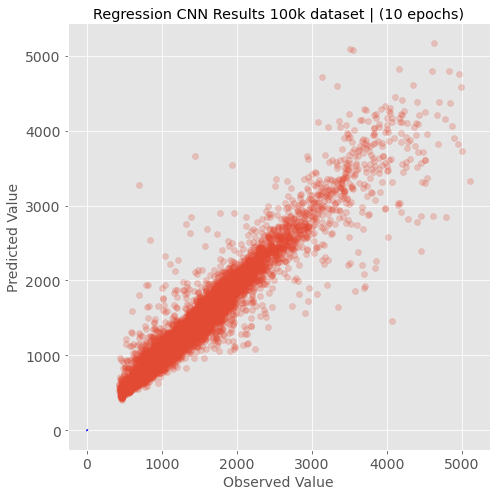

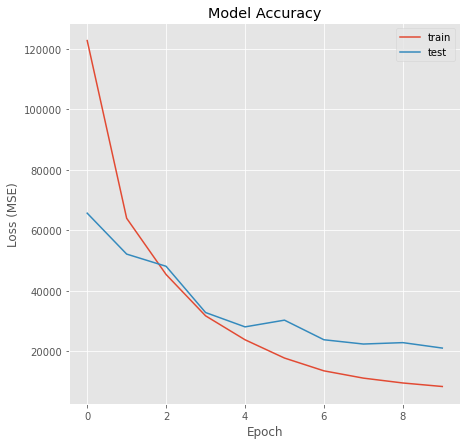

In [26]:
# run the model using CNN regression to predict the s-wave arrival time
model_cnn_rs = SeismicCNN('regression','s_arrival_sample',60000,full_csv,dir);
model_cnn_rs.train_test_split(test_size=0.25,random_state=44)
model_cnn_rs.regression_cnn('s_arrival_sample',10)
model_cnn_rs.evaluate_regression_model()

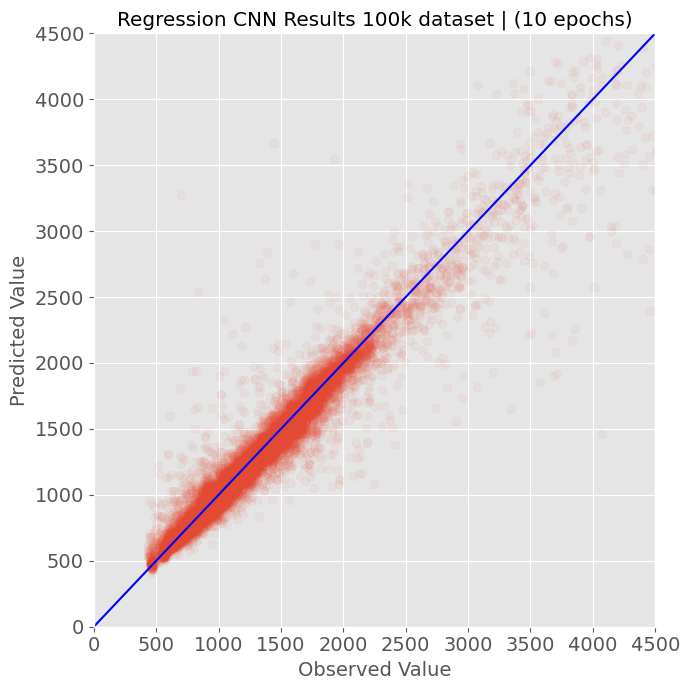

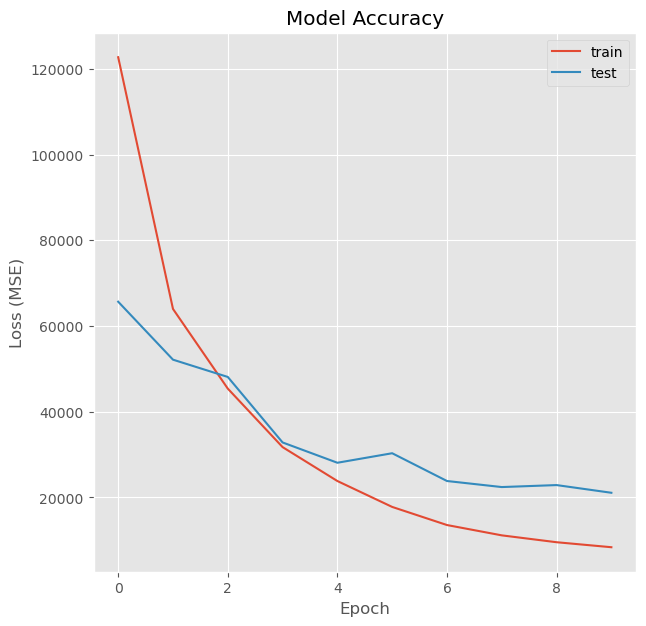

The baseline mse for s-wave arrival time is 364874.65796900255 

The mse of the CNN regression for s-wave arrival time is 25648.94921875 



In [51]:
# plot y true vs. y-predicted s-wave arrival time
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_cnn_rs.test_labels,model_cnn_rs.predicted,alpha=0.05)
point1 = [0,0]
point2 = [4500,4500]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression CNN Results 100k dataset | ({model_cnn_rs.epochs} epochs)')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([0,4500])
ax.set_ylim([0,4500])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# plot model loss history
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_cnn_rs.history.history['loss'])
ax.plot(model_cnn_rs.history.history['val_loss'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Loss (MSE)')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_cnn_rs.test_labels - np.mean(model_cnn_rs.test_labels)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for s-wave arrival time is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the CNN regression for s-wave arrival time is {model_cnn_rs.test_loss} \n')

In [44]:
class ClassificationLSTM:

    def __init__(self,envelopes_path,label_csv_path,target):
        self.envelopes_path = envelopes_path
        self.label_csv_path = label_csv_path
        self.target = target
        self.envelopes = []
        self.X_train = []
        self.X_test = []
        self.y_train = []
        self.y_test = []
        self.model = []
        self.ypred = []
        self.cm = []
        self.history = []
        self.epochs = []
        self.accuracy = []
        self.precision = []
        self.recall = []
        self.model_summary = []
        
        self.envelopes = np.load(self.envelopes_path,allow_pickle=True)
        self.label_csv = pd.read_csv(self.label_csv_path)
        self.labels = self.label_csv[target]
        self.labels = np.array(self.labels.map(lambda x: 1 if x == 'earthquake_local' else 0))
        
        
    def train_test_split(self, test_size,random_state):
    
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.envelopes, self.labels,random_state = random_state,test_size=test_size) # train test split
        self.X_train = np.reshape(self.X_train, (np.array(self.X_train).shape[0], 1, np.array(self.X_train).shape[1]))
        self.X_test = np.reshape(self.X_test, (np.array(self.X_test).shape[0], 1, np.array(self.X_test).shape[1]))
        self.X_train.shape, self.X_test.shape, self.y_train.shape, self.y_test.shape
        
    def LSTM_fit(self,epochs,metric,batch_size):
        
        self.epochs = epochs
        # set callbacks to save model at each epoch
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/LSTM_100000_dataset_classification_epochs{epochs}_{format(datetime.now().strftime("%Y%m%d%h%m%s"))}',
                save_freq='epoch')
        ]

        # model design
        model = keras.Sequential()
        model.add(keras.layers.SimpleRNN(64, input_shape=(1,self.X_train.shape[2]), return_sequences=True))
        model.add(keras.layers.LSTM(64, input_shape=(1,self.X_train.shape[2]), return_sequences=True))
        model.add(keras.layers.Dropout(0.2))
        model.add(keras.layers.LSTM(32, return_sequences=False))
        model.add(keras.layers.Dense(16, activation='relu'))
        model.add(keras.layers.Dense(1, activation='sigmoid'))
        opt = keras.optimizers.Adam(learning_rate=4e-5)
        model.compile(optimizer=opt,
                      loss='binary_crossentropy', metrics=metric)
 
        # fit and predict
        self.model = model
        self.history = model.fit(self.X_train, self.y_train, batch_size=batch_size, epochs=self.epochs,callbacks=callbacks,validation_split=0.2)
        
        # plot train/test accuracy history
        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['accuracy'])
        ax.plot(self.history.history['val_accuracy'])
        ax.set_title('Model Accuracy')
        ax.set_ylabel('Accuracy')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_accuracy.png')
        plt.show()
        
                

    def LSTM_evaluate(self):
        
        self.y_pred = self.model.predict(self.X_test) # get predictions
        
        print('Evaluating model on test dataset')

        # evaluate model
        test_loss, test_acc = self.model.evaluate(self.X_test, self.y_test, verbose=1)
        print(f'Test data accuracy: {test_acc}')
        
        self.model_summary = self.model.summary()
        print(self.model_summary)

        predicted_classes = self.model.predict_classes(self.X_test)
        self.accuracy = accuracy_score(self.y_test,predicted_classes)
        self.precision = precision_score(self.y_test,predicted_classes)
        self.recall = recall_score(self.y_test,predicted_classes)
        print(f'The accuracy of the model is {self.accuracy}, the precision is {self.precision}, and the recall is {self.recall}')
        
        # save model
        saved_model_path = f'./saved_models/LSTM_classification_acc{self.accuracy}_prec{self.precision}_rec{self.recall}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}' # _%H%M%S
        # Save entire model to a HDF5 file
        self.model.save(saved_model_path)
        
        # confusion matrix
        self.cm = confusion_matrix(self.y_test,predicted_classes)
        
        # plot confusion matrix
        plt.style.use('default')
        disp = ConfusionMatrixDisplay(confusion_matrix=self.cm, display_labels=['not earthquake','earthquake'])
        disp.plot(cmap='Blues', values_format='')
        plt.title(f'Classification LSTM Results ({self.epochs} epochs)')
        plt.tight_layout()
        plt.savefig('confusion_matrix.png')
        plt.show()



/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3338: DtypeWarning: Columns (22) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


Epoch 1/100
938/938 [==============================] - 6s 4ms/step - loss: 0.5895 - accuracy: 0.7098 - val_loss: 0.3405 - val_accuracy: 0.8848


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 2/100
938/938 [==============================] - 2s 3ms/step - loss: 0.2934 - accuracy: 0.8976 - val_loss: 0.2204 - val_accuracy: 0.9269


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 3/100
938/938 [==============================] - 2s 2ms/step - loss: 0.2048 - accuracy: 0.9359 - val_loss: 0.1799 - val_accuracy: 0.9455


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 4/100
938/938 [==============================] - 2s 2ms/step - loss: 0.1622 - accuracy: 0.9512 - val_loss: 0.1547 - val_accuracy: 0.9509


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 5/100
938/938 [==============================] - 2s 3ms/step - loss: 0.1411 - accuracy: 0.9564 - val_loss: 0.1371 - val_accuracy: 0.9568


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 6/100
938/938 [==============================] - 2s 3ms/step - loss: 0.1273 - accuracy: 0.9599 - val_loss: 0.1248 - val_accuracy: 0.9585


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 7/100
938/938 [==============================] - 2s 2ms/step - loss: 0.1152 - accuracy: 0.9637 - val_loss: 0.1173 - val_accuracy: 0.9603


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 8/100
938/938 [==============================] - 2s 2ms/step - loss: 0.1045 - accuracy: 0.9666 - val_loss: 0.1104 - val_accuracy: 0.9625


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 9/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0997 - accuracy: 0.9680 - val_loss: 0.1064 - val_accuracy: 0.9632


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 10/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0967 - accuracy: 0.9677 - val_loss: 0.1032 - val_accuracy: 0.9637


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 11/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0884 - accuracy: 0.9697 - val_loss: 0.1015 - val_accuracy: 0.9645


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 12/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0869 - accuracy: 0.9706 - val_loss: 0.0962 - val_accuracy: 0.9663


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 13/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0864 - accuracy: 0.9716 - val_loss: 0.0965 - val_accuracy: 0.9667


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 14/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0853 - accuracy: 0.9717 - val_loss: 0.0963 - val_accuracy: 0.9655


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 15/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0806 - accuracy: 0.9733 - val_loss: 0.0927 - val_accuracy: 0.9677


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 16/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0809 - accuracy: 0.9728 - val_loss: 0.0917 - val_accuracy: 0.9680


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 17/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0822 - accuracy: 0.9721 - val_loss: 0.0898 - val_accuracy: 0.9693


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 18/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0770 - accuracy: 0.9738 - val_loss: 0.0879 - val_accuracy: 0.9697


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 19/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0708 - accuracy: 0.9761 - val_loss: 0.0878 - val_accuracy: 0.9697


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 20/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0731 - accuracy: 0.9757 - val_loss: 0.0891 - val_accuracy: 0.9689


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 21/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0703 - accuracy: 0.9770 - val_loss: 0.0868 - val_accuracy: 0.9695


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 22/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0735 - accuracy: 0.9755 - val_loss: 0.0882 - val_accuracy: 0.9702


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 23/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0726 - accuracy: 0.9749 - val_loss: 0.0867 - val_accuracy: 0.9698


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 24/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0705 - accuracy: 0.9757 - val_loss: 0.0862 - val_accuracy: 0.9705


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 25/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0680 - accuracy: 0.9769 - val_loss: 0.0862 - val_accuracy: 0.9701


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 26/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0675 - accuracy: 0.9777 - val_loss: 0.0857 - val_accuracy: 0.9709


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 27/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0691 - accuracy: 0.9762 - val_loss: 0.0840 - val_accuracy: 0.9706


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 28/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.0852 - val_accuracy: 0.9709


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 29/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0639 - accuracy: 0.9786 - val_loss: 0.0827 - val_accuracy: 0.9721


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 30/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0635 - accuracy: 0.9787 - val_loss: 0.0832 - val_accuracy: 0.9715


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 31/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0630 - accuracy: 0.9785 - val_loss: 0.0839 - val_accuracy: 0.9716


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 32/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0654 - accuracy: 0.9780 - val_loss: 0.0829 - val_accuracy: 0.9719


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 33/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0622 - accuracy: 0.9779 - val_loss: 0.0831 - val_accuracy: 0.9721


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 34/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0616 - accuracy: 0.9776 - val_loss: 0.0825 - val_accuracy: 0.9725


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 35/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0603 - accuracy: 0.9798 - val_loss: 0.0838 - val_accuracy: 0.9717


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 36/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0601 - accuracy: 0.9793 - val_loss: 0.0831 - val_accuracy: 0.9715


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 37/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0580 - accuracy: 0.9801 - val_loss: 0.0807 - val_accuracy: 0.9725


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 38/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0606 - accuracy: 0.9793 - val_loss: 0.0835 - val_accuracy: 0.9709


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 39/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0554 - accuracy: 0.9808 - val_loss: 0.0847 - val_accuracy: 0.9711


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 40/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0598 - accuracy: 0.9803 - val_loss: 0.0828 - val_accuracy: 0.9719


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 41/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0529 - accuracy: 0.9825 - val_loss: 0.0827 - val_accuracy: 0.9721


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 42/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0572 - accuracy: 0.9804 - val_loss: 0.0852 - val_accuracy: 0.9704


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 43/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0570 - accuracy: 0.9806 - val_loss: 0.0834 - val_accuracy: 0.9713


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 44/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0564 - accuracy: 0.9813 - val_loss: 0.0822 - val_accuracy: 0.9720


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 45/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0545 - accuracy: 0.9816 - val_loss: 0.0822 - val_accuracy: 0.9726


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 46/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0551 - accuracy: 0.9806 - val_loss: 0.0832 - val_accuracy: 0.9719


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 47/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0564 - accuracy: 0.9806 - val_loss: 0.0814 - val_accuracy: 0.9725


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 48/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0539 - accuracy: 0.9824 - val_loss: 0.0798 - val_accuracy: 0.9736


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 49/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0538 - accuracy: 0.9819 - val_loss: 0.0793 - val_accuracy: 0.9739


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 50/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0542 - accuracy: 0.9813 - val_loss: 0.0812 - val_accuracy: 0.9734


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 51/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0545 - accuracy: 0.9814 - val_loss: 0.0812 - val_accuracy: 0.9727


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 52/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0537 - accuracy: 0.9820 - val_loss: 0.0826 - val_accuracy: 0.9730


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 53/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0554 - accuracy: 0.9810 - val_loss: 0.0836 - val_accuracy: 0.9724


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 54/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0549 - accuracy: 0.9816 - val_loss: 0.0838 - val_accuracy: 0.9723


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 55/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0516 - accuracy: 0.9822 - val_loss: 0.0840 - val_accuracy: 0.9724


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 56/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0509 - accuracy: 0.9822 - val_loss: 0.0834 - val_accuracy: 0.9727


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 57/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0496 - accuracy: 0.9833 - val_loss: 0.0830 - val_accuracy: 0.9713


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 58/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0492 - accuracy: 0.9832 - val_loss: 0.0836 - val_accuracy: 0.9723


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 59/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0518 - accuracy: 0.9821 - val_loss: 0.0824 - val_accuracy: 0.9728


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 60/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0819 - val_accuracy: 0.9732


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 61/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0500 - accuracy: 0.9832 - val_loss: 0.0820 - val_accuracy: 0.9727


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 62/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0500 - accuracy: 0.9832 - val_loss: 0.0819 - val_accuracy: 0.9727


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 63/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0492 - accuracy: 0.9834 - val_loss: 0.0826 - val_accuracy: 0.9735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 64/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0512 - accuracy: 0.9831 - val_loss: 0.0814 - val_accuracy: 0.9729


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 65/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0474 - accuracy: 0.9833 - val_loss: 0.0822 - val_accuracy: 0.9727


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 66/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0506 - accuracy: 0.9822 - val_loss: 0.0824 - val_accuracy: 0.9735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 67/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0472 - accuracy: 0.9842 - val_loss: 0.0826 - val_accuracy: 0.9728


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 68/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0458 - accuracy: 0.9854 - val_loss: 0.0816 - val_accuracy: 0.9741


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 69/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0481 - accuracy: 0.9836 - val_loss: 0.0810 - val_accuracy: 0.9743


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 70/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0465 - accuracy: 0.9840 - val_loss: 0.0818 - val_accuracy: 0.9741


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 71/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0441 - accuracy: 0.9845 - val_loss: 0.0805 - val_accuracy: 0.9747


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 72/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0448 - accuracy: 0.9847 - val_loss: 0.0836 - val_accuracy: 0.9737


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 73/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0464 - accuracy: 0.9850 - val_loss: 0.0828 - val_accuracy: 0.9730


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 74/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0445 - accuracy: 0.9850 - val_loss: 0.0827 - val_accuracy: 0.9737


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 75/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0470 - accuracy: 0.9839 - val_loss: 0.0833 - val_accuracy: 0.9738


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 76/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0461 - accuracy: 0.9848 - val_loss: 0.0847 - val_accuracy: 0.9735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 77/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0449 - accuracy: 0.9851 - val_loss: 0.0831 - val_accuracy: 0.9737


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 78/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0472 - accuracy: 0.9839 - val_loss: 0.0829 - val_accuracy: 0.9735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 79/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0443 - accuracy: 0.9846 - val_loss: 0.0814 - val_accuracy: 0.9735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 80/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0432 - accuracy: 0.9848 - val_loss: 0.0831 - val_accuracy: 0.9728


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 81/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0474 - accuracy: 0.9837 - val_loss: 0.0819 - val_accuracy: 0.9732


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 82/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0459 - accuracy: 0.9841 - val_loss: 0.0809 - val_accuracy: 0.9745


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 83/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0439 - accuracy: 0.9845 - val_loss: 0.0831 - val_accuracy: 0.9737


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 84/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0444 - accuracy: 0.9847 - val_loss: 0.0832 - val_accuracy: 0.9738


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 85/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0440 - accuracy: 0.9849 - val_loss: 0.0824 - val_accuracy: 0.9733


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 86/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0453 - accuracy: 0.9841 - val_loss: 0.0817 - val_accuracy: 0.9741


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 87/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0412 - accuracy: 0.9858 - val_loss: 0.0813 - val_accuracy: 0.9741


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 88/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0419 - accuracy: 0.9857 - val_loss: 0.0824 - val_accuracy: 0.9741


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 89/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0426 - accuracy: 0.9858 - val_loss: 0.0828 - val_accuracy: 0.9740


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 90/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0434 - accuracy: 0.9858 - val_loss: 0.0846 - val_accuracy: 0.9731


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 91/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0422 - accuracy: 0.9859 - val_loss: 0.0843 - val_accuracy: 0.9733


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 92/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0422 - accuracy: 0.9858 - val_loss: 0.0875 - val_accuracy: 0.9722


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 93/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0429 - accuracy: 0.9852 - val_loss: 0.0857 - val_accuracy: 0.9728


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 94/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0426 - accuracy: 0.9859 - val_loss: 0.0855 - val_accuracy: 0.9724


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 95/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0429 - accuracy: 0.9858 - val_loss: 0.0853 - val_accuracy: 0.9732


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 96/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0401 - accuracy: 0.9861 - val_loss: 0.0852 - val_accuracy: 0.9730


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 97/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0398 - accuracy: 0.9870 - val_loss: 0.0871 - val_accuracy: 0.9731


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 98/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0414 - accuracy: 0.9860 - val_loss: 0.0853 - val_accuracy: 0.9736


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 99/100
938/938 [==============================] - 2s 3ms/step - loss: 0.0401 - accuracy: 0.9862 - val_loss: 0.0872 - val_accuracy: 0.9729


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


Epoch 100/100
938/938 [==============================] - 2s 2ms/step - loss: 0.0407 - accuracy: 0.9863 - val_loss: 0.0849 - val_accuracy: 0.9737


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_classification_epochs100_20210424Apr041619293381/assets


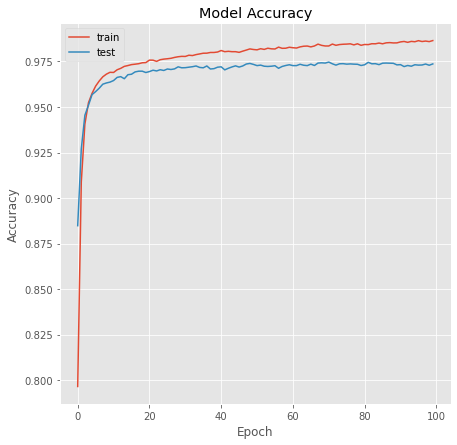

Evaluating model on test dataset
782/782 [==============================] - 1s 842us/step - loss: 0.0772 - accuracy: 0.9741
Test data accuracy: 0.974120020866394


/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


The accuracy of the model is 0.97412, the precision is 0.9774326297623789, and the recall is 0.979578261158784


INFO:tensorflow:Assets written to: ./saved_models/LSTM_classification_acc0.97412_prec0.9774326297623789_rec0.979578261158784_epochs100_20210424/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_classification_acc0.97412_prec0.9774326297623789_rec0.979578261158784_epochs100_20210424/assets


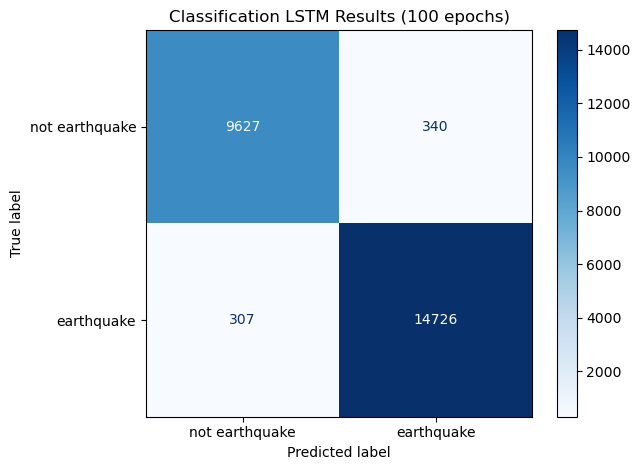

In [4]:
# use ClassificationLSTM
# predict earthquake or noise
model_c2 = ClassificationLSTM(envelopes_path,label_csv_path,'trace_category')
model_c2.train_test_split(test_size=0.25,random_state=44)
model_c2.LSTM_fit(epochs=100,metric='accuracy',batch_size=64)
model_c2.LSTM_evaluate()

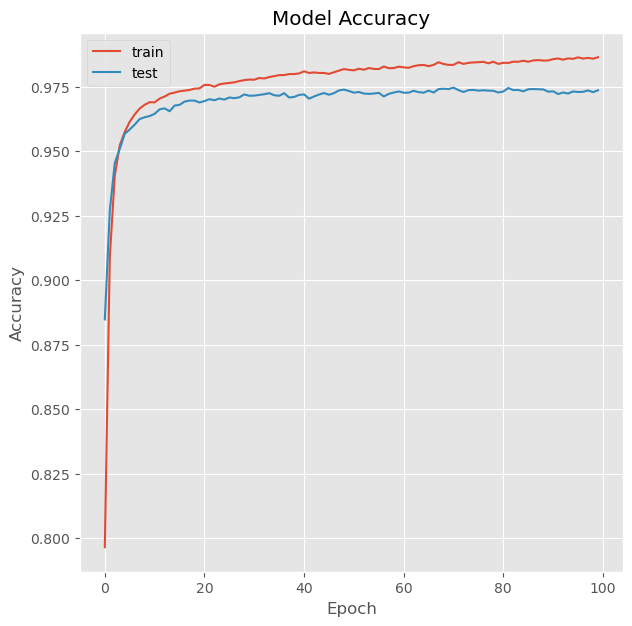

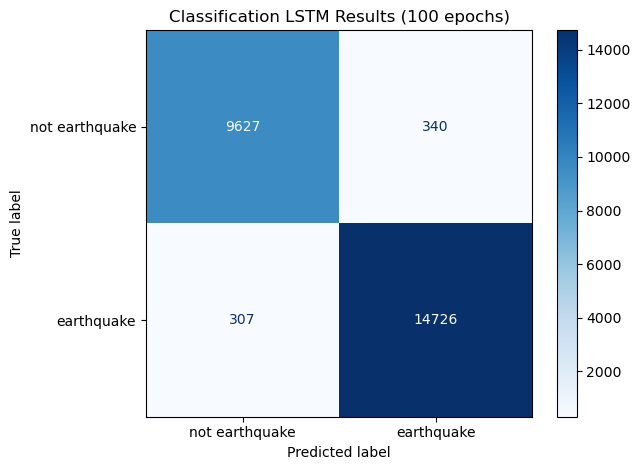

The accuracy of the baseline model for earthquake vs. noise prediction is is 0.52164, the precision is 0.5996003996003996, and the recall is 0.5988824585910996

 The accuracy of the classification model for earthquake vs. noise prediction is 0.97412, the precision is 0.9774326297623789, and the recall is 0.979578261158784


In [61]:
# plot train/test accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_c2.history.history['accuracy'])
ax.plot(model_c2.history.history['val_accuracy'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Accuracy')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_accuracy.png')
plt.show()

# plot confusion matrix
plt.style.use('default')
disp = ConfusionMatrixDisplay(confusion_matrix=model_c2.cm, display_labels=['not earthquake','earthquake'])
disp.plot(cmap='Blues', values_format='')
plt.title(f'Classification LSTM Results ({model_c2.epochs} epochs)')
plt.tight_layout()
plt.savefig('confusion_matrix.png')
plt.show()

# baseline classifier for this model

from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy="stratified")
dummy_clf.fit(model_c2.X_train, model_c2.y_train)
predictions = dummy_clf.predict(model_c2.X_test)
acc = dummy_clf.score(model_c2.X_test, model_c2.y_test)
prec = precision_score(model_c2.y_test,predictions)
rec = recall_score(model_c2.y_test,predictions)
print(f'The accuracy of the baseline model for earthquake vs. noise prediction is is {acc}, the precision is {prec}, and the recall is {rec}')

# accuracy, precision, recall
tn, fp, fn, tp = model_c2.cm.ravel()
accuracy = (tn + tp)/(tn+fp+fn+tp)
precision = tp/(tp+fp)
recall = tp/(tp+fn)

print(f'\n The accuracy of the classification model for earthquake vs. noise prediction is {accuracy}, the precision is {precision}, and the recall is {recall}')


In [41]:
class RegressionLSTM:

    def __init__(self,envelopes_path,label_csv_path,target):
        self.envelopes_path = envelopes_path
        self.label_csv_path = label_csv_path
        self.target = target
        self.envelopes = []
        self.X_train = []
        self.X_test = []
        self.y_train = []
        self.y_test = []
        self.model = []
        self.ypred = []
        self.cm = []
        self.history = []
        self.epochs = []
        self.test_loss = []
        self.model_summary = []
        
        self.envelopes = np.load(self.envelopes_path,allow_pickle=True)
        self.label_csv = pd.read_csv(self.label_csv_path)
        self.labels = self.label_csv[target]
        
        eq_envelopes = np.array(self.envelopes)[self.label_csv['trace_category'] == 'earthquake_local']
        print(len(eq_envelopes))
        eq_labels = self.label_csv[self.target][self.label_csv['trace_category'] == 'earthquake_local']
        print(len(eq_labels))
        
        self.envelopes = eq_envelopes
        self.labels = eq_labels
        
    def train_test_split(self, test_size,random_state):
    
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.envelopes, self.labels,random_state = random_state,test_size=test_size) # train test split
        self.X_train = np.reshape(self.X_train, (np.array(self.X_train).shape[0], 1, np.array(self.X_train).shape[1]))
        self.X_test = np.reshape(self.X_test, (np.array(self.X_test).shape[0], 1, np.array(self.X_test).shape[1]))
        self.X_train.shape, self.X_test.shape, self.y_train.shape, self.y_test.shape
        
    def LSTM_fit(self,epochs,batch_size):
        self.epochs = epochs
        # set callbacks to save model at each epoch
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/LSTM_100000_dataset_regression_epochs{epochs}_{format(datetime.now().strftime("%Y%m%d%h%m%s"))}',
                save_freq='epoch')
        ]

        # model design
        model = keras.Sequential()
        model.add(keras.layers.LSTM(32, input_shape=(1, 300), return_sequences=True))
        model.add(keras.layers.LSTM(32, return_sequences=False))
        model.add(keras.layers.Dropout(0.2))
        model.add(keras.layers.Dense(32, activation='relu'))
        model.add(keras.layers.Dense(16, activation='relu'))
        model.add(keras.layers.Dense(1, activation='linear'))
        opt = keras.optimizers.Adam(learning_rate=1e-4)
        model.compile(optimizer=opt,
                      loss='mse')
        self.model = model
        
        # fit
        self.model = model
        self.history = self.model.fit(self.X_train, self.y_train, batch_size=batch_size,epochs=epochs,callbacks=callbacks,validation_split=0.2)
        
        # plot train/test accuracy history
        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['loss'])
        ax.plot(self.history.history['val_loss'])
        ax.set_title('Model Loss (MSE)')
        ax.set_ylabel('MSE')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_loss.png')
        plt.show()
        
                

    def LSTM_evaluate(self):
        
        self.y_pred = self.model.predict(self.X_test) # get predictions
        
        print('Evaluating model on test dataset')

        # evaluate model
        self.test_loss = self.model.evaluate(self.X_test, self.y_test, verbose=1)
        print(f'Test data loss: {self.test_loss}')
        
        self.model_summary = self.model.summary()
        print(self.model_summary)

        # save model
        saved_model_path = f'./saved_models/LSTM_regression_loss{self.test_loss}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}' # _%H%M%S
        # Save entire model to a HDF5 file
        self.model.save(saved_model_path)
        
        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.scatter(self.y_test,self.y_pred,alpha=0.01)
        point1 = [0,0]
        point2 = [1200,1200]
        xvalues = [point1[0], point2[0]]
        yvalues = [point1[1], point2[1]]
        ax.plot(xvalues,yvalues,color='blue')
        ax.set_ylabel('Predicted Value',fontsize=14)
        ax.set_xlabel('Observed Value',fontsize=14)
        ax.set_title(f'Regression LSTM Results | ({self.epochs} epochs)',fontsize=14)
        ax.tick_params(axis='x', labelsize=14)
        ax.tick_params(axis='y', labelsize=14)
        ax.set_xlim([0,1200])
        ax.set_ylim([0,1200])
        plt.tight_layout()
        plt.savefig('true_vs_predicted.png')
        plt.show()

/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3338: DtypeWarning: Columns (22) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


60000
60000
Epoch 1/50
563/563 [==============================] - 4s 3ms/step - loss: 468302.3780 - val_loss: 446044.1250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 2/50
563/563 [==============================] - 1s 2ms/step - loss: 435960.0269 - val_loss: 368836.4062


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 3/50
563/563 [==============================] - 1s 2ms/step - loss: 348083.3946 - val_loss: 255230.4688


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 4/50
563/563 [==============================] - 1s 2ms/step - loss: 229878.0334 - val_loss: 139432.9531


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 5/50
563/563 [==============================] - 1s 2ms/step - loss: 119024.4661 - val_loss: 63607.4961


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 6/50
563/563 [==============================] - 1s 2ms/step - loss: 57642.7619 - val_loss: 35717.5352


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 7/50
563/563 [==============================] - 1s 2ms/step - loss: 36681.9432 - val_loss: 28640.4336


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 8/50
563/563 [==============================] - 1s 2ms/step - loss: 29947.6407 - val_loss: 18132.8945


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 9/50
563/563 [==============================] - 1s 2ms/step - loss: 19012.5620 - val_loss: 11456.1250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 10/50
563/563 [==============================] - 1s 2ms/step - loss: 14595.2525 - val_loss: 9584.1650


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 11/50
563/563 [==============================] - 1s 2ms/step - loss: 12757.8907 - val_loss: 8747.2510


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 12/50
563/563 [==============================] - 1s 2ms/step - loss: 11967.1021 - val_loss: 7597.6924


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 13/50
563/563 [==============================] - 1s 2ms/step - loss: 11007.5326 - val_loss: 7185.5264


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 14/50
563/563 [==============================] - 1s 2ms/step - loss: 10417.9846 - val_loss: 6589.3735


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 15/50
563/563 [==============================] - 1s 2ms/step - loss: 9802.2995 - val_loss: 6202.7090


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 16/50
563/563 [==============================] - 1s 2ms/step - loss: 9303.8348 - val_loss: 5906.1172


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 17/50
563/563 [==============================] - 1s 2ms/step - loss: 8880.7515 - val_loss: 5560.5029


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 18/50
563/563 [==============================] - 1s 2ms/step - loss: 8491.2089 - val_loss: 5432.6279


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 19/50
563/563 [==============================] - 1s 2ms/step - loss: 8748.3777 - val_loss: 5326.6245


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 20/50
563/563 [==============================] - 1s 2ms/step - loss: 8303.1853 - val_loss: 4908.5952


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 21/50
563/563 [==============================] - 1s 3ms/step - loss: 8195.5364 - val_loss: 4918.6709


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 22/50
563/563 [==============================] - 1s 2ms/step - loss: 7784.4197 - val_loss: 4809.7949


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 23/50
563/563 [==============================] - 1s 2ms/step - loss: 7719.9397 - val_loss: 4807.1426


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 24/50
563/563 [==============================] - 1s 2ms/step - loss: 7945.4623 - val_loss: 4779.8237


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 25/50
563/563 [==============================] - 1s 2ms/step - loss: 7492.6115 - val_loss: 4784.9243


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 26/50
563/563 [==============================] - 1s 2ms/step - loss: 7484.0151 - val_loss: 4536.4502


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 27/50
563/563 [==============================] - 1s 2ms/step - loss: 7399.6420 - val_loss: 4531.4492


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 28/50
563/563 [==============================] - 1s 2ms/step - loss: 7304.8661 - val_loss: 4358.5903


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 29/50
563/563 [==============================] - 1s 2ms/step - loss: 7160.4840 - val_loss: 4387.2637


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 30/50
563/563 [==============================] - 1s 2ms/step - loss: 7206.7352 - val_loss: 4163.0977


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 31/50
563/563 [==============================] - 1s 2ms/step - loss: 6946.5588 - val_loss: 4194.5107


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 32/50
563/563 [==============================] - 1s 2ms/step - loss: 6959.8796 - val_loss: 4065.2141


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 33/50
563/563 [==============================] - 1s 2ms/step - loss: 6946.2592 - val_loss: 4047.0391


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 34/50
563/563 [==============================] - 1s 2ms/step - loss: 6790.0001 - val_loss: 3887.1621


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 35/50
563/563 [==============================] - 1s 2ms/step - loss: 6541.3588 - val_loss: 3852.3750


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 36/50
563/563 [==============================] - 1s 2ms/step - loss: 6419.9524 - val_loss: 3890.9636


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 37/50
563/563 [==============================] - 1s 2ms/step - loss: 6330.9742 - val_loss: 3980.3333


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 38/50
563/563 [==============================] - 1s 2ms/step - loss: 6647.9570 - val_loss: 3819.9329


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 39/50
563/563 [==============================] - 1s 2ms/step - loss: 6382.7119 - val_loss: 3767.8533


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 40/50
563/563 [==============================] - 1s 2ms/step - loss: 6314.2570 - val_loss: 3725.7510


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 41/50
563/563 [==============================] - 1s 2ms/step - loss: 6133.7187 - val_loss: 3694.4817


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 42/50
563/563 [==============================] - 1s 2ms/step - loss: 6238.4191 - val_loss: 3738.8049


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 43/50
563/563 [==============================] - 1s 2ms/step - loss: 6073.6835 - val_loss: 3732.9995


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 44/50
563/563 [==============================] - 1s 2ms/step - loss: 6006.2490 - val_loss: 3684.7463


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 45/50
563/563 [==============================] - 1s 2ms/step - loss: 6166.0101 - val_loss: 3660.5308


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 46/50
563/563 [==============================] - 1s 2ms/step - loss: 5868.7541 - val_loss: 3651.2205


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 47/50
563/563 [==============================] - 1s 2ms/step - loss: 5779.7980 - val_loss: 3477.1404


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 48/50
563/563 [==============================] - 1s 2ms/step - loss: 5642.0517 - val_loss: 3478.3352


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 49/50
563/563 [==============================] - 1s 2ms/step - loss: 5739.5942 - val_loss: 3584.8801


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


Epoch 50/50
563/563 [==============================] - 1s 2ms/step - loss: 5628.3676 - val_loss: 3500.4915


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473535/assets


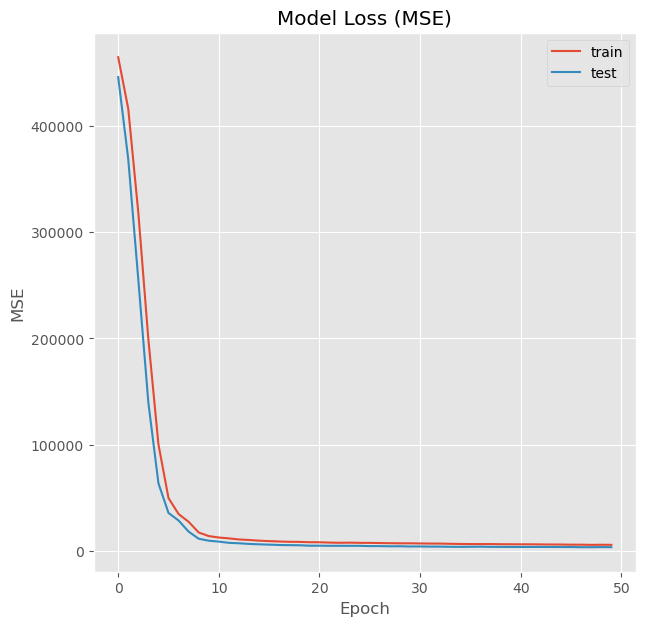

Evaluating model on test dataset
469/469 [==============================] - 0s 720us/step - loss: 3212.2346
Test data loss: 3212.234619140625


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss3212.234619140625_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss3212.234619140625_epochs50_20210426/assets


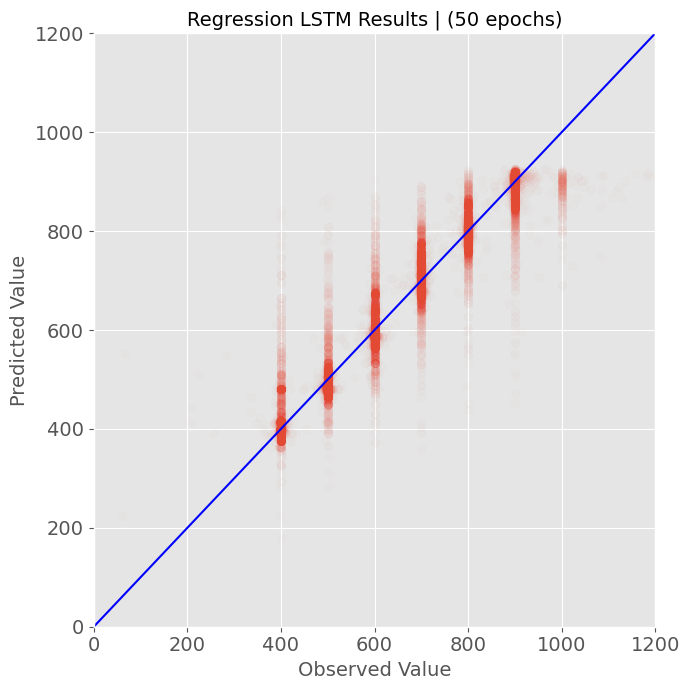

In [54]:
# use RegressionLSTM
# predict p-wave arrival time
model_rp = RegressionLSTM(envelopes_path,label_csv_path,'p_arrival_sample')
model_rp.train_test_split(test_size=0.25,random_state=44)
model_rp.LSTM_fit(epochs=50,batch_size=64)
model_rp.LSTM_evaluate()

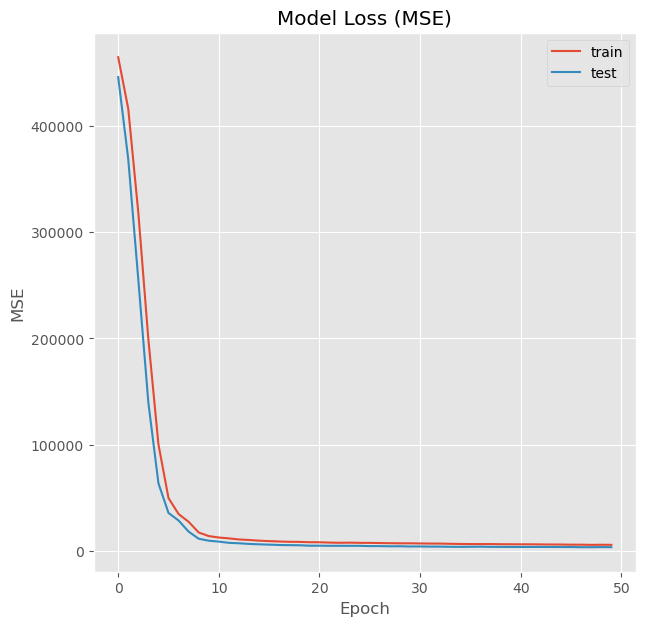

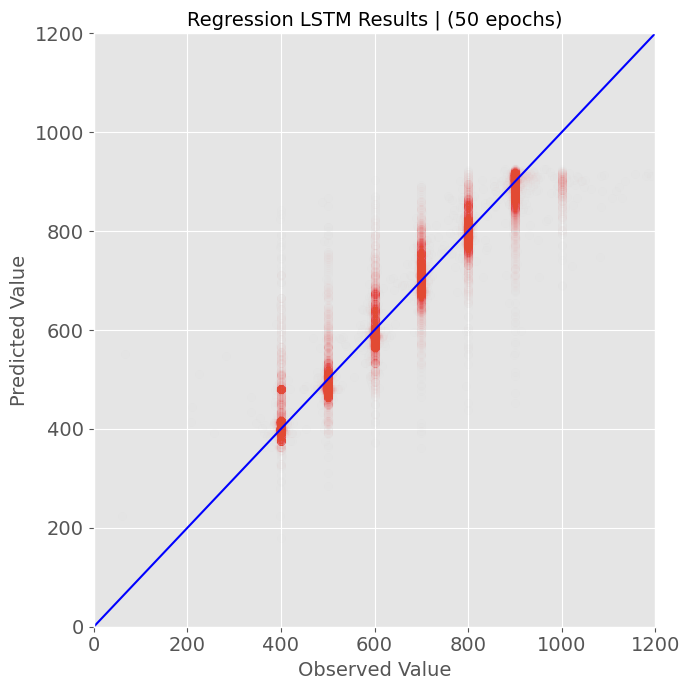

The baseline mse for p-wave time prediction is 30772.70156806433 

The mse of the LSTM regression for p-wave time prediction is 3212.234619140625 



In [62]:
# plot train/test accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_rp.history.history['loss'])
ax.plot(model_rp.history.history['val_loss'])
ax.set_title('Model Loss (MSE)')
ax.set_ylabel('MSE')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# plot y true vs. y predicted
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_rp.y_test,model_rp.y_pred,alpha=0.005)
point1 = [0,0]
point2 = [1200,1200]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression LSTM Results | ({model_rp.epochs} epochs)',fontsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([0,1200])
ax.set_ylim([0,1200])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_rp.y_test - np.mean(model_rp.y_test)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for p-wave time prediction is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the LSTM regression for p-wave time prediction is {model_rp.test_loss} \n')

/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3338: DtypeWarning: Columns (22) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


60000
60000
Epoch 1/50
563/563 [==============================] - 4s 3ms/step - loss: 2153249.5089 - val_loss: 2052073.0000


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 2/50
563/563 [==============================] - 1s 2ms/step - loss: 2007595.6148 - val_loss: 1778552.6250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 3/50
563/563 [==============================] - 1s 2ms/step - loss: 1678182.3551 - val_loss: 1379753.6250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 4/50
563/563 [==============================] - 1s 2ms/step - loss: 1283580.2553 - val_loss: 957509.0625


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 5/50
563/563 [==============================] - 1s 2ms/step - loss: 884530.2234 - val_loss: 618876.7500


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 6/50
563/563 [==============================] - 1s 2ms/step - loss: 570358.7662 - val_loss: 416823.4062


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 7/50
563/563 [==============================] - 1s 2ms/step - loss: 385166.7599 - val_loss: 284810.6250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 8/50
563/563 [==============================] - 1s 2ms/step - loss: 276200.2945 - val_loss: 205977.3438


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 9/50
563/563 [==============================] - 1s 2ms/step - loss: 206070.2660 - val_loss: 160789.2344


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 10/50
563/563 [==============================] - 1s 2ms/step - loss: 164065.9966 - val_loss: 133268.0312


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 11/50
563/563 [==============================] - 1s 2ms/step - loss: 141292.5689 - val_loss: 115916.2422


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 12/50
563/563 [==============================] - 1s 2ms/step - loss: 127922.0984 - val_loss: 102655.0859


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 13/50
563/563 [==============================] - 1s 2ms/step - loss: 115856.1028 - val_loss: 91714.3359


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 14/50
563/563 [==============================] - 1s 2ms/step - loss: 102791.0931 - val_loss: 83110.8828


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 15/50
563/563 [==============================] - 1s 2ms/step - loss: 94426.8917 - val_loss: 75550.2422


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 16/50
563/563 [==============================] - 1s 2ms/step - loss: 90678.0244 - val_loss: 68900.2578


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 17/50
563/563 [==============================] - 1s 2ms/step - loss: 82050.4636 - val_loss: 64825.2070


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 18/50
563/563 [==============================] - 1s 2ms/step - loss: 78376.8274 - val_loss: 60690.8438


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 19/50
563/563 [==============================] - 1s 2ms/step - loss: 74855.9806 - val_loss: 58810.3633


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 20/50
563/563 [==============================] - 1s 2ms/step - loss: 70839.9252 - val_loss: 56913.2930


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 21/50
563/563 [==============================] - 1s 2ms/step - loss: 69044.0539 - val_loss: 56434.0938


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 22/50
563/563 [==============================] - 1s 2ms/step - loss: 66119.5025 - val_loss: 53941.5039


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 23/50
563/563 [==============================] - 1s 2ms/step - loss: 62630.6298 - val_loss: 52613.3320


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 24/50
563/563 [==============================] - 1s 2ms/step - loss: 61130.4217 - val_loss: 52758.0156


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 25/50
563/563 [==============================] - 1s 2ms/step - loss: 64796.0015 - val_loss: 51857.1250


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 26/50
563/563 [==============================] - 1s 2ms/step - loss: 60555.4135 - val_loss: 50904.0781


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 27/50
563/563 [==============================] - 1s 2ms/step - loss: 62236.7449 - val_loss: 50155.6797


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 28/50
563/563 [==============================] - 1s 2ms/step - loss: 60321.3867 - val_loss: 49658.0000


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 29/50
563/563 [==============================] - 1s 2ms/step - loss: 60156.4300 - val_loss: 48908.9023


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 30/50
563/563 [==============================] - 1s 2ms/step - loss: 54625.4767 - val_loss: 47646.7617


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 31/50
563/563 [==============================] - 1s 2ms/step - loss: 57308.8881 - val_loss: 45704.7773


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 32/50
563/563 [==============================] - 1s 2ms/step - loss: 52963.0506 - val_loss: 46315.0820


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 33/50
563/563 [==============================] - 1s 2ms/step - loss: 53804.4903 - val_loss: 45200.3945


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 34/50
563/563 [==============================] - 1s 2ms/step - loss: 53728.8175 - val_loss: 45046.7148


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 35/50
563/563 [==============================] - 1s 2ms/step - loss: 55352.6358 - val_loss: 43910.6562


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 36/50
563/563 [==============================] - 1s 2ms/step - loss: 49247.2159 - val_loss: 44032.4141


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 37/50
563/563 [==============================] - 1s 2ms/step - loss: 49604.2633 - val_loss: 43919.9219


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 38/50
563/563 [==============================] - 1s 2ms/step - loss: 51746.6731 - val_loss: 43397.1797


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 39/50
563/563 [==============================] - 1s 2ms/step - loss: 50413.5444 - val_loss: 43274.1797


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 40/50
563/563 [==============================] - 1s 2ms/step - loss: 46788.9034 - val_loss: 42039.5469


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 41/50
563/563 [==============================] - 1s 2ms/step - loss: 49180.8941 - val_loss: 42554.4219


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 42/50
563/563 [==============================] - 1s 2ms/step - loss: 49748.3805 - val_loss: 42920.8789


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 43/50
563/563 [==============================] - 1s 2ms/step - loss: 46100.5975 - val_loss: 42034.6016


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 44/50
563/563 [==============================] - 1s 2ms/step - loss: 47654.9334 - val_loss: 41169.4648


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 45/50
563/563 [==============================] - 1s 2ms/step - loss: 47821.2945 - val_loss: 41048.9414


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 46/50
563/563 [==============================] - 1s 2ms/step - loss: 45993.5072 - val_loss: 40681.4102


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 47/50
563/563 [==============================] - 1s 2ms/step - loss: 46060.3103 - val_loss: 40832.7852


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 48/50
563/563 [==============================] - 1s 2ms/step - loss: 44871.9494 - val_loss: 39357.4922


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 49/50
563/563 [==============================] - 1s 2ms/step - loss: 45920.9939 - val_loss: 39320.3359


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


Epoch 50/50
563/563 [==============================] - 1s 2ms/step - loss: 41944.7552 - val_loss: 39751.0312


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619473903/assets


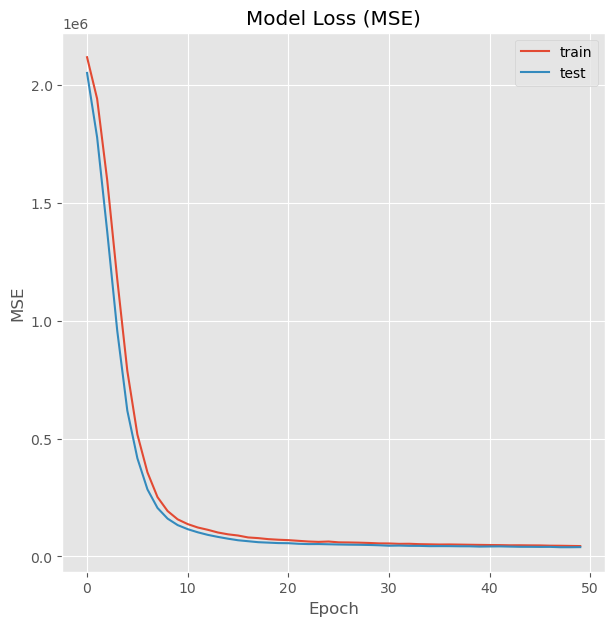

Evaluating model on test dataset
469/469 [==============================] - 0s 733us/step - loss: 42508.5781
Test data loss: 42508.578125


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss42508.578125_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss42508.578125_epochs50_20210426/assets


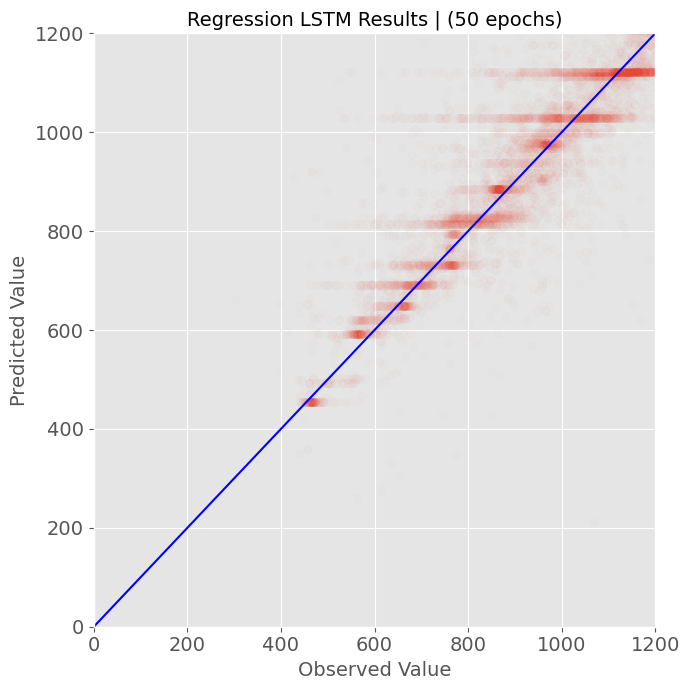

In [56]:
# use RegressionLSTM
# predict s-wave arrival time
model_rs = RegressionLSTM(envelopes_path,label_csv_path,'s_arrival_sample')
model_rs.train_test_split(test_size=0.25,random_state=44)
model_rs.LSTM_fit(epochs=50,batch_size=64)
model_rs.LSTM_evaluate()

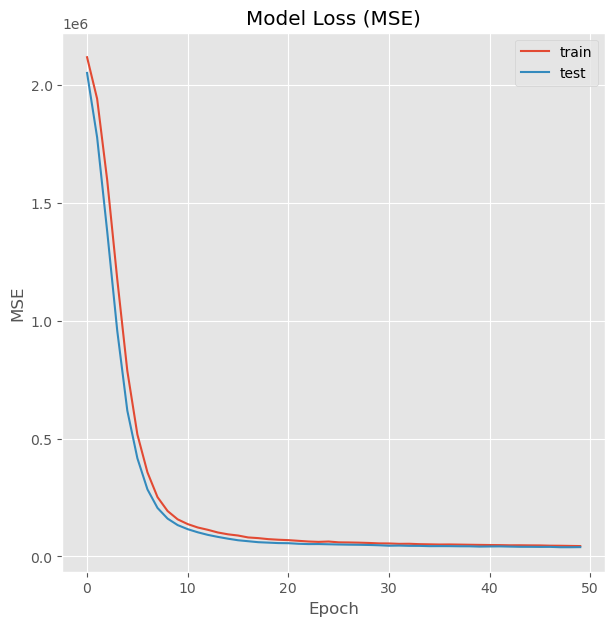

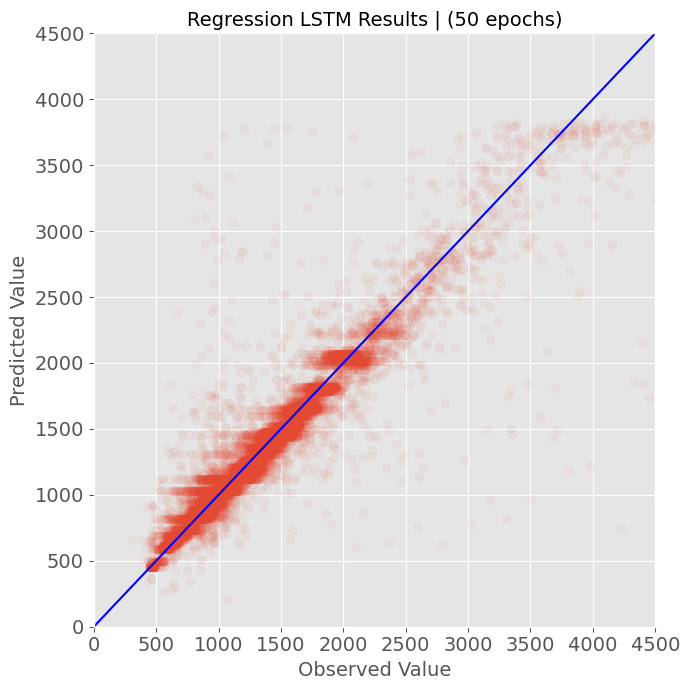

The baseline mse for s-wave time prediction is 366620.90600771894 

The mse of the LSTM regression for s-wave time prediction is 42508.578125 



In [63]:
# plot train/test accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_rs.history.history['loss'])
ax.plot(model_rs.history.history['val_loss'])
ax.set_title('Model Loss (MSE)')
ax.set_ylabel('MSE')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# plot y true vs. y predicted
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_rs.y_test,model_rs.y_pred,alpha=0.05)
point1 = [0,0]
point2 = [4500,4500]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression LSTM Results | ({model_rs.epochs} epochs)',fontsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([0,4500])
ax.set_ylim([0,4500])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_rs.y_test - np.mean(model_rs.y_test)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for s-wave time prediction is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the LSTM regression for s-wave time prediction is {model_rs.test_loss} \n')

/Users/kaelynnrose/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3338: DtypeWarning: Columns (22) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


60000
60000
Epoch 1/50
563/563 [==============================] - 4s 3ms/step - loss: 2.5249 - val_loss: 0.7943


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 2/50
563/563 [==============================] - 1s 2ms/step - loss: 0.7413 - val_loss: 0.5868


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 3/50
563/563 [==============================] - 1s 2ms/step - loss: 0.6005 - val_loss: 0.5525


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 4/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5696 - val_loss: 0.5294


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 5/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5572 - val_loss: 0.5160


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 6/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5344 - val_loss: 0.5098


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 7/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5345 - val_loss: 0.4983


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 8/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5129 - val_loss: 0.4996


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 9/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5133 - val_loss: 0.4982


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 10/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5111 - val_loss: 0.5108


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 11/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5186 - val_loss: 0.4978


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 12/50
563/563 [==============================] - 1s 2ms/step - loss: 0.5047 - val_loss: 0.4870


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 13/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4945 - val_loss: 0.4858


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 14/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4900 - val_loss: 0.4818


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 15/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4836 - val_loss: 0.4756


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 16/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4891 - val_loss: 0.4746


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 17/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4849 - val_loss: 0.4723


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 18/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4814 - val_loss: 0.4590


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 19/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4738 - val_loss: 0.4595


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 20/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4672 - val_loss: 0.4531


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 21/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4638 - val_loss: 0.4460


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 22/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4594 - val_loss: 0.4575


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 23/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4667 - val_loss: 0.4562


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 24/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4608 - val_loss: 0.4494


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 25/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4706 - val_loss: 0.4462


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 26/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4576 - val_loss: 0.4420


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 27/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4423 - val_loss: 0.4376


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 28/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4475 - val_loss: 0.4362


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 29/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4484 - val_loss: 0.4330


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 30/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4377 - val_loss: 0.4324


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 31/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4347 - val_loss: 0.4139


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 32/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4299 - val_loss: 0.4167


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 33/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4170 - val_loss: 0.4210


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 34/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4237 - val_loss: 0.4166


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 35/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4181 - val_loss: 0.4241


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 36/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4191 - val_loss: 0.4167


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 37/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4230 - val_loss: 0.4393


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 38/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4201 - val_loss: 0.4150


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 39/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4271 - val_loss: 0.4138


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 40/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4362 - val_loss: 0.4125


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 41/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4195 - val_loss: 0.4103


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 42/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4207 - val_loss: 0.4013


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 43/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4256 - val_loss: 0.4121


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 44/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4198 - val_loss: 0.4105


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 45/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4131 - val_loss: 0.4084


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 46/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4065 - val_loss: 0.4014


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 47/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4044 - val_loss: 0.4022


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 48/50
563/563 [==============================] - 1s 2ms/step - loss: 0.4071 - val_loss: 0.4090


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 49/50
563/563 [==============================] - 1s 2ms/step - loss: 0.3979 - val_loss: 0.3988


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


Epoch 50/50
563/563 [==============================] - 1s 2ms/step - loss: 0.3884 - val_loss: 0.3865


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_100000_dataset_regression_epochs50_20210426Apr041619474718/assets


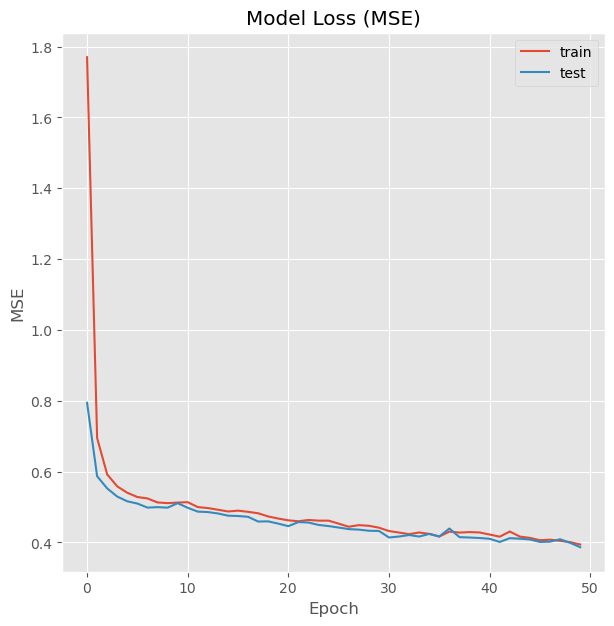

Evaluating model on test dataset
469/469 [==============================] - 0s 724us/step - loss: 0.3874
Test data loss: 0.38736453652381897


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss0.38736453652381897_epochs50_20210426/assets


INFO:tensorflow:Assets written to: ./saved_models/LSTM_regression_loss0.38736453652381897_epochs50_20210426/assets


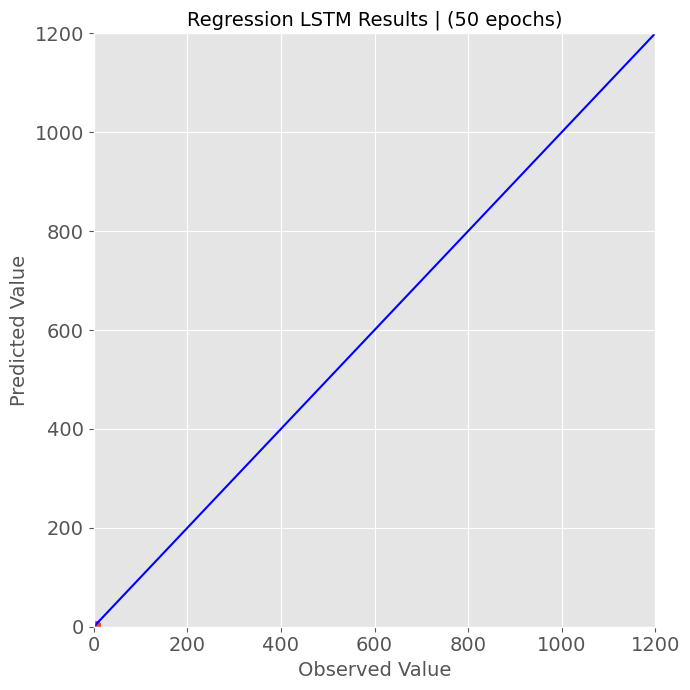

In [58]:
# use RegressionLSTM
# predict earthquake magnitude
model_rm = RegressionLSTM(envelopes_path,label_csv_path,'source_magnitude')
model_rm.train_test_split(test_size=0.25,random_state=44)
model_rm.LSTM_fit(epochs=50,batch_size=64)
model_rm.LSTM_evaluate()

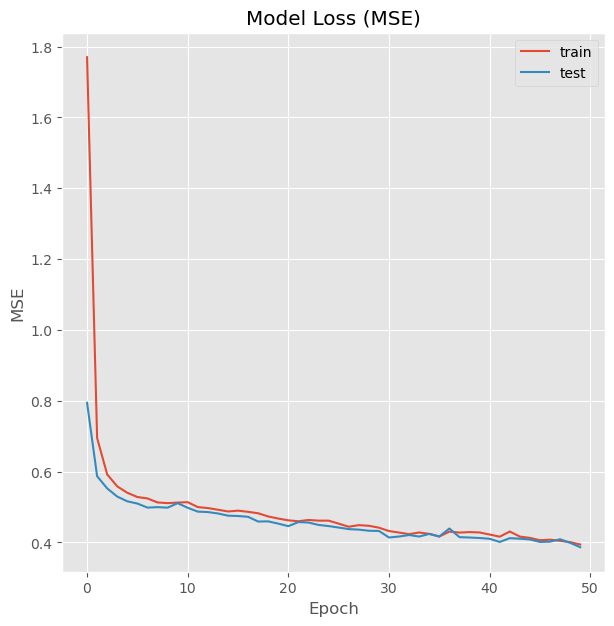

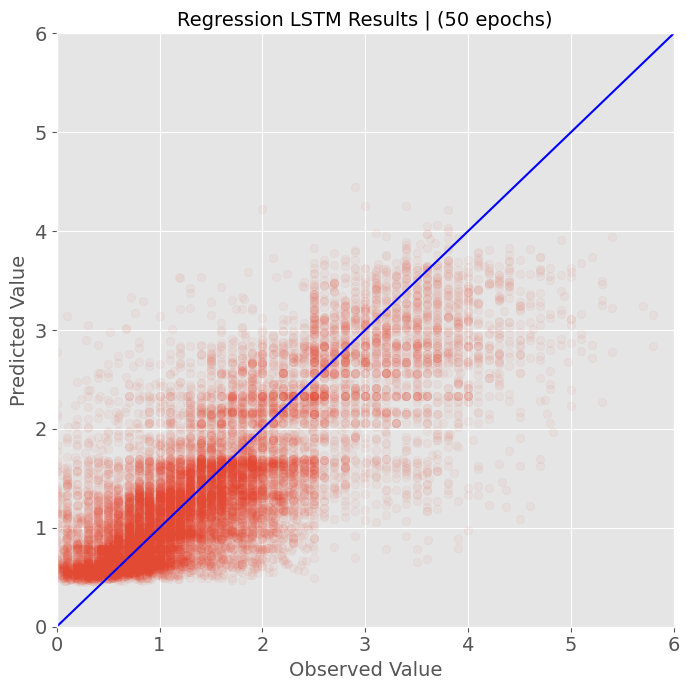

The baseline mse for earthquake magnitude is 0.9567373607639829 

The mse of the LSTM regression for earthquake magnitude is 0.38736453652381897 



In [64]:
# plot train/test accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(model_rm.history.history['loss'])
ax.plot(model_rm.history.history['val_loss'])
ax.set_title('Model Loss (MSE)')
ax.set_ylabel('MSE')
ax.set_xlabel('Epoch')
ax.legend(['train','test'])
plt.savefig('model_loss.png')
plt.show()

# plot y true vs. y predicted
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(model_rm.y_test,model_rm.y_pred,alpha=0.05)
point1 = [0,0]
point2 = [7,7]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression LSTM Results | ({model_rm.epochs} epochs)',fontsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim([0,6])
ax.set_ylim([0,6])
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

# baseline for magnitude regression
baseline_residuals = model_rm.y_test - np.mean(model_rm.y_test)
baseline_mse = np.mean(baseline_residuals**2)
baseline_mse
print(f'The baseline mse for earthquake magnitude is {baseline_mse} \n')

# print mse for the regression model
print(f'The mse of the LSTM regression for earthquake magnitude is {model_rm.test_loss} \n')